<a href="https://colab.research.google.com/github/djarnis2/Skin-lesion-segmentation-on-ISIC-2016/blob/main/ISIC2016_skin__lesions.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
# NEEDED FOR RESTART
from google.colab import drive
drive.mount("/content/drive")



Mounted at /content/drive


In [3]:
# NEEDED FOR RESTART
# Link til data
train_image_path = "https://isic-archive.s3.amazonaws.com/challenges/2016/ISBI2016_ISIC_Part1_Training_Data.zip"
train_groundtruth_path = "https://isic-archive.s3.amazonaws.com/challenges/2016/ISBI2016_ISIC_Part1_Training_GroundTruth.zip"

test_image_path = "https://isic-archive.s3.amazonaws.com/challenges/2016/ISBI2016_ISIC_Part1_Test_Data.zip"
test_groundtruth_path = "https://isic-archive.s3.amazonaws.com/challenges/2016/ISBI2016_ISIC_Part1_Test_GroundTruth.zip"

In [4]:
# NEEDED FOR RESTART
# Hent data, unzip og lav mapper

import os

# Mappe til ISIC-data
data_dir = "isic2016"
os.makedirs(data_dir, exist_ok=True)

# Sætter til kun at downloadw hvis zip-filerne ikke allerede findes
img_zip = os.path.join(data_dir, "isic_train_images.zip")
gt_zip  = os.path.join(data_dir, "isic_train_groundtruth.zip")
img_test_zip = os.path.join(data_dir, "isic_test_images.zip")
gt_test_zip  = os.path.join(data_dir, "isic_test_groundtruth.zip")

if not os.path.exists(img_zip):
    !curl -L "$train_image_path" -o "$img_zip"

if not os.path.exists(gt_zip):
    !curl -L "$train_groundtruth_path" -o "$gt_zip"

if not os.path.exists(img_test_zip):
    !curl -L "$test_image_path" -o "$img_test_zip"

if not os.path.exists(gt_test_zip):
    !curl -L "$test_groundtruth_path" -o "$gt_test_zip"

# Unzip (i samme mappe)
!unzip -oq "$img_zip" -d "$data_dir"
!unzip -oq "$gt_zip"  -d "$data_dir"
!unzip -oq "$img_test_zip" -d "$data_dir"
!unzip -oq "$gt_test_zip"  -d "$data_dir"

# Slet zip efterfølgende
os.remove(img_zip)
os.remove(gt_zip)
os.remove(img_test_zip)
os.remove(gt_test_zip)


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  602M  100  602M    0     0  73.8M      0  0:00:08  0:00:08 --:--:-- 78.4M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 5859k  100 5859k    0     0  9882k      0 --:--:-- --:--:-- --:--:-- 9881k
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  231M  100  231M    0     0  64.6M      0  0:00:03  0:00:03 --:--:-- 64.6M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 2320k  100 2320k    0     0  6669k      0 --:--:-- --:--:-- --:--:-- 6668k


In [5]:
# NEEDED FOR RESTART
# Laver train, val og test splits og mapper
import os, random, shutil

data_dir = "isic2016"

# Kilder
train_img_src = os.path.join(data_dir, "ISBI2016_ISIC_Part1_Training_Data")
train_msk_src = os.path.join(data_dir, "ISBI2016_ISIC_Part1_Training_GroundTruth")

test_img_src  = os.path.join(data_dir, "ISBI2016_ISIC_Part1_Test_Data")
test_msk_src  = os.path.join(data_dir, "ISBI2016_ISIC_Part1_Test_GroundTruth")

# Målmapper
splits = {
    "train": {"images": os.path.join(data_dir, "train", "images"),
              "masks":  os.path.join(data_dir, "train", "masks")},
    "val":   {"images": os.path.join(data_dir, "val", "images"),
              "masks":  os.path.join(data_dir, "val", "masks")},
    "test":  {"images": os.path.join(data_dir, "test", "images"),
              "masks":  os.path.join(data_dir, "test", "masks")},
}

for s in splits.values():
    os.makedirs(s["images"], exist_ok=True)
    os.makedirs(s["masks"], exist_ok=True)

def get_ids_from_jpg(folder):
    return sorted([fn[:-4] for fn in os.listdir(folder) if fn.lower().endswith(".jpg")])

def copy_pairs(ids, src_img_dir, src_msk_dir, dst_img_dir, dst_msk_dir):
    for _id in ids:
        img_src = os.path.join(src_img_dir, f"{_id}.jpg")
        msk_src = os.path.join(src_msk_dir, f"{_id}_Segmentation.png")
        shutil.copy2(img_src, os.path.join(dst_img_dir, f"{_id}.jpg"))
        shutil.copy2(msk_src, os.path.join(dst_msk_dir, f"{_id}_Segmentation.png"))

# Split 900 training data til train/val (720/180)
ids = get_ids_from_jpg(train_img_src)

random.seed(42)
random.shuffle(ids)
split = int(0.8 * len(ids))
train_ids, val_ids = ids[:split], ids[split:]

copy_pairs(train_ids, train_img_src, train_msk_src, splits["train"]["images"], splits["train"]["masks"])
copy_pairs(val_ids,   train_img_src, train_msk_src, splits["val"]["images"],   splits["val"]["masks"])

# Test sæt
test_ids = get_ids_from_jpg(test_img_src)
copy_pairs(test_ids, test_img_src, test_msk_src, splits["test"]["images"], splits["test"]["masks"])

print("done:",
      "train", len(train_ids),
      "val", len(val_ids),
      "test", len(test_ids))


done: train 720 val 180 test 379


In [6]:
# Tjekker størrelser på billederne (bare en test)

import os
from PIL import Image
from collections import Counter

img_dir = "isic2016/train/images"
msk_dir = "isic2016/train/masks"

img_files = sorted([f for f in os.listdir(img_dir) if f.lower().endswith(".jpg")])

sizes = []
mismatches = []

for f in img_files:
    _id = f.replace(".jpg", "")
    img_path = os.path.join(img_dir, f"{_id}.jpg")
    msk_path = os.path.join(msk_dir, f"{_id}_Segmentation.png")

    with Image.open(img_path) as im:
        iw, ih = im.size
    with Image.open(msk_path) as mk:
        mw, mh = mk.size

    sizes.append((iw, ih))

    if (iw, ih) != (mw, mh):
        mismatches.append((_id, (iw, ih), (mw, mh)))

print("Antal images:", len(img_files))
print("Unikke størrelser:", len(set(sizes)))

# min/max
ws = [w for w, h in sizes]
hs = [h for w, h in sizes]
print("Min (W,H):", (min(ws), min(hs)))
print("Max (W,H):", (max(ws), max(hs)))

# mest almindelige størrelser
print("\nTop 10 mest almindelige (W,H):")
for wh, cnt in Counter(sizes).most_common(10):
    print(wh, "->", cnt)

print("\nMismatch image vs mask:", len(mismatches))
if mismatches:
    print("Første 5 mismatches:")
    for m in mismatches[:5]:
        print(m)


Antal images: 720
Unikke størrelser: 69
Min (W,H): (576, 542)
Max (W,H): (4288, 2848)

Top 10 mest almindelige (W,H):
(1024, 768) -> 357
(3024, 2016) -> 55
(4288, 2848) -> 44
(767, 576) -> 38
(2048, 1536) -> 35
(919, 802) -> 34
(1504, 1129) -> 31
(3072, 2304) -> 30
(1022, 767) -> 11
(1502, 1051) -> 7

Mismatch image vs mask: 0


Train data
Images:  720
Masks:  720


Val data
Images:  180
Masks:  180


Test data
Images:  379
Masks:  379


Random example images from validation set


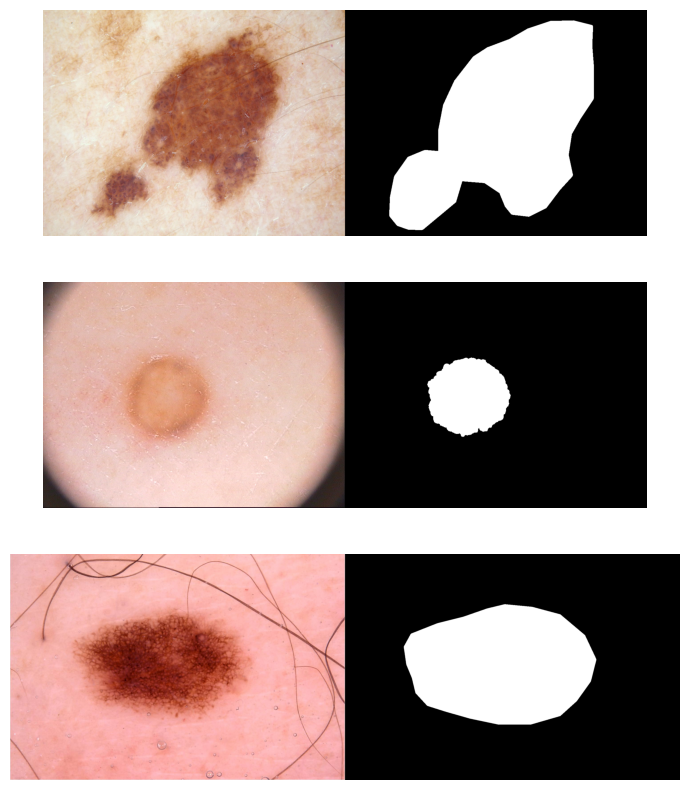

In [7]:
# Plot af billeder og masker (bare en test)
import matplotlib.pyplot as plt
import numpy as np
import random
from PIL import Image

train_data = 'isic2016/train'
val_data = 'isic2016/val'
test_data = 'isic2016/test'

print('Train data')
print('Images: ', len(os.listdir(f'{train_data}/images')))
print('Masks: ',len(os.listdir(f'{train_data}/masks')))
print('\n')
print('Val data')
print('Images: ',len(os.listdir(f'{val_data}/images')))
print('Masks: ', len(os.listdir(f'{val_data}/masks')))
print('\n')
print('Test data')
print('Images: ',len(os.listdir(f'{test_data}/images')))
print('Masks: ',len(os.listdir(f'{test_data}/masks')))
print('\n')

#plot some example images

sample_files = random.choices(os.listdir(f'{val_data}/images'),k=3)

fig = plt.figure(figsize=(10, 10))

columns = 1
rows = 3

print('Random example images from validation set')
for i in range(1, (columns*rows)+1):
    fig.add_subplot(rows, columns, i)
    im = Image.open(f'{val_data}/images/{sample_files[i-1].split(".")[0]}.jpg')
    msk = Image.open(f'{val_data}/masks/{sample_files[i-1].split(".")[0]}_Segmentation.png')
    #the label file is similar to the mask except the values for background/foreground are [0,1] rather than [0,255]
    #we use the labels rather than mask to train the models later

    # gør masken 3-kanals så den kan ligge ved siden af RGB billedet
    msk_rgb = np.stack([msk, msk, msk], axis=-1)

    im = np.concatenate([im,msk_rgb],axis=1)
    plt.axis('off')
    plt.imshow(im)

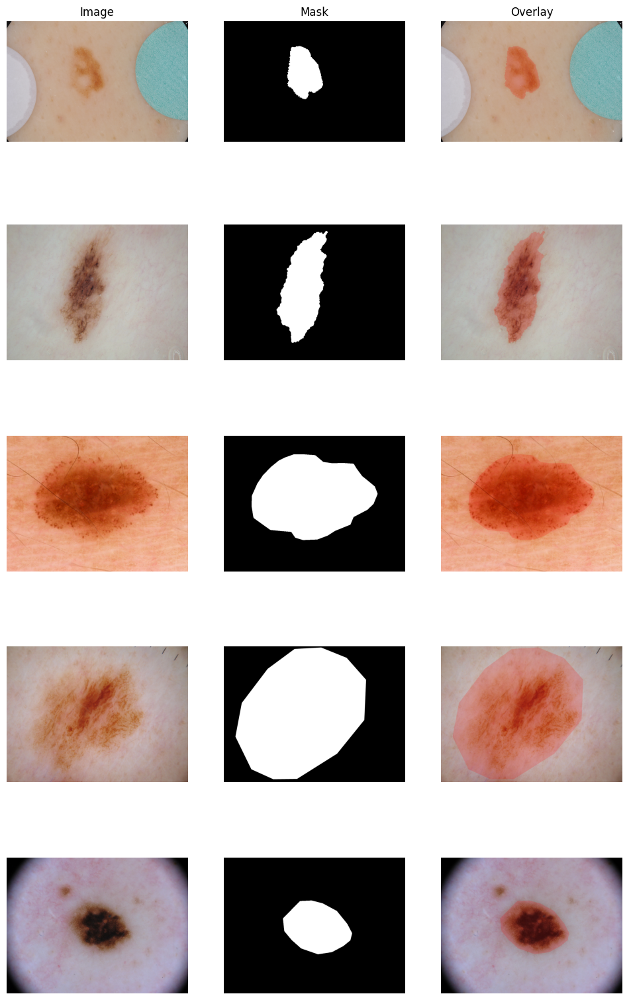

In [ ]:
# Plot af billeder og msaker (bare en test)
import os, random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

val_data = "isic2016/val"

sample_files = random.choices(os.listdir(f"{val_data}/images"), k=5)

fig, axes = plt.subplots(len(sample_files), 3, figsize=(12, 4*len(sample_files)))
titles = ["Image", "Mask", "Overlay"]
for j, t in enumerate(titles):
    axes[0, j].set_title(t)

alpha = 0.17  # hvor gennemsigtig overlayet er (0..1)
color = np.array([255, 0, 0], dtype=np.uint8)  # rød

for r, fn in enumerate(sample_files):
    base = fn.split(".")[0]

    img = np.array(Image.open(f"{val_data}/images/{base}.jpg").convert("RGB"))
    msk = np.array(Image.open(f"{val_data}/masks/{base}_Segmentation.png").convert("L"))

    # binær maske: True hvor læsionen er
    mask = msk > 0

    # lav overlay-billede
    overlay = img.copy()

    # alpha blend kun hvor mask == True
    overlay[mask] = (img[mask] * (1 - alpha) + color * alpha).astype(np.uint8)

    axes[r, 0].imshow(img)
    axes[r, 1].imshow(msk, cmap="gray")
    axes[r, 2].imshow(overlay)

    for c in range(3):
        axes[r, c].axis("off")

plt.show()


In [ ]:
# Sanity check (ikke nødvendig til rerun)
import random
#sanity check (samples)
train_images_sorted = sorted([os.path.join('isic2016/train/images',image)for image in os.listdir('isic2016/train/images')])
train_masks_sorted = sorted([os.path.join('isic2016/train/masks',label)for label in os.listdir('isic2016/train/masks')])

#check if train images and labels match
train_len = len(train_images_sorted)
train_test_num = random.choice(range(2, train_len))
print(f'train image 10-14: {train_images_sorted[(train_test_num - 2):train_test_num]}')
print(f'train mask 10-14: {train_masks_sorted[(train_test_num - 2):train_test_num]}')

val_images = sorted([os.path.join('isic2016/val/images',image)for image in os.listdir('isic2016/val/images')])
val_masks = sorted([os.path.join('isic2016/val/masks',label)for label in os.listdir('isic2016/val/masks')])

#check if val images and labels match
val_len = len(val_images)
val_test_num = random.choice(range(2, val_len))
print(f'val image 10-14: {val_images[(val_test_num - 2):val_test_num]}')
print(f'val mask 10-14: {val_masks[(val_test_num - 2):val_test_num]}')

train image 10-14: ['isic2016/train/images/ISIC_0000143.jpg', 'isic2016/train/images/ISIC_0000145.jpg']
train mask 10-14: ['isic2016/train/masks/ISIC_0000143_Segmentation.png', 'isic2016/train/masks/ISIC_0000145_Segmentation.png']
val image 10-14: ['isic2016/val/images/ISIC_0010602.jpg', 'isic2016/val/images/ISIC_0010844.jpg']
val mask 10-14: ['isic2016/val/masks/ISIC_0010602_Segmentation.png', 'isic2016/val/masks/ISIC_0010844_Segmentation.png']


In [ ]:
# Alt sanity check, der er mere overskueligt (ikke nødvendig til rerun)

import os, random

train_images_sorted = sorted(os.listdir("isic2016/train/images"))
train_masks_sorted  = sorted(os.listdir("isic2016/train/masks"))

k = random.randrange(2, len(train_images_sorted))

print("Train check (2 examples):")
for img_fn, msk_fn in zip(train_images_sorted[k-2:k], train_masks_sorted[k-2:k]):
    img_id = img_fn.replace(".jpg", "")
    msk_id = msk_fn.replace("_Segmentation.png", "")
    print(img_fn, " <-> ", msk_fn, "| IDs match:", img_id == msk_id)


Train check (2 examples):
ISIC_0011123.jpg  <->  ISIC_0011123_Segmentation.png | IDs match: True
ISIC_0011125.jpg  <->  ISIC_0011125_Segmentation.png | IDs match: True


In [11]:
# NEEDED FOR RESTART
# VIGTIGT at danne disse mapper efter sanitycheck

import os

def build_pairs(split_dir):
    img_dir = os.path.join(split_dir, "images")
    msk_dir = os.path.join(split_dir, "masks")

    img_files = [f for f in os.listdir(img_dir) if f.lower().endswith(".jpg")]

    imagePaths, maskPaths = [], []
    missing = 0

    for f in sorted(img_files):
        _id = f[:-4]  # strip .jpg  -> "ISIC_00xxxxx"
        img_path = os.path.join(img_dir, f)
        msk_path = os.path.join(msk_dir, f"{_id}_Segmentation.png")

        if os.path.exists(msk_path):
            imagePaths.append(img_path)
            maskPaths.append(msk_path)
        else:
            missing += 1

    return imagePaths, maskPaths, missing

train_images, train_masks, miss_tr = build_pairs(os.path.join("isic2016", "train"))
val_images,   val_masks,   miss_v  = build_pairs(os.path.join("isic2016", "val"))
test_images,  test_masks,  miss_t  = build_pairs(os.path.join("isic2016", "test"))

print("Train:", len(train_images), "missing masks:", miss_tr)
print("Val  :", len(val_images),   "missing masks:", miss_v)
print("Test :", len(test_images),  "missing masks:", miss_t)

print(train_images[0])
print(train_masks[0])
print(os.path.exists(train_images[0]), os.path.exists(train_masks[0]))


Train: 720 missing masks: 0
Val  : 180 missing masks: 0
Test : 379 missing masks: 0
isic2016/train/images/ISIC_0000000.jpg
isic2016/train/masks/ISIC_0000000_Segmentation.png
True True


In [ ]:
# Udregning af mean og std baseret på resizing (midlertidigt u/padding)
# BEHØVES KUN ÈN GANG --- Da tal er indsat i konfigueringen allerede!

import os
import numpy as np
from PIL import Image

def resize_keep_aspect(pil_img, max_side=512):
    w, h = pil_img.size
    scale = max_side / max(w, h)
    new_w, new_h = int(round(w * scale)), int(round(h * scale))
    return pil_img.resize((new_w, new_h), resample=Image.BILINEAR)

def compute_mean_std_no_padding(image_dir, max_side=512):
    files = sorted([f for f in os.listdir(image_dir) if f.lower().endswith(".jpg")])

    ch_sum = np.zeros(3, dtype=np.float64)
    ch_sum_sq = np.zeros(3, dtype=np.float64)
    n = 0

    for f in files:
        img = Image.open(os.path.join(image_dir, f)).convert("RGB")
        img = resize_keep_aspect(img, max_side=max_side)  # bevarer aspect ratio

        arr = np.asarray(img, dtype=np.float32) / 255.0  # H,W,3
        pixels = arr.reshape(-1, 3)

        ch_sum += pixels.sum(axis=0)
        ch_sum_sq += (pixels ** 2).sum(axis=0)
        n += pixels.shape[0]

    mean = ch_sum / n
    var = (ch_sum_sq / n) - (mean ** 2)
    std = np.sqrt(np.maximum(var, 1e-12))
    return mean.tolist(), std.tolist()

mean, std = compute_mean_std_no_padding("isic2016/train/images", max_side=512)
print("mean:", mean)
print("std :", std)


mean: [0.7230105775891656, 0.6177779170877388, 0.5672913460258063]
std : [0.1657008095439599, 0.1725575604936751, 0.19304642304032354]


In [8]:
# NEEDED FOR RESTART
# ************************* DATASET ********************************************
from torch.utils.data import Dataset as TensorDataset
from torchvision.transforms import v2
from torch.utils.data import DataLoader
from PIL import Image
from torchvision import tv_tensors
import torch

def resize_pad(pil_img, size=512, is_mask=False):
    w, h = pil_img.size
    scale = size / max(w, h)
    new_w, new_h = int(round(w * scale)), int(round(h * scale))

    resample = Image.NEAREST if is_mask else Image.BILINEAR
    pil_resized = pil_img.resize((new_w, new_h), resample=resample)

    pad_left = (size - new_w) // 2
    pad_top  = (size - new_h) // 2

    if is_mask:
        canvas = Image.new("L", (size, size), 0)
    else:
        canvas = Image.new("RGB", (size, size), (0,0,0))

    canvas.paste(pil_resized, (pad_left, pad_top))
    return canvas

class Dataset(TensorDataset):
  def __init__(self,
               imagePaths,
               maskPaths,
               transforms,
               size=512,
               transforms_large=None,
               use_size_dependent=False,
               large_min_side=1024,
               large_prob=1.0,
               force_large_output_size=True
               ):
    # store the image and mask filepaths plus augmentation transforms
    self.imagePaths = imagePaths
    self.maskPaths = maskPaths
    self.transforms = transforms
    self.size = size

    self.transforms_large = transforms_large
    self.use_size_dependent = use_size_dependent
    self.large_min_side = large_min_side
    self.large_prob = float(large_prob)
    self.force_large_output_size = force_large_output_size

  def __len__(self):
    return len(self.imagePaths)


  def __getitem__(self, idx):
      imagePath = self.imagePaths[idx]

      image_pil = Image.open(imagePath).convert("RGB")
      mask_pil  = Image.open(self.maskPaths[idx]).convert("L")

      orig_w, orig_h = image_pil.size
      is_large = (min(orig_w, orig_h) >= self.large_min_side)

      # --- Size-dependent branch (kun hvis slået til) ---
      if (
          self.use_size_dependent
          and (self.transforms_large is not None)
          and is_large
          and (torch.rand(1).item() < self.large_prob)
      ):
          # Kør transforms_large på ORIGINAL størrelse
          image, mask = self.transforms_large(image_pil, tv_tensors.Mask(mask_pil))

      else:
          # --- Default branch (som før) ---
          image_pil = resize_pad(image_pil, size=self.size, is_mask=False)
          mask_pil  = resize_pad(mask_pil,  size=self.size, is_mask=True)

          image, mask = self.transforms(image_pil, tv_tensors.Mask(mask_pil))

      # binarize mask til 0/1 (godt til loss/metrics)
      mask = (mask > 0).to(torch.float32)

      # (valgfrit) sanity check
      if self.force_large_output_size:
          # image: [C,H,W], mask: typisk [H,W] eller [1,H,W]
          ih, iw = image.shape[-2], image.shape[-1]
          if (ih, iw) != (self.size, self.size):
              raise ValueError(f"Expected image size {(self.size,self.size)} but got {(ih,iw)}")

      return image, mask



In [9]:
# NEEDED FOR RESTART
# UNet encoder-decoder model implementering
import torch
import torch.nn as nn
from torchvision import models
from torch.nn.functional import relu
from torchsummary import summary


class encoder_block(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(encoder_block, self).__init__()

        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

    def forward(self,x):
      x = self.block(x)
      return x

class decoder_block(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(decoder_block, self).__init__()
        self.block = nn.Sequential(
            nn.UpsamplingBilinear2d(scale_factor=2),
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
        )


    def forward(self,x):
        x = self.block(x)
        return x

class UNet(nn.Module):
    def __init__(self, in_channels=3, n_class=1,filters=[64,128,256,512]):
        super(UNet, self).__init__()


        self.e1 = encoder_block(in_channels,filters[0])
        self.e2 = encoder_block(filters[0],filters[1])
        self.e3 = encoder_block(filters[1],filters[2])
        self.e4 = encoder_block(filters[2],filters[3])



        self.d1 = decoder_block(filters[3],filters[2])
        self.d2 = decoder_block(filters[2]+filters[2],filters[1])
        self.d3 = decoder_block(filters[1]+filters[1],filters[1])

        self.seg_block = nn.Sequential(nn.UpsamplingBilinear2d(scale_factor=2),
            nn.Conv2d(filters[1]+filters[0],filters[0],kernel_size=3,padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(filters[0],n_class,kernel_size=1))


    def forward(self, x):
        # Encode
        x1 = self.e1(x)
        x2 = self.e2(x1)
        x3 = self.e3(x2)
        x4 = self.e4(x3)

        #decode
        x5 = self.d1(x4)

        x5 = torch.cat([x5,x3],1)

        x6 = self.d2(x5)

        x6 = torch.cat([x6,x2],1)

        x7 = self.d3(x6)

        x7 = torch.cat([x7,x1],1)

        x7 = self.seg_block(x7)


        return x7

# Byger og printwe en summary af en midlertidig model så vi kan se opbygningen

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

Segmentation_model = UNet(n_class=1).to(DEVICE)

summary(Segmentation_model,(3,512,512),1)

# Sletter den midlertidige model igen
del Segmentation_model



----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [1, 64, 512, 512]           1,792
              ReLU-2          [1, 64, 512, 512]               0
            Conv2d-3          [1, 64, 512, 512]          36,928
              ReLU-4          [1, 64, 512, 512]               0
         MaxPool2d-5          [1, 64, 256, 256]               0
     encoder_block-6          [1, 64, 256, 256]               0
            Conv2d-7         [1, 128, 256, 256]          73,856
              ReLU-8         [1, 128, 256, 256]               0
            Conv2d-9         [1, 128, 256, 256]         147,584
             ReLU-10         [1, 128, 256, 256]               0
        MaxPool2d-11         [1, 128, 128, 128]               0
    encoder_block-12         [1, 128, 128, 128]               0
           Conv2d-13         [1, 256, 128, 128]         295,168
             ReLU-14         [1, 256, 1

In [42]:
# NEEDED FOR RESTART
# ******************************************************************************
# *************************** CONFIGS ******************************************
# ******************************************************************************


# google drive settings

SAVE_ROOT = "/content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1"
SAVE_DIR_SCRATCH    = os.path.join(SAVE_ROOT, "scratch")
SAVE_DIR_PRETRAINED = os.path.join(SAVE_ROOT, "pretrained_resnet18_imagenet")

# define antal channels til input, antal klasser,

NUM_CHANNELS = 3
NUM_CLASSES = 1

# initialiser en  learning rate, antal epochs og batch size
INIT_LR = 0.0001
NUM_EPOCHS = 10
BATCH_SIZE = 4

# definer threshold for at filtrere weak predictions
THRESHOLD = 0.5

# definer seed og weight decay
SEED = 42
WEIGHT_DECAY = 0.0

# scheduler indstillinger
SCHEDULER = "none"   # ex: "none" | "plateau" | "cosine"
PLATEAU_FACTOR = 0.5
PLATEAU_PATIENCE = 2
PLATEAU_MIN_LR = 1e-6

# plots
PLOT_EVERY = 1       # sæt til fx 999 under grid runs for ikke at bruge tid på unødige billeder


#mean og standard deviations values til normalisering af data
mean = [0.7230105775891656, 0.6177779170877388, 0.5672913460258063]
std  = [0.1657008095439599, 0.1725575604936751, 0.19304642304032354]

#sat til egen variabel
scratch_mean = [0.7230105775891656, 0.6177779170877388, 0.5672913460258063]
scratch_std  = [0.1657008095439599, 0.1725575604936751, 0.19304642304032354]

#mean and std til imagenet pretrained model
imagenet_mean = [0.485, 0.456, 0.406]
imagenet_std  = [0.229, 0.224, 0.225]

##################################################################
# Transformationer, her er kun valgt de nødvendige
##################################################################

transform = v2.Compose([v2.ToImage(),
                            #v2.RandomRotation(degrees=(-30, 30)),
                            #v2.RandomHorizontalFlip(p=0.5),
                            #v2.RandomVerticalFlip(p=0.5),
                            #v2.RandomAutocontrast(),
                            #v2.ColorJitter(brightness=0.2,contrast=0.2,saturation=0.2),
                            v2.ToDtype(torch.float32, scale=True),
                            v2.Normalize(mean=mean, std=std),
                        ])

###################################################################
# Til validation, brug kun disse
###################################################################


valTransform = v2.Compose([v2.ToImage(),
                            v2.ToDtype(torch.float32, scale=True),
                            v2.Normalize(mean=mean, std=std),
                        ])
# Transforms til imagenet (bruger imagenet mean og std)
transform_imagenet = v2.Compose([
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=imagenet_mean, std=imagenet_std),
])

valTransform_imagenet = v2.Compose([
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=imagenet_mean, std=imagenet_std),
])

# Nye transforms (KUN EKSTRA) - Eksperiment med Store billeder
# De her er tiltænkt at køre "før resize_pad" på originale store billeder,
# så de SKAL outputte 512x512 (RandomResizedCrop gør det)

transform_scratch_large = v2.Compose([
    v2.ToImage(),
    v2.RandomResizedCrop(size=(512, 512), scale=(0.6, 1.0), ratio=(0.9, 1.1)),
    v2.RandomHorizontalFlip(p=0.5),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=mean, std=std),
])

transform_imagenet_large = v2.Compose([
    v2.ToImage(),
    v2.RandomResizedCrop(size=(512, 512), scale=(0.6, 1.0), ratio=(0.9, 1.1)),
    v2.RandomHorizontalFlip(p=0.5),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=imagenet_mean, std=imagenet_std),
])

# Parametre til "large image" logik
LARGE_MIN_SIDE = 1024
LARGE_PROB = 1.0
USE_SIZE_DEPENDENT = False   # slå fra når der ikke køres dette eksperiment


# laver forskellige datasæt
trainDS_short_pretest = Dataset(train_images, train_masks, transforms=transform)
valDS_short_pretest   = Dataset(val_images, val_masks, transforms=valTransform)

trainDS_scratch = Dataset(train_images, train_masks, transforms=transform)
valDS_scratch   = Dataset(val_images, val_masks, transforms=valTransform)

trainDS_imagenet = Dataset(train_images, train_masks, transforms=transform_imagenet)
valDS_imagenet   = Dataset(val_images, val_masks, transforms=valTransform_imagenet)

testDS_scratch   = Dataset(test_images, test_masks, transforms=valTransform)
testDS_imagenet  = Dataset(test_images, test_masks, transforms=valTransform_imagenet)


# NYE datasets: "aug/size-dependent" varianter (ekstra)
trainDS_scratch_aug = Dataset(
    train_images, train_masks,
    transforms=transform,                # fallback (samme som før)
    transforms_large=transform_scratch_large,
    use_size_dependent=USE_SIZE_DEPENDENT,
    large_min_side=LARGE_MIN_SIDE,
    large_prob=LARGE_PROB,
    size=512,
)

valDS_scratch_aug = Dataset(
    val_images, val_masks,
    transforms=valTransform,
    transforms_large=None,
    use_size_dependent=False,            # ingen augmentation på val (aldrig på val)
    size=512,
)

trainDS_imagenet_aug = Dataset(
    train_images, train_masks,
    transforms=transform_imagenet,       # fallback
    transforms_large=transform_imagenet_large,
    use_size_dependent=USE_SIZE_DEPENDENT,
    large_min_side=LARGE_MIN_SIDE,
    large_prob=LARGE_PROB,
    size=512,
)

valDS_imagenet_aug = Dataset(
    val_images, val_masks,
    transforms=valTransform_imagenet,
    use_size_dependent=False,
    size=512,
)

# ============================================================
# EXTRA transforms (til senere) - igen, ændrer IKKE de eksisterende
# ============================================================

LARGE_MIN_SIDE_V2 = 1024   # min(w,h) >= dette => "large"
LARGE_PROB_V2 = 0.7        # hvor ofte
USE_SIZE_DEPENDENT_V2 = False  # slå til når du vil aktivere large-only

# ------------------------------------------------------------
# (A) LARGE-ONLY transforms (konservative / bedre)
# ------------------------------------------------------------
# Kører på ORIGINAL størrelse (PIL) for store billeder,
# og SKAL outputte 512x512 via RandomResizedCrop.

transform_scratch_large_v2 = v2.Compose([
    v2.ToImage(),

    # Mere konservativ crop (mindsker risiko for at lesion ryger ud)
    v2.RandomResizedCrop(
        size=(512, 512),
        scale=(0.75, 1.0),
        ratio=(0.95, 1.05),
        antialias=True,
    ),

    # Mild geometri (safe til mask)
    v2.RandomAffine(
        degrees=10,
        translate=(0.05, 0.05),
        scale=(0.95, 1.05),
        shear=0,
    ),

    v2.RandomHorizontalFlip(p=0.5),
    v2.RandomVerticalFlip(p=0.5),

    # Mild blur/sharpness (image-only)
    v2.RandomApply([v2.GaussianBlur(kernel_size=7, sigma=(0.1, 1.2))], p=0.15),
    v2.RandomApply([v2.RandomAdjustSharpness(sharpness_factor=2.0)], p=0.10),

    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=mean, std=std),
])

transform_imagenet_large_v2 = v2.Compose([
    v2.ToImage(),

    v2.RandomResizedCrop(
        size=(512, 512),
        scale=(0.75, 1.0),
        ratio=(0.95, 1.05),
        antialias=True,
    ),

    v2.RandomAffine(
        degrees=10,
        translate=(0.05, 0.05),
        scale=(0.95, 1.05),
        shear=0,
    ),

    v2.RandomHorizontalFlip(p=0.5),

    v2.RandomApply([v2.GaussianBlur(kernel_size=7, sigma=(0.1, 1.2))], p=0.15),
    v2.RandomApply([v2.RandomAdjustSharpness(sharpness_factor=2.0)], p=0.10),

    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=imagenet_mean, std=imagenet_std),
])

# ------------------------------------------------------------
# (B) ALL-IMAGES augmentation (klar til senere)
# ------------------------------------------------------------
transform_scratch_all_aug_v1 = v2.Compose([
    v2.ToImage(),
    v2.RandomHorizontalFlip(p=0.5),
    v2.RandomApply([v2.ColorJitter(brightness=0.10, contrast=0.10, saturation=0.05, hue=0.02)], p=0.20),
    v2.RandomApply([v2.GaussianBlur(kernel_size=5, sigma=(0.1, 1.0))], p=0.10),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=mean, std=std),
])

transform_imagenet_all_aug_v1 = v2.Compose([
    v2.ToImage(),
    v2.RandomHorizontalFlip(p=0.5),
    v2.RandomApply([v2.ColorJitter(brightness=0.10, contrast=0.10, saturation=0.05, hue=0.02)], p=0.20),
    v2.RandomApply([v2.GaussianBlur(kernel_size=5, sigma=(0.1, 1.0))], p=0.10),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=imagenet_mean, std=imagenet_std),
])

# ============================================================
# EXTRA datasets (til senere) - igen, påvirker ikke de gamle
# ============================================================

# (1) Size-dependent: kun large billeder får large_v2,
# alle andre bruger dine eksisterende baseline transforms.
trainDS_scratch_size_aug_v2 = Dataset(
    train_images, train_masks,
    transforms=transform,  # baseline fallback (som før)
    transforms_large=transform_scratch_large_v2,
    use_size_dependent=USE_SIZE_DEPENDENT_V2,
    large_min_side=LARGE_MIN_SIDE_V2,
    large_prob=LARGE_PROB_V2,
    size=512,
)

valDS_scratch_size_aug_v2 = Dataset(
    val_images, val_masks,
    transforms=valTransform,
    use_size_dependent=False,  # ingen augmentation på val
    size=512,
)

trainDS_imagenet_size_aug_v2 = Dataset(
    train_images, train_masks,
    transforms=transform_imagenet,  # baseline fallback
    transforms_large=transform_imagenet_large_v2,
    use_size_dependent=USE_SIZE_DEPENDENT_V2,
    large_min_side=LARGE_MIN_SIDE_V2,
    large_prob=LARGE_PROB_V2,
    size=512,
)

valDS_imagenet_size_aug_v2 = Dataset(
    val_images, val_masks,
    transforms=valTransform_imagenet,
    use_size_dependent=False,
    size=512,
)

# (2) All-images augmentation: hvis du vil augmentere ALLE billeder senere
# (2) All-images augmentation: hvis du vil augmentere ALLE billeder senere
trainDS_scratch_all_aug_ds_v1 = Dataset(train_images, train_masks, transforms=transform_scratch_all_aug_v1, size=512)
valDS_scratch_all_aug_ds_v1   = Dataset(val_images,   val_masks,   transforms=valTransform,                size=512)

trainDS_imagenet_all_aug_ds_v1 = Dataset(train_images, train_masks, transforms=transform_imagenet_all_aug_v1, size=512)
valDS_imagenet_all_aug_ds_v1   = Dataset(val_images,   val_masks,   transforms=valTransform_imagenet,        size=512)


In [13]:
# NEEDED FOR RESTART
import os
os.makedirs(SAVE_DIR_SCRATCH, exist_ok=True)
os.makedirs(SAVE_DIR_PRETRAINED, exist_ok=True)

In [14]:
# NEEDED FOR RESTART

# ******************************************************
# ******************  train function *******************
# ******************************************************

import os
import numpy as np
import torch
import tqdm
from PIL import Image

from torch.nn import BCEWithLogitsLoss
from torch.optim import Adam
from torch.nn.functional import sigmoid,one_hot
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader

def dice_batch(pred_bin, target, eps=1e-7):
    pred_bin = pred_bin.float()
    target = target.float()
    intersection = (pred_bin * target).sum(dim=(1,2,3))
    union = pred_bin.sum(dim=(1,2,3)) + target.sum(dim=(1,2,3))
    dice = (2 * intersection + eps) / (union + eps)
    return dice.mean()

def iou_batch(pred_bin, target, eps=1e-7):
    pred_bin = pred_bin.float()
    target = target.float()
    inter = (pred_bin * target).sum(dim=(1,2,3))
    union = pred_bin.sum(dim=(1,2,3)) + target.sum(dim=(1,2,3)) - inter
    iou = (inter + eps) / (union + eps)
    return iou.mean()

def train_function(model,trainDS,valDS,
                   lossFunction=None,
                   optimizer=Adam,
                   optimizer_kwargs=None,
                   learningRate =INIT_LR,
                   weight_decay=WEIGHT_DECAY,
                   epochs=NUM_EPOCHS,
                   batchSize=BATCH_SIZE,
                   device="cpu",
                   modelSaveName='model',
                   save_dir=None,
                   plot_every=PLOT_EVERY,
                   scheduler_type=SCHEDULER,
                   plateau_factor=PLATEAU_FACTOR,
                   plateau_patience=PLATEAU_PATIENCE,
                   plateau_min_lr=PLATEAU_MIN_LR,
                   # final træning, til early stopping
                   early_stopping_patience=None,
                   early_stopping_delta=0.0,
                   early_stopping_warmup=0,
                   early_stopping_metric="val_dice"
                   ):

  if lossFunction is None:
    lossFunction = BCEWithLogitsLoss()

  if save_dir is None:
    raise ValueError("train_function: 'save_dir must be given (I.E., SAVE_DIR_SCRATCH or SAVE_DIR_PRETRAINED)")

  os.makedirs(save_dir, exist_ok=True)

  model.to(device)

  if isinstance(lossFunction, torch.nn.Module):
    lossFunction = lossFunction.to(device)

  # Lav training og test data loaders
  num_workers = 2
  trainLoader = DataLoader(trainDS, shuffle=True,
	  batch_size=batchSize,
	  num_workers=num_workers)
  valLoader = DataLoader(valDS, shuffle=False,
	  batch_size=batchSize,
	  num_workers=num_workers)

  trainSteps = len(trainLoader)
  valSteps = len(valLoader)

  optimizer_kwargs = optimizer_kwargs or {}
  opt = optimizer(model.parameters(), lr=learningRate, weight_decay=weight_decay, **optimizer_kwargs)

  # scheduler
  eta_min = learningRate / 50
  scheduler = None
  scheduler_type = (scheduler_type or "none").lower()
  if scheduler_type == "plateau":
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        opt,
        mode="min",
        factor=plateau_factor,
        patience=plateau_patience,
        min_lr=plateau_min_lr,
    )
  elif scheduler_type == "cosine":
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        opt,
        T_max=epochs,
    )
  elif scheduler_type == "sgdr":
    scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
        opt,
        T_0=10,
        T_mult=1,
        eta_min=eta_min,
    )
  elif scheduler_type == "none":
    scheduler = None
  else:
    raise ValueError(f"Unknown scheduler_type: {scheduler_type}")

  bestValLoss = 1e10
  bestValDice = -1

  # initialiser en dictionary til training history 'H'
  H = {
      "train_loss": [], "val_loss": [],
      "train_dice": [], "val_dice": [],
      "train_iou": [], "val_iou": [],
      "lr": [],
      }

  es_enabled = early_stopping_patience is not None
  if es_enabled:
    es_patience = int(early_stopping_patience)
    es_delta = float(early_stopping_delta or 0.0)
    es_warmup = int(early_stopping_warmup or 0)
    es_metric = (early_stopping_metric or "val_dice").lower()

    if es_metric not in ["val_dice", "val_loss"]:
      raise ValueError(f"Unknown early_stopping_metric value: {early_stopping_metric}")
    es_best = -1e18 if es_metric == "val_dice" else 1e18
    es_bad_epochs = 0


  for e in range(epochs):
    epoch_start_lr = opt.param_groups[0]["lr"]

    if scheduler_type == "sgdr" and e == 0:
        print(f"SGDR eta_min: {eta_min:.2e}")  # print én gang (kun sgdr)

    print(f"EPOCH: {e + 1}/{epochs} | epoch-start LR: {epoch_start_lr:.2e}")

    # Sæt modelen i training mode
    model.train()
    # initialiser total TRAINING loss, dice og Iou
    totalTrainLoss = 0
    totalTrainDice = 0
    totalTrainIoU = 0

    # loop over training set
    print('Train phase:')
    for (i, (x, y)) in tqdm.tqdm(enumerate(trainLoader), total=trainSteps):
  	  # send input til device
      (x, y) = (x.to(device), y.to(device))
      # send forward pass og udregn training loss
      pred = model(x)
      loss = lossFunction(pred, y.float())

      pred_bin = (torch.sigmoid(pred) > THRESHOLD).float()
      dice_score = dice_batch(pred_bin, y)
      totalTrainDice += dice_score.item()

      # IoU
      iou_score = iou_batch(pred_bin, y)
      totalTrainIoU += iou_score.item()

      # først, nulstil tidligere akkumuleret gradients, derefter
      # udfør backpropagation, og opdater model parametre
      opt.zero_grad()
      loss.backward()
      opt.step()

      if scheduler_type == "sgdr" and scheduler is not None:
        scheduler.step(e + (i + 1) / trainSteps)

      # tilføj loss til total training loss indtil videre
      totalTrainLoss += loss.item()
    print('\n')
    # Slå autograd fra
    with torch.no_grad():
      model.eval()
      # initialiser total VALIDATION loss, dice and IoU
      totalValLoss = 0
      totalValDice = 0
      totalValIoU = 0

      print('val phase:')

      vis = None


      for (i, (x, y)) in tqdm.tqdm(enumerate(valLoader), total=valSteps):
          (x, y) = (x.to(device), y.to(device))
          pred = model(x)

          loss = lossFunction(pred, y.float())
          totalValLoss += loss.item()

          pred_bin = (torch.sigmoid(pred) > THRESHOLD).float()
          dice_score = dice_batch(pred_bin, y)
          totalValDice += dice_score.item()

          # IoU
          iou_score = iou_batch(pred_bin, y)
          totalValIoU += iou_score.item()

          # gem én random sample (kun første gang pr epoch)
          if vis is None:
              j = torch.randint(0, x.size(0), (1,)).item()
              vis = (x[j].detach().cpu(), y[j].detach().cpu(), pred[j].detach().cpu())


    # Udregn average training og validation loss
    avgTrainLoss = totalTrainLoss / trainSteps
    avgValLoss = totalValLoss / valSteps

    avgTrainDice = totalTrainDice / trainSteps
    avgValDice = totalValDice / valSteps

    avgTrainIou = totalTrainIoU / trainSteps
    avgValIoU = totalValIoU / valSteps

    # log lr
    current_lr = opt.param_groups[0]["lr"]
    H["lr"].append(current_lr)

    # update history
    H["train_loss"].append(avgTrainLoss)
    H["val_loss"].append(avgValLoss)
    H["train_dice"].append(avgTrainDice)
    H["val_dice"].append(avgValDice)
    # print model training og validation information
    H["train_iou"].append(avgTrainIou)
    H["val_iou"].append(avgValIoU)

    print(f"Train loss: {avgTrainLoss:.6f}, Val loss: {avgValLoss:.6f}")
    print(f"Train dice: {avgTrainDice:.3f}, Val dice: {avgValDice:.3f}")
    print(f"Train IoU : {avgTrainIou:.3f}, Val IoU: {avgValIoU:.3f}")
    print(f"LR        : {current_lr:.2e}")

    # scheduler step
    if scheduler_type == "plateau" and scheduler is not None:
      scheduler.step(avgValLoss) # plateau på val loss
    elif scheduler_type == "cosine" and scheduler is not None:
      scheduler.step()

    # Gem modelen med bedste performing på validation set
    if avgValDice > bestValDice:
      bestValDice = avgValDice
      ckpt_path = os.path.join(save_dir, f"{modelSaveName}.pth")
      torch.save({
        'epoch': e,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': opt.state_dict(),
        'val_loss': avgValLoss,
        'val_dice': avgValDice,
        'val_iou': avgValIoU,
        'lr': current_lr,
        'config': {
          'learningrate': learningRate,
          'weight_dacay': weight_decay,
          'batchSize': batchSize,
          'epochs': epochs,
          'threshold': THRESHOLD,
          'scheduler_type': scheduler_type,
          'plateau_factor': plateau_factor,
          'plateau_patience': plateau_patience,
          'plateau_min_lr': plateau_min_lr,
          'early_stopping_patience': early_stopping_patience,
          'early_stopping_delta': early_stopping_delta,
          'early_stopping_warmup': early_stopping_warmup,
          'early_stopping_metric': early_stopping_metric,
        }
      }, ckpt_path)
      print(f'Saved best checkpoint -> {ckpt_path} (val dice={bestValDice:.3f})')

    # early_stopping
    if es_enabled:
      if (e + 1) <= es_warmup:
        print(f"Early stopping warmup ({e+1}/{es_warmup}) — not tracking yet")
      else:
        current = avgValDice if es_metric == "val_dice" else avgValLoss

        if es_metric == "val_dice":
          has_improved = (current >= es_best + es_delta)
        else:
          has_improved = (current <= es_best - es_delta)
        if has_improved:
          es_best = current
          es_bad_epochs = 0
        else:
          es_bad_epochs += 1

        print(f"Early stopping on {es_metric} | best={es_best} | bad_epochs={es_bad_epochs}/{es_patience}")
        if es_bad_epochs >= es_patience:
          print(f"Early stopping triggered at epoch:{e + 1}/{epochs}")
          break

    # plot
    do_plot = (plot_every is not None) and (plot_every > 0) and ((e + 1) % plot_every == 0)
    if do_plot and vis is not None:

      fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(15, 5))

      x_vis, y_vis, pred_vis = vis

      im = np.moveaxis(x_vis.numpy(), 0, -1)
      im = im*np.array(std) + np.array(mean)

      mask = np.moveaxis(np.stack([np.squeeze(y_vis.numpy(), axis=0)]*3, axis=0), 0, -1).astype(np.uint8)*255
      out  = np.moveaxis(np.stack([np.squeeze(torch.sigmoid(pred_vis).numpy(), axis=0)]*3, axis=0), 0, -1)

      print(f'min lesion pixel probability: {np.min(out)}')
      print(f'max lesion pixel probability: {np.max(out)}')
      pred_vis_bin = out.copy()
      pred_vis_bin[pred_vis_bin >= THRESHOLD] = 1
      pred_vis_bin[pred_vis_bin < THRESHOLD] = 0

      im = np.clip(im, 0, 1)

      ax[0].imshow(im)
      ax[0].set_title(f"Input Image")

      ax[1].imshow(Image.fromarray(mask))
      ax[1].set_title(f"Reference Lesion Mask")

      ax[2].imshow(out)
      ax[2].set_title(f"Lesion Probability Map")

      ax[3].imshow(pred_vis_bin)
      ax[3].set_title(f"Predicted Lesion segmentation")

      plt.show()
      plt.close()

  return H



EPOCH: 1/2 | epoch-start LR: 1.00e-04
Train phase:


100%|██████████| 180/180 [01:52<00:00,  1.59it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.29it/s]


Train loss: 0.383002, Val loss: 0.286703
Train dice: 0.489, Val dice: 0.676
Train IoU : 0.393, Val IoU: 0.559
LR        : 1.00e-04
Saved best checkpoint -> short_pretest/unet_short_pretest.pth (val dice=0.676)
min lesion pixel probability: 0.0012315677013248205
max lesion pixel probability: 0.9147930145263672


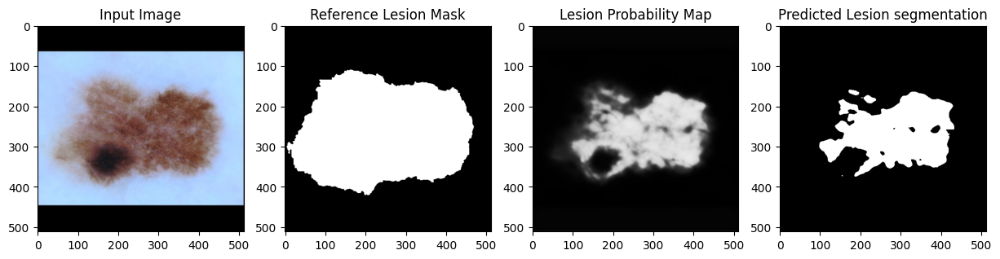

EPOCH: 2/2 | epoch-start LR: 1.00e-04
Train phase:


100%|██████████| 180/180 [01:50<00:00,  1.63it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.36it/s]


Train loss: 0.288500, Val loss: 0.267852
Train dice: 0.656, Val dice: 0.722
Train IoU : 0.547, Val IoU: 0.618
LR        : 1.00e-04
Saved best checkpoint -> short_pretest/unet_short_pretest.pth (val dice=0.722)
min lesion pixel probability: 1.2108017699574702e-06
max lesion pixel probability: 0.9758225679397583


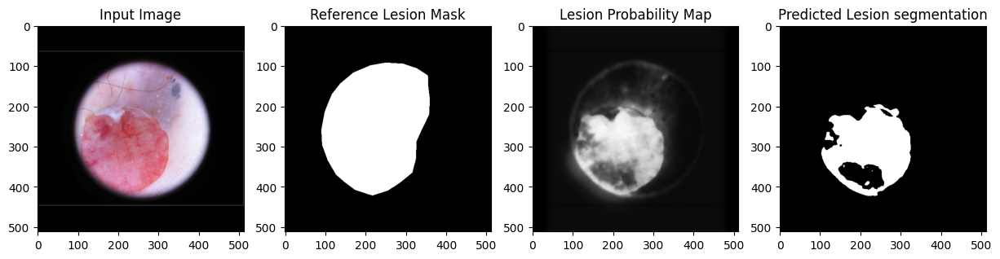

In [ ]:
# En test run: unet_short_pretest (ikke nødvendig til rerun)
import cv2
import tqdm

try:
  del unet
  del x
  del y
  torch.cuda.empty_cache()
except:
  torch.cuda.empty_cache()

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

# initialiser UNet model
unet = UNet(in_channels=NUM_CHANNELS,n_class=NUM_CLASSES)
# initialiser loss function
lossFunc = BCEWithLogitsLoss(reduction="mean")


history = train_function(unet,trainDS_short_pretest,valDS_short_pretest,lossFunction=lossFunc,optimizer=Adam,
               learningRate = INIT_LR,
               epochs=2,
               batchSize=BATCH_SIZE,
               device=DEVICE,
               save_dir='short_pretest',
               modelSaveName='unet_short_pretest')

In [15]:
# NEEDED FOR RESTART
# ****************************************************************************************************************************
# **************************************** Trying out pretrained models as backbone ******************************************
# ****************************************************************************************************************************

#  A caveat with increasing complexity and making use of pretrained models is that this may lead to problems with overfitting.


#Install the Segmentation-models-pytorch library to access predefined segmentation models with pretrained weights
#https://segmentation-modelspytorch.readthedocs.io/en/latest/#
!pip install segmentation-models-pytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 4.2 MB/s eta 0:00:00


In [16]:
# NEEDED FOR RESTART (make_loss bliver også brugt flere steder end i experiment runs med run_experiments)
# ******************************************
# grid search definition med run_experiments
# ******************************************

import json, time, random, os
import numpy as np
import pandas as pd
import torch
from torch.nn import BCEWithLogitsLoss
import torch.nn.functional as F
from torch.optim import Adam, AdamW, SGD
import segmentation_models_pytorch as smp

def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

def save_json(path, obj):
    with open(path, "w") as f:
        json.dump(obj, f, indent=2)

def make_loss(loss_name: str):
    loss_name = loss_name.lower()

    if loss_name == "bce":
        return torch.nn.BCEWithLogitsLoss()

    if loss_name == "dice":
        return smp.losses.DiceLoss(mode="binary", from_logits=True)

    if loss_name in ("bce+dice", "bce_dice", "bce-dice"):
        bce = torch.nn.BCEWithLogitsLoss()
        dice = smp.losses.DiceLoss(mode="binary", from_logits=True)

        def loss_fn(pred, target):
            target = target.float()
            return bce(pred, target) + dice(pred, target)
        return loss_fn

    if loss_name == "focal":
        # SMP focal loss (binary)
        return smp.losses.FocalLoss(mode="binary")  # fra logits håndteres internt i SMP

    raise ValueError(f"Unknown loss: {loss_name}")


def run_experiments(planned_runs, results_csv_path):
    os.makedirs(os.path.dirname(results_csv_path), exist_ok=True)

    all_results = []
    if os.path.exists(results_csv_path):
        all_results = pd.read_csv(results_csv_path).to_dict("records")

    for cfg in planned_runs:
        set_seed(cfg.get("seed", SEED))

        preset = cfg["preset"]  # "scratch" or "pretrained"
        run_name = cfg["name"]

        if preset == "scratch":
            model = UNet(in_channels=NUM_CHANNELS, n_class=NUM_CLASSES)

            # default baseline
            trainDS_use, valDS_use = trainDS_scratch, valDS_scratch

            # override hvis cfg giver datasets direkte
            if "trainDS" in cfg and "valDS" in cfg:
                trainDS_use, valDS_use = cfg["trainDS"], cfg["valDS"]

            base_dir = SAVE_DIR_SCRATCH
            lr = cfg.get("lr", INIT_LR)

        elif preset == "pretrained":
            model = smp.Unet(
                encoder_name=cfg.get("encoder_name", "resnet18"),
                encoder_weights=cfg.get("encoder_weights", "imagenet"),
                in_channels=NUM_CHANNELS,
                classes=NUM_CLASSES,
                encoder_depth=cfg.get("encoder_depth", 4),
                decoder_channels=cfg.get("decoder_channels", (256,128,64,32)),
                activation=None,
            )

            trainDS_use, valDS_use = trainDS_imagenet, valDS_imagenet

            if "trainDS" in cfg and "valDS" in cfg:
              trainDS_use, valDS_use = cfg["trainDS"], cfg["valDS"]
            base_dir = SAVE_DIR_PRETRAINED
            lr = cfg.get("lr", INIT_LR * 0.1)
        else:
            raise ValueError("preset must be 'scratch' or 'pretrained'")

        run_dir = os.path.join(base_dir, run_name)

        if os.path.exists(os.path.join(run_dir, "best.pth")):
          print("skip - already done", run_name)
          continue
        os.makedirs(run_dir, exist_ok=True)

        loss_name = cfg.get("loss", "bce")
        loss_fn = make_loss(loss_name)

        scheduler_type = cfg.get("scheduler_type", SCHEDULER)
        wd = cfg.get("weight_decay", WEIGHT_DECAY)
        plot_every = cfg.get("plot_every", 999)  # default: ingen plots under grid

        opt_name = (cfg.get("optimizer") or ("adamw" if wd and wd > 0 else "adam")).lower()

        if opt_name == "sgd":
            opt_cls = SGD
            opt_kwargs = {
                "momentum": cfg.get("momentum", 0.9),
                "nesterov": cfg.get("nesterov", True),
            }
        elif opt_name == "adamw":
            opt_cls = AdamW
            opt_kwargs = {}
        else:
            opt_cls = Adam
            opt_kwargs = {}

        print("\n==============================")
        print("RUN:", run_name)
        print("dataset:", cfg.get("dataset_tag", "baseline"))
        print("opt:", opt_name, "|preset:", preset, "| lr:", lr, "| wd:", wd, "| sched:", scheduler_type)
        print("save to:", run_dir)
        print("==============================\n")

        t0 = time.time()

        H = train_function(
            model,
            trainDS_use, valDS_use,
            lossFunction=loss_fn,
            optimizer=opt_cls,
            optimizer_kwargs=opt_kwargs,
            learningRate=lr,
            weight_decay=wd,
            epochs=cfg.get("epochs", NUM_EPOCHS),
            batchSize=cfg.get("batchSize", BATCH_SIZE),
            device=DEVICE,
            modelSaveName="best",          # checkpoint filnavn inde i run_dir
            save_dir=run_dir,
            scheduler_type=scheduler_type,
            plot_every=plot_every,
            plateau_factor=cfg.get("plateau_factor", PLATEAU_FACTOR),
            plateau_patience=cfg.get("plateau_patience", PLATEAU_PATIENCE),
            plateau_min_lr=cfg.get("plateau_min_lr", PLATEAU_MIN_LR),
            early_stopping_patience=cfg.get("early_stopping_patience", None),
            early_stopping_delta=cfg.get("early_stopping_delta", 0.0),
            early_stopping_warmup=cfg.get("early_stopping_warmup", 0),
            early_stopping_metric=cfg.get("early_stopping_metric", "val_dice"),
        )

        seconds = time.time() - t0

        # gem history pr run
        save_json(os.path.join(run_dir, "history.json"), H)

        # best epoch metrics
        best_epoch = int(np.argmax(H["val_dice"]))
        row = {
            "name": run_name,
            "preset": preset,
            "optimizer": opt_name,
            "lr": lr,
            "weight_decay": wd,
            "scheduler_type": scheduler_type,
            "epochs": len(H["val_dice"]),
            "best_epoch": best_epoch + 1,
            "best_val_dice": float(H["val_dice"][best_epoch]),
            "best_val_iou": float(H["val_iou"][best_epoch]),
            "best_val_loss": float(H["val_loss"][best_epoch]),
            "final_val_dice": float(H["val_dice"][-1]),
            "final_val_iou": float(H["val_iou"][-1]),
            "seconds": seconds,
            "run_dir": run_dir,
            "seed": cfg.get("seed", None),
            "exp_type": cfg.get("exp_type", "grid"),
        }

        all_results.append(row)
        pd.DataFrame(all_results).to_csv(results_csv_path, index=False)

    return pd.DataFrame(all_results)


In [ ]:
# (ikke nødvendig til rerun)
# Metode til søgning efter beste lr
def lr_range_test(
    model,
    loader,
    loss_fn,
    optimizer_cls,
    device="cuda",
    lr_start=1e-7,
    lr_end=1e-1,
    num_steps=300,
    weight_decay=0.0,
):
    model.train()
    model.to(device)

    # start med lr_start
    opt = optimizer_cls(model.parameters(), lr=lr_start, weight_decay=weight_decay)

    # multiplicativ faktor så lr går fra lr_start -> lr_end på num_steps
    mult = (lr_end / lr_start) ** (1 / (num_steps - 1))

    lrs, losses = [], []
    it = iter(loader)

    for step in range(num_steps):
        try:
            x, y = next(it)
        except StopIteration:
            it = iter(loader)
            x, y = next(it)

        x = x.to(device)
        y = y.to(device)
        if y.ndim == 3:
            y = y.unsqueeze(1)
        y = y.float()

        opt.zero_grad(set_to_none=True)
        logits = model(x)
        loss = loss_fn(logits, y)
        loss.backward()
        opt.step()

        lr = opt.param_groups[0]["lr"]
        lrs.append(lr)
        losses.append(float(loss.item()))

        # opdater lr
        opt.param_groups[0]["lr"] = lr * mult

        # stop hvis den divergerer helt
        if step > 20 and losses[-1] > 5 * min(losses):
            break

    return np.array(lrs), np.array(losses)


In [ ]:
# (ikke nødvendig til rerun)
# Søgning efter beste lr med ovenstående metode, med adam som optimizer
trainLoader = DataLoader(trainDS_scratch, batch_size=4, shuffle=True, num_workers=2)
loss_fn_lrtest = torch.nn.BCEWithLogitsLoss()

lrs_adam, losses_adam = lr_range_test(
    model=UNet(in_channels=NUM_CHANNELS, n_class=NUM_CLASSES),
    loader=trainLoader,
    loss_fn=loss_fn_lrtest,
    optimizer_cls=torch.optim.Adam,
    weight_decay=0.0,
    lr_start=1e-7,
    lr_end=1e-2,
    num_steps=300,
)


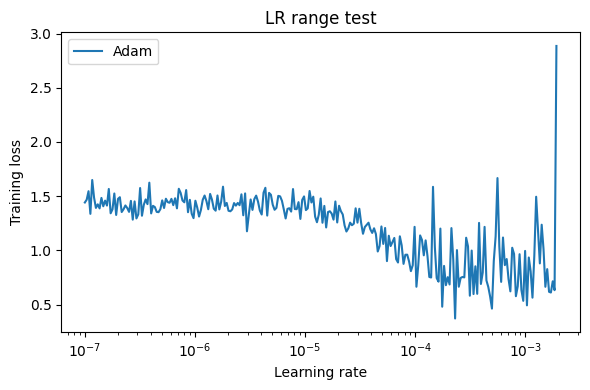

In [ ]:
# BCE + Dice Med mindre den er kørt igen (BCE + Dice er ikke sat her, men derimod ændret til torch.nn.BCEWithLogitsLoss() overnover til næste run)
import matplotlib.pyplot as plt

plt.figure(figsize=(6,4))
plt.plot(lrs_adam, losses_adam, label="Adam")
# plt.plot(lrs_adamw, losses_adamw, label="AdamW")  # hvis du kører den
plt.xscale("log")
plt.xlabel("Learning rate")
plt.ylabel("Training loss")
plt.title("LR range test")
plt.legend()
plt.tight_layout()
plt.show()


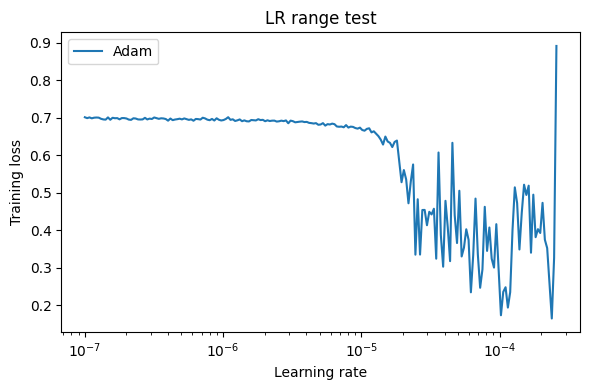

In [ ]:
# BCEWithLogitsLoss
import matplotlib.pyplot as plt

plt.figure(figsize=(6,4))
plt.plot(lrs_adam, losses_adam, label="Adam")
# plt.plot(lrs_adamw, losses_adamw, label="AdamW")  # hvis du kører den
plt.xscale("log")
plt.xlabel("Learning rate")
plt.ylabel("Training loss")
plt.title("LR range test")
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
# setup til runs to test lr ALLE ER KØRT HER OG GEMT
# planned_runs = [
    # ---------- SCRATCH ----------
    # {"name": "scratch_baseline_lr1e-4", "preset": "scratch", "lr": 1e-4, "scheduler_type": "none"},
    # {"name": "scratch_lr3e-4",          "preset": "scratch", "lr": 3e-4, "scheduler_type": "none"},
    # {"name": "scratch_wd1e-4",          "preset": "scratch", "lr": 1e-4, "weight_decay": 1e-4, "scheduler_type": "none"},
    # {"name": "scratch_plateau",         "preset": "scratch", "lr": 1e-4, "scheduler_type": "plateau"},

    # # ---------- PRETRAINED ----------
    # {"name": "pre_r18_lr1e-5",          "preset": "pretrained", "lr": 1e-5, "scheduler_type": "none"},
    # {"name": "pre_r18_lr3e-5",          "preset": "pretrained", "lr": 3e-5, "scheduler_type": "none"},
    # {"name": "pre_r18_plateau",         "preset": "pretrained", "lr": 1e-5, "scheduler_type": "plateau"},
# ]


In [ ]:
# Kør Grid runs ER TESTET
# results_csv = os.path.join(SAVE_ROOT, "results.csv")
# df_results = run_experiments(planned_runs, results_csv_path=results_csv)
# df_results.sort_values("best_val_dice", ascending=False)



RUN: scratch_plateau
preset: scratch | lr: 0.0001 | wd: 0.0 | sched: plateau
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_plateau

EPOCH: 1/10
Train phase:


100%|██████████| 180/180 [01:52<00:00,  1.61it/s]



val phase:



100%|██████████| 45/45 [00:14<00:00,  3.08it/s]


Train loss: 0.372126, Val loss: 0.290895
Train dice: 0.407, Val dice: 0.649
Train IoU : 0.323, Val IoU: 0.530
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_plateau/best.pth (val dice=0.649)
EPOCH: 2/10
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.46it/s]


Train loss: 0.292541, Val loss: 0.246329
Train dice: 0.657, Val dice: 0.736
Train IoU : 0.542, Val IoU: 0.625
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_plateau/best.pth (val dice=0.736)
EPOCH: 3/10
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:14<00:00,  3.18it/s]

Train loss: 0.270637, Val loss: 0.239622
Train dice: 0.678, Val dice: 0.724
Train IoU : 0.568, Val IoU: 0.616
LR        : 1.00e-04
EPOCH: 4/10
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.37it/s]


Train loss: 0.240799, Val loss: 0.227277
Train dice: 0.739, Val dice: 0.769
Train IoU : 0.632, Val IoU: 0.664
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_plateau/best.pth (val dice=0.769)
EPOCH: 5/10
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:14<00:00,  3.15it/s]


Train loss: 0.230785, Val loss: 0.196706
Train dice: 0.756, Val dice: 0.791
Train IoU : 0.650, Val IoU: 0.688
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_plateau/best.pth (val dice=0.791)
EPOCH: 6/10
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:14<00:00,  3.15it/s]

Train loss: 0.216421, Val loss: 0.208034
Train dice: 0.769, Val dice: 0.773
Train IoU : 0.663, Val IoU: 0.665
LR        : 1.00e-04
EPOCH: 7/10
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.28it/s]


Train loss: 0.208915, Val loss: 0.179848
Train dice: 0.777, Val dice: 0.805
Train IoU : 0.672, Val IoU: 0.703
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_plateau/best.pth (val dice=0.805)
EPOCH: 8/10
Train phase:


100%|██████████| 180/180 [01:50<00:00,  1.63it/s]



val phase:



100%|██████████| 45/45 [00:14<00:00,  3.08it/s]

Train loss: 0.205770, Val loss: 0.196228
Train dice: 0.785, Val dice: 0.786
Train IoU : 0.681, Val IoU: 0.685
LR        : 1.00e-04
EPOCH: 9/10
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.42it/s]

Train loss: 0.201709, Val loss: 0.186009
Train dice: 0.789, Val dice: 0.793
Train IoU : 0.686, Val IoU: 0.685
LR        : 1.00e-04
EPOCH: 10/10
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:14<00:00,  3.08it/s]


Train loss: 0.197404, Val loss: 0.171240
Train dice: 0.795, Val dice: 0.818
Train IoU : 0.693, Val IoU: 0.719
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_plateau/best.pth (val dice=0.818)


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/46.8M [00:00<?, ?B/s]


RUN: pre_r18_lr1e-5
preset: pretrained | lr: 1e-05 | wd: 0.0 | sched: none
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr1e-5

EPOCH: 1/10
Train phase:


100%|██████████| 180/180 [00:57<00:00,  3.11it/s]



val phase:



100%|██████████| 45/45 [00:11<00:00,  4.05it/s]


Train loss: 0.533329, Val loss: 0.351308
Train dice: 0.578, Val dice: 0.789
Train IoU : 0.447, Val IoU: 0.677
LR        : 1.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr1e-5/best.pth (val dice=0.789)
EPOCH: 2/10
Train phase:


100%|██████████| 180/180 [00:56<00:00,  3.19it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.39it/s]


Train loss: 0.329043, Val loss: 0.293414
Train dice: 0.795, Val dice: 0.821
Train IoU : 0.688, Val IoU: 0.723
LR        : 1.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr1e-5/best.pth (val dice=0.821)
EPOCH: 3/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.25it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.13it/s]


Train loss: 0.269930, Val loss: 0.253396
Train dice: 0.829, Val dice: 0.836
Train IoU : 0.731, Val IoU: 0.744
LR        : 1.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr1e-5/best.pth (val dice=0.836)
EPOCH: 4/10
Train phase:


100%|██████████| 180/180 [00:56<00:00,  3.20it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.22it/s]


Train loss: 0.241713, Val loss: 0.208888
Train dice: 0.842, Val dice: 0.875
Train IoU : 0.749, Val IoU: 0.793
LR        : 1.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr1e-5/best.pth (val dice=0.875)
EPOCH: 5/10
Train phase:


100%|██████████| 180/180 [00:56<00:00,  3.18it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.95it/s]


Train loss: 0.212526, Val loss: 0.188470
Train dice: 0.859, Val dice: 0.879
Train IoU : 0.771, Val IoU: 0.799
LR        : 1.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr1e-5/best.pth (val dice=0.879)
EPOCH: 6/10
Train phase:


100%|██████████| 180/180 [00:56<00:00,  3.16it/s]



val phase:



100%|██████████| 45/45 [00:11<00:00,  4.09it/s]


Train loss: 0.196984, Val loss: 0.180536
Train dice: 0.864, Val dice: 0.881
Train IoU : 0.777, Val IoU: 0.802
LR        : 1.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr1e-5/best.pth (val dice=0.881)
EPOCH: 7/10
Train phase:


100%|██████████| 180/180 [00:57<00:00,  3.15it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.84it/s]


Train loss: 0.183124, Val loss: 0.167126
Train dice: 0.875, Val dice: 0.885
Train IoU : 0.793, Val IoU: 0.808
LR        : 1.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr1e-5/best.pth (val dice=0.885)
EPOCH: 8/10
Train phase:


100%|██████████| 180/180 [00:56<00:00,  3.19it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.15it/s]

Train loss: 0.167626, Val loss: 0.158722
Train dice: 0.884, Val dice: 0.884
Train IoU : 0.807, Val IoU: 0.807
LR        : 1.00e-05
EPOCH: 9/10
Train phase:



100%|██████████| 180/180 [00:55<00:00,  3.24it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.68it/s]


Train loss: 0.158327, Val loss: 0.149866
Train dice: 0.886, Val dice: 0.888
Train IoU : 0.808, Val IoU: 0.813
LR        : 1.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr1e-5/best.pth (val dice=0.888)
EPOCH: 10/10
Train phase:


100%|██████████| 180/180 [00:56<00:00,  3.16it/s]



val phase:



100%|██████████| 45/45 [00:11<00:00,  4.08it/s]


Train loss: 0.147212, Val loss: 0.141605
Train dice: 0.892, Val dice: 0.890
Train IoU : 0.818, Val IoU: 0.814
LR        : 1.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr1e-5/best.pth (val dice=0.890)

RUN: pre_r18_lr3e-5
preset: pretrained | lr: 3e-05 | wd: 0.0 | sched: none
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr3e-5

EPOCH: 1/10
Train phase:


100%|██████████| 180/180 [00:57<00:00,  3.15it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.15it/s]


Train loss: 0.388491, Val loss: 0.228947
Train dice: 0.731, Val dice: 0.850
Train IoU : 0.618, Val IoU: 0.761
LR        : 3.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr3e-5/best.pth (val dice=0.850)
EPOCH: 2/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.26it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.34it/s]


Train loss: 0.227166, Val loss: 0.191388
Train dice: 0.844, Val dice: 0.868
Train IoU : 0.750, Val IoU: 0.786
LR        : 3.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr3e-5/best.pth (val dice=0.868)
EPOCH: 3/10
Train phase:


100%|██████████| 180/180 [00:56<00:00,  3.20it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.13it/s]


Train loss: 0.178919, Val loss: 0.170413
Train dice: 0.867, Val dice: 0.869
Train IoU : 0.783, Val IoU: 0.788
LR        : 3.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr3e-5/best.pth (val dice=0.869)
EPOCH: 4/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.22it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.51it/s]


Train loss: 0.156620, Val loss: 0.133554
Train dice: 0.878, Val dice: 0.892
Train IoU : 0.800, Val IoU: 0.818
LR        : 3.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr3e-5/best.pth (val dice=0.892)
EPOCH: 5/10
Train phase:


100%|██████████| 180/180 [00:56<00:00,  3.16it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.11it/s]

Train loss: 0.129740, Val loss: 0.124711
Train dice: 0.893, Val dice: 0.888
Train IoU : 0.820, Val IoU: 0.811
LR        : 3.00e-05
EPOCH: 6/10
Train phase:



100%|██████████| 180/180 [00:53<00:00,  3.34it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.41it/s]


Train loss: 0.117849, Val loss: 0.117264
Train dice: 0.900, Val dice: 0.895
Train IoU : 0.828, Val IoU: 0.822
LR        : 3.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr3e-5/best.pth (val dice=0.895)
EPOCH: 7/10
Train phase:


100%|██████████| 180/180 [00:56<00:00,  3.21it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.35it/s]


Train loss: 0.105229, Val loss: 0.109565
Train dice: 0.908, Val dice: 0.898
Train IoU : 0.840, Val IoU: 0.826
LR        : 3.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr3e-5/best.pth (val dice=0.898)
EPOCH: 8/10
Train phase:


100%|██████████| 180/180 [00:56<00:00,  3.20it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.30it/s]

Train loss: 0.090378, Val loss: 0.104538
Train dice: 0.917, Val dice: 0.896
Train IoU : 0.853, Val IoU: 0.823
LR        : 3.00e-05
EPOCH: 9/10
Train phase:



100%|██████████| 180/180 [00:55<00:00,  3.24it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.41it/s]

Train loss: 0.084217, Val loss: 0.101879
Train dice: 0.920, Val dice: 0.895
Train IoU : 0.858, Val IoU: 0.824
LR        : 3.00e-05
EPOCH: 10/10
Train phase:



100%|██████████| 180/180 [00:54<00:00,  3.28it/s]



val phase:



100%|██████████| 45/45 [00:11<00:00,  4.05it/s]


Train loss: 0.075614, Val loss: 0.102763
Train dice: 0.925, Val dice: 0.893
Train IoU : 0.867, Val IoU: 0.820
LR        : 3.00e-05

RUN: pre_r18_plateau
preset: pretrained | lr: 1e-05 | wd: 0.0 | sched: plateau
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_plateau

EPOCH: 1/10
Train phase:


100%|██████████| 180/180 [00:56<00:00,  3.18it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.41it/s]


Train loss: 0.533336, Val loss: 0.351144
Train dice: 0.578, Val dice: 0.789
Train IoU : 0.447, Val IoU: 0.677
LR        : 1.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_plateau/best.pth (val dice=0.789)
EPOCH: 2/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.27it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.12it/s]


Train loss: 0.328991, Val loss: 0.293351
Train dice: 0.795, Val dice: 0.821
Train IoU : 0.688, Val IoU: 0.722
LR        : 1.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_plateau/best.pth (val dice=0.821)
EPOCH: 3/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.23it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.60it/s]


Train loss: 0.269927, Val loss: 0.253241
Train dice: 0.829, Val dice: 0.836
Train IoU : 0.731, Val IoU: 0.744
LR        : 1.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_plateau/best.pth (val dice=0.836)
EPOCH: 4/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.23it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.14it/s]


Train loss: 0.241697, Val loss: 0.208791
Train dice: 0.842, Val dice: 0.875
Train IoU : 0.749, Val IoU: 0.793
LR        : 1.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_plateau/best.pth (val dice=0.875)
EPOCH: 5/10
Train phase:


100%|██████████| 180/180 [00:56<00:00,  3.17it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.20it/s]


Train loss: 0.212524, Val loss: 0.188438
Train dice: 0.859, Val dice: 0.879
Train IoU : 0.771, Val IoU: 0.799
LR        : 1.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_plateau/best.pth (val dice=0.879)
EPOCH: 6/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.24it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.33it/s]


Train loss: 0.196979, Val loss: 0.180238
Train dice: 0.864, Val dice: 0.881
Train IoU : 0.777, Val IoU: 0.802
LR        : 1.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_plateau/best.pth (val dice=0.881)
EPOCH: 7/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.22it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.23it/s]


Train loss: 0.183120, Val loss: 0.167033
Train dice: 0.875, Val dice: 0.885
Train IoU : 0.793, Val IoU: 0.808
LR        : 1.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_plateau/best.pth (val dice=0.885)
EPOCH: 8/10
Train phase:


100%|██████████| 180/180 [00:56<00:00,  3.20it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.56it/s]

Train loss: 0.167649, Val loss: 0.158567
Train dice: 0.884, Val dice: 0.884
Train IoU : 0.807, Val IoU: 0.807
LR        : 1.00e-05
EPOCH: 9/10
Train phase:



100%|██████████| 180/180 [00:55<00:00,  3.27it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.27it/s]


Train loss: 0.158328, Val loss: 0.149933
Train dice: 0.886, Val dice: 0.888
Train IoU : 0.808, Val IoU: 0.813
LR        : 1.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_plateau/best.pth (val dice=0.888)
EPOCH: 10/10
Train phase:


100%|██████████| 180/180 [00:56<00:00,  3.17it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.60it/s]


Train loss: 0.147279, Val loss: 0.141600
Train dice: 0.892, Val dice: 0.890
Train IoU : 0.818, Val IoU: 0.814
LR        : 1.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_plateau/best.pth (val dice=0.890)


,name,preset,lr,weight_decay,scheduler_type,epochs,best_epoch,best_val_dice,best_val_iou,final_val_dice,final_val_iou,seconds,run_dir
5,pre_r18_lr3e-5,pretrained,0.00003,0.0000,none,10,7,0.897670,0.825670,0.893064,0.820123,666.894825,/content/drive/MyDrive/Colab Notebooks/isic201...
4,pre_r18_lr1e-5,pretrained,0.00001,0.0000,none,10,10,0.889841,0.814008,0.889841,0.814008,674.079387,/content/drive/MyDrive/Colab Notebooks/isic201...
6,pre_r18_plateau,pretrained,0.00001,0.0000,plateau,10,10,0.889702,0.813787,0.889702,0.813787,668.319773,/content/drive/MyDrive/Colab Notebooks/isic201...
0,scratch_baseline_lr1e-4,scratch,0.00010,0.0000,none,10,10,0.823561,0.725293,0.823561,0.725293,1239.951724,/content/drive/MyDrive/Colab Notebooks/isic201...
3,scratch_plateau,scratch,0.00010,0.0000,plateau,10,10,0.818276,0.719378,0.818276,0.719378,1241.569930,/content/drive/MyDrive/Colab Notebooks/isic201...
1,scratch_lr3e-4,scratch,0.00030,0.0000,none,10,10,0.804957,0.708160,0.804957,0.708160,1210.361561,/content/drive/MyDrive/Colab Notebooks/isic201...
2,scratch_wd1e-4,scratch,0.00010,0.0001,none,10,9,0.762848,0.660615,0.745417,0.644922,1233.779652,/content/drive/MyDrive/Colab Notebooks/isic201...


In [ ]:
# ER KØRT
# DENNE CELLE ER TIL AT tILFØJE VAL LOSS TIL RESULTS MAPPEN. KØRES ÈN GANG
import os, json
import numpy as np
import pandas as pd

def load_json(path):
    with open(path, "r") as f:
        return json.load(f)

def rebuild_results_csv(save_root, save_dir_scratch, save_dir_pretrained, out_csv_path):
    rows = []

    for preset, base_dir in [("scratch", save_dir_scratch), ("pretrained", save_dir_pretrained)]:
        if not os.path.isdir(base_dir):
            continue

        for run_name in sorted(os.listdir(base_dir)):
            run_dir = os.path.join(base_dir, run_name)
            hist_path = os.path.join(run_dir, "history.json")
            ckpt_path = os.path.join(run_dir, "best.pth")

            if not os.path.isfile(hist_path):
                continue

            H = load_json(hist_path)

            # best epoch by val_dice
            val_dice = np.array(H["val_dice"], dtype=float)
            best_epoch_idx = int(np.argmax(val_dice))

            row = {
                "name": run_name,
                "preset": preset,
                "epochs": len(val_dice),
                "best_epoch": best_epoch_idx + 1,
                "best_val_dice": float(H["val_dice"][best_epoch_idx]),
                "best_val_iou": float(H["val_iou"][best_epoch_idx]) if "val_iou" in H else np.nan,
                "best_val_loss": float(H["val_loss"][best_epoch_idx]) if "val_loss" in H else np.nan,
                "final_val_dice": float(H["val_dice"][-1]),
                "final_val_iou": float(H["val_iou"][-1]) if "val_iou" in H else np.nan,
                "final_val_loss": float(H["val_loss"][-1]) if "val_loss" in H else np.nan,
                "run_dir": run_dir,
                "has_best_ckpt": os.path.isfile(ckpt_path),
            }

            rows.append(row)

    df = pd.DataFrame(rows)

    # Valgfrit: sortér pænt
    if "best_val_dice" in df.columns:
        df = df.sort_values(["preset", "best_val_dice"], ascending=[True, False])

    os.makedirs(os.path.dirname(out_csv_path), exist_ok=True)
    df.to_csv(out_csv_path, index=False)
    return df

results_v2_path = os.path.join(SAVE_ROOT, "results_v2.csv")
df_v2 = rebuild_results_csv(
    save_root=SAVE_ROOT,
    save_dir_scratch=SAVE_DIR_SCRATCH,
    save_dir_pretrained=SAVE_DIR_PRETRAINED,
    out_csv_path=results_v2_path
)

df_v2


,name,preset,epochs,best_epoch,best_val_dice,best_val_iou,best_val_loss,final_val_dice,final_val_iou,final_val_loss,run_dir,has_best_ckpt
5,pre_r18_lr3e-5,pretrained,10,7,0.897670,0.825670,0.109565,0.893064,0.820123,0.102763,/content/drive/MyDrive/Colab Notebooks/isic201...,True
4,pre_r18_lr1e-5,pretrained,10,10,0.889841,0.814008,0.141605,0.889841,0.814008,0.141605,/content/drive/MyDrive/Colab Notebooks/isic201...,True
6,pre_r18_plateau,pretrained,10,10,0.889702,0.813787,0.141600,0.889702,0.813787,0.141600,/content/drive/MyDrive/Colab Notebooks/isic201...,True
0,scratch_baseline_lr1e-4,scratch,10,10,0.823561,0.725293,0.170738,0.823561,0.725293,0.170738,/content/drive/MyDrive/Colab Notebooks/isic201...,True
2,scratch_plateau,scratch,10,10,0.818276,0.719378,0.171240,0.818276,0.719378,0.171240,/content/drive/MyDrive/Colab Notebooks/isic201...,True
1,scratch_lr3e-4,scratch,10,10,0.804957,0.708160,0.172538,0.804957,0.708160,0.172538,/content/drive/MyDrive/Colab Notebooks/isic201...,True
3,scratch_wd1e-4,scratch,10,9,0.762848,0.660615,0.213243,0.745417,0.644922,0.216979,/content/drive/MyDrive/Colab Notebooks/isic201...,True


In [ ]:
# ER KØRT
planned_runs_lr_only = [
    # --- SCRATCH (nye) ---
    {"name": "scratch_lr5e-5", "preset": "scratch", "lr": 5e-5, "scheduler_type": "none"},
    {"name": "scratch_lr7e-5", "preset": "scratch", "lr": 7e-5, "scheduler_type": "none"},
    {"name": "scratch_lr3e-3", "preset": "scratch", "lr": 3e-3, "scheduler_type": "none"},  # stress test

    # --- PRETRAINED (nye) ---
    {"name": "pre_r18_lr7e-6", "preset": "pretrained", "lr": 7e-6, "scheduler_type": "none"},
    {"name": "pre_r18_lr7e-4", "preset": "pretrained", "lr": 7e-4, "scheduler_type": "none"}, # stress test
]


In [ ]:
# Kør nye grid runs og log dem til v2

#results_csv = os.path.join(SAVE_ROOT, "results_v2.csv")
#df_results = run_experiments(planned_runs_lr_only, results_csv_path=results_csv)
#df_results.sort_values("best_val_dice", ascending=False)


RUN: scratch_lr5e-5
preset: scratch | lr: 5e-05 | wd: 0.0 | sched: none
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr5e-5

EPOCH: 1/10
Train phase:


100%|██████████| 180/180 [01:51<00:00,  1.62it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.43it/s]


Train loss: 0.401008, Val loss: 0.327180
Train dice: 0.250, Val dice: 0.636
Train IoU : 0.196, Val IoU: 0.514
LR        : 5.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr5e-5/best.pth (val dice=0.636)
EPOCH: 2/10
Train phase:


100%|██████████| 180/180 [01:50<00:00,  1.62it/s]



val phase:



100%|██████████| 45/45 [00:14<00:00,  3.13it/s]


Train loss: 0.301846, Val loss: 0.258736
Train dice: 0.654, Val dice: 0.713
Train IoU : 0.539, Val IoU: 0.603
LR        : 5.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr5e-5/best.pth (val dice=0.713)
EPOCH: 3/10
Train phase:


100%|██████████| 180/180 [01:50<00:00,  1.63it/s]



val phase:



100%|██████████| 45/45 [00:14<00:00,  3.17it/s]


Train loss: 0.263439, Val loss: 0.234327
Train dice: 0.710, Val dice: 0.723
Train IoU : 0.600, Val IoU: 0.620
LR        : 5.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr5e-5/best.pth (val dice=0.723)
EPOCH: 4/10
Train phase:


100%|██████████| 180/180 [01:50<00:00,  1.62it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.36it/s]


Train loss: 0.248434, Val loss: 0.238536
Train dice: 0.732, Val dice: 0.743
Train IoU : 0.624, Val IoU: 0.636
LR        : 5.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr5e-5/best.pth (val dice=0.743)
EPOCH: 5/10
Train phase:


100%|██████████| 180/180 [01:50<00:00,  1.62it/s]



val phase:



100%|██████████| 45/45 [00:14<00:00,  3.11it/s]


Train loss: 0.236580, Val loss: 0.199883
Train dice: 0.748, Val dice: 0.788
Train IoU : 0.639, Val IoU: 0.686
LR        : 5.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr5e-5/best.pth (val dice=0.788)
EPOCH: 6/10
Train phase:


100%|██████████| 180/180 [01:50<00:00,  1.63it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.27it/s]

Train loss: 0.226163, Val loss: 0.211042
Train dice: 0.760, Val dice: 0.786
Train IoU : 0.654, Val IoU: 0.684
LR        : 5.00e-05
EPOCH: 7/10
Train phase:



100%|██████████| 180/180 [01:50<00:00,  1.63it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.33it/s]


Train loss: 0.218745, Val loss: 0.192423
Train dice: 0.771, Val dice: 0.794
Train IoU : 0.666, Val IoU: 0.692
LR        : 5.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr5e-5/best.pth (val dice=0.794)
EPOCH: 8/10
Train phase:


100%|██████████| 180/180 [01:51<00:00,  1.62it/s]



val phase:



100%|██████████| 45/45 [00:14<00:00,  3.19it/s]

Train loss: 0.213312, Val loss: 0.198910
Train dice: 0.776, Val dice: 0.778
Train IoU : 0.671, Val IoU: 0.675
LR        : 5.00e-05
EPOCH: 9/10
Train phase:



100%|██████████| 180/180 [01:50<00:00,  1.63it/s]



val phase:



100%|██████████| 45/45 [00:14<00:00,  3.21it/s]

Train loss: 0.204277, Val loss: 0.192194
Train dice: 0.789, Val dice: 0.784
Train IoU : 0.686, Val IoU: 0.675
LR        : 5.00e-05
EPOCH: 10/10
Train phase:



100%|██████████| 180/180 [01:50<00:00,  1.63it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.44it/s]


Train loss: 0.206273, Val loss: 0.178917
Train dice: 0.788, Val dice: 0.814
Train IoU : 0.686, Val IoU: 0.717
LR        : 5.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr5e-5/best.pth (val dice=0.814)

RUN: scratch_lr7e-5
preset: scratch | lr: 7e-05 | wd: 0.0 | sched: none
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr7e-5

EPOCH: 1/10
Train phase:


100%|██████████| 180/180 [01:50<00:00,  1.63it/s]



val phase:



100%|██████████| 45/45 [00:14<00:00,  3.14it/s]


Train loss: 0.384825, Val loss: 0.298395
Train dice: 0.354, Val dice: 0.679
Train IoU : 0.282, Val IoU: 0.562
LR        : 7.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr7e-5/best.pth (val dice=0.679)
EPOCH: 2/10
Train phase:


100%|██████████| 180/180 [01:50<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.37it/s]


Train loss: 0.294206, Val loss: 0.252866
Train dice: 0.665, Val dice: 0.741
Train IoU : 0.552, Val IoU: 0.635
LR        : 7.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr7e-5/best.pth (val dice=0.741)
EPOCH: 3/10
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.31it/s]

Train loss: 0.267783, Val loss: 0.238142
Train dice: 0.703, Val dice: 0.721
Train IoU : 0.595, Val IoU: 0.617
LR        : 7.00e-05
EPOCH: 4/10
Train phase:



100%|██████████| 180/180 [01:51<00:00,  1.62it/s]



val phase:



100%|██████████| 45/45 [00:14<00:00,  3.08it/s]


Train loss: 0.250438, Val loss: 0.241185
Train dice: 0.725, Val dice: 0.760
Train IoU : 0.617, Val IoU: 0.655
LR        : 7.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr7e-5/best.pth (val dice=0.760)
EPOCH: 5/10
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.44it/s]


Train loss: 0.231962, Val loss: 0.197824
Train dice: 0.749, Val dice: 0.786
Train IoU : 0.641, Val IoU: 0.685
LR        : 7.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr7e-5/best.pth (val dice=0.786)
EPOCH: 6/10
Train phase:


100%|██████████| 180/180 [01:50<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:14<00:00,  3.21it/s]

Train loss: 0.220037, Val loss: 0.222674
Train dice: 0.762, Val dice: 0.765
Train IoU : 0.656, Val IoU: 0.655
LR        : 7.00e-05
EPOCH: 7/10
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.46it/s]


Train loss: 0.213572, Val loss: 0.187228
Train dice: 0.768, Val dice: 0.800
Train IoU : 0.662, Val IoU: 0.701
LR        : 7.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr7e-5/best.pth (val dice=0.800)
EPOCH: 8/10
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.38it/s]

Train loss: 0.209171, Val loss: 0.191401
Train dice: 0.777, Val dice: 0.790
Train IoU : 0.672, Val IoU: 0.687
LR        : 7.00e-05
EPOCH: 9/10
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:14<00:00,  3.20it/s]

Train loss: 0.199671, Val loss: 0.187772
Train dice: 0.790, Val dice: 0.788
Train IoU : 0.688, Val IoU: 0.682
LR        : 7.00e-05
EPOCH: 10/10
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.51it/s]


Train loss: 0.202585, Val loss: 0.181368
Train dice: 0.790, Val dice: 0.805
Train IoU : 0.688, Val IoU: 0.706
LR        : 7.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr7e-5/best.pth (val dice=0.805)

RUN: scratch_lr3e-3
preset: scratch | lr: 0.003 | wd: 0.0 | sched: none
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr3e-3

EPOCH: 1/10
Train phase:


100%|██████████| 180/180 [01:43<00:00,  1.74it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.24it/s]


Train loss: 0.568518, Val loss: 0.357611
Train dice: 0.100, Val dice: 0.000
Train IoU : 0.080, Val IoU: 0.000
LR        : 3.00e-03
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr3e-3/best.pth (val dice=0.000)
EPOCH: 2/10
Train phase:


100%|██████████| 180/180 [01:42<00:00,  1.76it/s]



val phase:



100%|██████████| 45/45 [00:14<00:00,  3.21it/s]


Train loss: 0.337021, Val loss: 0.291409
Train dice: 0.411, Val dice: 0.656
Train IoU : 0.327, Val IoU: 0.536
LR        : 3.00e-03
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr3e-3/best.pth (val dice=0.656)
EPOCH: 3/10
Train phase:


100%|██████████| 180/180 [01:41<00:00,  1.76it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.28it/s]

Train loss: 0.327465, Val loss: 0.304372
Train dice: 0.584, Val dice: 0.591
Train IoU : 0.469, Val IoU: 0.468
LR        : 3.00e-03
EPOCH: 4/10
Train phase:



100%|██████████| 180/180 [01:41<00:00,  1.78it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.32it/s]


Train loss: 0.315074, Val loss: 0.301217
Train dice: 0.606, Val dice: 0.673
Train IoU : 0.487, Val IoU: 0.554
LR        : 3.00e-03
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr3e-3/best.pth (val dice=0.673)
EPOCH: 5/10
Train phase:


100%|██████████| 180/180 [01:41<00:00,  1.77it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.27it/s]

Train loss: 0.309083, Val loss: 0.275900
Train dice: 0.620, Val dice: 0.672
Train IoU : 0.501, Val IoU: 0.552
LR        : 3.00e-03
EPOCH: 6/10
Train phase:



100%|██████████| 180/180 [01:41<00:00,  1.77it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.33it/s]

Train loss: 0.307370, Val loss: 0.301088
Train dice: 0.608, Val dice: 0.651
Train IoU : 0.488, Val IoU: 0.532
LR        : 3.00e-03
EPOCH: 7/10
Train phase:



100%|██████████| 180/180 [01:41<00:00,  1.78it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.35it/s]

Train loss: 0.302391, Val loss: 0.279783
Train dice: 0.615, Val dice: 0.664
Train IoU : 0.495, Val IoU: 0.542
LR        : 3.00e-03
EPOCH: 8/10
Train phase:



100%|██████████| 180/180 [01:41<00:00,  1.77it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.33it/s]


Train loss: 0.297577, Val loss: 0.282675
Train dice: 0.637, Val dice: 0.692
Train IoU : 0.517, Val IoU: 0.573
LR        : 3.00e-03
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr3e-3/best.pth (val dice=0.692)
EPOCH: 9/10
Train phase:


100%|██████████| 180/180 [01:41<00:00,  1.77it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.42it/s]


Train loss: 0.297929, Val loss: 0.271917
Train dice: 0.634, Val dice: 0.695
Train IoU : 0.514, Val IoU: 0.580
LR        : 3.00e-03
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr3e-3/best.pth (val dice=0.695)
EPOCH: 10/10
Train phase:


100%|██████████| 180/180 [01:41<00:00,  1.77it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.67it/s]


Train loss: 0.290963, Val loss: 0.269749
Train dice: 0.648, Val dice: 0.624
Train IoU : 0.532, Val IoU: 0.505
LR        : 3.00e-03

RUN: pre_r18_lr7e-6
preset: pretrained | lr: 7e-06 | wd: 0.0 | sched: none
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-6

EPOCH: 1/10
Train phase:


100%|██████████| 180/180 [00:53<00:00,  3.34it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.29it/s]


Train loss: 0.588071, Val loss: 0.407504
Train dice: 0.513, Val dice: 0.718
Train IoU : 0.380, Val IoU: 0.589
LR        : 7.00e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-6/best.pth (val dice=0.718)
EPOCH: 2/10
Train phase:


100%|██████████| 180/180 [00:54<00:00,  3.29it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.08it/s]


Train loss: 0.370656, Val loss: 0.332113
Train dice: 0.760, Val dice: 0.798
Train IoU : 0.643, Val IoU: 0.691
LR        : 7.00e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-6/best.pth (val dice=0.798)
EPOCH: 3/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.23it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.24it/s]


Train loss: 0.303873, Val loss: 0.284115
Train dice: 0.813, Val dice: 0.821
Train IoU : 0.709, Val IoU: 0.724
LR        : 7.00e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-6/best.pth (val dice=0.821)
EPOCH: 4/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.27it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.13it/s]


Train loss: 0.272294, Val loss: 0.239765
Train dice: 0.826, Val dice: 0.861
Train IoU : 0.727, Val IoU: 0.773
LR        : 7.00e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-6/best.pth (val dice=0.861)
EPOCH: 5/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.23it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.26it/s]


Train loss: 0.242469, Val loss: 0.216367
Train dice: 0.844, Val dice: 0.870
Train IoU : 0.750, Val IoU: 0.786
LR        : 7.00e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-6/best.pth (val dice=0.870)
EPOCH: 6/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.27it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.15it/s]


Train loss: 0.226470, Val loss: 0.208815
Train dice: 0.851, Val dice: 0.870
Train IoU : 0.759, Val IoU: 0.787
LR        : 7.00e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-6/best.pth (val dice=0.870)
EPOCH: 7/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.23it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.26it/s]


Train loss: 0.212123, Val loss: 0.192296
Train dice: 0.862, Val dice: 0.877
Train IoU : 0.775, Val IoU: 0.797
LR        : 7.00e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-6/best.pth (val dice=0.877)
EPOCH: 8/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.27it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.11it/s]


Train loss: 0.197266, Val loss: 0.181894
Train dice: 0.871, Val dice: 0.877
Train IoU : 0.788, Val IoU: 0.798
LR        : 7.00e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-6/best.pth (val dice=0.877)
EPOCH: 9/10
Train phase:


100%|██████████| 180/180 [00:54<00:00,  3.29it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.34it/s]


Train loss: 0.187405, Val loss: 0.174383
Train dice: 0.870, Val dice: 0.881
Train IoU : 0.786, Val IoU: 0.803
LR        : 7.00e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-6/best.pth (val dice=0.881)
EPOCH: 10/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.26it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.17it/s]


Train loss: 0.176667, Val loss: 0.162739
Train dice: 0.878, Val dice: 0.885
Train IoU : 0.799, Val IoU: 0.808
LR        : 7.00e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-6/best.pth (val dice=0.885)

RUN: pre_r18_lr7e-4
preset: pretrained | lr: 0.0007 | wd: 0.0 | sched: none
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4

EPOCH: 1/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.25it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.28it/s]


Train loss: 0.211360, Val loss: 0.156459
Train dice: 0.800, Val dice: 0.839
Train IoU : 0.698, Val IoU: 0.746
LR        : 7.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4/best.pth (val dice=0.839)
EPOCH: 2/10
Train phase:


100%|██████████| 180/180 [00:54<00:00,  3.32it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.55it/s]


Train loss: 0.162925, Val loss: 0.135096
Train dice: 0.834, Val dice: 0.854
Train IoU : 0.741, Val IoU: 0.766
LR        : 7.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4/best.pth (val dice=0.854)
EPOCH: 3/10
Train phase:


100%|██████████| 180/180 [00:54<00:00,  3.28it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.39it/s]

Train loss: 0.136799, Val loss: 0.152019
Train dice: 0.861, Val dice: 0.851
Train IoU : 0.775, Val IoU: 0.762
LR        : 7.00e-04
EPOCH: 4/10
Train phase:



100%|██████████| 180/180 [00:53<00:00,  3.36it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.22it/s]


Train loss: 0.148827, Val loss: 0.119309
Train dice: 0.845, Val dice: 0.877
Train IoU : 0.758, Val IoU: 0.799
LR        : 7.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4/best.pth (val dice=0.877)
EPOCH: 5/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.26it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.33it/s]


Train loss: 0.120379, Val loss: 0.113468
Train dice: 0.875, Val dice: 0.880
Train IoU : 0.794, Val IoU: 0.801
LR        : 7.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4/best.pth (val dice=0.880)
EPOCH: 6/10
Train phase:


100%|██████████| 180/180 [01:04<00:00,  2.81it/s]



val phase:



100%|██████████| 45/45 [00:14<00:00,  3.08it/s]

Train loss: 0.120066, Val loss: 0.126591
Train dice: 0.873, Val dice: 0.860
Train IoU : 0.791, Val IoU: 0.777
LR        : 7.00e-04
EPOCH: 7/10
Train phase:



100%|██████████| 180/180 [01:03<00:00,  2.84it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.28it/s]


Train loss: 0.105751, Val loss: 0.100432
Train dice: 0.887, Val dice: 0.885
Train IoU : 0.811, Val IoU: 0.810
LR        : 7.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4/best.pth (val dice=0.885)
EPOCH: 8/10
Train phase:


100%|██████████| 180/180 [00:57<00:00,  3.12it/s]




val phase:


100%|██████████| 45/45 [00:10<00:00,  4.34it/s]

Train loss: 0.100028, Val loss: 0.131100
Train dice: 0.889, Val dice: 0.860
Train IoU : 0.815, Val IoU: 0.777
LR        : 7.00e-04
EPOCH: 9/10
Train phase:



100%|██████████| 180/180 [00:55<00:00,  3.26it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.49it/s]

Train loss: 0.097947, Val loss: 0.131536
Train dice: 0.891, Val dice: 0.837
Train IoU : 0.816, Val IoU: 0.745
LR        : 7.00e-04
EPOCH: 10/10
Train phase:



100%|██████████| 180/180 [00:56<00:00,  3.21it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.42it/s]

Train loss: 0.096499, Val loss: 0.116667
Train dice: 0.895, Val dice: 0.861
Train IoU : 0.823, Val IoU: 0.777
LR        : 7.00e-04


,name,preset,epochs,best_epoch,best_val_dice,best_val_iou,best_val_loss,final_val_dice,final_val_iou,final_val_loss,run_dir,has_best_ckpt,lr,weight_decay,scheduler_type,seconds
0,pre_r18_lr3e-5,pretrained,10,7,0.897670,0.825670,0.109565,0.893064,0.820123,0.102763,/content/drive/MyDrive/Colab Notebooks/isic201...,True,NaN,NaN,NaN,NaN
1,pre_r18_lr1e-5,pretrained,10,10,0.889841,0.814008,0.141605,0.889841,0.814008,0.141605,/content/drive/MyDrive/Colab Notebooks/isic201...,True,NaN,NaN,NaN,NaN
2,pre_r18_plateau,pretrained,10,10,0.889702,0.813787,0.141600,0.889702,0.813787,0.141600,/content/drive/MyDrive/Colab Notebooks/isic201...,True,NaN,NaN,NaN,NaN
10,pre_r18_lr7e-6,pretrained,10,10,0.885472,0.807970,0.162739,0.885472,0.807970,NaN,/content/drive/MyDrive/Colab Notebooks/isic201...,NaN,0.000007,0.0,none,652.356393
11,pre_r18_lr7e-4,pretrained,10,7,0.885427,0.810427,0.100432,0.861336,0.776732,NaN,/content/drive/MyDrive/Colab Notebooks/isic201...,NaN,0.000700,0.0,none,683.396479
3,scratch_baseline_lr1e-4,scratch,10,10,0.823561,0.725293,0.170738,0.823561,0.725293,0.170738,/content/drive/MyDrive/Colab Notebooks/isic201...,True,NaN,NaN,NaN,NaN
4,scratch_plateau,scratch,10,10,0.818276,0.719378,0.171240,0.818276,0.719378,0.171240,/content/drive/MyDrive/Colab Notebooks/isic201...,True,NaN,NaN,NaN,NaN
7,scratch_lr5e-5,scratch,10,10,0.814285,0.716828,0.178917,0.814285,0.716828,NaN,/content/drive/MyDrive/Colab Notebooks/isic201...,NaN,0.000050,0.0,none,1249.368318
8,scratch_lr7e-5,scratch,10,10,0.805163,0.705922,0.181368,0.805163,0.705922,NaN,/content/drive/MyDrive/Colab Notebooks/isic201...,NaN,0.000070,0.0,none,1239.670634
5,scratch_lr3e-4,scratch,10,10,0.804957,0.708160,0.172538,0.804957,0.708160,0.172538,/content/drive/MyDrive/Colab Notebooks/isic201...,True,NaN,NaN,NaN,NaN


In [ ]:
# ER KØRT
planned_runs_next = [
    # =========================
    # SCRATCH (longer epochs for fairer comparison)
    # =========================
    {
        "name": "scratch_lr1e-4_cosine_ep30",
        "preset": "scratch",
        "lr": 1e-4,
        "scheduler_type": "cosine",
        "epochs": 30,
    },

    # =========================
    # PRETRAINED (stabilize around best lr=3e-5)
    # =========================
    {
        "name": "pre_r18_lr3e-5_wd1e-4_none",
        "preset": "pretrained",
        "lr": 3e-5,
        "weight_decay": 1e-4,
        "scheduler_type": "none",
        "epochs": 10,
    },
    {
        "name": "pre_r18_lr3e-5_wd1e-5_none",
        "preset": "pretrained",
        "lr": 3e-5,
        "weight_decay": 1e-5,
        "scheduler_type": "none",
        "epochs": 10,
    },
    {
        "name": "pre_r18_lr3e-5_cosine",
        "preset": "pretrained",
        "lr": 3e-5,
        "scheduler_type": "cosine",
        "epochs": 10,
    },

    # =========================
    # PRETRAINED (aggressive LR try, but is "controlled")
    # =========================
    {
        "name": "pre_r18_lr7e-4_cosine",
        "preset": "pretrained",
        "lr": 7e-4,
        "scheduler_type": "cosine",
        "epochs": 10,
    },
]


In [ ]:
# ER KØRT
results_csv = os.path.join(SAVE_ROOT, "results.csv")  # samme fil er fint
df_results = run_experiments(planned_runs_next, results_csv_path=results_csv)
df_results.sort_values("best_val_dice", ascending=False)



RUN: scratch_lr1e-4_cosine_ep30
preset: scratch | lr: 0.0001 | wd: 0.0 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30

EPOCH: 1/30
Train phase:


100%|██████████| 180/180 [01:50<00:00,  1.63it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.22it/s]


Train loss: 0.373024, Val loss: 0.294926
Train dice: 0.405, Val dice: 0.645
Train IoU : 0.322, Val IoU: 0.526
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30/best.pth (val dice=0.645)
EPOCH: 2/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.28it/s]


Train loss: 0.289347, Val loss: 0.234323
Train dice: 0.666, Val dice: 0.756
Train IoU : 0.553, Val IoU: 0.649
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30/best.pth (val dice=0.756)
EPOCH: 3/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.48it/s]

Train loss: 0.253361, Val loss: 0.220976
Train dice: 0.722, Val dice: 0.750
Train IoU : 0.612, Val IoU: 0.646
LR        : 9.89e-05
EPOCH: 4/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.24it/s]


Train loss: 0.238888, Val loss: 0.222515
Train dice: 0.745, Val dice: 0.775
Train IoU : 0.639, Val IoU: 0.671
LR        : 9.76e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30/best.pth (val dice=0.775)
EPOCH: 5/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.37it/s]


Train loss: 0.225770, Val loss: 0.193265
Train dice: 0.759, Val dice: 0.792
Train IoU : 0.652, Val IoU: 0.692
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30/best.pth (val dice=0.792)
EPOCH: 6/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.33it/s]

Train loss: 0.217694, Val loss: 0.208271
Train dice: 0.762, Val dice: 0.783
Train IoU : 0.656, Val IoU: 0.679
LR        : 9.33e-05
EPOCH: 7/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:14<00:00,  3.12it/s]


Train loss: 0.209833, Val loss: 0.183125
Train dice: 0.767, Val dice: 0.799
Train IoU : 0.662, Val IoU: 0.696
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30/best.pth (val dice=0.799)
EPOCH: 8/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.43it/s]

Train loss: 0.201774, Val loss: 0.187834
Train dice: 0.785, Val dice: 0.786
Train IoU : 0.681, Val IoU: 0.684
LR        : 8.72e-05
EPOCH: 9/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.31it/s]

Train loss: 0.203510, Val loss: 0.183768
Train dice: 0.782, Val dice: 0.797
Train IoU : 0.678, Val IoU: 0.694
LR        : 8.35e-05
EPOCH: 10/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:14<00:00,  3.20it/s]


Train loss: 0.199907, Val loss: 0.174612
Train dice: 0.791, Val dice: 0.814
Train IoU : 0.690, Val IoU: 0.721
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30/best.pth (val dice=0.814)
EPOCH: 11/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.36it/s]

Train loss: 0.185970, Val loss: 0.170339
Train dice: 0.803, Val dice: 0.810
Train IoU : 0.703, Val IoU: 0.710
LR        : 7.50e-05
EPOCH: 12/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.35it/s]

Train loss: 0.180167, Val loss: 0.165012
Train dice: 0.806, Val dice: 0.812
Train IoU : 0.706, Val IoU: 0.710
LR        : 7.03e-05
EPOCH: 13/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:14<00:00,  3.11it/s]


Train loss: 0.170536, Val loss: 0.151809
Train dice: 0.816, Val dice: 0.835
Train IoU : 0.718, Val IoU: 0.740
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30/best.pth (val dice=0.835)
EPOCH: 14/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.47it/s]

Train loss: 0.166689, Val loss: 0.151342
Train dice: 0.822, Val dice: 0.834
Train IoU : 0.726, Val IoU: 0.738
LR        : 6.04e-05
EPOCH: 15/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.32it/s]


Train loss: 0.154205, Val loss: 0.144196
Train dice: 0.838, Val dice: 0.835
Train IoU : 0.745, Val IoU: 0.738
LR        : 5.52e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30/best.pth (val dice=0.835)
EPOCH: 16/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:14<00:00,  3.12it/s]


Train loss: 0.147596, Val loss: 0.137958
Train dice: 0.840, Val dice: 0.847
Train IoU : 0.749, Val IoU: 0.758
LR        : 5.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30/best.pth (val dice=0.847)
EPOCH: 17/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.49it/s]


Train loss: 0.146951, Val loss: 0.136039
Train dice: 0.844, Val dice: 0.858
Train IoU : 0.754, Val IoU: 0.770
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30/best.pth (val dice=0.858)
EPOCH: 18/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.26it/s]

Train loss: 0.138623, Val loss: 0.140489
Train dice: 0.851, Val dice: 0.851
Train IoU : 0.762, Val IoU: 0.764
LR        : 3.96e-05
EPOCH: 19/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:14<00:00,  3.10it/s]

Train loss: 0.136160, Val loss: 0.132138
Train dice: 0.853, Val dice: 0.849
Train IoU : 0.767, Val IoU: 0.761
LR        : 3.45e-05
EPOCH: 20/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.45it/s]

Train loss: 0.127705, Val loss: 0.135103
Train dice: 0.856, Val dice: 0.842
Train IoU : 0.770, Val IoU: 0.754
LR        : 2.97e-05
EPOCH: 21/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:14<00:00,  3.19it/s]

Train loss: 0.126361, Val loss: 0.140028
Train dice: 0.859, Val dice: 0.830
Train IoU : 0.773, Val IoU: 0.733
LR        : 2.50e-05
EPOCH: 22/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:14<00:00,  3.19it/s]

Train loss: 0.126080, Val loss: 0.128728
Train dice: 0.860, Val dice: 0.852
Train IoU : 0.774, Val IoU: 0.766
LR        : 2.06e-05
EPOCH: 23/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.48it/s]

Train loss: 0.121568, Val loss: 0.131107
Train dice: 0.866, Val dice: 0.845
Train IoU : 0.783, Val IoU: 0.757
LR        : 1.65e-05
EPOCH: 24/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.29it/s]


Train loss: 0.117375, Val loss: 0.123446
Train dice: 0.866, Val dice: 0.858
Train IoU : 0.783, Val IoU: 0.773
LR        : 1.28e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30/best.pth (val dice=0.858)
EPOCH: 25/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:14<00:00,  3.21it/s]


Train loss: 0.115921, Val loss: 0.123444
Train dice: 0.870, Val dice: 0.858
Train IoU : 0.788, Val IoU: 0.774
LR        : 9.55e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30/best.pth (val dice=0.858)
EPOCH: 26/30
Train phase:


100%|██████████| 180/180 [01:50<00:00,  1.63it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.49it/s]

Train loss: 0.114343, Val loss: 0.123873
Train dice: 0.873, Val dice: 0.856
Train IoU : 0.792, Val IoU: 0.772
LR        : 6.70e-06
EPOCH: 27/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.42it/s]

Train loss: 0.112669, Val loss: 0.124467
Train dice: 0.874, Val dice: 0.854
Train IoU : 0.793, Val IoU: 0.769
LR        : 4.32e-06
EPOCH: 28/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.28it/s]

Train loss: 0.111444, Val loss: 0.123606
Train dice: 0.875, Val dice: 0.857
Train IoU : 0.794, Val IoU: 0.773
LR        : 2.45e-06
EPOCH: 29/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.28it/s]

Train loss: 0.110514, Val loss: 0.124219
Train dice: 0.875, Val dice: 0.856
Train IoU : 0.795, Val IoU: 0.772
LR        : 1.09e-06
EPOCH: 30/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.48it/s]


Train loss: 0.110085, Val loss: 0.124032
Train dice: 0.876, Val dice: 0.856
Train IoU : 0.796, Val IoU: 0.772
LR        : 2.74e-07

RUN: pre_r18_lr3e-5_wd1e-4_none
preset: pretrained | lr: 3e-05 | wd: 0.0001 | sched: none
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr3e-5_wd1e-4_none

EPOCH: 1/10
Train phase:


100%|██████████| 180/180 [00:53<00:00,  3.35it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.17it/s]


Train loss: 0.388523, Val loss: 0.229230
Train dice: 0.731, Val dice: 0.850
Train IoU : 0.618, Val IoU: 0.761
LR        : 3.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr3e-5_wd1e-4_none/best.pth (val dice=0.850)
EPOCH: 2/10
Train phase:


100%|██████████| 180/180 [00:54<00:00,  3.30it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.16it/s]


Train loss: 0.227141, Val loss: 0.191428
Train dice: 0.844, Val dice: 0.868
Train IoU : 0.751, Val IoU: 0.786
LR        : 3.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr3e-5_wd1e-4_none/best.pth (val dice=0.868)
EPOCH: 3/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.24it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.22it/s]


Train loss: 0.178945, Val loss: 0.170572
Train dice: 0.867, Val dice: 0.869
Train IoU : 0.783, Val IoU: 0.788
LR        : 3.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr3e-5_wd1e-4_none/best.pth (val dice=0.869)
EPOCH: 4/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.27it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.06it/s]


Train loss: 0.156592, Val loss: 0.133556
Train dice: 0.878, Val dice: 0.892
Train IoU : 0.800, Val IoU: 0.818
LR        : 3.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr3e-5_wd1e-4_none/best.pth (val dice=0.892)
EPOCH: 5/10
Train phase:


100%|██████████| 180/180 [00:56<00:00,  3.20it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.21it/s]

Train loss: 0.129598, Val loss: 0.125264
Train dice: 0.894, Val dice: 0.888
Train IoU : 0.820, Val IoU: 0.811
LR        : 3.00e-05
EPOCH: 6/10
Train phase:



100%|██████████| 180/180 [00:54<00:00,  3.31it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  5.00it/s]


Train loss: 0.117884, Val loss: 0.117461
Train dice: 0.900, Val dice: 0.895
Train IoU : 0.828, Val IoU: 0.821
LR        : 3.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr3e-5_wd1e-4_none/best.pth (val dice=0.895)
EPOCH: 7/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.22it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.12it/s]


Train loss: 0.104993, Val loss: 0.109497
Train dice: 0.908, Val dice: 0.897
Train IoU : 0.840, Val IoU: 0.825
LR        : 3.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr3e-5_wd1e-4_none/best.pth (val dice=0.897)
EPOCH: 8/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.25it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.04it/s]

Train loss: 0.089997, Val loss: 0.104424
Train dice: 0.917, Val dice: 0.896
Train IoU : 0.854, Val IoU: 0.823
LR        : 3.00e-05
EPOCH: 9/10
Train phase:



100%|██████████| 180/180 [00:54<00:00,  3.30it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.21it/s]

Train loss: 0.084011, Val loss: 0.101868
Train dice: 0.920, Val dice: 0.895
Train IoU : 0.858, Val IoU: 0.823
LR        : 3.00e-05
EPOCH: 10/10
Train phase:



100%|██████████| 180/180 [00:54<00:00,  3.28it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.80it/s]


Train loss: 0.075493, Val loss: 0.101858
Train dice: 0.925, Val dice: 0.893
Train IoU : 0.867, Val IoU: 0.821
LR        : 3.00e-05

RUN: pre_r18_lr3e-5_wd1e-5_none
preset: pretrained | lr: 3e-05 | wd: 1e-05 | sched: none
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr3e-5_wd1e-5_none

EPOCH: 1/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.25it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.23it/s]


Train loss: 0.388517, Val loss: 0.229430
Train dice: 0.731, Val dice: 0.850
Train IoU : 0.618, Val IoU: 0.761
LR        : 3.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr3e-5_wd1e-5_none/best.pth (val dice=0.850)
EPOCH: 2/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.25it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.65it/s]


Train loss: 0.227246, Val loss: 0.191554
Train dice: 0.844, Val dice: 0.867
Train IoU : 0.750, Val IoU: 0.786
LR        : 3.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr3e-5_wd1e-5_none/best.pth (val dice=0.867)
EPOCH: 3/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.23it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.23it/s]

Train loss: 0.178948, Val loss: 0.171890
Train dice: 0.867, Val dice: 0.867
Train IoU : 0.783, Val IoU: 0.786
LR        : 3.00e-05
EPOCH: 4/10
Train phase:



100%|██████████| 180/180 [00:53<00:00,  3.38it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.34it/s]


Train loss: 0.156688, Val loss: 0.133454
Train dice: 0.878, Val dice: 0.892
Train IoU : 0.800, Val IoU: 0.818
LR        : 3.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr3e-5_wd1e-5_none/best.pth (val dice=0.892)
EPOCH: 5/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.22it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.36it/s]

Train loss: 0.129778, Val loss: 0.125282
Train dice: 0.893, Val dice: 0.888
Train IoU : 0.819, Val IoU: 0.811
LR        : 3.00e-05
EPOCH: 6/10
Train phase:



100%|██████████| 180/180 [00:53<00:00,  3.35it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.17it/s]


Train loss: 0.118035, Val loss: 0.117047
Train dice: 0.899, Val dice: 0.895
Train IoU : 0.827, Val IoU: 0.821
LR        : 3.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr3e-5_wd1e-5_none/best.pth (val dice=0.895)
EPOCH: 7/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.23it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.61it/s]


Train loss: 0.105230, Val loss: 0.109549
Train dice: 0.908, Val dice: 0.898
Train IoU : 0.840, Val IoU: 0.826
LR        : 3.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr3e-5_wd1e-5_none/best.pth (val dice=0.898)
EPOCH: 8/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.23it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.27it/s]

Train loss: 0.090299, Val loss: 0.104563
Train dice: 0.917, Val dice: 0.895
Train IoU : 0.854, Val IoU: 0.822
LR        : 3.00e-05
EPOCH: 9/10
Train phase:



100%|██████████| 180/180 [00:54<00:00,  3.30it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.84it/s]

Train loss: 0.084320, Val loss: 0.101301
Train dice: 0.920, Val dice: 0.894
Train IoU : 0.858, Val IoU: 0.823
LR        : 3.00e-05
EPOCH: 10/10
Train phase:



100%|██████████| 180/180 [00:53<00:00,  3.35it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.28it/s]


Train loss: 0.075847, Val loss: 0.102114
Train dice: 0.925, Val dice: 0.893
Train IoU : 0.867, Val IoU: 0.821
LR        : 3.00e-05

RUN: pre_r18_lr3e-5_cosine
preset: pretrained | lr: 3e-05 | wd: 0.0 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr3e-5_cosine

EPOCH: 1/10
Train phase:


100%|██████████| 180/180 [00:53<00:00,  3.36it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.57it/s]


Train loss: 0.388480, Val loss: 0.228990
Train dice: 0.731, Val dice: 0.850
Train IoU : 0.618, Val IoU: 0.761
LR        : 3.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr3e-5_cosine/best.pth (val dice=0.850)
EPOCH: 2/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.27it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.32it/s]


Train loss: 0.227770, Val loss: 0.192651
Train dice: 0.844, Val dice: 0.867
Train IoU : 0.750, Val IoU: 0.785
LR        : 2.93e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr3e-5_cosine/best.pth (val dice=0.867)
EPOCH: 3/10
Train phase:


100%|██████████| 180/180 [00:54<00:00,  3.33it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.40it/s]

Train loss: 0.180667, Val loss: 0.173438
Train dice: 0.866, Val dice: 0.866
Train IoU : 0.783, Val IoU: 0.785
LR        : 2.71e-05
EPOCH: 4/10
Train phase:



100%|██████████| 180/180 [00:53<00:00,  3.35it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.93it/s]


Train loss: 0.159226, Val loss: 0.137199
Train dice: 0.878, Val dice: 0.892
Train IoU : 0.800, Val IoU: 0.817
LR        : 2.38e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr3e-5_cosine/best.pth (val dice=0.892)
EPOCH: 5/10
Train phase:


100%|██████████| 180/180 [00:54<00:00,  3.29it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.28it/s]


Train loss: 0.134875, Val loss: 0.126242
Train dice: 0.893, Val dice: 0.893
Train IoU : 0.819, Val IoU: 0.818
LR        : 1.96e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr3e-5_cosine/best.pth (val dice=0.893)
EPOCH: 6/10
Train phase:


100%|██████████| 180/180 [00:54<00:00,  3.31it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.16it/s]


Train loss: 0.123353, Val loss: 0.124113
Train dice: 0.900, Val dice: 0.895
Train IoU : 0.828, Val IoU: 0.822
LR        : 1.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr3e-5_cosine/best.pth (val dice=0.895)
EPOCH: 7/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.26it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.25it/s]

Train loss: 0.114421, Val loss: 0.119673
Train dice: 0.908, Val dice: 0.894
Train IoU : 0.839, Val IoU: 0.820
LR        : 1.04e-05
EPOCH: 8/10
Train phase:



100%|██████████| 180/180 [00:53<00:00,  3.35it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.86it/s]

Train loss: 0.104546, Val loss: 0.117643
Train dice: 0.915, Val dice: 0.893
Train IoU : 0.850, Val IoU: 0.819
LR        : 6.18e-06
EPOCH: 9/10
Train phase:



100%|██████████| 180/180 [00:53<00:00,  3.37it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.58it/s]

Train loss: 0.102716, Val loss: 0.115921
Train dice: 0.915, Val dice: 0.895
Train IoU : 0.850, Val IoU: 0.822
LR        : 2.86e-06
EPOCH: 10/10
Train phase:



100%|██████████| 180/180 [00:53<00:00,  3.36it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.29it/s]


Train loss: 0.100361, Val loss: 0.113240
Train dice: 0.917, Val dice: 0.896
Train IoU : 0.854, Val IoU: 0.823
LR        : 7.34e-07
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr3e-5_cosine/best.pth (val dice=0.896)

RUN: pre_r18_lr7e-4_cosine
preset: pretrained | lr: 0.0007 | wd: 0.0 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine

EPOCH: 1/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.26it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  5.00it/s]


Train loss: 0.214542, Val loss: 0.160231
Train dice: 0.794, Val dice: 0.825
Train IoU : 0.692, Val IoU: 0.726
LR        : 7.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine/best.pth (val dice=0.825)
EPOCH: 2/10
Train phase:


100%|██████████| 180/180 [00:53<00:00,  3.38it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.38it/s]


Train loss: 0.160140, Val loss: 0.161972
Train dice: 0.837, Val dice: 0.845
Train IoU : 0.746, Val IoU: 0.758
LR        : 6.83e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine/best.pth (val dice=0.845)
EPOCH: 3/10
Train phase:


100%|██████████| 180/180 [00:54<00:00,  3.29it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.29it/s]


Train loss: 0.131192, Val loss: 0.132440
Train dice: 0.865, Val dice: 0.865
Train IoU : 0.781, Val IoU: 0.780
LR        : 6.33e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine/best.pth (val dice=0.865)
EPOCH: 4/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.22it/s]



val phase:



100%|██████████| 45/45 [00:11<00:00,  4.06it/s]


Train loss: 0.138973, Val loss: 0.116201
Train dice: 0.856, Val dice: 0.878
Train IoU : 0.771, Val IoU: 0.799
LR        : 5.56e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine/best.pth (val dice=0.878)
EPOCH: 5/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.24it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.02it/s]


Train loss: 0.109816, Val loss: 0.111246
Train dice: 0.886, Val dice: 0.880
Train IoU : 0.809, Val IoU: 0.801
LR        : 4.58e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine/best.pth (val dice=0.880)
EPOCH: 6/10
Train phase:


100%|██████████| 180/180 [00:55<00:00,  3.25it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.29it/s]


Train loss: 0.101445, Val loss: 0.105052
Train dice: 0.892, Val dice: 0.885
Train IoU : 0.817, Val IoU: 0.810
LR        : 3.50e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine/best.pth (val dice=0.885)
EPOCH: 7/10
Train phase:


100%|██████████| 180/180 [00:56<00:00,  3.20it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.97it/s]


Train loss: 0.085088, Val loss: 0.091776
Train dice: 0.906, Val dice: 0.896
Train IoU : 0.837, Val IoU: 0.825
LR        : 2.42e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine/best.pth (val dice=0.896)
EPOCH: 8/10
Train phase:


100%|██████████| 180/180 [00:56<00:00,  3.19it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.23it/s]

Train loss: 0.072962, Val loss: 0.089554
Train dice: 0.916, Val dice: 0.892
Train IoU : 0.851, Val IoU: 0.819
LR        : 1.44e-04
EPOCH: 9/10
Train phase:



100%|██████████| 180/180 [00:55<00:00,  3.27it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.85it/s]

Train loss: 0.065472, Val loss: 0.087634
Train dice: 0.922, Val dice: 0.896
Train IoU : 0.861, Val IoU: 0.826
LR        : 6.68e-05
EPOCH: 10/10
Train phase:



100%|██████████| 180/180 [00:55<00:00,  3.25it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.16it/s]


Train loss: 0.060742, Val loss: 0.086850
Train dice: 0.927, Val dice: 0.900
Train IoU : 0.869, Val IoU: 0.831
LR        : 1.71e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine/best.pth (val dice=0.900)


,name,preset,lr,weight_decay,scheduler_type,epochs,best_epoch,best_val_dice,best_val_iou,final_val_dice,final_val_iou,seconds,run_dir,best_val_loss
11,pre_r18_lr7e-4_cosine,pretrained,0.00070,0.00000,cosine,10,10,0.900011,0.830914,0.900011,0.830914,655.204928,/content/drive/MyDrive/Colab Notebooks/isic201...,0.086850
9,pre_r18_lr3e-5_wd1e-5_none,pretrained,0.00003,0.00001,none,10,7,0.897737,0.825728,0.893445,0.820947,654.817123,/content/drive/MyDrive/Colab Notebooks/isic201...,0.109549
5,pre_r18_lr3e-5,pretrained,0.00003,0.00000,none,10,7,0.897670,0.825670,0.893064,0.820123,666.894825,/content/drive/MyDrive/Colab Notebooks/isic201...,NaN
8,pre_r18_lr3e-5_wd1e-4_none,pretrained,0.00003,0.00010,none,10,7,0.897206,0.825125,0.893326,0.820932,652.933266,/content/drive/MyDrive/Colab Notebooks/isic201...,0.109497
10,pre_r18_lr3e-5_cosine,pretrained,0.00003,0.00000,cosine,10,10,0.895941,0.822621,0.895941,0.822621,643.967534,/content/drive/MyDrive/Colab Notebooks/isic201...,0.113240
4,pre_r18_lr1e-5,pretrained,0.00001,0.00000,none,10,10,0.889841,0.814008,0.889841,0.814008,674.079387,/content/drive/MyDrive/Colab Notebooks/isic201...,NaN
6,pre_r18_plateau,pretrained,0.00001,0.00000,plateau,10,10,0.889702,0.813787,0.889702,0.813787,668.319773,/content/drive/MyDrive/Colab Notebooks/isic201...,NaN
7,scratch_lr1e-4_cosine_ep30,scratch,0.00010,0.00000,cosine,30,25,0.858380,0.774395,0.856394,0.772213,3703.227541,/content/drive/MyDrive/Colab Notebooks/isic201...,0.123444
0,scratch_baseline_lr1e-4,scratch,0.00010,0.00000,none,10,10,0.823561,0.725293,0.823561,0.725293,1239.951724,/content/drive/MyDrive/Colab Notebooks/isic201...,NaN
3,scratch_plateau,scratch,0.00010,0.00000,plateau,10,10,0.818276,0.719378,0.818276,0.719378,1241.569930,/content/drive/MyDrive/Colab Notebooks/isic201...,NaN


Found large idxs: [9, 10, 11]
Some small idxs : [489, 116, 66]
idx=   9 | img=(3, 512, 512) dtype=torch.float32 | mask=(1, 512, 512) uniq=[0.0, 1.0] | img[min,max]=(-2.467,1.002)


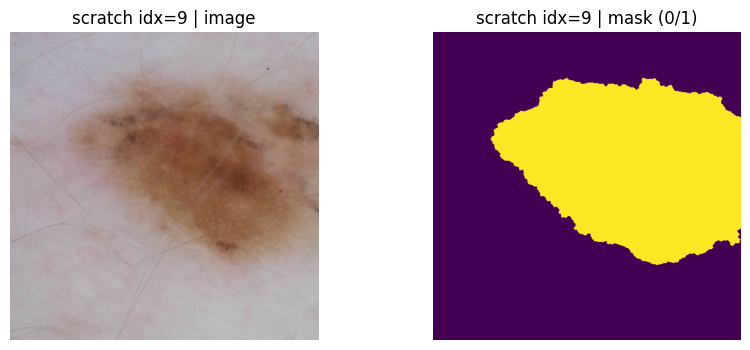

idx=  10 | img=(3, 512, 512) dtype=torch.float32 | mask=(1, 512, 512) uniq=[0.0, 1.0] | img[min,max]=(-3.204,1.388)


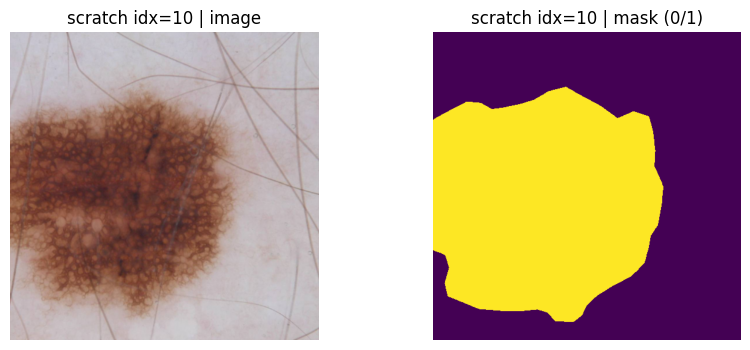

idx=  11 | img=(3, 512, 512) dtype=torch.float32 | mask=(1, 512, 512) uniq=[0.0, 1.0] | img[min,max]=(-2.512,1.023)


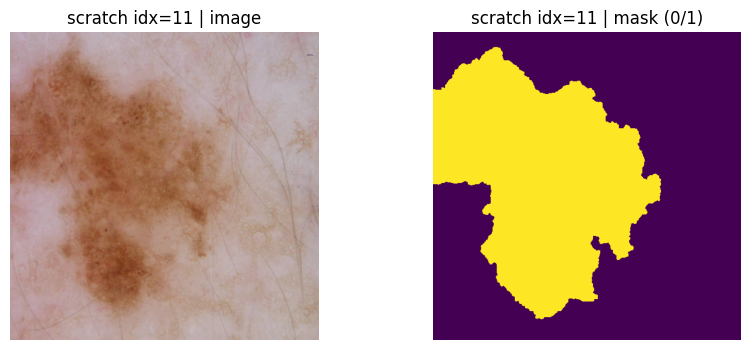

idx= 489 | img=(3, 512, 512) dtype=torch.float32 | mask=(1, 512, 512) uniq=[0.0, 1.0] | img[min,max]=(-4.363,1.957)


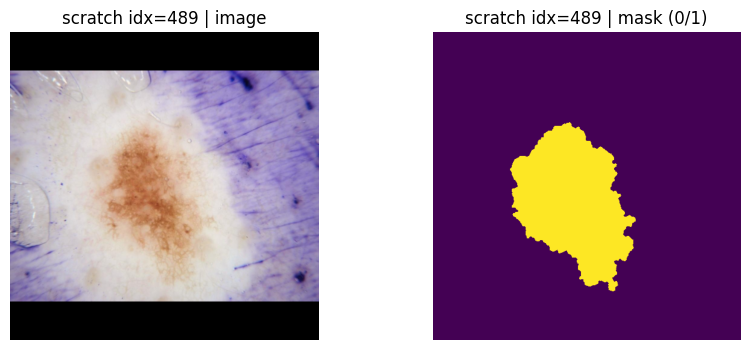

idx= 116 | img=(3, 512, 512) dtype=torch.float32 | mask=(1, 512, 512) uniq=[0.0, 1.0] | img[min,max]=(-4.363,1.998)


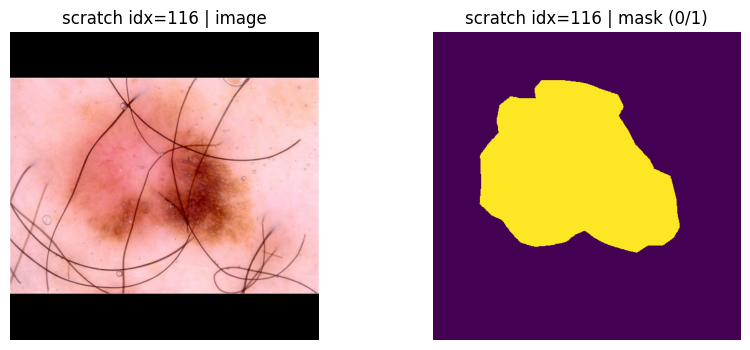

idx=  66 | img=(3, 512, 512) dtype=torch.float32 | mask=(1, 512, 512) uniq=[0.0, 1.0] | img[min,max]=(-3.353,1.673)


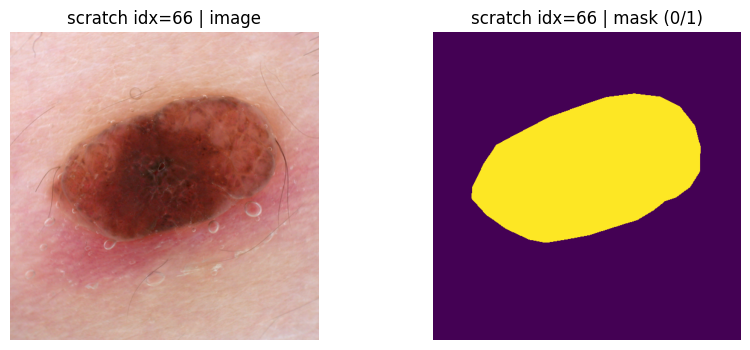

[imagenet] idx=   9 | img=(3, 512, 512) mask=(1, 512, 512) uniq=[0.0, 1.0]


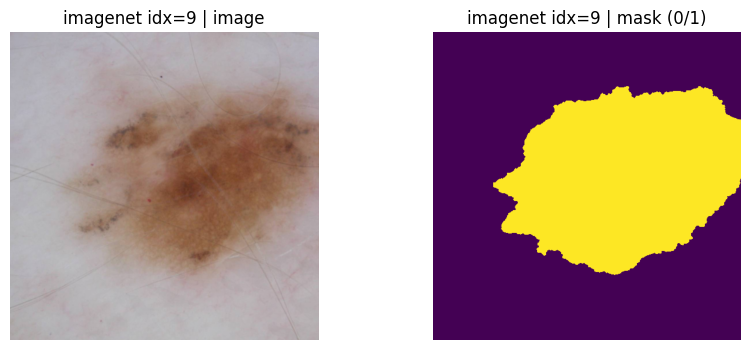

[imagenet] idx=  10 | img=(3, 512, 512) mask=(1, 512, 512) uniq=[0.0, 1.0]


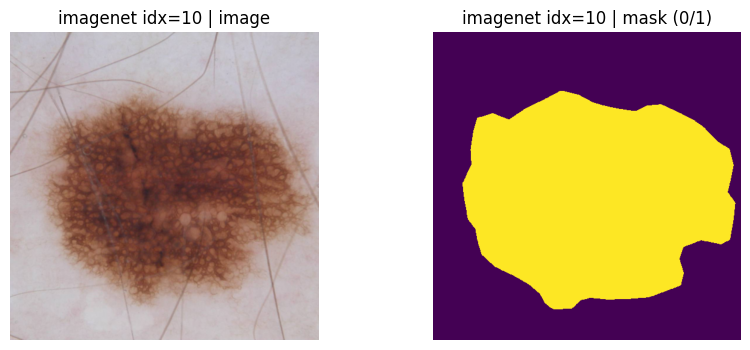

In [ ]:
# ER KØRT
# *************** TEST AF TRANSFORMS V1**********************************

import random
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image

def find_indices_by_size(image_paths, min_side=1024, want=5, max_scan=5000):
    idxs = []
    for i, p in enumerate(image_paths[:max_scan]):
        try:
            w, h = Image.open(p).size
            if min(w, h) >= min_side:
                idxs.append(i)
                if len(idxs) >= want:
                    break
        except Exception as e:
            continue
    return idxs

def show_sample(img_t, mask_t, mean, std, title=""):
    # img_t: [C,H,W] float32 normalized
    img = img_t.detach().cpu().float().numpy()
    img = np.moveaxis(img, 0, -1)
    img = img * np.array(std) + np.array(mean)
    img = np.clip(img, 0, 1)

    m = mask_t.detach().cpu().float()
    if m.ndim == 3:  # [1,H,W]
        m = m[0]
    m = m.numpy()

    plt.figure(figsize=(10,4))
    plt.subplot(1,2,1)
    plt.imshow(img)
    plt.title(title + " | image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(m, vmin=0, vmax=1)
    plt.title(title + " | mask (0/1)")
    plt.axis("off")
    plt.show()

# --- VIGTIGT: tving size-dependent test til at trigger på store billeder ---
USE_SIZE_DEPENDENT_TEST = True
LARGE_MIN_SIDE_TEST = 1024
LARGE_PROB_TEST = 1.0

# Find nogle store + små indices
large_idxs = find_indices_by_size(train_images, min_side=LARGE_MIN_SIDE_TEST, want=3)
small_idxs = [i for i in random.sample(range(len(train_images)), 50)
              if i not in large_idxs][:3]

print("Found large idxs:", large_idxs)
print("Some small idxs :", small_idxs)

# --- Test: SCRATCH aug-dataset (bruger dine transforms) ---
ds_scratch_test = Dataset(
    train_images, train_masks,
    transforms=transform,                         # fallback (som før)
    transforms_large=transform_scratch_large,      # large pipeline
    use_size_dependent=USE_SIZE_DEPENDENT_TEST,
    large_min_side=LARGE_MIN_SIDE_TEST,
    large_prob=LARGE_PROB_TEST,
    size=512,
    force_large_output_size=True
)

# Kør et par samples igennem og print checks
for idx in large_idxs + small_idxs:
    img_t, mask_t = ds_scratch_test[idx]
    uniq = torch.unique(mask_t.cpu())
    print(f"idx={idx:4d} | img={tuple(img_t.shape)} dtype={img_t.dtype} "
          f"| mask={tuple(mask_t.shape)} uniq={uniq.tolist()} "
          f"| img[min,max]=({img_t.min().item():.3f},{img_t.max().item():.3f})")

    # Vis dem (scratch mean/std)
    show_sample(img_t, mask_t, mean=mean, std=std, title=f"scratch idx={idx}")

# --- (valgfrit) samme test for imagenet transforms ---
ds_imagenet_test = Dataset(
    train_images, train_masks,
    transforms=transform_imagenet,
    transforms_large=transform_imagenet_large,
    use_size_dependent=USE_SIZE_DEPENDENT_TEST,
    large_min_side=LARGE_MIN_SIDE_TEST,
    large_prob=LARGE_PROB_TEST,
    size=512,
    force_large_output_size=True
)

for idx in large_idxs[:2]:
    img_t, mask_t = ds_imagenet_test[idx]
    uniq = torch.unique(mask_t.cpu())
    print(f"[imagenet] idx={idx:4d} | img={tuple(img_t.shape)} mask={tuple(mask_t.shape)} uniq={uniq.tolist()}")
    show_sample(img_t, mask_t, mean=imagenet_mean, std=imagenet_std, title=f"imagenet idx={idx}")


Found 227 large images with min(w,h) >= 1024

---------------------------------------
IDX 27 | original size: 1504x1129 | baseline mask area: 128708 px
---------------------------------------
 trial 1: aug mask area=208314 px | ratio vs baseline=1.62
 trial 2: aug mask area=220820 px | ratio vs baseline=1.72
 trial 3: aug mask area=179533 px | ratio vs baseline=1.39


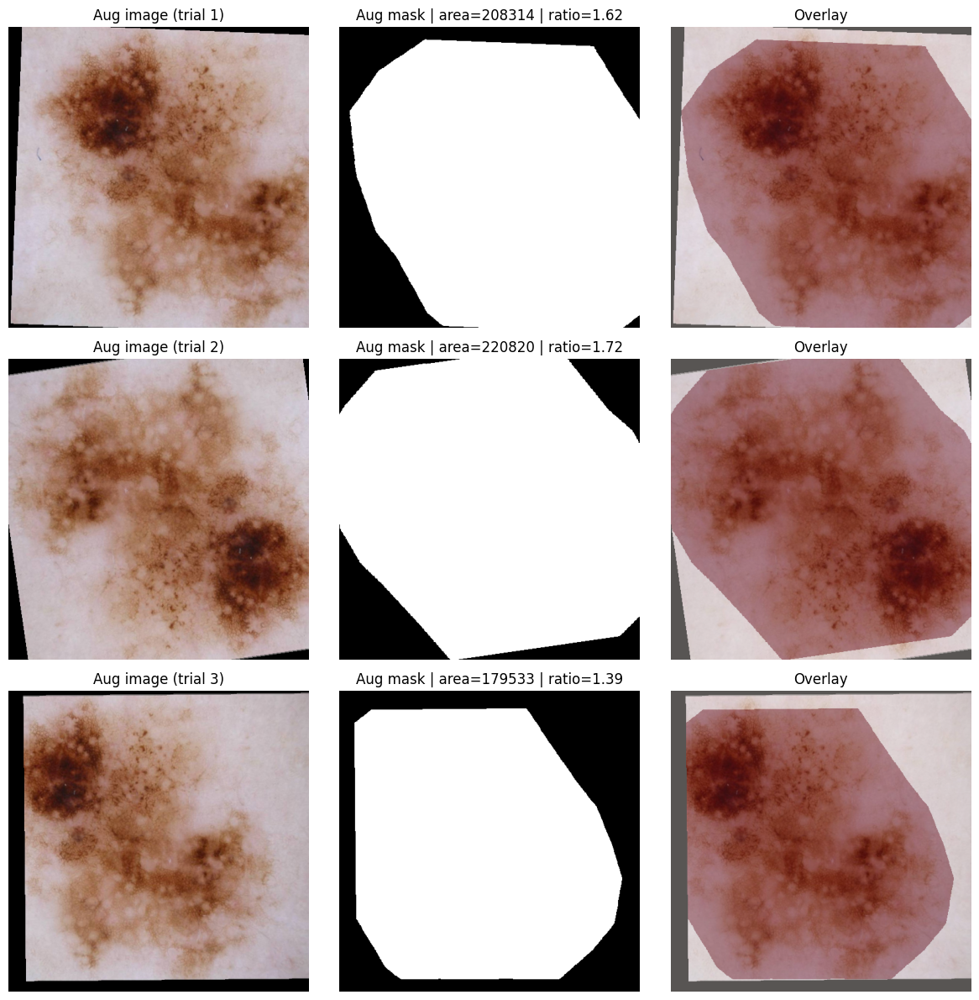


---------------------------------------
IDX 312 | original size: 3024x2016 | baseline mask area: 8828 px
---------------------------------------
 trial 1: aug mask area=17485 px | ratio vs baseline=1.98
 trial 2: aug mask area=18227 px | ratio vs baseline=2.06
 trial 3: aug mask area=19392 px | ratio vs baseline=2.20


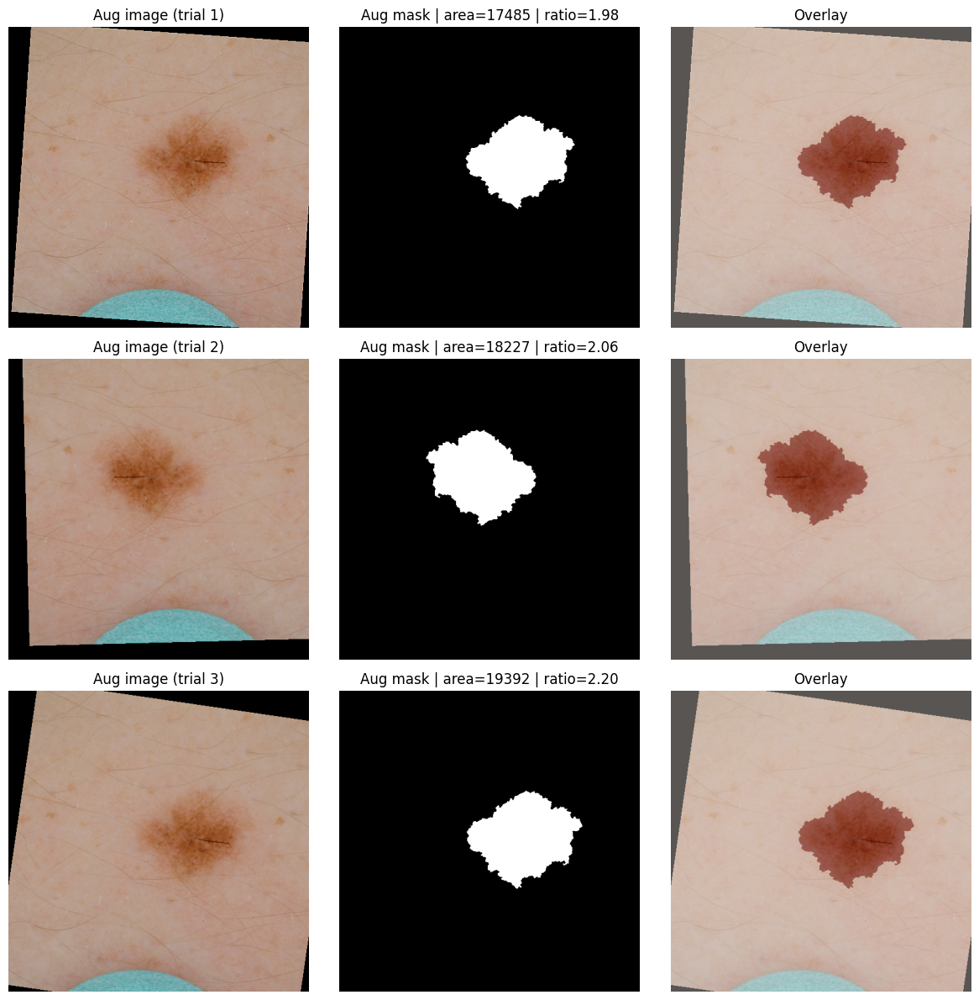


---------------------------------------
IDX 326 | original size: 4288x2848 | baseline mask area: 6896 px
---------------------------------------
 trial 1: aug mask area=15530 px | ratio vs baseline=2.25
 trial 2: aug mask area=15947 px | ratio vs baseline=2.31
 trial 3: aug mask area=13782 px | ratio vs baseline=2.00


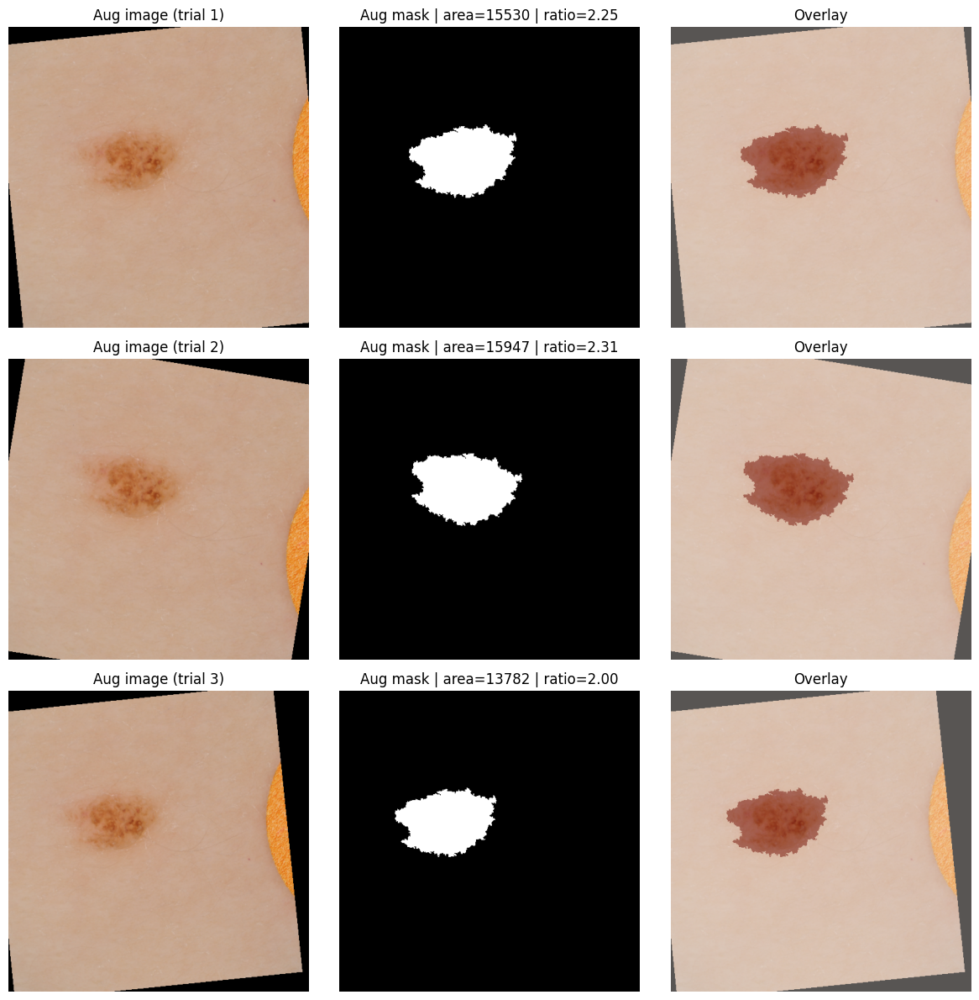


---------------------------------------
IDX 340 | original size: 4288x2848 | baseline mask area: 5367 px
---------------------------------------
 trial 1: aug mask area=12369 px | ratio vs baseline=2.30
 trial 2: aug mask area=11542 px | ratio vs baseline=2.15
 trial 3: aug mask area=12663 px | ratio vs baseline=2.36


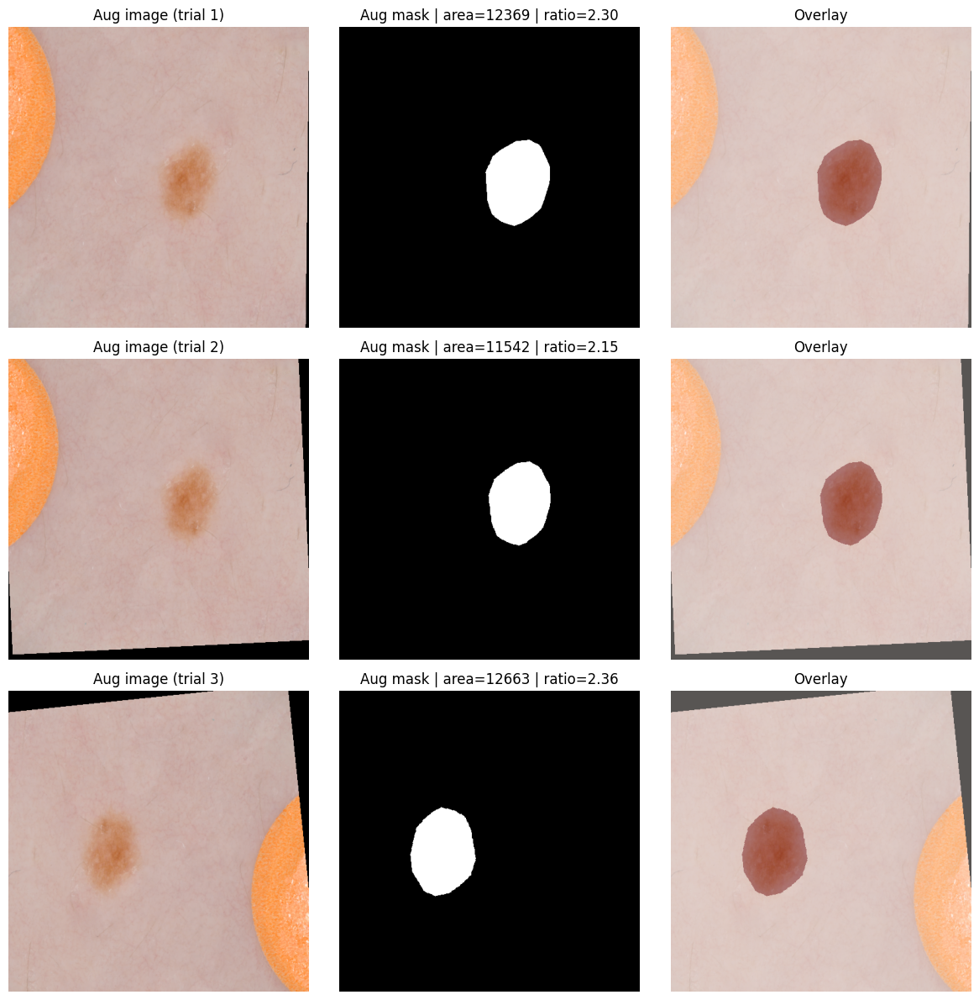

3

In [ ]:
# ER KØRT
# *************** TEST AF TRANSFORMS V2 **********************************

import random
import numpy as np
import matplotlib.pyplot as plt
import torch
from PIL import Image
from torchvision import tv_tensors

# ----------------------------
# Settings for the test
# ----------------------------
N_IMAGES = 4            # how many distinct large images to test
N_TRIALS = 3            # how many augmentations per image
SIZE = 512

def unnormalize_img(t, mean, std):
    """t: torch tensor [C,H,W] float"""
    m = torch.tensor(mean, dtype=t.dtype, device=t.device)[:, None, None]
    s = torch.tensor(std, dtype=t.dtype, device=t.device)[:, None, None]
    x = t * s + m
    return torch.clamp(x, 0, 1)

def to_mask_numpy(mask_t):
    """
    mask_t can be [H,W] or [1,H,W]
    returns binary numpy [H,W] in {0,1}
    """
    if isinstance(mask_t, torch.Tensor):
        mt = mask_t
    else:
        mt = torch.as_tensor(mask_t)

    if mt.ndim == 3:
        mt = mt.squeeze(0)
    mt = (mt > 0).to(torch.uint8)
    return mt.cpu().numpy()

def baseline_mask_512(mask_pil):
    """Resize-pad baseline mask to 512x512 (no augmentation)."""
    m512 = resize_pad(mask_pil, size=SIZE, is_mask=True)
    mnp = (np.array(m512) > 0).astype(np.uint8)
    return mnp

# ----------------------------
# 1) Find large images
# ----------------------------
large_idxs = []
for i, p in enumerate(train_images):
    im = Image.open(p)
    w, h = im.size
    if min(w, h) >= LARGE_MIN_SIDE_V2:
        large_idxs.append(i)

print(f"Found {len(large_idxs)} large images with min(w,h) >= {LARGE_MIN_SIDE_V2}")

if len(large_idxs) == 0:
    raise ValueError("No large images found with the current LARGE_MIN_SIDE_V2. Lower LARGE_MIN_SIDE_V2 and try again.")

# choose a few
chosen = random.sample(large_idxs, k=min(N_IMAGES, len(large_idxs)))

# ----------------------------
# 2) Run transform_scratch_large_v2 and visualize
# ----------------------------
for idx in chosen:
    img_pil = Image.open(train_images[idx]).convert("RGB")
    msk_pil = Image.open(train_masks[idx]).convert("L")

    base_m = baseline_mask_512(msk_pil)
    base_area = base_m.sum() + 1e-8  # avoid div0

    w, h = img_pil.size
    print("\n---------------------------------------")
    print(f"IDX {idx} | original size: {w}x{h} | baseline mask area: {int(base_area)} px")
    print("---------------------------------------")

    fig, axes = plt.subplots(nrows=N_TRIALS, ncols=3, figsize=(12, 4 * N_TRIALS))

    for t_i in range(N_TRIALS):
        # apply v2 transform on original size
        img_t, msk_t = transform_scratch_large_v2(img_pil, tv_tensors.Mask(msk_pil))

        # sanity checks
        assert img_t.shape[-2:] == (SIZE, SIZE), f"Image not {SIZE}x{SIZE}, got {img_t.shape}"
        # mask can be [H,W] or [1,H,W] depending on pipeline; we'll handle both

        img_vis = unnormalize_img(img_t.detach().cpu(), mean, std).permute(1,2,0).numpy()
        m_vis = to_mask_numpy(msk_t)

        # compute mask area ratio vs baseline (rough “did we crop too hard?” indicator)
        area = m_vis.sum()
        ratio = area / base_area

        # plot image
        ax0 = axes[t_i, 0] if N_TRIALS > 1 else axes[0]
        ax1 = axes[t_i, 1] if N_TRIALS > 1 else axes[1]
        ax2 = axes[t_i, 2] if N_TRIALS > 1 else axes[2]

        ax0.imshow(img_vis)
        ax0.set_title(f"Aug image (trial {t_i+1})")
        ax0.axis("off")

        ax1.imshow(m_vis, cmap="gray")
        ax1.set_title(f"Aug mask | area={int(area)} | ratio={ratio:.2f}")
        ax1.axis("off")

        ax2.imshow(img_vis)
        ax2.imshow(m_vis, cmap="Reds", alpha=0.35)
        ax2.set_title("Overlay")
        ax2.axis("off")

        print(f" trial {t_i+1}: aug mask area={int(area)} px | ratio vs baseline={ratio:.2f}")

    plt.tight_layout()
    plt.show()
3

In [ ]:
# ER KØRT
planned_runs_wd_edges_adamw = [
    # --- PRETRAINED: bedste kandidat (lr=7e-4 + cosine) + WD tests (AdamW) ---
    {
        "name": "pre_r18_lr7e-4_cosine_wd1e-5_adamw",
        "preset": "pretrained",
        "lr": 7e-4,
        "weight_decay": 1e-5,
        "scheduler_type": "cosine",
        "epochs": 10,
        "optimizer": "adamw",
    },
    {
        "name": "pre_r18_lr7e-4_cosine_wd1e-4_adamw",
        "preset": "pretrained",
        "lr": 7e-4,
        "weight_decay": 1e-4,
        "scheduler_type": "cosine",
        "epochs": 10,
        "optimizer": "adamw",
    },

    # --- SCRATCH: bedste kandidat (lr=1e-4 + cosine, ep30) + WD tests (AdamW) ---
    {
        "name": "scratch_lr1e-4_cosine_ep30_wd1e-5_adamw",
        "preset": "scratch",
        "lr": 1e-4,
        "weight_decay": 1e-5,
        "scheduler_type": "cosine",
        "epochs": 30,
        "optimizer": "adamw",
    },
    {
        "name": "scratch_lr1e-4_cosine_ep30_wd1e-4_adamw",
        "preset": "scratch",
        "lr": 1e-4,
        "weight_decay": 1e-4,
        "scheduler_type": "cosine",
        "epochs": 30,
        "optimizer": "adamw",
    },
]


In [ ]:

# ER KØRT

results_csv = os.path.join(SAVE_ROOT, "results.csv")
df_results = run_experiments(planned_runs_wd_edges_adamw, results_csv_path=results_csv)
df_results.sort_values("best_val_dice", ascending=False)


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/46.8M [00:00<?, ?B/s]


RUN: pre_r18_lr7e-4_cosine_wd1e-5_adamw
opt: adamw |preset: pretrained | lr: 0.0007 | wd: 1e-05 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_wd1e-5_adamw

EPOCH: 1/10
Train phase:


100%|██████████| 180/180 [00:53<00:00,  3.37it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.25it/s]


Train loss: 0.212021, Val loss: 0.617324
Train dice: 0.798, Val dice: 0.483
Train IoU : 0.696, Val IoU: 0.349
LR        : 7.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_wd1e-5_adamw/best.pth (val dice=0.483)
EPOCH: 2/10
Train phase:


100%|██████████| 180/180 [00:52<00:00,  3.43it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.66it/s]


Train loss: 0.158853, Val loss: 0.146562
Train dice: 0.839, Val dice: 0.861
Train IoU : 0.749, Val IoU: 0.775
LR        : 6.83e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_wd1e-5_adamw/best.pth (val dice=0.861)
EPOCH: 3/10
Train phase:


100%|██████████| 180/180 [00:51<00:00,  3.47it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.59it/s]

Train loss: 0.130706, Val loss: 0.134106
Train dice: 0.865, Val dice: 0.858
Train IoU : 0.781, Val IoU: 0.773
LR        : 6.33e-04
EPOCH: 4/10
Train phase:



100%|██████████| 180/180 [00:53<00:00,  3.34it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.65it/s]


Train loss: 0.140208, Val loss: 0.125921
Train dice: 0.852, Val dice: 0.866
Train IoU : 0.765, Val IoU: 0.787
LR        : 5.56e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_wd1e-5_adamw/best.pth (val dice=0.866)
EPOCH: 5/10
Train phase:


100%|██████████| 180/180 [00:52<00:00,  3.44it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.08it/s]

Train loss: 0.110710, Val loss: 0.135056
Train dice: 0.885, Val dice: 0.857
Train IoU : 0.808, Val IoU: 0.768
LR        : 4.58e-04
EPOCH: 6/10
Train phase:



100%|██████████| 180/180 [00:52<00:00,  3.46it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.19it/s]


Train loss: 0.099084, Val loss: 0.108332
Train dice: 0.895, Val dice: 0.880
Train IoU : 0.821, Val IoU: 0.804
LR        : 3.50e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_wd1e-5_adamw/best.pth (val dice=0.880)
EPOCH: 7/10
Train phase:


100%|██████████| 180/180 [00:52<00:00,  3.40it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.65it/s]


Train loss: 0.084455, Val loss: 0.093934
Train dice: 0.905, Val dice: 0.896
Train IoU : 0.835, Val IoU: 0.825
LR        : 2.42e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_wd1e-5_adamw/best.pth (val dice=0.896)
EPOCH: 8/10
Train phase:


100%|██████████| 180/180 [00:52<00:00,  3.44it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.52it/s]

Train loss: 0.072778, Val loss: 0.091874
Train dice: 0.915, Val dice: 0.892
Train IoU : 0.850, Val IoU: 0.820
LR        : 1.44e-04
EPOCH: 9/10
Train phase:



100%|██████████| 180/180 [00:50<00:00,  3.55it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.46it/s]

Train loss: 0.065039, Val loss: 0.090530
Train dice: 0.923, Val dice: 0.896
Train IoU : 0.862, Val IoU: 0.826
LR        : 6.68e-05
EPOCH: 10/10
Train phase:



100%|██████████| 180/180 [00:51<00:00,  3.48it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.70it/s]


Train loss: 0.060649, Val loss: 0.089454
Train dice: 0.926, Val dice: 0.898
Train IoU : 0.868, Val IoU: 0.829
LR        : 1.71e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_wd1e-5_adamw/best.pth (val dice=0.898)

RUN: pre_r18_lr7e-4_cosine_wd1e-4_adamw
opt: adamw |preset: pretrained | lr: 0.0007 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_wd1e-4_adamw

EPOCH: 1/10
Train phase:


100%|██████████| 180/180 [00:52<00:00,  3.46it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.98it/s]


Train loss: 0.212130, Val loss: 0.308534
Train dice: 0.798, Val dice: 0.737
Train IoU : 0.697, Val IoU: 0.625
LR        : 7.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_wd1e-4_adamw/best.pth (val dice=0.737)
EPOCH: 2/10
Train phase:


100%|██████████| 180/180 [00:51<00:00,  3.53it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.52it/s]


Train loss: 0.161439, Val loss: 0.199468
Train dice: 0.836, Val dice: 0.835
Train IoU : 0.745, Val IoU: 0.748
LR        : 6.83e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_wd1e-4_adamw/best.pth (val dice=0.835)
EPOCH: 3/10
Train phase:


100%|██████████| 180/180 [00:53<00:00,  3.39it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.64it/s]


Train loss: 0.130787, Val loss: 0.125177
Train dice: 0.867, Val dice: 0.871
Train IoU : 0.784, Val IoU: 0.790
LR        : 6.33e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_wd1e-4_adamw/best.pth (val dice=0.871)
EPOCH: 4/10
Train phase:


100%|██████████| 180/180 [00:51<00:00,  3.47it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.30it/s]


Train loss: 0.138371, Val loss: 0.115864
Train dice: 0.857, Val dice: 0.874
Train IoU : 0.773, Val IoU: 0.795
LR        : 5.56e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_wd1e-4_adamw/best.pth (val dice=0.874)
EPOCH: 5/10
Train phase:


100%|██████████| 180/180 [00:52<00:00,  3.44it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.07it/s]


Train loss: 0.110513, Val loss: 0.109484
Train dice: 0.883, Val dice: 0.880
Train IoU : 0.805, Val IoU: 0.801
LR        : 4.58e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_wd1e-4_adamw/best.pth (val dice=0.880)
EPOCH: 6/10
Train phase:


100%|██████████| 180/180 [00:51<00:00,  3.48it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.67it/s]


Train loss: 0.100898, Val loss: 0.111287
Train dice: 0.893, Val dice: 0.881
Train IoU : 0.819, Val IoU: 0.804
LR        : 3.50e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_wd1e-4_adamw/best.pth (val dice=0.881)
EPOCH: 7/10
Train phase:


100%|██████████| 180/180 [00:51<00:00,  3.47it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.58it/s]


Train loss: 0.086956, Val loss: 0.098052
Train dice: 0.903, Val dice: 0.890
Train IoU : 0.833, Val IoU: 0.816
LR        : 2.42e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_wd1e-4_adamw/best.pth (val dice=0.890)
EPOCH: 8/10
Train phase:


100%|██████████| 180/180 [00:51<00:00,  3.50it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.09it/s]


Train loss: 0.073729, Val loss: 0.090466
Train dice: 0.915, Val dice: 0.892
Train IoU : 0.851, Val IoU: 0.820
LR        : 1.44e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_wd1e-4_adamw/best.pth (val dice=0.892)
EPOCH: 9/10
Train phase:


100%|██████████| 180/180 [00:52<00:00,  3.44it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.72it/s]


Train loss: 0.066022, Val loss: 0.089147
Train dice: 0.921, Val dice: 0.897
Train IoU : 0.860, Val IoU: 0.827
LR        : 6.68e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_wd1e-4_adamw/best.pth (val dice=0.897)
EPOCH: 10/10
Train phase:


100%|██████████| 180/180 [00:52<00:00,  3.44it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.61it/s]


Train loss: 0.061503, Val loss: 0.088295
Train dice: 0.927, Val dice: 0.899
Train IoU : 0.869, Val IoU: 0.829
LR        : 1.71e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_wd1e-4_adamw/best.pth (val dice=0.899)

RUN: scratch_lr1e-4_cosine_ep30_wd1e-5_adamw
opt: adamw |preset: scratch | lr: 0.0001 | wd: 1e-05 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-5_adamw

EPOCH: 1/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.41it/s]


Train loss: 0.372101, Val loss: 0.289059
Train dice: 0.406, Val dice: 0.646
Train IoU : 0.323, Val IoU: 0.526
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-5_adamw/best.pth (val dice=0.646)
EPOCH: 2/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.38it/s]


Train loss: 0.290480, Val loss: 0.238022
Train dice: 0.664, Val dice: 0.748
Train IoU : 0.552, Val IoU: 0.645
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-5_adamw/best.pth (val dice=0.748)
EPOCH: 3/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.67it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.34it/s]

Train loss: 0.262166, Val loss: 0.238308
Train dice: 0.704, Val dice: 0.714
Train IoU : 0.595, Val IoU: 0.606
LR        : 9.89e-05
EPOCH: 4/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.35it/s]


Train loss: 0.247451, Val loss: 0.237981
Train dice: 0.725, Val dice: 0.770
Train IoU : 0.617, Val IoU: 0.665
LR        : 9.76e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-5_adamw/best.pth (val dice=0.770)
EPOCH: 5/30
Train phase:


100%|██████████| 180/180 [01:47<00:00,  1.67it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.59it/s]


Train loss: 0.234788, Val loss: 0.207006
Train dice: 0.743, Val dice: 0.773
Train IoU : 0.636, Val IoU: 0.671
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-5_adamw/best.pth (val dice=0.773)
EPOCH: 6/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.68it/s]

Train loss: 0.224339, Val loss: 0.231744
Train dice: 0.751, Val dice: 0.771
Train IoU : 0.645, Val IoU: 0.663
LR        : 9.33e-05
EPOCH: 7/30
Train phase:



100%|██████████| 180/180 [01:47<00:00,  1.67it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.59it/s]


Train loss: 0.215662, Val loss: 0.186527
Train dice: 0.763, Val dice: 0.791
Train IoU : 0.657, Val IoU: 0.688
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-5_adamw/best.pth (val dice=0.791)
EPOCH: 8/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.46it/s]

Train loss: 0.209147, Val loss: 0.196438
Train dice: 0.771, Val dice: 0.778
Train IoU : 0.664, Val IoU: 0.677
LR        : 8.72e-05
EPOCH: 9/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.48it/s]


Train loss: 0.201042, Val loss: 0.180718
Train dice: 0.786, Val dice: 0.797
Train IoU : 0.683, Val IoU: 0.691
LR        : 8.35e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-5_adamw/best.pth (val dice=0.797)
EPOCH: 10/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.38it/s]


Train loss: 0.200728, Val loss: 0.179402
Train dice: 0.792, Val dice: 0.810
Train IoU : 0.691, Val IoU: 0.714
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-5_adamw/best.pth (val dice=0.810)
EPOCH: 11/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.38it/s]

Train loss: 0.193536, Val loss: 0.172781
Train dice: 0.796, Val dice: 0.809
Train IoU : 0.695, Val IoU: 0.708
LR        : 7.50e-05
EPOCH: 12/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.32it/s]


Train loss: 0.182576, Val loss: 0.172838
Train dice: 0.807, Val dice: 0.811
Train IoU : 0.706, Val IoU: 0.711
LR        : 7.03e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-5_adamw/best.pth (val dice=0.811)
EPOCH: 13/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.40it/s]


Train loss: 0.175359, Val loss: 0.158531
Train dice: 0.815, Val dice: 0.822
Train IoU : 0.717, Val IoU: 0.727
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-5_adamw/best.pth (val dice=0.822)
EPOCH: 14/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.69it/s]


Train loss: 0.176300, Val loss: 0.157561
Train dice: 0.809, Val dice: 0.824
Train IoU : 0.709, Val IoU: 0.726
LR        : 6.04e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-5_adamw/best.pth (val dice=0.824)
EPOCH: 15/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.72it/s]

Train loss: 0.162935, Val loss: 0.154238
Train dice: 0.828, Val dice: 0.823
Train IoU : 0.732, Val IoU: 0.723
LR        : 5.52e-05
EPOCH: 16/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.66it/s]


Train loss: 0.157667, Val loss: 0.145838
Train dice: 0.831, Val dice: 0.837
Train IoU : 0.736, Val IoU: 0.743
LR        : 5.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-5_adamw/best.pth (val dice=0.837)
EPOCH: 17/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.59it/s]


Train loss: 0.158308, Val loss: 0.147541
Train dice: 0.831, Val dice: 0.846
Train IoU : 0.737, Val IoU: 0.755
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-5_adamw/best.pth (val dice=0.846)
EPOCH: 18/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.52it/s]

Train loss: 0.149653, Val loss: 0.144835
Train dice: 0.842, Val dice: 0.844
Train IoU : 0.750, Val IoU: 0.755
LR        : 3.96e-05
EPOCH: 19/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.38it/s]

Train loss: 0.144192, Val loss: 0.140913
Train dice: 0.846, Val dice: 0.842
Train IoU : 0.755, Val IoU: 0.751
LR        : 3.45e-05
EPOCH: 20/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.35it/s]

Train loss: 0.134819, Val loss: 0.139659
Train dice: 0.851, Val dice: 0.839
Train IoU : 0.762, Val IoU: 0.749
LR        : 2.97e-05
EPOCH: 21/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.34it/s]

Train loss: 0.132549, Val loss: 0.146018
Train dice: 0.855, Val dice: 0.820
Train IoU : 0.767, Val IoU: 0.719
LR        : 2.50e-05
EPOCH: 22/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.44it/s]


Train loss: 0.131532, Val loss: 0.133253
Train dice: 0.856, Val dice: 0.847
Train IoU : 0.769, Val IoU: 0.759
LR        : 2.06e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-5_adamw/best.pth (val dice=0.847)
EPOCH: 23/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.58it/s]

Train loss: 0.126083, Val loss: 0.133678
Train dice: 0.863, Val dice: 0.845
Train IoU : 0.778, Val IoU: 0.758
LR        : 1.65e-05
EPOCH: 24/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.62it/s]


Train loss: 0.121541, Val loss: 0.125876
Train dice: 0.863, Val dice: 0.859
Train IoU : 0.779, Val IoU: 0.774
LR        : 1.28e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-5_adamw/best.pth (val dice=0.859)
EPOCH: 25/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.72it/s]

Train loss: 0.118970, Val loss: 0.125417
Train dice: 0.869, Val dice: 0.859
Train IoU : 0.786, Val IoU: 0.775
LR        : 9.55e-06
EPOCH: 26/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.50it/s]

Train loss: 0.118146, Val loss: 0.125721
Train dice: 0.870, Val dice: 0.856
Train IoU : 0.788, Val IoU: 0.772
LR        : 6.70e-06
EPOCH: 27/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.46it/s]

Train loss: 0.115791, Val loss: 0.126261
Train dice: 0.871, Val dice: 0.854
Train IoU : 0.789, Val IoU: 0.769
LR        : 4.32e-06
EPOCH: 28/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.33it/s]

Train loss: 0.114427, Val loss: 0.125209
Train dice: 0.873, Val dice: 0.857
Train IoU : 0.791, Val IoU: 0.772
LR        : 2.45e-06
EPOCH: 29/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.34it/s]

Train loss: 0.113489, Val loss: 0.125518
Train dice: 0.873, Val dice: 0.856
Train IoU : 0.792, Val IoU: 0.772
LR        : 1.09e-06
EPOCH: 30/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.36it/s]

Train loss: 0.112952, Val loss: 0.125275
Train dice: 0.874, Val dice: 0.857
Train IoU : 0.792, Val IoU: 0.772
LR        : 2.74e-07

RUN: scratch_lr1e-4_cosine_ep30_wd1e-4_adamw
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw

EPOCH: 1/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.61it/s]


Train loss: 0.372086, Val loss: 0.289344
Train dice: 0.406, Val dice: 0.648
Train IoU : 0.323, Val IoU: 0.528
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw/best.pth (val dice=0.648)
EPOCH: 2/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.67it/s]


Train loss: 0.293580, Val loss: 0.238020
Train dice: 0.652, Val dice: 0.751
Train IoU : 0.539, Val IoU: 0.647
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw/best.pth (val dice=0.751)
EPOCH: 3/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.63it/s]

Train loss: 0.260098, Val loss: 0.231423
Train dice: 0.721, Val dice: 0.729
Train IoU : 0.611, Val IoU: 0.625
LR        : 9.89e-05
EPOCH: 4/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.55it/s]


Train loss: 0.240619, Val loss: 0.227957
Train dice: 0.744, Val dice: 0.766
Train IoU : 0.637, Val IoU: 0.660
LR        : 9.76e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw/best.pth (val dice=0.766)
EPOCH: 5/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.47it/s]


Train loss: 0.226481, Val loss: 0.190573
Train dice: 0.757, Val dice: 0.793
Train IoU : 0.650, Val IoU: 0.692
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw/best.pth (val dice=0.793)
EPOCH: 6/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.53it/s]

Train loss: 0.214817, Val loss: 0.224117
Train dice: 0.769, Val dice: 0.742
Train IoU : 0.663, Val IoU: 0.635
LR        : 9.33e-05
EPOCH: 7/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.39it/s]


Train loss: 0.205991, Val loss: 0.181144
Train dice: 0.780, Val dice: 0.805
Train IoU : 0.676, Val IoU: 0.704
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw/best.pth (val dice=0.805)
EPOCH: 8/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.34it/s]

Train loss: 0.206269, Val loss: 0.207692
Train dice: 0.787, Val dice: 0.779
Train IoU : 0.684, Val IoU: 0.676
LR        : 8.72e-05
EPOCH: 9/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.67it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.50it/s]

Train loss: 0.199187, Val loss: 0.184927
Train dice: 0.790, Val dice: 0.796
Train IoU : 0.686, Val IoU: 0.690
LR        : 8.35e-05
EPOCH: 10/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.73it/s]


Train loss: 0.193858, Val loss: 0.167729
Train dice: 0.801, Val dice: 0.822
Train IoU : 0.701, Val IoU: 0.726
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw/best.pth (val dice=0.822)
EPOCH: 11/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.65it/s]


Train loss: 0.180525, Val loss: 0.158022
Train dice: 0.809, Val dice: 0.827
Train IoU : 0.709, Val IoU: 0.730
LR        : 7.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw/best.pth (val dice=0.827)
EPOCH: 12/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.48it/s]

Train loss: 0.169309, Val loss: 0.155483
Train dice: 0.818, Val dice: 0.822
Train IoU : 0.719, Val IoU: 0.723
LR        : 7.03e-05
EPOCH: 13/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.28it/s]


Train loss: 0.162503, Val loss: 0.142576
Train dice: 0.825, Val dice: 0.844
Train IoU : 0.730, Val IoU: 0.752
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw/best.pth (val dice=0.844)
EPOCH: 14/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.29it/s]

Train loss: 0.156882, Val loss: 0.147689
Train dice: 0.833, Val dice: 0.839
Train IoU : 0.739, Val IoU: 0.747
LR        : 6.04e-05
EPOCH: 15/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.41it/s]

Train loss: 0.148175, Val loss: 0.139321
Train dice: 0.845, Val dice: 0.841
Train IoU : 0.753, Val IoU: 0.749
LR        : 5.52e-05
EPOCH: 16/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.63it/s]


Train loss: 0.140999, Val loss: 0.135764
Train dice: 0.848, Val dice: 0.848
Train IoU : 0.760, Val IoU: 0.761
LR        : 5.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw/best.pth (val dice=0.848)
EPOCH: 17/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.67it/s]


Train loss: 0.140786, Val loss: 0.130714
Train dice: 0.849, Val dice: 0.864
Train IoU : 0.761, Val IoU: 0.779
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw/best.pth (val dice=0.864)
EPOCH: 18/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.56it/s]

Train loss: 0.133407, Val loss: 0.135936
Train dice: 0.855, Val dice: 0.854
Train IoU : 0.768, Val IoU: 0.768
LR        : 3.96e-05
EPOCH: 19/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.41it/s]

Train loss: 0.130745, Val loss: 0.131551
Train dice: 0.858, Val dice: 0.854
Train IoU : 0.772, Val IoU: 0.767
LR        : 3.45e-05
EPOCH: 20/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.30it/s]

Train loss: 0.123819, Val loss: 0.130707
Train dice: 0.861, Val dice: 0.851
Train IoU : 0.776, Val IoU: 0.764
LR        : 2.97e-05
EPOCH: 21/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.32it/s]

Train loss: 0.121983, Val loss: 0.139290
Train dice: 0.864, Val dice: 0.831
Train IoU : 0.779, Val IoU: 0.736
LR        : 2.50e-05
EPOCH: 22/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.48it/s]

Train loss: 0.121291, Val loss: 0.126675
Train dice: 0.865, Val dice: 0.858
Train IoU : 0.781, Val IoU: 0.773
LR        : 2.06e-05
EPOCH: 23/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.60it/s]

Train loss: 0.116930, Val loss: 0.128775
Train dice: 0.870, Val dice: 0.851
Train IoU : 0.789, Val IoU: 0.765
LR        : 1.65e-05
EPOCH: 24/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.60it/s]


Train loss: 0.113455, Val loss: 0.122816
Train dice: 0.872, Val dice: 0.864
Train IoU : 0.790, Val IoU: 0.781
LR        : 1.28e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw/best.pth (val dice=0.864)
EPOCH: 25/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.57it/s]


Train loss: 0.111872, Val loss: 0.123644
Train dice: 0.875, Val dice: 0.864
Train IoU : 0.795, Val IoU: 0.782
LR        : 9.55e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw/best.pth (val dice=0.864)
EPOCH: 26/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.47it/s]

Train loss: 0.110297, Val loss: 0.123382
Train dice: 0.878, Val dice: 0.860
Train IoU : 0.798, Val IoU: 0.777
LR        : 6.70e-06
EPOCH: 27/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.38it/s]

Train loss: 0.108894, Val loss: 0.123731
Train dice: 0.878, Val dice: 0.861
Train IoU : 0.799, Val IoU: 0.777
LR        : 4.32e-06
EPOCH: 28/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.32it/s]

Train loss: 0.107583, Val loss: 0.123166
Train dice: 0.880, Val dice: 0.863
Train IoU : 0.801, Val IoU: 0.780
LR        : 2.45e-06
EPOCH: 29/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.29it/s]

Train loss: 0.106734, Val loss: 0.123587
Train dice: 0.880, Val dice: 0.862
Train IoU : 0.801, Val IoU: 0.779
LR        : 1.09e-06
EPOCH: 30/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.42it/s]

Train loss: 0.106285, Val loss: 0.123511
Train dice: 0.880, Val dice: 0.863
Train IoU : 0.802, Val IoU: 0.780
LR        : 2.74e-07


,name,preset,lr,weight_decay,scheduler_type,epochs,best_epoch,best_val_dice,best_val_iou,final_val_dice,final_val_iou,seconds,run_dir,best_val_loss,optimizer
11,pre_r18_lr7e-4_cosine,pretrained,0.00070,0.00000,cosine,10,10,0.900011,0.830914,0.900011,0.830914,655.204928,/content/drive/MyDrive/Colab Notebooks/isic201...,0.086850,NaN
13,pre_r18_lr7e-4_cosine_wd1e-4_adamw,pretrained,0.00070,0.00010,cosine,10,10,0.899067,0.829445,0.899067,0.829445,612.917243,/content/drive/MyDrive/Colab Notebooks/isic201...,0.088295,adamw
12,pre_r18_lr7e-4_cosine_wd1e-5_adamw,pretrained,0.00070,0.00001,cosine,10,10,0.898023,0.828857,0.898023,0.828857,616.091412,/content/drive/MyDrive/Colab Notebooks/isic201...,0.089454,adamw
9,pre_r18_lr3e-5_wd1e-5_none,pretrained,0.00003,0.00001,none,10,7,0.897737,0.825728,0.893445,0.820947,654.817123,/content/drive/MyDrive/Colab Notebooks/isic201...,0.109549,NaN
5,pre_r18_lr3e-5,pretrained,0.00003,0.00000,none,10,7,0.897670,0.825670,0.893064,0.820123,666.894825,/content/drive/MyDrive/Colab Notebooks/isic201...,NaN,NaN
8,pre_r18_lr3e-5_wd1e-4_none,pretrained,0.00003,0.00010,none,10,7,0.897206,0.825125,0.893326,0.820932,652.933266,/content/drive/MyDrive/Colab Notebooks/isic201...,0.109497,NaN
10,pre_r18_lr3e-5_cosine,pretrained,0.00003,0.00000,cosine,10,10,0.895941,0.822621,0.895941,0.822621,643.967534,/content/drive/MyDrive/Colab Notebooks/isic201...,0.113240,NaN
4,pre_r18_lr1e-5,pretrained,0.00001,0.00000,none,10,10,0.889841,0.814008,0.889841,0.814008,674.079387,/content/drive/MyDrive/Colab Notebooks/isic201...,NaN,NaN
6,pre_r18_plateau,pretrained,0.00001,0.00000,plateau,10,10,0.889702,0.813787,0.889702,0.813787,668.319773,/content/drive/MyDrive/Colab Notebooks/isic201...,NaN,NaN
15,scratch_lr1e-4_cosine_ep30_wd1e-4_adamw,scratch,0.00010,0.00010,cosine,30,25,0.864419,0.781827,0.862689,0.779653,3656.087516,/content/drive/MyDrive/Colab Notebooks/isic201...,0.123644,adamw


In [ ]:
# ER KØRT
best_models = [
    {
        "name": "pre_r18_lr7e-4_cosine",
        "preset": "pretrained",
        "lr": 7e-4,
        "weight_decay": 0.0,
        "scheduler_type": "cosine",
        "epochs": 10,
        "optimizer": "adam",
    },
    {
        "name": "scratch_lr1e-4_cosine_ep30_wd1e-4_adamw",
        "preset": "scratch",
        "lr": 1e-4,
        "weight_decay": 1e-4,
        "scheduler_type": "cosine",
        "epochs": 30,
        "optimizer": "adamw",
    },
]

seed_list = [0, 1, 2, 3, 4]

planned_runs_seed_sweep = []
for base in best_models:
    for s in seed_list:
        cfg = dict(base)
        cfg["seed"] = s
        cfg["exp_type"] = "seed_sweep"
        cfg["name"] = f'{base["name"]}_s{s}'
        planned_runs_seed_sweep.append(cfg)


In [ ]:
# ER KØRT
results_seed = os.path.join(SAVE_ROOT, "results_seed_sweep.csv")
df_seed = run_experiments(planned_runs_seed_sweep, results_csv_path=results_seed)
df_seed.sort_values("best_val_dice", ascending=False)



RUN: pre_r18_lr7e-4_cosine_s0
opt: adam |preset: pretrained | lr: 0.0007 | wd: 0.0 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s0

EPOCH: 1/10
Train phase:


100%|██████████| 180/180 [00:53<00:00,  3.38it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.80it/s]


Train loss: 0.198171, Val loss: 0.207930
Train dice: 0.805, Val dice: 0.797
Train IoU : 0.706, Val IoU: 0.689
LR        : 7.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s0/best.pth (val dice=0.797)
EPOCH: 2/10
Train phase:


100%|██████████| 180/180 [00:51<00:00,  3.50it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.00it/s]


Train loss: 0.165980, Val loss: 0.127112
Train dice: 0.834, Val dice: 0.862
Train IoU : 0.742, Val IoU: 0.780
LR        : 6.83e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s0/best.pth (val dice=0.862)
EPOCH: 3/10
Train phase:


100%|██████████| 180/180 [00:52<00:00,  3.40it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.14it/s]

Train loss: 0.144524, Val loss: 0.249044
Train dice: 0.848, Val dice: 0.732
Train IoU : 0.759, Val IoU: 0.624
LR        : 6.33e-04
EPOCH: 4/10
Train phase:



100%|██████████| 180/180 [00:51<00:00,  3.50it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.70it/s]


Train loss: 0.123105, Val loss: 0.106849
Train dice: 0.870, Val dice: 0.888
Train IoU : 0.788, Val IoU: 0.813
LR        : 5.56e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s0/best.pth (val dice=0.888)
EPOCH: 5/10
Train phase:


100%|██████████| 180/180 [00:52<00:00,  3.44it/s]



val phase:



100%|██████████| 45/45 [00:07<00:00,  5.65it/s]

Train loss: 0.114693, Val loss: 0.144575
Train dice: 0.884, Val dice: 0.857
Train IoU : 0.807, Val IoU: 0.766
LR        : 4.58e-04
EPOCH: 6/10
Train phase:



100%|██████████| 180/180 [00:51<00:00,  3.47it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.97it/s]

Train loss: 0.099279, Val loss: 0.113948
Train dice: 0.894, Val dice: 0.879
Train IoU : 0.822, Val IoU: 0.802
LR        : 3.50e-04
EPOCH: 7/10
Train phase:



100%|██████████| 180/180 [00:50<00:00,  3.57it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.71it/s]


Train loss: 0.085405, Val loss: 0.095356
Train dice: 0.910, Val dice: 0.889
Train IoU : 0.842, Val IoU: 0.816
LR        : 2.42e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s0/best.pth (val dice=0.889)
EPOCH: 8/10
Train phase:


100%|██████████| 180/180 [00:52<00:00,  3.41it/s]



val phase:



100%|██████████| 45/45 [00:07<00:00,  5.69it/s]


Train loss: 0.074541, Val loss: 0.087952
Train dice: 0.915, Val dice: 0.899
Train IoU : 0.851, Val IoU: 0.831
LR        : 1.44e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s0/best.pth (val dice=0.899)
EPOCH: 9/10
Train phase:


100%|██████████| 180/180 [00:52<00:00,  3.44it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.92it/s]

Train loss: 0.068217, Val loss: 0.087917
Train dice: 0.921, Val dice: 0.897
Train IoU : 0.859, Val IoU: 0.828
LR        : 6.68e-05
EPOCH: 10/10
Train phase:



100%|██████████| 180/180 [00:51<00:00,  3.51it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.60it/s]


Train loss: 0.060924, Val loss: 0.087975
Train dice: 0.926, Val dice: 0.900
Train IoU : 0.868, Val IoU: 0.832
LR        : 1.71e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s0/best.pth (val dice=0.900)

RUN: pre_r18_lr7e-4_cosine_s1
opt: adam |preset: pretrained | lr: 0.0007 | wd: 0.0 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s1

EPOCH: 1/10
Train phase:


100%|██████████| 180/180 [00:53<00:00,  3.39it/s]



val phase:



100%|██████████| 45/45 [00:07<00:00,  5.64it/s]


Train loss: 0.214258, Val loss: 0.162272
Train dice: 0.794, Val dice: 0.833
Train IoU : 0.693, Val IoU: 0.737
LR        : 7.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s1/best.pth (val dice=0.833)
EPOCH: 2/10
Train phase:


100%|██████████| 180/180 [00:51<00:00,  3.47it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.81it/s]


Train loss: 0.167813, Val loss: 0.175786
Train dice: 0.839, Val dice: 0.844
Train IoU : 0.749, Val IoU: 0.751
LR        : 6.83e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s1/best.pth (val dice=0.844)
EPOCH: 3/10
Train phase:


100%|██████████| 180/180 [00:51<00:00,  3.50it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.25it/s]

Train loss: 0.137651, Val loss: 0.175856
Train dice: 0.858, Val dice: 0.840
Train IoU : 0.770, Val IoU: 0.756
LR        : 6.33e-04
EPOCH: 4/10
Train phase:



100%|██████████| 180/180 [00:51<00:00,  3.52it/s]



val phase:



100%|██████████| 45/45 [00:07<00:00,  5.69it/s]


Train loss: 0.123767, Val loss: 0.119598
Train dice: 0.872, Val dice: 0.879
Train IoU : 0.792, Val IoU: 0.802
LR        : 5.56e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s1/best.pth (val dice=0.879)
EPOCH: 5/10
Train phase:


100%|██████████| 180/180 [00:52<00:00,  3.40it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.73it/s]


Train loss: 0.106455, Val loss: 0.106139
Train dice: 0.892, Val dice: 0.884
Train IoU : 0.816, Val IoU: 0.807
LR        : 4.58e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s1/best.pth (val dice=0.884)
EPOCH: 6/10
Train phase:


100%|██████████| 180/180 [00:51<00:00,  3.49it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.24it/s]


Train loss: 0.090903, Val loss: 0.095730
Train dice: 0.898, Val dice: 0.890
Train IoU : 0.827, Val IoU: 0.819
LR        : 3.50e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s1/best.pth (val dice=0.890)
EPOCH: 7/10
Train phase:


100%|██████████| 180/180 [00:52<00:00,  3.42it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.25it/s]


Train loss: 0.080385, Val loss: 0.095214
Train dice: 0.908, Val dice: 0.892
Train IoU : 0.841, Val IoU: 0.820
LR        : 2.42e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s1/best.pth (val dice=0.892)
EPOCH: 8/10
Train phase:


100%|██████████| 180/180 [00:51<00:00,  3.47it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.77it/s]


Train loss: 0.071073, Val loss: 0.097901
Train dice: 0.915, Val dice: 0.897
Train IoU : 0.852, Val IoU: 0.829
LR        : 1.44e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s1/best.pth (val dice=0.897)
EPOCH: 9/10
Train phase:


100%|██████████| 180/180 [00:52<00:00,  3.45it/s]



val phase:



100%|██████████| 45/45 [00:07<00:00,  5.79it/s]


Train loss: 0.064845, Val loss: 0.088127
Train dice: 0.925, Val dice: 0.900
Train IoU : 0.865, Val IoU: 0.829
LR        : 6.68e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s1/best.pth (val dice=0.900)
EPOCH: 10/10
Train phase:


100%|██████████| 180/180 [00:51<00:00,  3.49it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.24it/s]


Train loss: 0.060477, Val loss: 0.089278
Train dice: 0.928, Val dice: 0.902
Train IoU : 0.870, Val IoU: 0.833
LR        : 1.71e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s1/best.pth (val dice=0.902)

RUN: pre_r18_lr7e-4_cosine_s2
opt: adam |preset: pretrained | lr: 0.0007 | wd: 0.0 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s2

EPOCH: 1/10
Train phase:


100%|██████████| 180/180 [00:52<00:00,  3.43it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.74it/s]


Train loss: 0.208781, Val loss: 0.135517
Train dice: 0.798, Val dice: 0.862
Train IoU : 0.700, Val IoU: 0.776
LR        : 7.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s2/best.pth (val dice=0.862)
EPOCH: 2/10
Train phase:


100%|██████████| 180/180 [00:51<00:00,  3.47it/s]



val phase:



100%|██████████| 45/45 [00:07<00:00,  5.65it/s]


Train loss: 0.159021, Val loss: 0.123096
Train dice: 0.841, Val dice: 0.866
Train IoU : 0.750, Val IoU: 0.785
LR        : 6.83e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s2/best.pth (val dice=0.866)
EPOCH: 3/10
Train phase:


100%|██████████| 180/180 [00:51<00:00,  3.50it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.78it/s]


Train loss: 0.139655, Val loss: 0.121857
Train dice: 0.859, Val dice: 0.871
Train IoU : 0.774, Val IoU: 0.788
LR        : 6.33e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s2/best.pth (val dice=0.871)
EPOCH: 4/10
Train phase:


100%|██████████| 180/180 [00:51<00:00,  3.48it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.95it/s]


Train loss: 0.120056, Val loss: 0.104515
Train dice: 0.874, Val dice: 0.882
Train IoU : 0.794, Val IoU: 0.806
LR        : 5.56e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s2/best.pth (val dice=0.882)
EPOCH: 5/10
Train phase:


100%|██████████| 180/180 [00:52<00:00,  3.40it/s]



val phase:



100%|██████████| 45/45 [00:10<00:00,  4.18it/s]

Train loss: 0.110146, Val loss: 0.163064
Train dice: 0.886, Val dice: 0.819
Train IoU : 0.810, Val IoU: 0.723
LR        : 4.58e-04
EPOCH: 6/10
Train phase:



100%|██████████| 180/180 [00:49<00:00,  3.63it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.71it/s]

Train loss: 0.097860, Val loss: 0.172954
Train dice: 0.896, Val dice: 0.834
Train IoU : 0.822, Val IoU: 0.743
LR        : 3.50e-04
EPOCH: 7/10
Train phase:



100%|██████████| 180/180 [00:50<00:00,  3.55it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.09it/s]


Train loss: 0.086946, Val loss: 0.093668
Train dice: 0.904, Val dice: 0.893
Train IoU : 0.836, Val IoU: 0.823
LR        : 2.42e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s2/best.pth (val dice=0.893)
EPOCH: 8/10
Train phase:


100%|██████████| 180/180 [00:51<00:00,  3.47it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.58it/s]

Train loss: 0.072895, Val loss: 0.094726
Train dice: 0.919, Val dice: 0.886
Train IoU : 0.856, Val IoU: 0.810
LR        : 1.44e-04
EPOCH: 9/10
Train phase:



100%|██████████| 180/180 [00:51<00:00,  3.47it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.69it/s]


Train loss: 0.065494, Val loss: 0.086740
Train dice: 0.923, Val dice: 0.900
Train IoU : 0.862, Val IoU: 0.831
LR        : 6.68e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s2/best.pth (val dice=0.900)
EPOCH: 10/10
Train phase:


100%|██████████| 180/180 [00:50<00:00,  3.54it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  5.00it/s]


Train loss: 0.062086, Val loss: 0.085442
Train dice: 0.924, Val dice: 0.901
Train IoU : 0.865, Val IoU: 0.832
LR        : 1.71e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s2/best.pth (val dice=0.901)

RUN: pre_r18_lr7e-4_cosine_s3
opt: adam |preset: pretrained | lr: 0.0007 | wd: 0.0 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s3

EPOCH: 1/10
Train phase:


100%|██████████| 180/180 [00:52<00:00,  3.41it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.30it/s]


Train loss: 0.238019, Val loss: 0.263550
Train dice: 0.785, Val dice: 0.716
Train IoU : 0.681, Val IoU: 0.595
LR        : 7.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s3/best.pth (val dice=0.716)
EPOCH: 2/10
Train phase:


100%|██████████| 180/180 [00:51<00:00,  3.48it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.69it/s]


Train loss: 0.159794, Val loss: 0.142891
Train dice: 0.838, Val dice: 0.856
Train IoU : 0.746, Val IoU: 0.765
LR        : 6.83e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s3/best.pth (val dice=0.856)
EPOCH: 3/10
Train phase:


100%|██████████| 180/180 [00:51<00:00,  3.47it/s]



val phase:



100%|██████████| 45/45 [00:07<00:00,  5.69it/s]


Train loss: 0.138706, Val loss: 0.128948
Train dice: 0.850, Val dice: 0.878
Train IoU : 0.763, Val IoU: 0.800
LR        : 6.33e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s3/best.pth (val dice=0.878)
EPOCH: 4/10
Train phase:


100%|██████████| 180/180 [00:51<00:00,  3.48it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.14it/s]

Train loss: 0.121950, Val loss: 0.129880
Train dice: 0.872, Val dice: 0.877
Train IoU : 0.791, Val IoU: 0.796
LR        : 5.56e-04
EPOCH: 5/10
Train phase:



100%|██████████| 180/180 [00:50<00:00,  3.53it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.65it/s]


Train loss: 0.103003, Val loss: 0.106633
Train dice: 0.892, Val dice: 0.880
Train IoU : 0.817, Val IoU: 0.804
LR        : 4.58e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s3/best.pth (val dice=0.880)
EPOCH: 6/10
Train phase:


100%|██████████| 180/180 [00:51<00:00,  3.50it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.08it/s]


Train loss: 0.100692, Val loss: 0.098064
Train dice: 0.894, Val dice: 0.888
Train IoU : 0.819, Val IoU: 0.814
LR        : 3.50e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s3/best.pth (val dice=0.888)
EPOCH: 7/10
Train phase:


100%|██████████| 180/180 [00:52<00:00,  3.41it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.08it/s]

Train loss: 0.085909, Val loss: 0.123487
Train dice: 0.908, Val dice: 0.852
Train IoU : 0.840, Val IoU: 0.764
LR        : 2.42e-04
EPOCH: 8/10
Train phase:



100%|██████████| 180/180 [00:50<00:00,  3.57it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.66it/s]


Train loss: 0.074643, Val loss: 0.097059
Train dice: 0.914, Val dice: 0.892
Train IoU : 0.849, Val IoU: 0.821
LR        : 1.44e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s3/best.pth (val dice=0.892)
EPOCH: 9/10
Train phase:


100%|██████████| 180/180 [00:52<00:00,  3.41it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.51it/s]


Train loss: 0.069239, Val loss: 0.089643
Train dice: 0.919, Val dice: 0.898
Train IoU : 0.857, Val IoU: 0.828
LR        : 6.68e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s3/best.pth (val dice=0.898)
EPOCH: 10/10
Train phase:


100%|██████████| 180/180 [00:52<00:00,  3.44it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.84it/s]


Train loss: 0.063881, Val loss: 0.087848
Train dice: 0.924, Val dice: 0.899
Train IoU : 0.864, Val IoU: 0.829
LR        : 1.71e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s3/best.pth (val dice=0.899)

RUN: pre_r18_lr7e-4_cosine_s4
opt: adam |preset: pretrained | lr: 0.0007 | wd: 0.0 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s4

EPOCH: 1/10
Train phase:


100%|██████████| 180/180 [00:51<00:00,  3.47it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.90it/s]


Train loss: 0.248886, Val loss: 0.341513
Train dice: 0.786, Val dice: 0.656
Train IoU : 0.684, Val IoU: 0.545
LR        : 7.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s4/best.pth (val dice=0.656)
EPOCH: 2/10
Train phase:


100%|██████████| 180/180 [00:51<00:00,  3.50it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.50it/s]


Train loss: 0.158324, Val loss: 0.123865
Train dice: 0.844, Val dice: 0.873
Train IoU : 0.753, Val IoU: 0.792
LR        : 6.83e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s4/best.pth (val dice=0.873)
EPOCH: 3/10
Train phase:


100%|██████████| 180/180 [00:51<00:00,  3.51it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.66it/s]

Train loss: 0.141076, Val loss: 0.223242
Train dice: 0.859, Val dice: 0.733
Train IoU : 0.774, Val IoU: 0.629
LR        : 6.33e-04
EPOCH: 4/10
Train phase:



100%|██████████| 180/180 [00:50<00:00,  3.58it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.62it/s]


Train loss: 0.120708, Val loss: 0.112677
Train dice: 0.874, Val dice: 0.874
Train IoU : 0.792, Val IoU: 0.793
LR        : 5.56e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s4/best.pth (val dice=0.874)
EPOCH: 5/10
Train phase:


100%|██████████| 180/180 [00:52<00:00,  3.45it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.46it/s]


Train loss: 0.113020, Val loss: 0.104354
Train dice: 0.880, Val dice: 0.883
Train IoU : 0.803, Val IoU: 0.807
LR        : 4.58e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s4/best.pth (val dice=0.883)
EPOCH: 6/10
Train phase:


100%|██████████| 180/180 [00:52<00:00,  3.41it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.67it/s]

Train loss: 0.099124, Val loss: 0.150417
Train dice: 0.896, Val dice: 0.827
Train IoU : 0.824, Val IoU: 0.731
LR        : 3.50e-04
EPOCH: 7/10
Train phase:



100%|██████████| 180/180 [00:51<00:00,  3.48it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.04it/s]


Train loss: 0.088357, Val loss: 0.097076
Train dice: 0.903, Val dice: 0.892
Train IoU : 0.832, Val IoU: 0.821
LR        : 2.42e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s4/best.pth (val dice=0.892)
EPOCH: 8/10
Train phase:


100%|██████████| 180/180 [00:52<00:00,  3.42it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.06it/s]


Train loss: 0.078457, Val loss: 0.086747
Train dice: 0.912, Val dice: 0.901
Train IoU : 0.846, Val IoU: 0.832
LR        : 1.44e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_r18_lr7e-4_cosine_s4/best.pth (val dice=0.901)
EPOCH: 9/10
Train phase:


100%|██████████| 180/180 [00:52<00:00,  3.44it/s]



val phase:



100%|██████████| 45/45 [00:09<00:00,  4.70it/s]

Train loss: 0.069581, Val loss: 0.089524
Train dice: 0.920, Val dice: 0.901
Train IoU : 0.858, Val IoU: 0.832
LR        : 6.68e-05
EPOCH: 10/10
Train phase:



100%|██████████| 180/180 [00:50<00:00,  3.57it/s]



val phase:



100%|██████████| 45/45 [00:08<00:00,  5.20it/s]

Train loss: 0.063708, Val loss: 0.086576
Train dice: 0.925, Val dice: 0.901
Train IoU : 0.866, Val IoU: 0.831
LR        : 1.71e-05

RUN: scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s0
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s0

EPOCH: 1/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.29it/s]


Train loss: 0.374313, Val loss: 0.309981
Train dice: 0.399, Val dice: 0.629
Train IoU : 0.321, Val IoU: 0.507
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s0/best.pth (val dice=0.629)
EPOCH: 2/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.31it/s]


Train loss: 0.291310, Val loss: 0.248894
Train dice: 0.665, Val dice: 0.747
Train IoU : 0.553, Val IoU: 0.644
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s0/best.pth (val dice=0.747)
EPOCH: 3/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.31it/s]


Train loss: 0.261181, Val loss: 0.244902
Train dice: 0.707, Val dice: 0.769
Train IoU : 0.598, Val IoU: 0.670
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s0/best.pth (val dice=0.769)
EPOCH: 4/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.33it/s]

Train loss: 0.241038, Val loss: 0.233591
Train dice: 0.731, Val dice: 0.719
Train IoU : 0.623, Val IoU: 0.612
LR        : 9.76e-05
EPOCH: 5/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.60it/s]


Train loss: 0.230924, Val loss: 0.198068
Train dice: 0.746, Val dice: 0.781
Train IoU : 0.639, Val IoU: 0.681
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s0/best.pth (val dice=0.781)
EPOCH: 6/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.69it/s]


Train loss: 0.217095, Val loss: 0.194911
Train dice: 0.762, Val dice: 0.800
Train IoU : 0.656, Val IoU: 0.703
LR        : 9.33e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s0/best.pth (val dice=0.800)
EPOCH: 7/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.45it/s]

Train loss: 0.203761, Val loss: 0.195110
Train dice: 0.779, Val dice: 0.791
Train IoU : 0.674, Val IoU: 0.692
LR        : 9.05e-05
EPOCH: 8/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.40it/s]

Train loss: 0.201711, Val loss: 0.188878
Train dice: 0.783, Val dice: 0.790
Train IoU : 0.681, Val IoU: 0.685
LR        : 8.72e-05
EPOCH: 9/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.33it/s]

Train loss: 0.195748, Val loss: 0.194246
Train dice: 0.796, Val dice: 0.790
Train IoU : 0.694, Val IoU: 0.688
LR        : 8.35e-05
EPOCH: 10/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.30it/s]


Train loss: 0.190445, Val loss: 0.173896
Train dice: 0.801, Val dice: 0.810
Train IoU : 0.701, Val IoU: 0.714
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s0/best.pth (val dice=0.810)
EPOCH: 11/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.43it/s]


Train loss: 0.183482, Val loss: 0.170504
Train dice: 0.805, Val dice: 0.822
Train IoU : 0.706, Val IoU: 0.724
LR        : 7.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s0/best.pth (val dice=0.822)
EPOCH: 12/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.61it/s]


Train loss: 0.178760, Val loss: 0.157743
Train dice: 0.807, Val dice: 0.825
Train IoU : 0.707, Val IoU: 0.728
LR        : 7.03e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s0/best.pth (val dice=0.825)
EPOCH: 13/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.67it/s]

Train loss: 0.171216, Val loss: 0.160496
Train dice: 0.817, Val dice: 0.814
Train IoU : 0.718, Val IoU: 0.712
LR        : 6.55e-05
EPOCH: 14/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.62it/s]

Train loss: 0.163311, Val loss: 0.183138
Train dice: 0.825, Val dice: 0.750
Train IoU : 0.728, Val IoU: 0.637
LR        : 6.04e-05
EPOCH: 15/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.52it/s]


Train loss: 0.159452, Val loss: 0.141667
Train dice: 0.832, Val dice: 0.845
Train IoU : 0.738, Val IoU: 0.751
LR        : 5.52e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s0/best.pth (val dice=0.845)
EPOCH: 16/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.40it/s]


Train loss: 0.146974, Val loss: 0.141738
Train dice: 0.845, Val dice: 0.847
Train IoU : 0.753, Val IoU: 0.758
LR        : 5.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s0/best.pth (val dice=0.847)
EPOCH: 17/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.40it/s]

Train loss: 0.145303, Val loss: 0.141284
Train dice: 0.847, Val dice: 0.841
Train IoU : 0.757, Val IoU: 0.748
LR        : 4.48e-05
EPOCH: 18/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.38it/s]


Train loss: 0.138397, Val loss: 0.129513
Train dice: 0.852, Val dice: 0.852
Train IoU : 0.763, Val IoU: 0.763
LR        : 3.96e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s0/best.pth (val dice=0.852)
EPOCH: 19/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.32it/s]


Train loss: 0.136113, Val loss: 0.125770
Train dice: 0.856, Val dice: 0.861
Train IoU : 0.769, Val IoU: 0.777
LR        : 3.45e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s0/best.pth (val dice=0.861)
EPOCH: 20/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.30it/s]

Train loss: 0.129981, Val loss: 0.142355
Train dice: 0.859, Val dice: 0.832
Train IoU : 0.773, Val IoU: 0.736
LR        : 2.97e-05
EPOCH: 21/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.39it/s]

Train loss: 0.130393, Val loss: 0.133583
Train dice: 0.858, Val dice: 0.844
Train IoU : 0.772, Val IoU: 0.754
LR        : 2.50e-05
EPOCH: 22/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.51it/s]

Train loss: 0.125463, Val loss: 0.128306
Train dice: 0.865, Val dice: 0.851
Train IoU : 0.782, Val IoU: 0.763
LR        : 2.06e-05
EPOCH: 23/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.58it/s]

Train loss: 0.121507, Val loss: 0.122619
Train dice: 0.868, Val dice: 0.860
Train IoU : 0.785, Val IoU: 0.776
LR        : 1.65e-05
EPOCH: 24/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.60it/s]


Train loss: 0.118947, Val loss: 0.121428
Train dice: 0.869, Val dice: 0.862
Train IoU : 0.787, Val IoU: 0.778
LR        : 1.28e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s0/best.pth (val dice=0.862)
EPOCH: 25/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.63it/s]

Train loss: 0.115153, Val loss: 0.123683
Train dice: 0.873, Val dice: 0.855
Train IoU : 0.791, Val IoU: 0.770
LR        : 9.55e-06
EPOCH: 26/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.50it/s]

Train loss: 0.112734, Val loss: 0.126128
Train dice: 0.876, Val dice: 0.849
Train IoU : 0.795, Val IoU: 0.762
LR        : 6.70e-06
EPOCH: 27/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.39it/s]


Train loss: 0.112238, Val loss: 0.121343
Train dice: 0.876, Val dice: 0.862
Train IoU : 0.795, Val IoU: 0.778
LR        : 4.32e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s0/best.pth (val dice=0.862)
EPOCH: 28/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.37it/s]

Train loss: 0.111031, Val loss: 0.123045
Train dice: 0.878, Val dice: 0.856
Train IoU : 0.798, Val IoU: 0.771
LR        : 2.45e-06
EPOCH: 29/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.27it/s]

Train loss: 0.110204, Val loss: 0.121675
Train dice: 0.878, Val dice: 0.858
Train IoU : 0.798, Val IoU: 0.774
LR        : 1.09e-06
EPOCH: 30/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.42it/s]

Train loss: 0.109529, Val loss: 0.121648
Train dice: 0.879, Val dice: 0.858
Train IoU : 0.799, Val IoU: 0.774
LR        : 2.74e-07

RUN: scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s1
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s1

EPOCH: 1/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.61it/s]


Train loss: 0.385559, Val loss: 0.311976
Train dice: 0.375, Val dice: 0.650
Train IoU : 0.299, Val IoU: 0.535
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s1/best.pth (val dice=0.650)
EPOCH: 2/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.52it/s]


Train loss: 0.288471, Val loss: 0.235302
Train dice: 0.686, Val dice: 0.755
Train IoU : 0.577, Val IoU: 0.651
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s1/best.pth (val dice=0.755)
EPOCH: 3/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.43it/s]


Train loss: 0.260297, Val loss: 0.246506
Train dice: 0.711, Val dice: 0.756
Train IoU : 0.602, Val IoU: 0.652
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s1/best.pth (val dice=0.756)
EPOCH: 4/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.32it/s]


Train loss: 0.241973, Val loss: 0.236459
Train dice: 0.732, Val dice: 0.774
Train IoU : 0.625, Val IoU: 0.667
LR        : 9.76e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s1/best.pth (val dice=0.774)
EPOCH: 5/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.42it/s]


Train loss: 0.226844, Val loss: 0.198170
Train dice: 0.751, Val dice: 0.790
Train IoU : 0.645, Val IoU: 0.690
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s1/best.pth (val dice=0.790)
EPOCH: 6/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.62it/s]


Train loss: 0.226339, Val loss: 0.191342
Train dice: 0.754, Val dice: 0.793
Train IoU : 0.648, Val IoU: 0.695
LR        : 9.33e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s1/best.pth (val dice=0.793)
EPOCH: 7/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.62it/s]


Train loss: 0.219071, Val loss: 0.190009
Train dice: 0.760, Val dice: 0.794
Train IoU : 0.653, Val IoU: 0.697
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s1/best.pth (val dice=0.794)
EPOCH: 8/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.41it/s]

Train loss: 0.215846, Val loss: 0.197971
Train dice: 0.765, Val dice: 0.793
Train IoU : 0.661, Val IoU: 0.687
LR        : 8.72e-05
EPOCH: 9/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.31it/s]


Train loss: 0.205580, Val loss: 0.188275
Train dice: 0.778, Val dice: 0.797
Train IoU : 0.672, Val IoU: 0.696
LR        : 8.35e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s1/best.pth (val dice=0.797)
EPOCH: 10/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.30it/s]

Train loss: 0.197646, Val loss: 0.199113
Train dice: 0.784, Val dice: 0.780
Train IoU : 0.681, Val IoU: 0.674
LR        : 7.94e-05
EPOCH: 11/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.67it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.50it/s]


Train loss: 0.191090, Val loss: 0.175642
Train dice: 0.794, Val dice: 0.803
Train IoU : 0.693, Val IoU: 0.704
LR        : 7.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s1/best.pth (val dice=0.803)
EPOCH: 12/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.62it/s]


Train loss: 0.183299, Val loss: 0.165350
Train dice: 0.803, Val dice: 0.820
Train IoU : 0.702, Val IoU: 0.723
LR        : 7.03e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s1/best.pth (val dice=0.820)
EPOCH: 13/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.62it/s]

Train loss: 0.174776, Val loss: 0.161503
Train dice: 0.817, Val dice: 0.813
Train IoU : 0.720, Val IoU: 0.714
LR        : 6.55e-05
EPOCH: 14/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.41it/s]

Train loss: 0.170865, Val loss: 0.158837
Train dice: 0.816, Val dice: 0.817
Train IoU : 0.720, Val IoU: 0.724
LR        : 6.04e-05
EPOCH: 15/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.43it/s]


Train loss: 0.163345, Val loss: 0.155604
Train dice: 0.829, Val dice: 0.838
Train IoU : 0.734, Val IoU: 0.749
LR        : 5.52e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s1/best.pth (val dice=0.838)
EPOCH: 16/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.34it/s]

Train loss: 0.158826, Val loss: 0.152860
Train dice: 0.828, Val dice: 0.828
Train IoU : 0.732, Val IoU: 0.733
LR        : 5.00e-05
EPOCH: 17/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.42it/s]


Train loss: 0.152929, Val loss: 0.136404
Train dice: 0.838, Val dice: 0.848
Train IoU : 0.746, Val IoU: 0.760
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s1/best.pth (val dice=0.848)
EPOCH: 18/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.54it/s]


Train loss: 0.145413, Val loss: 0.138594
Train dice: 0.843, Val dice: 0.849
Train IoU : 0.753, Val IoU: 0.761
LR        : 3.96e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s1/best.pth (val dice=0.849)
EPOCH: 19/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.59it/s]


Train loss: 0.140611, Val loss: 0.136915
Train dice: 0.851, Val dice: 0.853
Train IoU : 0.762, Val IoU: 0.766
LR        : 3.45e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s1/best.pth (val dice=0.853)
EPOCH: 20/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.58it/s]


Train loss: 0.135135, Val loss: 0.128493
Train dice: 0.855, Val dice: 0.855
Train IoU : 0.767, Val IoU: 0.769
LR        : 2.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s1/best.pth (val dice=0.855)
EPOCH: 21/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.42it/s]

Train loss: 0.130934, Val loss: 0.131206
Train dice: 0.859, Val dice: 0.850
Train IoU : 0.774, Val IoU: 0.763
LR        : 2.50e-05
EPOCH: 22/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.38it/s]


Train loss: 0.127388, Val loss: 0.123264
Train dice: 0.861, Val dice: 0.863
Train IoU : 0.777, Val IoU: 0.780
LR        : 2.06e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s1/best.pth (val dice=0.863)
EPOCH: 23/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.38it/s]

Train loss: 0.124464, Val loss: 0.125171
Train dice: 0.866, Val dice: 0.858
Train IoU : 0.782, Val IoU: 0.774
LR        : 1.65e-05
EPOCH: 24/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.32it/s]

Train loss: 0.122346, Val loss: 0.123861
Train dice: 0.866, Val dice: 0.859
Train IoU : 0.783, Val IoU: 0.775
LR        : 1.28e-05
EPOCH: 25/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.32it/s]

Train loss: 0.120212, Val loss: 0.123649
Train dice: 0.869, Val dice: 0.858
Train IoU : 0.788, Val IoU: 0.773
LR        : 9.55e-06
EPOCH: 26/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.48it/s]

Train loss: 0.118453, Val loss: 0.127754
Train dice: 0.872, Val dice: 0.850
Train IoU : 0.791, Val IoU: 0.764
LR        : 6.70e-06
EPOCH: 27/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.66it/s]

Train loss: 0.116529, Val loss: 0.121682
Train dice: 0.872, Val dice: 0.862
Train IoU : 0.790, Val IoU: 0.779
LR        : 4.32e-06
EPOCH: 28/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.63it/s]

Train loss: 0.115415, Val loss: 0.123675
Train dice: 0.874, Val dice: 0.856
Train IoU : 0.793, Val IoU: 0.772
LR        : 2.45e-06
EPOCH: 29/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.57it/s]

Train loss: 0.114792, Val loss: 0.122658
Train dice: 0.874, Val dice: 0.858
Train IoU : 0.794, Val IoU: 0.774
LR        : 1.09e-06
EPOCH: 30/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.46it/s]

Train loss: 0.114223, Val loss: 0.122554
Train dice: 0.875, Val dice: 0.858
Train IoU : 0.794, Val IoU: 0.774
LR        : 2.74e-07

RUN: scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s2
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s2

EPOCH: 1/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.38it/s]


Train loss: 0.364471, Val loss: 0.279973
Train dice: 0.435, Val dice: 0.707
Train IoU : 0.351, Val IoU: 0.603
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s2/best.pth (val dice=0.707)
EPOCH: 2/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.32it/s]


Train loss: 0.283598, Val loss: 0.246654
Train dice: 0.665, Val dice: 0.719
Train IoU : 0.560, Val IoU: 0.617
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s2/best.pth (val dice=0.719)
EPOCH: 3/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.29it/s]


Train loss: 0.252020, Val loss: 0.237212
Train dice: 0.711, Val dice: 0.759
Train IoU : 0.603, Val IoU: 0.655
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s2/best.pth (val dice=0.759)
EPOCH: 4/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.41it/s]


Train loss: 0.242718, Val loss: 0.203376
Train dice: 0.728, Val dice: 0.767
Train IoU : 0.617, Val IoU: 0.669
LR        : 9.76e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s2/best.pth (val dice=0.767)
EPOCH: 5/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.62it/s]


Train loss: 0.224758, Val loss: 0.201962
Train dice: 0.753, Val dice: 0.771
Train IoU : 0.645, Val IoU: 0.670
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s2/best.pth (val dice=0.771)
EPOCH: 6/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.73it/s]


Train loss: 0.227679, Val loss: 0.195774
Train dice: 0.752, Val dice: 0.776
Train IoU : 0.645, Val IoU: 0.676
LR        : 9.33e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s2/best.pth (val dice=0.776)
EPOCH: 7/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.60it/s]


Train loss: 0.213381, Val loss: 0.190464
Train dice: 0.761, Val dice: 0.786
Train IoU : 0.653, Val IoU: 0.684
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s2/best.pth (val dice=0.786)
EPOCH: 8/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.46it/s]


Train loss: 0.202996, Val loss: 0.182214
Train dice: 0.777, Val dice: 0.801
Train IoU : 0.673, Val IoU: 0.699
LR        : 8.72e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s2/best.pth (val dice=0.801)
EPOCH: 9/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.37it/s]

Train loss: 0.205189, Val loss: 0.192829
Train dice: 0.774, Val dice: 0.788
Train IoU : 0.670, Val IoU: 0.683
LR        : 8.35e-05
EPOCH: 10/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.31it/s]


Train loss: 0.196325, Val loss: 0.178882
Train dice: 0.787, Val dice: 0.813
Train IoU : 0.685, Val IoU: 0.716
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s2/best.pth (val dice=0.813)
EPOCH: 11/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.52it/s]

Train loss: 0.191061, Val loss: 0.172931
Train dice: 0.793, Val dice: 0.812
Train IoU : 0.691, Val IoU: 0.712
LR        : 7.50e-05
EPOCH: 12/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.65it/s]

Train loss: 0.187702, Val loss: 0.172751
Train dice: 0.797, Val dice: 0.810
Train IoU : 0.695, Val IoU: 0.712
LR        : 7.03e-05
EPOCH: 13/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.54it/s]


Train loss: 0.187476, Val loss: 0.169756
Train dice: 0.798, Val dice: 0.816
Train IoU : 0.697, Val IoU: 0.718
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s2/best.pth (val dice=0.816)
EPOCH: 14/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.40it/s]


Train loss: 0.178889, Val loss: 0.163573
Train dice: 0.810, Val dice: 0.820
Train IoU : 0.710, Val IoU: 0.724
LR        : 6.04e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s2/best.pth (val dice=0.820)
EPOCH: 15/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.37it/s]


Train loss: 0.178368, Val loss: 0.163531
Train dice: 0.805, Val dice: 0.825
Train IoU : 0.706, Val IoU: 0.730
LR        : 5.52e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s2/best.pth (val dice=0.825)
EPOCH: 16/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.31it/s]

Train loss: 0.174661, Val loss: 0.161904
Train dice: 0.817, Val dice: 0.818
Train IoU : 0.719, Val IoU: 0.719
LR        : 5.00e-05
EPOCH: 17/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.57it/s]

Train loss: 0.168980, Val loss: 0.161210
Train dice: 0.817, Val dice: 0.814
Train IoU : 0.719, Val IoU: 0.715
LR        : 4.48e-05
EPOCH: 18/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.65it/s]


Train loss: 0.168604, Val loss: 0.159217
Train dice: 0.818, Val dice: 0.827
Train IoU : 0.720, Val IoU: 0.734
LR        : 3.96e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s2/best.pth (val dice=0.827)
EPOCH: 19/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.64it/s]


Train loss: 0.159135, Val loss: 0.152965
Train dice: 0.828, Val dice: 0.832
Train IoU : 0.734, Val IoU: 0.736
LR        : 3.45e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s2/best.pth (val dice=0.832)
EPOCH: 20/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.44it/s]


Train loss: 0.154994, Val loss: 0.143214
Train dice: 0.833, Val dice: 0.842
Train IoU : 0.740, Val IoU: 0.752
LR        : 2.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s2/best.pth (val dice=0.842)
EPOCH: 21/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.42it/s]

Train loss: 0.150409, Val loss: 0.141974
Train dice: 0.837, Val dice: 0.839
Train IoU : 0.745, Val IoU: 0.747
LR        : 2.50e-05
EPOCH: 22/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.31it/s]


Train loss: 0.144238, Val loss: 0.137815
Train dice: 0.842, Val dice: 0.849
Train IoU : 0.749, Val IoU: 0.759
LR        : 2.06e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s2/best.pth (val dice=0.849)
EPOCH: 23/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.47it/s]

Train loss: 0.139618, Val loss: 0.146990
Train dice: 0.848, Val dice: 0.832
Train IoU : 0.758, Val IoU: 0.740
LR        : 1.65e-05
EPOCH: 24/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.63it/s]

Train loss: 0.137165, Val loss: 0.134139
Train dice: 0.849, Val dice: 0.849
Train IoU : 0.760, Val IoU: 0.760
LR        : 1.28e-05
EPOCH: 25/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.62it/s]

Train loss: 0.133396, Val loss: 0.137636
Train dice: 0.854, Val dice: 0.844
Train IoU : 0.766, Val IoU: 0.754
LR        : 9.55e-06
EPOCH: 26/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.49it/s]


Train loss: 0.129374, Val loss: 0.132410
Train dice: 0.857, Val dice: 0.852
Train IoU : 0.769, Val IoU: 0.766
LR        : 6.70e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s2/best.pth (val dice=0.852)
EPOCH: 27/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.44it/s]

Train loss: 0.127801, Val loss: 0.132689
Train dice: 0.860, Val dice: 0.849
Train IoU : 0.774, Val IoU: 0.761
LR        : 4.32e-06
EPOCH: 28/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.31it/s]

Train loss: 0.126714, Val loss: 0.131513
Train dice: 0.859, Val dice: 0.851
Train IoU : 0.773, Val IoU: 0.764
LR        : 2.45e-06
EPOCH: 29/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.30it/s]

Train loss: 0.125120, Val loss: 0.130874
Train dice: 0.861, Val dice: 0.852
Train IoU : 0.776, Val IoU: 0.765
LR        : 1.09e-06
EPOCH: 30/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.49it/s]

Train loss: 0.124535, Val loss: 0.130721
Train dice: 0.862, Val dice: 0.852
Train IoU : 0.777, Val IoU: 0.765
LR        : 2.74e-07

RUN: scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s3
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s3

EPOCH: 1/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.61it/s]


Train loss: 0.404262, Val loss: 0.303410
Train dice: 0.267, Val dice: 0.633
Train IoU : 0.208, Val IoU: 0.511
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s3/best.pth (val dice=0.633)
EPOCH: 2/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.63it/s]


Train loss: 0.286230, Val loss: 0.253849
Train dice: 0.667, Val dice: 0.683
Train IoU : 0.556, Val IoU: 0.583
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s3/best.pth (val dice=0.683)
EPOCH: 3/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.45it/s]


Train loss: 0.262486, Val loss: 0.246139
Train dice: 0.705, Val dice: 0.749
Train IoU : 0.596, Val IoU: 0.644
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s3/best.pth (val dice=0.749)
EPOCH: 4/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.43it/s]


Train loss: 0.235976, Val loss: 0.206009
Train dice: 0.747, Val dice: 0.776
Train IoU : 0.640, Val IoU: 0.675
LR        : 9.76e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s3/best.pth (val dice=0.776)
EPOCH: 5/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.34it/s]


Train loss: 0.224517, Val loss: 0.223958
Train dice: 0.762, Val dice: 0.792
Train IoU : 0.656, Val IoU: 0.694
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s3/best.pth (val dice=0.792)
EPOCH: 6/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.67it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.32it/s]


Train loss: 0.223569, Val loss: 0.185017
Train dice: 0.763, Val dice: 0.802
Train IoU : 0.656, Val IoU: 0.703
LR        : 9.33e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s3/best.pth (val dice=0.802)
EPOCH: 7/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.30it/s]

Train loss: 0.208026, Val loss: 0.189086
Train dice: 0.779, Val dice: 0.795
Train IoU : 0.672, Val IoU: 0.694
LR        : 9.05e-05
EPOCH: 8/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.43it/s]


Train loss: 0.205553, Val loss: 0.178270
Train dice: 0.786, Val dice: 0.803
Train IoU : 0.682, Val IoU: 0.702
LR        : 8.72e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s3/best.pth (val dice=0.803)
EPOCH: 9/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.69it/s]


Train loss: 0.197686, Val loss: 0.167608
Train dice: 0.796, Val dice: 0.818
Train IoU : 0.693, Val IoU: 0.720
LR        : 8.35e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s3/best.pth (val dice=0.818)
EPOCH: 10/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.70it/s]


Train loss: 0.186384, Val loss: 0.163481
Train dice: 0.800, Val dice: 0.818
Train IoU : 0.697, Val IoU: 0.723
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s3/best.pth (val dice=0.818)
EPOCH: 11/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.48it/s]


Train loss: 0.177966, Val loss: 0.167832
Train dice: 0.811, Val dice: 0.820
Train IoU : 0.712, Val IoU: 0.723
LR        : 7.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s3/best.pth (val dice=0.820)
EPOCH: 12/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.45it/s]


Train loss: 0.168660, Val loss: 0.153121
Train dice: 0.822, Val dice: 0.840
Train IoU : 0.723, Val IoU: 0.747
LR        : 7.03e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s3/best.pth (val dice=0.840)
EPOCH: 13/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.36it/s]

Train loss: 0.162676, Val loss: 0.156343
Train dice: 0.826, Val dice: 0.838
Train IoU : 0.729, Val IoU: 0.747
LR        : 6.55e-05
EPOCH: 14/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.34it/s]

Train loss: 0.155412, Val loss: 0.154318
Train dice: 0.835, Val dice: 0.823
Train IoU : 0.742, Val IoU: 0.728
LR        : 6.04e-05
EPOCH: 15/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.39it/s]

Train loss: 0.150351, Val loss: 0.160462
Train dice: 0.841, Val dice: 0.812
Train IoU : 0.750, Val IoU: 0.716
LR        : 5.52e-05
EPOCH: 16/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.67it/s]


Train loss: 0.144927, Val loss: 0.136717
Train dice: 0.844, Val dice: 0.845
Train IoU : 0.756, Val IoU: 0.758
LR        : 5.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s3/best.pth (val dice=0.845)
EPOCH: 17/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.65it/s]

Train loss: 0.137574, Val loss: 0.140296
Train dice: 0.856, Val dice: 0.837
Train IoU : 0.768, Val IoU: 0.749
LR        : 4.48e-05
EPOCH: 18/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.70it/s]


Train loss: 0.134324, Val loss: 0.131360
Train dice: 0.852, Val dice: 0.851
Train IoU : 0.764, Val IoU: 0.766
LR        : 3.96e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s3/best.pth (val dice=0.851)
EPOCH: 19/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.46it/s]

Train loss: 0.133109, Val loss: 0.134361
Train dice: 0.857, Val dice: 0.846
Train IoU : 0.770, Val IoU: 0.760
LR        : 3.45e-05
EPOCH: 20/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.39it/s]

Train loss: 0.127977, Val loss: 0.134071
Train dice: 0.862, Val dice: 0.844
Train IoU : 0.777, Val IoU: 0.758
LR        : 2.97e-05
EPOCH: 21/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.31it/s]


Train loss: 0.125079, Val loss: 0.126254
Train dice: 0.864, Val dice: 0.859
Train IoU : 0.781, Val IoU: 0.777
LR        : 2.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s3/best.pth (val dice=0.859)
EPOCH: 22/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.39it/s]

Train loss: 0.121199, Val loss: 0.132785
Train dice: 0.869, Val dice: 0.847
Train IoU : 0.787, Val IoU: 0.761
LR        : 2.06e-05
EPOCH: 23/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.65it/s]

Train loss: 0.119363, Val loss: 0.125523
Train dice: 0.869, Val dice: 0.857
Train IoU : 0.787, Val IoU: 0.774
LR        : 1.65e-05
EPOCH: 24/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.64it/s]

Train loss: 0.116872, Val loss: 0.124709
Train dice: 0.871, Val dice: 0.857
Train IoU : 0.790, Val IoU: 0.772
LR        : 1.28e-05
EPOCH: 25/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.65it/s]

Train loss: 0.114538, Val loss: 0.129666
Train dice: 0.875, Val dice: 0.850
Train IoU : 0.794, Val IoU: 0.766
LR        : 9.55e-06
EPOCH: 26/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.62it/s]

Train loss: 0.113298, Val loss: 0.123820
Train dice: 0.876, Val dice: 0.859
Train IoU : 0.796, Val IoU: 0.777
LR        : 6.70e-06
EPOCH: 27/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.52it/s]


Train loss: 0.111868, Val loss: 0.123437
Train dice: 0.877, Val dice: 0.861
Train IoU : 0.797, Val IoU: 0.779
LR        : 4.32e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s3/best.pth (val dice=0.861)
EPOCH: 28/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.44it/s]

Train loss: 0.110846, Val loss: 0.123904
Train dice: 0.878, Val dice: 0.860
Train IoU : 0.800, Val IoU: 0.777
LR        : 2.45e-06
EPOCH: 29/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.34it/s]

Train loss: 0.110062, Val loss: 0.124026
Train dice: 0.879, Val dice: 0.859
Train IoU : 0.800, Val IoU: 0.777
LR        : 1.09e-06
EPOCH: 30/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.27it/s]

Train loss: 0.109547, Val loss: 0.123778
Train dice: 0.879, Val dice: 0.860
Train IoU : 0.800, Val IoU: 0.778
LR        : 2.74e-07

RUN: scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s4
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s4

EPOCH: 1/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.36it/s]


Train loss: 0.382995, Val loss: 0.308775
Train dice: 0.367, Val dice: 0.648
Train IoU : 0.293, Val IoU: 0.529
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s4/best.pth (val dice=0.648)
EPOCH: 2/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.45it/s]


Train loss: 0.288108, Val loss: 0.238786
Train dice: 0.667, Val dice: 0.749
Train IoU : 0.557, Val IoU: 0.648
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s4/best.pth (val dice=0.749)
EPOCH: 3/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.67it/s]


Train loss: 0.257753, Val loss: 0.207114
Train dice: 0.724, Val dice: 0.772
Train IoU : 0.617, Val IoU: 0.670
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s4/best.pth (val dice=0.772)
EPOCH: 4/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.66it/s]

Train loss: 0.248493, Val loss: 0.220945
Train dice: 0.727, Val dice: 0.763
Train IoU : 0.616, Val IoU: 0.662
LR        : 9.76e-05
EPOCH: 5/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.59it/s]


Train loss: 0.233157, Val loss: 0.208318
Train dice: 0.744, Val dice: 0.776
Train IoU : 0.639, Val IoU: 0.678
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s4/best.pth (val dice=0.776)
EPOCH: 6/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.50it/s]


Train loss: 0.222422, Val loss: 0.188387
Train dice: 0.759, Val dice: 0.796
Train IoU : 0.652, Val IoU: 0.698
LR        : 9.33e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s4/best.pth (val dice=0.796)
EPOCH: 7/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.40it/s]

Train loss: 0.212754, Val loss: 0.203935
Train dice: 0.769, Val dice: 0.785
Train IoU : 0.660, Val IoU: 0.680
LR        : 9.05e-05
EPOCH: 8/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.32it/s]


Train loss: 0.203340, Val loss: 0.178911
Train dice: 0.780, Val dice: 0.809
Train IoU : 0.675, Val IoU: 0.712
LR        : 8.72e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s4/best.pth (val dice=0.809)
EPOCH: 9/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.35it/s]

Train loss: 0.203849, Val loss: 0.181090
Train dice: 0.783, Val dice: 0.797
Train IoU : 0.679, Val IoU: 0.698
LR        : 8.35e-05
EPOCH: 10/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.45it/s]

Train loss: 0.190465, Val loss: 0.176372
Train dice: 0.800, Val dice: 0.809
Train IoU : 0.698, Val IoU: 0.711
LR        : 7.94e-05
EPOCH: 11/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.63it/s]


Train loss: 0.188020, Val loss: 0.172010
Train dice: 0.807, Val dice: 0.816
Train IoU : 0.708, Val IoU: 0.719
LR        : 7.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s4/best.pth (val dice=0.816)
EPOCH: 12/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.66it/s]

Train loss: 0.181945, Val loss: 0.167083
Train dice: 0.808, Val dice: 0.807
Train IoU : 0.708, Val IoU: 0.707
LR        : 7.03e-05
EPOCH: 13/30
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.56it/s]


Train loss: 0.174465, Val loss: 0.155114
Train dice: 0.819, Val dice: 0.833
Train IoU : 0.722, Val IoU: 0.740
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s4/best.pth (val dice=0.833)
EPOCH: 14/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.40it/s]

Train loss: 0.172999, Val loss: 0.164619
Train dice: 0.813, Val dice: 0.816
Train IoU : 0.717, Val IoU: 0.719
LR        : 6.04e-05
EPOCH: 15/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.37it/s]


Train loss: 0.160906, Val loss: 0.146484
Train dice: 0.831, Val dice: 0.840
Train IoU : 0.737, Val IoU: 0.749
LR        : 5.52e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s4/best.pth (val dice=0.840)
EPOCH: 16/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.40it/s]


Train loss: 0.157008, Val loss: 0.138285
Train dice: 0.834, Val dice: 0.847
Train IoU : 0.742, Val IoU: 0.759
LR        : 5.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s4/best.pth (val dice=0.847)
EPOCH: 17/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.31it/s]

Train loss: 0.146740, Val loss: 0.136314
Train dice: 0.844, Val dice: 0.847
Train IoU : 0.755, Val IoU: 0.760
LR        : 4.48e-05
EPOCH: 18/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.30it/s]


Train loss: 0.143228, Val loss: 0.134713
Train dice: 0.845, Val dice: 0.853
Train IoU : 0.758, Val IoU: 0.766
LR        : 3.96e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s4/best.pth (val dice=0.853)
EPOCH: 19/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.39it/s]

Train loss: 0.141403, Val loss: 0.143077
Train dice: 0.848, Val dice: 0.847
Train IoU : 0.759, Val IoU: 0.761
LR        : 3.45e-05
EPOCH: 20/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.43it/s]


Train loss: 0.133557, Val loss: 0.130537
Train dice: 0.852, Val dice: 0.856
Train IoU : 0.765, Val IoU: 0.771
LR        : 2.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s4/best.pth (val dice=0.856)
EPOCH: 21/30
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.58it/s]


Train loss: 0.131612, Val loss: 0.126374
Train dice: 0.859, Val dice: 0.862
Train IoU : 0.773, Val IoU: 0.778
LR        : 2.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s4/best.pth (val dice=0.862)
EPOCH: 22/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.64it/s]

Train loss: 0.127753, Val loss: 0.126405
Train dice: 0.864, Val dice: 0.858
Train IoU : 0.780, Val IoU: 0.774
LR        : 2.06e-05
EPOCH: 23/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.60it/s]

Train loss: 0.125005, Val loss: 0.123826
Train dice: 0.863, Val dice: 0.860
Train IoU : 0.779, Val IoU: 0.777
LR        : 1.65e-05
EPOCH: 24/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.52it/s]


Train loss: 0.122154, Val loss: 0.124122
Train dice: 0.867, Val dice: 0.862
Train IoU : 0.785, Val IoU: 0.778
LR        : 1.28e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s4/best.pth (val dice=0.862)
EPOCH: 25/30
Train phase:


100%|██████████| 180/180 [01:50<00:00,  1.63it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.49it/s]

Train loss: 0.119594, Val loss: 0.122817
Train dice: 0.869, Val dice: 0.861
Train IoU : 0.788, Val IoU: 0.778
LR        : 9.55e-06
EPOCH: 26/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.45it/s]

Train loss: 0.117297, Val loss: 0.122833
Train dice: 0.871, Val dice: 0.859
Train IoU : 0.789, Val IoU: 0.776
LR        : 6.70e-06
EPOCH: 27/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.33it/s]


Train loss: 0.115320, Val loss: 0.120969
Train dice: 0.872, Val dice: 0.863
Train IoU : 0.791, Val IoU: 0.781
LR        : 4.32e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s4/best.pth (val dice=0.863)
EPOCH: 28/30
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.32it/s]

Train loss: 0.115223, Val loss: 0.121794
Train dice: 0.873, Val dice: 0.861
Train IoU : 0.793, Val IoU: 0.778
LR        : 2.45e-06
EPOCH: 29/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.29it/s]

Train loss: 0.114258, Val loss: 0.121398
Train dice: 0.874, Val dice: 0.861
Train IoU : 0.794, Val IoU: 0.779
LR        : 1.09e-06
EPOCH: 30/30
Train phase:



100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.28it/s]

Train loss: 0.113489, Val loss: 0.121525
Train dice: 0.875, Val dice: 0.861
Train IoU : 0.794, Val IoU: 0.779
LR        : 2.74e-07


,name,preset,optimizer,lr,weight_decay,scheduler_type,epochs,best_epoch,best_val_dice,best_val_iou,best_val_loss,final_val_dice,final_val_iou,seconds,run_dir
1,pre_r18_lr7e-4_cosine_s1,pretrained,adam,0.0007,0.0000,cosine,10,10,0.901870,0.833474,0.089278,0.901870,0.833474,610.526590,/content/drive/MyDrive/Colab Notebooks/isic201...
2,pre_r18_lr7e-4_cosine_s2,pretrained,adam,0.0007,0.0000,cosine,10,10,0.901223,0.832074,0.085442,0.901223,0.832074,610.377845,/content/drive/MyDrive/Colab Notebooks/isic201...
4,pre_r18_lr7e-4_cosine_s4,pretrained,adam,0.0007,0.0000,cosine,10,8,0.900791,0.832124,0.086747,0.900629,0.831245,610.597746,/content/drive/MyDrive/Colab Notebooks/isic201...
0,pre_r18_lr7e-4_cosine_s0,pretrained,adam,0.0007,0.0000,cosine,10,10,0.899816,0.831611,0.087975,0.899816,0.831611,613.074223,/content/drive/MyDrive/Colab Notebooks/isic201...
3,pre_r18_lr7e-4_cosine_s3,pretrained,adam,0.0007,0.0000,cosine,10,10,0.898882,0.829286,0.087848,0.898882,0.829286,611.761189,/content/drive/MyDrive/Colab Notebooks/isic201...
9,scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s4,scratch,adamw,0.0001,0.0001,cosine,30,27,0.863467,0.781249,0.120969,0.861061,0.778717,3673.255432,/content/drive/MyDrive/Colab Notebooks/isic201...
6,scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s1,scratch,adamw,0.0001,0.0001,cosine,30,22,0.862961,0.779902,0.123264,0.857864,0.774404,3658.008255,/content/drive/MyDrive/Colab Notebooks/isic201...
5,scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s0,scratch,adamw,0.0001,0.0001,cosine,30,27,0.861844,0.777641,0.121343,0.858422,0.774104,3664.003164,/content/drive/MyDrive/Colab Notebooks/isic201...
8,scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s3,scratch,adamw,0.0001,0.0001,cosine,30,27,0.860960,0.778503,0.123437,0.859797,0.777580,3653.591566,/content/drive/MyDrive/Colab Notebooks/isic201...
7,scratch_lr1e-4_cosine_ep30_wd1e-4_adamw_s2,scratch,adamw,0.0001,0.0001,cosine,30,26,0.852489,0.765600,0.132410,0.852426,0.765216,3663.870855,/content/drive/MyDrive/Colab Notebooks/isic201...


In [ ]:
# ER KØRT
# test af warm restart
sgdr = {
    "name": "scratch_lr1e-4_sgdr_T0-10_Tm-2_wd1e-4_adamw_sX",
    "preset": "scratch",
    "lr": 1e-4,
    "weight_decay": 1e-4,
    "scheduler_type": "sgdr",
    "epochs": 30,
    "optimizer": "adamw",

}

In [ ]:
# ER KØRT
results_csv = os.path.join(SAVE_ROOT, "results.csv")
df_results = run_experiments([sgdr], results_csv_path=results_csv)
df_results.sort_values("best_val_dice", ascending=False)


RUN: scratch_lr1e-4_sgdr_T0-10_Tm-2_wd1e-4_adamw_sX
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: sgdr
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_sgdr_T0-10_Tm-2_wd1e-4_adamw_sX

SGDR eta_min: 2.00e-06
EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:


100%|██████████| 180/180 [01:52<00:00,  1.60it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.66it/s]


Train loss: 0.372193, Val loss: 0.289151
Train dice: 0.406, Val dice: 0.650
Train IoU : 0.323, Val IoU: 0.531
LR        : 9.76e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_sgdr_T0-10_Tm-2_wd1e-4_adamw_sX/best.pth (val dice=0.650)
EPOCH: 2/30 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.57it/s]


Train loss: 0.297649, Val loss: 0.261947
Train dice: 0.652, Val dice: 0.714
Train IoU : 0.537, Val IoU: 0.604
LR        : 9.06e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_sgdr_T0-10_Tm-2_wd1e-4_adamw_sX/best.pth (val dice=0.714)
EPOCH: 3/30 | epoch-start LR: 9.06e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.47it/s]

Train loss: 0.276486, Val loss: 0.249419
Train dice: 0.679, Val dice: 0.694
Train IoU : 0.570, Val IoU: 0.584
LR        : 7.98e-05
EPOCH: 4/30 | epoch-start LR: 7.98e-05
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.41it/s]


Train loss: 0.248991, Val loss: 0.227832
Train dice: 0.725, Val dice: 0.753
Train IoU : 0.617, Val IoU: 0.650
LR        : 6.61e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_sgdr_T0-10_Tm-2_wd1e-4_adamw_sX/best.pth (val dice=0.753)
EPOCH: 5/30 | epoch-start LR: 6.61e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.45it/s]


Train loss: 0.228864, Val loss: 0.194588
Train dice: 0.750, Val dice: 0.784
Train IoU : 0.642, Val IoU: 0.683
LR        : 5.10e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_sgdr_T0-10_Tm-2_wd1e-4_adamw_sX/best.pth (val dice=0.784)
EPOCH: 6/30 | epoch-start LR: 5.10e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.55it/s]

Train loss: 0.212019, Val loss: 0.217670
Train dice: 0.768, Val dice: 0.776
Train IoU : 0.662, Val IoU: 0.669
LR        : 3.59e-05
EPOCH: 7/30 | epoch-start LR: 3.59e-05
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.69it/s]


Train loss: 0.204151, Val loss: 0.180099
Train dice: 0.778, Val dice: 0.800
Train IoU : 0.674, Val IoU: 0.699
LR        : 2.22e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_sgdr_T0-10_Tm-2_wd1e-4_adamw_sX/best.pth (val dice=0.800)
EPOCH: 8/30 | epoch-start LR: 2.22e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.73it/s]


Train loss: 0.196509, Val loss: 0.183678
Train dice: 0.790, Val dice: 0.801
Train IoU : 0.688, Val IoU: 0.701
LR        : 1.14e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_sgdr_T0-10_Tm-2_wd1e-4_adamw_sX/best.pth (val dice=0.801)
EPOCH: 9/30 | epoch-start LR: 1.14e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.61it/s]


Train loss: 0.190016, Val loss: 0.175475
Train dice: 0.800, Val dice: 0.808
Train IoU : 0.699, Val IoU: 0.709
LR        : 4.40e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_sgdr_T0-10_Tm-2_wd1e-4_adamw_sX/best.pth (val dice=0.808)
EPOCH: 10/30 | epoch-start LR: 4.40e-06
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.51it/s]

Train loss: 0.185807, Val loss: 0.171714
Train dice: 0.806, Val dice: 0.808
Train IoU : 0.705, Val IoU: 0.711
LR        : 1.00e-04
EPOCH: 11/30 | epoch-start LR: 1.00e-04
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.49it/s]

Train loss: 0.218098, Val loss: 0.197614
Train dice: 0.768, Val dice: 0.773
Train IoU : 0.663, Val IoU: 0.674
LR        : 9.94e-05
EPOCH: 12/30 | epoch-start LR: 9.94e-05
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.40it/s]

Train loss: 0.206784, Val loss: 0.189219
Train dice: 0.780, Val dice: 0.790
Train IoU : 0.676, Val IoU: 0.689
LR        : 9.76e-05
EPOCH: 13/30 | epoch-start LR: 9.76e-05
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.58it/s]

Train loss: 0.213294, Val loss: 0.180079
Train dice: 0.771, Val dice: 0.796
Train IoU : 0.667, Val IoU: 0.699
LR        : 9.47e-05
EPOCH: 14/30 | epoch-start LR: 9.47e-05
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.74it/s]

Train loss: 0.200976, Val loss: 0.178575
Train dice: 0.784, Val dice: 0.800
Train IoU : 0.682, Val IoU: 0.700
LR        : 9.06e-05
EPOCH: 15/30 | epoch-start LR: 9.06e-05
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.73it/s]

Train loss: 0.188220, Val loss: 0.173782
Train dice: 0.799, Val dice: 0.794
Train IoU : 0.698, Val IoU: 0.686
LR        : 8.56e-05
EPOCH: 16/30 | epoch-start LR: 8.56e-05
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.54it/s]

Train loss: 0.183728, Val loss: 0.170520
Train dice: 0.800, Val dice: 0.807
Train IoU : 0.699, Val IoU: 0.707
LR        : 7.98e-05
EPOCH: 17/30 | epoch-start LR: 7.98e-05
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.51it/s]

Train loss: 0.185979, Val loss: 0.170936
Train dice: 0.800, Val dice: 0.806
Train IoU : 0.701, Val IoU: 0.708
LR        : 7.32e-05
EPOCH: 18/30 | epoch-start LR: 7.32e-05
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.67it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.44it/s]


Train loss: 0.180450, Val loss: 0.169689
Train dice: 0.808, Val dice: 0.813
Train IoU : 0.708, Val IoU: 0.718
LR        : 6.61e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_sgdr_T0-10_Tm-2_wd1e-4_adamw_sX/best.pth (val dice=0.813)
EPOCH: 19/30 | epoch-start LR: 6.61e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.57it/s]


Train loss: 0.174239, Val loss: 0.160489
Train dice: 0.813, Val dice: 0.825
Train IoU : 0.714, Val IoU: 0.725
LR        : 5.87e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_sgdr_T0-10_Tm-2_wd1e-4_adamw_sX/best.pth (val dice=0.825)
EPOCH: 20/30 | epoch-start LR: 5.87e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:11<00:00,  3.76it/s]


Train loss: 0.161658, Val loss: 0.158153
Train dice: 0.821, Val dice: 0.829
Train IoU : 0.724, Val IoU: 0.731
LR        : 5.10e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_sgdr_T0-10_Tm-2_wd1e-4_adamw_sX/best.pth (val dice=0.829)
EPOCH: 21/30 | epoch-start LR: 5.10e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.67it/s]

Train loss: 0.156824, Val loss: 0.158512
Train dice: 0.828, Val dice: 0.814
Train IoU : 0.731, Val IoU: 0.715
LR        : 4.33e-05
EPOCH: 22/30 | epoch-start LR: 4.33e-05
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.54it/s]

Train loss: 0.155400, Val loss: 0.151062
Train dice: 0.832, Val dice: 0.828
Train IoU : 0.738, Val IoU: 0.732
LR        : 3.59e-05
EPOCH: 23/30 | epoch-start LR: 3.59e-05
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.44it/s]


Train loss: 0.147181, Val loss: 0.143714
Train dice: 0.839, Val dice: 0.842
Train IoU : 0.747, Val IoU: 0.749
LR        : 2.88e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_sgdr_T0-10_Tm-2_wd1e-4_adamw_sX/best.pth (val dice=0.842)
EPOCH: 24/30 | epoch-start LR: 2.88e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.39it/s]


Train loss: 0.138216, Val loss: 0.136117
Train dice: 0.845, Val dice: 0.854
Train IoU : 0.754, Val IoU: 0.765
LR        : 2.22e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_sgdr_T0-10_Tm-2_wd1e-4_adamw_sX/best.pth (val dice=0.854)
EPOCH: 25/30 | epoch-start LR: 2.22e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.47it/s]

Train loss: 0.133435, Val loss: 0.133863
Train dice: 0.856, Val dice: 0.852
Train IoU : 0.768, Val IoU: 0.763
LR        : 1.64e-05
EPOCH: 26/30 | epoch-start LR: 1.64e-05
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.75it/s]

Train loss: 0.132786, Val loss: 0.132471
Train dice: 0.857, Val dice: 0.852
Train IoU : 0.770, Val IoU: 0.763
LR        : 1.14e-05
EPOCH: 27/30 | epoch-start LR: 1.14e-05
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.72it/s]

Train loss: 0.127827, Val loss: 0.131701
Train dice: 0.858, Val dice: 0.852
Train IoU : 0.770, Val IoU: 0.763
LR        : 7.34e-06
EPOCH: 28/30 | epoch-start LR: 7.34e-06
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.52it/s]

Train loss: 0.124837, Val loss: 0.130697
Train dice: 0.863, Val dice: 0.852
Train IoU : 0.777, Val IoU: 0.764
LR        : 4.40e-06
EPOCH: 29/30 | epoch-start LR: 4.40e-06
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.46it/s]

Train loss: 0.123346, Val loss: 0.130359
Train dice: 0.864, Val dice: 0.853
Train IoU : 0.779, Val IoU: 0.766
LR        : 2.60e-06
EPOCH: 30/30 | epoch-start LR: 2.60e-06
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.37it/s]


Train loss: 0.122294, Val loss: 0.129000
Train dice: 0.865, Val dice: 0.856
Train IoU : 0.779, Val IoU: 0.769
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_sgdr_T0-10_Tm-2_wd1e-4_adamw_sX/best.pth (val dice=0.856)


,name,preset,lr,weight_decay,scheduler_type,epochs,best_epoch,best_val_dice,best_val_iou,final_val_dice,final_val_iou,seconds,run_dir,best_val_loss,optimizer,seed,exp_type
11,pre_r18_lr7e-4_cosine,pretrained,0.00070,0.00000,cosine,10,10,0.900011,0.830914,0.900011,0.830914,655.204928,/content/drive/MyDrive/Colab Notebooks/isic201...,0.086850,NaN,NaN,NaN
13,pre_r18_lr7e-4_cosine_wd1e-4_adamw,pretrained,0.00070,0.00010,cosine,10,10,0.899067,0.829445,0.899067,0.829445,612.917243,/content/drive/MyDrive/Colab Notebooks/isic201...,0.088295,adamw,NaN,NaN
12,pre_r18_lr7e-4_cosine_wd1e-5_adamw,pretrained,0.00070,0.00001,cosine,10,10,0.898023,0.828857,0.898023,0.828857,616.091412,/content/drive/MyDrive/Colab Notebooks/isic201...,0.089454,adamw,NaN,NaN
9,pre_r18_lr3e-5_wd1e-5_none,pretrained,0.00003,0.00001,none,10,7,0.897737,0.825728,0.893445,0.820947,654.817123,/content/drive/MyDrive/Colab Notebooks/isic201...,0.109549,NaN,NaN,NaN
5,pre_r18_lr3e-5,pretrained,0.00003,0.00000,none,10,7,0.897670,0.825670,0.893064,0.820123,666.894825,/content/drive/MyDrive/Colab Notebooks/isic201...,NaN,NaN,NaN,NaN
8,pre_r18_lr3e-5_wd1e-4_none,pretrained,0.00003,0.00010,none,10,7,0.897206,0.825125,0.893326,0.820932,652.933266,/content/drive/MyDrive/Colab Notebooks/isic201...,0.109497,NaN,NaN,NaN
10,pre_r18_lr3e-5_cosine,pretrained,0.00003,0.00000,cosine,10,10,0.895941,0.822621,0.895941,0.822621,643.967534,/content/drive/MyDrive/Colab Notebooks/isic201...,0.113240,NaN,NaN,NaN
4,pre_r18_lr1e-5,pretrained,0.00001,0.00000,none,10,10,0.889841,0.814008,0.889841,0.814008,674.079387,/content/drive/MyDrive/Colab Notebooks/isic201...,NaN,NaN,NaN,NaN
6,pre_r18_plateau,pretrained,0.00001,0.00000,plateau,10,10,0.889702,0.813787,0.889702,0.813787,668.319773,/content/drive/MyDrive/Colab Notebooks/isic201...,NaN,NaN,NaN,NaN
15,scratch_lr1e-4_cosine_ep30_wd1e-4_adamw,scratch,0.00010,0.00010,cosine,30,25,0.864419,0.781827,0.862689,0.779653,3656.087516,/content/drive/MyDrive/Colab Notebooks/isic201...,0.123644,adamw,NaN,NaN


In [ ]:
# ER KØRT
# Endnu en test af warm restart, men md 2 restarts, en ved 10 og en ved 20 epochs
sgdrTm1 = {
    "name": "scratch_lr1e-4_sgdr_T0-10_Tm-1_wd1e-4_adamw_sX",
    "preset": "scratch",
    "lr": 1e-4,
    "weight_decay": 1e-4,
    "scheduler_type": "sgdr",
    "epochs": 30,
    "optimizer": "adamw",

}

In [ ]:
# ER KØRT
results_csv = os.path.join(SAVE_ROOT, "results.csv")
df_results = run_experiments([sgdrTm1], results_csv_path=results_csv)
df_results.sort_values("best_val_dice", ascending=False)


RUN: scratch_lr1e-4_sgdr_T0-10_Tm-1_wd1e-4_adamw_sX
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: sgdr
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_sgdr_T0-10_Tm-1_wd1e-4_adamw_sX

SGDR eta_min: 2.00e-06
EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:


100%|██████████| 180/180 [01:50<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.35it/s]


Train loss: 0.373460, Val loss: 0.296289
Train dice: 0.405, Val dice: 0.641
Train IoU : 0.322, Val IoU: 0.521
LR        : 9.76e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_sgdr_T0-10_Tm-1_wd1e-4_adamw_sX/best.pth (val dice=0.641)
EPOCH: 2/30 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.59it/s]


Train loss: 0.293510, Val loss: 0.251546
Train dice: 0.659, Val dice: 0.739
Train IoU : 0.546, Val IoU: 0.632
LR        : 9.06e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_sgdr_T0-10_Tm-1_wd1e-4_adamw_sX/best.pth (val dice=0.739)
EPOCH: 3/30 | epoch-start LR: 9.06e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.71it/s]

Train loss: 0.261384, Val loss: 0.231295
Train dice: 0.707, Val dice: 0.725
Train IoU : 0.597, Val IoU: 0.619
LR        : 7.98e-05
EPOCH: 4/30 | epoch-start LR: 7.98e-05
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:11<00:00,  3.76it/s]


Train loss: 0.244277, Val loss: 0.218896
Train dice: 0.730, Val dice: 0.768
Train IoU : 0.622, Val IoU: 0.665
LR        : 6.61e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_sgdr_T0-10_Tm-1_wd1e-4_adamw_sX/best.pth (val dice=0.768)
EPOCH: 5/30 | epoch-start LR: 6.61e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.56it/s]


Train loss: 0.230160, Val loss: 0.195006
Train dice: 0.746, Val dice: 0.784
Train IoU : 0.637, Val IoU: 0.686
LR        : 5.10e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_sgdr_T0-10_Tm-1_wd1e-4_adamw_sX/best.pth (val dice=0.784)
EPOCH: 6/30 | epoch-start LR: 5.10e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.43it/s]


Train loss: 0.213873, Val loss: 0.208608
Train dice: 0.765, Val dice: 0.788
Train IoU : 0.659, Val IoU: 0.689
LR        : 3.59e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_sgdr_T0-10_Tm-1_wd1e-4_adamw_sX/best.pth (val dice=0.788)
EPOCH: 7/30 | epoch-start LR: 3.59e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.38it/s]


Train loss: 0.204953, Val loss: 0.183217
Train dice: 0.777, Val dice: 0.800
Train IoU : 0.672, Val IoU: 0.700
LR        : 2.22e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_sgdr_T0-10_Tm-1_wd1e-4_adamw_sX/best.pth (val dice=0.800)
EPOCH: 8/30 | epoch-start LR: 2.22e-05
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.33it/s]


Train loss: 0.195732, Val loss: 0.183829
Train dice: 0.788, Val dice: 0.802
Train IoU : 0.685, Val IoU: 0.703
LR        : 1.14e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_sgdr_T0-10_Tm-1_wd1e-4_adamw_sX/best.pth (val dice=0.802)
EPOCH: 9/30 | epoch-start LR: 1.14e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.43it/s]


Train loss: 0.188886, Val loss: 0.174458
Train dice: 0.802, Val dice: 0.810
Train IoU : 0.702, Val IoU: 0.712
LR        : 4.40e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_sgdr_T0-10_Tm-1_wd1e-4_adamw_sX/best.pth (val dice=0.810)
EPOCH: 10/30 | epoch-start LR: 4.40e-06
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.74it/s]


Train loss: 0.183624, Val loss: 0.170167
Train dice: 0.808, Val dice: 0.812
Train IoU : 0.709, Val IoU: 0.716
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_sgdr_T0-10_Tm-1_wd1e-4_adamw_sX/best.pth (val dice=0.812)
EPOCH: 11/30 | epoch-start LR: 1.00e-04
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.71it/s]

Train loss: 0.218049, Val loss: 0.193362
Train dice: 0.767, Val dice: 0.788
Train IoU : 0.661, Val IoU: 0.690
LR        : 9.76e-05
EPOCH: 12/30 | epoch-start LR: 9.76e-05
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.54it/s]

Train loss: 0.202752, Val loss: 0.182208
Train dice: 0.788, Val dice: 0.804
Train IoU : 0.685, Val IoU: 0.706
LR        : 9.06e-05
EPOCH: 13/30 | epoch-start LR: 9.06e-05
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.42it/s]

Train loss: 0.198925, Val loss: 0.177083
Train dice: 0.795, Val dice: 0.806
Train IoU : 0.693, Val IoU: 0.708
LR        : 7.98e-05
EPOCH: 14/30 | epoch-start LR: 7.98e-05
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.35it/s]

Train loss: 0.198345, Val loss: 0.172888
Train dice: 0.786, Val dice: 0.806
Train IoU : 0.684, Val IoU: 0.708
LR        : 6.61e-05
EPOCH: 15/30 | epoch-start LR: 6.61e-05
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.46it/s]

Train loss: 0.181063, Val loss: 0.166548
Train dice: 0.810, Val dice: 0.805
Train IoU : 0.710, Val IoU: 0.704
LR        : 5.10e-05
EPOCH: 16/30 | epoch-start LR: 5.10e-05
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.73it/s]


Train loss: 0.173733, Val loss: 0.158567
Train dice: 0.816, Val dice: 0.820
Train IoU : 0.719, Val IoU: 0.721
LR        : 3.59e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_sgdr_T0-10_Tm-1_wd1e-4_adamw_sX/best.pth (val dice=0.820)
EPOCH: 17/30 | epoch-start LR: 3.59e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:11<00:00,  3.77it/s]


Train loss: 0.168295, Val loss: 0.155047
Train dice: 0.821, Val dice: 0.831
Train IoU : 0.726, Val IoU: 0.737
LR        : 2.22e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_sgdr_T0-10_Tm-1_wd1e-4_adamw_sX/best.pth (val dice=0.831)
EPOCH: 18/30 | epoch-start LR: 2.22e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.67it/s]


Train loss: 0.159111, Val loss: 0.146155
Train dice: 0.830, Val dice: 0.837
Train IoU : 0.735, Val IoU: 0.743
LR        : 1.14e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_sgdr_T0-10_Tm-1_wd1e-4_adamw_sX/best.pth (val dice=0.837)
EPOCH: 19/30 | epoch-start LR: 1.14e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.55it/s]


Train loss: 0.150292, Val loss: 0.142992
Train dice: 0.839, Val dice: 0.840
Train IoU : 0.747, Val IoU: 0.747
LR        : 4.40e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_sgdr_T0-10_Tm-1_wd1e-4_adamw_sX/best.pth (val dice=0.840)
EPOCH: 20/30 | epoch-start LR: 4.40e-06
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.46it/s]


Train loss: 0.145577, Val loss: 0.142083
Train dice: 0.843, Val dice: 0.840
Train IoU : 0.750, Val IoU: 0.747
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_sgdr_T0-10_Tm-1_wd1e-4_adamw_sX/best.pth (val dice=0.840)
EPOCH: 21/30 | epoch-start LR: 1.00e-04
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.44it/s]

Train loss: 0.180023, Val loss: 0.165071
Train dice: 0.812, Val dice: 0.822
Train IoU : 0.714, Val IoU: 0.729
LR        : 9.76e-05
EPOCH: 22/30 | epoch-start LR: 9.76e-05
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.67it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.46it/s]

Train loss: 0.181461, Val loss: 0.174782
Train dice: 0.811, Val dice: 0.817
Train IoU : 0.715, Val IoU: 0.721
LR        : 9.06e-05
EPOCH: 23/30 | epoch-start LR: 9.06e-05
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:11<00:00,  3.78it/s]


Train loss: 0.165173, Val loss: 0.141788
Train dice: 0.825, Val dice: 0.847
Train IoU : 0.730, Val IoU: 0.757
LR        : 7.98e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_sgdr_T0-10_Tm-1_wd1e-4_adamw_sX/best.pth (val dice=0.847)
EPOCH: 24/30 | epoch-start LR: 7.98e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:11<00:00,  3.79it/s]

Train loss: 0.154009, Val loss: 0.149264
Train dice: 0.832, Val dice: 0.830
Train IoU : 0.739, Val IoU: 0.736
LR        : 6.61e-05
EPOCH: 25/30 | epoch-start LR: 6.61e-05
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.69it/s]


Train loss: 0.146797, Val loss: 0.134020
Train dice: 0.842, Val dice: 0.856
Train IoU : 0.751, Val IoU: 0.769
LR        : 5.10e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/scratch_lr1e-4_sgdr_T0-10_Tm-1_wd1e-4_adamw_sX/best.pth (val dice=0.856)
EPOCH: 26/30 | epoch-start LR: 5.10e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.55it/s]

Train loss: 0.141168, Val loss: 0.135202
Train dice: 0.848, Val dice: 0.846
Train IoU : 0.760, Val IoU: 0.758
LR        : 3.59e-05
EPOCH: 27/30 | epoch-start LR: 3.59e-05
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.50it/s]

Train loss: 0.132899, Val loss: 0.132359
Train dice: 0.850, Val dice: 0.848
Train IoU : 0.761, Val IoU: 0.759
LR        : 2.22e-05
EPOCH: 28/30 | epoch-start LR: 2.22e-05
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.40it/s]

Train loss: 0.126832, Val loss: 0.137599
Train dice: 0.859, Val dice: 0.841
Train IoU : 0.773, Val IoU: 0.753
LR        : 1.14e-05
EPOCH: 29/30 | epoch-start LR: 1.14e-05
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.57it/s]

Train loss: 0.122782, Val loss: 0.129283
Train dice: 0.864, Val dice: 0.851
Train IoU : 0.780, Val IoU: 0.764
LR        : 4.40e-06
EPOCH: 30/30 | epoch-start LR: 4.40e-06
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:11<00:00,  3.76it/s]

Train loss: 0.120017, Val loss: 0.127375
Train dice: 0.865, Val dice: 0.854
Train IoU : 0.781, Val IoU: 0.769
LR        : 1.00e-04


,name,preset,lr,weight_decay,scheduler_type,epochs,best_epoch,best_val_dice,best_val_iou,final_val_dice,final_val_iou,seconds,run_dir,best_val_loss,optimizer,seed,exp_type
11,pre_r18_lr7e-4_cosine,pretrained,0.00070,0.00000,cosine,10,10,0.900011,0.830914,0.900011,0.830914,655.204928,/content/drive/MyDrive/Colab Notebooks/isic201...,0.086850,NaN,NaN,NaN
13,pre_r18_lr7e-4_cosine_wd1e-4_adamw,pretrained,0.00070,0.00010,cosine,10,10,0.899067,0.829445,0.899067,0.829445,612.917243,/content/drive/MyDrive/Colab Notebooks/isic201...,0.088295,adamw,NaN,NaN
12,pre_r18_lr7e-4_cosine_wd1e-5_adamw,pretrained,0.00070,0.00001,cosine,10,10,0.898023,0.828857,0.898023,0.828857,616.091412,/content/drive/MyDrive/Colab Notebooks/isic201...,0.089454,adamw,NaN,NaN
9,pre_r18_lr3e-5_wd1e-5_none,pretrained,0.00003,0.00001,none,10,7,0.897737,0.825728,0.893445,0.820947,654.817123,/content/drive/MyDrive/Colab Notebooks/isic201...,0.109549,NaN,NaN,NaN
5,pre_r18_lr3e-5,pretrained,0.00003,0.00000,none,10,7,0.897670,0.825670,0.893064,0.820123,666.894825,/content/drive/MyDrive/Colab Notebooks/isic201...,NaN,NaN,NaN,NaN
8,pre_r18_lr3e-5_wd1e-4_none,pretrained,0.00003,0.00010,none,10,7,0.897206,0.825125,0.893326,0.820932,652.933266,/content/drive/MyDrive/Colab Notebooks/isic201...,0.109497,NaN,NaN,NaN
10,pre_r18_lr3e-5_cosine,pretrained,0.00003,0.00000,cosine,10,10,0.895941,0.822621,0.895941,0.822621,643.967534,/content/drive/MyDrive/Colab Notebooks/isic201...,0.113240,NaN,NaN,NaN
4,pre_r18_lr1e-5,pretrained,0.00001,0.00000,none,10,10,0.889841,0.814008,0.889841,0.814008,674.079387,/content/drive/MyDrive/Colab Notebooks/isic201...,NaN,NaN,NaN,NaN
6,pre_r18_plateau,pretrained,0.00001,0.00000,plateau,10,10,0.889702,0.813787,0.889702,0.813787,668.319773,/content/drive/MyDrive/Colab Notebooks/isic201...,NaN,NaN,NaN,NaN
15,scratch_lr1e-4_cosine_ep30_wd1e-4_adamw,scratch,0.00010,0.00010,cosine,30,25,0.864419,0.781827,0.862689,0.779653,3656.087516,/content/drive/MyDrive/Colab Notebooks/isic201...,0.123644,adamw,NaN,NaN


In [ ]:
# ER KØRT
# test af loss funktioner
planned_runs_loss_screening_adamw = [
    # hold winner-setup (2 best) --- use in next tests
    {
        "name": "A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce",
        "preset": "scratch",
        "optimizer": "adamw",
        "lr": 1e-4,
        "weight_decay": 1e-4,
        "scheduler_type": "cosine",
        "epochs": 10,
        "loss": "bce",
        "exp_type": "loss_screening",
        "seed": 42,
    },
    {
        "name": "A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-dice",
        "preset": "scratch",
        "optimizer": "adamw",
        "lr": 1e-4,
        "weight_decay": 1e-4,
        "scheduler_type": "cosine",
        "epochs": 10,
        "loss": "dice",
        "exp_type": "loss_screening",
        "seed": 42,
    },
    {
        "name": "A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce+dice",
        "preset": "scratch",
        "optimizer": "adamw",
        "lr": 1e-4,
        "weight_decay": 1e-4,
        "scheduler_type": "cosine",
        "epochs": 10,
        "loss": "bce+dice",
        "exp_type": "loss_screening",
        "seed": 42,
    },
    {
        "name": "A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-focal",
        "preset": "scratch",
        "optimizer": "adamw",
        "lr": 1e-4,
        "weight_decay": 1e-4,
        "scheduler_type": "cosine",
        "epochs": 10,
        "loss": "focal",
        "exp_type": "loss_screening",
        "seed": 42,
    },
]


In [ ]:
# ER KØRT
results_csv = os.path.join(SAVE_ROOT, "results.csv")
df_results = run_experiments(planned_runs_loss_screening_adamw, results_csv_path=results_csv)

# se kun stage A
df_a = df_results[df_results["exp_type"] == "loss_screening"].sort_values("best_val_dice", ascending=False)
df_a



RUN: A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce

EPOCH: 1/10 | epoch-start LR: 1.00e-04
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.72it/s]


Train loss: 0.371909, Val loss: 0.290537
Train dice: 0.408, Val dice: 0.648
Train IoU : 0.324, Val IoU: 0.528
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce/best.pth (val dice=0.648)
EPOCH: 2/10 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:11<00:00,  3.77it/s]


Train loss: 0.295318, Val loss: 0.266598
Train dice: 0.655, Val dice: 0.724
Train IoU : 0.541, Val IoU: 0.616
LR        : 9.76e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce/best.pth (val dice=0.724)
EPOCH: 3/10 | epoch-start LR: 9.05e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.61it/s]

Train loss: 0.273606, Val loss: 0.250813
Train dice: 0.684, Val dice: 0.712
Train IoU : 0.576, Val IoU: 0.605
LR        : 9.05e-05
EPOCH: 4/10 | epoch-start LR: 7.94e-05
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.53it/s]


Train loss: 0.250086, Val loss: 0.232154
Train dice: 0.722, Val dice: 0.759
Train IoU : 0.615, Val IoU: 0.658
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce/best.pth (val dice=0.759)
EPOCH: 5/10 | epoch-start LR: 6.55e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.40it/s]


Train loss: 0.238087, Val loss: 0.204097
Train dice: 0.737, Val dice: 0.775
Train IoU : 0.629, Val IoU: 0.676
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce/best.pth (val dice=0.775)
EPOCH: 6/10 | epoch-start LR: 5.00e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.51it/s]

Train loss: 0.219536, Val loss: 0.202555
Train dice: 0.763, Val dice: 0.774
Train IoU : 0.658, Val IoU: 0.670
LR        : 5.00e-05
EPOCH: 7/10 | epoch-start LR: 3.45e-05
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.72it/s]


Train loss: 0.207432, Val loss: 0.185873
Train dice: 0.777, Val dice: 0.797
Train IoU : 0.673, Val IoU: 0.696
LR        : 3.45e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce/best.pth (val dice=0.797)
EPOCH: 8/10 | epoch-start LR: 2.06e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:11<00:00,  3.76it/s]

Train loss: 0.199485, Val loss: 0.190270
Train dice: 0.789, Val dice: 0.789
Train IoU : 0.686, Val IoU: 0.687
LR        : 2.06e-05
EPOCH: 9/10 | epoch-start LR: 9.55e-06
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.75it/s]


Train loss: 0.193292, Val loss: 0.180151
Train dice: 0.796, Val dice: 0.799
Train IoU : 0.694, Val IoU: 0.698
LR        : 9.55e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce/best.pth (val dice=0.799)
EPOCH: 10/10 | epoch-start LR: 2.45e-06
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.70it/s]


Train loss: 0.188240, Val loss: 0.175617
Train dice: 0.801, Val dice: 0.805
Train IoU : 0.700, Val IoU: 0.706
LR        : 2.45e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce/best.pth (val dice=0.805)

RUN: A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-dice
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-dice

EPOCH: 1/10 | epoch-start LR: 1.00e-04
Train phase:


100%|██████████| 180/180 [01:47<00:00,  1.67it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.49it/s]


Train loss: 0.663083, Val loss: 0.999999
Train dice: 0.334, Val dice: 0.000
Train IoU : 0.276, Val IoU: 0.000
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-dice/best.pth (val dice=0.000)
EPOCH: 2/10 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [01:47<00:00,  1.68it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.46it/s]


Train loss: 0.623956, Val loss: 0.292048
Train dice: 0.385, Val dice: 0.717
Train IoU : 0.321, Val IoU: 0.610
LR        : 9.76e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-dice/best.pth (val dice=0.717)
EPOCH: 3/10 | epoch-start LR: 9.05e-05
Train phase:


100%|██████████| 180/180 [01:47<00:00,  1.67it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.39it/s]


Train loss: 0.285739, Val loss: 0.277088
Train dice: 0.707, Val dice: 0.734
Train IoU : 0.598, Val IoU: 0.633
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-dice/best.pth (val dice=0.734)
EPOCH: 4/10 | epoch-start LR: 7.94e-05
Train phase:


100%|██████████| 180/180 [01:47<00:00,  1.67it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.43it/s]

Train loss: 0.275118, Val loss: 0.296536
Train dice: 0.719, Val dice: 0.696
Train IoU : 0.612, Val IoU: 0.578
LR        : 7.94e-05
EPOCH: 5/10 | epoch-start LR: 6.55e-05
Train phase:



100%|██████████| 180/180 [01:47<00:00,  1.68it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.72it/s]


Train loss: 0.259969, Val loss: 0.240699
Train dice: 0.739, Val dice: 0.759
Train IoU : 0.633, Val IoU: 0.658
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-dice/best.pth (val dice=0.759)
EPOCH: 6/10 | epoch-start LR: 5.00e-05
Train phase:


100%|██████████| 180/180 [01:47<00:00,  1.68it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.67it/s]

Train loss: 0.253303, Val loss: 0.249817
Train dice: 0.740, Val dice: 0.744
Train IoU : 0.634, Val IoU: 0.634
LR        : 5.00e-05
EPOCH: 7/10 | epoch-start LR: 3.45e-05
Train phase:



100%|██████████| 180/180 [01:47<00:00,  1.67it/s]



val phase:



100%|██████████| 45/45 [00:14<00:00,  3.03it/s]


Train loss: 0.238661, Val loss: 0.234278
Train dice: 0.755, Val dice: 0.760
Train IoU : 0.650, Val IoU: 0.650
LR        : 3.45e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-dice/best.pth (val dice=0.760)
EPOCH: 8/10 | epoch-start LR: 2.06e-05
Train phase:


100%|██████████| 180/180 [01:47<00:00,  1.68it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.37it/s]

Train loss: 0.227417, Val loss: 0.234151
Train dice: 0.766, Val dice: 0.757
Train IoU : 0.661, Val IoU: 0.645
LR        : 2.06e-05
EPOCH: 9/10 | epoch-start LR: 9.55e-06
Train phase:



100%|██████████| 180/180 [01:46<00:00,  1.69it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.71it/s]


Train loss: 0.223906, Val loss: 0.217433
Train dice: 0.771, Val dice: 0.778
Train IoU : 0.667, Val IoU: 0.671
LR        : 9.55e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-dice/best.pth (val dice=0.778)
EPOCH: 10/10 | epoch-start LR: 2.45e-06
Train phase:


100%|██████████| 180/180 [01:46<00:00,  1.69it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.57it/s]


Train loss: 0.220590, Val loss: 0.215974
Train dice: 0.777, Val dice: 0.779
Train IoU : 0.672, Val IoU: 0.672
LR        : 2.45e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-dice/best.pth (val dice=0.779)

RUN: A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce+dice
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce+dice

EPOCH: 1/10 | epoch-start LR: 1.00e-04
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.52it/s]


Train loss: 0.883614, Val loss: 0.700143
Train dice: 0.526, Val dice: 0.703
Train IoU : 0.436, Val IoU: 0.593
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce+dice/best.pth (val dice=0.703)
EPOCH: 2/10 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.49it/s]


Train loss: 0.650406, Val loss: 0.620347
Train dice: 0.710, Val dice: 0.715
Train IoU : 0.602, Val IoU: 0.605
LR        : 9.76e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce+dice/best.pth (val dice=0.715)
EPOCH: 3/10 | epoch-start LR: 9.05e-05
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.51it/s]


Train loss: 0.618619, Val loss: 0.531313
Train dice: 0.720, Val dice: 0.766
Train IoU : 0.613, Val IoU: 0.665
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce+dice/best.pth (val dice=0.766)
EPOCH: 4/10 | epoch-start LR: 7.94e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.48it/s]

Train loss: 0.586034, Val loss: 0.583251
Train dice: 0.741, Val dice: 0.742
Train IoU : 0.633, Val IoU: 0.638
LR        : 7.94e-05
EPOCH: 5/10 | epoch-start LR: 6.55e-05
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.39it/s]


Train loss: 0.541763, Val loss: 0.462726
Train dice: 0.760, Val dice: 0.790
Train IoU : 0.655, Val IoU: 0.687
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce+dice/best.pth (val dice=0.790)
EPOCH: 6/10 | epoch-start LR: 5.00e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.46it/s]


Train loss: 0.488350, Val loss: 0.413080
Train dice: 0.782, Val dice: 0.815
Train IoU : 0.679, Val IoU: 0.715
LR        : 5.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce+dice/best.pth (val dice=0.815)
EPOCH: 7/10 | epoch-start LR: 3.45e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.51it/s]


Train loss: 0.438715, Val loss: 0.383706
Train dice: 0.806, Val dice: 0.833
Train IoU : 0.706, Val IoU: 0.740
LR        : 3.45e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce+dice/best.pth (val dice=0.833)
EPOCH: 8/10 | epoch-start LR: 2.06e-05
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.62it/s]

Train loss: 0.406930, Val loss: 0.382804
Train dice: 0.820, Val dice: 0.822
Train IoU : 0.723, Val IoU: 0.727
LR        : 2.06e-05
EPOCH: 9/10 | epoch-start LR: 9.55e-06
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.72it/s]


Train loss: 0.383732, Val loss: 0.351945
Train dice: 0.831, Val dice: 0.837
Train IoU : 0.737, Val IoU: 0.745
LR        : 9.55e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce+dice/best.pth (val dice=0.837)
EPOCH: 10/10 | epoch-start LR: 2.45e-06
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.63it/s]


Train loss: 0.362726, Val loss: 0.338222
Train dice: 0.841, Val dice: 0.843
Train IoU : 0.750, Val IoU: 0.753
LR        : 2.45e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce+dice/best.pth (val dice=0.843)

RUN: A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-focal
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-focal

EPOCH: 1/10 | epoch-start LR: 1.00e-04
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.50it/s]


Train loss: 0.091100, Val loss: 0.075235
Train dice: 0.523, Val dice: 0.685
Train IoU : 0.424, Val IoU: 0.571
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-focal/best.pth (val dice=0.685)
EPOCH: 2/10 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.45it/s]


Train loss: 0.076235, Val loss: 0.065863
Train dice: 0.660, Val dice: 0.718
Train IoU : 0.547, Val IoU: 0.614
LR        : 9.76e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-focal/best.pth (val dice=0.718)
EPOCH: 3/10 | epoch-start LR: 9.05e-05
Train phase:


100%|██████████| 180/180 [01:47<00:00,  1.68it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.35it/s]

Train loss: 0.072288, Val loss: 0.067956
Train dice: 0.675, Val dice: 0.670
Train IoU : 0.564, Val IoU: 0.554
LR        : 9.05e-05
EPOCH: 4/10 | epoch-start LR: 7.94e-05
Train phase:



100%|██████████| 180/180 [01:47<00:00,  1.67it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.47it/s]


Train loss: 0.067680, Val loss: 0.062506
Train dice: 0.699, Val dice: 0.742
Train IoU : 0.588, Val IoU: 0.638
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-focal/best.pth (val dice=0.742)
EPOCH: 5/10 | epoch-start LR: 6.55e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.67it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.68it/s]


Train loss: 0.062336, Val loss: 0.053068
Train dice: 0.739, Val dice: 0.787
Train IoU : 0.632, Val IoU: 0.689
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-focal/best.pth (val dice=0.787)
EPOCH: 6/10 | epoch-start LR: 5.00e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.63it/s]

Train loss: 0.057495, Val loss: 0.053359
Train dice: 0.759, Val dice: 0.783
Train IoU : 0.652, Val IoU: 0.682
LR        : 5.00e-05
EPOCH: 7/10 | epoch-start LR: 3.45e-05
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:12<00:00,  3.51it/s]


Train loss: 0.053891, Val loss: 0.049180
Train dice: 0.776, Val dice: 0.801
Train IoU : 0.671, Val IoU: 0.702
LR        : 3.45e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-focal/best.pth (val dice=0.801)
EPOCH: 8/10 | epoch-start LR: 2.06e-05
Train phase:


100%|██████████| 180/180 [01:48<00:00,  1.65it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.43it/s]

Train loss: 0.052505, Val loss: 0.050402
Train dice: 0.783, Val dice: 0.793
Train IoU : 0.679, Val IoU: 0.693
LR        : 2.06e-05
EPOCH: 9/10 | epoch-start LR: 9.55e-06
Train phase:



100%|██████████| 180/180 [01:48<00:00,  1.66it/s]



val phase:



100%|██████████| 45/45 [00:16<00:00,  2.75it/s]


Train loss: 0.050880, Val loss: 0.047810
Train dice: 0.791, Val dice: 0.804
Train IoU : 0.688, Val IoU: 0.706
LR        : 9.55e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-focal/best.pth (val dice=0.804)
EPOCH: 10/10 | epoch-start LR: 2.45e-06
Train phase:


100%|██████████| 180/180 [01:49<00:00,  1.64it/s]



val phase:



100%|██████████| 45/45 [00:13<00:00,  3.44it/s]


Train loss: 0.049588, Val loss: 0.046878
Train dice: 0.799, Val dice: 0.806
Train IoU : 0.698, Val IoU: 0.710
LR        : 2.45e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-focal/best.pth (val dice=0.806)


,name,preset,lr,weight_decay,scheduler_type,epochs,best_epoch,best_val_dice,best_val_iou,final_val_dice,final_val_iou,seconds,run_dir,best_val_loss,optimizer,seed,exp_type
20,A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss...,scratch,0.0001,0.0001,cosine,10,10,0.843162,0.752769,0.843162,0.752769,1219.901533,/content/drive/MyDrive/Colab Notebooks/isic201...,0.338222,adamw,42.0,loss_screening
21,A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss...,scratch,0.0001,0.0001,cosine,10,10,0.806276,0.709632,0.806276,0.709632,1220.270770,/content/drive/MyDrive/Colab Notebooks/isic201...,0.046878,adamw,42.0,loss_screening
18,A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss...,scratch,0.0001,0.0001,cosine,10,10,0.805416,0.706289,0.805416,0.706289,1212.015127,/content/drive/MyDrive/Colab Notebooks/isic201...,0.175617,adamw,42.0,loss_screening
19,A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss...,scratch,0.0001,0.0001,cosine,10,10,0.778811,0.671684,0.778811,0.671684,1205.802070,/content/drive/MyDrive/Colab Notebooks/isic201...,0.215974,adamw,42.0,loss_screening


In [17]:
# NEEDED FOR RESTART
# *********************************************************************
# Sti til results.csv, til brug for genstart inden experimenter er kørt
# *********************************************************************

import os, pandas as pd

SAVE_ROOT = "/content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1"
results_csv = os.path.join(SAVE_ROOT, "results.csv")
df_results = pd.read_csv(results_csv)

print("læser:", results_csv)
df = pd.read_csv(results_csv)
df.head()


læser: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/results.csv


,name,preset,lr,weight_decay,scheduler_type,epochs,best_epoch,best_val_dice,best_val_iou,final_val_dice,final_val_iou,seconds,run_dir,best_val_loss,optimizer,seed,exp_type
0,scratch_baseline_lr1e-4,scratch,0.00010,0.0000,none,10,10,0.823561,0.725293,0.823561,0.725293,1239.951724,/content/drive/MyDrive/Colab Notebooks/isic201...,NaN,NaN,NaN,NaN
1,scratch_lr3e-4,scratch,0.00030,0.0000,none,10,10,0.804957,0.708160,0.804957,0.708160,1210.361561,/content/drive/MyDrive/Colab Notebooks/isic201...,NaN,NaN,NaN,NaN
2,scratch_wd1e-4,scratch,0.00010,0.0001,none,10,9,0.762848,0.660615,0.745417,0.644922,1233.779652,/content/drive/MyDrive/Colab Notebooks/isic201...,NaN,NaN,NaN,NaN
3,scratch_plateau,scratch,0.00010,0.0000,plateau,10,10,0.818276,0.719378,0.818276,0.719378,1241.569930,/content/drive/MyDrive/Colab Notebooks/isic201...,NaN,NaN,NaN,NaN
4,pre_r18_lr1e-5,pretrained,0.00001,0.0000,none,10,10,0.889841,0.814008,0.889841,0.814008,674.079387,/content/drive/MyDrive/Colab Notebooks/isic201...,NaN,NaN,NaN,NaN


In [ ]:
# (ikke nødvendig til restart, konverterer stående results.csv til danske kommaer og punktummer)
# DANSK KONVERTERING --- BRUG EFTER NYE RESULTS ER LAVET ---
# Konverter results.csv til dansk format til læsning i excel, kaldet results_dk.csv.
# Denne fil bliver selvfølgelig ikke opdateret i de følgende runs, så denne blok skal sikkert køres flere gange
import pandas as pd

df = pd.read_csv(results_csv)

# sikre at de centrale kolonner er numeric (ignorer fejl hvis noget er tekst)
num_cols = [
    "best_val_dice","best_val_iou","best_val_loss",
    "final_val_dice","final_val_iou","final_val_loss",
    "lr","weight_decay","seconds","epochs","best_epoch"
]
for c in num_cols:
    if c in df.columns:
        df[c] = pd.to_numeric(df[c], errors="coerce")

# Eksport med DK-format: semikolon + komma-decimal + fast float-format
out_path = os.path.join(os.path.dirname(results_csv), "results_dk.csv")
df.to_csv(out_path, sep=";", decimal=",", float_format="%.6f", index=False)
out_path

'/content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/results_dk.csv'

In [ ]:
# ER KØRT
tie_breaker_run_loss_test = [
    # hold winner-setup (2 best) --- use in next tests
    {
        "name": "B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce",
        "preset": "scratch",
        "optimizer": "adamw",
        "lr": 1e-4,
        "weight_decay": 1e-4,
        "scheduler_type": "cosine",
        "epochs": 25,
        "loss": "bce",
        "exp_type": "stage_b_tiebreak",
        "seed": 42,
    },
    {
        "name": "B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce+dice",
        "preset": "scratch",
        "optimizer": "adamw",
        "lr": 1e-4,
        "weight_decay": 1e-4,
        "scheduler_type": "cosine",
        "epochs": 25,
        "loss": "bce+dice",
        "exp_type": "stage_b_tiebreak",
        "seed": 42,
    },
    {
        "name": "B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-focal",
        "preset": "scratch",
        "optimizer": "adamw",
        "lr": 1e-4,
        "weight_decay": 1e-4,
        "scheduler_type": "cosine",
        "epochs": 25,
        "loss": "focal",
        "exp_type": "stage_b_tiebreak",
        "seed": 42,
    },
]


In [ ]:
# ER KØRT
results_csv = os.path.join(SAVE_ROOT, "results.csv")
df_results = run_experiments(tie_breaker_run_loss_test, results_csv_path=results_csv)

# se kun stage B
df_b = df_results[df_results["exp_type"] == "stage_b_tiebreak"].sort_values("best_val_dice", ascending=False)
df_b


RUN: B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce

EPOCH: 1/25 | epoch-start LR: 1.00e-04
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.48it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.00it/s]


Train loss: 0.372324, Val loss: 0.293073
Train dice: 0.406, Val dice: 0.647
Train IoU : 0.323, Val IoU: 0.528
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce/best.pth (val dice=0.647)
EPOCH: 2/25 | epoch-start LR: 9.96e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.39it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]


Train loss: 0.296320, Val loss: 0.252215
Train dice: 0.647, Val dice: 0.740
Train IoU : 0.532, Val IoU: 0.635
LR        : 9.96e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce/best.pth (val dice=0.740)
EPOCH: 3/25 | epoch-start LR: 9.84e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.45it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]


Train loss: 0.263632, Val loss: 0.227506
Train dice: 0.703, Val dice: 0.752
Train IoU : 0.593, Val IoU: 0.651
LR        : 9.84e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce/best.pth (val dice=0.752)
EPOCH: 4/25 | epoch-start LR: 9.65e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.55it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.45it/s]


Train loss: 0.240186, Val loss: 0.223219
Train dice: 0.741, Val dice: 0.778
Train IoU : 0.634, Val IoU: 0.676
LR        : 9.65e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce/best.pth (val dice=0.778)
EPOCH: 5/25 | epoch-start LR: 9.38e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.46it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]


Train loss: 0.226233, Val loss: 0.191612
Train dice: 0.759, Val dice: 0.789
Train IoU : 0.653, Val IoU: 0.687
LR        : 9.38e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce/best.pth (val dice=0.789)
EPOCH: 6/25 | epoch-start LR: 9.05e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.19it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.39it/s]

Train loss: 0.219935, Val loss: 0.206025
Train dice: 0.765, Val dice: 0.778
Train IoU : 0.661, Val IoU: 0.672
LR        : 9.05e-05
EPOCH: 7/25 | epoch-start LR: 8.64e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.33it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]


Train loss: 0.205938, Val loss: 0.180374
Train dice: 0.778, Val dice: 0.808
Train IoU : 0.674, Val IoU: 0.707
LR        : 8.64e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce/best.pth (val dice=0.808)
EPOCH: 8/25 | epoch-start LR: 8.19e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.77it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.23it/s]

Train loss: 0.203711, Val loss: 0.195084
Train dice: 0.791, Val dice: 0.794
Train IoU : 0.688, Val IoU: 0.693
LR        : 8.19e-05
EPOCH: 9/25 | epoch-start LR: 7.68e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.53it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.26it/s]

Train loss: 0.196429, Val loss: 0.182689
Train dice: 0.794, Val dice: 0.796
Train IoU : 0.692, Val IoU: 0.692
LR        : 7.68e-05
EPOCH: 10/25 | epoch-start LR: 7.13e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.35it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]


Train loss: 0.191698, Val loss: 0.170549
Train dice: 0.799, Val dice: 0.817
Train IoU : 0.700, Val IoU: 0.719
LR        : 7.13e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce/best.pth (val dice=0.817)
EPOCH: 11/25 | epoch-start LR: 6.55e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.14it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.29it/s]

Train loss: 0.186198, Val loss: 0.166285
Train dice: 0.803, Val dice: 0.815
Train IoU : 0.702, Val IoU: 0.718
LR        : 6.55e-05
EPOCH: 12/25 | epoch-start LR: 5.94e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.22it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]

Train loss: 0.175683, Val loss: 0.173226
Train dice: 0.810, Val dice: 0.802
Train IoU : 0.710, Val IoU: 0.697
LR        : 5.94e-05
EPOCH: 13/25 | epoch-start LR: 5.31e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.59it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.40it/s]


Train loss: 0.169680, Val loss: 0.153093
Train dice: 0.814, Val dice: 0.828
Train IoU : 0.715, Val IoU: 0.733
LR        : 5.31e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce/best.pth (val dice=0.828)
EPOCH: 14/25 | epoch-start LR: 4.69e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.22it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.23it/s]


Train loss: 0.166184, Val loss: 0.153900
Train dice: 0.819, Val dice: 0.831
Train IoU : 0.720, Val IoU: 0.733
LR        : 4.69e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce/best.pth (val dice=0.831)
EPOCH: 15/25 | epoch-start LR: 4.06e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.45it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.48it/s]


Train loss: 0.155693, Val loss: 0.148130
Train dice: 0.833, Val dice: 0.838
Train IoU : 0.736, Val IoU: 0.741
LR        : 4.06e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce/best.pth (val dice=0.838)
EPOCH: 16/25 | epoch-start LR: 3.45e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.35it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.41it/s]


Train loss: 0.150616, Val loss: 0.143074
Train dice: 0.837, Val dice: 0.840
Train IoU : 0.742, Val IoU: 0.746
LR        : 3.45e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce/best.pth (val dice=0.840)
EPOCH: 17/25 | epoch-start LR: 2.87e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.44it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]


Train loss: 0.146061, Val loss: 0.140405
Train dice: 0.842, Val dice: 0.852
Train IoU : 0.750, Val IoU: 0.761
LR        : 2.87e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce/best.pth (val dice=0.852)
EPOCH: 18/25 | epoch-start LR: 2.32e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.04it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.50it/s]


Train loss: 0.140724, Val loss: 0.137613
Train dice: 0.847, Val dice: 0.853
Train IoU : 0.756, Val IoU: 0.763
LR        : 2.32e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce/best.pth (val dice=0.853)
EPOCH: 19/25 | epoch-start LR: 1.81e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.42it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.37it/s]

Train loss: 0.135827, Val loss: 0.135324
Train dice: 0.854, Val dice: 0.847
Train IoU : 0.766, Val IoU: 0.757
LR        : 1.81e-05
EPOCH: 20/25 | epoch-start LR: 1.36e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.44it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.27it/s]


Train loss: 0.130079, Val loss: 0.131638
Train dice: 0.856, Val dice: 0.853
Train IoU : 0.768, Val IoU: 0.765
LR        : 1.36e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce/best.pth (val dice=0.853)
EPOCH: 21/25 | epoch-start LR: 9.55e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.37it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]

Train loss: 0.128009, Val loss: 0.133452
Train dice: 0.860, Val dice: 0.845
Train IoU : 0.773, Val IoU: 0.754
LR        : 9.55e-06
EPOCH: 22/25 | epoch-start LR: 6.18e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.79it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.36it/s]


Train loss: 0.126498, Val loss: 0.128119
Train dice: 0.861, Val dice: 0.859
Train IoU : 0.774, Val IoU: 0.773
LR        : 6.18e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce/best.pth (val dice=0.859)
EPOCH: 23/25 | epoch-start LR: 3.51e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.29it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.32it/s]

Train loss: 0.122719, Val loss: 0.129774
Train dice: 0.865, Val dice: 0.853
Train IoU : 0.780, Val IoU: 0.766
LR        : 3.51e-06
EPOCH: 24/25 | epoch-start LR: 1.57e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.38it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]

Train loss: 0.121455, Val loss: 0.127513
Train dice: 0.865, Val dice: 0.857
Train IoU : 0.781, Val IoU: 0.771
LR        : 1.57e-06
EPOCH: 25/25 | epoch-start LR: 3.94e-07
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.70it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.27it/s]

Train loss: 0.121011, Val loss: 0.127657
Train dice: 0.866, Val dice: 0.857
Train IoU : 0.781, Val IoU: 0.770
LR        : 3.94e-07

RUN: B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce+dice
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce+dice

EPOCH: 1/25 | epoch-start LR: 1.00e-04
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.66it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.11it/s]


Train loss: 0.852866, Val loss: 0.651613
Train dice: 0.541, Val dice: 0.713
Train IoU : 0.450, Val IoU: 0.605
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce+dice/best.pth (val dice=0.713)
EPOCH: 2/25 | epoch-start LR: 9.96e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.33it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.05it/s]


Train loss: 0.645951, Val loss: 0.606682
Train dice: 0.708, Val dice: 0.716
Train IoU : 0.600, Val IoU: 0.606
LR        : 9.96e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce+dice/best.pth (val dice=0.716)
EPOCH: 3/25 | epoch-start LR: 9.84e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.34it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.04it/s]


Train loss: 0.646943, Val loss: 0.566216
Train dice: 0.704, Val dice: 0.765
Train IoU : 0.597, Val IoU: 0.665
LR        : 9.84e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce+dice/best.pth (val dice=0.765)
EPOCH: 4/25 | epoch-start LR: 9.65e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.50it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.07it/s]

Train loss: 0.581175, Val loss: 0.598398
Train dice: 0.742, Val dice: 0.736
Train IoU : 0.636, Val IoU: 0.627
LR        : 9.65e-05
EPOCH: 5/25 | epoch-start LR: 9.38e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.33it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.14it/s]


Train loss: 0.550193, Val loss: 0.465572
Train dice: 0.760, Val dice: 0.791
Train IoU : 0.655, Val IoU: 0.689
LR        : 9.38e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce+dice/best.pth (val dice=0.791)
EPOCH: 6/25 | epoch-start LR: 9.05e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.15it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.11it/s]

Train loss: 0.509626, Val loss: 0.466034
Train dice: 0.777, Val dice: 0.786
Train IoU : 0.675, Val IoU: 0.686
LR        : 9.05e-05
EPOCH: 7/25 | epoch-start LR: 8.64e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.28it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.19it/s]


Train loss: 0.467960, Val loss: 0.431994
Train dice: 0.794, Val dice: 0.812
Train IoU : 0.693, Val IoU: 0.715
LR        : 8.64e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce+dice/best.pth (val dice=0.812)
EPOCH: 8/25 | epoch-start LR: 8.19e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.63it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.06it/s]

Train loss: 0.448005, Val loss: 0.432223
Train dice: 0.806, Val dice: 0.811
Train IoU : 0.706, Val IoU: 0.712
LR        : 8.19e-05
EPOCH: 9/25 | epoch-start LR: 7.68e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.39it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.19it/s]


Train loss: 0.426083, Val loss: 0.414411
Train dice: 0.813, Val dice: 0.813
Train IoU : 0.716, Val IoU: 0.716
LR        : 7.68e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce+dice/best.pth (val dice=0.813)
EPOCH: 10/25 | epoch-start LR: 7.13e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.35it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.15it/s]


Train loss: 0.405648, Val loss: 0.354910
Train dice: 0.822, Val dice: 0.842
Train IoU : 0.728, Val IoU: 0.752
LR        : 7.13e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce+dice/best.pth (val dice=0.842)
EPOCH: 11/25 | epoch-start LR: 6.55e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  7.97it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.18it/s]

Train loss: 0.389194, Val loss: 0.357956
Train dice: 0.829, Val dice: 0.838
Train IoU : 0.734, Val IoU: 0.746
LR        : 6.55e-05
EPOCH: 12/25 | epoch-start LR: 5.94e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.15it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.07it/s]

Train loss: 0.360266, Val loss: 0.339555
Train dice: 0.837, Val dice: 0.834
Train IoU : 0.744, Val IoU: 0.740
LR        : 5.94e-05
EPOCH: 13/25 | epoch-start LR: 5.31e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.42it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]


Train loss: 0.357496, Val loss: 0.324309
Train dice: 0.840, Val dice: 0.848
Train IoU : 0.749, Val IoU: 0.760
LR        : 5.31e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce+dice/best.pth (val dice=0.848)
EPOCH: 14/25 | epoch-start LR: 4.69e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.19it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.16it/s]


Train loss: 0.352272, Val loss: 0.321368
Train dice: 0.842, Val dice: 0.849
Train IoU : 0.752, Val IoU: 0.760
LR        : 4.69e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce+dice/best.pth (val dice=0.849)
EPOCH: 15/25 | epoch-start LR: 4.06e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.40it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.27it/s]


Train loss: 0.329246, Val loss: 0.312273
Train dice: 0.853, Val dice: 0.854
Train IoU : 0.765, Val IoU: 0.767
LR        : 4.06e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce+dice/best.pth (val dice=0.854)
EPOCH: 16/25 | epoch-start LR: 3.45e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.34it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.29it/s]

Train loss: 0.316212, Val loss: 0.313070
Train dice: 0.856, Val dice: 0.851
Train IoU : 0.770, Val IoU: 0.763
LR        : 3.45e-05
EPOCH: 17/25 | epoch-start LR: 2.87e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.41it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.08it/s]


Train loss: 0.315668, Val loss: 0.311003
Train dice: 0.858, Val dice: 0.859
Train IoU : 0.772, Val IoU: 0.774
LR        : 2.87e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce+dice/best.pth (val dice=0.859)
EPOCH: 18/25 | epoch-start LR: 2.32e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  7.94it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.14it/s]

Train loss: 0.302242, Val loss: 0.306450
Train dice: 0.861, Val dice: 0.856
Train IoU : 0.776, Val IoU: 0.771
LR        : 2.32e-05
EPOCH: 19/25 | epoch-start LR: 1.81e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.41it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.11it/s]

Train loss: 0.299091, Val loss: 0.303963
Train dice: 0.865, Val dice: 0.854
Train IoU : 0.782, Val IoU: 0.768
LR        : 1.81e-05
EPOCH: 20/25 | epoch-start LR: 1.36e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.36it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.25it/s]

Train loss: 0.288044, Val loss: 0.296687
Train dice: 0.867, Val dice: 0.857
Train IoU : 0.784, Val IoU: 0.770
LR        : 1.36e-05
EPOCH: 21/25 | epoch-start LR: 9.55e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.25it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.17it/s]

Train loss: 0.282593, Val loss: 0.297905
Train dice: 0.868, Val dice: 0.857
Train IoU : 0.786, Val IoU: 0.771
LR        : 9.55e-06
EPOCH: 22/25 | epoch-start LR: 6.18e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.62it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.28it/s]


Train loss: 0.286456, Val loss: 0.290204
Train dice: 0.870, Val dice: 0.860
Train IoU : 0.789, Val IoU: 0.775
LR        : 6.18e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-bce+dice/best.pth (val dice=0.860)
EPOCH: 23/25 | epoch-start LR: 3.51e-06
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.16it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.15it/s]

Train loss: 0.277565, Val loss: 0.292866
Train dice: 0.873, Val dice: 0.856
Train IoU : 0.792, Val IoU: 0.771
LR        : 3.51e-06
EPOCH: 24/25 | epoch-start LR: 1.57e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.26it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.15it/s]

Train loss: 0.273414, Val loss: 0.289894
Train dice: 0.872, Val dice: 0.859
Train IoU : 0.792, Val IoU: 0.774
LR        : 1.57e-06
EPOCH: 25/25 | epoch-start LR: 3.94e-07
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.62it/s]




val phase:


100%|██████████| 45/45 [00:05<00:00,  8.97it/s]

Train loss: 0.272283, Val loss: 0.290119
Train dice: 0.874, Val dice: 0.858
Train IoU : 0.794, Val IoU: 0.773
LR        : 3.94e-07

RUN: B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-focal
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-focal

EPOCH: 1/25 | epoch-start LR: 1.00e-04
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.37it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.23it/s]


Train loss: 0.091107, Val loss: 0.075513
Train dice: 0.523, Val dice: 0.686
Train IoU : 0.423, Val IoU: 0.572
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-focal/best.pth (val dice=0.686)
EPOCH: 2/25 | epoch-start LR: 9.96e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.53it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.33it/s]


Train loss: 0.077314, Val loss: 0.069708
Train dice: 0.650, Val dice: 0.697
Train IoU : 0.536, Val IoU: 0.586
LR        : 9.96e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-focal/best.pth (val dice=0.697)
EPOCH: 3/25 | epoch-start LR: 9.84e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.57it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.21it/s]

Train loss: 0.074284, Val loss: 0.069895
Train dice: 0.662, Val dice: 0.650
Train IoU : 0.550, Val IoU: 0.530
LR        : 9.84e-05
EPOCH: 4/25 | epoch-start LR: 9.65e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.71it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.25it/s]


Train loss: 0.068990, Val loss: 0.068906
Train dice: 0.685, Val dice: 0.728
Train IoU : 0.574, Val IoU: 0.622
LR        : 9.65e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-focal/best.pth (val dice=0.728)
EPOCH: 5/25 | epoch-start LR: 9.38e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.44it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.33it/s]


Train loss: 0.065177, Val loss: 0.057200
Train dice: 0.712, Val dice: 0.745
Train IoU : 0.603, Val IoU: 0.645
LR        : 9.38e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-focal/best.pth (val dice=0.745)
EPOCH: 6/25 | epoch-start LR: 9.05e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.28it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.33it/s]


Train loss: 0.061271, Val loss: 0.054946
Train dice: 0.730, Val dice: 0.773
Train IoU : 0.624, Val IoU: 0.674
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-focal/best.pth (val dice=0.773)
EPOCH: 7/25 | epoch-start LR: 8.64e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.30it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.04it/s]


Train loss: 0.057738, Val loss: 0.050493
Train dice: 0.759, Val dice: 0.789
Train IoU : 0.654, Val IoU: 0.687
LR        : 8.64e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-focal/best.pth (val dice=0.789)
EPOCH: 8/25 | epoch-start LR: 8.19e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.76it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.20it/s]

Train loss: 0.054864, Val loss: 0.051492
Train dice: 0.775, Val dice: 0.787
Train IoU : 0.671, Val IoU: 0.685
LR        : 8.19e-05
EPOCH: 9/25 | epoch-start LR: 7.68e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.56it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.26it/s]

Train loss: 0.053451, Val loss: 0.049886
Train dice: 0.784, Val dice: 0.788
Train IoU : 0.682, Val IoU: 0.685
LR        : 7.68e-05
EPOCH: 10/25 | epoch-start LR: 7.13e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.40it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


Train loss: 0.053077, Val loss: 0.046718
Train dice: 0.787, Val dice: 0.812
Train IoU : 0.685, Val IoU: 0.715
LR        : 7.13e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-focal/best.pth (val dice=0.812)
EPOCH: 11/25 | epoch-start LR: 6.55e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.27it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.22it/s]

Train loss: 0.051187, Val loss: 0.054224
Train dice: 0.796, Val dice: 0.771
Train IoU : 0.694, Val IoU: 0.659
LR        : 6.55e-05
EPOCH: 12/25 | epoch-start LR: 5.94e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.32it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.07it/s]

Train loss: 0.049274, Val loss: 0.046242
Train dice: 0.799, Val dice: 0.808
Train IoU : 0.698, Val IoU: 0.707
LR        : 5.94e-05
EPOCH: 13/25 | epoch-start LR: 5.31e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.51it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.19it/s]


Train loss: 0.047677, Val loss: 0.043341
Train dice: 0.807, Val dice: 0.819
Train IoU : 0.709, Val IoU: 0.723
LR        : 5.31e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-focal/best.pth (val dice=0.819)
EPOCH: 14/25 | epoch-start LR: 4.69e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.38it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.26it/s]


Train loss: 0.047506, Val loss: 0.042770
Train dice: 0.806, Val dice: 0.822
Train IoU : 0.707, Val IoU: 0.727
LR        : 4.69e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-focal/best.pth (val dice=0.822)
EPOCH: 15/25 | epoch-start LR: 4.06e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.26it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.07it/s]

Train loss: 0.044893, Val loss: 0.041737
Train dice: 0.817, Val dice: 0.820
Train IoU : 0.719, Val IoU: 0.721
LR        : 4.06e-05
EPOCH: 16/25 | epoch-start LR: 3.45e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.41it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.10it/s]

Train loss: 0.043450, Val loss: 0.041387
Train dice: 0.824, Val dice: 0.819
Train IoU : 0.728, Val IoU: 0.721
LR        : 3.45e-05
EPOCH: 17/25 | epoch-start LR: 2.87e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.53it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.19it/s]


Train loss: 0.043372, Val loss: 0.040895
Train dice: 0.823, Val dice: 0.824
Train IoU : 0.727, Val IoU: 0.731
LR        : 2.87e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-focal/best.pth (val dice=0.824)
EPOCH: 18/25 | epoch-start LR: 2.32e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.01it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.25it/s]


Train loss: 0.040934, Val loss: 0.039289
Train dice: 0.834, Val dice: 0.833
Train IoU : 0.740, Val IoU: 0.740
LR        : 2.32e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-focal/best.pth (val dice=0.833)
EPOCH: 19/25 | epoch-start LR: 1.81e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.51it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.14it/s]


Train loss: 0.039758, Val loss: 0.039145
Train dice: 0.838, Val dice: 0.833
Train IoU : 0.745, Val IoU: 0.737
LR        : 1.81e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-focal/best.pth (val dice=0.833)
EPOCH: 20/25 | epoch-start LR: 1.36e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.53it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.20it/s]


Train loss: 0.037695, Val loss: 0.037469
Train dice: 0.843, Val dice: 0.841
Train IoU : 0.751, Val IoU: 0.747
LR        : 1.36e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-focal/best.pth (val dice=0.841)
EPOCH: 21/25 | epoch-start LR: 9.55e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.27it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.24it/s]

Train loss: 0.037196, Val loss: 0.038230
Train dice: 0.846, Val dice: 0.839
Train IoU : 0.754, Val IoU: 0.744
LR        : 9.55e-06
EPOCH: 22/25 | epoch-start LR: 6.18e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.70it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]


Train loss: 0.036463, Val loss: 0.036655
Train dice: 0.849, Val dice: 0.846
Train IoU : 0.758, Val IoU: 0.753
LR        : 6.18e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-focal/best.pth (val dice=0.846)
EPOCH: 23/25 | epoch-start LR: 3.51e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.42it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.21it/s]

Train loss: 0.035428, Val loss: 0.037265
Train dice: 0.852, Val dice: 0.841
Train IoU : 0.762, Val IoU: 0.748
LR        : 3.51e-06
EPOCH: 24/25 | epoch-start LR: 1.57e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.42it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.24it/s]


Train loss: 0.035055, Val loss: 0.036366
Train dice: 0.853, Val dice: 0.846
Train IoU : 0.763, Val IoU: 0.754
LR        : 1.57e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss-focal/best.pth (val dice=0.846)
EPOCH: 25/25 | epoch-start LR: 3.94e-07
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.92it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.13it/s]

Train loss: 0.034882, Val loss: 0.036398
Train dice: 0.854, Val dice: 0.846
Train IoU : 0.764, Val IoU: 0.754
LR        : 3.94e-07


,name,preset,lr,weight_decay,scheduler_type,epochs,best_epoch,best_val_dice,best_val_iou,final_val_dice,final_val_iou,seconds,run_dir,best_val_loss,optimizer,seed,exp_type
23,B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_...,scratch,0.0001,0.0001,cosine,25,22,0.859846,0.775078,0.858433,0.773293,668.056816,/content/drive/MyDrive/Colab Notebooks/isic201...,0.290204,adamw,42.0,stage_b_tiebreak
22,B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_...,scratch,0.0001,0.0001,cosine,25,22,0.859070,0.773102,0.856610,0.770481,661.374057,/content/drive/MyDrive/Colab Notebooks/isic201...,0.128119,adamw,42.0,stage_b_tiebreak
24,B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_...,scratch,0.0001,0.0001,cosine,25,24,0.846370,0.754237,0.845893,0.753757,660.407070,/content/drive/MyDrive/Colab Notebooks/isic201...,0.036366,adamw,42.0,stage_b_tiebreak


In [ ]:
# ER KØRT
stage_c_seeds = [41, 43, 44]

stage_c_runs = []
for seed in stage_c_seeds:
    stage_c_runs += [
        {
            "name": f"C_seed{seed}_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce",
            "preset": "scratch",
            "optimizer": "adamw",
            "lr": 1e-4,
            "weight_decay": 1e-4,
            "scheduler_type": "cosine",
            "epochs": 15,
            "loss": "bce",
            "exp_type": "stage_c_seedcheck",
            "seed": seed,
        },
        {
            "name": f"C_seed{seed}_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice",
            "preset": "scratch",
            "optimizer": "adamw",
            "lr": 1e-4,
            "weight_decay": 1e-4,
            "scheduler_type": "cosine",
            "epochs": 15,
            "loss": "bce+dice",
            "exp_type": "stage_c_seedcheck",
            "seed": seed,
        },
    ]


In [ ]:
# ER KØRT
results_csv = os.path.join(SAVE_ROOT, "results.csv")
df_results = run_experiments(stage_c_runs, results_csv_path=results_csv)

names = [c["name"] for c in stage_c_runs]
df_c = df_results[
    (df_results["name"].isin(names)) &
    (df_results["exp_type"] == "stage_c_seedcheck")
].sort_values("best_val_dice", ascending=False)

df_c



RUN: C_seed41_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed41_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce

EPOCH: 1/15 | epoch-start LR: 1.00e-04
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.45it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]


Train loss: 0.377516, Val loss: 0.281879
Train dice: 0.369, Val dice: 0.698
Train IoU : 0.297, Val IoU: 0.589
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed41_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.698)
EPOCH: 2/15 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.51it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]


Train loss: 0.294887, Val loss: 0.265633
Train dice: 0.671, Val dice: 0.735
Train IoU : 0.559, Val IoU: 0.631
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed41_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.735)
EPOCH: 3/15 | epoch-start LR: 9.57e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.45it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.17it/s]

Train loss: 0.257905, Val loss: 0.253170
Train dice: 0.719, Val dice: 0.731
Train IoU : 0.609, Val IoU: 0.616
LR        : 9.57e-05
EPOCH: 4/15 | epoch-start LR: 9.05e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.42it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]


Train loss: 0.244624, Val loss: 0.218025
Train dice: 0.733, Val dice: 0.771
Train IoU : 0.623, Val IoU: 0.672
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed41_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.771)
EPOCH: 5/15 | epoch-start LR: 8.35e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.18it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.28it/s]


Train loss: 0.235067, Val loss: 0.212484
Train dice: 0.747, Val dice: 0.775
Train IoU : 0.639, Val IoU: 0.674
LR        : 8.35e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed41_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.775)
EPOCH: 6/15 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.62it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


Train loss: 0.225957, Val loss: 0.200002
Train dice: 0.748, Val dice: 0.777
Train IoU : 0.643, Val IoU: 0.675
LR        : 7.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed41_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.777)
EPOCH: 7/15 | epoch-start LR: 6.55e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.51it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.08it/s]


Train loss: 0.208958, Val loss: 0.185693
Train dice: 0.780, Val dice: 0.797
Train IoU : 0.676, Val IoU: 0.699
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed41_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.797)
EPOCH: 8/15 | epoch-start LR: 5.52e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.38it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.18it/s]


Train loss: 0.200140, Val loss: 0.183085
Train dice: 0.787, Val dice: 0.807
Train IoU : 0.685, Val IoU: 0.705
LR        : 5.52e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed41_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.807)
EPOCH: 9/15 | epoch-start LR: 4.48e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.05it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.10it/s]

Train loss: 0.193795, Val loss: 0.182576
Train dice: 0.794, Val dice: 0.799
Train IoU : 0.692, Val IoU: 0.694
LR        : 4.48e-05
EPOCH: 10/15 | epoch-start LR: 3.45e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.49it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.25it/s]


Train loss: 0.188149, Val loss: 0.166906
Train dice: 0.802, Val dice: 0.817
Train IoU : 0.702, Val IoU: 0.719
LR        : 3.45e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed41_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.817)
EPOCH: 11/15 | epoch-start LR: 2.50e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.56it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.10it/s]


Train loss: 0.177986, Val loss: 0.162866
Train dice: 0.809, Val dice: 0.825
Train IoU : 0.711, Val IoU: 0.730
LR        : 2.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed41_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.825)
EPOCH: 12/15 | epoch-start LR: 1.65e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.12it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.25it/s]

Train loss: 0.168399, Val loss: 0.163988
Train dice: 0.822, Val dice: 0.819
Train IoU : 0.724, Val IoU: 0.723
LR        : 1.65e-05
EPOCH: 13/15 | epoch-start LR: 9.55e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.62it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.22it/s]


Train loss: 0.164086, Val loss: 0.156022
Train dice: 0.826, Val dice: 0.827
Train IoU : 0.728, Val IoU: 0.728
LR        : 9.55e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed41_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.827)
EPOCH: 14/15 | epoch-start LR: 4.32e-06
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.08it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.21it/s]


Train loss: 0.157300, Val loss: 0.152560
Train dice: 0.832, Val dice: 0.830
Train IoU : 0.736, Val IoU: 0.733
LR        : 4.32e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed41_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.830)
EPOCH: 15/15 | epoch-start LR: 1.09e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.34it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.21it/s]

Train loss: 0.154582, Val loss: 0.151829
Train dice: 0.834, Val dice: 0.829
Train IoU : 0.738, Val IoU: 0.732
LR        : 1.09e-06

RUN: C_seed41_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed41_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice

EPOCH: 1/15 | epoch-start LR: 1.00e-04
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.59it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.10it/s]


Train loss: 0.947247, Val loss: 0.727121
Train dice: 0.471, Val dice: 0.695
Train IoU : 0.385, Val IoU: 0.585
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed41_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.695)
EPOCH: 2/15 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.51it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.21it/s]


Train loss: 0.691507, Val loss: 0.587053
Train dice: 0.698, Val dice: 0.737
Train IoU : 0.588, Val IoU: 0.629
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed41_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.737)
EPOCH: 3/15 | epoch-start LR: 9.57e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.54it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.14it/s]

Train loss: 0.615585, Val loss: 0.693947
Train dice: 0.725, Val dice: 0.700
Train IoU : 0.613, Val IoU: 0.582
LR        : 9.57e-05
EPOCH: 4/15 | epoch-start LR: 9.05e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.46it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


Train loss: 0.570841, Val loss: 0.499943
Train dice: 0.743, Val dice: 0.784
Train IoU : 0.633, Val IoU: 0.683
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed41_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.784)
EPOCH: 5/15 | epoch-start LR: 8.35e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.02it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.15it/s]

Train loss: 0.546878, Val loss: 0.626631
Train dice: 0.754, Val dice: 0.698
Train IoU : 0.643, Val IoU: 0.580
LR        : 8.35e-05
EPOCH: 6/15 | epoch-start LR: 7.50e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.52it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.20it/s]

Train loss: 0.555099, Val loss: 0.475784
Train dice: 0.743, Val dice: 0.777
Train IoU : 0.631, Val IoU: 0.670
LR        : 7.50e-05
EPOCH: 7/15 | epoch-start LR: 6.55e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.67it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.19it/s]


Train loss: 0.491155, Val loss: 0.452819
Train dice: 0.781, Val dice: 0.791
Train IoU : 0.677, Val IoU: 0.684
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed41_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.791)
EPOCH: 8/15 | epoch-start LR: 5.52e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.29it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.29it/s]


Train loss: 0.455125, Val loss: 0.395300
Train dice: 0.794, Val dice: 0.824
Train IoU : 0.693, Val IoU: 0.728
LR        : 5.52e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed41_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.824)
EPOCH: 9/15 | epoch-start LR: 4.48e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.26it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.05it/s]


Train loss: 0.434702, Val loss: 0.380975
Train dice: 0.808, Val dice: 0.827
Train IoU : 0.709, Val IoU: 0.731
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed41_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.827)
EPOCH: 10/15 | epoch-start LR: 3.45e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.69it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.22it/s]


Train loss: 0.409616, Val loss: 0.354379
Train dice: 0.820, Val dice: 0.838
Train IoU : 0.724, Val IoU: 0.747
LR        : 3.45e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed41_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.838)
EPOCH: 11/15 | epoch-start LR: 2.50e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.78it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]

Train loss: 0.378805, Val loss: 0.350546
Train dice: 0.830, Val dice: 0.836
Train IoU : 0.736, Val IoU: 0.743
LR        : 2.50e-05
EPOCH: 12/15 | epoch-start LR: 1.65e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.31it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.22it/s]


Train loss: 0.361419, Val loss: 0.345800
Train dice: 0.841, Val dice: 0.841
Train IoU : 0.750, Val IoU: 0.752
LR        : 1.65e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed41_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.841)
EPOCH: 13/15 | epoch-start LR: 9.55e-06
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.57it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.28it/s]


Train loss: 0.350524, Val loss: 0.321305
Train dice: 0.845, Val dice: 0.852
Train IoU : 0.756, Val IoU: 0.766
LR        : 9.55e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed41_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.852)
EPOCH: 14/15 | epoch-start LR: 4.32e-06
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.14it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.24it/s]


Train loss: 0.334968, Val loss: 0.316796
Train dice: 0.852, Val dice: 0.853
Train IoU : 0.765, Val IoU: 0.768
LR        : 4.32e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed41_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.853)
EPOCH: 15/15 | epoch-start LR: 1.09e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.32it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.26it/s]

Train loss: 0.331259, Val loss: 0.318440
Train dice: 0.854, Val dice: 0.851
Train IoU : 0.767, Val IoU: 0.765
LR        : 1.09e-06

RUN: C_seed43_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed43_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce

EPOCH: 1/15 | epoch-start LR: 1.00e-04
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.26it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.16it/s]


Train loss: 0.377865, Val loss: 0.327650
Train dice: 0.337, Val dice: 0.539
Train IoU : 0.273, Val IoU: 0.429
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed43_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.539)
EPOCH: 2/15 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.33it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.20it/s]


Train loss: 0.281029, Val loss: 0.274576
Train dice: 0.681, Val dice: 0.642
Train IoU : 0.573, Val IoU: 0.547
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed43_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.642)
EPOCH: 3/15 | epoch-start LR: 9.57e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.23it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.21it/s]


Train loss: 0.266876, Val loss: 0.285601
Train dice: 0.697, Val dice: 0.687
Train IoU : 0.589, Val IoU: 0.582
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed43_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.687)
EPOCH: 4/15 | epoch-start LR: 9.05e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.70it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.39it/s]


Train loss: 0.245643, Val loss: 0.204091
Train dice: 0.736, Val dice: 0.779
Train IoU : 0.629, Val IoU: 0.678
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed43_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.779)
EPOCH: 5/15 | epoch-start LR: 8.35e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.47it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]

Train loss: 0.226641, Val loss: 0.201787
Train dice: 0.752, Val dice: 0.776
Train IoU : 0.645, Val IoU: 0.671
LR        : 8.35e-05
EPOCH: 6/15 | epoch-start LR: 7.50e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.21it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.23it/s]


Train loss: 0.219021, Val loss: 0.193149
Train dice: 0.761, Val dice: 0.793
Train IoU : 0.655, Val IoU: 0.696
LR        : 7.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed43_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.793)
EPOCH: 7/15 | epoch-start LR: 6.55e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.22it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.21it/s]


Train loss: 0.205932, Val loss: 0.187841
Train dice: 0.775, Val dice: 0.795
Train IoU : 0.671, Val IoU: 0.695
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed43_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.795)
EPOCH: 8/15 | epoch-start LR: 5.52e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.74it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.19it/s]

Train loss: 0.202443, Val loss: 0.194662
Train dice: 0.784, Val dice: 0.765
Train IoU : 0.681, Val IoU: 0.662
LR        : 5.52e-05
EPOCH: 9/15 | epoch-start LR: 4.48e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  7.94it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.25it/s]


Train loss: 0.193019, Val loss: 0.180303
Train dice: 0.791, Val dice: 0.796
Train IoU : 0.691, Val IoU: 0.697
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed43_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.796)
EPOCH: 10/15 | epoch-start LR: 3.45e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.51it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.04it/s]


Train loss: 0.187181, Val loss: 0.169143
Train dice: 0.799, Val dice: 0.815
Train IoU : 0.699, Val IoU: 0.718
LR        : 3.45e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed43_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.815)
EPOCH: 11/15 | epoch-start LR: 2.50e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.52it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.18it/s]


Train loss: 0.176277, Val loss: 0.160636
Train dice: 0.810, Val dice: 0.824
Train IoU : 0.711, Val IoU: 0.728
LR        : 2.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed43_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.824)
EPOCH: 12/15 | epoch-start LR: 1.65e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.55it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.24it/s]


Train loss: 0.170135, Val loss: 0.157048
Train dice: 0.819, Val dice: 0.827
Train IoU : 0.723, Val IoU: 0.731
LR        : 1.65e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed43_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.827)
EPOCH: 13/15 | epoch-start LR: 9.55e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.26it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.05it/s]


Train loss: 0.162827, Val loss: 0.154158
Train dice: 0.827, Val dice: 0.833
Train IoU : 0.733, Val IoU: 0.739
LR        : 9.55e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed43_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.833)
EPOCH: 14/15 | epoch-start LR: 4.32e-06
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.62it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.37it/s]

Train loss: 0.158245, Val loss: 0.155507
Train dice: 0.830, Val dice: 0.831
Train IoU : 0.736, Val IoU: 0.735
LR        : 4.32e-06
EPOCH: 15/15 | epoch-start LR: 1.09e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.49it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.11it/s]


Train loss: 0.156866, Val loss: 0.152467
Train dice: 0.832, Val dice: 0.834
Train IoU : 0.739, Val IoU: 0.740
LR        : 1.09e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed43_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.834)

RUN: C_seed43_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed43_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice

EPOCH: 1/15 | epoch-start LR: 1.00e-04
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.10it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.08it/s]


Train loss: 0.882955, Val loss: 0.665087
Train dice: 0.504, Val dice: 0.715
Train IoU : 0.419, Val IoU: 0.612
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed43_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.715)
EPOCH: 2/15 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.22it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.24it/s]


Train loss: 0.653797, Val loss: 0.629880
Train dice: 0.713, Val dice: 0.738
Train IoU : 0.605, Val IoU: 0.638
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed43_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.738)
EPOCH: 3/15 | epoch-start LR: 9.57e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.18it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.27it/s]


Train loss: 0.604857, Val loss: 0.536363
Train dice: 0.729, Val dice: 0.763
Train IoU : 0.621, Val IoU: 0.658
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed43_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.763)
EPOCH: 4/15 | epoch-start LR: 9.05e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.76it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.22it/s]


Train loss: 0.565366, Val loss: 0.505397
Train dice: 0.737, Val dice: 0.770
Train IoU : 0.629, Val IoU: 0.662
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed43_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.770)
EPOCH: 5/15 | epoch-start LR: 8.35e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.31it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]


Train loss: 0.529020, Val loss: 0.500864
Train dice: 0.764, Val dice: 0.775
Train IoU : 0.657, Val IoU: 0.668
LR        : 8.35e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed43_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.775)
EPOCH: 6/15 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.19it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.21it/s]


Train loss: 0.503261, Val loss: 0.465699
Train dice: 0.774, Val dice: 0.794
Train IoU : 0.668, Val IoU: 0.692
LR        : 7.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed43_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.794)
EPOCH: 7/15 | epoch-start LR: 6.55e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.33it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.21it/s]

Train loss: 0.490328, Val loss: 0.458086
Train dice: 0.787, Val dice: 0.791
Train IoU : 0.682, Val IoU: 0.688
LR        : 6.55e-05
EPOCH: 8/15 | epoch-start LR: 5.52e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.72it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.34it/s]


Train loss: 0.467296, Val loss: 0.451219
Train dice: 0.796, Val dice: 0.801
Train IoU : 0.694, Val IoU: 0.705
LR        : 5.52e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed43_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.801)
EPOCH: 9/15 | epoch-start LR: 4.48e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  7.94it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.30it/s]


Train loss: 0.445486, Val loss: 0.412504
Train dice: 0.803, Val dice: 0.805
Train IoU : 0.703, Val IoU: 0.700
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed43_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.805)
EPOCH: 10/15 | epoch-start LR: 3.45e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.62it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


Train loss: 0.421771, Val loss: 0.380062
Train dice: 0.814, Val dice: 0.824
Train IoU : 0.715, Val IoU: 0.726
LR        : 3.45e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed43_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.824)
EPOCH: 11/15 | epoch-start LR: 2.50e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.39it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.22it/s]


Train loss: 0.392681, Val loss: 0.359841
Train dice: 0.823, Val dice: 0.831
Train IoU : 0.726, Val IoU: 0.735
LR        : 2.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed43_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.831)
EPOCH: 12/15 | epoch-start LR: 1.65e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.72it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.20it/s]


Train loss: 0.373886, Val loss: 0.340309
Train dice: 0.831, Val dice: 0.842
Train IoU : 0.737, Val IoU: 0.751
LR        : 1.65e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed43_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.842)
EPOCH: 13/15 | epoch-start LR: 9.55e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.27it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.14it/s]


Train loss: 0.357109, Val loss: 0.334624
Train dice: 0.842, Val dice: 0.843
Train IoU : 0.750, Val IoU: 0.752
LR        : 9.55e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed43_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.843)
EPOCH: 14/15 | epoch-start LR: 4.32e-06
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.59it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.17it/s]

Train loss: 0.344456, Val loss: 0.336533
Train dice: 0.846, Val dice: 0.840
Train IoU : 0.755, Val IoU: 0.749
LR        : 4.32e-06
EPOCH: 15/15 | epoch-start LR: 1.09e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.60it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.25it/s]


Train loss: 0.340738, Val loss: 0.329689
Train dice: 0.848, Val dice: 0.844
Train IoU : 0.759, Val IoU: 0.754
LR        : 1.09e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed43_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.844)

RUN: C_seed44_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed44_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce

EPOCH: 1/15 | epoch-start LR: 1.00e-04
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.52it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.10it/s]


Train loss: 0.393696, Val loss: 0.330187
Train dice: 0.344, Val dice: 0.643
Train IoU : 0.271, Val IoU: 0.520
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed44_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.643)
EPOCH: 2/15 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.26it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.20it/s]


Train loss: 0.309298, Val loss: 0.266656
Train dice: 0.648, Val dice: 0.712
Train IoU : 0.532, Val IoU: 0.602
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed44_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.712)
EPOCH: 3/15 | epoch-start LR: 9.57e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.63it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.29it/s]


Train loss: 0.274690, Val loss: 0.263603
Train dice: 0.698, Val dice: 0.729
Train IoU : 0.590, Val IoU: 0.619
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed44_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.729)
EPOCH: 4/15 | epoch-start LR: 9.05e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.37it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.23it/s]


Train loss: 0.258833, Val loss: 0.231713
Train dice: 0.712, Val dice: 0.753
Train IoU : 0.602, Val IoU: 0.650
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed44_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.753)
EPOCH: 5/15 | epoch-start LR: 8.35e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.65it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.26it/s]


Train loss: 0.245003, Val loss: 0.221899
Train dice: 0.725, Val dice: 0.756
Train IoU : 0.617, Val IoU: 0.654
LR        : 8.35e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed44_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.756)
EPOCH: 6/15 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.32it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]


Train loss: 0.237165, Val loss: 0.206758
Train dice: 0.739, Val dice: 0.775
Train IoU : 0.630, Val IoU: 0.675
LR        : 7.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed44_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.775)
EPOCH: 7/15 | epoch-start LR: 6.55e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.38it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.26it/s]


Train loss: 0.219393, Val loss: 0.207723
Train dice: 0.761, Val dice: 0.781
Train IoU : 0.655, Val IoU: 0.682
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed44_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.781)
EPOCH: 8/15 | epoch-start LR: 5.52e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.63it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.25it/s]


Train loss: 0.214397, Val loss: 0.196156
Train dice: 0.765, Val dice: 0.782
Train IoU : 0.659, Val IoU: 0.681
LR        : 5.52e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed44_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.782)
EPOCH: 9/15 | epoch-start LR: 4.48e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.32it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.11it/s]


Train loss: 0.207505, Val loss: 0.182163
Train dice: 0.777, Val dice: 0.802
Train IoU : 0.672, Val IoU: 0.703
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed44_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.802)
EPOCH: 10/15 | epoch-start LR: 3.45e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.66it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.08it/s]

Train loss: 0.197903, Val loss: 0.183088
Train dice: 0.787, Val dice: 0.794
Train IoU : 0.684, Val IoU: 0.696
LR        : 3.45e-05
EPOCH: 11/15 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.58it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.20it/s]


Train loss: 0.192065, Val loss: 0.174267
Train dice: 0.796, Val dice: 0.811
Train IoU : 0.695, Val IoU: 0.712
LR        : 2.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed44_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.811)
EPOCH: 12/15 | epoch-start LR: 1.65e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.47it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.13it/s]


Train loss: 0.186715, Val loss: 0.168911
Train dice: 0.800, Val dice: 0.818
Train IoU : 0.700, Val IoU: 0.722
LR        : 1.65e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed44_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.818)
EPOCH: 13/15 | epoch-start LR: 9.55e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.48it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.05it/s]


Train loss: 0.179042, Val loss: 0.165906
Train dice: 0.809, Val dice: 0.819
Train IoU : 0.711, Val IoU: 0.723
LR        : 9.55e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed44_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.819)
EPOCH: 14/15 | epoch-start LR: 4.32e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.44it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]


Train loss: 0.174256, Val loss: 0.163498
Train dice: 0.814, Val dice: 0.822
Train IoU : 0.716, Val IoU: 0.728
LR        : 4.32e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed44_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce/best.pth (val dice=0.822)
EPOCH: 15/15 | epoch-start LR: 1.09e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.22it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.23it/s]

Train loss: 0.171626, Val loss: 0.163005
Train dice: 0.817, Val dice: 0.822
Train IoU : 0.720, Val IoU: 0.726
LR        : 1.09e-06

RUN: C_seed44_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed44_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice

EPOCH: 1/15 | epoch-start LR: 1.00e-04
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.63it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.28it/s]


Train loss: 0.900984, Val loss: 0.672098
Train dice: 0.518, Val dice: 0.712
Train IoU : 0.428, Val IoU: 0.603
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed44_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.712)
EPOCH: 2/15 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.36it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.28it/s]


Train loss: 0.675428, Val loss: 0.623610
Train dice: 0.698, Val dice: 0.718
Train IoU : 0.589, Val IoU: 0.608
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed44_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.718)
EPOCH: 3/15 | epoch-start LR: 9.57e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.78it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.32it/s]


Train loss: 0.616286, Val loss: 0.555265
Train dice: 0.720, Val dice: 0.745
Train IoU : 0.610, Val IoU: 0.634
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed44_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.745)
EPOCH: 4/15 | epoch-start LR: 9.05e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.62it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.23it/s]


Train loss: 0.573061, Val loss: 0.492731
Train dice: 0.746, Val dice: 0.776
Train IoU : 0.634, Val IoU: 0.673
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed44_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.776)
EPOCH: 5/15 | epoch-start LR: 8.35e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.68it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.22it/s]


Train loss: 0.532502, Val loss: 0.505149
Train dice: 0.763, Val dice: 0.780
Train IoU : 0.656, Val IoU: 0.680
LR        : 8.35e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed44_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.780)
EPOCH: 6/15 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.54it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.21it/s]

Train loss: 0.505057, Val loss: 0.495506
Train dice: 0.774, Val dice: 0.770
Train IoU : 0.668, Val IoU: 0.657
LR        : 7.50e-05
EPOCH: 7/15 | epoch-start LR: 6.55e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.40it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.41it/s]


Train loss: 0.481455, Val loss: 0.444627
Train dice: 0.787, Val dice: 0.799
Train IoU : 0.683, Val IoU: 0.700
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed44_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.799)
EPOCH: 8/15 | epoch-start LR: 5.52e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.55it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.36it/s]

Train loss: 0.474580, Val loss: 0.457910
Train dice: 0.792, Val dice: 0.794
Train IoU : 0.689, Val IoU: 0.691
LR        : 5.52e-05
EPOCH: 9/15 | epoch-start LR: 4.48e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.47it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.18it/s]


Train loss: 0.462723, Val loss: 0.420406
Train dice: 0.799, Val dice: 0.813
Train IoU : 0.697, Val IoU: 0.715
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed44_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.813)
EPOCH: 10/15 | epoch-start LR: 3.45e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.69it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.14it/s]

Train loss: 0.438039, Val loss: 0.409700
Train dice: 0.806, Val dice: 0.801
Train IoU : 0.705, Val IoU: 0.698
LR        : 3.45e-05
EPOCH: 11/15 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.62it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.12it/s]


Train loss: 0.417750, Val loss: 0.387831
Train dice: 0.814, Val dice: 0.823
Train IoU : 0.714, Val IoU: 0.725
LR        : 2.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed44_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.823)
EPOCH: 12/15 | epoch-start LR: 1.65e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.68it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.81it/s]

Train loss: 0.406234, Val loss: 0.376207
Train dice: 0.820, Val dice: 0.822
Train IoU : 0.722, Val IoU: 0.722
LR        : 1.65e-05
EPOCH: 13/15 | epoch-start LR: 9.55e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.23it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.05it/s]


Train loss: 0.387035, Val loss: 0.373219
Train dice: 0.828, Val dice: 0.823
Train IoU : 0.730, Val IoU: 0.724
LR        : 9.55e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed44_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.823)
EPOCH: 14/15 | epoch-start LR: 4.32e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.33it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.13it/s]


Train loss: 0.371596, Val loss: 0.360246
Train dice: 0.834, Val dice: 0.833
Train IoU : 0.738, Val IoU: 0.737
LR        : 4.32e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed44_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth (val dice=0.833)
EPOCH: 15/15 | epoch-start LR: 1.09e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.24it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.16it/s]

Train loss: 0.365212, Val loss: 0.357711
Train dice: 0.837, Val dice: 0.833
Train IoU : 0.742, Val IoU: 0.736
LR        : 1.09e-06


,name,preset,lr,weight_decay,scheduler_type,epochs,best_epoch,best_val_dice,best_val_iou,final_val_dice,final_val_iou,seconds,run_dir,best_val_loss,optimizer,seed,exp_type
26,C_seed41_scratch_adamw_lr1e-4_wd1e-4_cosine_ep...,scratch,0.0001,0.0001,cosine,15,14,0.853148,0.768195,0.850877,0.765023,397.036026,/content/drive/MyDrive/Colab Notebooks/isic201...,0.316796,adamw,41.0,stage_c_seedcheck
28,C_seed43_scratch_adamw_lr1e-4_wd1e-4_cosine_ep...,scratch,0.0001,0.0001,cosine,15,15,0.843989,0.753993,0.843989,0.753993,399.275287,/content/drive/MyDrive/Colab Notebooks/isic201...,0.329689,adamw,43.0,stage_c_seedcheck
27,C_seed43_scratch_adamw_lr1e-4_wd1e-4_cosine_ep...,scratch,0.0001,0.0001,cosine,15,15,0.833615,0.739651,0.833615,0.739651,398.988689,/content/drive/MyDrive/Colab Notebooks/isic201...,0.152467,adamw,43.0,stage_c_seedcheck
30,C_seed44_scratch_adamw_lr1e-4_wd1e-4_cosine_ep...,scratch,0.0001,0.0001,cosine,15,14,0.833167,0.736641,0.832645,0.736465,394.064383,/content/drive/MyDrive/Colab Notebooks/isic201...,0.360246,adamw,44.0,stage_c_seedcheck
25,C_seed41_scratch_adamw_lr1e-4_wd1e-4_cosine_ep...,scratch,0.0001,0.0001,cosine,15,14,0.830190,0.732769,0.829449,0.731842,399.673597,/content/drive/MyDrive/Colab Notebooks/isic201...,0.152560,adamw,41.0,stage_c_seedcheck
29,C_seed44_scratch_adamw_lr1e-4_wd1e-4_cosine_ep...,scratch,0.0001,0.0001,cosine,15,14,0.821602,0.727726,0.821555,0.726454,396.930964,/content/drive/MyDrive/Colab Notebooks/isic201...,0.163498,adamw,44.0,stage_c_seedcheck


In [18]:
# NEEDED FOR RESTART
# *********************************************************
# Link til scratch mappen og den bedste model indtil videre
# *********************************************************

import os, glob

run_name = "C_seed41_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice"

# base for scratch-runs
base = "/content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch"

# sti
best_loss_function_model_path = os.path.join(base, run_name, "best.pth")
print("load path:", best_loss_function_model_path, "| exists:", os.path.exists(best_loss_function_model_path))


load path: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/C_seed41_scratch_adamw_lr1e-4_wd1e-4_cosine_ep15_loss-bce+dice/best.pth | exists: True


In [ ]:
# test for at se keys i dicten
import torch
ckpt = torch.load(best_loss_function_model_path, map_location="cpu")
print(ckpt.keys())

dict_keys(['epoch', 'model_state_dict', 'optimizer_state_dict', 'val_loss', 'val_dice', 'val_iou', 'lr', 'config'])


In [ ]:
# load modellen som defineret ovenover
ckpt = torch.load(best_loss_function_model_path, map_location=DEVICE)

model = UNet(in_channels=NUM_CHANNELS, n_class=NUM_CLASSES).to(DEVICE)
model.load_state_dict(ckpt["model_state_dict"])
model.eval()

print("Saved at epoch:", ckpt["epoch"] + 1)
print("val_dice:", ckpt["val_dice"], "val_iou:", ckpt["val_iou"], "val_loss:", ckpt["val_loss"])
print("threshold in ckpt config:", ckpt["config"].get("threshold"))


Saved at epoch: 14
val_dice: 0.8531476563877529 val_iou: 0.7681950416829851 val_loss: 0.3167964388926824
threshold in ckpt config: 0.5


In [ ]:
# et kig i configs i modellen
for k, v in ckpt['config'].items():
  print(f"{k}: {v}")

learningrate: 0.0001
weight_dacay: 0.0001
batchSize: 4
epochs: 15
threshold: 0.5
scheduler_type: cosine
plateau_factor: 0.5
plateau_patience: 2
plateau_min_lr: 1e-06


In [ ]:
print(BATCH_SIZE)

4


In [ ]:
# ER KØRT
# Test af thresholds

import torch
import tqdm

def eval_thresholds(model, valDS, thresholds=(0.3,0.4,0.5,0.6,0.7), device=DEVICE):
    from torch.utils.data import DataLoader

    batchSize = 4          # matcher jeres runs
    num_workers = 2        # matcher jeres colab-stabile setup

    valLoader = DataLoader(
        valDS,
        shuffle=False,
        batch_size=batchSize,
        num_workers=num_workers
    )

    model.eval()
    results = []

    with torch.no_grad():
        for thr in thresholds:
            total_dice = 0.0
            total_iou  = 0.0
            steps = 0

            for (x, y) in tqdm.tqdm(valLoader, leave=False):
                x, y = x.to(device), y.to(device)

                logits = model(x)
                pred_bin = (torch.sigmoid(logits) > thr).float()

                total_dice += dice_batch(pred_bin, y).item()
                total_iou  += iou_batch(pred_bin, y).item()
                steps += 1

            results.append({
                "threshold": float(thr),
                "val_dice": total_dice / steps,
                "val_iou": total_iou / steps,
            })

    results = sorted(results, key=lambda r: r["val_dice"], reverse=True)
    for r in results:
        print(f"thr={r['threshold']:.2f} | dice={r['val_dice']:.4f} | iou={r['val_iou']:.4f}")

    best = results[0]
    print(f"\nBest threshold by dice: thr={best['threshold']:.2f} (dice={best['val_dice']:.4f})")
    return results


In [ ]:
# Lille threshold sweep
results = eval_thresholds(model, valDS_scratch)


thr=0.60 | dice=0.8532 | iou=0.7680
thr=0.50 | dice=0.8531 | iou=0.7682
thr=0.40 | dice=0.8498 | iou=0.7639
thr=0.70 | dice=0.8491 | iou=0.7618
thr=0.30 | dice=0.8427 | iou=0.7544

Best threshold by dice: thr=0.60 (dice=0.8532)


In [ ]:
# ER KØRT
# Testing SGD as optimizer with lower lr as is required,
# but otherwise settings we have found like loss-function as BCE + DICE, Cosine scheduler

stage_d_sgd_runs = [
    {
        "name": "D_scratch_sgd_lr1e-2_m0.9_nest_wd1e-4_cosine_ep30_loss-bce+dice_seed42",
        "preset": "scratch",
        "optimizer": "sgd",
        "lr": 1e-2,
        "weight_decay": 1e-4,
        "scheduler_type": "cosine",
        "epochs": 30,
        "loss": "bce+dice",
        "momentum": 0.9,
        "nesterov": True,
        "seed": 42,
        "exp_type": "stage_d_sgd",
    },
    {
        "name": "D_scratch_sgd_lr3e-3_m0.9_nest_wd1e-4_cosine_ep30_loss-bce+dice_seed42",
        "preset": "scratch",
        "optimizer": "sgd",
        "lr": 3e-3,
        "weight_decay": 1e-4,
        "scheduler_type": "cosine",
        "epochs": 30,
        "loss": "bce+dice",
        "momentum": 0.9,
        "nesterov": True,
        "seed": 42,
        "exp_type": "stage_d_sgd",
    },
    {
        "name": "D_scratch_sgd_lr3e-3_m0.9_nest_wd5e-4_cosine_ep30_loss-bce+dice_seed42",
        "preset": "scratch",
        "optimizer": "sgd",
        "lr": 3e-3,
        "weight_decay": 5e-4,
        "scheduler_type": "cosine",
        "epochs": 30,
        "loss": "bce+dice",
        "momentum": 0.9,
        "nesterov": True,
        "seed": 42,
        "exp_type": "stage_d_sgd",
    },
]

results_csv = os.path.join(SAVE_ROOT, "results.csv")
df_results = run_experiments(stage_d_sgd_runs, results_csv_path=results_csv)

# vis kun de runs vi lige har kørt
names = [c["name"] for c in stage_d_sgd_runs]
df_d = df_results[df_results["name"].isin(names)].sort_values("best_val_dice", ascending=False)
df_d



RUN: D_scratch_sgd_lr1e-2_m0.9_nest_wd1e-4_cosine_ep30_loss-bce+dice_seed42
opt: sgd |preset: scratch | lr: 0.01 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr1e-2_m0.9_nest_wd1e-4_cosine_ep30_loss-bce+dice_seed42

EPOCH: 1/30 | epoch-start LR: 1.00e-02
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.28it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.90it/s]


Train loss: 0.877969, Val loss: 0.719882
Train dice: 0.560, Val dice: 0.666
Train IoU : 0.457, Val IoU: 0.549
LR        : 1.00e-02
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr1e-2_m0.9_nest_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.666)
EPOCH: 2/30 | epoch-start LR: 9.97e-03
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.42it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.10it/s]


Train loss: 0.731315, Val loss: 0.695407
Train dice: 0.651, Val dice: 0.684
Train IoU : 0.534, Val IoU: 0.566
LR        : 9.97e-03
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr1e-2_m0.9_nest_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.684)
EPOCH: 3/30 | epoch-start LR: 9.89e-03
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.50it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.19it/s]

Train loss: 0.821898, Val loss: 0.738607
Train dice: 0.567, Val dice: 0.671
Train IoU : 0.461, Val IoU: 0.554
LR        : 9.89e-03
EPOCH: 4/30 | epoch-start LR: 9.76e-03
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.48it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.17it/s]

Train loss: 0.722505, Val loss: 0.752232
Train dice: 0.667, Val dice: 0.677
Train IoU : 0.551, Val IoU: 0.557
LR        : 9.76e-03
EPOCH: 5/30 | epoch-start LR: 9.57e-03
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.53it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]

Train loss: 0.718621, Val loss: 0.683124
Train dice: 0.673, Val dice: 0.676
Train IoU : 0.556, Val IoU: 0.556
LR        : 9.57e-03
EPOCH: 6/30 | epoch-start LR: 9.33e-03
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.20it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.14it/s]


Train loss: 0.710361, Val loss: 0.715071
Train dice: 0.674, Val dice: 0.689
Train IoU : 0.558, Val IoU: 0.575
LR        : 9.33e-03
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr1e-2_m0.9_nest_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.689)
EPOCH: 7/30 | epoch-start LR: 9.05e-03
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.30it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.99it/s]

Train loss: 0.739556, Val loss: 0.910819
Train dice: 0.652, Val dice: 0.506
Train IoU : 0.540, Val IoU: 0.397
LR        : 9.05e-03
EPOCH: 8/30 | epoch-start LR: 8.72e-03
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.71it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]

Train loss: 0.735853, Val loss: 0.712127
Train dice: 0.665, Val dice: 0.678
Train IoU : 0.547, Val IoU: 0.567
LR        : 8.72e-03
EPOCH: 9/30 | epoch-start LR: 8.35e-03
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.52it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.11it/s]


Train loss: 0.695650, Val loss: 0.672448
Train dice: 0.689, Val dice: 0.709
Train IoU : 0.574, Val IoU: 0.599
LR        : 8.35e-03
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr1e-2_m0.9_nest_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.709)
EPOCH: 10/30 | epoch-start LR: 7.94e-03
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.51it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.14it/s]


Train loss: 0.660009, Val loss: 0.661346
Train dice: 0.712, Val dice: 0.727
Train IoU : 0.603, Val IoU: 0.624
LR        : 7.94e-03
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr1e-2_m0.9_nest_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.727)
EPOCH: 11/30 | epoch-start LR: 7.50e-03
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.09it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.17it/s]

Train loss: 0.648667, Val loss: 0.645539
Train dice: 0.715, Val dice: 0.719
Train IoU : 0.603, Val IoU: 0.617
LR        : 7.50e-03
EPOCH: 12/30 | epoch-start LR: 7.03e-03
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.40it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.14it/s]


Train loss: 0.679318, Val loss: 0.632231
Train dice: 0.691, Val dice: 0.740
Train IoU : 0.580, Val IoU: 0.636
LR        : 7.03e-03
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr1e-2_m0.9_nest_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.740)
EPOCH: 13/30 | epoch-start LR: 6.55e-03
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.45it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.17it/s]

Train loss: 0.619126, Val loss: 0.606283
Train dice: 0.725, Val dice: 0.722
Train IoU : 0.615, Val IoU: 0.614
LR        : 6.55e-03
EPOCH: 14/30 | epoch-start LR: 6.04e-03
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.24it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.18it/s]

Train loss: 0.613048, Val loss: 0.604481
Train dice: 0.725, Val dice: 0.738
Train IoU : 0.617, Val IoU: 0.639
LR        : 6.04e-03
EPOCH: 15/30 | epoch-start LR: 5.52e-03
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.35it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.95it/s]


Train loss: 0.613380, Val loss: 0.565412
Train dice: 0.722, Val dice: 0.748
Train IoU : 0.612, Val IoU: 0.646
LR        : 5.52e-03
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr1e-2_m0.9_nest_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.748)
EPOCH: 16/30 | epoch-start LR: 5.00e-03
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.29it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.11it/s]


Train loss: 0.588295, Val loss: 0.565310
Train dice: 0.736, Val dice: 0.749
Train IoU : 0.627, Val IoU: 0.644
LR        : 5.00e-03
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr1e-2_m0.9_nest_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.749)
EPOCH: 17/30 | epoch-start LR: 4.48e-03
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.36it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.10it/s]

Train loss: 0.583415, Val loss: 0.558238
Train dice: 0.735, Val dice: 0.746
Train IoU : 0.628, Val IoU: 0.638
LR        : 4.48e-03
EPOCH: 18/30 | epoch-start LR: 3.96e-03
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.03it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.01it/s]


Train loss: 0.572783, Val loss: 0.563350
Train dice: 0.742, Val dice: 0.753
Train IoU : 0.633, Val IoU: 0.652
LR        : 3.96e-03
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr1e-2_m0.9_nest_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.753)
EPOCH: 19/30 | epoch-start LR: 3.45e-03
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.37it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.18it/s]

Train loss: 0.576156, Val loss: 0.565492
Train dice: 0.741, Val dice: 0.744
Train IoU : 0.633, Val IoU: 0.642
LR        : 3.45e-03
EPOCH: 20/30 | epoch-start LR: 2.97e-03
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.33it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.19it/s]

Train loss: 0.568201, Val loss: 0.547068
Train dice: 0.741, Val dice: 0.753
Train IoU : 0.634, Val IoU: 0.654
LR        : 2.97e-03
EPOCH: 21/30 | epoch-start LR: 2.50e-03
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.23it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.09it/s]


Train loss: 0.552167, Val loss: 0.526610
Train dice: 0.748, Val dice: 0.765
Train IoU : 0.641, Val IoU: 0.665
LR        : 2.50e-03
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr1e-2_m0.9_nest_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.765)
EPOCH: 22/30 | epoch-start LR: 2.06e-03
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.64it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.03it/s]

Train loss: 0.562533, Val loss: 0.539959
Train dice: 0.751, Val dice: 0.751
Train IoU : 0.645, Val IoU: 0.645
LR        : 2.06e-03
EPOCH: 23/30 | epoch-start LR: 1.65e-03
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.28it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.10it/s]

Train loss: 0.544347, Val loss: 0.511679
Train dice: 0.750, Val dice: 0.764
Train IoU : 0.644, Val IoU: 0.662
LR        : 1.65e-03
EPOCH: 24/30 | epoch-start LR: 1.28e-03
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.29it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.21it/s]

Train loss: 0.528239, Val loss: 0.532040
Train dice: 0.757, Val dice: 0.747
Train IoU : 0.652, Val IoU: 0.646
LR        : 1.28e-03
EPOCH: 25/30 | epoch-start LR: 9.55e-04
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.64it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.20it/s]


Train loss: 0.518450, Val loss: 0.496501
Train dice: 0.761, Val dice: 0.771
Train IoU : 0.655, Val IoU: 0.668
LR        : 9.55e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr1e-2_m0.9_nest_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.771)
EPOCH: 26/30 | epoch-start LR: 6.70e-04
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.39it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]

Train loss: 0.525058, Val loss: 0.501827
Train dice: 0.762, Val dice: 0.768
Train IoU : 0.657, Val IoU: 0.664
LR        : 6.70e-04
EPOCH: 27/30 | epoch-start LR: 4.32e-04
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.35it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


Train loss: 0.509001, Val loss: 0.491731
Train dice: 0.763, Val dice: 0.774
Train IoU : 0.657, Val IoU: 0.674
LR        : 4.32e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr1e-2_m0.9_nest_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.774)
EPOCH: 28/30 | epoch-start LR: 2.45e-04
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.48it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.13it/s]

Train loss: 0.506099, Val loss: 0.495816
Train dice: 0.765, Val dice: 0.769
Train IoU : 0.659, Val IoU: 0.665
LR        : 2.45e-04
EPOCH: 29/30 | epoch-start LR: 1.09e-04
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.33it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.18it/s]

Train loss: 0.500416, Val loss: 0.488319
Train dice: 0.767, Val dice: 0.773
Train IoU : 0.662, Val IoU: 0.672
LR        : 1.09e-04
EPOCH: 30/30 | epoch-start LR: 2.74e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.66it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.18it/s]

Train loss: 0.496758, Val loss: 0.488742
Train dice: 0.767, Val dice: 0.773
Train IoU : 0.662, Val IoU: 0.671
LR        : 2.74e-05

RUN: D_scratch_sgd_lr3e-3_m0.9_nest_wd1e-4_cosine_ep30_loss-bce+dice_seed42
opt: sgd |preset: scratch | lr: 0.003 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr3e-3_m0.9_nest_wd1e-4_cosine_ep30_loss-bce+dice_seed42

EPOCH: 1/30 | epoch-start LR: 3.00e-03
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.49it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.15it/s]


Train loss: 0.913600, Val loss: 0.751142
Train dice: 0.473, Val dice: 0.666
Train IoU : 0.382, Val IoU: 0.546
LR        : 3.00e-03
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr3e-3_m0.9_nest_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.666)
EPOCH: 2/30 | epoch-start LR: 2.99e-03
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.40it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.13it/s]


Train loss: 0.732653, Val loss: 0.722138
Train dice: 0.663, Val dice: 0.677
Train IoU : 0.545, Val IoU: 0.557
LR        : 2.99e-03
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr3e-3_m0.9_nest_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.677)
EPOCH: 3/30 | epoch-start LR: 2.97e-03
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.44it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.05it/s]


Train loss: 0.733966, Val loss: 0.698134
Train dice: 0.660, Val dice: 0.683
Train IoU : 0.542, Val IoU: 0.565
LR        : 2.97e-03
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr3e-3_m0.9_nest_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.683)
EPOCH: 4/30 | epoch-start LR: 2.93e-03
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.43it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.23it/s]

Train loss: 0.705981, Val loss: 0.742587
Train dice: 0.668, Val dice: 0.659
Train IoU : 0.550, Val IoU: 0.536
LR        : 2.93e-03
EPOCH: 5/30 | epoch-start LR: 2.87e-03
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.45it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.23it/s]

Train loss: 0.704932, Val loss: 0.676539
Train dice: 0.674, Val dice: 0.683
Train IoU : 0.556, Val IoU: 0.564
LR        : 2.87e-03
EPOCH: 6/30 | epoch-start LR: 2.80e-03
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.26it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.15it/s]


Train loss: 0.700013, Val loss: 0.687538
Train dice: 0.674, Val dice: 0.689
Train IoU : 0.556, Val IoU: 0.572
LR        : 2.80e-03
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr3e-3_m0.9_nest_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.689)
EPOCH: 7/30 | epoch-start LR: 2.71e-03
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.30it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.34it/s]

Train loss: 0.698123, Val loss: 0.692476
Train dice: 0.678, Val dice: 0.680
Train IoU : 0.560, Val IoU: 0.562
LR        : 2.71e-03
EPOCH: 8/30 | epoch-start LR: 2.61e-03
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.79it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.13it/s]

Train loss: 0.695512, Val loss: 0.701662
Train dice: 0.676, Val dice: 0.681
Train IoU : 0.558, Val IoU: 0.566
LR        : 2.61e-03
EPOCH: 9/30 | epoch-start LR: 2.50e-03
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.56it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.17it/s]

Train loss: 0.694988, Val loss: 0.675325
Train dice: 0.680, Val dice: 0.689
Train IoU : 0.562, Val IoU: 0.573
LR        : 2.50e-03
EPOCH: 10/30 | epoch-start LR: 2.38e-03
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.35it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]

Train loss: 0.686446, Val loss: 0.679804
Train dice: 0.681, Val dice: 0.676
Train IoU : 0.564, Val IoU: 0.555
LR        : 2.38e-03
EPOCH: 11/30 | epoch-start LR: 2.25e-03
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.08it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.09it/s]

Train loss: 0.690044, Val loss: 0.693020
Train dice: 0.681, Val dice: 0.678
Train IoU : 0.563, Val IoU: 0.561
LR        : 2.25e-03
EPOCH: 12/30 | epoch-start LR: 2.11e-03
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.10it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.07it/s]

Train loss: 0.688616, Val loss: 0.681034
Train dice: 0.682, Val dice: 0.686
Train IoU : 0.565, Val IoU: 0.569
LR        : 2.11e-03
EPOCH: 13/30 | epoch-start LR: 1.96e-03
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.51it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.14it/s]

Train loss: 0.677454, Val loss: 0.683820
Train dice: 0.685, Val dice: 0.679
Train IoU : 0.567, Val IoU: 0.560
LR        : 1.96e-03
EPOCH: 14/30 | epoch-start LR: 1.81e-03
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.26it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.19it/s]

Train loss: 0.681962, Val loss: 0.673363
Train dice: 0.685, Val dice: 0.688
Train IoU : 0.567, Val IoU: 0.571
LR        : 1.81e-03
EPOCH: 15/30 | epoch-start LR: 1.66e-03
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.46it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.18it/s]

Train loss: 0.676202, Val loss: 0.669888
Train dice: 0.688, Val dice: 0.686
Train IoU : 0.570, Val IoU: 0.570
LR        : 1.66e-03
EPOCH: 16/30 | epoch-start LR: 1.50e-03
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.33it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.10it/s]


Train loss: 0.667546, Val loss: 0.665309
Train dice: 0.688, Val dice: 0.691
Train IoU : 0.570, Val IoU: 0.577
LR        : 1.50e-03
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr3e-3_m0.9_nest_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.691)
EPOCH: 17/30 | epoch-start LR: 1.34e-03
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.45it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.15it/s]

Train loss: 0.668898, Val loss: 0.658713
Train dice: 0.690, Val dice: 0.691
Train IoU : 0.573, Val IoU: 0.573
LR        : 1.34e-03
EPOCH: 18/30 | epoch-start LR: 1.19e-03
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.06it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.15it/s]


Train loss: 0.661237, Val loss: 0.649617
Train dice: 0.694, Val dice: 0.698
Train IoU : 0.577, Val IoU: 0.579
LR        : 1.19e-03
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr3e-3_m0.9_nest_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.698)
EPOCH: 19/30 | epoch-start LR: 1.04e-03
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.52it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.21it/s]


Train loss: 0.662457, Val loss: 0.642488
Train dice: 0.693, Val dice: 0.705
Train IoU : 0.576, Val IoU: 0.586
LR        : 1.04e-03
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr3e-3_m0.9_nest_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.705)
EPOCH: 20/30 | epoch-start LR: 8.90e-04
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.39it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.26it/s]

Train loss: 0.655570, Val loss: 0.658553
Train dice: 0.697, Val dice: 0.698
Train IoU : 0.581, Val IoU: 0.581
LR        : 8.90e-04
EPOCH: 21/30 | epoch-start LR: 7.50e-04
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.18it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.16it/s]

Train loss: 0.650013, Val loss: 0.665996
Train dice: 0.703, Val dice: 0.694
Train IoU : 0.587, Val IoU: 0.577
LR        : 7.50e-04
EPOCH: 22/30 | epoch-start LR: 6.18e-04
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.75it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.09it/s]


Train loss: 0.659886, Val loss: 0.642012
Train dice: 0.700, Val dice: 0.706
Train IoU : 0.584, Val IoU: 0.590
LR        : 6.18e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr3e-3_m0.9_nest_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.706)
EPOCH: 23/30 | epoch-start LR: 4.96e-04
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.36it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.25it/s]


Train loss: 0.643087, Val loss: 0.641432
Train dice: 0.704, Val dice: 0.709
Train IoU : 0.588, Val IoU: 0.595
LR        : 4.96e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr3e-3_m0.9_nest_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.709)
EPOCH: 24/30 | epoch-start LR: 3.85e-04
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.37it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.23it/s]


Train loss: 0.635459, Val loss: 0.634294
Train dice: 0.708, Val dice: 0.713
Train IoU : 0.594, Val IoU: 0.596
LR        : 3.85e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr3e-3_m0.9_nest_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.713)
EPOCH: 25/30 | epoch-start LR: 2.86e-04
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.73it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.22it/s]


Train loss: 0.633313, Val loss: 0.633490
Train dice: 0.710, Val dice: 0.716
Train IoU : 0.594, Val IoU: 0.601
LR        : 2.86e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr3e-3_m0.9_nest_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.716)
EPOCH: 26/30 | epoch-start LR: 2.01e-04
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.47it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.24it/s]


Train loss: 0.637308, Val loss: 0.630387
Train dice: 0.711, Val dice: 0.716
Train IoU : 0.596, Val IoU: 0.601
LR        : 2.01e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr3e-3_m0.9_nest_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.716)
EPOCH: 27/30 | epoch-start LR: 1.30e-04
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.25it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.16it/s]


Train loss: 0.631214, Val loss: 0.630507
Train dice: 0.712, Val dice: 0.716
Train IoU : 0.597, Val IoU: 0.602
LR        : 1.30e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr3e-3_m0.9_nest_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.716)
EPOCH: 28/30 | epoch-start LR: 7.34e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.39it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.13it/s]

Train loss: 0.630257, Val loss: 0.627136
Train dice: 0.714, Val dice: 0.716
Train IoU : 0.599, Val IoU: 0.601
LR        : 7.34e-05
EPOCH: 29/30 | epoch-start LR: 3.28e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.43it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.15it/s]

Train loss: 0.623600, Val loss: 0.627718
Train dice: 0.714, Val dice: 0.716
Train IoU : 0.598, Val IoU: 0.601
LR        : 3.28e-05
EPOCH: 30/30 | epoch-start LR: 8.22e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.49it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.28it/s]

Train loss: 0.623853, Val loss: 0.627379
Train dice: 0.714, Val dice: 0.716
Train IoU : 0.599, Val IoU: 0.601
LR        : 8.22e-06

RUN: D_scratch_sgd_lr3e-3_m0.9_nest_wd5e-4_cosine_ep30_loss-bce+dice_seed42
opt: sgd |preset: scratch | lr: 0.003 | wd: 0.0005 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr3e-3_m0.9_nest_wd5e-4_cosine_ep30_loss-bce+dice_seed42

EPOCH: 1/30 | epoch-start LR: 3.00e-03
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.39it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.11it/s]


Train loss: 0.913726, Val loss: 0.751574
Train dice: 0.473, Val dice: 0.666
Train IoU : 0.382, Val IoU: 0.546
LR        : 3.00e-03
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr3e-3_m0.9_nest_wd5e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.666)
EPOCH: 2/30 | epoch-start LR: 2.99e-03
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.48it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.00it/s]


Train loss: 0.732755, Val loss: 0.722368
Train dice: 0.663, Val dice: 0.676
Train IoU : 0.545, Val IoU: 0.557
LR        : 2.99e-03
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr3e-3_m0.9_nest_wd5e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.676)
EPOCH: 3/30 | epoch-start LR: 2.97e-03
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.45it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.10it/s]


Train loss: 0.733917, Val loss: 0.698204
Train dice: 0.660, Val dice: 0.683
Train IoU : 0.542, Val IoU: 0.565
LR        : 2.97e-03
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr3e-3_m0.9_nest_wd5e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.683)
EPOCH: 4/30 | epoch-start LR: 2.93e-03
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.56it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.04it/s]

Train loss: 0.706053, Val loss: 0.741638
Train dice: 0.668, Val dice: 0.659
Train IoU : 0.550, Val IoU: 0.537
LR        : 2.93e-03
EPOCH: 5/30 | epoch-start LR: 2.87e-03
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.35it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.16it/s]

Train loss: 0.704994, Val loss: 0.676675
Train dice: 0.673, Val dice: 0.683
Train IoU : 0.556, Val IoU: 0.564
LR        : 2.87e-03
EPOCH: 6/30 | epoch-start LR: 2.80e-03
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.21it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.11it/s]


Train loss: 0.700161, Val loss: 0.686484
Train dice: 0.673, Val dice: 0.689
Train IoU : 0.555, Val IoU: 0.572
LR        : 2.80e-03
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr3e-3_m0.9_nest_wd5e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.689)
EPOCH: 7/30 | epoch-start LR: 2.71e-03
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.25it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]

Train loss: 0.698386, Val loss: 0.693632
Train dice: 0.678, Val dice: 0.680
Train IoU : 0.560, Val IoU: 0.561
LR        : 2.71e-03
EPOCH: 8/30 | epoch-start LR: 2.61e-03
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.78it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.15it/s]

Train loss: 0.695853, Val loss: 0.701909
Train dice: 0.675, Val dice: 0.681
Train IoU : 0.557, Val IoU: 0.566
LR        : 2.61e-03
EPOCH: 9/30 | epoch-start LR: 2.50e-03
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.43it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.14it/s]

Train loss: 0.695265, Val loss: 0.675694
Train dice: 0.679, Val dice: 0.688
Train IoU : 0.561, Val IoU: 0.573
LR        : 2.50e-03
EPOCH: 10/30 | epoch-start LR: 2.38e-03
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.34it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.04it/s]

Train loss: 0.686659, Val loss: 0.680762
Train dice: 0.681, Val dice: 0.676
Train IoU : 0.564, Val IoU: 0.554
LR        : 2.38e-03
EPOCH: 11/30 | epoch-start LR: 2.25e-03
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.16it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.11it/s]

Train loss: 0.690404, Val loss: 0.693994
Train dice: 0.680, Val dice: 0.678
Train IoU : 0.563, Val IoU: 0.561
LR        : 2.25e-03
EPOCH: 12/30 | epoch-start LR: 2.11e-03
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.11it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.23it/s]

Train loss: 0.690390, Val loss: 0.681393
Train dice: 0.682, Val dice: 0.686
Train IoU : 0.565, Val IoU: 0.569
LR        : 2.11e-03
EPOCH: 13/30 | epoch-start LR: 1.96e-03
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.53it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.17it/s]

Train loss: 0.678077, Val loss: 0.684364
Train dice: 0.685, Val dice: 0.679
Train IoU : 0.567, Val IoU: 0.559
LR        : 1.96e-03
EPOCH: 14/30 | epoch-start LR: 1.81e-03
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.28it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.11it/s]

Train loss: 0.682649, Val loss: 0.674526
Train dice: 0.684, Val dice: 0.687
Train IoU : 0.566, Val IoU: 0.570
LR        : 1.81e-03
EPOCH: 15/30 | epoch-start LR: 1.66e-03
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.23it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.13it/s]

Train loss: 0.677171, Val loss: 0.671478
Train dice: 0.688, Val dice: 0.686
Train IoU : 0.570, Val IoU: 0.569
LR        : 1.66e-03
EPOCH: 16/30 | epoch-start LR: 1.50e-03
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.43it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.20it/s]


Train loss: 0.668779, Val loss: 0.667109
Train dice: 0.687, Val dice: 0.690
Train IoU : 0.569, Val IoU: 0.575
LR        : 1.50e-03
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr3e-3_m0.9_nest_wd5e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.690)
EPOCH: 17/30 | epoch-start LR: 1.34e-03
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.43it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.96it/s]

Train loss: 0.670453, Val loss: 0.660256
Train dice: 0.688, Val dice: 0.690
Train IoU : 0.571, Val IoU: 0.572
LR        : 1.34e-03
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr3e-3_m0.9_nest_wd5e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.690)
EPOCH: 18/30 | epoch-start LR: 1.19e-03
Train phase:



100%|██████████| 180/180 [00:22<00:00,  7.92it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.09it/s]


Train loss: 0.663287, Val loss: 0.651907
Train dice: 0.691, Val dice: 0.695
Train IoU : 0.574, Val IoU: 0.576
LR        : 1.19e-03
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr3e-3_m0.9_nest_wd5e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.695)
EPOCH: 19/30 | epoch-start LR: 1.04e-03
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.44it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.18it/s]


Train loss: 0.664779, Val loss: 0.645632
Train dice: 0.691, Val dice: 0.702
Train IoU : 0.573, Val IoU: 0.583
LR        : 1.04e-03
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr3e-3_m0.9_nest_wd5e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.702)
EPOCH: 20/30 | epoch-start LR: 8.90e-04
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.27it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.06it/s]

Train loss: 0.658029, Val loss: 0.662881
Train dice: 0.695, Val dice: 0.694
Train IoU : 0.578, Val IoU: 0.577
LR        : 8.90e-04
EPOCH: 21/30 | epoch-start LR: 7.50e-04
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.19it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.04it/s]

Train loss: 0.652969, Val loss: 0.667659
Train dice: 0.700, Val dice: 0.692
Train IoU : 0.584, Val IoU: 0.575
LR        : 7.50e-04
EPOCH: 22/30 | epoch-start LR: 6.18e-04
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.62it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.18it/s]


Train loss: 0.662824, Val loss: 0.646024
Train dice: 0.698, Val dice: 0.703
Train IoU : 0.581, Val IoU: 0.586
LR        : 6.18e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr3e-3_m0.9_nest_wd5e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.703)
EPOCH: 23/30 | epoch-start LR: 4.96e-04
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.17it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.11it/s]


Train loss: 0.646111, Val loss: 0.645542
Train dice: 0.701, Val dice: 0.705
Train IoU : 0.584, Val IoU: 0.591
LR        : 4.96e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr3e-3_m0.9_nest_wd5e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.705)
EPOCH: 24/30 | epoch-start LR: 3.85e-04
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.15it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.20it/s]


Train loss: 0.639141, Val loss: 0.638283
Train dice: 0.705, Val dice: 0.710
Train IoU : 0.590, Val IoU: 0.593
LR        : 3.85e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr3e-3_m0.9_nest_wd5e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.710)
EPOCH: 25/30 | epoch-start LR: 2.86e-04
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.62it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.02it/s]


Train loss: 0.636873, Val loss: 0.637518
Train dice: 0.707, Val dice: 0.712
Train IoU : 0.590, Val IoU: 0.597
LR        : 2.86e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr3e-3_m0.9_nest_wd5e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.712)
EPOCH: 26/30 | epoch-start LR: 2.01e-04
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.31it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  9.00it/s]

Train loss: 0.640791, Val loss: 0.635049
Train dice: 0.708, Val dice: 0.712
Train IoU : 0.593, Val IoU: 0.597
LR        : 2.01e-04
EPOCH: 27/30 | epoch-start LR: 1.30e-04
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.17it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.04it/s]


Train loss: 0.635038, Val loss: 0.635074
Train dice: 0.709, Val dice: 0.713
Train IoU : 0.594, Val IoU: 0.598
LR        : 1.30e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/D_scratch_sgd_lr3e-3_m0.9_nest_wd5e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.713)
EPOCH: 28/30 | epoch-start LR: 7.34e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.41it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.90it/s]

Train loss: 0.634241, Val loss: 0.631871
Train dice: 0.711, Val dice: 0.712
Train IoU : 0.595, Val IoU: 0.596
LR        : 7.34e-05
EPOCH: 29/30 | epoch-start LR: 3.28e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.24it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.94it/s]

Train loss: 0.627657, Val loss: 0.632363
Train dice: 0.711, Val dice: 0.712
Train IoU : 0.595, Val IoU: 0.597
LR        : 3.28e-05
EPOCH: 30/30 | epoch-start LR: 8.22e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.67it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.99it/s]

Train loss: 0.627927, Val loss: 0.632027
Train dice: 0.711, Val dice: 0.712
Train IoU : 0.595, Val IoU: 0.597
LR        : 8.22e-06


,name,preset,lr,weight_decay,scheduler_type,epochs,best_epoch,best_val_dice,best_val_iou,final_val_dice,final_val_iou,seconds,run_dir,best_val_loss,optimizer,seed,exp_type
31,D_scratch_sgd_lr1e-2_m0.9_nest_wd1e-4_cosine_e...,scratch,0.010,0.0001,cosine,30,27,0.774059,0.673560,0.772989,0.671393,797.306153,/content/drive/MyDrive/Colab Notebooks/isic201...,0.491731,sgd,42.0,stage_d_sgd
32,D_scratch_sgd_lr3e-3_m0.9_nest_wd1e-4_cosine_e...,scratch,0.003,0.0001,cosine,30,27,0.716323,0.602095,0.715930,0.601366,795.649189,/content/drive/MyDrive/Colab Notebooks/isic201...,0.630507,sgd,42.0,stage_d_sgd
33,D_scratch_sgd_lr3e-3_m0.9_nest_wd5e-4_cosine_e...,scratch,0.003,0.0005,cosine,30,27,0.712787,0.597762,0.712310,0.596944,800.975562,/content/drive/MyDrive/Colab Notebooks/isic201...,0.635074,sgd,42.0,stage_d_sgd


In [ ]:
# ER KØRT / bruges kun til E B1
# transform bundle 1 og datasets til testkørsel E B1
transform_scratch_b1 = v2.Compose([
    v2.ToImage(),
    v2.RandomHorizontalFlip(p=0.5),
    v2.RandomVerticalFlip(p=0.5),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=mean, std=std),
])

transform_scratch_large_b1 = v2.Compose([
    v2.ToImage(),
    v2.RandomResizedCrop(size=(512,512), scale=(0.75,1.0), ratio=(0.95,1.05), antialias=True),
    v2.RandomHorizontalFlip(p=0.5),
    v2.RandomVerticalFlip(p=0.5),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=mean, std=std),
])

trainDS_scratch_b1 = Dataset(
    train_images, train_masks,
    transforms=transform_scratch_b1,
    transforms_large=transform_scratch_large_b1,
    use_size_dependent=True,
    large_min_side=LARGE_MIN_SIDE_V2,
    large_prob=LARGE_PROB_V2,
    size=512,
)

valDS_scratch_b1 = Dataset(
    val_images, val_masks,
    transforms=valTransform,   # val uden aug
    use_size_dependent=False,
    size=512,
)


In [ ]:
# ER KØRT
# --- Stage E B1 run: 30 epochs med dataset_tag ---

stage_e_b1_ep30_runs = [
    {
        "name": "E_b1_flips_sizeDep_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42",
        "preset": "scratch",

        "optimizer": "adamw",
        "lr": 1e-4,
        "weight_decay": 1e-4,
        "scheduler_type": "cosine",
        "epochs": 30,
        "loss": "bce+dice",

        "seed": 42,
        "exp_type": "stage_e_aug_b1",

        # vigtigt: korrekt label i logs
        "dataset_tag": "b1_flips_sizeDep",

        # vigtigt: brug dine B1 datasets uden at overskrive globalt
        "trainDS": trainDS_scratch_b1,
        "valDS": valDS_scratch_b1,
    }
]




In [ ]:
# ER KØRT
results_csv = os.path.join(SAVE_ROOT, "results.csv")
df_results = run_experiments(stage_e_b1_ep30_runs, results_csv_path=results_csv)

names = [c["name"] for c in stage_e_b1_ep30_runs]
df_e_b1_ep30 = df_results[df_results["name"].isin(names)].sort_values("best_val_dice", ascending=False)
df_e_b1_ep30


RUN: E_b1_flips_sizeDep_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42
dataset: b1_flips_sizeDep
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E_b1_flips_sizeDep_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.06it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.92it/s]


Train loss: 0.906287, Val loss: 0.707508
Train dice: 0.543, Val dice: 0.703
Train IoU : 0.449, Val IoU: 0.593
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E_b1_flips_sizeDep_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.703)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.09it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.08it/s]


Train loss: 0.671059, Val loss: 0.590198
Train dice: 0.713, Val dice: 0.729
Train IoU : 0.605, Val IoU: 0.622
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E_b1_flips_sizeDep_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.729)
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.19it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.98it/s]


Train loss: 0.653511, Val loss: 0.551717
Train dice: 0.715, Val dice: 0.761
Train IoU : 0.607, Val IoU: 0.659
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E_b1_flips_sizeDep_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.761)
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.40it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.02it/s]

Train loss: 0.612758, Val loss: 0.608349
Train dice: 0.740, Val dice: 0.723
Train IoU : 0.633, Val IoU: 0.612
LR        : 9.76e-05
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.01it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.01it/s]


Train loss: 0.597387, Val loss: 0.502423
Train dice: 0.747, Val dice: 0.773
Train IoU : 0.640, Val IoU: 0.672
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E_b1_flips_sizeDep_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.773)
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  7.86it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.07it/s]

Train loss: 0.570113, Val loss: 0.549384
Train dice: 0.757, Val dice: 0.745
Train IoU : 0.651, Val IoU: 0.634
LR        : 9.33e-05
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.18it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.98it/s]


Train loss: 0.541061, Val loss: 0.464266
Train dice: 0.768, Val dice: 0.793
Train IoU : 0.663, Val IoU: 0.693
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E_b1_flips_sizeDep_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.793)
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.24it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.11it/s]

Train loss: 0.532380, Val loss: 0.521769
Train dice: 0.783, Val dice: 0.756
Train IoU : 0.679, Val IoU: 0.652
LR        : 8.72e-05
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.15it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.07it/s]


Train loss: 0.507276, Val loss: 0.432651
Train dice: 0.791, Val dice: 0.794
Train IoU : 0.689, Val IoU: 0.687
LR        : 8.35e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E_b1_flips_sizeDep_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.794)
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.14it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.00it/s]


Train loss: 0.496830, Val loss: 0.431252
Train dice: 0.794, Val dice: 0.805
Train IoU : 0.692, Val IoU: 0.710
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E_b1_flips_sizeDep_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.805)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.78it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.06it/s]


Train loss: 0.474067, Val loss: 0.387640
Train dice: 0.798, Val dice: 0.823
Train IoU : 0.696, Val IoU: 0.724
LR        : 7.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E_b1_flips_sizeDep_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.823)
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.22it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.08it/s]

Train loss: 0.424723, Val loss: 0.373132
Train dice: 0.817, Val dice: 0.820
Train IoU : 0.718, Val IoU: 0.723
LR        : 7.03e-05
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.56it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.16it/s]


Train loss: 0.418992, Val loss: 0.351637
Train dice: 0.825, Val dice: 0.842
Train IoU : 0.729, Val IoU: 0.752
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E_b1_flips_sizeDep_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.842)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  7.89it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.10it/s]

Train loss: 0.411608, Val loss: 0.360398
Train dice: 0.828, Val dice: 0.835
Train IoU : 0.733, Val IoU: 0.744
LR        : 6.04e-05
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  7.90it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.93it/s]


Train loss: 0.374657, Val loss: 0.321008
Train dice: 0.841, Val dice: 0.849
Train IoU : 0.749, Val IoU: 0.760
LR        : 5.52e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E_b1_flips_sizeDep_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.849)
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.27it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.10it/s]

Train loss: 0.360954, Val loss: 0.316258
Train dice: 0.844, Val dice: 0.846
Train IoU : 0.755, Val IoU: 0.758
LR        : 5.00e-05
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  7.98it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.06it/s]


Train loss: 0.357837, Val loss: 0.309662
Train dice: 0.844, Val dice: 0.857
Train IoU : 0.754, Val IoU: 0.770
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E_b1_flips_sizeDep_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.857)
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  7.88it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.04it/s]

Train loss: 0.340023, Val loss: 0.318130
Train dice: 0.851, Val dice: 0.854
Train IoU : 0.762, Val IoU: 0.769
LR        : 3.96e-05
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.09it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.08it/s]

Train loss: 0.339150, Val loss: 0.317102
Train dice: 0.855, Val dice: 0.850
Train IoU : 0.769, Val IoU: 0.763
LR        : 3.45e-05
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.11it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.98it/s]

Train loss: 0.324027, Val loss: 0.314770
Train dice: 0.856, Val dice: 0.844
Train IoU : 0.771, Val IoU: 0.756
LR        : 2.97e-05
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.05it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]

Train loss: 0.318163, Val loss: 0.326601
Train dice: 0.857, Val dice: 0.841
Train IoU : 0.770, Val IoU: 0.750
LR        : 2.50e-05
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.29it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.97it/s]

Train loss: 0.321299, Val loss: 0.307367
Train dice: 0.859, Val dice: 0.845
Train IoU : 0.774, Val IoU: 0.756
LR        : 2.06e-05
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  7.90it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]

Train loss: 0.307962, Val loss: 0.304052
Train dice: 0.865, Val dice: 0.849
Train IoU : 0.782, Val IoU: 0.763
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.42it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.08it/s]

Train loss: 0.297650, Val loss: 0.290808
Train dice: 0.865, Val dice: 0.856
Train IoU : 0.782, Val IoU: 0.772
LR        : 1.28e-05
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.35it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.99it/s]

Train loss: 0.298364, Val loss: 0.288988
Train dice: 0.868, Val dice: 0.856
Train IoU : 0.786, Val IoU: 0.772
LR        : 9.55e-06
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.11it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.03it/s]

Train loss: 0.295739, Val loss: 0.288189
Train dice: 0.870, Val dice: 0.856
Train IoU : 0.788, Val IoU: 0.772
LR        : 6.70e-06
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:



100%|██████████| 180/180 [00:22<00:00,  7.86it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]

Train loss: 0.287887, Val loss: 0.288998
Train dice: 0.871, Val dice: 0.855
Train IoU : 0.790, Val IoU: 0.771
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.02it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.99it/s]


Train loss: 0.288351, Val loss: 0.285786
Train dice: 0.872, Val dice: 0.858
Train IoU : 0.791, Val IoU: 0.774
LR        : 2.45e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E_b1_flips_sizeDep_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.858)
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.02it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.01it/s]

Train loss: 0.287988, Val loss: 0.287459
Train dice: 0.872, Val dice: 0.857
Train IoU : 0.791, Val IoU: 0.773
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.29it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.05it/s]

Train loss: 0.287567, Val loss: 0.286928
Train dice: 0.872, Val dice: 0.857
Train IoU : 0.791, Val IoU: 0.773
LR        : 2.74e-07


,name,preset,lr,weight_decay,scheduler_type,epochs,best_epoch,best_val_dice,best_val_iou,final_val_dice,final_val_iou,seconds,run_dir,best_val_loss,optimizer,seed,exp_type
35,E_b1_flips_sizeDep_adamw_lr1e-4_wd1e-4_cosine_...,scratch,0.0001,0.0001,cosine,30,28,0.857804,0.774476,0.856838,0.7734,821.969757,/content/drive/MyDrive/Colab Notebooks/isic201...,0.285786,adamw,42.0,stage_e_aug_b1


In [ ]:
# ER KØRT
from torchvision.transforms import v2
import torch

# E2: flips på baseline resize_pad pipeline (ingen RandomResizedCrop i large)
transform_scratch_e2 = v2.Compose([
    v2.ToImage(),
    v2.RandomHorizontalFlip(p=0.5),
    v2.RandomVerticalFlip(p=0.5),
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=mean, std=std),
])

# Large-branch: brug PRÆCIS samme som default (så ingen ekstra crop/affine)
transform_scratch_large_e2 = transform_scratch_e2


In [ ]:
# ER KØRT / bruge kun til E2 som er kørt
# Data set til E2
trainDS_scratch_e2 = Dataset(
    train_images, train_masks,
    transforms=transform_scratch_e2,
    transforms_large=None,
    use_size_dependent=False,
    size=512,
)

valDS_scratch_e2 = Dataset(
    val_images, val_masks,
    transforms=valTransform,
    use_size_dependent=False,
    size=512,
)



In [ ]:
# ER KØRT
stage_e2_runs = [
    {
        "name": "E2_flipsOnly_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42",
        "preset": "scratch",
        "optimizer": "adamw",
        "lr": 1e-4,
        "weight_decay": 1e-4,
        "scheduler_type": "cosine",
        "epochs": 30,
        "loss": "bce+dice",
        "seed": 42,
        "exp_type": "stage_e_aug_e2",
        "trainDS": trainDS_scratch_e2,
        "valDS": valDS_scratch_e2,
        "dataset_tag": "e2_flipsOnly_baselineResize",
    },
]




In [ ]:
# ER KØRT
results_csv = os.path.join(SAVE_ROOT, "results.csv")
df_results = run_experiments(stage_e2_runs, results_csv_path=results_csv)

names = [c["name"] for c in stage_e2_runs]
df_e2 = df_results[df_results["name"].isin(names)].sort_values("best_val_dice", ascending=False)
df_e2



RUN: E2_flipsOnly_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42
dataset: e2_flipsOnly_baselineResize
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E2_flipsOnly_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.38it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.06it/s]


Train loss: 0.859414, Val loss: 0.650079
Train dice: 0.540, Val dice: 0.718
Train IoU : 0.449, Val IoU: 0.610
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E2_flipsOnly_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.718)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.25it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.07it/s]


Train loss: 0.650958, Val loss: 0.599487
Train dice: 0.709, Val dice: 0.722
Train IoU : 0.600, Val IoU: 0.613
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E2_flipsOnly_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.722)
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.35it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.02it/s]


Train loss: 0.628538, Val loss: 0.545534
Train dice: 0.719, Val dice: 0.776
Train IoU : 0.610, Val IoU: 0.676
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E2_flipsOnly_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.776)
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.35it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.09it/s]

Train loss: 0.562019, Val loss: 0.589389
Train dice: 0.752, Val dice: 0.721
Train IoU : 0.646, Val IoU: 0.604
LR        : 9.76e-05
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.28it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.10it/s]


Train loss: 0.533744, Val loss: 0.442669
Train dice: 0.766, Val dice: 0.792
Train IoU : 0.661, Val IoU: 0.686
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E2_flipsOnly_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.792)
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.14it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.01it/s]


Train loss: 0.490682, Val loss: 0.420084
Train dice: 0.780, Val dice: 0.809
Train IoU : 0.676, Val IoU: 0.710
LR        : 9.33e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E2_flipsOnly_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.809)
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.26it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.08it/s]


Train loss: 0.440387, Val loss: 0.388944
Train dice: 0.800, Val dice: 0.826
Train IoU : 0.698, Val IoU: 0.730
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E2_flipsOnly_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.826)
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.61it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.05it/s]

Train loss: 0.431121, Val loss: 0.427129
Train dice: 0.807, Val dice: 0.807
Train IoU : 0.706, Val IoU: 0.709
LR        : 8.72e-05
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.34it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.95it/s]


Train loss: 0.407012, Val loss: 0.371676
Train dice: 0.816, Val dice: 0.832
Train IoU : 0.720, Val IoU: 0.741
LR        : 8.35e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E2_flipsOnly_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.832)
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.26it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.04it/s]


Train loss: 0.397361, Val loss: 0.360922
Train dice: 0.826, Val dice: 0.845
Train IoU : 0.732, Val IoU: 0.755
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E2_flipsOnly_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.845)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.10it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.03it/s]

Train loss: 0.378864, Val loss: 0.363499
Train dice: 0.830, Val dice: 0.828
Train IoU : 0.735, Val IoU: 0.733
LR        : 7.50e-05
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.09it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.14it/s]

Train loss: 0.358380, Val loss: 0.328547
Train dice: 0.832, Val dice: 0.834
Train IoU : 0.738, Val IoU: 0.742
LR        : 7.03e-05
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.41it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.21it/s]


Train loss: 0.351080, Val loss: 0.312006
Train dice: 0.842, Val dice: 0.855
Train IoU : 0.751, Val IoU: 0.770
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E2_flipsOnly_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.855)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.11it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.04it/s]

Train loss: 0.348851, Val loss: 0.312434
Train dice: 0.845, Val dice: 0.851
Train IoU : 0.756, Val IoU: 0.765
LR        : 6.04e-05
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.19it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.05it/s]

Train loss: 0.328411, Val loss: 0.305297
Train dice: 0.854, Val dice: 0.855
Train IoU : 0.767, Val IoU: 0.769
LR        : 5.52e-05
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.17it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.08it/s]

Train loss: 0.316803, Val loss: 0.325340
Train dice: 0.855, Val dice: 0.844
Train IoU : 0.769, Val IoU: 0.758
LR        : 5.00e-05
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.32it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.07it/s]


Train loss: 0.316521, Val loss: 0.300957
Train dice: 0.856, Val dice: 0.861
Train IoU : 0.769, Val IoU: 0.776
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E2_flipsOnly_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.861)
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  7.94it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.17it/s]

Train loss: 0.306636, Val loss: 0.310552
Train dice: 0.859, Val dice: 0.857
Train IoU : 0.774, Val IoU: 0.773
LR        : 3.96e-05
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.33it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.97it/s]

Train loss: 0.305477, Val loss: 0.307029
Train dice: 0.862, Val dice: 0.855
Train IoU : 0.779, Val IoU: 0.770
LR        : 3.45e-05
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.33it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.01it/s]

Train loss: 0.289640, Val loss: 0.297389
Train dice: 0.865, Val dice: 0.851
Train IoU : 0.782, Val IoU: 0.765
LR        : 2.97e-05
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.19it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.96it/s]

Train loss: 0.286399, Val loss: 0.317160
Train dice: 0.866, Val dice: 0.847
Train IoU : 0.784, Val IoU: 0.759
LR        : 2.50e-05
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.52it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.23it/s]

Train loss: 0.292533, Val loss: 0.293936
Train dice: 0.868, Val dice: 0.853
Train IoU : 0.786, Val IoU: 0.768
LR        : 2.06e-05
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.21it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.18it/s]

Train loss: 0.281131, Val loss: 0.297267
Train dice: 0.871, Val dice: 0.851
Train IoU : 0.791, Val IoU: 0.767
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.17it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.15it/s]


Train loss: 0.272276, Val loss: 0.277813
Train dice: 0.871, Val dice: 0.863
Train IoU : 0.790, Val IoU: 0.782
LR        : 1.28e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E2_flipsOnly_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.863)
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.55it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.08it/s]


Train loss: 0.268566, Val loss: 0.275872
Train dice: 0.875, Val dice: 0.864
Train IoU : 0.795, Val IoU: 0.783
LR        : 9.55e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E2_flipsOnly_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.864)
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.40it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.06it/s]

Train loss: 0.267822, Val loss: 0.278308
Train dice: 0.876, Val dice: 0.861
Train IoU : 0.797, Val IoU: 0.779
LR        : 6.70e-06
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.11it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.00it/s]

Train loss: 0.261951, Val loss: 0.276377
Train dice: 0.878, Val dice: 0.862
Train IoU : 0.799, Val IoU: 0.781
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.34it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.18it/s]

Train loss: 0.263168, Val loss: 0.274992
Train dice: 0.878, Val dice: 0.864
Train IoU : 0.800, Val IoU: 0.782
LR        : 2.45e-06
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.37it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.08it/s]

Train loss: 0.259293, Val loss: 0.275885
Train dice: 0.878, Val dice: 0.863
Train IoU : 0.800, Val IoU: 0.781
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.46it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.98it/s]

Train loss: 0.259348, Val loss: 0.275525
Train dice: 0.879, Val dice: 0.863
Train IoU : 0.800, Val IoU: 0.782
LR        : 2.74e-07


,name,preset,lr,weight_decay,scheduler_type,epochs,best_epoch,best_val_dice,best_val_iou,final_val_dice,final_val_iou,seconds,run_dir,best_val_loss,optimizer,seed,exp_type
36,E2_flipsOnly_baselineResize_adamw_lr1e-4_wd1e-...,scratch,0.0001,0.0001,cosine,30,25,0.863928,0.782683,0.86312,0.781786,807.280862,/content/drive/MyDrive/Colab Notebooks/isic201...,0.275872,adamw,42.0,stage_e_aug_e2


In [ ]:
# ER KØRT
transform_scratch_e3 = v2.Compose([
    v2.ToImage(),
    v2.RandomHorizontalFlip(p=0.5),
    v2.RandomVerticalFlip(p=0.5),

    # mild photometric (image-only)
    v2.RandomApply([v2.ColorJitter(brightness=0.10, contrast=0.10)], p=0.25),

    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=mean, std=std),
])

trainDS_scratch_e3 = Dataset(
    train_images, train_masks,
    transforms=transform_scratch_e3,
    transforms_large=None,
    use_size_dependent=False,   # hold baseline resize_pad pipeline
    size=512,
)

valDS_scratch_e3 = Dataset(
    val_images, val_masks,
    transforms=valTransform,
    use_size_dependent=False,
    size=512,
)

stage_e3_runs = [
    {
        "name": "E3_flips+colorJitter_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42",
        "preset": "scratch",
        "optimizer": "adamw",
        "lr": 1e-4,
        "weight_decay": 1e-4,
        "scheduler_type": "cosine",
        "epochs": 30,
        "loss": "bce+dice",
        "seed": 42,
        "exp_type": "stage_e_aug_e3",
        "trainDS": trainDS_scratch_e3,
        "valDS": valDS_scratch_e3,
        "dataset_tag": "e3_flips+colorJitter_mild",
    },
]


In [ ]:
# ER KØRT
results_csv = os.path.join(SAVE_ROOT, "results.csv")
df_results = run_experiments(stage_e3_runs, results_csv_path=results_csv)

names = [c["name"] for c in stage_e3_runs]
df_e3 = df_results[df_results["name"].isin(names)].sort_values("best_val_dice", ascending=False)
df_e3



RUN: E3_flips+colorJitter_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42
dataset: e3_flips+colorJitter_mild
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E3_flips+colorJitter_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.19it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.99it/s]


Train loss: 0.865004, Val loss: 0.661700
Train dice: 0.540, Val dice: 0.720
Train IoU : 0.448, Val IoU: 0.613
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E3_flips+colorJitter_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.720)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.22it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.01it/s]

Train loss: 0.659730, Val loss: 0.624270
Train dice: 0.706, Val dice: 0.709
Train IoU : 0.599, Val IoU: 0.601
LR        : 9.97e-05
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.33it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.98it/s]


Train loss: 0.657461, Val loss: 0.565263
Train dice: 0.698, Val dice: 0.757
Train IoU : 0.592, Val IoU: 0.656
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E3_flips+colorJitter_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.757)
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.25it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.21it/s]

Train loss: 0.585073, Val loss: 0.595708
Train dice: 0.740, Val dice: 0.730
Train IoU : 0.635, Val IoU: 0.614
LR        : 9.76e-05
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.20it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.10it/s]


Train loss: 0.569718, Val loss: 0.476049
Train dice: 0.746, Val dice: 0.778
Train IoU : 0.639, Val IoU: 0.670
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E3_flips+colorJitter_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.778)
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  7.99it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.01it/s]


Train loss: 0.517790, Val loss: 0.436671
Train dice: 0.766, Val dice: 0.794
Train IoU : 0.659, Val IoU: 0.689
LR        : 9.33e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E3_flips+colorJitter_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.794)
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.10it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.07it/s]


Train loss: 0.465612, Val loss: 0.387528
Train dice: 0.790, Val dice: 0.829
Train IoU : 0.686, Val IoU: 0.736
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E3_flips+colorJitter_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.829)
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.52it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.22it/s]

Train loss: 0.436526, Val loss: 0.404234
Train dice: 0.806, Val dice: 0.820
Train IoU : 0.705, Val IoU: 0.723
LR        : 8.72e-05
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.33it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.11it/s]

Train loss: 0.412813, Val loss: 0.382604
Train dice: 0.815, Val dice: 0.817
Train IoU : 0.718, Val IoU: 0.722
LR        : 8.35e-05
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.21it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.20it/s]


Train loss: 0.404747, Val loss: 0.356406
Train dice: 0.820, Val dice: 0.839
Train IoU : 0.724, Val IoU: 0.747
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E3_flips+colorJitter_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.839)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  7.94it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.17it/s]

Train loss: 0.379670, Val loss: 0.364543
Train dice: 0.828, Val dice: 0.830
Train IoU : 0.733, Val IoU: 0.735
LR        : 7.50e-05
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.00it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.03it/s]

Train loss: 0.361685, Val loss: 0.346975
Train dice: 0.829, Val dice: 0.821
Train IoU : 0.734, Val IoU: 0.726
LR        : 7.03e-05
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.26it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.10it/s]


Train loss: 0.358065, Val loss: 0.314335
Train dice: 0.838, Val dice: 0.858
Train IoU : 0.747, Val IoU: 0.772
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E3_flips+colorJitter_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.858)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.05it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.22it/s]

Train loss: 0.356452, Val loss: 0.314781
Train dice: 0.841, Val dice: 0.851
Train IoU : 0.751, Val IoU: 0.765
LR        : 6.04e-05
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.11it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.09it/s]

Train loss: 0.339387, Val loss: 0.305784
Train dice: 0.849, Val dice: 0.857
Train IoU : 0.761, Val IoU: 0.771
LR        : 5.52e-05
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.13it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.03it/s]

Train loss: 0.321119, Val loss: 0.327761
Train dice: 0.854, Val dice: 0.842
Train IoU : 0.768, Val IoU: 0.754
LR        : 5.00e-05
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.21it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.11it/s]


Train loss: 0.322867, Val loss: 0.296597
Train dice: 0.853, Val dice: 0.862
Train IoU : 0.765, Val IoU: 0.777
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E3_flips+colorJitter_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.862)
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.82it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.17it/s]

Train loss: 0.314453, Val loss: 0.312331
Train dice: 0.855, Val dice: 0.856
Train IoU : 0.769, Val IoU: 0.771
LR        : 3.96e-05
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.24it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.09it/s]

Train loss: 0.310688, Val loss: 0.299441
Train dice: 0.860, Val dice: 0.859
Train IoU : 0.775, Val IoU: 0.776
LR        : 3.45e-05
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.18it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.08it/s]

Train loss: 0.295160, Val loss: 0.298431
Train dice: 0.863, Val dice: 0.854
Train IoU : 0.779, Val IoU: 0.768
LR        : 2.97e-05
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.07it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.11it/s]

Train loss: 0.293636, Val loss: 0.314420
Train dice: 0.863, Val dice: 0.848
Train IoU : 0.779, Val IoU: 0.760
LR        : 2.50e-05
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.42it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.17it/s]

Train loss: 0.302327, Val loss: 0.296075
Train dice: 0.864, Val dice: 0.854
Train IoU : 0.782, Val IoU: 0.768
LR        : 2.06e-05
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.06it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.16it/s]

Train loss: 0.288835, Val loss: 0.300279
Train dice: 0.868, Val dice: 0.850
Train IoU : 0.786, Val IoU: 0.766
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.04it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.93it/s]


Train loss: 0.280290, Val loss: 0.276924
Train dice: 0.869, Val dice: 0.865
Train IoU : 0.788, Val IoU: 0.783
LR        : 1.28e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E3_flips+colorJitter_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.865)
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.40it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  9.00it/s]


Train loss: 0.277906, Val loss: 0.274733
Train dice: 0.871, Val dice: 0.865
Train IoU : 0.790, Val IoU: 0.783
LR        : 9.55e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E3_flips+colorJitter_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.865)
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.27it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.09it/s]

Train loss: 0.278158, Val loss: 0.276225
Train dice: 0.873, Val dice: 0.863
Train IoU : 0.793, Val IoU: 0.780
LR        : 6.70e-06
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.06it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  9.00it/s]

Train loss: 0.273210, Val loss: 0.276785
Train dice: 0.873, Val dice: 0.862
Train IoU : 0.793, Val IoU: 0.780
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.20it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.18it/s]

Train loss: 0.271105, Val loss: 0.274000
Train dice: 0.875, Val dice: 0.865
Train IoU : 0.796, Val IoU: 0.783
LR        : 2.45e-06
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.17it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.09it/s]

Train loss: 0.269362, Val loss: 0.275457
Train dice: 0.874, Val dice: 0.864
Train IoU : 0.795, Val IoU: 0.781
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.35it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.06it/s]

Train loss: 0.268206, Val loss: 0.274926
Train dice: 0.876, Val dice: 0.864
Train IoU : 0.796, Val IoU: 0.782
LR        : 2.74e-07


,name,preset,lr,weight_decay,scheduler_type,epochs,best_epoch,best_val_dice,best_val_iou,final_val_dice,final_val_iou,seconds,run_dir,best_val_loss,optimizer,seed,exp_type
37,E3_flips+colorJitter_mild_adamw_lr1e-4_wd1e-4_...,scratch,0.0001,0.0001,cosine,30,25,0.864991,0.783127,0.864113,0.782081,815.014479,/content/drive/MyDrive/Colab Notebooks/isic201...,0.274733,adamw,42.0,stage_e_aug_e3


In [ ]:
# ER KØRT
transform_scratch_e4 = v2.Compose([
    v2.ToImage(),
    v2.RandomHorizontalFlip(p=0.5),
    v2.RandomVerticalFlip(p=0.5),

    v2.RandomApply([v2.ColorJitter(brightness=0.10, contrast=0.10)], p=0.25),
    v2.RandomApply([v2.GaussianBlur(kernel_size=5, sigma=(0.1, 1.0))], p=0.10),

    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=mean, std=std),
])

trainDS_scratch_e4 = Dataset(
    train_images, train_masks,
    transforms=transform_scratch_e4,
    transforms_large=None,
    use_size_dependent=False,
    size=512,
)

valDS_scratch_e4 = Dataset(
    val_images, val_masks,
    transforms=valTransform,
    use_size_dependent=False,
    size=512,
)

stage_e4_runs = [
    {
        "name": "E4_flips+colorJitter+blur_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42",
        "preset": "scratch",
        "optimizer": "adamw",
        "lr": 1e-4,
        "weight_decay": 1e-4,
        "scheduler_type": "cosine",
        "epochs": 30,
        "loss": "bce+dice",
        "seed": 42,
        "exp_type": "stage_e_aug_e4",
        "trainDS": trainDS_scratch_e4,
        "valDS": valDS_scratch_e4,
        "dataset_tag": "e4_flips+colorJitter+blur_mild",
    },
]


In [ ]:
# ER KØRT
results_csv = os.path.join(SAVE_ROOT, "results.csv")
df_results = run_experiments(stage_e4_runs, results_csv_path=results_csv)

names = [c["name"] for c in stage_e4_runs]
df_e4 = df_results[df_results["name"].isin(names)].sort_values("best_val_dice", ascending=False)
df_e4



RUN: E4_flips+colorJitter+blur_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42
dataset: e4_flips+colorJitter+blur_mild
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E4_flips+colorJitter+blur_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.04it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.89it/s]


Train loss: 0.872109, Val loss: 0.682806
Train dice: 0.532, Val dice: 0.706
Train IoU : 0.440, Val IoU: 0.599
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E4_flips+colorJitter+blur_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.706)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.06it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.07it/s]


Train loss: 0.656966, Val loss: 0.586241
Train dice: 0.705, Val dice: 0.733
Train IoU : 0.597, Val IoU: 0.625
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E4_flips+colorJitter+blur_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.733)
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.05it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.11it/s]


Train loss: 0.623284, Val loss: 0.581186
Train dice: 0.708, Val dice: 0.748
Train IoU : 0.601, Val IoU: 0.648
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E4_flips+colorJitter+blur_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.748)
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.09it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.08it/s]

Train loss: 0.569298, Val loss: 0.564528
Train dice: 0.745, Val dice: 0.743
Train IoU : 0.637, Val IoU: 0.629
LR        : 9.76e-05
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.01it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.08it/s]


Train loss: 0.537586, Val loss: 0.459565
Train dice: 0.763, Val dice: 0.789
Train IoU : 0.656, Val IoU: 0.685
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E4_flips+colorJitter+blur_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.789)
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  7.83it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.21it/s]

Train loss: 0.499786, Val loss: 0.457113
Train dice: 0.780, Val dice: 0.789
Train IoU : 0.675, Val IoU: 0.685
LR        : 9.33e-05
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  7.90it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.05it/s]


Train loss: 0.476784, Val loss: 0.436337
Train dice: 0.788, Val dice: 0.814
Train IoU : 0.685, Val IoU: 0.716
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E4_flips+colorJitter+blur_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.814)
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.47it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.11it/s]

Train loss: 0.458602, Val loss: 0.449725
Train dice: 0.796, Val dice: 0.797
Train IoU : 0.694, Val IoU: 0.698
LR        : 8.72e-05
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.15it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.15it/s]


Train loss: 0.430428, Val loss: 0.394211
Train dice: 0.810, Val dice: 0.820
Train IoU : 0.712, Val IoU: 0.725
LR        : 8.35e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E4_flips+colorJitter+blur_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.820)
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  7.95it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.07it/s]


Train loss: 0.405012, Val loss: 0.352531
Train dice: 0.821, Val dice: 0.845
Train IoU : 0.724, Val IoU: 0.756
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E4_flips+colorJitter+blur_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.845)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  7.87it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.15it/s]

Train loss: 0.391003, Val loss: 0.366648
Train dice: 0.827, Val dice: 0.833
Train IoU : 0.732, Val IoU: 0.738
LR        : 7.50e-05
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.78it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.11it/s]

Train loss: 0.365252, Val loss: 0.341647
Train dice: 0.832, Val dice: 0.832
Train IoU : 0.737, Val IoU: 0.738
LR        : 7.03e-05
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.08it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


Train loss: 0.361110, Val loss: 0.320841
Train dice: 0.839, Val dice: 0.850
Train IoU : 0.748, Val IoU: 0.763
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E4_flips+colorJitter+blur_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.850)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  7.84it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.10it/s]


Train loss: 0.356337, Val loss: 0.316249
Train dice: 0.841, Val dice: 0.855
Train IoU : 0.751, Val IoU: 0.770
LR        : 6.04e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E4_flips+colorJitter+blur_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.855)
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  7.98it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.22it/s]

Train loss: 0.339502, Val loss: 0.310114
Train dice: 0.849, Val dice: 0.854
Train IoU : 0.761, Val IoU: 0.768
LR        : 5.52e-05
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  7.98it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.00it/s]

Train loss: 0.322110, Val loss: 0.325509
Train dice: 0.854, Val dice: 0.843
Train IoU : 0.767, Val IoU: 0.755
LR        : 5.00e-05
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.14it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.07it/s]


Train loss: 0.322941, Val loss: 0.298503
Train dice: 0.853, Val dice: 0.860
Train IoU : 0.765, Val IoU: 0.776
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E4_flips+colorJitter+blur_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.860)
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.63it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.09it/s]

Train loss: 0.311589, Val loss: 0.318173
Train dice: 0.856, Val dice: 0.854
Train IoU : 0.770, Val IoU: 0.769
LR        : 3.96e-05
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.03it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.03it/s]


Train loss: 0.315577, Val loss: 0.301450
Train dice: 0.858, Val dice: 0.861
Train IoU : 0.774, Val IoU: 0.777
LR        : 3.45e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E4_flips+colorJitter+blur_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.861)
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.04it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.05it/s]

Train loss: 0.296495, Val loss: 0.299191
Train dice: 0.861, Val dice: 0.852
Train IoU : 0.776, Val IoU: 0.767
LR        : 2.97e-05
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  7.90it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.11it/s]

Train loss: 0.292888, Val loss: 0.314685
Train dice: 0.863, Val dice: 0.848
Train IoU : 0.779, Val IoU: 0.760
LR        : 2.50e-05
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.34it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]

Train loss: 0.297167, Val loss: 0.292661
Train dice: 0.867, Val dice: 0.855
Train IoU : 0.785, Val IoU: 0.770
LR        : 2.06e-05
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  7.94it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.10it/s]

Train loss: 0.290933, Val loss: 0.301327
Train dice: 0.867, Val dice: 0.850
Train IoU : 0.785, Val IoU: 0.765
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  7.92it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]


Train loss: 0.280015, Val loss: 0.280028
Train dice: 0.869, Val dice: 0.864
Train IoU : 0.787, Val IoU: 0.782
LR        : 1.28e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E4_flips+colorJitter+blur_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.864)
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.40it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.18it/s]


Train loss: 0.278130, Val loss: 0.276034
Train dice: 0.872, Val dice: 0.865
Train IoU : 0.791, Val IoU: 0.783
LR        : 9.55e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E4_flips+colorJitter+blur_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.865)
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.11it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.16it/s]

Train loss: 0.277016, Val loss: 0.277390
Train dice: 0.872, Val dice: 0.862
Train IoU : 0.793, Val IoU: 0.780
LR        : 6.70e-06
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:



100%|██████████| 180/180 [00:22<00:00,  7.88it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.10it/s]

Train loss: 0.269733, Val loss: 0.277568
Train dice: 0.874, Val dice: 0.862
Train IoU : 0.794, Val IoU: 0.780
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.10it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.01it/s]


Train loss: 0.270345, Val loss: 0.274804
Train dice: 0.875, Val dice: 0.865
Train IoU : 0.796, Val IoU: 0.784
LR        : 2.45e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E4_flips+colorJitter+blur_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.865)
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:


100%|██████████| 180/180 [00:22<00:00,  7.93it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.18it/s]

Train loss: 0.267198, Val loss: 0.275850
Train dice: 0.877, Val dice: 0.864
Train IoU : 0.798, Val IoU: 0.782
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.16it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.16it/s]

Train loss: 0.266847, Val loss: 0.275595
Train dice: 0.876, Val dice: 0.864
Train IoU : 0.796, Val IoU: 0.783
LR        : 2.74e-07


,name,preset,lr,weight_decay,scheduler_type,epochs,best_epoch,best_val_dice,best_val_iou,final_val_dice,final_val_iou,seconds,run_dir,best_val_loss,optimizer,seed,exp_type
38,E4_flips+colorJitter+blur_mild_adamw_lr1e-4_wd...,scratch,0.0001,0.0001,cosine,30,28,0.865295,0.784031,0.864216,0.782728,828.943142,/content/drive/MyDrive/Colab Notebooks/isic201...,0.274804,adamw,42.0,stage_e_aug_e4


In [ ]:
# ER KØRT
from torchvision.transforms import v2
import torch

# ---------- E5 transforms (train) ----------
transform_scratch_e5 = v2.Compose([
    v2.ToImage(),

    # flips (som I allerede har testet ok)
    v2.RandomHorizontalFlip(p=0.5),
    v2.RandomVerticalFlip(p=0.5),

    # mild affine (geometri)
    v2.RandomAffine(
        degrees=10,
        translate=(0.05, 0.05),
        scale=(0.95, 1.05),
        shear=0,
    ),

    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=mean, std=std),
])

# Large-branch: skal ALTID outputte 512x512 -> brug RandomResizedCrop først
transform_scratch_large_e5 = v2.Compose([
    v2.ToImage(),
    v2.RandomResizedCrop(
        size=(512, 512),
        scale=(0.75, 1.0),
        ratio=(0.95, 1.05),
        antialias=True,
    ),

    v2.RandomHorizontalFlip(p=0.5),
    v2.RandomVerticalFlip(p=0.5),

    v2.RandomAffine(
        degrees=10,
        translate=(0.05, 0.05),
        scale=(0.95, 1.05),
        shear=0,
    ),

    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=mean, std=std),
])

# ---------- E5 datasets ----------
trainDS_scratch_e5 = Dataset(
    train_images, train_masks,
    transforms=transform_scratch_e5,
    transforms_large=transform_scratch_large_e5,
    use_size_dependent=True,          # bruger large-branch når billedet er stort
    large_min_side=LARGE_MIN_SIDE_V2,
    large_prob=LARGE_PROB_V2,
    size=512,
)

valDS_scratch_e5 = Dataset(
    val_images, val_masks,
    transforms=valTransform,          # val = altid uden aug
    use_size_dependent=False,
    size=512,
)


In [ ]:
# ER KØRT
stage_e5_runs = [
    {
        "name": "E5_flips+affine_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42",
        "dataset_tag": "e5_flips+affine_mild",
        "preset": "scratch",
        "optimizer": "adamw",
        "lr": 1e-4,
        "weight_decay": 1e-4,
        "scheduler_type": "cosine",
        "epochs": 30,
        "loss": "bce+dice",
        "seed": 42,
        "exp_type": "stage_e_aug_e5",
        "trainDS": trainDS_scratch_e5,
        "valDS": valDS_scratch_e5,
    }
]

results_csv = os.path.join(SAVE_ROOT, "results.csv")
df_results = run_experiments(stage_e5_runs, results_csv_path=results_csv)

names = [c["name"] for c in stage_e5_runs]
df_e5 = df_results[df_results["name"].isin(names)].sort_values("best_val_dice", ascending=False)
df_e5



RUN: E5_flips+affine_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42
dataset: e5_flips+affine_mild
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E5_flips+affine_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:


100%|██████████| 180/180 [00:27<00:00,  6.65it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.05it/s]


Train loss: 0.882622, Val loss: 0.657524
Train dice: 0.544, Val dice: 0.717
Train IoU : 0.452, Val IoU: 0.610
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E5_flips+affine_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.717)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:27<00:00,  6.54it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.13it/s]


Train loss: 0.686305, Val loss: 0.586053
Train dice: 0.705, Val dice: 0.732
Train IoU : 0.595, Val IoU: 0.622
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E5_flips+affine_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.732)
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:26<00:00,  6.68it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.10it/s]


Train loss: 0.614727, Val loss: 0.564061
Train dice: 0.736, Val dice: 0.747
Train IoU : 0.627, Val IoU: 0.647
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E5_flips+affine_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.747)
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [00:26<00:00,  6.74it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.07it/s]

Train loss: 0.594094, Val loss: 0.640370
Train dice: 0.746, Val dice: 0.728
Train IoU : 0.638, Val IoU: 0.617
LR        : 9.76e-05
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:



100%|██████████| 180/180 [00:26<00:00,  6.86it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.08it/s]


Train loss: 0.564665, Val loss: 0.500792
Train dice: 0.761, Val dice: 0.769
Train IoU : 0.652, Val IoU: 0.663
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E5_flips+affine_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.769)
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:


100%|██████████| 180/180 [00:27<00:00,  6.54it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.06it/s]

Train loss: 0.553521, Val loss: 0.536661
Train dice: 0.764, Val dice: 0.743
Train IoU : 0.658, Val IoU: 0.629
LR        : 9.33e-05
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:



100%|██████████| 180/180 [00:27<00:00,  6.64it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


Train loss: 0.520701, Val loss: 0.467766
Train dice: 0.778, Val dice: 0.777
Train IoU : 0.673, Val IoU: 0.672
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E5_flips+affine_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.777)
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:


100%|██████████| 180/180 [00:26<00:00,  6.82it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.11it/s]


Train loss: 0.510177, Val loss: 0.491992
Train dice: 0.789, Val dice: 0.779
Train IoU : 0.686, Val IoU: 0.674
LR        : 8.72e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E5_flips+affine_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.779)
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:


100%|██████████| 180/180 [00:26<00:00,  6.70it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.25it/s]


Train loss: 0.487757, Val loss: 0.452674
Train dice: 0.798, Val dice: 0.790
Train IoU : 0.696, Val IoU: 0.684
LR        : 8.35e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E5_flips+affine_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.790)
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:


100%|██████████| 180/180 [00:27<00:00,  6.61it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.24it/s]


Train loss: 0.470532, Val loss: 0.394295
Train dice: 0.810, Val dice: 0.824
Train IoU : 0.710, Val IoU: 0.726
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E5_flips+affine_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.824)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:27<00:00,  6.48it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.14it/s]

Train loss: 0.436948, Val loss: 0.405672
Train dice: 0.813, Val dice: 0.818
Train IoU : 0.714, Val IoU: 0.718
LR        : 7.50e-05
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:



100%|██████████| 180/180 [00:27<00:00,  6.55it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.16it/s]

Train loss: 0.406596, Val loss: 0.386578
Train dice: 0.825, Val dice: 0.817
Train IoU : 0.729, Val IoU: 0.719
LR        : 7.03e-05
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:



100%|██████████| 180/180 [00:26<00:00,  6.75it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.09it/s]


Train loss: 0.400291, Val loss: 0.340276
Train dice: 0.832, Val dice: 0.843
Train IoU : 0.739, Val IoU: 0.752
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E5_flips+affine_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.843)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:27<00:00,  6.51it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.03it/s]

Train loss: 0.398783, Val loss: 0.353360
Train dice: 0.833, Val dice: 0.837
Train IoU : 0.741, Val IoU: 0.749
LR        : 6.04e-05
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:



100%|██████████| 180/180 [00:27<00:00,  6.45it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.11it/s]


Train loss: 0.363157, Val loss: 0.330449
Train dice: 0.847, Val dice: 0.845
Train IoU : 0.758, Val IoU: 0.755
LR        : 5.52e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E5_flips+affine_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.845)
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:


100%|██████████| 180/180 [00:27<00:00,  6.56it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.06it/s]

Train loss: 0.344247, Val loss: 0.351912
Train dice: 0.850, Val dice: 0.827
Train IoU : 0.763, Val IoU: 0.736
LR        : 5.00e-05
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:



100%|██████████| 180/180 [00:27<00:00,  6.62it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.17it/s]

Train loss: 0.346692, Val loss: 0.327057
Train dice: 0.851, Val dice: 0.841
Train IoU : 0.764, Val IoU: 0.749
LR        : 4.48e-05
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:



100%|██████████| 180/180 [00:28<00:00,  6.30it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.15it/s]


Train loss: 0.332319, Val loss: 0.313960
Train dice: 0.853, Val dice: 0.855
Train IoU : 0.767, Val IoU: 0.771
LR        : 3.96e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E5_flips+affine_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.855)
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:


100%|██████████| 180/180 [00:26<00:00,  6.70it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.04it/s]

Train loss: 0.329923, Val loss: 0.317488
Train dice: 0.857, Val dice: 0.847
Train IoU : 0.772, Val IoU: 0.761
LR        : 3.45e-05
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:



100%|██████████| 180/180 [00:27<00:00,  6.66it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.02it/s]

Train loss: 0.313572, Val loss: 0.301601
Train dice: 0.860, Val dice: 0.848
Train IoU : 0.775, Val IoU: 0.762
LR        : 2.97e-05
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:27<00:00,  6.48it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.05it/s]

Train loss: 0.308524, Val loss: 0.324532
Train dice: 0.859, Val dice: 0.844
Train IoU : 0.773, Val IoU: 0.754
LR        : 2.50e-05
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:26<00:00,  6.87it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.05it/s]

Train loss: 0.314060, Val loss: 0.314998
Train dice: 0.862, Val dice: 0.843
Train IoU : 0.778, Val IoU: 0.754
LR        : 2.06e-05
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:



100%|██████████| 180/180 [00:27<00:00,  6.54it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.05it/s]

Train loss: 0.304380, Val loss: 0.308532
Train dice: 0.865, Val dice: 0.844
Train IoU : 0.783, Val IoU: 0.759
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:27<00:00,  6.51it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.05it/s]


Train loss: 0.294193, Val loss: 0.283087
Train dice: 0.867, Val dice: 0.862
Train IoU : 0.785, Val IoU: 0.779
LR        : 1.28e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E5_flips+affine_mild_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.862)
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:


100%|██████████| 180/180 [00:26<00:00,  6.79it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.96it/s]

Train loss: 0.286535, Val loss: 0.289539
Train dice: 0.871, Val dice: 0.853
Train IoU : 0.790, Val IoU: 0.770
LR        : 9.55e-06
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:



100%|██████████| 180/180 [00:26<00:00,  6.73it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.08it/s]

Train loss: 0.288109, Val loss: 0.289207
Train dice: 0.873, Val dice: 0.853
Train IoU : 0.792, Val IoU: 0.770
LR        : 6.70e-06
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:



100%|██████████| 180/180 [00:27<00:00,  6.56it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.01it/s]

Train loss: 0.282071, Val loss: 0.287616
Train dice: 0.872, Val dice: 0.854
Train IoU : 0.792, Val IoU: 0.770
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:26<00:00,  6.82it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]

Train loss: 0.279515, Val loss: 0.282767
Train dice: 0.875, Val dice: 0.858
Train IoU : 0.795, Val IoU: 0.775
LR        : 2.45e-06
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:



100%|██████████| 180/180 [00:27<00:00,  6.64it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.04it/s]

Train loss: 0.274797, Val loss: 0.286272
Train dice: 0.876, Val dice: 0.855
Train IoU : 0.796, Val IoU: 0.772
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:26<00:00,  6.69it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.01it/s]

Train loss: 0.275823, Val loss: 0.285160
Train dice: 0.875, Val dice: 0.856
Train IoU : 0.796, Val IoU: 0.773
LR        : 2.74e-07


,name,preset,lr,weight_decay,scheduler_type,epochs,best_epoch,best_val_dice,best_val_iou,final_val_dice,final_val_iou,seconds,run_dir,best_val_loss,optimizer,seed,exp_type
39,E5_flips+affine_mild_adamw_lr1e-4_wd1e-4_cosin...,scratch,0.0001,0.0001,cosine,30,24,0.862156,0.778877,0.855675,0.772696,969.541415,/content/drive/MyDrive/Colab Notebooks/isic201...,0.283087,adamw,42.0,stage_e_aug_e5


In [ ]:
# ER KØRT
from torchvision.transforms import v2
import torch

transform_scratch_e6 = v2.Compose([
    v2.ToImage(),
    v2.RandomHorizontalFlip(p=0.5),
    v2.RandomVerticalFlip(p=0.5),

    v2.RandomApply(
        [v2.ColorJitter(brightness=0.15, contrast=0.15, saturation=0.08, hue=0.03)],
        p=0.30
    ),

    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=mean, std=std),
])

transform_scratch_large_e6 = v2.Compose([
    v2.ToImage(),
    v2.RandomResizedCrop(size=(512,512), scale=(0.75,1.0), ratio=(0.95,1.05), antialias=True),
    v2.RandomHorizontalFlip(p=0.5),
    v2.RandomVerticalFlip(p=0.5),

    v2.RandomApply(
        [v2.ColorJitter(brightness=0.15, contrast=0.15, saturation=0.08, hue=0.03)],
        p=0.30
    ),

    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=mean, std=std),
])

trainDS_scratch_e6 = Dataset(train_images, train_masks,
    transforms=transform_scratch_e6,
    transforms_large=transform_scratch_large_e6,
    use_size_dependent=True,
    large_min_side=LARGE_MIN_SIDE_V2,
    large_prob=LARGE_PROB_V2,
    size=512,
)
valDS_scratch_e6 = Dataset(val_images, val_masks, transforms=valTransform, use_size_dependent=False, size=512)


In [ ]:
# ER KØRT
stage_e6_runs = [{
    "name": "E6_flips+colorJitter_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42",
    "dataset_tag": "e6_flips+colorJitter_stronger",
    "preset": "scratch",
    "optimizer": "adamw",
    "lr": 1e-4,
    "weight_decay": 1e-4,
    "scheduler_type": "cosine",
    "epochs": 30,
    "loss": "bce+dice",
    "seed": 42,
    "exp_type": "stage_e_aug_e6",
    "trainDS": trainDS_scratch_e6,
    "valDS": valDS_scratch_e6,
}]


In [ ]:
# ER KØRT
results_csv = os.path.join(SAVE_ROOT, "results.csv")
df_results = run_experiments(stage_e6_runs, results_csv_path=results_csv)

names = [c["name"] for c in stage_e6_runs]
df_e6 = df_results[df_results["name"].isin(names)].sort_values("best_val_dice", ascending=False)
df_e6


RUN: E6_flips+colorJitter_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42
dataset: e6_flips+colorJitter_stronger
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E6_flips+colorJitter_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:


100%|██████████| 180/180 [00:25<00:00,  7.12it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.15it/s]


Train loss: 0.889563, Val loss: 0.964875
Train dice: 0.557, Val dice: 0.712
Train IoU : 0.462, Val IoU: 0.605
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E6_flips+colorJitter_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.712)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:25<00:00,  6.96it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.03it/s]


Train loss: 0.706018, Val loss: 0.609370
Train dice: 0.700, Val dice: 0.720
Train IoU : 0.591, Val IoU: 0.612
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E6_flips+colorJitter_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.720)
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:25<00:00,  6.94it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.14it/s]


Train loss: 0.685707, Val loss: 0.581243
Train dice: 0.700, Val dice: 0.739
Train IoU : 0.591, Val IoU: 0.636
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E6_flips+colorJitter_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.739)
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [00:25<00:00,  7.01it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.05it/s]

Train loss: 0.641992, Val loss: 0.636604
Train dice: 0.719, Val dice: 0.735
Train IoU : 0.610, Val IoU: 0.623
LR        : 9.76e-05
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.18it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.05it/s]


Train loss: 0.606099, Val loss: 0.494870
Train dice: 0.743, Val dice: 0.777
Train IoU : 0.636, Val IoU: 0.677
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E6_flips+colorJitter_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.777)
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:


100%|██████████| 180/180 [00:25<00:00,  7.19it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


Train loss: 0.581613, Val loss: 0.519121
Train dice: 0.754, Val dice: 0.760
Train IoU : 0.647, Val IoU: 0.651
LR        : 9.33e-05
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:


100%|██████████| 180/180 [00:25<00:00,  7.02it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.17it/s]

Train loss: 0.563474, Val loss: 0.488218
Train dice: 0.762, Val dice: 0.767
Train IoU : 0.656, Val IoU: 0.660
LR        : 9.05e-05
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.29it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.15it/s]


Train loss: 0.546098, Val loss: 0.479742
Train dice: 0.774, Val dice: 0.783
Train IoU : 0.670, Val IoU: 0.678
LR        : 8.72e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E6_flips+colorJitter_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.783)
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.20it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.04it/s]


Train loss: 0.540811, Val loss: 0.461974
Train dice: 0.779, Val dice: 0.791
Train IoU : 0.676, Val IoU: 0.687
LR        : 8.35e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E6_flips+colorJitter_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.791)
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:


100%|██████████| 180/180 [00:25<00:00,  7.03it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.09it/s]


Train loss: 0.534473, Val loss: 0.450299
Train dice: 0.780, Val dice: 0.802
Train IoU : 0.677, Val IoU: 0.700
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E6_flips+colorJitter_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.802)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:25<00:00,  7.11it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]

Train loss: 0.512978, Val loss: 0.465136
Train dice: 0.788, Val dice: 0.794
Train IoU : 0.686, Val IoU: 0.690
LR        : 7.50e-05
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:



100%|██████████| 180/180 [00:25<00:00,  6.97it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.96it/s]

Train loss: 0.496001, Val loss: 0.450940
Train dice: 0.795, Val dice: 0.801
Train IoU : 0.693, Val IoU: 0.702
LR        : 7.03e-05
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.14it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.02it/s]


Train loss: 0.501270, Val loss: 0.422721
Train dice: 0.793, Val dice: 0.810
Train IoU : 0.690, Val IoU: 0.711
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E6_flips+colorJitter_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.810)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.24it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.96it/s]


Train loss: 0.502025, Val loss: 0.422775
Train dice: 0.791, Val dice: 0.816
Train IoU : 0.689, Val IoU: 0.720
LR        : 6.04e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E6_flips+colorJitter_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.816)
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:


100%|██████████| 180/180 [00:25<00:00,  6.96it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.07it/s]

Train loss: 0.468230, Val loss: 0.419274
Train dice: 0.804, Val dice: 0.810
Train IoU : 0.704, Val IoU: 0.711
LR        : 5.52e-05
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.15it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.03it/s]


Train loss: 0.442513, Val loss: 0.390872
Train dice: 0.810, Val dice: 0.820
Train IoU : 0.710, Val IoU: 0.721
LR        : 5.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E6_flips+colorJitter_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.820)
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:


100%|██████████| 180/180 [00:25<00:00,  7.09it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.02it/s]


Train loss: 0.434645, Val loss: 0.377820
Train dice: 0.815, Val dice: 0.822
Train IoU : 0.716, Val IoU: 0.724
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E6_flips+colorJitter_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.822)
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:


100%|██████████| 180/180 [00:26<00:00,  6.86it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.08it/s]


Train loss: 0.410480, Val loss: 0.367568
Train dice: 0.825, Val dice: 0.832
Train IoU : 0.728, Val IoU: 0.740
LR        : 3.96e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E6_flips+colorJitter_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.832)
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:


100%|██████████| 180/180 [00:25<00:00,  7.10it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


Train loss: 0.396035, Val loss: 0.346761
Train dice: 0.833, Val dice: 0.840
Train IoU : 0.739, Val IoU: 0.748
LR        : 3.45e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E6_flips+colorJitter_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.840)
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:


100%|██████████| 180/180 [00:25<00:00,  7.07it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.16it/s]

Train loss: 0.364706, Val loss: 0.348862
Train dice: 0.839, Val dice: 0.831
Train IoU : 0.747, Val IoU: 0.738
LR        : 2.97e-05
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.30it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]

Train loss: 0.358656, Val loss: 0.366413
Train dice: 0.840, Val dice: 0.830
Train IoU : 0.748, Val IoU: 0.734
LR        : 2.50e-05
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.49it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.03it/s]


Train loss: 0.364681, Val loss: 0.327045
Train dice: 0.843, Val dice: 0.842
Train IoU : 0.754, Val IoU: 0.751
LR        : 2.06e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E6_flips+colorJitter_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.842)
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:


100%|██████████| 180/180 [00:25<00:00,  7.01it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.99it/s]


Train loss: 0.344808, Val loss: 0.321757
Train dice: 0.850, Val dice: 0.845
Train IoU : 0.762, Val IoU: 0.757
LR        : 1.65e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E6_flips+colorJitter_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.845)
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:


100%|██████████| 180/180 [00:26<00:00,  6.91it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.08it/s]


Train loss: 0.335123, Val loss: 0.308519
Train dice: 0.854, Val dice: 0.856
Train IoU : 0.767, Val IoU: 0.769
LR        : 1.28e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E6_flips+colorJitter_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.856)
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:


100%|██████████| 180/180 [00:25<00:00,  7.12it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]

Train loss: 0.328971, Val loss: 0.298210
Train dice: 0.856, Val dice: 0.855
Train IoU : 0.770, Val IoU: 0.770
LR        : 9.55e-06
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.19it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


Train loss: 0.333156, Val loss: 0.298552
Train dice: 0.857, Val dice: 0.856
Train IoU : 0.771, Val IoU: 0.770
LR        : 6.70e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E6_flips+colorJitter_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.856)
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:


100%|██████████| 180/180 [00:26<00:00,  6.89it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.09it/s]

Train loss: 0.323088, Val loss: 0.300394
Train dice: 0.859, Val dice: 0.855
Train IoU : 0.773, Val IoU: 0.769
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.24it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.03it/s]


Train loss: 0.319387, Val loss: 0.297284
Train dice: 0.861, Val dice: 0.857
Train IoU : 0.776, Val IoU: 0.771
LR        : 2.45e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E6_flips+colorJitter_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.857)
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:


100%|██████████| 180/180 [00:25<00:00,  7.14it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.13it/s]

Train loss: 0.318005, Val loss: 0.297915
Train dice: 0.859, Val dice: 0.855
Train IoU : 0.774, Val IoU: 0.769
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.28it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.02it/s]

Train loss: 0.313252, Val loss: 0.297554
Train dice: 0.862, Val dice: 0.855
Train IoU : 0.778, Val IoU: 0.770
LR        : 2.74e-07


,name,preset,lr,weight_decay,scheduler_type,epochs,best_epoch,best_val_dice,best_val_iou,final_val_dice,final_val_iou,seconds,run_dir,best_val_loss,optimizer,seed,exp_type
40,E6_flips+colorJitter_stronger_adamw_lr1e-4_wd1...,scratch,0.0001,0.0001,cosine,30,28,0.856767,0.770873,0.855246,0.769586,916.789772,/content/drive/MyDrive/Colab Notebooks/isic201...,0.297284,adamw,42.0,stage_e_aug_e6


In [ ]:
# ER KØRT
transform_scratch_e7 = v2.Compose([
    v2.ToImage(),
    v2.RandomHorizontalFlip(p=0.5),
    v2.RandomVerticalFlip(p=0.5),

    v2.RandomApply(
        [v2.ColorJitter(brightness=0.15, contrast=0.15, saturation=0.08, hue=0.03)],
        p=0.30
    ),
    v2.RandomApply(
        [v2.GaussianBlur(kernel_size=5, sigma=(0.1, 1.0))],
        p=0.15
    ),

    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=mean, std=std),
])

transform_scratch_large_e7 = v2.Compose([
    v2.ToImage(),
    v2.RandomResizedCrop(size=(512,512), scale=(0.75,1.0), ratio=(0.95,1.05), antialias=True),
    v2.RandomHorizontalFlip(p=0.5),
    v2.RandomVerticalFlip(p=0.5),

    v2.RandomApply(
        [v2.ColorJitter(brightness=0.15, contrast=0.15, saturation=0.08, hue=0.03)],
        p=0.30
    ),
    v2.RandomApply(
        [v2.GaussianBlur(kernel_size=5, sigma=(0.1, 1.0))],
        p=0.15
    ),

    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=mean, std=std),
])

trainDS_scratch_e7 = Dataset(train_images, train_masks,
    transforms=transform_scratch_e7,
    transforms_large=transform_scratch_large_e7,
    use_size_dependent=True,
    large_min_side=LARGE_MIN_SIDE_V2,
    large_prob=LARGE_PROB_V2,
    size=512,
)
valDS_scratch_e7 = Dataset(val_images, val_masks, transforms=valTransform, use_size_dependent=False, size=512)


In [ ]:
# ER KØRT
stage_e7_runs = [{
    "name": "E7_flips+colorJitter+blur_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42",
    "dataset_tag": "e7_flips+colorJitter+blur_stronger",
    "preset": "scratch",
    "optimizer": "adamw",
    "lr": 1e-4,
    "weight_decay": 1e-4,
    "scheduler_type": "cosine",
    "epochs": 30,
    "loss": "bce+dice",
    "seed": 42,
    "exp_type": "stage_e_aug_e7",
    "trainDS": trainDS_scratch_e7,
    "valDS": valDS_scratch_e7,
}]


In [ ]:
# ER KØRT
results_csv = os.path.join(SAVE_ROOT, "results.csv")
df_results = run_experiments(stage_e7_runs, results_csv_path=results_csv)

names = [c["name"] for c in stage_e7_runs]
df_e7 = df_results[df_results["name"].isin(names)].sort_values("best_val_dice", ascending=False)
df_e7


RUN: E7_flips+colorJitter+blur_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42
dataset: e7_flips+colorJitter+blur_stronger
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E7_flips+colorJitter+blur_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:


100%|██████████| 180/180 [00:26<00:00,  6.89it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.13it/s]


Train loss: 0.902762, Val loss: 0.678220
Train dice: 0.544, Val dice: 0.716
Train IoU : 0.451, Val IoU: 0.609
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E7_flips+colorJitter+blur_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.716)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:26<00:00,  6.80it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.17it/s]

Train loss: 0.703463, Val loss: 0.624589
Train dice: 0.710, Val dice: 0.712
Train IoU : 0.601, Val IoU: 0.604
LR        : 9.97e-05
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:



100%|██████████| 180/180 [00:25<00:00,  6.98it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.06it/s]


Train loss: 0.659584, Val loss: 0.575883
Train dice: 0.707, Val dice: 0.735
Train IoU : 0.599, Val IoU: 0.632
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E7_flips+colorJitter+blur_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.735)
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [00:26<00:00,  6.80it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.23it/s]

Train loss: 0.649630, Val loss: 0.601922
Train dice: 0.726, Val dice: 0.723
Train IoU : 0.618, Val IoU: 0.611
LR        : 9.76e-05
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:



100%|██████████| 180/180 [00:25<00:00,  6.95it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.20it/s]


Train loss: 0.606896, Val loss: 0.509620
Train dice: 0.746, Val dice: 0.766
Train IoU : 0.639, Val IoU: 0.664
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E7_flips+colorJitter+blur_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.766)
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:


100%|██████████| 180/180 [00:26<00:00,  6.72it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]

Train loss: 0.653271, Val loss: 0.612495
Train dice: 0.707, Val dice: 0.734
Train IoU : 0.605, Val IoU: 0.626
LR        : 9.33e-05
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:



100%|██████████| 180/180 [00:26<00:00,  6.69it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.25it/s]


Train loss: 0.587246, Val loss: 0.483143
Train dice: 0.760, Val dice: 0.776
Train IoU : 0.655, Val IoU: 0.672
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E7_flips+colorJitter+blur_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.776)
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:


100%|██████████| 180/180 [00:25<00:00,  7.10it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.04it/s]


Train loss: 0.553726, Val loss: 0.465737
Train dice: 0.777, Val dice: 0.794
Train IoU : 0.674, Val IoU: 0.691
LR        : 8.72e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E7_flips+colorJitter+blur_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.794)
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:


100%|██████████| 180/180 [00:25<00:00,  7.07it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.18it/s]


Train loss: 0.514988, Val loss: 0.423852
Train dice: 0.792, Val dice: 0.810
Train IoU : 0.692, Val IoU: 0.710
LR        : 8.35e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E7_flips+colorJitter+blur_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.810)
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:


100%|██████████| 180/180 [00:25<00:00,  7.05it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.19it/s]


Train loss: 0.505889, Val loss: 0.418511
Train dice: 0.795, Val dice: 0.813
Train IoU : 0.694, Val IoU: 0.719
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E7_flips+colorJitter+blur_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.813)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:26<00:00,  6.69it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.10it/s]

Train loss: 0.466970, Val loss: 0.409296
Train dice: 0.805, Val dice: 0.812
Train IoU : 0.706, Val IoU: 0.708
LR        : 7.50e-05
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:



100%|██████████| 180/180 [00:27<00:00,  6.61it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.14it/s]


Train loss: 0.440132, Val loss: 0.355933
Train dice: 0.809, Val dice: 0.827
Train IoU : 0.710, Val IoU: 0.732
LR        : 7.03e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E7_flips+colorJitter+blur_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.827)
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:


100%|██████████| 180/180 [00:26<00:00,  6.90it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.19it/s]


Train loss: 0.419538, Val loss: 0.335663
Train dice: 0.824, Val dice: 0.847
Train IoU : 0.729, Val IoU: 0.760
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E7_flips+colorJitter+blur_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.847)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:26<00:00,  6.68it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.25it/s]

Train loss: 0.410227, Val loss: 0.376416
Train dice: 0.827, Val dice: 0.838
Train IoU : 0.735, Val IoU: 0.747
LR        : 6.04e-05
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:



100%|██████████| 180/180 [00:26<00:00,  6.83it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.10it/s]


Train loss: 0.374107, Val loss: 0.325069
Train dice: 0.839, Val dice: 0.850
Train IoU : 0.747, Val IoU: 0.763
LR        : 5.52e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E7_flips+colorJitter+blur_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.850)
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:


100%|██████████| 180/180 [00:26<00:00,  6.80it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.13it/s]

Train loss: 0.358272, Val loss: 0.338719
Train dice: 0.844, Val dice: 0.831
Train IoU : 0.754, Val IoU: 0.739
LR        : 5.00e-05
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.02it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.04it/s]

Train loss: 0.364325, Val loss: 0.315521
Train dice: 0.842, Val dice: 0.847
Train IoU : 0.750, Val IoU: 0.759
LR        : 4.48e-05
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:



100%|██████████| 180/180 [00:27<00:00,  6.49it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.08it/s]


Train loss: 0.346886, Val loss: 0.321181
Train dice: 0.850, Val dice: 0.854
Train IoU : 0.762, Val IoU: 0.768
LR        : 3.96e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E7_flips+colorJitter+blur_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.854)
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:


100%|██████████| 180/180 [00:25<00:00,  6.96it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.10it/s]

Train loss: 0.343507, Val loss: 0.319548
Train dice: 0.852, Val dice: 0.851
Train IoU : 0.764, Val IoU: 0.764
LR        : 3.45e-05
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:



100%|██████████| 180/180 [00:26<00:00,  6.89it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.11it/s]

Train loss: 0.332182, Val loss: 0.318734
Train dice: 0.853, Val dice: 0.843
Train IoU : 0.766, Val IoU: 0.754
LR        : 2.97e-05
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:26<00:00,  6.73it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.16it/s]

Train loss: 0.325988, Val loss: 0.327857
Train dice: 0.853, Val dice: 0.844
Train IoU : 0.768, Val IoU: 0.754
LR        : 2.50e-05
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.12it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.08it/s]

Train loss: 0.327455, Val loss: 0.306369
Train dice: 0.858, Val dice: 0.846
Train IoU : 0.773, Val IoU: 0.757
LR        : 2.06e-05
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:



100%|██████████| 180/180 [00:26<00:00,  6.68it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.11it/s]

Train loss: 0.326108, Val loss: 0.306078
Train dice: 0.858, Val dice: 0.848
Train IoU : 0.774, Val IoU: 0.762
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:27<00:00,  6.57it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.11it/s]


Train loss: 0.313217, Val loss: 0.288397
Train dice: 0.859, Val dice: 0.859
Train IoU : 0.775, Val IoU: 0.775
LR        : 1.28e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E7_flips+colorJitter+blur_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.859)
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:


100%|██████████| 180/180 [00:25<00:00,  6.93it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.04it/s]

Train loss: 0.302006, Val loss: 0.285368
Train dice: 0.867, Val dice: 0.858
Train IoU : 0.785, Val IoU: 0.774
LR        : 9.55e-06
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:



100%|██████████| 180/180 [00:27<00:00,  6.58it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.05it/s]

Train loss: 0.301239, Val loss: 0.286882
Train dice: 0.867, Val dice: 0.856
Train IoU : 0.785, Val IoU: 0.771
LR        : 6.70e-06
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:



100%|██████████| 180/180 [00:26<00:00,  6.89it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.24it/s]

Train loss: 0.299713, Val loss: 0.285495
Train dice: 0.866, Val dice: 0.857
Train IoU : 0.783, Val IoU: 0.773
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:26<00:00,  6.89it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.98it/s]


Train loss: 0.298396, Val loss: 0.283150
Train dice: 0.869, Val dice: 0.860
Train IoU : 0.787, Val IoU: 0.777
LR        : 2.45e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E7_flips+colorJitter+blur_stronger_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.860)
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:


100%|██████████| 180/180 [00:26<00:00,  6.86it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.07it/s]

Train loss: 0.293145, Val loss: 0.284206
Train dice: 0.868, Val dice: 0.859
Train IoU : 0.787, Val IoU: 0.775
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.02it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.05it/s]

Train loss: 0.299537, Val loss: 0.283733
Train dice: 0.867, Val dice: 0.859
Train IoU : 0.786, Val IoU: 0.776
LR        : 2.74e-07


,name,preset,lr,weight_decay,scheduler_type,epochs,best_epoch,best_val_dice,best_val_iou,final_val_dice,final_val_iou,seconds,run_dir,best_val_loss,optimizer,seed,exp_type
41,E7_flips+colorJitter+blur_stronger_adamw_lr1e-...,scratch,0.0001,0.0001,cosine,30,28,0.860422,0.776676,0.859302,0.775539,944.5897,/content/drive/MyDrive/Colab Notebooks/isic201...,0.28315,adamw,42.0,stage_e_aug_e7


In [ ]:
# ER KØRT
# E8 = E4 (flips + mild colorJitter + mild blur) men lr=1e-5 og ep=60
E8 = {
    "name": "E8_flips+colorJitter+blur_mild_adamw_lr1e-5_wd1e-4_cosine_ep60_loss-bce+dice_seed42",
    "dataset": "e4_flips+colorJitter+blur_mild",   # genbrug præcis samme dataset/aug-pipeline som E4
    "preset": "scratch",
    "optimizer": "adamw",
    "lr": 1e-5,
    "weight_decay": 1e-4,
    "scheduler_type": "cosine",
    "epochs": 60,
    "loss": "bce+dice",
    "seed": 42,
    "exp_type": "stage_f_lr_sweep",               # ny tag så det ikke roder med stage_e_aug_e4
}

stage_f_runs = [E8]  # eller append til din eksisterende liste


In [ ]:
# ER KØRT
results_csv = os.path.join(SAVE_ROOT, "results.csv")
df_results = run_experiments(stage_f_runs, results_csv_path=results_csv)

names = [c["name"] for c in stage_f_runs]
df_e8 = df_results[df_results["name"].isin(names)].sort_values("best_val_dice", ascending=False)
df_e8


RUN: E8_flips+colorJitter+blur_mild_adamw_lr1e-5_wd1e-4_cosine_ep60_loss-bce+dice_seed42
dataset: baseline
opt: adamw |preset: scratch | lr: 1e-05 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E8_flips+colorJitter+blur_mild_adamw_lr1e-5_wd1e-4_cosine_ep60_loss-bce+dice_seed42

EPOCH: 1/60 | epoch-start LR: 1.00e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.52it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.98it/s]


Train loss: 1.197080, Val loss: 1.010699
Train dice: 0.000, Val dice: 0.000
Train IoU : 0.000, Val IoU: 0.000
LR        : 1.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E8_flips+colorJitter+blur_mild_adamw_lr1e-5_wd1e-4_cosine_ep60_loss-bce+dice_seed42/best.pth (val dice=0.000)
EPOCH: 2/60 | epoch-start LR: 9.99e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.44it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.27it/s]


Train loss: 0.899894, Val loss: 0.764403
Train dice: 0.487, Val dice: 0.684
Train IoU : 0.389, Val IoU: 0.571
LR        : 9.99e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E8_flips+colorJitter+blur_mild_adamw_lr1e-5_wd1e-4_cosine_ep60_loss-bce+dice_seed42/best.pth (val dice=0.684)
EPOCH: 3/60 | epoch-start LR: 9.97e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.38it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.10it/s]


Train loss: 0.669412, Val loss: 0.625036
Train dice: 0.707, Val dice: 0.729
Train IoU : 0.600, Val IoU: 0.626
LR        : 9.97e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E8_flips+colorJitter+blur_mild_adamw_lr1e-5_wd1e-4_cosine_ep60_loss-bce+dice_seed42/best.pth (val dice=0.729)
EPOCH: 4/60 | epoch-start LR: 9.94e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.49it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]

Train loss: 0.625845, Val loss: 0.634011
Train dice: 0.718, Val dice: 0.728
Train IoU : 0.612, Val IoU: 0.621
LR        : 9.94e-06
EPOCH: 5/60 | epoch-start LR: 9.89e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.38it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.14it/s]


Train loss: 0.596086, Val loss: 0.535551
Train dice: 0.735, Val dice: 0.765
Train IoU : 0.629, Val IoU: 0.663
LR        : 9.89e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E8_flips+colorJitter+blur_mild_adamw_lr1e-5_wd1e-4_cosine_ep60_loss-bce+dice_seed42/best.pth (val dice=0.765)
EPOCH: 6/60 | epoch-start LR: 9.83e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.28it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.20it/s]

Train loss: 0.571839, Val loss: 0.946561
Train dice: 0.743, Val dice: 0.526
Train IoU : 0.636, Val IoU: 0.386
LR        : 9.83e-06
EPOCH: 7/60 | epoch-start LR: 9.76e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.34it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.15it/s]

Train loss: 0.579135, Val loss: 0.536527
Train dice: 0.740, Val dice: 0.758
Train IoU : 0.633, Val IoU: 0.652
LR        : 9.76e-06
EPOCH: 8/60 | epoch-start LR: 9.67e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.71it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.19it/s]


Train loss: 0.557923, Val loss: 0.530484
Train dice: 0.750, Val dice: 0.766
Train IoU : 0.643, Val IoU: 0.666
LR        : 9.67e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E8_flips+colorJitter+blur_mild_adamw_lr1e-5_wd1e-4_cosine_ep60_loss-bce+dice_seed42/best.pth (val dice=0.766)
EPOCH: 9/60 | epoch-start LR: 9.57e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.46it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]


Train loss: 0.558779, Val loss: 0.515493
Train dice: 0.753, Val dice: 0.771
Train IoU : 0.645, Val IoU: 0.666
LR        : 9.57e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E8_flips+colorJitter+blur_mild_adamw_lr1e-5_wd1e-4_cosine_ep60_loss-bce+dice_seed42/best.pth (val dice=0.771)
EPOCH: 10/60 | epoch-start LR: 9.46e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.52it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.21it/s]


Train loss: 0.542478, Val loss: 0.505282
Train dice: 0.760, Val dice: 0.778
Train IoU : 0.652, Val IoU: 0.674
LR        : 9.46e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E8_flips+colorJitter+blur_mild_adamw_lr1e-5_wd1e-4_cosine_ep60_loss-bce+dice_seed42/best.pth (val dice=0.778)
EPOCH: 11/60 | epoch-start LR: 9.33e-06
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.08it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.09it/s]

Train loss: 0.530777, Val loss: 0.515254
Train dice: 0.761, Val dice: 0.768
Train IoU : 0.653, Val IoU: 0.660
LR        : 9.33e-06
EPOCH: 12/60 | epoch-start LR: 9.19e-06
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.16it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.00it/s]


Train loss: 0.516290, Val loss: 0.488466
Train dice: 0.768, Val dice: 0.780
Train IoU : 0.660, Val IoU: 0.676
LR        : 9.19e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E8_flips+colorJitter+blur_mild_adamw_lr1e-5_wd1e-4_cosine_ep60_loss-bce+dice_seed42/best.pth (val dice=0.780)
EPOCH: 13/60 | epoch-start LR: 9.05e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.45it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.04it/s]


Train loss: 0.511055, Val loss: 0.467801
Train dice: 0.772, Val dice: 0.794
Train IoU : 0.665, Val IoU: 0.692
LR        : 9.05e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E8_flips+colorJitter+blur_mild_adamw_lr1e-5_wd1e-4_cosine_ep60_loss-bce+dice_seed42/best.pth (val dice=0.794)
EPOCH: 14/60 | epoch-start LR: 8.89e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.34it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.10it/s]


Train loss: 0.510328, Val loss: 0.450320
Train dice: 0.771, Val dice: 0.809
Train IoU : 0.665, Val IoU: 0.707
LR        : 8.89e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E8_flips+colorJitter+blur_mild_adamw_lr1e-5_wd1e-4_cosine_ep60_loss-bce+dice_seed42/best.pth (val dice=0.809)
EPOCH: 15/60 | epoch-start LR: 8.72e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.32it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


Train loss: 0.481189, Val loss: 0.445357
Train dice: 0.786, Val dice: 0.811
Train IoU : 0.680, Val IoU: 0.714
LR        : 8.72e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E8_flips+colorJitter+blur_mild_adamw_lr1e-5_wd1e-4_cosine_ep60_loss-bce+dice_seed42/best.pth (val dice=0.811)
EPOCH: 16/60 | epoch-start LR: 8.54e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.26it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.99it/s]

Train loss: 0.461621, Val loss: 0.440659
Train dice: 0.795, Val dice: 0.802
Train IoU : 0.692, Val IoU: 0.698
LR        : 8.54e-06
EPOCH: 17/60 | epoch-start LR: 8.35e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.43it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.09it/s]


Train loss: 0.454440, Val loss: 0.424553
Train dice: 0.798, Val dice: 0.817
Train IoU : 0.693, Val IoU: 0.720
LR        : 8.35e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E8_flips+colorJitter+blur_mild_adamw_lr1e-5_wd1e-4_cosine_ep60_loss-bce+dice_seed42/best.pth (val dice=0.817)
EPOCH: 18/60 | epoch-start LR: 8.15e-06
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.06it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.13it/s]


Train loss: 0.438367, Val loss: 0.408716
Train dice: 0.807, Val dice: 0.824
Train IoU : 0.706, Val IoU: 0.732
LR        : 8.15e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E8_flips+colorJitter+blur_mild_adamw_lr1e-5_wd1e-4_cosine_ep60_loss-bce+dice_seed42/best.pth (val dice=0.824)
EPOCH: 19/60 | epoch-start LR: 7.94e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.39it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.15it/s]


Train loss: 0.436923, Val loss: 0.401209
Train dice: 0.804, Val dice: 0.824
Train IoU : 0.703, Val IoU: 0.727
LR        : 7.94e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E8_flips+colorJitter+blur_mild_adamw_lr1e-5_wd1e-4_cosine_ep60_loss-bce+dice_seed42/best.pth (val dice=0.824)
EPOCH: 20/60 | epoch-start LR: 7.72e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.44it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.15it/s]

Train loss: 0.413295, Val loss: 0.405674
Train dice: 0.812, Val dice: 0.811
Train IoU : 0.712, Val IoU: 0.711
LR        : 7.72e-06
EPOCH: 21/60 | epoch-start LR: 7.50e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.26it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.11it/s]


Train loss: 0.405134, Val loss: 0.377997
Train dice: 0.815, Val dice: 0.831
Train IoU : 0.716, Val IoU: 0.738
LR        : 7.50e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E8_flips+colorJitter+blur_mild_adamw_lr1e-5_wd1e-4_cosine_ep60_loss-bce+dice_seed42/best.pth (val dice=0.831)
EPOCH: 22/60 | epoch-start LR: 7.27e-06
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.64it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.19it/s]

Train loss: 0.424487, Val loss: 0.418496
Train dice: 0.812, Val dice: 0.802
Train IoU : 0.712, Val IoU: 0.697
LR        : 7.27e-06
EPOCH: 23/60 | epoch-start LR: 7.03e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.27it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.09it/s]


Train loss: 0.395373, Val loss: 0.367364
Train dice: 0.824, Val dice: 0.831
Train IoU : 0.728, Val IoU: 0.737
LR        : 7.03e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E8_flips+colorJitter+blur_mild_adamw_lr1e-5_wd1e-4_cosine_ep60_loss-bce+dice_seed42/best.pth (val dice=0.831)
EPOCH: 24/60 | epoch-start LR: 6.79e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.25it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.10it/s]


Train loss: 0.382602, Val loss: 0.354285
Train dice: 0.826, Val dice: 0.840
Train IoU : 0.730, Val IoU: 0.748
LR        : 6.79e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E8_flips+colorJitter+blur_mild_adamw_lr1e-5_wd1e-4_cosine_ep60_loss-bce+dice_seed42/best.pth (val dice=0.840)
EPOCH: 25/60 | epoch-start LR: 6.55e-06
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.62it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.20it/s]


Train loss: 0.374838, Val loss: 0.345494
Train dice: 0.831, Val dice: 0.841
Train IoU : 0.736, Val IoU: 0.752
LR        : 6.55e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E8_flips+colorJitter+blur_mild_adamw_lr1e-5_wd1e-4_cosine_ep60_loss-bce+dice_seed42/best.pth (val dice=0.841)
EPOCH: 26/60 | epoch-start LR: 6.29e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.52it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.09it/s]

Train loss: 0.377180, Val loss: 0.348160
Train dice: 0.833, Val dice: 0.835
Train IoU : 0.740, Val IoU: 0.744
LR        : 6.29e-06
EPOCH: 27/60 | epoch-start LR: 6.04e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.27it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.04it/s]


Train loss: 0.366546, Val loss: 0.341858
Train dice: 0.835, Val dice: 0.844
Train IoU : 0.743, Val IoU: 0.756
LR        : 6.04e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E8_flips+colorJitter+blur_mild_adamw_lr1e-5_wd1e-4_cosine_ep60_loss-bce+dice_seed42/best.pth (val dice=0.844)
EPOCH: 28/60 | epoch-start LR: 5.78e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.41it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.28it/s]

Train loss: 0.361880, Val loss: 0.389039
Train dice: 0.837, Val dice: 0.819
Train IoU : 0.744, Val IoU: 0.722
LR        : 5.78e-06
EPOCH: 29/60 | epoch-start LR: 5.52e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.46it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.09it/s]

Train loss: 0.360416, Val loss: 0.351404
Train dice: 0.837, Val dice: 0.833
Train IoU : 0.746, Val IoU: 0.740
LR        : 5.52e-06
EPOCH: 30/60 | epoch-start LR: 5.26e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.62it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]

Train loss: 0.354369, Val loss: 0.367809
Train dice: 0.839, Val dice: 0.824
Train IoU : 0.748, Val IoU: 0.727
LR        : 5.26e-06
EPOCH: 31/60 | epoch-start LR: 5.00e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.38it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.22it/s]

Train loss: 0.352810, Val loss: 0.347251
Train dice: 0.838, Val dice: 0.844
Train IoU : 0.747, Val IoU: 0.756
LR        : 5.00e-06
EPOCH: 32/60 | epoch-start LR: 4.74e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.37it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.13it/s]

Train loss: 0.353173, Val loss: 0.348165
Train dice: 0.842, Val dice: 0.838
Train IoU : 0.752, Val IoU: 0.747
LR        : 4.74e-06
EPOCH: 33/60 | epoch-start LR: 4.48e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.40it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.14it/s]


Train loss: 0.355365, Val loss: 0.338911
Train dice: 0.841, Val dice: 0.844
Train IoU : 0.751, Val IoU: 0.755
LR        : 4.48e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E8_flips+colorJitter+blur_mild_adamw_lr1e-5_wd1e-4_cosine_ep60_loss-bce+dice_seed42/best.pth (val dice=0.844)
EPOCH: 34/60 | epoch-start LR: 4.22e-06
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.61it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]

Train loss: 0.351996, Val loss: 0.335355
Train dice: 0.840, Val dice: 0.840
Train IoU : 0.749, Val IoU: 0.751
LR        : 4.22e-06
EPOCH: 35/60 | epoch-start LR: 3.96e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.24it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.16it/s]


Train loss: 0.342309, Val loss: 0.326510
Train dice: 0.845, Val dice: 0.848
Train IoU : 0.755, Val IoU: 0.761
LR        : 3.96e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E8_flips+colorJitter+blur_mild_adamw_lr1e-5_wd1e-4_cosine_ep60_loss-bce+dice_seed42/best.pth (val dice=0.848)
EPOCH: 36/60 | epoch-start LR: 3.71e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.40it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.05it/s]


Train loss: 0.336471, Val loss: 0.323555
Train dice: 0.849, Val dice: 0.849
Train IoU : 0.760, Val IoU: 0.760
LR        : 3.71e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E8_flips+colorJitter+blur_mild_adamw_lr1e-5_wd1e-4_cosine_ep60_loss-bce+dice_seed42/best.pth (val dice=0.849)
EPOCH: 37/60 | epoch-start LR: 3.45e-06
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.10it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]


Train loss: 0.341828, Val loss: 0.321786
Train dice: 0.846, Val dice: 0.850
Train IoU : 0.757, Val IoU: 0.763
LR        : 3.45e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E8_flips+colorJitter+blur_mild_adamw_lr1e-5_wd1e-4_cosine_ep60_loss-bce+dice_seed42/best.pth (val dice=0.850)
EPOCH: 38/60 | epoch-start LR: 3.21e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.30it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.20it/s]

Train loss: 0.338672, Val loss: 0.327386
Train dice: 0.847, Val dice: 0.845
Train IoU : 0.757, Val IoU: 0.757
LR        : 3.21e-06
EPOCH: 39/60 | epoch-start LR: 2.97e-06
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.14it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.06it/s]

Train loss: 0.331587, Val loss: 0.330793
Train dice: 0.848, Val dice: 0.842
Train IoU : 0.760, Val IoU: 0.751
LR        : 2.97e-06
EPOCH: 40/60 | epoch-start LR: 2.73e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.50it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.20it/s]

Train loss: 0.330746, Val loss: 0.320625
Train dice: 0.848, Val dice: 0.846
Train IoU : 0.759, Val IoU: 0.758
LR        : 2.73e-06
EPOCH: 41/60 | epoch-start LR: 2.50e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.26it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.27it/s]


Train loss: 0.328863, Val loss: 0.317678
Train dice: 0.850, Val dice: 0.851
Train IoU : 0.762, Val IoU: 0.763
LR        : 2.50e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E8_flips+colorJitter+blur_mild_adamw_lr1e-5_wd1e-4_cosine_ep60_loss-bce+dice_seed42/best.pth (val dice=0.851)
EPOCH: 42/60 | epoch-start LR: 2.28e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.19it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.28it/s]

Train loss: 0.333186, Val loss: 0.324556
Train dice: 0.849, Val dice: 0.846
Train IoU : 0.761, Val IoU: 0.757
LR        : 2.28e-06
EPOCH: 43/60 | epoch-start LR: 2.06e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.32it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.21it/s]

Train loss: 0.330238, Val loss: 0.329256
Train dice: 0.850, Val dice: 0.842
Train IoU : 0.761, Val IoU: 0.753
LR        : 2.06e-06
EPOCH: 44/60 | epoch-start LR: 1.85e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.25it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.21it/s]

Train loss: 0.329508, Val loss: 0.327196
Train dice: 0.852, Val dice: 0.842
Train IoU : 0.765, Val IoU: 0.753
LR        : 1.85e-06
EPOCH: 45/60 | epoch-start LR: 1.65e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.25it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.24it/s]

Train loss: 0.324416, Val loss: 0.319623
Train dice: 0.853, Val dice: 0.848
Train IoU : 0.766, Val IoU: 0.761
LR        : 1.65e-06
EPOCH: 46/60 | epoch-start LR: 1.46e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.58it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.22it/s]

Train loss: 0.322355, Val loss: 0.339967
Train dice: 0.853, Val dice: 0.835
Train IoU : 0.766, Val IoU: 0.745
LR        : 1.46e-06
EPOCH: 47/60 | epoch-start LR: 1.28e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.30it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.23it/s]

Train loss: 0.325248, Val loss: 0.319307
Train dice: 0.853, Val dice: 0.846
Train IoU : 0.766, Val IoU: 0.758
LR        : 1.28e-06
EPOCH: 48/60 | epoch-start LR: 1.11e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.56it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.23it/s]

Train loss: 0.323729, Val loss: 0.322212
Train dice: 0.853, Val dice: 0.845
Train IoU : 0.766, Val IoU: 0.756
LR        : 1.11e-06
EPOCH: 49/60 | epoch-start LR: 9.55e-07
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.51it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.07it/s]

Train loss: 0.322095, Val loss: 0.316874
Train dice: 0.854, Val dice: 0.848
Train IoU : 0.767, Val IoU: 0.761
LR        : 9.55e-07
EPOCH: 50/60 | epoch-start LR: 8.07e-07
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.24it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.20it/s]

Train loss: 0.320617, Val loss: 0.316323
Train dice: 0.855, Val dice: 0.848
Train IoU : 0.769, Val IoU: 0.761
LR        : 8.07e-07
EPOCH: 51/60 | epoch-start LR: 6.70e-07
Train phase:



 12%|█▏        | 22/180 [00:03<00:24,  6.45it/s]


KeyboardInterrupt: 

In [ ]:
# ER KØRT
E9 = {
    "name": "E9_flips+colorJitter+blur_mild_adamw_lr5e-5_wd1e-4_cosine_ep30_loss-bce+dice_seed42",
    "dataset": "e4_flips+colorJitter+blur_mild",
    "preset": "scratch",
    "optimizer": "adamw",
    "lr": 5e-5,
    "weight_decay": 1e-4,
    "scheduler_type": "cosine",
    "epochs": 30,
    "loss": "bce+dice",
    "seed": 42,
    "exp_type": "stage_f_lr_sweep",
}
stage_f_runs = [E9]


In [ ]:
# ER KØRT
results_csv = os.path.join(SAVE_ROOT, "results.csv")
df_results = run_experiments(stage_f_runs, results_csv_path=results_csv)

names = [c["name"] for c in stage_f_runs]
df_e9 = df_results[df_results["name"].isin(names)].sort_values("best_val_dice", ascending=False)
df_e9


RUN: E9_flips+colorJitter+blur_mild_adamw_lr5e-5_wd1e-4_cosine_ep30_loss-bce+dice_seed42
dataset: baseline
opt: adamw |preset: scratch | lr: 5e-05 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E9_flips+colorJitter+blur_mild_adamw_lr5e-5_wd1e-4_cosine_ep30_loss-bce+dice_seed42

EPOCH: 1/30 | epoch-start LR: 5.00e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.57it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.07it/s]


Train loss: 0.964046, Val loss: 0.760655
Train dice: 0.416, Val dice: 0.692
Train IoU : 0.339, Val IoU: 0.580
LR        : 5.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E9_flips+colorJitter+blur_mild_adamw_lr5e-5_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.692)
EPOCH: 2/30 | epoch-start LR: 4.99e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.46it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.09it/s]


Train loss: 0.665580, Val loss: 0.606220
Train dice: 0.704, Val dice: 0.730
Train IoU : 0.597, Val IoU: 0.624
LR        : 4.99e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E9_flips+colorJitter+blur_mild_adamw_lr5e-5_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.730)
EPOCH: 3/30 | epoch-start LR: 4.95e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.45it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.06it/s]

Train loss: 0.626309, Val loss: 0.613578
Train dice: 0.710, Val dice: 0.723
Train IoU : 0.604, Val IoU: 0.618
LR        : 4.95e-05
EPOCH: 4/30 | epoch-start LR: 4.88e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.63it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.20it/s]

Train loss: 0.586991, Val loss: 0.618677
Train dice: 0.735, Val dice: 0.709
Train IoU : 0.628, Val IoU: 0.597
LR        : 4.88e-05
EPOCH: 5/30 | epoch-start LR: 4.78e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.63it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.99it/s]


Train loss: 0.562844, Val loss: 0.487903
Train dice: 0.746, Val dice: 0.776
Train IoU : 0.640, Val IoU: 0.673
LR        : 4.78e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E9_flips+colorJitter+blur_mild_adamw_lr5e-5_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.776)
EPOCH: 6/30 | epoch-start LR: 4.67e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.29it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.10it/s]

Train loss: 0.530753, Val loss: 0.833064
Train dice: 0.762, Val dice: 0.551
Train IoU : 0.657, Val IoU: 0.409
LR        : 4.67e-05
EPOCH: 7/30 | epoch-start LR: 4.52e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.30it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]


Train loss: 0.503951, Val loss: 0.460481
Train dice: 0.773, Val dice: 0.787
Train IoU : 0.669, Val IoU: 0.680
LR        : 4.52e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E9_flips+colorJitter+blur_mild_adamw_lr5e-5_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.787)
EPOCH: 8/30 | epoch-start LR: 4.36e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.86it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.16it/s]


Train loss: 0.492911, Val loss: 0.458038
Train dice: 0.784, Val dice: 0.796
Train IoU : 0.681, Val IoU: 0.694
LR        : 4.36e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E9_flips+colorJitter+blur_mild_adamw_lr5e-5_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.796)
EPOCH: 9/30 | epoch-start LR: 4.17e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.70it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.95it/s]


Train loss: 0.477979, Val loss: 0.431877
Train dice: 0.795, Val dice: 0.805
Train IoU : 0.695, Val IoU: 0.703
LR        : 4.17e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E9_flips+colorJitter+blur_mild_adamw_lr5e-5_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.805)
EPOCH: 10/30 | epoch-start LR: 3.97e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.47it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.96it/s]


Train loss: 0.455964, Val loss: 0.415899
Train dice: 0.807, Val dice: 0.826
Train IoU : 0.707, Val IoU: 0.734
LR        : 3.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E9_flips+colorJitter+blur_mild_adamw_lr5e-5_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.826)
EPOCH: 11/30 | epoch-start LR: 3.75e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.10it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.14it/s]


Train loss: 0.430006, Val loss: 0.376266
Train dice: 0.810, Val dice: 0.833
Train IoU : 0.711, Val IoU: 0.738
LR        : 3.75e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E9_flips+colorJitter+blur_mild_adamw_lr5e-5_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.833)
EPOCH: 12/30 | epoch-start LR: 3.52e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.16it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.98it/s]

Train loss: 0.399222, Val loss: 0.364045
Train dice: 0.819, Val dice: 0.829
Train IoU : 0.722, Val IoU: 0.732
LR        : 3.52e-05
EPOCH: 13/30 | epoch-start LR: 3.27e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.61it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]


Train loss: 0.398530, Val loss: 0.345872
Train dice: 0.824, Val dice: 0.843
Train IoU : 0.728, Val IoU: 0.752
LR        : 3.27e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E9_flips+colorJitter+blur_mild_adamw_lr5e-5_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.843)
EPOCH: 14/30 | epoch-start LR: 3.02e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.18it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.11it/s]

Train loss: 0.387832, Val loss: 0.347596
Train dice: 0.828, Val dice: 0.840
Train IoU : 0.733, Val IoU: 0.749
LR        : 3.02e-05
EPOCH: 15/30 | epoch-start LR: 2.76e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.34it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.07it/s]


Train loss: 0.361109, Val loss: 0.327218
Train dice: 0.841, Val dice: 0.849
Train IoU : 0.749, Val IoU: 0.759
LR        : 2.76e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E9_flips+colorJitter+blur_mild_adamw_lr5e-5_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.849)
EPOCH: 16/30 | epoch-start LR: 2.50e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.21it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.19it/s]

Train loss: 0.346915, Val loss: 0.328098
Train dice: 0.845, Val dice: 0.845
Train IoU : 0.754, Val IoU: 0.756
LR        : 2.50e-05
EPOCH: 17/30 | epoch-start LR: 2.24e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.55it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.15it/s]


Train loss: 0.347754, Val loss: 0.324969
Train dice: 0.846, Val dice: 0.854
Train IoU : 0.755, Val IoU: 0.766
LR        : 2.24e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E9_flips+colorJitter+blur_mild_adamw_lr5e-5_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.854)
EPOCH: 18/30 | epoch-start LR: 1.98e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.09it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.09it/s]


Train loss: 0.332856, Val loss: 0.325564
Train dice: 0.849, Val dice: 0.854
Train IoU : 0.760, Val IoU: 0.768
LR        : 1.98e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E9_flips+colorJitter+blur_mild_adamw_lr5e-5_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.854)
EPOCH: 19/30 | epoch-start LR: 1.73e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.37it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.04it/s]

Train loss: 0.330682, Val loss: 0.315849
Train dice: 0.852, Val dice: 0.851
Train IoU : 0.764, Val IoU: 0.764
LR        : 1.73e-05
EPOCH: 20/30 | epoch-start LR: 1.48e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.50it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.09it/s]

Train loss: 0.312683, Val loss: 0.322223
Train dice: 0.856, Val dice: 0.841
Train IoU : 0.770, Val IoU: 0.751
LR        : 1.48e-05
EPOCH: 21/30 | epoch-start LR: 1.25e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.40it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.13it/s]

Train loss: 0.309655, Val loss: 0.324487
Train dice: 0.857, Val dice: 0.845
Train IoU : 0.770, Val IoU: 0.755
LR        : 1.25e-05
EPOCH: 22/30 | epoch-start LR: 1.03e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.77it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.11it/s]

Train loss: 0.316846, Val loss: 0.317550
Train dice: 0.859, Val dice: 0.844
Train IoU : 0.773, Val IoU: 0.755
LR        : 1.03e-05
EPOCH: 23/30 | epoch-start LR: 8.27e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.24it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.02it/s]

Train loss: 0.304577, Val loss: 0.319610
Train dice: 0.862, Val dice: 0.842
Train IoU : 0.778, Val IoU: 0.755
LR        : 8.27e-06
EPOCH: 24/30 | epoch-start LR: 6.42e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.28it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.13it/s]


Train loss: 0.295794, Val loss: 0.298373
Train dice: 0.862, Val dice: 0.854
Train IoU : 0.778, Val IoU: 0.768
LR        : 6.42e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E9_flips+colorJitter+blur_mild_adamw_lr5e-5_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.854)
EPOCH: 25/30 | epoch-start LR: 4.77e-06
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.72it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.10it/s]


Train loss: 0.292502, Val loss: 0.296039
Train dice: 0.866, Val dice: 0.856
Train IoU : 0.782, Val IoU: 0.771
LR        : 4.77e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E9_flips+colorJitter+blur_mild_adamw_lr5e-5_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.856)
EPOCH: 26/30 | epoch-start LR: 3.35e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.49it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.10it/s]

Train loss: 0.292622, Val loss: 0.296367
Train dice: 0.867, Val dice: 0.854
Train IoU : 0.784, Val IoU: 0.769
LR        : 3.35e-06
EPOCH: 27/30 | epoch-start LR: 2.16e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.25it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.06it/s]

Train loss: 0.287329, Val loss: 0.297163
Train dice: 0.868, Val dice: 0.853
Train IoU : 0.785, Val IoU: 0.768
LR        : 2.16e-06
EPOCH: 28/30 | epoch-start LR: 1.22e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.48it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.08it/s]

Train loss: 0.286916, Val loss: 0.295085
Train dice: 0.869, Val dice: 0.856
Train IoU : 0.787, Val IoU: 0.771
LR        : 1.22e-06
EPOCH: 29/30 | epoch-start LR: 5.46e-07
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.54it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.14it/s]

Train loss: 0.284094, Val loss: 0.297178
Train dice: 0.870, Val dice: 0.854
Train IoU : 0.788, Val IoU: 0.768
LR        : 5.46e-07
EPOCH: 30/30 | epoch-start LR: 1.37e-07
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.64it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.08it/s]

Train loss: 0.283097, Val loss: 0.296550
Train dice: 0.870, Val dice: 0.854
Train IoU : 0.787, Val IoU: 0.769
LR        : 1.37e-07


,name,preset,lr,weight_decay,scheduler_type,epochs,best_epoch,best_val_dice,best_val_iou,final_val_dice,final_val_iou,seconds,run_dir,best_val_loss,optimizer,seed,exp_type
42,E9_flips+colorJitter+blur_mild_adamw_lr5e-5_wd...,scratch,0.00005,0.0001,cosine,30,25,0.855844,0.770681,0.854179,0.768966,795.393049,/content/drive/MyDrive/Colab Notebooks/isic201...,0.296039,adamw,42.0,stage_f_lr_sweep


In [ ]:
# top 10 pretrained efter best_val_dice

(df_results[df_results["preset"].str.contains("pretrain", case=False, na=False)]
 .sort_values("best_val_dice", ascending=False)
 .head(10)[["name","lr","weight_decay","scheduler_type","best_epoch","best_val_dice","best_val_loss","run_dir"]])


,name,lr,weight_decay,scheduler_type,best_epoch,best_val_dice,best_val_loss,run_dir
11,pre_r18_lr7e-4_cosine,0.00070,0.00000,cosine,10,0.900011,0.086850,/content/drive/MyDrive/Colab Notebooks/isic201...
13,pre_r18_lr7e-4_cosine_wd1e-4_adamw,0.00070,0.00010,cosine,10,0.899067,0.088295,/content/drive/MyDrive/Colab Notebooks/isic201...
12,pre_r18_lr7e-4_cosine_wd1e-5_adamw,0.00070,0.00001,cosine,10,0.898023,0.089454,/content/drive/MyDrive/Colab Notebooks/isic201...
9,pre_r18_lr3e-5_wd1e-5_none,0.00003,0.00001,none,7,0.897737,0.109549,/content/drive/MyDrive/Colab Notebooks/isic201...
5,pre_r18_lr3e-5,0.00003,0.00000,none,7,0.897670,NaN,/content/drive/MyDrive/Colab Notebooks/isic201...
8,pre_r18_lr3e-5_wd1e-4_none,0.00003,0.00010,none,7,0.897206,0.109497,/content/drive/MyDrive/Colab Notebooks/isic201...
10,pre_r18_lr3e-5_cosine,0.00003,0.00000,cosine,10,0.895941,0.113240,/content/drive/MyDrive/Colab Notebooks/isic201...
4,pre_r18_lr1e-5,0.00001,0.00000,none,10,0.889841,NaN,/content/drive/MyDrive/Colab Notebooks/isic201...
6,pre_r18_plateau,0.00001,0.00000,plateau,10,0.889702,NaN,/content/drive/MyDrive/Colab Notebooks/isic201...


In [ ]:
# top 10 scratch efter best_val_dice

(df_results[df_results["preset"].str.contains("scratch", case=False, na=False)]
 .sort_values("best_val_dice", ascending=False)
 .head(10)[["name","lr","weight_decay","scheduler_type","best_epoch","best_val_dice","best_val_loss","run_dir"]])


,name,lr,weight_decay,scheduler_type,best_epoch,best_val_dice,best_val_loss,run_dir
38,E4_flips+colorJitter+blur_mild_adamw_lr1e-4_wd...,0.0001,0.00010,cosine,28,0.865295,0.274804,/content/drive/MyDrive/Colab Notebooks/isic201...
37,E3_flips+colorJitter_mild_adamw_lr1e-4_wd1e-4_...,0.0001,0.00010,cosine,25,0.864991,0.274733,/content/drive/MyDrive/Colab Notebooks/isic201...
15,scratch_lr1e-4_cosine_ep30_wd1e-4_adamw,0.0001,0.00010,cosine,25,0.864419,0.123644,/content/drive/MyDrive/Colab Notebooks/isic201...
36,E2_flipsOnly_baselineResize_adamw_lr1e-4_wd1e-...,0.0001,0.00010,cosine,25,0.863928,0.275872,/content/drive/MyDrive/Colab Notebooks/isic201...
39,E5_flips+affine_mild_adamw_lr1e-4_wd1e-4_cosin...,0.0001,0.00010,cosine,24,0.862156,0.283087,/content/drive/MyDrive/Colab Notebooks/isic201...
41,E7_flips+colorJitter+blur_stronger_adamw_lr1e-...,0.0001,0.00010,cosine,28,0.860422,0.283150,/content/drive/MyDrive/Colab Notebooks/isic201...
23,B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_...,0.0001,0.00010,cosine,22,0.859846,0.290204,/content/drive/MyDrive/Colab Notebooks/isic201...
22,B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_...,0.0001,0.00010,cosine,22,0.859070,0.128119,/content/drive/MyDrive/Colab Notebooks/isic201...
14,scratch_lr1e-4_cosine_ep30_wd1e-5_adamw,0.0001,0.00001,cosine,24,0.859050,0.125876,/content/drive/MyDrive/Colab Notebooks/isic201...
7,scratch_lr1e-4_cosine_ep30,0.0001,0.00000,cosine,25,0.858380,0.123444,/content/drive/MyDrive/Colab Notebooks/isic201...


In [ ]:
# ER KØRT
# Scratch baseline (ingen augments) på seed 42
# Valgt da vores sammenligningsgrundlag var seed 41, 43 og 44, mens alle augments var kørt på seed 42
E0_seed42_scratch_noAug = {
    "name": "S0_scratch_noAug_seed42_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice",
    "preset": "scratch",
    "seed": 42,

    "lr": 1e-4,
    "weight_decay": 1e-4,
    "optimizer": "adamw",
    "scheduler_type": "cosine",
    "epochs": 30,
    "loss": "bce+dice",

    # VIGTIGT: brug dine "rene" scratch datasets (uden augments)
    # dvs. trainDS_scratch / valDS_scratch skal være defineret som baseline resize/normalize osv.
    "trainDS": trainDS_scratch,
    "valDS": valDS_scratch,

    "dataset_tag": "scratch_noAug_baseline",
    "exp_type": "scratch_baseline_seed42",
}


In [ ]:
# ER KØRT
stage_s0_runs = [E0_seed42_scratch_noAug]
df_results = run_experiments(stage_s0_runs, results_csv_path=results_csv)



RUN: S0_scratch_noAug_seed42_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice
dataset: scratch_noAug_baseline
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/S0_scratch_noAug_seed42_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.81it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]


Train loss: 0.886341, Val loss: 0.765375
Train dice: 0.523, Val dice: 0.693
Train IoU : 0.432, Val IoU: 0.581
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/S0_scratch_noAug_seed42_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.693)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.58it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]


Train loss: 0.683223, Val loss: 0.588898
Train dice: 0.697, Val dice: 0.729
Train IoU : 0.588, Val IoU: 0.623
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/S0_scratch_noAug_seed42_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.729)
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.57it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.38it/s]


Train loss: 0.616189, Val loss: 0.548025
Train dice: 0.719, Val dice: 0.766
Train IoU : 0.610, Val IoU: 0.664
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/S0_scratch_noAug_seed42_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.766)
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.85it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.43it/s]

Train loss: 0.588661, Val loss: 0.613506
Train dice: 0.738, Val dice: 0.721
Train IoU : 0.631, Val IoU: 0.609
LR        : 9.76e-05
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.57it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.47it/s]


Train loss: 0.557476, Val loss: 0.477877
Train dice: 0.751, Val dice: 0.783
Train IoU : 0.645, Val IoU: 0.680
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/S0_scratch_noAug_seed42_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.783)
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.45it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.54it/s]

Train loss: 0.513525, Val loss: 0.480441
Train dice: 0.772, Val dice: 0.780
Train IoU : 0.668, Val IoU: 0.680
LR        : 9.33e-05
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.57it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.42it/s]


Train loss: 0.478543, Val loss: 0.432624
Train dice: 0.790, Val dice: 0.806
Train IoU : 0.688, Val IoU: 0.708
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/S0_scratch_noAug_seed42_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.806)
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.93it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.54it/s]

Train loss: 0.453281, Val loss: 0.442735
Train dice: 0.802, Val dice: 0.804
Train IoU : 0.701, Val IoU: 0.706
LR        : 8.72e-05
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.66it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.34it/s]


Train loss: 0.441074, Val loss: 0.403366
Train dice: 0.805, Val dice: 0.820
Train IoU : 0.706, Val IoU: 0.726
LR        : 8.35e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/S0_scratch_noAug_seed42_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.820)
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.59it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.41it/s]


Train loss: 0.413983, Val loss: 0.357988
Train dice: 0.820, Val dice: 0.839
Train IoU : 0.724, Val IoU: 0.748
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/S0_scratch_noAug_seed42_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.839)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.21it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.36it/s]


Train loss: 0.389358, Val loss: 0.345650
Train dice: 0.830, Val dice: 0.844
Train IoU : 0.736, Val IoU: 0.753
LR        : 7.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/S0_scratch_noAug_seed42_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.844)
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.43it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.25it/s]

Train loss: 0.365581, Val loss: 0.341280
Train dice: 0.835, Val dice: 0.833
Train IoU : 0.741, Val IoU: 0.739
LR        : 7.03e-05
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.73it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]


Train loss: 0.360359, Val loss: 0.324975
Train dice: 0.839, Val dice: 0.845
Train IoU : 0.747, Val IoU: 0.757
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/S0_scratch_noAug_seed42_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.845)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.44it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.42it/s]


Train loss: 0.357196, Val loss: 0.326051
Train dice: 0.839, Val dice: 0.848
Train IoU : 0.748, Val IoU: 0.760
LR        : 6.04e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/S0_scratch_noAug_seed42_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.848)
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.43it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.54it/s]


Train loss: 0.337968, Val loss: 0.316164
Train dice: 0.846, Val dice: 0.852
Train IoU : 0.756, Val IoU: 0.765
LR        : 5.52e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/S0_scratch_noAug_seed42_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.852)
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.43it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]

Train loss: 0.323979, Val loss: 0.339798
Train dice: 0.850, Val dice: 0.837
Train IoU : 0.762, Val IoU: 0.747
LR        : 5.00e-05
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.62it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.47it/s]


Train loss: 0.325206, Val loss: 0.307477
Train dice: 0.851, Val dice: 0.857
Train IoU : 0.763, Val IoU: 0.771
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/S0_scratch_noAug_seed42_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.857)
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.23it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.51it/s]

Train loss: 0.310686, Val loss: 0.315916
Train dice: 0.856, Val dice: 0.856
Train IoU : 0.770, Val IoU: 0.771
LR        : 3.96e-05
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.54it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]

Train loss: 0.308774, Val loss: 0.308062
Train dice: 0.861, Val dice: 0.854
Train IoU : 0.776, Val IoU: 0.769
LR        : 3.45e-05
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.78it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.38it/s]

Train loss: 0.292525, Val loss: 0.312730
Train dice: 0.864, Val dice: 0.845
Train IoU : 0.780, Val IoU: 0.756
LR        : 2.97e-05
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.44it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.29it/s]

Train loss: 0.289819, Val loss: 0.320688
Train dice: 0.865, Val dice: 0.845
Train IoU : 0.782, Val IoU: 0.756
LR        : 2.50e-05
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.78it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.52it/s]

Train loss: 0.293981, Val loss: 0.302189
Train dice: 0.868, Val dice: 0.851
Train IoU : 0.785, Val IoU: 0.764
LR        : 2.06e-05
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.54it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.56it/s]

Train loss: 0.282079, Val loss: 0.307159
Train dice: 0.871, Val dice: 0.847
Train IoU : 0.790, Val IoU: 0.760
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.49it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.40it/s]


Train loss: 0.273403, Val loss: 0.288440
Train dice: 0.871, Val dice: 0.859
Train IoU : 0.790, Val IoU: 0.774
LR        : 1.28e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/S0_scratch_noAug_seed42_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.859)
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.74it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]

Train loss: 0.270057, Val loss: 0.287050
Train dice: 0.875, Val dice: 0.859
Train IoU : 0.795, Val IoU: 0.774
LR        : 9.55e-06
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.69it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.34it/s]

Train loss: 0.269148, Val loss: 0.285643
Train dice: 0.876, Val dice: 0.858
Train IoU : 0.797, Val IoU: 0.775
LR        : 6.70e-06
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.41it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.50it/s]

Train loss: 0.263202, Val loss: 0.287412
Train dice: 0.877, Val dice: 0.857
Train IoU : 0.798, Val IoU: 0.773
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.75it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.40it/s]


Train loss: 0.263275, Val loss: 0.285553
Train dice: 0.878, Val dice: 0.859
Train IoU : 0.800, Val IoU: 0.775
LR        : 2.45e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/S0_scratch_noAug_seed42_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.859)
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.55it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.44it/s]

Train loss: 0.260116, Val loss: 0.286565
Train dice: 0.879, Val dice: 0.858
Train IoU : 0.801, Val IoU: 0.774
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.70it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.41it/s]

Train loss: 0.259562, Val loss: 0.286241
Train dice: 0.879, Val dice: 0.858
Train IoU : 0.801, Val IoU: 0.774
LR        : 2.74e-07


In [ ]:
(df_results[df_results["name"].str.contains("S0_scratch_noAug", na=False)]
 [["name","seed","best_val_dice","best_epoch","run_dir"]])


,name,seed,best_val_dice,best_epoch,run_dir
43,S0_scratch_noAug_seed42_adamw_lr1e-4_wd1e-4_co...,42.0,0.859305,28,/content/drive/MyDrive/Colab Notebooks/isic201...


In [ ]:
# tables
# Sammenligning af augment runs på grundlag af baseline run seed 42
import os, pandas as pd
import numpy as np

SAVE_ROOT = "/content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1"
results_csv = os.path.join(SAVE_ROOT, "results.csv")

df_results = pd.read_csv(results_csv)

# --- 1) Filtrér til scratch + seed 42 ---
df_s = df_results.copy()
df_s = df_s[df_s["preset"].str.contains("scratch", case=False, na=False)]
df_s = df_s[df_s["seed"].fillna(-1).astype(int) == 42]

# --- 2) Find baseline (S0) ---
# matcher din S0-name fra outputtet
baseline_mask = df_s["name"].str.contains(r"^S0_scratch_noAug_seed42", regex=True, na=False)
if baseline_mask.sum() == 0:
    # fallback: hvis du på et tidspunkt har navngivet baseline lidt anderledes
    baseline_mask = df_s["name"].str.contains("scratch_noAug", case=False, na=False) & df_s["name"].str.contains("seed42", case=False, na=False)

if baseline_mask.sum() == 0:
    raise ValueError("Fandt ikke S0 baseline i results.csv. Tjek at S0-run er skrevet i results.csv.")

baseline_row = df_s[baseline_mask].sort_values("best_val_dice", ascending=False).iloc[0]
baseline_dice = float(baseline_row["best_val_dice"])

print(f"Baseline (S0): {baseline_row['name']}")
print(f"  best_val_dice = {baseline_dice:.6f}")
print(f"  run_dir       = {baseline_row['run_dir']}\n")

# --- 3) Udtræk 'aug-tag' fra run-navn (alt før _adamw / _adam) ---
# Eksempel: "E4_flips+colorJitter+blur_mild_adamw_lr..." -> "E4_flips+colorJitter+blur_mild"
df_s["aug_tag"] = df_s["name"].str.replace(r"_(adamw|adam|sgd)_.*$", "", regex=True)

# --- 4) Delta vs baseline + sortering ---
df_s["delta_vs_S0"] = df_s["best_val_dice"] - baseline_dice

cols = ["aug_tag","best_val_dice","delta_vs_S0","best_epoch","best_val_loss","scheduler_type","lr","weight_decay","run_dir","name"]
df_s_sorted = df_s.sort_values(["best_val_dice","delta_vs_S0"], ascending=False)

# --- 5) Kun runs der forbedrer baseline ---
improvers = df_s_sorted[df_s_sorted["delta_vs_S0"] > 0].copy()
non_improvers = df_s_sorted[df_s_sorted["delta_vs_S0"] <= 0].copy()

print("=== Scratch seed42: AUGMENTS der forbedrer S0 (sorteret) ===")
display(improvers[cols].head(50))

print("\n=== Scratch seed42: AUGMENTS der IKKE forbedrer S0 ===")
display(non_improvers[cols].head(50))

# --- 6) (valgfrit) “bedste per aug_tag” så du ikke får 100 næsten-identiske rækker ---
best_per_aug = (df_s_sorted
                .sort_values("best_val_dice", ascending=False)
                .drop_duplicates("aug_tag", keep="first"))

print("\n=== Bedste run pr. aug_tag (scratch seed42) ===")
display(best_per_aug[cols].head(50))


Baseline (S0): S0_scratch_noAug_seed42_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice
  best_val_dice = 0.859305
  run_dir       = /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/S0_scratch_noAug_seed42_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice

=== Scratch seed42: AUGMENTS der forbedrer S0 (sorteret) ===


,aug_tag,best_val_dice,delta_vs_S0,best_epoch,best_val_loss,scheduler_type,lr,weight_decay,run_dir,name
38,E4_flips+colorJitter+blur_mild,0.865295,0.005990,28,0.274804,cosine,0.0001,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,E4_flips+colorJitter+blur_mild_adamw_lr1e-4_wd...
37,E3_flips+colorJitter_mild,0.864991,0.005685,25,0.274733,cosine,0.0001,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,E3_flips+colorJitter_mild_adamw_lr1e-4_wd1e-4_...
36,E2_flipsOnly_baselineResize,0.863928,0.004623,25,0.275872,cosine,0.0001,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,E2_flipsOnly_baselineResize_adamw_lr1e-4_wd1e-...
39,E5_flips+affine_mild,0.862156,0.002850,24,0.283087,cosine,0.0001,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,E5_flips+affine_mild_adamw_lr1e-4_wd1e-4_cosin...
41,E7_flips+colorJitter+blur_stronger,0.860422,0.001117,28,0.283150,cosine,0.0001,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,E7_flips+colorJitter+blur_stronger_adamw_lr1e-...
23,B_tiebreak_scratch,0.859846,0.000541,22,0.290204,cosine,0.0001,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_...



=== Scratch seed42: AUGMENTS der IKKE forbedrer S0 ===


,aug_tag,best_val_dice,delta_vs_S0,best_epoch,best_val_loss,scheduler_type,lr,weight_decay,run_dir,name
43,S0_scratch_noAug_seed42,0.859305,0.000000,28,0.285553,cosine,0.00010,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,S0_scratch_noAug_seed42_adamw_lr1e-4_wd1e-4_co...
22,B_tiebreak_scratch,0.859070,-0.000235,22,0.128119,cosine,0.00010,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_...
35,E_b1_flips_sizeDep,0.857804,-0.001501,28,0.285786,cosine,0.00010,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,E_b1_flips_sizeDep_adamw_lr1e-4_wd1e-4_cosine_...
40,E6_flips+colorJitter_stronger,0.856767,-0.002538,28,0.297284,cosine,0.00010,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,E6_flips+colorJitter_stronger_adamw_lr1e-4_wd1...
42,E9_flips+colorJitter+blur_mild,0.855844,-0.003462,25,0.296039,cosine,0.00005,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,E9_flips+colorJitter+blur_mild_adamw_lr5e-5_wd...
24,B_tiebreak_scratch,0.846370,-0.012936,24,0.036366,cosine,0.00010,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_...
20,A_scratch,0.843162,-0.016143,10,0.338222,cosine,0.00010,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss...
34,E_b1_flips_sizeDep,0.825959,-0.033346,14,0.368764,cosine,0.00010,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,E_b1_flips_sizeDep_adamw_lr1e-4_wd1e-4_cosine_...
21,A_scratch,0.806276,-0.053030,10,0.046878,cosine,0.00010,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss...
18,A_scratch,0.805416,-0.053889,10,0.175617,cosine,0.00010,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,A_scratch_adamw_lr1e-4_wd1e-4_cosine_ep10_loss...



=== Bedste run pr. aug_tag (scratch seed42) ===


,aug_tag,best_val_dice,delta_vs_S0,best_epoch,best_val_loss,scheduler_type,lr,weight_decay,run_dir,name
38,E4_flips+colorJitter+blur_mild,0.865295,0.005990,28,0.274804,cosine,0.00010,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,E4_flips+colorJitter+blur_mild_adamw_lr1e-4_wd...
37,E3_flips+colorJitter_mild,0.864991,0.005685,25,0.274733,cosine,0.00010,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,E3_flips+colorJitter_mild_adamw_lr1e-4_wd1e-4_...
36,E2_flipsOnly_baselineResize,0.863928,0.004623,25,0.275872,cosine,0.00010,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,E2_flipsOnly_baselineResize_adamw_lr1e-4_wd1e-...
39,E5_flips+affine_mild,0.862156,0.002850,24,0.283087,cosine,0.00010,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,E5_flips+affine_mild_adamw_lr1e-4_wd1e-4_cosin...
41,E7_flips+colorJitter+blur_stronger,0.860422,0.001117,28,0.283150,cosine,0.00010,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,E7_flips+colorJitter+blur_stronger_adamw_lr1e-...
23,B_tiebreak_scratch,0.859846,0.000541,22,0.290204,cosine,0.00010,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,B_tiebreak_scratch_adamw_lr1e-4_wd1e-4_cosine_...
43,S0_scratch_noAug_seed42,0.859305,0.000000,28,0.285553,cosine,0.00010,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,S0_scratch_noAug_seed42_adamw_lr1e-4_wd1e-4_co...
35,E_b1_flips_sizeDep,0.857804,-0.001501,28,0.285786,cosine,0.00010,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,E_b1_flips_sizeDep_adamw_lr1e-4_wd1e-4_cosine_...
40,E6_flips+colorJitter_stronger,0.856767,-0.002538,28,0.297284,cosine,0.00010,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,E6_flips+colorJitter_stronger_adamw_lr1e-4_wd1...
42,E9_flips+colorJitter+blur_mild,0.855844,-0.003462,25,0.296039,cosine,0.00005,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,E9_flips+colorJitter+blur_mild_adamw_lr5e-5_wd...


In [ ]:
# tables
# Cleaner and shorter version
import os, re
import numpy as np
import pandas as pd

SAVE_ROOT = "/content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1"
results_csv = os.path.join(SAVE_ROOT, "results.csv")
df = pd.read_csv(results_csv)

# --- Kun scratch seed42 ---
df = df[(df["preset"] == "scratch") & (df["seed"] == 42)].copy()

# --- Paper-filter: behold kun baseline S0 + E-runs (augment-studier) ---
# (udeluk A/B/C/D, tiebreak, SGD, warm restarts etc.)
keep_mask = (
    df["name"].str.contains(r"^S0_scratch_noAug_seed42_", na=False) |
    df["name"].str.contains(r"^E\d+_", na=False) |
    df["name"].str.contains(r"^E_b1_", na=False)
)
df = df[keep_mask].copy()

# --- Lav aug_tag (første del af navnet indtil næste underscore) ---
# Eksempler:
# E4_flips+colorJitter+blur_mild_...
# -> aug_tag = "E4_flips+colorJitter+blur_mild"
def extract_aug_tag(name: str) -> str:
    m = re.match(r"^(S0_scratch_noAug_seed42|E_b1_flips_sizeDep|E\d+_[^_]+(?:_[^_]+)*)_", str(name))
    if m:
        return m.group(1)
    # fallback: alt før "_adam" / "_sgd" etc.
    m2 = re.split(r"_(adamw|adam|sgd)_", str(name), maxsplit=1)
    return m2[0]

df["aug_tag"] = df["name"].apply(extract_aug_tag)

# --- Find baseline S0 dice ---
base_row = df[df["aug_tag"] == "S0_scratch_noAug_seed42"].sort_values("best_val_dice", ascending=False).head(1)
if len(base_row) == 0:
    raise ValueError("Kunne ikke finde baseline: S0_scratch_noAug_seed42 i dine filtrerede rows.")
base_dice = float(base_row["best_val_dice"].iloc[0])

# --- Tag bedste run pr aug_tag (hvis flere findes) ---
paper = (df.sort_values("best_val_dice", ascending=False)
           .groupby("aug_tag", as_index=False)
           .head(1)
           .copy())

paper["delta_vs_S0"] = paper["best_val_dice"] - base_dice

# --- Vælg kolonner til paper ---
paper = paper[[
    "aug_tag",
    "best_val_dice",
    "delta_vs_S0",
    "best_epoch",
    "best_val_loss",
    "scheduler_type",
    "lr",
    "weight_decay",
    "run_dir",
    "name",
]].sort_values("best_val_dice", ascending=False)

paper


,aug_tag,best_val_dice,delta_vs_S0,best_epoch,best_val_loss,scheduler_type,lr,weight_decay,run_dir,name
47,E10_flipsOnly_p0.6_baselineResize_adamw_lr1e-4...,0.865630,0.006324,25,0.271274,cosine,0.00010,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,E10_flipsOnly_p0.6_baselineResize_adamw_lr1e-4...
38,E4_flips+colorJitter+blur_mild_adamw_lr1e-4_wd...,0.865295,0.005990,28,0.274804,cosine,0.00010,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,E4_flips+colorJitter+blur_mild_adamw_lr1e-4_wd...
37,E3_flips+colorJitter_mild_adamw_lr1e-4_wd1e-4_...,0.864991,0.005685,25,0.274733,cosine,0.00010,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,E3_flips+colorJitter_mild_adamw_lr1e-4_wd1e-4_...
51,E12_vFlipOnly_p0.6_baselineResize_adamw_lr1e-4...,0.864767,0.005462,25,0.275147,cosine,0.00010,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,E12_vFlipOnly_p0.6_baselineResize_adamw_lr1e-4...
36,E2_flipsOnly_baselineResize_adamw_lr1e-4_wd1e-...,0.863928,0.004623,25,0.275872,cosine,0.00010,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,E2_flipsOnly_baselineResize_adamw_lr1e-4_wd1e-...
50,E11_hFlipOnly_p0.6_baselineResize_adamw_lr1e-4...,0.863862,0.004557,25,0.274313,cosine,0.00010,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,E11_hFlipOnly_p0.6_baselineResize_adamw_lr1e-4...
49,E10_flipsOnly_p0.8_baselineResize_adamw_lr1e-4...,0.863155,0.003849,25,0.276714,cosine,0.00010,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,E10_flipsOnly_p0.8_baselineResize_adamw_lr1e-4...
44,E10_flipsOnly_p0.3_baselineResize_adamw_lr1e-4...,0.862909,0.003604,25,0.281255,cosine,0.00010,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,E10_flipsOnly_p0.3_baselineResize_adamw_lr1e-4...
46,E10_flipsOnly_p0.5_baselineResize_adamw_lr1e-4...,0.862405,0.003099,25,0.276929,cosine,0.00010,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,E10_flipsOnly_p0.5_baselineResize_adamw_lr1e-4...
39,E5_flips+affine_mild_adamw_lr1e-4_wd1e-4_cosin...,0.862156,0.002850,24,0.283087,cosine,0.00010,0.0001,/content/drive/MyDrive/Colab Notebooks/isic201...,E5_flips+affine_mild_adamw_lr1e-4_wd1e-4_cosin...


In [ ]:
# ER KØRT
out_csv = os.path.join(SAVE_ROOT, "paper_augments_seed42.csv")
paper.to_csv(out_csv, index=False)
print("Saved:", out_csv)

# LaTeX (valgfrit)
out_tex = os.path.join(SAVE_ROOT, "paper_augments_seed42.tex")
with open(out_tex, "w") as f:
    f.write(paper.drop(columns=["run_dir","name"]).to_latex(index=False, float_format="%.6f"))
print("Saved:", out_tex)


Saved: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/paper_augments_seed42.csv
Saved: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/paper_augments_seed42.tex


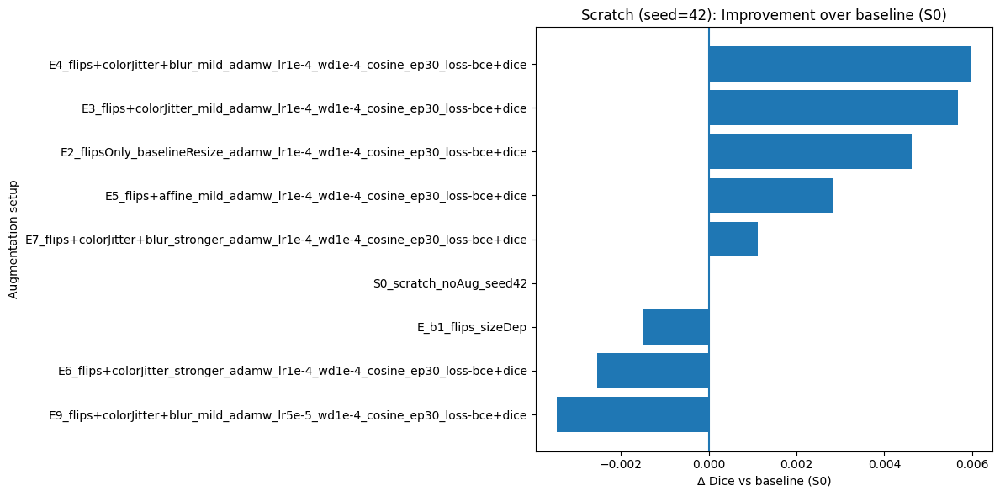

Saved: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/paper_plot_aug_delta_vs_S0_seed42.png


In [ ]:
# plot
plot_df = paper.copy().sort_values("delta_vs_S0", ascending=True)

plt.figure(figsize=(12, 6))
plt.barh(plot_df["aug_tag"], plot_df["delta_vs_S0"])
plt.axvline(0.0)
plt.xlabel("Δ Dice vs baseline (S0)")
plt.ylabel("Augmentation setup")
plt.title("Scratch (seed=42): Improvement over baseline (S0)")
plt.tight_layout()

png2 = os.path.join(SAVE_ROOT, "paper_plot_aug_delta_vs_S0_seed42.png")
plt.savefig(png2, dpi=200)
plt.show()
print("Saved:", png2)


In [ ]:
# ER KØRT
# make_flip_ds kører samme p på horizontal flips og vertical flips
from torchvision.transforms import v2
import torch, os

def make_flip_ds(p):
    transform_flip = v2.Compose([
        v2.ToImage(),
        v2.RandomHorizontalFlip(p=p),
        v2.RandomVerticalFlip(p=p),
        v2.ToDtype(torch.float32, scale=True),
        v2.Normalize(mean=mean, std=std),
    ])

    trainDS = Dataset(
        train_images, train_masks,
        transforms=transform_flip,
        transforms_large=None,
        use_size_dependent=False,
        size=512,
    )

    valDS = Dataset(
        val_images, val_masks,
        transforms=valTransform,
        use_size_dependent=False,
        size=512,
    )
    return trainDS, valDS

# E10: flipsOnly p-sweep (baseline resize_pad pipeline)
E10_ps = [0.3, 0.4, 0.5, 0.6, 0.7, 0.8]

stage_e10_runs = []
for p in E10_ps:
    trainDS_p, valDS_p = make_flip_ds(p)

    stage_e10_runs.append({
        "name": f"E10_flipsOnly_p{p}_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42",
        "dataset_tag": f"E10_flipsOnly_p{p}_baselineResize",
        "preset": "scratch",
        "optimizer": "adamw",
        "lr": 1e-4,
        "weight_decay": 1e-4,
        "scheduler_type": "cosine",
        "epochs": 30,
        "loss": "bce+dice",
        "seed": 42,
        "exp_type": "stage_e10_flip_p_sweep",
        "trainDS": trainDS_p,
        "valDS": valDS_p,
    })

results_csv = os.path.join(SAVE_ROOT, "results.csv")
df_results = run_experiments(stage_e10_runs, results_csv_path=results_csv)



RUN: E10_flipsOnly_p0.3_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42
dataset: E10_flipsOnly_p0.3_baselineResize
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.3_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.72it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.44it/s]


Train loss: 0.856902, Val loss: 0.687728
Train dice: 0.542, Val dice: 0.701
Train IoU : 0.450, Val IoU: 0.592
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.3_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.701)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.57it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.26it/s]


Train loss: 0.672156, Val loss: 0.629758
Train dice: 0.700, Val dice: 0.713
Train IoU : 0.590, Val IoU: 0.601
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.3_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.713)
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.61it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]


Train loss: 0.657808, Val loss: 0.585684
Train dice: 0.694, Val dice: 0.747
Train IoU : 0.586, Val IoU: 0.644
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.3_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.747)
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.74it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.33it/s]

Train loss: 0.591225, Val loss: 0.574743
Train dice: 0.733, Val dice: 0.742
Train IoU : 0.624, Val IoU: 0.632
LR        : 9.76e-05
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.53it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]


Train loss: 0.580493, Val loss: 0.515851
Train dice: 0.734, Val dice: 0.766
Train IoU : 0.625, Val IoU: 0.665
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.3_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.766)
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.41it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.23it/s]

Train loss: 0.540632, Val loss: 0.527822
Train dice: 0.754, Val dice: 0.756
Train IoU : 0.647, Val IoU: 0.648
LR        : 9.33e-05
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.48it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.26it/s]


Train loss: 0.516537, Val loss: 0.460447
Train dice: 0.768, Val dice: 0.791
Train IoU : 0.662, Val IoU: 0.686
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.3_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.791)
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.92it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]

Train loss: 0.513221, Val loss: 0.476544
Train dice: 0.774, Val dice: 0.776
Train IoU : 0.669, Val IoU: 0.670
LR        : 8.72e-05
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.78it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]

Train loss: 0.488887, Val loss: 0.476747
Train dice: 0.785, Val dice: 0.773
Train IoU : 0.682, Val IoU: 0.664
LR        : 8.35e-05
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.56it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.36it/s]


Train loss: 0.474259, Val loss: 0.431252
Train dice: 0.794, Val dice: 0.807
Train IoU : 0.693, Val IoU: 0.707
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.3_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.807)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.34it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]


Train loss: 0.462771, Val loss: 0.423377
Train dice: 0.795, Val dice: 0.809
Train IoU : 0.692, Val IoU: 0.708
LR        : 7.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.3_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.809)
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.45it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.27it/s]

Train loss: 0.434592, Val loss: 0.421611
Train dice: 0.805, Val dice: 0.805
Train IoU : 0.704, Val IoU: 0.706
LR        : 7.03e-05
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.64it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.28it/s]


Train loss: 0.429995, Val loss: 0.389086
Train dice: 0.810, Val dice: 0.820
Train IoU : 0.711, Val IoU: 0.724
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.3_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.820)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.53it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.29it/s]


Train loss: 0.417595, Val loss: 0.363661
Train dice: 0.814, Val dice: 0.834
Train IoU : 0.715, Val IoU: 0.738
LR        : 6.04e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.3_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.834)
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.61it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.34it/s]


Train loss: 0.381175, Val loss: 0.339933
Train dice: 0.833, Val dice: 0.842
Train IoU : 0.738, Val IoU: 0.749
LR        : 5.52e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.3_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.842)
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.49it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]

Train loss: 0.358483, Val loss: 0.330843
Train dice: 0.838, Val dice: 0.841
Train IoU : 0.746, Val IoU: 0.749
LR        : 5.00e-05
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.70it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.43it/s]


Train loss: 0.352976, Val loss: 0.325176
Train dice: 0.841, Val dice: 0.848
Train IoU : 0.748, Val IoU: 0.756
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.3_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.848)
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.18it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.54it/s]


Train loss: 0.336064, Val loss: 0.341631
Train dice: 0.848, Val dice: 0.851
Train IoU : 0.758, Val IoU: 0.765
LR        : 3.96e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.3_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.851)
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.67it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.42it/s]

Train loss: 0.333779, Val loss: 0.315306
Train dice: 0.852, Val dice: 0.851
Train IoU : 0.764, Val IoU: 0.764
LR        : 3.45e-05
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.76it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.40it/s]

Train loss: 0.313584, Val loss: 0.314979
Train dice: 0.854, Val dice: 0.843
Train IoU : 0.767, Val IoU: 0.755
LR        : 2.97e-05
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.43it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.40it/s]

Train loss: 0.307415, Val loss: 0.322173
Train dice: 0.858, Val dice: 0.848
Train IoU : 0.771, Val IoU: 0.759
LR        : 2.50e-05
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  9.00it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]

Train loss: 0.313259, Val loss: 0.305502
Train dice: 0.860, Val dice: 0.848
Train IoU : 0.774, Val IoU: 0.761
LR        : 2.06e-05
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.48it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.27it/s]

Train loss: 0.300044, Val loss: 0.304260
Train dice: 0.864, Val dice: 0.850
Train IoU : 0.781, Val IoU: 0.763
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.41it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.39it/s]


Train loss: 0.288947, Val loss: 0.285770
Train dice: 0.865, Val dice: 0.861
Train IoU : 0.782, Val IoU: 0.777
LR        : 1.28e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.3_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.861)
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.83it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.39it/s]


Train loss: 0.285442, Val loss: 0.281255
Train dice: 0.869, Val dice: 0.863
Train IoU : 0.786, Val IoU: 0.780
LR        : 9.55e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.3_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.863)
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.66it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.37it/s]

Train loss: 0.284719, Val loss: 0.282308
Train dice: 0.870, Val dice: 0.861
Train IoU : 0.788, Val IoU: 0.778
LR        : 6.70e-06
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.54it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.42it/s]

Train loss: 0.279230, Val loss: 0.281103
Train dice: 0.870, Val dice: 0.861
Train IoU : 0.789, Val IoU: 0.778
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.64it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.47it/s]

Train loss: 0.278000, Val loss: 0.279920
Train dice: 0.872, Val dice: 0.862
Train IoU : 0.791, Val IoU: 0.780
LR        : 2.45e-06
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.50it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.45it/s]

Train loss: 0.274721, Val loss: 0.281106
Train dice: 0.873, Val dice: 0.861
Train IoU : 0.792, Val IoU: 0.778
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.75it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.41it/s]

Train loss: 0.273714, Val loss: 0.280524
Train dice: 0.873, Val dice: 0.862
Train IoU : 0.792, Val IoU: 0.779
LR        : 2.74e-07

RUN: E10_flipsOnly_p0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42
dataset: E10_flipsOnly_p0.4_baselineResize
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.65it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.41it/s]


Train loss: 0.850021, Val loss: 0.669334
Train dice: 0.543, Val dice: 0.713
Train IoU : 0.451, Val IoU: 0.605
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.713)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.65it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.33it/s]


Train loss: 0.652970, Val loss: 0.607027
Train dice: 0.708, Val dice: 0.716
Train IoU : 0.601, Val IoU: 0.607
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.716)
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.71it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.48it/s]


Train loss: 0.651948, Val loss: 0.582837
Train dice: 0.706, Val dice: 0.746
Train IoU : 0.598, Val IoU: 0.644
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.746)
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.79it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.28it/s]

Train loss: 0.602797, Val loss: 0.608235
Train dice: 0.727, Val dice: 0.732
Train IoU : 0.620, Val IoU: 0.625
LR        : 9.76e-05
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.60it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.33it/s]


Train loss: 0.575076, Val loss: 0.497032
Train dice: 0.741, Val dice: 0.776
Train IoU : 0.634, Val IoU: 0.678
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.776)
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.38it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.39it/s]

Train loss: 0.531129, Val loss: 0.488529
Train dice: 0.764, Val dice: 0.771
Train IoU : 0.659, Val IoU: 0.670
LR        : 9.33e-05
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.45it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.36it/s]


Train loss: 0.504592, Val loss: 0.453719
Train dice: 0.775, Val dice: 0.797
Train IoU : 0.672, Val IoU: 0.698
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.797)
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.92it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.48it/s]

Train loss: 0.490485, Val loss: 0.467945
Train dice: 0.786, Val dice: 0.789
Train IoU : 0.682, Val IoU: 0.688
LR        : 8.72e-05
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.79it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.48it/s]


Train loss: 0.474291, Val loss: 0.438968
Train dice: 0.798, Val dice: 0.807
Train IoU : 0.697, Val IoU: 0.707
LR        : 8.35e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.807)
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.55it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]


Train loss: 0.464376, Val loss: 0.421071
Train dice: 0.802, Val dice: 0.813
Train IoU : 0.704, Val IoU: 0.718
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.813)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.40it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.51it/s]


Train loss: 0.428120, Val loss: 0.389963
Train dice: 0.812, Val dice: 0.825
Train IoU : 0.710, Val IoU: 0.728
LR        : 7.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.825)
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.45it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]


Train loss: 0.390100, Val loss: 0.367978
Train dice: 0.822, Val dice: 0.830
Train IoU : 0.725, Val IoU: 0.738
LR        : 7.03e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.830)
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.70it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.41it/s]


Train loss: 0.389888, Val loss: 0.351211
Train dice: 0.827, Val dice: 0.837
Train IoU : 0.732, Val IoU: 0.748
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.837)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.48it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.39it/s]


Train loss: 0.388636, Val loss: 0.335698
Train dice: 0.829, Val dice: 0.845
Train IoU : 0.735, Val IoU: 0.757
LR        : 6.04e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.845)
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.46it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.48it/s]

Train loss: 0.351602, Val loss: 0.326184
Train dice: 0.844, Val dice: 0.845
Train IoU : 0.753, Val IoU: 0.756
LR        : 5.52e-05
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.50it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.35it/s]

Train loss: 0.336872, Val loss: 0.332467
Train dice: 0.848, Val dice: 0.838
Train IoU : 0.759, Val IoU: 0.748
LR        : 5.00e-05
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.56it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]


Train loss: 0.341131, Val loss: 0.321459
Train dice: 0.848, Val dice: 0.853
Train IoU : 0.759, Val IoU: 0.765
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.853)
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.19it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]

Train loss: 0.324875, Val loss: 0.327896
Train dice: 0.852, Val dice: 0.850
Train IoU : 0.764, Val IoU: 0.763
LR        : 3.96e-05
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.58it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]

Train loss: 0.324775, Val loss: 0.316994
Train dice: 0.855, Val dice: 0.850
Train IoU : 0.768, Val IoU: 0.763
LR        : 3.45e-05
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.68it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.45it/s]

Train loss: 0.307290, Val loss: 0.318160
Train dice: 0.858, Val dice: 0.842
Train IoU : 0.772, Val IoU: 0.753
LR        : 2.97e-05
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.45it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.37it/s]

Train loss: 0.304791, Val loss: 0.324718
Train dice: 0.858, Val dice: 0.843
Train IoU : 0.772, Val IoU: 0.753
LR        : 2.50e-05
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.90it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]

Train loss: 0.311519, Val loss: 0.304676
Train dice: 0.861, Val dice: 0.848
Train IoU : 0.776, Val IoU: 0.760
LR        : 2.06e-05
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.50it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.51it/s]

Train loss: 0.298554, Val loss: 0.307506
Train dice: 0.864, Val dice: 0.849
Train IoU : 0.780, Val IoU: 0.763
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.43it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.50it/s]


Train loss: 0.290079, Val loss: 0.291551
Train dice: 0.864, Val dice: 0.857
Train IoU : 0.779, Val IoU: 0.772
LR        : 1.28e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.857)
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.89it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.50it/s]


Train loss: 0.286323, Val loss: 0.288667
Train dice: 0.868, Val dice: 0.858
Train IoU : 0.785, Val IoU: 0.774
LR        : 9.55e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.858)
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.63it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.46it/s]

Train loss: 0.285309, Val loss: 0.289314
Train dice: 0.869, Val dice: 0.856
Train IoU : 0.787, Val IoU: 0.773
LR        : 6.70e-06
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.46it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.44it/s]

Train loss: 0.280769, Val loss: 0.289497
Train dice: 0.870, Val dice: 0.856
Train IoU : 0.788, Val IoU: 0.772
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.74it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]


Train loss: 0.280528, Val loss: 0.287238
Train dice: 0.871, Val dice: 0.858
Train IoU : 0.789, Val IoU: 0.775
LR        : 2.45e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.858)
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.56it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.47it/s]

Train loss: 0.277225, Val loss: 0.288564
Train dice: 0.871, Val dice: 0.857
Train IoU : 0.790, Val IoU: 0.773
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.81it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.33it/s]

Train loss: 0.276214, Val loss: 0.288019
Train dice: 0.872, Val dice: 0.858
Train IoU : 0.790, Val IoU: 0.774
LR        : 2.74e-07

RUN: E10_flipsOnly_p0.5_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42
dataset: E10_flipsOnly_p0.5_baselineResize
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.5_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.66it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.44it/s]


Train loss: 0.849921, Val loss: 0.684528
Train dice: 0.544, Val dice: 0.712
Train IoU : 0.453, Val IoU: 0.604
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.5_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.712)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.54it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.25it/s]


Train loss: 0.647041, Val loss: 0.549737
Train dice: 0.714, Val dice: 0.743
Train IoU : 0.607, Val IoU: 0.635
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.5_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.743)
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.72it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.44it/s]

Train loss: 0.604396, Val loss: 0.614837
Train dice: 0.722, Val dice: 0.738
Train IoU : 0.614, Val IoU: 0.630
LR        : 9.89e-05
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.76it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.23it/s]

Train loss: 0.564888, Val loss: 0.588067
Train dice: 0.751, Val dice: 0.733
Train IoU : 0.646, Val IoU: 0.620
LR        : 9.76e-05
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.52it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.26it/s]


Train loss: 0.526134, Val loss: 0.435548
Train dice: 0.774, Val dice: 0.802
Train IoU : 0.670, Val IoU: 0.699
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.5_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.802)
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.48it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.31it/s]


Train loss: 0.477264, Val loss: 0.422870
Train dice: 0.789, Val dice: 0.807
Train IoU : 0.686, Val IoU: 0.708
LR        : 9.33e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.5_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.807)
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.47it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]


Train loss: 0.435270, Val loss: 0.372838
Train dice: 0.807, Val dice: 0.832
Train IoU : 0.707, Val IoU: 0.739
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.5_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.832)
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.92it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.55it/s]

Train loss: 0.435515, Val loss: 0.438725
Train dice: 0.805, Val dice: 0.810
Train IoU : 0.705, Val IoU: 0.713
LR        : 8.72e-05
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.77it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.51it/s]

Train loss: 0.415699, Val loss: 0.375365
Train dice: 0.816, Val dice: 0.831
Train IoU : 0.719, Val IoU: 0.740
LR        : 8.35e-05
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.59it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.35it/s]


Train loss: 0.391278, Val loss: 0.340615
Train dice: 0.829, Val dice: 0.846
Train IoU : 0.736, Val IoU: 0.757
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.5_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.846)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.26it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]

Train loss: 0.376280, Val loss: 0.337553
Train dice: 0.832, Val dice: 0.844
Train IoU : 0.738, Val IoU: 0.751
LR        : 7.50e-05
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.50it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]

Train loss: 0.352940, Val loss: 0.324496
Train dice: 0.838, Val dice: 0.837
Train IoU : 0.745, Val IoU: 0.745
LR        : 7.03e-05
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.69it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.34it/s]


Train loss: 0.355302, Val loss: 0.313358
Train dice: 0.842, Val dice: 0.853
Train IoU : 0.752, Val IoU: 0.768
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.5_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.853)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.41it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.42it/s]

Train loss: 0.351835, Val loss: 0.314120
Train dice: 0.845, Val dice: 0.851
Train IoU : 0.756, Val IoU: 0.765
LR        : 6.04e-05
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.51it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.45it/s]


Train loss: 0.328379, Val loss: 0.302112
Train dice: 0.853, Val dice: 0.856
Train IoU : 0.766, Val IoU: 0.772
LR        : 5.52e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.5_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.856)
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.40it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.37it/s]

Train loss: 0.318901, Val loss: 0.327653
Train dice: 0.855, Val dice: 0.842
Train IoU : 0.769, Val IoU: 0.755
LR        : 5.00e-05
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.75it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]


Train loss: 0.319338, Val loss: 0.300183
Train dice: 0.856, Val dice: 0.861
Train IoU : 0.769, Val IoU: 0.776
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.5_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.861)
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.14it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]

Train loss: 0.309619, Val loss: 0.315095
Train dice: 0.858, Val dice: 0.854
Train IoU : 0.772, Val IoU: 0.770
LR        : 3.96e-05
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.58it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.20it/s]

Train loss: 0.306103, Val loss: 0.309170
Train dice: 0.862, Val dice: 0.850
Train IoU : 0.779, Val IoU: 0.764
LR        : 3.45e-05
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.72it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.48it/s]

Train loss: 0.290618, Val loss: 0.298213
Train dice: 0.865, Val dice: 0.850
Train IoU : 0.782, Val IoU: 0.764
LR        : 2.97e-05
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.42it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.47it/s]

Train loss: 0.287851, Val loss: 0.315257
Train dice: 0.865, Val dice: 0.847
Train IoU : 0.782, Val IoU: 0.759
LR        : 2.50e-05
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.79it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.37it/s]

Train loss: 0.293419, Val loss: 0.297695
Train dice: 0.868, Val dice: 0.850
Train IoU : 0.786, Val IoU: 0.765
LR        : 2.06e-05
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.53it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.43it/s]

Train loss: 0.282582, Val loss: 0.298986
Train dice: 0.870, Val dice: 0.849
Train IoU : 0.790, Val IoU: 0.765
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.43it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.34it/s]


Train loss: 0.274466, Val loss: 0.280356
Train dice: 0.870, Val dice: 0.861
Train IoU : 0.789, Val IoU: 0.778
LR        : 1.28e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.5_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.861)
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.86it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]


Train loss: 0.270976, Val loss: 0.276929
Train dice: 0.874, Val dice: 0.862
Train IoU : 0.794, Val IoU: 0.780
LR        : 9.55e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.5_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.862)
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.60it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]

Train loss: 0.270066, Val loss: 0.279491
Train dice: 0.875, Val dice: 0.859
Train IoU : 0.796, Val IoU: 0.777
LR        : 6.70e-06
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.47it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.60it/s]

Train loss: 0.264144, Val loss: 0.278136
Train dice: 0.877, Val dice: 0.860
Train IoU : 0.798, Val IoU: 0.778
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.77it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.53it/s]

Train loss: 0.264970, Val loss: 0.276462
Train dice: 0.877, Val dice: 0.862
Train IoU : 0.799, Val IoU: 0.780
LR        : 2.45e-06
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.53it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]

Train loss: 0.261445, Val loss: 0.277646
Train dice: 0.878, Val dice: 0.861
Train IoU : 0.800, Val IoU: 0.778
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.85it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.40it/s]

Train loss: 0.260484, Val loss: 0.277088
Train dice: 0.878, Val dice: 0.861
Train IoU : 0.800, Val IoU: 0.779
LR        : 2.74e-07

RUN: E10_flipsOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42
dataset: E10_flipsOnly_p0.6_baselineResize
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.73it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.34it/s]


Train loss: 0.853225, Val loss: 0.683590
Train dice: 0.545, Val dice: 0.716
Train IoU : 0.453, Val IoU: 0.609
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.716)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.54it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]


Train loss: 0.673302, Val loss: 0.603063
Train dice: 0.701, Val dice: 0.727
Train IoU : 0.593, Val IoU: 0.619
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.727)
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.62it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.55it/s]


Train loss: 0.620019, Val loss: 0.565172
Train dice: 0.718, Val dice: 0.743
Train IoU : 0.611, Val IoU: 0.638
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.743)
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.69it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]

Train loss: 0.567673, Val loss: 0.607648
Train dice: 0.745, Val dice: 0.706
Train IoU : 0.637, Val IoU: 0.586
LR        : 9.76e-05
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.56it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.50it/s]


Train loss: 0.540235, Val loss: 0.451836
Train dice: 0.762, Val dice: 0.793
Train IoU : 0.656, Val IoU: 0.691
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.793)
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.51it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.30it/s]


Train loss: 0.492126, Val loss: 0.418737
Train dice: 0.781, Val dice: 0.800
Train IoU : 0.677, Val IoU: 0.696
LR        : 9.33e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.800)
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.49it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.45it/s]


Train loss: 0.452331, Val loss: 0.405917
Train dice: 0.795, Val dice: 0.813
Train IoU : 0.692, Val IoU: 0.717
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.813)
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.90it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]


Train loss: 0.437193, Val loss: 0.421431
Train dice: 0.805, Val dice: 0.817
Train IoU : 0.704, Val IoU: 0.721
LR        : 8.72e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.817)
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.75it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.52it/s]


Train loss: 0.416556, Val loss: 0.373961
Train dice: 0.813, Val dice: 0.830
Train IoU : 0.716, Val IoU: 0.737
LR        : 8.35e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.830)
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.55it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]


Train loss: 0.396022, Val loss: 0.353880
Train dice: 0.824, Val dice: 0.845
Train IoU : 0.728, Val IoU: 0.754
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.845)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.31it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.42it/s]

Train loss: 0.381480, Val loss: 0.358830
Train dice: 0.829, Val dice: 0.828
Train IoU : 0.734, Val IoU: 0.734
LR        : 7.50e-05
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.40it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]


Train loss: 0.358350, Val loss: 0.321215
Train dice: 0.833, Val dice: 0.845
Train IoU : 0.739, Val IoU: 0.755
LR        : 7.03e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.845)
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.61it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.37it/s]


Train loss: 0.350296, Val loss: 0.309139
Train dice: 0.844, Val dice: 0.856
Train IoU : 0.754, Val IoU: 0.771
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.856)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.51it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.23it/s]

Train loss: 0.350080, Val loss: 0.308516
Train dice: 0.845, Val dice: 0.855
Train IoU : 0.757, Val IoU: 0.770
LR        : 6.04e-05
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.46it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.33it/s]


Train loss: 0.325766, Val loss: 0.299389
Train dice: 0.854, Val dice: 0.858
Train IoU : 0.767, Val IoU: 0.773
LR        : 5.52e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.858)
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.34it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.39it/s]

Train loss: 0.316137, Val loss: 0.334776
Train dice: 0.857, Val dice: 0.840
Train IoU : 0.772, Val IoU: 0.753
LR        : 5.00e-05
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.69it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.54it/s]


Train loss: 0.318864, Val loss: 0.298835
Train dice: 0.854, Val dice: 0.862
Train IoU : 0.768, Val IoU: 0.776
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.862)
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.18it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.38it/s]

Train loss: 0.306873, Val loss: 0.307359
Train dice: 0.860, Val dice: 0.857
Train IoU : 0.775, Val IoU: 0.774
LR        : 3.96e-05
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.59it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]

Train loss: 0.304983, Val loss: 0.298947
Train dice: 0.863, Val dice: 0.856
Train IoU : 0.780, Val IoU: 0.772
LR        : 3.45e-05
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.67it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.51it/s]

Train loss: 0.288787, Val loss: 0.295276
Train dice: 0.866, Val dice: 0.852
Train IoU : 0.783, Val IoU: 0.766
LR        : 2.97e-05
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.45it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.52it/s]

Train loss: 0.285360, Val loss: 0.315173
Train dice: 0.866, Val dice: 0.847
Train IoU : 0.784, Val IoU: 0.760
LR        : 2.50e-05
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.81it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.51it/s]

Train loss: 0.291482, Val loss: 0.296543
Train dice: 0.869, Val dice: 0.850
Train IoU : 0.787, Val IoU: 0.763
LR        : 2.06e-05
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.49it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.38it/s]

Train loss: 0.279805, Val loss: 0.292111
Train dice: 0.872, Val dice: 0.853
Train IoU : 0.792, Val IoU: 0.770
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.35it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.48it/s]


Train loss: 0.271442, Val loss: 0.275349
Train dice: 0.872, Val dice: 0.862
Train IoU : 0.792, Val IoU: 0.780
LR        : 1.28e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.862)
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.83it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.41it/s]


Train loss: 0.267240, Val loss: 0.271274
Train dice: 0.875, Val dice: 0.866
Train IoU : 0.796, Val IoU: 0.785
LR        : 9.55e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.866)
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.48it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]

Train loss: 0.267028, Val loss: 0.273978
Train dice: 0.877, Val dice: 0.862
Train IoU : 0.798, Val IoU: 0.780
LR        : 6.70e-06
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.47it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]

Train loss: 0.260756, Val loss: 0.272948
Train dice: 0.878, Val dice: 0.862
Train IoU : 0.800, Val IoU: 0.781
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.68it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.33it/s]

Train loss: 0.261516, Val loss: 0.271413
Train dice: 0.879, Val dice: 0.864
Train IoU : 0.801, Val IoU: 0.783
LR        : 2.45e-06
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.49it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.33it/s]

Train loss: 0.257924, Val loss: 0.272483
Train dice: 0.880, Val dice: 0.863
Train IoU : 0.802, Val IoU: 0.781
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.74it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.18it/s]

Train loss: 0.258138, Val loss: 0.271959
Train dice: 0.879, Val dice: 0.863
Train IoU : 0.801, Val IoU: 0.782
LR        : 2.74e-07

RUN: E10_flipsOnly_p0.7_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42
dataset: E10_flipsOnly_p0.7_baselineResize
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.7_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.64it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.33it/s]


Train loss: 0.873115, Val loss: 0.759455
Train dice: 0.531, Val dice: 0.678
Train IoU : 0.439, Val IoU: 0.565
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.7_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.678)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.55it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.45it/s]


Train loss: 0.671338, Val loss: 0.610153
Train dice: 0.701, Val dice: 0.724
Train IoU : 0.592, Val IoU: 0.617
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.7_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.724)
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.65it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]


Train loss: 0.638511, Val loss: 0.547429
Train dice: 0.710, Val dice: 0.762
Train IoU : 0.602, Val IoU: 0.662
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.7_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.762)
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.64it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]

Train loss: 0.604699, Val loss: 0.574246
Train dice: 0.725, Val dice: 0.746
Train IoU : 0.617, Val IoU: 0.642
LR        : 9.76e-05
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.53it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.45it/s]


Train loss: 0.580501, Val loss: 0.514929
Train dice: 0.735, Val dice: 0.768
Train IoU : 0.628, Val IoU: 0.668
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.7_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.768)
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.45it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.40it/s]

Train loss: 0.552326, Val loss: 0.534787
Train dice: 0.756, Val dice: 0.760
Train IoU : 0.651, Val IoU: 0.659
LR        : 9.33e-05
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.54it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.43it/s]


Train loss: 0.552669, Val loss: 0.476060
Train dice: 0.753, Val dice: 0.786
Train IoU : 0.648, Val IoU: 0.685
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.7_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.786)
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.96it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]

Train loss: 0.546793, Val loss: 0.496775
Train dice: 0.754, Val dice: 0.783
Train IoU : 0.651, Val IoU: 0.680
LR        : 8.72e-05
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.66it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.45it/s]


Train loss: 0.511518, Val loss: 0.456720
Train dice: 0.784, Val dice: 0.794
Train IoU : 0.682, Val IoU: 0.689
LR        : 8.35e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.7_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.794)
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.57it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.36it/s]


Train loss: 0.493999, Val loss: 0.456079
Train dice: 0.792, Val dice: 0.800
Train IoU : 0.691, Val IoU: 0.703
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.7_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.800)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.31it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.37it/s]


Train loss: 0.455898, Val loss: 0.413861
Train dice: 0.798, Val dice: 0.814
Train IoU : 0.695, Val IoU: 0.715
LR        : 7.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.7_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.814)
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.28it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.28it/s]


Train loss: 0.416544, Val loss: 0.385947
Train dice: 0.815, Val dice: 0.821
Train IoU : 0.715, Val IoU: 0.724
LR        : 7.03e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.7_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.821)
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.67it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.54it/s]


Train loss: 0.409610, Val loss: 0.360834
Train dice: 0.819, Val dice: 0.837
Train IoU : 0.722, Val IoU: 0.746
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.7_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.837)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.51it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]

Train loss: 0.401971, Val loss: 0.376481
Train dice: 0.824, Val dice: 0.824
Train IoU : 0.728, Val IoU: 0.727
LR        : 6.04e-05
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.47it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]


Train loss: 0.371702, Val loss: 0.332168
Train dice: 0.836, Val dice: 0.845
Train IoU : 0.743, Val IoU: 0.754
LR        : 5.52e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.7_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.845)
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.38it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.31it/s]

Train loss: 0.357580, Val loss: 0.332589
Train dice: 0.839, Val dice: 0.841
Train IoU : 0.748, Val IoU: 0.751
LR        : 5.00e-05
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.71it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.40it/s]


Train loss: 0.354431, Val loss: 0.323982
Train dice: 0.842, Val dice: 0.851
Train IoU : 0.750, Val IoU: 0.763
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.7_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.851)
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.21it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]

Train loss: 0.337722, Val loss: 0.330416
Train dice: 0.849, Val dice: 0.850
Train IoU : 0.760, Val IoU: 0.764
LR        : 3.96e-05
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.60it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.33it/s]

Train loss: 0.335373, Val loss: 0.313849
Train dice: 0.852, Val dice: 0.850
Train IoU : 0.765, Val IoU: 0.762
LR        : 3.45e-05
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.72it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.56it/s]

Train loss: 0.318987, Val loss: 0.309940
Train dice: 0.854, Val dice: 0.848
Train IoU : 0.766, Val IoU: 0.760
LR        : 2.97e-05
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.43it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.34it/s]

Train loss: 0.313127, Val loss: 0.332496
Train dice: 0.856, Val dice: 0.841
Train IoU : 0.769, Val IoU: 0.750
LR        : 2.50e-05
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.80it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.18it/s]

Train loss: 0.321215, Val loss: 0.310438
Train dice: 0.857, Val dice: 0.846
Train IoU : 0.771, Val IoU: 0.757
LR        : 2.06e-05
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.50it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.22it/s]

Train loss: 0.305957, Val loss: 0.309197
Train dice: 0.862, Val dice: 0.847
Train IoU : 0.777, Val IoU: 0.761
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.38it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.45it/s]


Train loss: 0.297853, Val loss: 0.293335
Train dice: 0.862, Val dice: 0.857
Train IoU : 0.777, Val IoU: 0.772
LR        : 1.28e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.7_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.857)
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.87it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.43it/s]


Train loss: 0.293325, Val loss: 0.290491
Train dice: 0.866, Val dice: 0.858
Train IoU : 0.782, Val IoU: 0.774
LR        : 9.55e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.7_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.858)
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.65it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.34it/s]

Train loss: 0.292694, Val loss: 0.290908
Train dice: 0.867, Val dice: 0.857
Train IoU : 0.785, Val IoU: 0.772
LR        : 6.70e-06
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.43it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.53it/s]

Train loss: 0.285868, Val loss: 0.291265
Train dice: 0.869, Val dice: 0.856
Train IoU : 0.787, Val IoU: 0.772
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.60it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.41it/s]


Train loss: 0.285211, Val loss: 0.289487
Train dice: 0.870, Val dice: 0.858
Train IoU : 0.788, Val IoU: 0.774
LR        : 2.45e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.7_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.858)
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.52it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]

Train loss: 0.282371, Val loss: 0.291125
Train dice: 0.871, Val dice: 0.857
Train IoU : 0.789, Val IoU: 0.773
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.84it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.37it/s]

Train loss: 0.281036, Val loss: 0.290704
Train dice: 0.871, Val dice: 0.857
Train IoU : 0.789, Val IoU: 0.773
LR        : 2.74e-07

RUN: E10_flipsOnly_p0.8_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42
dataset: E10_flipsOnly_p0.8_baselineResize
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.8_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.75it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.42it/s]


Train loss: 0.861601, Val loss: 0.689719
Train dice: 0.534, Val dice: 0.713
Train IoU : 0.444, Val IoU: 0.606
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.8_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.713)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.57it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.36it/s]


Train loss: 0.641283, Val loss: 0.594397
Train dice: 0.712, Val dice: 0.718
Train IoU : 0.604, Val IoU: 0.605
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.8_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.718)
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.62it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]

Train loss: 0.649306, Val loss: 0.710732
Train dice: 0.692, Val dice: 0.662
Train IoU : 0.584, Val IoU: 0.544
LR        : 9.89e-05
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.75it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.41it/s]

Train loss: 0.599557, Val loss: 0.671338
Train dice: 0.739, Val dice: 0.707
Train IoU : 0.632, Val IoU: 0.588
LR        : 9.76e-05
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.57it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.28it/s]


Train loss: 0.543890, Val loss: 0.478897
Train dice: 0.761, Val dice: 0.792
Train IoU : 0.654, Val IoU: 0.692
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.8_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.792)
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.34it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.42it/s]

Train loss: 0.511849, Val loss: 0.510846
Train dice: 0.776, Val dice: 0.775
Train IoU : 0.671, Val IoU: 0.670
LR        : 9.33e-05
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.39it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.27it/s]


Train loss: 0.484575, Val loss: 0.440493
Train dice: 0.789, Val dice: 0.809
Train IoU : 0.687, Val IoU: 0.712
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.8_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.809)
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.98it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.51it/s]

Train loss: 0.485609, Val loss: 0.510174
Train dice: 0.787, Val dice: 0.794
Train IoU : 0.685, Val IoU: 0.693
LR        : 8.72e-05
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.81it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.46it/s]

Train loss: 0.465381, Val loss: 0.423508
Train dice: 0.799, Val dice: 0.809
Train IoU : 0.699, Val IoU: 0.710
LR        : 8.35e-05
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.52it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.32it/s]


Train loss: 0.432370, Val loss: 0.369101
Train dice: 0.813, Val dice: 0.832
Train IoU : 0.716, Val IoU: 0.738
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.8_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.832)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.32it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.41it/s]


Train loss: 0.407725, Val loss: 0.361536
Train dice: 0.820, Val dice: 0.836
Train IoU : 0.724, Val IoU: 0.742
LR        : 7.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.8_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.836)
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.38it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]

Train loss: 0.378282, Val loss: 0.353283
Train dice: 0.827, Val dice: 0.826
Train IoU : 0.732, Val IoU: 0.731
LR        : 7.03e-05
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.60it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]


Train loss: 0.371208, Val loss: 0.328092
Train dice: 0.835, Val dice: 0.847
Train IoU : 0.743, Val IoU: 0.758
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.8_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.847)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.41it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.40it/s]


Train loss: 0.368015, Val loss: 0.320525
Train dice: 0.837, Val dice: 0.851
Train IoU : 0.745, Val IoU: 0.764
LR        : 6.04e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.8_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.851)
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.51it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.36it/s]


Train loss: 0.339630, Val loss: 0.309384
Train dice: 0.848, Val dice: 0.854
Train IoU : 0.759, Val IoU: 0.768
LR        : 5.52e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.8_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.854)
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.37it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.37it/s]

Train loss: 0.328156, Val loss: 0.322722
Train dice: 0.850, Val dice: 0.850
Train IoU : 0.763, Val IoU: 0.765
LR        : 5.00e-05
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.71it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]


Train loss: 0.327438, Val loss: 0.303095
Train dice: 0.852, Val dice: 0.861
Train IoU : 0.765, Val IoU: 0.776
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.8_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.861)
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.19it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]

Train loss: 0.314306, Val loss: 0.308507
Train dice: 0.856, Val dice: 0.859
Train IoU : 0.770, Val IoU: 0.777
LR        : 3.96e-05
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.59it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.27it/s]

Train loss: 0.313853, Val loss: 0.305507
Train dice: 0.858, Val dice: 0.855
Train IoU : 0.773, Val IoU: 0.771
LR        : 3.45e-05
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.68it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.51it/s]

Train loss: 0.294099, Val loss: 0.305091
Train dice: 0.862, Val dice: 0.846
Train IoU : 0.779, Val IoU: 0.759
LR        : 2.97e-05
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.39it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.48it/s]

Train loss: 0.289283, Val loss: 0.317562
Train dice: 0.864, Val dice: 0.847
Train IoU : 0.781, Val IoU: 0.759
LR        : 2.50e-05
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.75it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]

Train loss: 0.295347, Val loss: 0.301599
Train dice: 0.866, Val dice: 0.848
Train IoU : 0.783, Val IoU: 0.762
LR        : 2.06e-05
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.46it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.44it/s]

Train loss: 0.283623, Val loss: 0.301343
Train dice: 0.869, Val dice: 0.847
Train IoU : 0.789, Val IoU: 0.763
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.42it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.28it/s]

Train loss: 0.273823, Val loss: 0.280054
Train dice: 0.870, Val dice: 0.861
Train IoU : 0.789, Val IoU: 0.778
LR        : 1.28e-05
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.86it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.33it/s]


Train loss: 0.270833, Val loss: 0.276714
Train dice: 0.873, Val dice: 0.863
Train IoU : 0.793, Val IoU: 0.781
LR        : 9.55e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E10_flipsOnly_p0.8_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.863)
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.58it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.42it/s]

Train loss: 0.270485, Val loss: 0.278394
Train dice: 0.875, Val dice: 0.859
Train IoU : 0.795, Val IoU: 0.777
LR        : 6.70e-06
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.38it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]

Train loss: 0.263547, Val loss: 0.277304
Train dice: 0.876, Val dice: 0.861
Train IoU : 0.797, Val IoU: 0.779
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.74it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.50it/s]

Train loss: 0.264401, Val loss: 0.275435
Train dice: 0.878, Val dice: 0.862
Train IoU : 0.799, Val IoU: 0.781
LR        : 2.45e-06
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.51it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]

Train loss: 0.260485, Val loss: 0.277130
Train dice: 0.878, Val dice: 0.861
Train IoU : 0.800, Val IoU: 0.779
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.69it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.50it/s]

Train loss: 0.259447, Val loss: 0.276560
Train dice: 0.877, Val dice: 0.861
Train IoU : 0.799, Val IoU: 0.779
LR        : 2.74e-07


In [ ]:
import pandas as pd, os

df = pd.read_csv(os.path.join(SAVE_ROOT, "results.csv"))
df_e10 = (df[df["exp_type"].eq("stage_e10_flip_p_sweep")]
          .sort_values("best_val_dice", ascending=False)
          [["name","best_val_dice","best_epoch","best_val_loss","lr","weight_decay","scheduler_type","run_dir"]])
df_e10


,name,best_val_dice,best_epoch,best_val_loss,lr,weight_decay,scheduler_type,run_dir
47,E10_flipsOnly_p0.6_baselineResize_adamw_lr1e-4...,0.865630,25,0.271274,0.0001,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...
49,E10_flipsOnly_p0.8_baselineResize_adamw_lr1e-4...,0.863155,25,0.276714,0.0001,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...
44,E10_flipsOnly_p0.3_baselineResize_adamw_lr1e-4...,0.862909,25,0.281255,0.0001,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...
46,E10_flipsOnly_p0.5_baselineResize_adamw_lr1e-4...,0.862405,25,0.276929,0.0001,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...
48,E10_flipsOnly_p0.7_baselineResize_adamw_lr1e-4...,0.858304,28,0.289487,0.0001,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...
45,E10_flipsOnly_p0.4_baselineResize_adamw_lr1e-4...,0.858164,28,0.287238,0.0001,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...


In [ ]:
# ER KØRT
# men her er make_flip_ds med differentieret flips på horizontl og vertical
from torchvision.transforms import v2
import torch

# --------- helper til at bygge dataset + cfg ----------
def make_flip_ds(p_h=0.0, p_v=0.0):
    t = v2.Compose([
        v2.ToImage(),
        v2.RandomHorizontalFlip(p=float(p_h)),
        v2.RandomVerticalFlip(p=float(p_v)),
        v2.ToDtype(torch.float32, scale=True),
        v2.Normalize(mean=mean, std=std),
    ])
    trainDS = Dataset(
        train_images, train_masks,
        transforms=t,
        transforms_large=None,
        use_size_dependent=False,  # baseline resize_pad pipeline
        size=512,
    )
    valDS = Dataset(
        val_images, val_masks,
        transforms=valTransform,
        transforms_large=None,
        use_size_dependent=False,
        size=512,
    )
    return trainDS, valDS


# =========================
# E11: H-only (p=0.6)
# =========================
trainDS_E11, valDS_E11 = make_flip_ds(p_h=0.6, p_v=0.0)

E11 = {
    "name": "E11_hFlipOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42",
    "preset": "scratch",
    "optimizer": "adamw",
    "lr": 1e-4,
    "weight_decay": 1e-4,
    "scheduler_type": "cosine",
    "epochs": 30,
    "loss": "bce+dice",
    "seed": 42,
    "exp_type": "stage_e_aug_flip_ablation",
    "dataset_tag": "E11_hFlipOnly_p0.6",
    "trainDS": trainDS_E11,
    "valDS": valDS_E11,
}

# =========================
# E12: V-only (p=0.6)
# =========================
trainDS_E12, valDS_E12 = make_flip_ds(p_h=0.0, p_v=0.6)

E12 = {
    "name": "E12_vFlipOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42",
    "preset": "scratch",
    "optimizer": "adamw",
    "lr": 1e-4,
    "weight_decay": 1e-4,
    "scheduler_type": "cosine",
    "epochs": 30,
    "loss": "bce+dice",
    "seed": 42,
    "exp_type": "stage_e_aug_flip_ablation",
    "dataset_tag": "E12_vFlipOnly_p0.6",
    "trainDS": trainDS_E12,
    "valDS": valDS_E12,
}

# =========================
# E13: Combo med separate p
# =========================
trainDS_E13a, valDS_E13a = make_flip_ds(p_h=0.6, p_v=0.3)
trainDS_E13b, valDS_E13b = make_flip_ds(p_h=0.6, p_v=0.4)

E13a = {
    "name": "E13a_h0.6_v0.3_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42",
    "preset": "scratch",
    "optimizer": "adamw",
    "lr": 1e-4,
    "weight_decay": 1e-4,
    "scheduler_type": "cosine",
    "epochs": 30,
    "loss": "bce+dice",
    "seed": 42,
    "exp_type": "stage_e_aug_flip_ablation",
    "dataset_tag": "E13a_h0.6_v0.3",
    "trainDS": trainDS_E13a,
    "valDS": valDS_E13a,
}

E13b = {
    "name": "E13b_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42",
    "preset": "scratch",
    "optimizer": "adamw",
    "lr": 1e-4,
    "weight_decay": 1e-4,
    "scheduler_type": "cosine",
    "epochs": 30,
    "loss": "bce+dice",
    "seed": 42,
    "exp_type": "stage_e_aug_flip_ablation",
    "dataset_tag": "E13b_h0.6_v0.4",
    "trainDS": trainDS_E13b,
    "valDS": valDS_E13b,
}

# --------- kør dem ----------
planned_runs = [E11, E12, E13a, E13b]

results_csv = os.path.join(SAVE_ROOT, "results.csv")
df_results = run_experiments(planned_runs, results_csv_path=results_csv)

(df_results[df_results["name"].isin([c["name"] for c in planned_runs])]
 .sort_values("best_val_dice", ascending=False)
 [["name","best_val_dice","best_epoch","best_val_loss","lr","weight_decay","scheduler_type","run_dir"]])



RUN: E11_hFlipOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42
dataset: E11_hFlipOnly_p0.6
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E11_hFlipOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.58it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]


Train loss: 0.849290, Val loss: 0.716427
Train dice: 0.546, Val dice: 0.710
Train IoU : 0.454, Val IoU: 0.602
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E11_hFlipOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.710)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.44it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.24it/s]


Train loss: 0.657572, Val loss: 0.570492
Train dice: 0.699, Val dice: 0.736
Train IoU : 0.591, Val IoU: 0.627
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E11_hFlipOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.736)
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.65it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.28it/s]


Train loss: 0.588615, Val loss: 0.532919
Train dice: 0.737, Val dice: 0.775
Train IoU : 0.631, Val IoU: 0.675
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E11_hFlipOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.775)
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.65it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]

Train loss: 0.554100, Val loss: 0.584399
Train dice: 0.757, Val dice: 0.716
Train IoU : 0.652, Val IoU: 0.597
LR        : 9.76e-05
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.59it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.37it/s]


Train loss: 0.523020, Val loss: 0.421222
Train dice: 0.773, Val dice: 0.806
Train IoU : 0.668, Val IoU: 0.705
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E11_hFlipOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.806)
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.50it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.43it/s]

Train loss: 0.471251, Val loss: 0.440053
Train dice: 0.791, Val dice: 0.797
Train IoU : 0.686, Val IoU: 0.694
LR        : 9.33e-05
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.49it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.35it/s]


Train loss: 0.421871, Val loss: 0.375616
Train dice: 0.811, Val dice: 0.833
Train IoU : 0.710, Val IoU: 0.740
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E11_hFlipOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.833)
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.91it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.39it/s]

Train loss: 0.412006, Val loss: 0.376822
Train dice: 0.820, Val dice: 0.829
Train IoU : 0.721, Val IoU: 0.736
LR        : 8.72e-05
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.76it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.25it/s]

Train loss: 0.398427, Val loss: 0.376209
Train dice: 0.821, Val dice: 0.818
Train IoU : 0.726, Val IoU: 0.721
LR        : 8.35e-05
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.43it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.28it/s]


Train loss: 0.383615, Val loss: 0.341955
Train dice: 0.830, Val dice: 0.846
Train IoU : 0.737, Val IoU: 0.758
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E11_hFlipOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.846)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.40it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.25it/s]

Train loss: 0.369063, Val loss: 0.346261
Train dice: 0.833, Val dice: 0.843
Train IoU : 0.741, Val IoU: 0.752
LR        : 7.50e-05
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.34it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]

Train loss: 0.346357, Val loss: 0.331187
Train dice: 0.841, Val dice: 0.833
Train IoU : 0.750, Val IoU: 0.740
LR        : 7.03e-05
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.61it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]


Train loss: 0.342168, Val loss: 0.310611
Train dice: 0.848, Val dice: 0.855
Train IoU : 0.760, Val IoU: 0.770
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E11_hFlipOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.855)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.52it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.25it/s]

Train loss: 0.345551, Val loss: 0.309547
Train dice: 0.847, Val dice: 0.854
Train IoU : 0.759, Val IoU: 0.768
LR        : 6.04e-05
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.43it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]


Train loss: 0.321473, Val loss: 0.302630
Train dice: 0.856, Val dice: 0.857
Train IoU : 0.770, Val IoU: 0.772
LR        : 5.52e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E11_hFlipOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.857)
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.39it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.25it/s]

Train loss: 0.311295, Val loss: 0.318748
Train dice: 0.859, Val dice: 0.844
Train IoU : 0.773, Val IoU: 0.758
LR        : 5.00e-05
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.57it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.29it/s]


Train loss: 0.309750, Val loss: 0.298961
Train dice: 0.860, Val dice: 0.860
Train IoU : 0.774, Val IoU: 0.774
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E11_hFlipOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.860)
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.17it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]

Train loss: 0.298922, Val loss: 0.305686
Train dice: 0.863, Val dice: 0.858
Train IoU : 0.779, Val IoU: 0.774
LR        : 3.96e-05
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.56it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]

Train loss: 0.298079, Val loss: 0.300474
Train dice: 0.865, Val dice: 0.857
Train IoU : 0.783, Val IoU: 0.773
LR        : 3.45e-05
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.69it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.39it/s]

Train loss: 0.281972, Val loss: 0.294925
Train dice: 0.869, Val dice: 0.851
Train IoU : 0.787, Val IoU: 0.765
LR        : 2.97e-05
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.36it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]

Train loss: 0.277321, Val loss: 0.308109
Train dice: 0.870, Val dice: 0.849
Train IoU : 0.789, Val IoU: 0.762
LR        : 2.50e-05
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.89it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]

Train loss: 0.282637, Val loss: 0.292569
Train dice: 0.872, Val dice: 0.854
Train IoU : 0.791, Val IoU: 0.768
LR        : 2.06e-05
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.48it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.16it/s]

Train loss: 0.273720, Val loss: 0.294893
Train dice: 0.874, Val dice: 0.850
Train IoU : 0.795, Val IoU: 0.766
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.42it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.25it/s]


Train loss: 0.264238, Val loss: 0.277680
Train dice: 0.875, Val dice: 0.862
Train IoU : 0.795, Val IoU: 0.779
LR        : 1.28e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E11_hFlipOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.862)
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.94it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.26it/s]


Train loss: 0.260190, Val loss: 0.274313
Train dice: 0.879, Val dice: 0.864
Train IoU : 0.801, Val IoU: 0.781
LR        : 9.55e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E11_hFlipOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.864)
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.57it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.33it/s]

Train loss: 0.259546, Val loss: 0.276831
Train dice: 0.880, Val dice: 0.860
Train IoU : 0.803, Val IoU: 0.777
LR        : 6.70e-06
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.47it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.39it/s]

Train loss: 0.253505, Val loss: 0.274995
Train dice: 0.881, Val dice: 0.862
Train IoU : 0.804, Val IoU: 0.780
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.71it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]

Train loss: 0.254342, Val loss: 0.273684
Train dice: 0.882, Val dice: 0.864
Train IoU : 0.805, Val IoU: 0.781
LR        : 2.45e-06
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.48it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.33it/s]

Train loss: 0.249938, Val loss: 0.274769
Train dice: 0.883, Val dice: 0.863
Train IoU : 0.806, Val IoU: 0.780
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.73it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.27it/s]

Train loss: 0.250040, Val loss: 0.274369
Train dice: 0.883, Val dice: 0.863
Train IoU : 0.806, Val IoU: 0.780
LR        : 2.74e-07

RUN: E12_vFlipOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42
dataset: E12_vFlipOnly_p0.6
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E12_vFlipOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.69it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.38it/s]


Train loss: 0.856555, Val loss: 0.668610
Train dice: 0.544, Val dice: 0.719
Train IoU : 0.452, Val IoU: 0.612
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E12_vFlipOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.719)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.60it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.25it/s]


Train loss: 0.672558, Val loss: 0.581337
Train dice: 0.700, Val dice: 0.732
Train IoU : 0.592, Val IoU: 0.627
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E12_vFlipOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.732)
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.73it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.28it/s]


Train loss: 0.626952, Val loss: 0.588844
Train dice: 0.706, Val dice: 0.738
Train IoU : 0.600, Val IoU: 0.632
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E12_vFlipOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.738)
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.74it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.25it/s]

Train loss: 0.577935, Val loss: 0.623481
Train dice: 0.736, Val dice: 0.731
Train IoU : 0.629, Val IoU: 0.613
LR        : 9.76e-05
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.65it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.35it/s]


Train loss: 0.550117, Val loss: 0.471811
Train dice: 0.757, Val dice: 0.789
Train IoU : 0.651, Val IoU: 0.688
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E12_vFlipOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.789)
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.50it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.33it/s]

Train loss: 0.502094, Val loss: 0.468715
Train dice: 0.779, Val dice: 0.777
Train IoU : 0.674, Val IoU: 0.669
LR        : 9.33e-05
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.40it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.44it/s]


Train loss: 0.465663, Val loss: 0.433883
Train dice: 0.794, Val dice: 0.806
Train IoU : 0.693, Val IoU: 0.708
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E12_vFlipOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.806)
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.88it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.56it/s]

Train loss: 0.450416, Val loss: 0.428991
Train dice: 0.801, Val dice: 0.806
Train IoU : 0.700, Val IoU: 0.708
LR        : 8.72e-05
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.76it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.40it/s]


Train loss: 0.419791, Val loss: 0.395864
Train dice: 0.814, Val dice: 0.823
Train IoU : 0.717, Val IoU: 0.729
LR        : 8.35e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E12_vFlipOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.823)
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.52it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.29it/s]


Train loss: 0.408717, Val loss: 0.367245
Train dice: 0.821, Val dice: 0.839
Train IoU : 0.725, Val IoU: 0.747
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E12_vFlipOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.839)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.33it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.34it/s]


Train loss: 0.388105, Val loss: 0.341417
Train dice: 0.828, Val dice: 0.846
Train IoU : 0.732, Val IoU: 0.755
LR        : 7.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E12_vFlipOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.846)
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.41it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]

Train loss: 0.358522, Val loss: 0.335437
Train dice: 0.838, Val dice: 0.833
Train IoU : 0.745, Val IoU: 0.741
LR        : 7.03e-05
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.70it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.34it/s]


Train loss: 0.358269, Val loss: 0.321803
Train dice: 0.841, Val dice: 0.850
Train IoU : 0.750, Val IoU: 0.763
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E12_vFlipOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.850)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.51it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.24it/s]

Train loss: 0.355466, Val loss: 0.321308
Train dice: 0.841, Val dice: 0.848
Train IoU : 0.751, Val IoU: 0.761
LR        : 6.04e-05
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.40it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]


Train loss: 0.333789, Val loss: 0.302444
Train dice: 0.851, Val dice: 0.857
Train IoU : 0.763, Val IoU: 0.772
LR        : 5.52e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E12_vFlipOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.857)
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.34it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.36it/s]

Train loss: 0.318014, Val loss: 0.333208
Train dice: 0.855, Val dice: 0.834
Train IoU : 0.768, Val IoU: 0.745
LR        : 5.00e-05
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.63it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.28it/s]


Train loss: 0.320999, Val loss: 0.297618
Train dice: 0.855, Val dice: 0.861
Train IoU : 0.767, Val IoU: 0.775
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E12_vFlipOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.861)
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.14it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]

Train loss: 0.309138, Val loss: 0.311819
Train dice: 0.858, Val dice: 0.856
Train IoU : 0.772, Val IoU: 0.772
LR        : 3.96e-05
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.62it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]

Train loss: 0.306622, Val loss: 0.300002
Train dice: 0.863, Val dice: 0.855
Train IoU : 0.779, Val IoU: 0.770
LR        : 3.45e-05
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.68it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.40it/s]

Train loss: 0.291470, Val loss: 0.296894
Train dice: 0.864, Val dice: 0.852
Train IoU : 0.781, Val IoU: 0.765
LR        : 2.97e-05
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.41it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.51it/s]

Train loss: 0.287500, Val loss: 0.316995
Train dice: 0.865, Val dice: 0.847
Train IoU : 0.782, Val IoU: 0.758
LR        : 2.50e-05
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.80it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.34it/s]

Train loss: 0.293497, Val loss: 0.301720
Train dice: 0.868, Val dice: 0.847
Train IoU : 0.785, Val IoU: 0.760
LR        : 2.06e-05
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.39it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.49it/s]

Train loss: 0.282191, Val loss: 0.297027
Train dice: 0.871, Val dice: 0.850
Train IoU : 0.790, Val IoU: 0.766
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.45it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.34it/s]


Train loss: 0.272187, Val loss: 0.276516
Train dice: 0.872, Val dice: 0.864
Train IoU : 0.792, Val IoU: 0.782
LR        : 1.28e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E12_vFlipOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.864)
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.94it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.33it/s]


Train loss: 0.267797, Val loss: 0.275147
Train dice: 0.876, Val dice: 0.865
Train IoU : 0.796, Val IoU: 0.783
LR        : 9.55e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E12_vFlipOnly_p0.6_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.865)
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.66it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]

Train loss: 0.267938, Val loss: 0.276358
Train dice: 0.877, Val dice: 0.862
Train IoU : 0.798, Val IoU: 0.780
LR        : 6.70e-06
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.46it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]

Train loss: 0.261810, Val loss: 0.276343
Train dice: 0.878, Val dice: 0.861
Train IoU : 0.800, Val IoU: 0.780
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.71it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.43it/s]

Train loss: 0.262562, Val loss: 0.274223
Train dice: 0.879, Val dice: 0.864
Train IoU : 0.801, Val IoU: 0.783
LR        : 2.45e-06
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.52it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.42it/s]

Train loss: 0.258874, Val loss: 0.275573
Train dice: 0.880, Val dice: 0.863
Train IoU : 0.802, Val IoU: 0.781
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.75it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.51it/s]

Train loss: 0.258946, Val loss: 0.275010
Train dice: 0.879, Val dice: 0.863
Train IoU : 0.801, Val IoU: 0.782
LR        : 2.74e-07

RUN: E13a_h0.6_v0.3_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42
dataset: E13a_h0.6_v0.3
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13a_h0.6_v0.3_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.68it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.38it/s]


Train loss: 0.859532, Val loss: 0.668444
Train dice: 0.540, Val dice: 0.713
Train IoU : 0.449, Val IoU: 0.605
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13a_h0.6_v0.3_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.713)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.65it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]


Train loss: 0.645405, Val loss: 0.566199
Train dice: 0.711, Val dice: 0.735
Train IoU : 0.603, Val IoU: 0.628
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13a_h0.6_v0.3_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.735)
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.67it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]


Train loss: 0.605236, Val loss: 0.519969
Train dice: 0.719, Val dice: 0.759
Train IoU : 0.612, Val IoU: 0.658
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13a_h0.6_v0.3_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.759)
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.68it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.34it/s]

Train loss: 0.569667, Val loss: 0.560002
Train dice: 0.744, Val dice: 0.739
Train IoU : 0.638, Val IoU: 0.626
LR        : 9.76e-05
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.60it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.29it/s]


Train loss: 0.529144, Val loss: 0.460305
Train dice: 0.763, Val dice: 0.790
Train IoU : 0.657, Val IoU: 0.683
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13a_h0.6_v0.3_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.790)
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.53it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.29it/s]

Train loss: 0.509389, Val loss: 0.502127
Train dice: 0.775, Val dice: 0.779
Train IoU : 0.670, Val IoU: 0.677
LR        : 9.33e-05
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.58it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]


Train loss: 0.486263, Val loss: 0.438061
Train dice: 0.786, Val dice: 0.802
Train IoU : 0.684, Val IoU: 0.700
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13a_h0.6_v0.3_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.802)
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.91it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.41it/s]

Train loss: 0.482278, Val loss: 0.521881
Train dice: 0.787, Val dice: 0.782
Train IoU : 0.685, Val IoU: 0.680
LR        : 8.72e-05
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.82it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.36it/s]

Train loss: 0.477793, Val loss: 0.437905
Train dice: 0.792, Val dice: 0.800
Train IoU : 0.692, Val IoU: 0.696
LR        : 8.35e-05
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.59it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]


Train loss: 0.442874, Val loss: 0.381174
Train dice: 0.808, Val dice: 0.829
Train IoU : 0.709, Val IoU: 0.735
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13a_h0.6_v0.3_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.829)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.31it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.42it/s]

Train loss: 0.419090, Val loss: 0.386732
Train dice: 0.814, Val dice: 0.825
Train IoU : 0.715, Val IoU: 0.726
LR        : 7.50e-05
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.44it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.25it/s]

Train loss: 0.382947, Val loss: 0.356561
Train dice: 0.825, Val dice: 0.828
Train IoU : 0.729, Val IoU: 0.732
LR        : 7.03e-05
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.70it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.38it/s]


Train loss: 0.369540, Val loss: 0.329376
Train dice: 0.835, Val dice: 0.847
Train IoU : 0.742, Val IoU: 0.758
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13a_h0.6_v0.3_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.847)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.45it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.45it/s]


Train loss: 0.370186, Val loss: 0.327272
Train dice: 0.835, Val dice: 0.849
Train IoU : 0.743, Val IoU: 0.763
LR        : 6.04e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13a_h0.6_v0.3_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.849)
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.62it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.34it/s]


Train loss: 0.342028, Val loss: 0.308188
Train dice: 0.847, Val dice: 0.857
Train IoU : 0.757, Val IoU: 0.771
LR        : 5.52e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13a_h0.6_v0.3_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.857)
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.46it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.38it/s]

Train loss: 0.328329, Val loss: 0.324460
Train dice: 0.852, Val dice: 0.845
Train IoU : 0.764, Val IoU: 0.758
LR        : 5.00e-05
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.66it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.42it/s]


Train loss: 0.331492, Val loss: 0.298425
Train dice: 0.852, Val dice: 0.866
Train IoU : 0.764, Val IoU: 0.782
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13a_h0.6_v0.3_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.866)
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.27it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]

Train loss: 0.315431, Val loss: 0.311823
Train dice: 0.856, Val dice: 0.860
Train IoU : 0.770, Val IoU: 0.777
LR        : 3.96e-05
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.64it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.34it/s]

Train loss: 0.310857, Val loss: 0.306446
Train dice: 0.859, Val dice: 0.857
Train IoU : 0.774, Val IoU: 0.772
LR        : 3.45e-05
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.63it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.39it/s]

Train loss: 0.293332, Val loss: 0.295962
Train dice: 0.864, Val dice: 0.852
Train IoU : 0.780, Val IoU: 0.766
LR        : 2.97e-05
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.44it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]

Train loss: 0.289099, Val loss: 0.311600
Train dice: 0.864, Val dice: 0.854
Train IoU : 0.780, Val IoU: 0.766
LR        : 2.50e-05
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.85it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.33it/s]

Train loss: 0.296142, Val loss: 0.297052
Train dice: 0.866, Val dice: 0.853
Train IoU : 0.783, Val IoU: 0.767
LR        : 2.06e-05
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.59it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.40it/s]

Train loss: 0.285101, Val loss: 0.295534
Train dice: 0.869, Val dice: 0.852
Train IoU : 0.788, Val IoU: 0.769
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.42it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.49it/s]

Train loss: 0.276526, Val loss: 0.275294
Train dice: 0.869, Val dice: 0.865
Train IoU : 0.787, Val IoU: 0.783
LR        : 1.28e-05
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.92it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.38it/s]

Train loss: 0.271895, Val loss: 0.274676
Train dice: 0.873, Val dice: 0.864
Train IoU : 0.793, Val IoU: 0.783
LR        : 9.55e-06
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.69it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.52it/s]

Train loss: 0.270485, Val loss: 0.275835
Train dice: 0.875, Val dice: 0.862
Train IoU : 0.795, Val IoU: 0.780
LR        : 6.70e-06
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.50it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.29it/s]

Train loss: 0.265035, Val loss: 0.273938
Train dice: 0.875, Val dice: 0.863
Train IoU : 0.796, Val IoU: 0.781
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.63it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.42it/s]

Train loss: 0.264616, Val loss: 0.272093
Train dice: 0.877, Val dice: 0.865
Train IoU : 0.798, Val IoU: 0.783
LR        : 2.45e-06
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.66it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.45it/s]

Train loss: 0.261726, Val loss: 0.273178
Train dice: 0.877, Val dice: 0.864
Train IoU : 0.798, Val IoU: 0.782
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.90it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.48it/s]

Train loss: 0.261216, Val loss: 0.272622
Train dice: 0.877, Val dice: 0.864
Train IoU : 0.798, Val IoU: 0.782
LR        : 2.74e-07

RUN: E13b_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42
dataset: E13b_h0.6_v0.4
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.72it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.38it/s]


Train loss: 0.852483, Val loss: 0.685754
Train dice: 0.546, Val dice: 0.711
Train IoU : 0.454, Val IoU: 0.603
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.711)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.59it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]

Train loss: 0.648254, Val loss: 0.618539
Train dice: 0.709, Val dice: 0.708
Train IoU : 0.602, Val IoU: 0.598
LR        : 9.97e-05
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.71it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.33it/s]


Train loss: 0.625866, Val loss: 0.538913
Train dice: 0.714, Val dice: 0.764
Train IoU : 0.606, Val IoU: 0.663
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.764)
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.76it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.37it/s]

Train loss: 0.565133, Val loss: 0.613238
Train dice: 0.748, Val dice: 0.727
Train IoU : 0.643, Val IoU: 0.616
LR        : 9.76e-05
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.61it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.37it/s]


Train loss: 0.533873, Val loss: 0.450630
Train dice: 0.764, Val dice: 0.795
Train IoU : 0.659, Val IoU: 0.693
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.795)
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.42it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.36it/s]

Train loss: 0.497975, Val loss: 0.488986
Train dice: 0.783, Val dice: 0.776
Train IoU : 0.679, Val IoU: 0.666
LR        : 9.33e-05
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.58it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.42it/s]


Train loss: 0.473997, Val loss: 0.435285
Train dice: 0.791, Val dice: 0.802
Train IoU : 0.689, Val IoU: 0.701
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.802)
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.94it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]


Train loss: 0.453628, Val loss: 0.482230
Train dice: 0.798, Val dice: 0.804
Train IoU : 0.696, Val IoU: 0.704
LR        : 8.72e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.804)
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.77it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]


Train loss: 0.443942, Val loss: 0.404175
Train dice: 0.804, Val dice: 0.818
Train IoU : 0.704, Val IoU: 0.721
LR        : 8.35e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.818)
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.58it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.42it/s]


Train loss: 0.416848, Val loss: 0.372068
Train dice: 0.818, Val dice: 0.834
Train IoU : 0.721, Val IoU: 0.741
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.834)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.33it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.33it/s]

Train loss: 0.398979, Val loss: 0.374570
Train dice: 0.824, Val dice: 0.829
Train IoU : 0.727, Val IoU: 0.732
LR        : 7.50e-05
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.52it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.40it/s]

Train loss: 0.377404, Val loss: 0.360957
Train dice: 0.827, Val dice: 0.821
Train IoU : 0.732, Val IoU: 0.724
LR        : 7.03e-05
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.65it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.37it/s]


Train loss: 0.367224, Val loss: 0.318830
Train dice: 0.836, Val dice: 0.851
Train IoU : 0.744, Val IoU: 0.763
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.851)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.34it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.39it/s]


Train loss: 0.362458, Val loss: 0.323611
Train dice: 0.839, Val dice: 0.853
Train IoU : 0.747, Val IoU: 0.766
LR        : 6.04e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.853)
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.38it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.25it/s]


Train loss: 0.339978, Val loss: 0.309513
Train dice: 0.846, Val dice: 0.856
Train IoU : 0.757, Val IoU: 0.770
LR        : 5.52e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.856)
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.41it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.26it/s]

Train loss: 0.326966, Val loss: 0.319836
Train dice: 0.851, Val dice: 0.849
Train IoU : 0.763, Val IoU: 0.763
LR        : 5.00e-05
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.71it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]


Train loss: 0.328906, Val loss: 0.302880
Train dice: 0.852, Val dice: 0.861
Train IoU : 0.764, Val IoU: 0.777
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.861)
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.24it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]

Train loss: 0.315623, Val loss: 0.313009
Train dice: 0.855, Val dice: 0.857
Train IoU : 0.769, Val IoU: 0.774
LR        : 3.96e-05
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.63it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.36it/s]

Train loss: 0.311808, Val loss: 0.307008
Train dice: 0.858, Val dice: 0.856
Train IoU : 0.774, Val IoU: 0.772
LR        : 3.45e-05
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.72it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]

Train loss: 0.296383, Val loss: 0.298088
Train dice: 0.861, Val dice: 0.853
Train IoU : 0.777, Val IoU: 0.767
LR        : 2.97e-05
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.39it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.44it/s]

Train loss: 0.291469, Val loss: 0.313098
Train dice: 0.864, Val dice: 0.851
Train IoU : 0.780, Val IoU: 0.763
LR        : 2.50e-05
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.82it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.36it/s]

Train loss: 0.299154, Val loss: 0.294063
Train dice: 0.865, Val dice: 0.855
Train IoU : 0.781, Val IoU: 0.770
LR        : 2.06e-05
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.50it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.34it/s]

Train loss: 0.286676, Val loss: 0.297624
Train dice: 0.869, Val dice: 0.853
Train IoU : 0.788, Val IoU: 0.769
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.42it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.36it/s]


Train loss: 0.278610, Val loss: 0.276735
Train dice: 0.868, Val dice: 0.866
Train IoU : 0.787, Val IoU: 0.785
LR        : 1.28e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.866)
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.85it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]

Train loss: 0.274847, Val loss: 0.275144
Train dice: 0.872, Val dice: 0.866
Train IoU : 0.791, Val IoU: 0.785
LR        : 9.55e-06
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.68it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]

Train loss: 0.273358, Val loss: 0.277147
Train dice: 0.874, Val dice: 0.863
Train IoU : 0.794, Val IoU: 0.781
LR        : 6.70e-06
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.46it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.36it/s]

Train loss: 0.267315, Val loss: 0.276134
Train dice: 0.875, Val dice: 0.863
Train IoU : 0.796, Val IoU: 0.781
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.64it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]

Train loss: 0.267967, Val loss: 0.273888
Train dice: 0.876, Val dice: 0.866
Train IoU : 0.796, Val IoU: 0.784
LR        : 2.45e-06
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.59it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.37it/s]

Train loss: 0.264257, Val loss: 0.275097
Train dice: 0.877, Val dice: 0.864
Train IoU : 0.798, Val IoU: 0.783
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.78it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]

Train loss: 0.263557, Val loss: 0.274692
Train dice: 0.877, Val dice: 0.865
Train IoU : 0.798, Val IoU: 0.783
LR        : 2.74e-07


,name,best_val_dice,best_epoch,best_val_loss,lr,weight_decay,scheduler_type,run_dir
53,E13b_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1...,0.866150,24,0.276735,0.0001,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...
52,E13a_h0.6_v0.3_baselineResize_adamw_lr1e-4_wd1...,0.865603,17,0.298425,0.0001,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...
51,E12_vFlipOnly_p0.6_baselineResize_adamw_lr1e-4...,0.864767,25,0.275147,0.0001,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...
50,E11_hFlipOnly_p0.6_baselineResize_adamw_lr1e-4...,0.863862,25,0.274313,0.0001,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...


In [ ]:
# ER KØRT
from torchvision.transforms import v2
import torch
import os
import pandas as pd

# =========================
# E14: finjustér V omkring 0.4 (H holdes 0.6)
# Kandidater:
#   E14a: H=0.6, V=0.2
#   E14b: H=0.6, V=0.5
#   E14c: H=0.6, V=0.35
# =========================

def make_flip_ds(p_h: float, p_v: float):
    transform_train = v2.Compose([
        v2.ToImage(),
        v2.RandomHorizontalFlip(p=p_h),
        v2.RandomVerticalFlip(p=p_v),
        v2.ToDtype(torch.float32, scale=True),
        v2.Normalize(mean=mean, std=std),
    ])

    trainDS = Dataset(
        train_images, train_masks,
        transforms=transform_train,
        transforms_large=None,
        use_size_dependent=False,  # baselineResize_pad pipeline
        size=512,
    )

    valDS = Dataset(
        val_images, val_masks,
        transforms=valTransform,   # val uden aug
        transforms_large=None,
        use_size_dependent=False,
        size=512,
    )

    return trainDS, valDS


E14_configs = [
    ("E14a_h0.6_v0.2", 0.6, 0.2),
    ("E14b_h0.6_v0.5", 0.6, 0.5),
    ("E14c_h0.6_v0.35", 0.6, 0.35),
]

stage_e14_runs = []
for tag, p_h, p_v in E14_configs:
    trainDS, valDS = make_flip_ds(p_h, p_v)

    stage_e14_runs.append({
        "name": f"{tag}_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42",
        "dataset_tag": f"{tag}_baselineResize",
        "preset": "scratch",

        "optimizer": "adamw",
        "lr": 1e-4,
        "weight_decay": 1e-4,
        "scheduler_type": "cosine",
        "epochs": 30,
        "loss": "bce+dice",

        "seed": 42,
        "exp_type": "stage_e14_flip_finetune",

        "trainDS": trainDS,
        "valDS": valDS,
    })

results_csv = os.path.join(SAVE_ROOT, "results.csv")
df_results = run_experiments(stage_e14_runs, results_csv_path=results_csv)

names = [c["name"] for c in stage_e14_runs]
df_e14 = df_results[df_results["name"].isin(names)].sort_values("best_val_dice", ascending=False)

df_e14[["name","best_val_dice","best_epoch","best_val_loss","lr","weight_decay","scheduler_type","run_dir"]]



RUN: E14a_h0.6_v0.2_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42
dataset: E14a_h0.6_v0.2_baselineResize
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14a_h0.6_v0.2_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.71it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.36it/s]


Train loss: 0.863040, Val loss: 0.712088
Train dice: 0.536, Val dice: 0.687
Train IoU : 0.443, Val IoU: 0.575
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14a_h0.6_v0.2_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.687)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.56it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.27it/s]


Train loss: 0.668309, Val loss: 0.612256
Train dice: 0.700, Val dice: 0.721
Train IoU : 0.591, Val IoU: 0.612
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14a_h0.6_v0.2_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.721)
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.70it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]


Train loss: 0.677642, Val loss: 0.583529
Train dice: 0.684, Val dice: 0.741
Train IoU : 0.576, Val IoU: 0.638
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14a_h0.6_v0.2_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.741)
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.69it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.38it/s]

Train loss: 0.599760, Val loss: 0.597703
Train dice: 0.727, Val dice: 0.732
Train IoU : 0.619, Val IoU: 0.623
LR        : 9.76e-05
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.61it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]


Train loss: 0.572289, Val loss: 0.508907
Train dice: 0.743, Val dice: 0.769
Train IoU : 0.637, Val IoU: 0.665
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14a_h0.6_v0.2_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.769)
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.51it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.38it/s]

Train loss: 0.551117, Val loss: 0.523182
Train dice: 0.752, Val dice: 0.762
Train IoU : 0.646, Val IoU: 0.659
LR        : 9.33e-05
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.53it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.38it/s]

Train loss: 0.524904, Val loss: 0.492172
Train dice: 0.761, Val dice: 0.767
Train IoU : 0.656, Val IoU: 0.663
LR        : 9.05e-05
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.94it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.37it/s]


Train loss: 0.507896, Val loss: 0.512385
Train dice: 0.776, Val dice: 0.776
Train IoU : 0.672, Val IoU: 0.675
LR        : 8.72e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14a_h0.6_v0.2_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.776)
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.74it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.36it/s]


Train loss: 0.497766, Val loss: 0.459215
Train dice: 0.780, Val dice: 0.785
Train IoU : 0.677, Val IoU: 0.680
LR        : 8.35e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14a_h0.6_v0.2_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.785)
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.66it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.27it/s]


Train loss: 0.483426, Val loss: 0.435403
Train dice: 0.788, Val dice: 0.802
Train IoU : 0.686, Val IoU: 0.703
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14a_h0.6_v0.2_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.802)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.32it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]

Train loss: 0.468337, Val loss: 0.443039
Train dice: 0.790, Val dice: 0.800
Train IoU : 0.688, Val IoU: 0.700
LR        : 7.50e-05
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.43it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.27it/s]


Train loss: 0.444636, Val loss: 0.419803
Train dice: 0.799, Val dice: 0.809
Train IoU : 0.696, Val IoU: 0.711
LR        : 7.03e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14a_h0.6_v0.2_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.809)
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.73it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.33it/s]


Train loss: 0.439788, Val loss: 0.410478
Train dice: 0.802, Val dice: 0.814
Train IoU : 0.702, Val IoU: 0.718
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14a_h0.6_v0.2_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.814)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.43it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.28it/s]


Train loss: 0.447629, Val loss: 0.392276
Train dice: 0.799, Val dice: 0.823
Train IoU : 0.698, Val IoU: 0.727
LR        : 6.04e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14a_h0.6_v0.2_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.823)
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.52it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.29it/s]


Train loss: 0.409121, Val loss: 0.375905
Train dice: 0.821, Val dice: 0.825
Train IoU : 0.723, Val IoU: 0.728
LR        : 5.52e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14a_h0.6_v0.2_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.825)
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.39it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.40it/s]


Train loss: 0.380195, Val loss: 0.352483
Train dice: 0.827, Val dice: 0.837
Train IoU : 0.732, Val IoU: 0.742
LR        : 5.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14a_h0.6_v0.2_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.837)
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.58it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.42it/s]


Train loss: 0.380929, Val loss: 0.355687
Train dice: 0.829, Val dice: 0.840
Train IoU : 0.733, Val IoU: 0.747
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14a_h0.6_v0.2_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.840)
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.14it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.26it/s]


Train loss: 0.363352, Val loss: 0.338201
Train dice: 0.838, Val dice: 0.850
Train IoU : 0.746, Val IoU: 0.761
LR        : 3.96e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14a_h0.6_v0.2_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.850)
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.58it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.26it/s]

Train loss: 0.345281, Val loss: 0.324057
Train dice: 0.846, Val dice: 0.849
Train IoU : 0.757, Val IoU: 0.760
LR        : 3.45e-05
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.76it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.23it/s]

Train loss: 0.325169, Val loss: 0.324474
Train dice: 0.850, Val dice: 0.840
Train IoU : 0.762, Val IoU: 0.750
LR        : 2.97e-05
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.44it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.38it/s]

Train loss: 0.317007, Val loss: 0.331579
Train dice: 0.854, Val dice: 0.845
Train IoU : 0.765, Val IoU: 0.753
LR        : 2.50e-05
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.89it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]


Train loss: 0.324138, Val loss: 0.303288
Train dice: 0.855, Val dice: 0.851
Train IoU : 0.769, Val IoU: 0.763
LR        : 2.06e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14a_h0.6_v0.2_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.851)
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.48it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.32it/s]

Train loss: 0.308074, Val loss: 0.307570
Train dice: 0.861, Val dice: 0.849
Train IoU : 0.777, Val IoU: 0.762
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.45it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]


Train loss: 0.296255, Val loss: 0.287421
Train dice: 0.862, Val dice: 0.865
Train IoU : 0.777, Val IoU: 0.781
LR        : 1.28e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14a_h0.6_v0.2_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.865)
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.92it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.26it/s]

Train loss: 0.290631, Val loss: 0.283826
Train dice: 0.867, Val dice: 0.864
Train IoU : 0.784, Val IoU: 0.780
LR        : 9.55e-06
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.71it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.29it/s]

Train loss: 0.289867, Val loss: 0.284095
Train dice: 0.868, Val dice: 0.862
Train IoU : 0.786, Val IoU: 0.779
LR        : 6.70e-06
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.41it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]

Train loss: 0.283926, Val loss: 0.283026
Train dice: 0.869, Val dice: 0.862
Train IoU : 0.787, Val IoU: 0.779
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.68it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.37it/s]

Train loss: 0.282726, Val loss: 0.281172
Train dice: 0.871, Val dice: 0.864
Train IoU : 0.789, Val IoU: 0.781
LR        : 2.45e-06
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.57it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.27it/s]

Train loss: 0.278654, Val loss: 0.283089
Train dice: 0.872, Val dice: 0.862
Train IoU : 0.790, Val IoU: 0.779
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.85it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.33it/s]

Train loss: 0.277615, Val loss: 0.282280
Train dice: 0.871, Val dice: 0.863
Train IoU : 0.790, Val IoU: 0.779
LR        : 2.74e-07

RUN: E14b_h0.6_v0.5_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42
dataset: E14b_h0.6_v0.5_baselineResize
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14b_h0.6_v0.5_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.71it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.42it/s]


Train loss: 0.863156, Val loss: 0.701203
Train dice: 0.538, Val dice: 0.706
Train IoU : 0.446, Val IoU: 0.597
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14b_h0.6_v0.5_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.706)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.60it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]


Train loss: 0.673562, Val loss: 0.595784
Train dice: 0.699, Val dice: 0.729
Train IoU : 0.590, Val IoU: 0.623
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14b_h0.6_v0.5_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.729)
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.61it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]


Train loss: 0.636296, Val loss: 0.564534
Train dice: 0.705, Val dice: 0.749
Train IoU : 0.596, Val IoU: 0.645
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14b_h0.6_v0.5_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.749)
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.80it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.20it/s]

Train loss: 0.595454, Val loss: 0.578081
Train dice: 0.730, Val dice: 0.728
Train IoU : 0.622, Val IoU: 0.618
LR        : 9.76e-05
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.58it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.29it/s]


Train loss: 0.566650, Val loss: 0.486016
Train dice: 0.745, Val dice: 0.778
Train IoU : 0.637, Val IoU: 0.674
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14b_h0.6_v0.5_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.778)
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.47it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.37it/s]

Train loss: 0.523657, Val loss: 0.521139
Train dice: 0.765, Val dice: 0.761
Train IoU : 0.658, Val IoU: 0.654
LR        : 9.33e-05
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.52it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.26it/s]


Train loss: 0.542419, Val loss: 0.463986
Train dice: 0.753, Val dice: 0.785
Train IoU : 0.647, Val IoU: 0.681
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14b_h0.6_v0.5_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.785)
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.89it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.40it/s]

Train loss: 0.498609, Val loss: 0.468749
Train dice: 0.783, Val dice: 0.781
Train IoU : 0.679, Val IoU: 0.677
LR        : 8.72e-05
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.86it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.41it/s]


Train loss: 0.485050, Val loss: 0.444293
Train dice: 0.788, Val dice: 0.794
Train IoU : 0.685, Val IoU: 0.689
LR        : 8.35e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14b_h0.6_v0.5_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.794)
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.66it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.51it/s]


Train loss: 0.478742, Val loss: 0.430191
Train dice: 0.793, Val dice: 0.813
Train IoU : 0.691, Val IoU: 0.714
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14b_h0.6_v0.5_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.813)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.23it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.21it/s]

Train loss: 0.459305, Val loss: 0.447319
Train dice: 0.795, Val dice: 0.805
Train IoU : 0.692, Val IoU: 0.706
LR        : 7.50e-05
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.47it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]

Train loss: 0.424112, Val loss: 0.403697
Train dice: 0.811, Val dice: 0.807
Train IoU : 0.712, Val IoU: 0.708
LR        : 7.03e-05
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.74it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.36it/s]


Train loss: 0.418224, Val loss: 0.361916
Train dice: 0.814, Val dice: 0.833
Train IoU : 0.715, Val IoU: 0.738
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14b_h0.6_v0.5_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.833)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.50it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.33it/s]


Train loss: 0.405075, Val loss: 0.359338
Train dice: 0.821, Val dice: 0.836
Train IoU : 0.723, Val IoU: 0.743
LR        : 6.04e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14b_h0.6_v0.5_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.836)
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.54it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.29it/s]


Train loss: 0.371872, Val loss: 0.332956
Train dice: 0.836, Val dice: 0.844
Train IoU : 0.742, Val IoU: 0.752
LR        : 5.52e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14b_h0.6_v0.5_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.844)
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.42it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]


Train loss: 0.355552, Val loss: 0.323397
Train dice: 0.840, Val dice: 0.847
Train IoU : 0.748, Val IoU: 0.760
LR        : 5.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14b_h0.6_v0.5_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.847)
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.66it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]


Train loss: 0.352725, Val loss: 0.320251
Train dice: 0.841, Val dice: 0.854
Train IoU : 0.749, Val IoU: 0.764
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14b_h0.6_v0.5_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.854)
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.25it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.38it/s]

Train loss: 0.336416, Val loss: 0.340310
Train dice: 0.848, Val dice: 0.849
Train IoU : 0.759, Val IoU: 0.762
LR        : 3.96e-05
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.59it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.39it/s]

Train loss: 0.332325, Val loss: 0.313353
Train dice: 0.853, Val dice: 0.850
Train IoU : 0.766, Val IoU: 0.763
LR        : 3.45e-05
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.65it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.42it/s]

Train loss: 0.314929, Val loss: 0.307326
Train dice: 0.854, Val dice: 0.848
Train IoU : 0.767, Val IoU: 0.760
LR        : 2.97e-05
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.45it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]

Train loss: 0.310680, Val loss: 0.331211
Train dice: 0.856, Val dice: 0.842
Train IoU : 0.769, Val IoU: 0.750
LR        : 2.50e-05
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.81it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.25it/s]

Train loss: 0.315895, Val loss: 0.299793
Train dice: 0.858, Val dice: 0.852
Train IoU : 0.773, Val IoU: 0.765
LR        : 2.06e-05
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.46it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.17it/s]

Train loss: 0.301469, Val loss: 0.302083
Train dice: 0.863, Val dice: 0.850
Train IoU : 0.780, Val IoU: 0.765
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.46it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.39it/s]


Train loss: 0.292453, Val loss: 0.284582
Train dice: 0.863, Val dice: 0.861
Train IoU : 0.779, Val IoU: 0.778
LR        : 1.28e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14b_h0.6_v0.5_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.861)
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.85it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.40it/s]


Train loss: 0.287890, Val loss: 0.281780
Train dice: 0.867, Val dice: 0.862
Train IoU : 0.785, Val IoU: 0.779
LR        : 9.55e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14b_h0.6_v0.5_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.862)
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.64it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.46it/s]

Train loss: 0.287679, Val loss: 0.281813
Train dice: 0.869, Val dice: 0.861
Train IoU : 0.787, Val IoU: 0.778
LR        : 6.70e-06
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.42it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.34it/s]

Train loss: 0.280861, Val loss: 0.282318
Train dice: 0.870, Val dice: 0.860
Train IoU : 0.788, Val IoU: 0.777
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.71it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.37it/s]


Train loss: 0.280554, Val loss: 0.280183
Train dice: 0.871, Val dice: 0.862
Train IoU : 0.790, Val IoU: 0.780
LR        : 2.45e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14b_h0.6_v0.5_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.862)
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.55it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.41it/s]

Train loss: 0.277579, Val loss: 0.281754
Train dice: 0.872, Val dice: 0.861
Train IoU : 0.791, Val IoU: 0.778
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.81it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.38it/s]

Train loss: 0.275975, Val loss: 0.281054
Train dice: 0.872, Val dice: 0.861
Train IoU : 0.791, Val IoU: 0.779
LR        : 2.74e-07

RUN: E14c_h0.6_v0.35_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42
dataset: E14c_h0.6_v0.35_baselineResize
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14c_h0.6_v0.35_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.78it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.40it/s]


Train loss: 0.852348, Val loss: 0.681626
Train dice: 0.544, Val dice: 0.713
Train IoU : 0.452, Val IoU: 0.605
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14c_h0.6_v0.35_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.713)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.55it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]


Train loss: 0.654557, Val loss: 0.614011
Train dice: 0.703, Val dice: 0.716
Train IoU : 0.596, Val IoU: 0.607
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14c_h0.6_v0.35_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.716)
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.59it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]

Train loss: 0.643646, Val loss: 0.651151
Train dice: 0.695, Val dice: 0.695
Train IoU : 0.588, Val IoU: 0.588
LR        : 9.89e-05
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.81it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.37it/s]


Train loss: 0.593417, Val loss: 0.601272
Train dice: 0.734, Val dice: 0.750
Train IoU : 0.627, Val IoU: 0.646
LR        : 9.76e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14c_h0.6_v0.35_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.750)
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.52it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]


Train loss: 0.552775, Val loss: 0.465868
Train dice: 0.754, Val dice: 0.790
Train IoU : 0.650, Val IoU: 0.689
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14c_h0.6_v0.35_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.790)
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.49it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.52it/s]

Train loss: 0.516758, Val loss: 0.485060
Train dice: 0.769, Val dice: 0.775
Train IoU : 0.664, Val IoU: 0.671
LR        : 9.33e-05
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.52it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.39it/s]


Train loss: 0.482738, Val loss: 0.432946
Train dice: 0.788, Val dice: 0.813
Train IoU : 0.685, Val IoU: 0.714
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14c_h0.6_v0.35_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.813)
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.97it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]

Train loss: 0.455642, Val loss: 0.442514
Train dice: 0.799, Val dice: 0.801
Train IoU : 0.697, Val IoU: 0.702
LR        : 8.72e-05
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.70it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.39it/s]

Train loss: 0.436270, Val loss: 0.422004
Train dice: 0.808, Val dice: 0.807
Train IoU : 0.709, Val IoU: 0.710
LR        : 8.35e-05
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.67it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]


Train loss: 0.424098, Val loss: 0.364342
Train dice: 0.813, Val dice: 0.839
Train IoU : 0.716, Val IoU: 0.746
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14c_h0.6_v0.35_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.839)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.33it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.40it/s]

Train loss: 0.391702, Val loss: 0.349844
Train dice: 0.825, Val dice: 0.839
Train IoU : 0.728, Val IoU: 0.746
LR        : 7.50e-05
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.44it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.38it/s]

Train loss: 0.366307, Val loss: 0.338462
Train dice: 0.830, Val dice: 0.835
Train IoU : 0.735, Val IoU: 0.743
LR        : 7.03e-05
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.77it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.37it/s]


Train loss: 0.367774, Val loss: 0.319474
Train dice: 0.833, Val dice: 0.851
Train IoU : 0.741, Val IoU: 0.764
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14c_h0.6_v0.35_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.851)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.50it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.29it/s]

Train loss: 0.358431, Val loss: 0.321510
Train dice: 0.840, Val dice: 0.849
Train IoU : 0.750, Val IoU: 0.761
LR        : 6.04e-05
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.41it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]

Train loss: 0.339173, Val loss: 0.310461
Train dice: 0.846, Val dice: 0.851
Train IoU : 0.757, Val IoU: 0.763
LR        : 5.52e-05
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.50it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.26it/s]

Train loss: 0.326137, Val loss: 0.334921
Train dice: 0.850, Val dice: 0.835
Train IoU : 0.762, Val IoU: 0.746
LR        : 5.00e-05
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.55it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.44it/s]


Train loss: 0.328566, Val loss: 0.305136
Train dice: 0.850, Val dice: 0.858
Train IoU : 0.761, Val IoU: 0.771
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14c_h0.6_v0.35_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.858)
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.24it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.47it/s]

Train loss: 0.315697, Val loss: 0.324726
Train dice: 0.853, Val dice: 0.851
Train IoU : 0.766, Val IoU: 0.765
LR        : 3.96e-05
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.65it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.48it/s]

Train loss: 0.315468, Val loss: 0.310602
Train dice: 0.858, Val dice: 0.852
Train IoU : 0.772, Val IoU: 0.765
LR        : 3.45e-05
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.69it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.39it/s]

Train loss: 0.299907, Val loss: 0.303437
Train dice: 0.859, Val dice: 0.849
Train IoU : 0.774, Val IoU: 0.761
LR        : 2.97e-05
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.40it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.36it/s]

Train loss: 0.295022, Val loss: 0.321271
Train dice: 0.862, Val dice: 0.844
Train IoU : 0.778, Val IoU: 0.753
LR        : 2.50e-05
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.87it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.44it/s]

Train loss: 0.302724, Val loss: 0.301416
Train dice: 0.863, Val dice: 0.849
Train IoU : 0.778, Val IoU: 0.762
LR        : 2.06e-05
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.58it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.24it/s]

Train loss: 0.289840, Val loss: 0.301276
Train dice: 0.867, Val dice: 0.850
Train IoU : 0.785, Val IoU: 0.765
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.46it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.21it/s]


Train loss: 0.283384, Val loss: 0.283993
Train dice: 0.866, Val dice: 0.860
Train IoU : 0.784, Val IoU: 0.776
LR        : 1.28e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14c_h0.6_v0.35_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.860)
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.93it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.30it/s]


Train loss: 0.279483, Val loss: 0.282781
Train dice: 0.869, Val dice: 0.860
Train IoU : 0.788, Val IoU: 0.776
LR        : 9.55e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14c_h0.6_v0.35_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.860)
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.65it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.25it/s]

Train loss: 0.278662, Val loss: 0.283209
Train dice: 0.872, Val dice: 0.858
Train IoU : 0.791, Val IoU: 0.774
LR        : 6.70e-06
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.45it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.36it/s]

Train loss: 0.272934, Val loss: 0.282917
Train dice: 0.872, Val dice: 0.858
Train IoU : 0.791, Val IoU: 0.774
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.76it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.48it/s]


Train loss: 0.272872, Val loss: 0.281334
Train dice: 0.873, Val dice: 0.860
Train IoU : 0.793, Val IoU: 0.777
LR        : 2.45e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E14c_h0.6_v0.35_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.860)
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.55it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]

Train loss: 0.269353, Val loss: 0.281992
Train dice: 0.875, Val dice: 0.859
Train IoU : 0.795, Val IoU: 0.776
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.78it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]

Train loss: 0.268898, Val loss: 0.281748
Train dice: 0.874, Val dice: 0.860
Train IoU : 0.794, Val IoU: 0.776
LR        : 2.74e-07


,name,best_val_dice,best_epoch,best_val_loss,lr,weight_decay,scheduler_type,run_dir
54,E14a_h0.6_v0.2_baselineResize_adamw_lr1e-4_wd1...,0.864550,24,0.287421,0.0001,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...
55,E14b_h0.6_v0.5_baselineResize_adamw_lr1e-4_wd1...,0.862047,28,0.280183,0.0001,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...
56,E14c_h0.6_v0.35_baselineResize_adamw_lr1e-4_wd...,0.859905,28,0.281334,0.0001,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...


In [ ]:
# ER KØRT
from torchvision.transforms import v2
import torch
import os
import pandas as pd

def make_ds_E15(p_h=0.6, p_v=0.4, add_jitter=False, add_blur=False):
    ops = [
        v2.ToImage(),
        v2.RandomHorizontalFlip(p=p_h),
        v2.RandomVerticalFlip(p=p_v),
    ]

    if add_jitter:
        ops += [v2.RandomApply(
            [v2.ColorJitter(brightness=0.10, contrast=0.10, saturation=0.05, hue=0.02)],
            p=0.25
        )]

    if add_blur:
        ops += [v2.RandomApply(
            [v2.GaussianBlur(kernel_size=5, sigma=(0.1, 1.0))],
            p=0.10
        )]

    ops += [
        v2.ToDtype(torch.float32, scale=True),
        v2.Normalize(mean=mean, std=std),
    ]

    transform_train = v2.Compose(ops)

    trainDS = Dataset(
        train_images, train_masks,
        transforms=transform_train,
        transforms_large=None,
        use_size_dependent=False,
        size=512,
    )
    valDS = Dataset(
        val_images, val_masks,
        transforms=valTransform,
        transforms_large=None,
        use_size_dependent=False,
        size=512,
    )
    return trainDS, valDS

E15_specs = [
    ("E15a_flips_h0.6_v0.4_plusJitterMild", True,  False),
    ("E15b_flips_h0.6_v0.4_plusBlurMild",   False, True),
    ("E15c_flips_h0.6_v0.4_plusJitterMild_plusBlurMild", True, True),
]

stage_e15_runs = []
for tag, jitter, blur in E15_specs:
    trainDS, valDS = make_ds_E15(p_h=0.6, p_v=0.4, add_jitter=jitter, add_blur=blur)

    stage_e15_runs.append({
        "name": f"{tag}_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42",
        "dataset_tag": f"{tag}_baselineResize",
        "preset": "scratch",
        "optimizer": "adamw",
        "lr": 1e-4,
        "weight_decay": 1e-4,
        "scheduler_type": "cosine",
        "epochs": 30,
        "loss": "bce+dice",
        "seed": 42,
        "exp_type": "stage_e15_photometric_ablation",
        "trainDS": trainDS,
        "valDS": valDS,
    })

results_csv = os.path.join(SAVE_ROOT, "results.csv")
df_results = run_experiments(stage_e15_runs, results_csv_path=results_csv)

names = [c["name"] for c in stage_e15_runs]
df_e15 = df_results[df_results["name"].isin(names)].sort_values("best_val_dice", ascending=False)
df_e15[["name","best_val_dice","best_epoch","best_val_loss","run_dir"]]



RUN: E15a_flips_h0.6_v0.4_plusJitterMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42
dataset: E15a_flips_h0.6_v0.4_plusJitterMild_baselineResize
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15a_flips_h0.6_v0.4_plusJitterMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.54it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]


Train loss: 0.858716, Val loss: 0.670150
Train dice: 0.541, Val dice: 0.716
Train IoU : 0.450, Val IoU: 0.609
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15a_flips_h0.6_v0.4_plusJitterMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.716)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.65it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]

Train loss: 0.652665, Val loss: 0.621563
Train dice: 0.705, Val dice: 0.710
Train IoU : 0.598, Val IoU: 0.604
LR        : 9.97e-05
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.70it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]


Train loss: 0.630954, Val loss: 0.589892
Train dice: 0.713, Val dice: 0.742
Train IoU : 0.606, Val IoU: 0.640
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15a_flips_h0.6_v0.4_plusJitterMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.742)
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.65it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.34it/s]

Train loss: 0.606253, Val loss: 0.598240
Train dice: 0.729, Val dice: 0.733
Train IoU : 0.623, Val IoU: 0.625
LR        : 9.76e-05
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.63it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.28it/s]


Train loss: 0.585553, Val loss: 0.508619
Train dice: 0.739, Val dice: 0.764
Train IoU : 0.633, Val IoU: 0.662
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15a_flips_h0.6_v0.4_plusJitterMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.764)
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.44it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.26it/s]


Train loss: 0.546826, Val loss: 0.510647
Train dice: 0.760, Val dice: 0.764
Train IoU : 0.656, Val IoU: 0.662
LR        : 9.33e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15a_flips_h0.6_v0.4_plusJitterMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.764)
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.36it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.33it/s]


Train loss: 0.507902, Val loss: 0.487283
Train dice: 0.773, Val dice: 0.772
Train IoU : 0.669, Val IoU: 0.669
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15a_flips_h0.6_v0.4_plusJitterMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.772)
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.79it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]

Train loss: 0.507214, Val loss: 0.555028
Train dice: 0.770, Val dice: 0.765
Train IoU : 0.666, Val IoU: 0.663
LR        : 8.72e-05
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.68it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]


Train loss: 0.500430, Val loss: 0.456471
Train dice: 0.778, Val dice: 0.787
Train IoU : 0.675, Val IoU: 0.682
LR        : 8.35e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15a_flips_h0.6_v0.4_plusJitterMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.787)
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.44it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.29it/s]


Train loss: 0.456505, Val loss: 0.382440
Train dice: 0.800, Val dice: 0.828
Train IoU : 0.701, Val IoU: 0.733
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15a_flips_h0.6_v0.4_plusJitterMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.828)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.33it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.38it/s]

Train loss: 0.429084, Val loss: 0.411789
Train dice: 0.808, Val dice: 0.808
Train IoU : 0.706, Val IoU: 0.710
LR        : 7.50e-05
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.44it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.34it/s]

Train loss: 0.387205, Val loss: 0.368955
Train dice: 0.817, Val dice: 0.819
Train IoU : 0.719, Val IoU: 0.723
LR        : 7.03e-05
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.77it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]


Train loss: 0.390135, Val loss: 0.324984
Train dice: 0.823, Val dice: 0.852
Train IoU : 0.727, Val IoU: 0.764
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15a_flips_h0.6_v0.4_plusJitterMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.852)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.50it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.28it/s]

Train loss: 0.374858, Val loss: 0.332064
Train dice: 0.831, Val dice: 0.846
Train IoU : 0.738, Val IoU: 0.758
LR        : 6.04e-05
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.40it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.34it/s]

Train loss: 0.354508, Val loss: 0.322920
Train dice: 0.841, Val dice: 0.848
Train IoU : 0.750, Val IoU: 0.760
LR        : 5.52e-05
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.46it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.27it/s]

Train loss: 0.344138, Val loss: 0.316744
Train dice: 0.843, Val dice: 0.848
Train IoU : 0.754, Val IoU: 0.762
LR        : 5.00e-05
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.50it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.24it/s]


Train loss: 0.338445, Val loss: 0.310443
Train dice: 0.847, Val dice: 0.860
Train IoU : 0.757, Val IoU: 0.776
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15a_flips_h0.6_v0.4_plusJitterMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.860)
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.28it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.19it/s]

Train loss: 0.327141, Val loss: 0.331439
Train dice: 0.849, Val dice: 0.851
Train IoU : 0.761, Val IoU: 0.765
LR        : 3.96e-05
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.71it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.19it/s]

Train loss: 0.323246, Val loss: 0.310220
Train dice: 0.855, Val dice: 0.855
Train IoU : 0.768, Val IoU: 0.770
LR        : 3.45e-05
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.59it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.29it/s]

Train loss: 0.312432, Val loss: 0.303031
Train dice: 0.855, Val dice: 0.852
Train IoU : 0.769, Val IoU: 0.766
LR        : 2.97e-05
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.45it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.25it/s]

Train loss: 0.305042, Val loss: 0.321249
Train dice: 0.858, Val dice: 0.846
Train IoU : 0.773, Val IoU: 0.756
LR        : 2.50e-05
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  7.97it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.28it/s]

Train loss: 0.312433, Val loss: 0.300537
Train dice: 0.860, Val dice: 0.851
Train IoU : 0.775, Val IoU: 0.764
LR        : 2.06e-05
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.49it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]

Train loss: 0.301612, Val loss: 0.307320
Train dice: 0.862, Val dice: 0.848
Train IoU : 0.779, Val IoU: 0.761
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.51it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.27it/s]


Train loss: 0.292800, Val loss: 0.284030
Train dice: 0.863, Val dice: 0.862
Train IoU : 0.779, Val IoU: 0.778
LR        : 1.28e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15a_flips_h0.6_v0.4_plusJitterMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.862)
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.77it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.26it/s]

Train loss: 0.290655, Val loss: 0.281571
Train dice: 0.866, Val dice: 0.862
Train IoU : 0.783, Val IoU: 0.779
LR        : 9.55e-06
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.59it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.26it/s]

Train loss: 0.291265, Val loss: 0.282404
Train dice: 0.868, Val dice: 0.860
Train IoU : 0.787, Val IoU: 0.777
LR        : 6.70e-06
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.69it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.36it/s]

Train loss: 0.282708, Val loss: 0.284199
Train dice: 0.868, Val dice: 0.858
Train IoU : 0.785, Val IoU: 0.775
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.82it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]


Train loss: 0.281799, Val loss: 0.280661
Train dice: 0.870, Val dice: 0.862
Train IoU : 0.789, Val IoU: 0.779
LR        : 2.45e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15a_flips_h0.6_v0.4_plusJitterMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.862)
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.48it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.33it/s]

Train loss: 0.280347, Val loss: 0.281498
Train dice: 0.871, Val dice: 0.861
Train IoU : 0.789, Val IoU: 0.778
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.76it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.23it/s]

Train loss: 0.281181, Val loss: 0.281263
Train dice: 0.869, Val dice: 0.861
Train IoU : 0.788, Val IoU: 0.778
LR        : 2.74e-07

RUN: E15b_flips_h0.6_v0.4_plusBlurMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42
dataset: E15b_flips_h0.6_v0.4_plusBlurMild_baselineResize
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15b_flips_h0.6_v0.4_plusBlurMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.57it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


Train loss: 0.886353, Val loss: 0.685149
Train dice: 0.523, Val dice: 0.697
Train IoU : 0.432, Val IoU: 0.585
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15b_flips_h0.6_v0.4_plusBlurMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.697)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.31it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.38it/s]


Train loss: 0.668700, Val loss: 0.615159
Train dice: 0.703, Val dice: 0.717
Train IoU : 0.596, Val IoU: 0.611
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15b_flips_h0.6_v0.4_plusBlurMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.717)
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.44it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.20it/s]


Train loss: 0.616570, Val loss: 0.579773
Train dice: 0.723, Val dice: 0.746
Train IoU : 0.616, Val IoU: 0.642
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15b_flips_h0.6_v0.4_plusBlurMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.746)
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.52it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]

Train loss: 0.571938, Val loss: 0.644238
Train dice: 0.747, Val dice: 0.704
Train IoU : 0.643, Val IoU: 0.576
LR        : 9.76e-05
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.34it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]


Train loss: 0.541971, Val loss: 0.476581
Train dice: 0.761, Val dice: 0.780
Train IoU : 0.656, Val IoU: 0.678
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15b_flips_h0.6_v0.4_plusBlurMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.780)
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.27it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]


Train loss: 0.515085, Val loss: 0.488902
Train dice: 0.774, Val dice: 0.785
Train IoU : 0.671, Val IoU: 0.681
LR        : 9.33e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15b_flips_h0.6_v0.4_plusBlurMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.785)
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.40it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]


Train loss: 0.474416, Val loss: 0.429592
Train dice: 0.789, Val dice: 0.804
Train IoU : 0.687, Val IoU: 0.705
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15b_flips_h0.6_v0.4_plusBlurMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.804)
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.88it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]


Train loss: 0.447627, Val loss: 0.420517
Train dice: 0.802, Val dice: 0.808
Train IoU : 0.704, Val IoU: 0.709
LR        : 8.72e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15b_flips_h0.6_v0.4_plusBlurMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.808)
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.59it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.41it/s]


Train loss: 0.428860, Val loss: 0.391000
Train dice: 0.810, Val dice: 0.823
Train IoU : 0.712, Val IoU: 0.728
LR        : 8.35e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15b_flips_h0.6_v0.4_plusBlurMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.823)
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.37it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]


Train loss: 0.410576, Val loss: 0.354215
Train dice: 0.821, Val dice: 0.846
Train IoU : 0.725, Val IoU: 0.757
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15b_flips_h0.6_v0.4_plusBlurMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.846)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.11it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.38it/s]

Train loss: 0.384685, Val loss: 0.347408
Train dice: 0.829, Val dice: 0.841
Train IoU : 0.734, Val IoU: 0.750
LR        : 7.50e-05
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.16it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]

Train loss: 0.360884, Val loss: 0.340607
Train dice: 0.834, Val dice: 0.834
Train IoU : 0.740, Val IoU: 0.739
LR        : 7.03e-05
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.56it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.48it/s]


Train loss: 0.363697, Val loss: 0.313812
Train dice: 0.837, Val dice: 0.854
Train IoU : 0.746, Val IoU: 0.767
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15b_flips_h0.6_v0.4_plusBlurMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.854)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.16it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]

Train loss: 0.358920, Val loss: 0.330198
Train dice: 0.840, Val dice: 0.846
Train IoU : 0.749, Val IoU: 0.757
LR        : 6.04e-05
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.34it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]


Train loss: 0.335549, Val loss: 0.307529
Train dice: 0.849, Val dice: 0.856
Train IoU : 0.760, Val IoU: 0.770
LR        : 5.52e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15b_flips_h0.6_v0.4_plusBlurMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.856)
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.25it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.44it/s]

Train loss: 0.324600, Val loss: 0.322798
Train dice: 0.852, Val dice: 0.847
Train IoU : 0.765, Val IoU: 0.760
LR        : 5.00e-05
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.36it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]


Train loss: 0.323329, Val loss: 0.300667
Train dice: 0.854, Val dice: 0.862
Train IoU : 0.767, Val IoU: 0.778
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15b_flips_h0.6_v0.4_plusBlurMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.862)
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  7.93it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.14it/s]

Train loss: 0.312562, Val loss: 0.308729
Train dice: 0.857, Val dice: 0.859
Train IoU : 0.771, Val IoU: 0.776
LR        : 3.96e-05
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.52it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]

Train loss: 0.309237, Val loss: 0.307215
Train dice: 0.861, Val dice: 0.856
Train IoU : 0.776, Val IoU: 0.772
LR        : 3.45e-05
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.50it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.47it/s]

Train loss: 0.296397, Val loss: 0.298247
Train dice: 0.861, Val dice: 0.854
Train IoU : 0.777, Val IoU: 0.769
LR        : 2.97e-05
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.20it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.36it/s]

Train loss: 0.292945, Val loss: 0.311779
Train dice: 0.863, Val dice: 0.849
Train IoU : 0.780, Val IoU: 0.761
LR        : 2.50e-05
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.65it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.37it/s]

Train loss: 0.295939, Val loss: 0.290072
Train dice: 0.867, Val dice: 0.856
Train IoU : 0.783, Val IoU: 0.771
LR        : 2.06e-05
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.22it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.33it/s]

Train loss: 0.285391, Val loss: 0.292654
Train dice: 0.869, Val dice: 0.857
Train IoU : 0.788, Val IoU: 0.773
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.32it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.21it/s]


Train loss: 0.278274, Val loss: 0.277717
Train dice: 0.869, Val dice: 0.865
Train IoU : 0.787, Val IoU: 0.783
LR        : 1.28e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15b_flips_h0.6_v0.4_plusBlurMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.865)
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.67it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.37it/s]

Train loss: 0.273483, Val loss: 0.276326
Train dice: 0.872, Val dice: 0.865
Train IoU : 0.791, Val IoU: 0.782
LR        : 9.55e-06
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.45it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.42it/s]

Train loss: 0.273291, Val loss: 0.277724
Train dice: 0.874, Val dice: 0.862
Train IoU : 0.794, Val IoU: 0.779
LR        : 6.70e-06
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.27it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]

Train loss: 0.267373, Val loss: 0.277475
Train dice: 0.875, Val dice: 0.862
Train IoU : 0.795, Val IoU: 0.780
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.55it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.50it/s]


Train loss: 0.267989, Val loss: 0.275086
Train dice: 0.876, Val dice: 0.865
Train IoU : 0.796, Val IoU: 0.783
LR        : 2.45e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15b_flips_h0.6_v0.4_plusBlurMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.865)
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.42it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.34it/s]

Train loss: 0.264328, Val loss: 0.275442
Train dice: 0.876, Val dice: 0.864
Train IoU : 0.797, Val IoU: 0.782
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.50it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]

Train loss: 0.263727, Val loss: 0.275257
Train dice: 0.876, Val dice: 0.864
Train IoU : 0.796, Val IoU: 0.783
LR        : 2.74e-07

RUN: E15c_flips_h0.6_v0.4_plusJitterMild_plusBlurMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42
dataset: E15c_flips_h0.6_v0.4_plusJitterMild_plusBlurMild_baselineResize
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_flips_h0.6_v0.4_plusJitterMild_plusBlurMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.51it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.37it/s]


Train loss: 0.903301, Val loss: 0.887086
Train dice: 0.512, Val dice: 0.503
Train IoU : 0.421, Val IoU: 0.404
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_flips_h0.6_v0.4_plusJitterMild_plusBlurMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.503)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.41it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.19it/s]


Train loss: 0.683112, Val loss: 0.587149
Train dice: 0.694, Val dice: 0.729
Train IoU : 0.587, Val IoU: 0.622
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_flips_h0.6_v0.4_plusJitterMild_plusBlurMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.729)
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.59it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.27it/s]


Train loss: 0.593831, Val loss: 0.546378
Train dice: 0.729, Val dice: 0.754
Train IoU : 0.623, Val IoU: 0.649
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_flips_h0.6_v0.4_plusJitterMild_plusBlurMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.754)
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.62it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.34it/s]

Train loss: 0.559040, Val loss: 0.579040
Train dice: 0.750, Val dice: 0.688
Train IoU : 0.644, Val IoU: 0.555
LR        : 9.76e-05
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.44it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.36it/s]


Train loss: 0.508929, Val loss: 0.409921
Train dice: 0.778, Val dice: 0.811
Train IoU : 0.675, Val IoU: 0.708
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_flips_h0.6_v0.4_plusJitterMild_plusBlurMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.811)
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.35it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]

Train loss: 0.473027, Val loss: 0.445710
Train dice: 0.790, Val dice: 0.802
Train IoU : 0.687, Val IoU: 0.700
LR        : 9.33e-05
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.30it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.23it/s]


Train loss: 0.429566, Val loss: 0.373261
Train dice: 0.802, Val dice: 0.835
Train IoU : 0.701, Val IoU: 0.741
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_flips_h0.6_v0.4_plusJitterMild_plusBlurMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.835)
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  7.83it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.28it/s]

Train loss: 0.415160, Val loss: 0.384321
Train dice: 0.816, Val dice: 0.828
Train IoU : 0.718, Val IoU: 0.734
LR        : 8.72e-05
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.49it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.30it/s]

Train loss: 0.391680, Val loss: 0.358700
Train dice: 0.823, Val dice: 0.832
Train IoU : 0.728, Val IoU: 0.740
LR        : 8.35e-05
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.42it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.47it/s]


Train loss: 0.386808, Val loss: 0.339059
Train dice: 0.829, Val dice: 0.850
Train IoU : 0.736, Val IoU: 0.763
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_flips_h0.6_v0.4_plusJitterMild_plusBlurMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.850)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:25<00:00,  7.08it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.23it/s]

Train loss: 0.369064, Val loss: 0.337816
Train dice: 0.836, Val dice: 0.844
Train IoU : 0.744, Val IoU: 0.751
LR        : 7.50e-05
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.29it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.34it/s]

Train loss: 0.354296, Val loss: 0.320914
Train dice: 0.837, Val dice: 0.840
Train IoU : 0.745, Val IoU: 0.749
LR        : 7.03e-05
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.33it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]


Train loss: 0.345319, Val loss: 0.306770
Train dice: 0.846, Val dice: 0.859
Train IoU : 0.758, Val IoU: 0.776
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_flips_h0.6_v0.4_plusJitterMild_plusBlurMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.859)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.33it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.51it/s]

Train loss: 0.347329, Val loss: 0.315254
Train dice: 0.844, Val dice: 0.851
Train IoU : 0.756, Val IoU: 0.765
LR        : 6.04e-05
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.26it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.28it/s]


Train loss: 0.329561, Val loss: 0.295811
Train dice: 0.851, Val dice: 0.861
Train IoU : 0.764, Val IoU: 0.778
LR        : 5.52e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_flips_h0.6_v0.4_plusJitterMild_plusBlurMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.861)
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.39it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.18it/s]

Train loss: 0.312993, Val loss: 0.318390
Train dice: 0.857, Val dice: 0.845
Train IoU : 0.772, Val IoU: 0.760
LR        : 5.00e-05
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.48it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.34it/s]

Train loss: 0.310537, Val loss: 0.299933
Train dice: 0.858, Val dice: 0.857
Train IoU : 0.773, Val IoU: 0.771
LR        : 4.48e-05
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.07it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.39it/s]

Train loss: 0.309019, Val loss: 0.301677
Train dice: 0.859, Val dice: 0.858
Train IoU : 0.774, Val IoU: 0.775
LR        : 3.96e-05
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.55it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.33it/s]

Train loss: 0.305485, Val loss: 0.304789
Train dice: 0.862, Val dice: 0.856
Train IoU : 0.779, Val IoU: 0.770
LR        : 3.45e-05
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.33it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.34it/s]

Train loss: 0.289628, Val loss: 0.286257
Train dice: 0.865, Val dice: 0.857
Train IoU : 0.783, Val IoU: 0.774
LR        : 2.97e-05
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.27it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]

Train loss: 0.284167, Val loss: 0.313866
Train dice: 0.867, Val dice: 0.847
Train IoU : 0.785, Val IoU: 0.760
LR        : 2.50e-05
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.82it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.39it/s]

Train loss: 0.291977, Val loss: 0.286294
Train dice: 0.869, Val dice: 0.855
Train IoU : 0.787, Val IoU: 0.771
LR        : 2.06e-05
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.54it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]

Train loss: 0.282224, Val loss: 0.290771
Train dice: 0.871, Val dice: 0.852
Train IoU : 0.792, Val IoU: 0.768
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.27it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.25it/s]


Train loss: 0.272439, Val loss: 0.273077
Train dice: 0.872, Val dice: 0.865
Train IoU : 0.792, Val IoU: 0.783
LR        : 1.28e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_flips_h0.6_v0.4_plusJitterMild_plusBlurMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.865)
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.63it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.34it/s]


Train loss: 0.269469, Val loss: 0.268325
Train dice: 0.874, Val dice: 0.868
Train IoU : 0.795, Val IoU: 0.787
LR        : 9.55e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_flips_h0.6_v0.4_plusJitterMild_plusBlurMild_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.868)
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.54it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.30it/s]

Train loss: 0.266370, Val loss: 0.269355
Train dice: 0.878, Val dice: 0.865
Train IoU : 0.800, Val IoU: 0.784
LR        : 6.70e-06
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.37it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.56it/s]

Train loss: 0.262417, Val loss: 0.271317
Train dice: 0.878, Val dice: 0.863
Train IoU : 0.800, Val IoU: 0.781
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.47it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.26it/s]

Train loss: 0.263455, Val loss: 0.267694
Train dice: 0.878, Val dice: 0.866
Train IoU : 0.800, Val IoU: 0.786
LR        : 2.45e-06
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.35it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.41it/s]

Train loss: 0.260562, Val loss: 0.268668
Train dice: 0.879, Val dice: 0.865
Train IoU : 0.801, Val IoU: 0.784
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.54it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.40it/s]

Train loss: 0.261170, Val loss: 0.268424
Train dice: 0.879, Val dice: 0.866
Train IoU : 0.801, Val IoU: 0.785
LR        : 2.74e-07


,name,best_val_dice,best_epoch,best_val_loss,run_dir
59,E15c_flips_h0.6_v0.4_plusJitterMild_plusBlurMi...,0.867512,25,0.268325,/content/drive/MyDrive/Colab Notebooks/isic201...
58,E15b_flips_h0.6_v0.4_plusBlurMild_baselineResi...,0.864861,28,0.275086,/content/drive/MyDrive/Colab Notebooks/isic201...
57,E15a_flips_h0.6_v0.4_plusJitterMild_baselineRe...,0.861890,28,0.280661,/content/drive/MyDrive/Colab Notebooks/isic201...


                label best_val_dice delta_vs_S0 pct_vs_S0  best_epoch best_val_loss
          S0 (no aug)      0.859305   +0.000000    +0.00%          28      0.285553
E10 (flips only best)      0.865630   +0.006324    +0.74%          25      0.271274
     E13b (h0.6 v0.4)      0.866150   +0.006844    +0.80%          24      0.276735
 E15c (+jitter +blur)      0.867512   +0.008207    +0.96%          25      0.268325


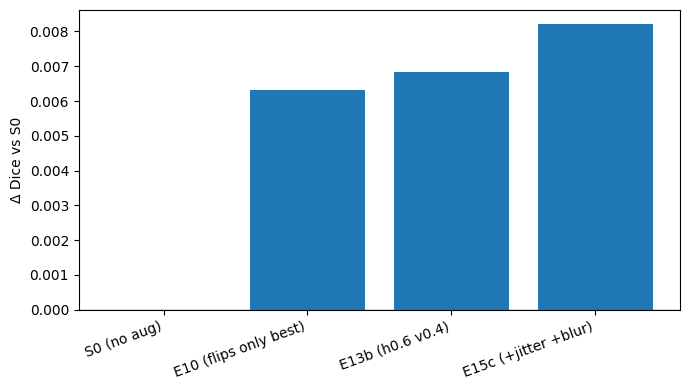

Saved: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/paper_ablation_delta_vs_S0.png
Saved: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/paper_ablation_delta_vs_S0.pdf


In [ ]:
# plots
import os, pandas as pd
import matplotlib.pyplot as plt

SAVE_ROOT = "/content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1"
results_csv = os.path.join(SAVE_ROOT, "results.csv")
df = pd.read_csv(results_csv)

pick = {
    "S0 (no aug)": "S0_scratch_noAug_seed42",
    "E10 (flips only best)": "E10_flipsOnly_p0.6_baselineResize",
    "E13b (h0.6 v0.4)": "E13b_h0.6_v0.4_baselineResize",
    "E15c (+jitter +blur)": "E15c_flips_h0.6_v0.4_plusJitterMild_plusBlurMild_baselineResize",
}

rows = []
for label, pattern in pick.items():
    r = df[df["name"].str.contains(pattern, na=False)].sort_values("best_val_dice", ascending=False).head(1)
    if len(r)==0:
        print("MISSING:", label, pattern)
        continue
    r = r.iloc[0]
    rows.append({
        "label": label,
        "name": r["name"],
        "best_val_dice": float(r["best_val_dice"]),
        "best_epoch": int(r["best_epoch"]),
        "best_val_loss": float(r["best_val_loss"]),
        "lr": float(r["lr"]),
        "weight_decay": float(r["weight_decay"]),
    })

abl = pd.DataFrame(rows)

baseline = abl.loc[abl["label"].str.contains("S0"), "best_val_dice"].iloc[0]
abl["delta_vs_S0"] = abl["best_val_dice"] - baseline
abl["pct_vs_S0"] = 100.0 * abl["delta_vs_S0"] / baseline

order = ["S0 (no aug)", "E10 (flips only best)", "E13b (h0.6 v0.4)", "E15c (+jitter +blur)"]
abl["label"] = pd.Categorical(abl["label"], categories=order, ordered=True)
abl = abl.sort_values("label")

paper_table = abl[["label","best_val_dice","delta_vs_S0","pct_vs_S0","best_epoch","best_val_loss"]].copy()
paper_table["best_val_dice"] = paper_table["best_val_dice"].map(lambda x: f"{x:.6f}")
paper_table["delta_vs_S0"] = paper_table["delta_vs_S0"].map(lambda x: f"{x:+.6f}")
paper_table["pct_vs_S0"] = paper_table["pct_vs_S0"].map(lambda x: f"{x:+.2f}%")
paper_table["best_val_loss"] = paper_table["best_val_loss"].map(lambda x: f"{x:.6f}")
print(paper_table.to_string(index=False))

plt.figure(figsize=(7,4))
plt.bar(abl["label"].astype(str), abl["delta_vs_S0"])
plt.axhline(0, linewidth=1)
plt.ylabel("Δ Dice vs S0")
plt.xticks(rotation=20, ha="right")
plt.tight_layout()

out_png = os.path.join(SAVE_ROOT, "paper_ablation_delta_vs_S0.png")
out_pdf = os.path.join(SAVE_ROOT, "paper_ablation_delta_vs_S0.pdf")
plt.savefig(out_png, dpi=200, bbox_inches="tight")
plt.savefig(out_pdf, bbox_inches="tight")
plt.show()

print("Saved:", out_png)
print("Saved:", out_pdf)


In [ ]:
# ER KØRT
from torchvision.transforms import v2
import torch
import os
import pandas as pd

def make_ds_E16(p_h=0.6, p_v=0.4, p_j=0, p_b=0):
    ops = [
        v2.ToImage(),
        v2.RandomHorizontalFlip(p=p_h),
        v2.RandomVerticalFlip(p=p_v),
        v2.RandomApply([v2.ColorJitter(brightness=0.10, contrast=0.10, saturation=0.05, hue=0.02)], p=float(p_j)),
        v2.RandomApply([v2.GaussianBlur(kernel_size=5, sigma=(0.1, 1.0))],p=float(p_b)),
        v2.ToDtype(torch.float32, scale=True),
        v2.Normalize(mean=mean, std=std),
        ]


    transform_train = v2.Compose(ops)

    trainDS = Dataset(
        train_images, train_masks,
        transforms=transform_train,
        transforms_large=None,
        use_size_dependent=False,
        size=512,
    )
    valDS = Dataset(
        val_images, val_masks,
        transforms=valTransform,
        transforms_large=None,
        use_size_dependent=False,
        size=512,
    )
    return trainDS, valDS

E16_specs = [
    ("E16a", 0.20, 0.10),
    ("E16b", 0.25, 0.05),
    ("E16c", 0.15, 0.10),
]

stage_e16_runs = []
for tag, jitter_p, blur in E16_specs:
    trainDS, valDS = make_ds_E16(p_h=0.6, p_v=0.4, p_j=jitter_p, p_b=blur_p)

    stage_e16_runs.append({
        "name": f"{tag}_flips_h0.6_v0.4_jitterP{jitter_p}_blurP{blur_p}_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42",
        "dataset_tag": f"{tag}_j{jitter_p}_b{blur_p}",
        "preset": "scratch",
        "optimizer": "adamw",
        "lr": 1e-4,
        "weight_decay": 1e-4,
        "scheduler_type": "cosine",
        "epochs": 30,
        "loss": "bce+dice",
        "seed": 42,
        "exp_type": "stage_e16_photometric_ablation",
        "trainDS": trainDS,
        "valDS": valDS,
    })

results_csv = os.path.join(SAVE_ROOT, "results.csv")
df_results = run_experiments(stage_e16_runs, results_csv_path=results_csv)

names = [c["name"] for c in stage_e16_runs]
df_e16 = df_results[df_results["name"].isin(names)].sort_values("best_val_dice", ascending=False)
df_e16[["name","best_val_dice","best_epoch","best_val_loss","run_dir"]]



RUN: E16a_flips_h0.6_v0.4_jitterP0.2_blurP0.1_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42
dataset: E16a_j0.2_b0.1
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16a_flips_h0.6_v0.4_jitterP0.2_blurP0.1_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.54it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.48it/s]


Train loss: 0.893421, Val loss: 0.788762
Train dice: 0.524, Val dice: 0.629
Train IoU : 0.432, Val IoU: 0.522
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16a_flips_h0.6_v0.4_jitterP0.2_blurP0.1_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.629)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.65it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.52it/s]


Train loss: 0.656718, Val loss: 0.570144
Train dice: 0.709, Val dice: 0.734
Train IoU : 0.602, Val IoU: 0.628
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16a_flips_h0.6_v0.4_jitterP0.2_blurP0.1_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.734)
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.78it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.38it/s]


Train loss: 0.608985, Val loss: 0.524348
Train dice: 0.722, Val dice: 0.773
Train IoU : 0.614, Val IoU: 0.673
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16a_flips_h0.6_v0.4_jitterP0.2_blurP0.1_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.773)
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.65it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.42it/s]

Train loss: 0.556964, Val loss: 0.557789
Train dice: 0.749, Val dice: 0.734
Train IoU : 0.644, Val IoU: 0.618
LR        : 9.76e-05
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.52it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.48it/s]


Train loss: 0.532720, Val loss: 0.455296
Train dice: 0.765, Val dice: 0.793
Train IoU : 0.658, Val IoU: 0.689
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16a_flips_h0.6_v0.4_jitterP0.2_blurP0.1_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.793)
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.40it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.51it/s]

Train loss: 0.484006, Val loss: 0.484284
Train dice: 0.787, Val dice: 0.759
Train IoU : 0.683, Val IoU: 0.649
LR        : 9.33e-05
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.41it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.53it/s]


Train loss: 0.466463, Val loss: 0.423356
Train dice: 0.787, Val dice: 0.808
Train IoU : 0.684, Val IoU: 0.708
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16a_flips_h0.6_v0.4_jitterP0.2_blurP0.1_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.808)
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.03it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]


Train loss: 0.433531, Val loss: 0.405628
Train dice: 0.806, Val dice: 0.818
Train IoU : 0.703, Val IoU: 0.721
LR        : 8.72e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16a_flips_h0.6_v0.4_jitterP0.2_blurP0.1_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.818)
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.68it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.50it/s]


Train loss: 0.412270, Val loss: 0.393965
Train dice: 0.814, Val dice: 0.823
Train IoU : 0.715, Val IoU: 0.728
LR        : 8.35e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16a_flips_h0.6_v0.4_jitterP0.2_blurP0.1_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.823)
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.49it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.44it/s]


Train loss: 0.403134, Val loss: 0.367003
Train dice: 0.820, Val dice: 0.845
Train IoU : 0.723, Val IoU: 0.754
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16a_flips_h0.6_v0.4_jitterP0.2_blurP0.1_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.845)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.40it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.48it/s]

Train loss: 0.380107, Val loss: 0.353662
Train dice: 0.829, Val dice: 0.841
Train IoU : 0.733, Val IoU: 0.747
LR        : 7.50e-05
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.54it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.36it/s]

Train loss: 0.360490, Val loss: 0.331871
Train dice: 0.834, Val dice: 0.833
Train IoU : 0.740, Val IoU: 0.740
LR        : 7.03e-05
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.41it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.53it/s]


Train loss: 0.358878, Val loss: 0.310947
Train dice: 0.837, Val dice: 0.856
Train IoU : 0.745, Val IoU: 0.770
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16a_flips_h0.6_v0.4_jitterP0.2_blurP0.1_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.856)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.50it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]

Train loss: 0.355539, Val loss: 0.345947
Train dice: 0.843, Val dice: 0.835
Train IoU : 0.753, Val IoU: 0.743
LR        : 6.04e-05
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.45it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.48it/s]

Train loss: 0.332538, Val loss: 0.307361
Train dice: 0.852, Val dice: 0.854
Train IoU : 0.764, Val IoU: 0.768
LR        : 5.52e-05
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.52it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.50it/s]

Train loss: 0.320841, Val loss: 0.318951
Train dice: 0.854, Val dice: 0.843
Train IoU : 0.767, Val IoU: 0.755
LR        : 5.00e-05
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.77it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]


Train loss: 0.323212, Val loss: 0.306184
Train dice: 0.854, Val dice: 0.860
Train IoU : 0.766, Val IoU: 0.775
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16a_flips_h0.6_v0.4_jitterP0.2_blurP0.1_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.860)
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.22it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.42it/s]

Train loss: 0.312756, Val loss: 0.310228
Train dice: 0.855, Val dice: 0.859
Train IoU : 0.769, Val IoU: 0.775
LR        : 3.96e-05
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.64it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.50it/s]

Train loss: 0.311674, Val loss: 0.303892
Train dice: 0.860, Val dice: 0.858
Train IoU : 0.776, Val IoU: 0.773
LR        : 3.45e-05
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.60it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.47it/s]

Train loss: 0.295081, Val loss: 0.304346
Train dice: 0.862, Val dice: 0.850
Train IoU : 0.779, Val IoU: 0.763
LR        : 2.97e-05
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.56it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.44it/s]

Train loss: 0.291240, Val loss: 0.310084
Train dice: 0.863, Val dice: 0.851
Train IoU : 0.780, Val IoU: 0.764
LR        : 2.50e-05
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  7.97it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.44it/s]

Train loss: 0.297027, Val loss: 0.296144
Train dice: 0.866, Val dice: 0.853
Train IoU : 0.783, Val IoU: 0.767
LR        : 2.06e-05
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.70it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.45it/s]

Train loss: 0.287260, Val loss: 0.300112
Train dice: 0.868, Val dice: 0.850
Train IoU : 0.787, Val IoU: 0.766
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.51it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.37it/s]


Train loss: 0.277879, Val loss: 0.281213
Train dice: 0.869, Val dice: 0.862
Train IoU : 0.787, Val IoU: 0.780
LR        : 1.28e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16a_flips_h0.6_v0.4_jitterP0.2_blurP0.1_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.862)
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.82it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.45it/s]


Train loss: 0.275346, Val loss: 0.278584
Train dice: 0.872, Val dice: 0.863
Train IoU : 0.791, Val IoU: 0.781
LR        : 9.55e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16a_flips_h0.6_v0.4_jitterP0.2_blurP0.1_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.863)
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.70it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.49it/s]

Train loss: 0.274346, Val loss: 0.278304
Train dice: 0.874, Val dice: 0.862
Train IoU : 0.795, Val IoU: 0.780
LR        : 6.70e-06
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.54it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.41it/s]

Train loss: 0.266960, Val loss: 0.279659
Train dice: 0.875, Val dice: 0.861
Train IoU : 0.795, Val IoU: 0.778
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.73it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]


Train loss: 0.270061, Val loss: 0.276340
Train dice: 0.876, Val dice: 0.864
Train IoU : 0.797, Val IoU: 0.783
LR        : 2.45e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16a_flips_h0.6_v0.4_jitterP0.2_blurP0.1_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.864)
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.58it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.48it/s]

Train loss: 0.266697, Val loss: 0.277033
Train dice: 0.877, Val dice: 0.863
Train IoU : 0.797, Val IoU: 0.781
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:22<00:00,  7.89it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.44it/s]

Train loss: 0.266103, Val loss: 0.276817
Train dice: 0.876, Val dice: 0.863
Train IoU : 0.797, Val IoU: 0.782
LR        : 2.74e-07

RUN: E16b_flips_h0.6_v0.4_jitterP0.25_blurP0.05_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42
dataset: E16b_j0.25_b0.05
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16b_flips_h0.6_v0.4_jitterP0.25_blurP0.05_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.53it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.43it/s]


Train loss: 0.865210, Val loss: 0.664152
Train dice: 0.535, Val dice: 0.718
Train IoU : 0.445, Val IoU: 0.611
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16b_flips_h0.6_v0.4_jitterP0.25_blurP0.05_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.718)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.61it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.45it/s]


Train loss: 0.678815, Val loss: 0.597011
Train dice: 0.694, Val dice: 0.728
Train IoU : 0.586, Val IoU: 0.622
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16b_flips_h0.6_v0.4_jitterP0.25_blurP0.05_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.728)
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  7.83it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.41it/s]


Train loss: 0.595248, Val loss: 0.541401
Train dice: 0.734, Val dice: 0.763
Train IoU : 0.627, Val IoU: 0.659
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16b_flips_h0.6_v0.4_jitterP0.25_blurP0.05_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.763)
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.57it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]

Train loss: 0.578085, Val loss: 0.551700
Train dice: 0.745, Val dice: 0.741
Train IoU : 0.638, Val IoU: 0.629
LR        : 9.76e-05
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.57it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.40it/s]


Train loss: 0.538667, Val loss: 0.446744
Train dice: 0.759, Val dice: 0.794
Train IoU : 0.653, Val IoU: 0.690
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16b_flips_h0.6_v0.4_jitterP0.25_blurP0.05_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.794)
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.38it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]

Train loss: 0.490688, Val loss: 0.470612
Train dice: 0.781, Val dice: 0.784
Train IoU : 0.677, Val IoU: 0.675
LR        : 9.33e-05
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.33it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.48it/s]


Train loss: 0.446691, Val loss: 0.383468
Train dice: 0.799, Val dice: 0.826
Train IoU : 0.697, Val IoU: 0.731
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16b_flips_h0.6_v0.4_jitterP0.25_blurP0.05_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.826)
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  7.86it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.45it/s]

Train loss: 0.428750, Val loss: 0.398672
Train dice: 0.810, Val dice: 0.813
Train IoU : 0.710, Val IoU: 0.718
LR        : 8.72e-05
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.55it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.44it/s]


Train loss: 0.398470, Val loss: 0.382468
Train dice: 0.820, Val dice: 0.827
Train IoU : 0.724, Val IoU: 0.735
LR        : 8.35e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16b_flips_h0.6_v0.4_jitterP0.25_blurP0.05_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.827)
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.44it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.50it/s]


Train loss: 0.395715, Val loss: 0.344577
Train dice: 0.826, Val dice: 0.845
Train IoU : 0.733, Val IoU: 0.755
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16b_flips_h0.6_v0.4_jitterP0.25_blurP0.05_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.845)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.30it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.38it/s]


Train loss: 0.374504, Val loss: 0.338140
Train dice: 0.830, Val dice: 0.849
Train IoU : 0.736, Val IoU: 0.760
LR        : 7.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16b_flips_h0.6_v0.4_jitterP0.25_blurP0.05_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.849)
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.44it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.47it/s]

Train loss: 0.361482, Val loss: 0.335725
Train dice: 0.830, Val dice: 0.834
Train IoU : 0.735, Val IoU: 0.742
LR        : 7.03e-05
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.38it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.40it/s]


Train loss: 0.358394, Val loss: 0.308547
Train dice: 0.839, Val dice: 0.859
Train IoU : 0.748, Val IoU: 0.776
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16b_flips_h0.6_v0.4_jitterP0.25_blurP0.05_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.859)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.32it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.47it/s]

Train loss: 0.356152, Val loss: 0.313109
Train dice: 0.842, Val dice: 0.854
Train IoU : 0.752, Val IoU: 0.768
LR        : 6.04e-05
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.47it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.50it/s]

Train loss: 0.332690, Val loss: 0.304355
Train dice: 0.851, Val dice: 0.858
Train IoU : 0.764, Val IoU: 0.773
LR        : 5.52e-05
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.50it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.41it/s]

Train loss: 0.320690, Val loss: 0.327109
Train dice: 0.855, Val dice: 0.840
Train IoU : 0.769, Val IoU: 0.752
LR        : 5.00e-05
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.57it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.45it/s]

Train loss: 0.319957, Val loss: 0.301644
Train dice: 0.853, Val dice: 0.858
Train IoU : 0.765, Val IoU: 0.771
LR        : 4.48e-05
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.24it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]

Train loss: 0.310922, Val loss: 0.319953
Train dice: 0.856, Val dice: 0.853
Train IoU : 0.770, Val IoU: 0.768
LR        : 3.96e-05
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.59it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.44it/s]

Train loss: 0.311773, Val loss: 0.301567
Train dice: 0.860, Val dice: 0.856
Train IoU : 0.776, Val IoU: 0.772
LR        : 3.45e-05
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.51it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.42it/s]

Train loss: 0.297313, Val loss: 0.300000
Train dice: 0.861, Val dice: 0.849
Train IoU : 0.777, Val IoU: 0.762
LR        : 2.97e-05
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.42it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.40it/s]

Train loss: 0.292757, Val loss: 0.311784
Train dice: 0.864, Val dice: 0.850
Train IoU : 0.781, Val IoU: 0.763
LR        : 2.50e-05
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  7.89it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.44it/s]

Train loss: 0.298060, Val loss: 0.294967
Train dice: 0.866, Val dice: 0.853
Train IoU : 0.784, Val IoU: 0.768
LR        : 2.06e-05
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.58it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.45it/s]

Train loss: 0.287895, Val loss: 0.304639
Train dice: 0.867, Val dice: 0.846
Train IoU : 0.786, Val IoU: 0.760
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.33it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.31it/s]


Train loss: 0.277095, Val loss: 0.278504
Train dice: 0.868, Val dice: 0.863
Train IoU : 0.786, Val IoU: 0.781
LR        : 1.28e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16b_flips_h0.6_v0.4_jitterP0.25_blurP0.05_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.863)
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.62it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]

Train loss: 0.276017, Val loss: 0.276437
Train dice: 0.871, Val dice: 0.862
Train IoU : 0.791, Val IoU: 0.780
LR        : 9.55e-06
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.67it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]

Train loss: 0.276686, Val loss: 0.279467
Train dice: 0.872, Val dice: 0.859
Train IoU : 0.793, Val IoU: 0.776
LR        : 6.70e-06
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.60it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.46it/s]

Train loss: 0.269229, Val loss: 0.277454
Train dice: 0.875, Val dice: 0.861
Train IoU : 0.796, Val IoU: 0.778
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.47it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.37it/s]

Train loss: 0.269273, Val loss: 0.274991
Train dice: 0.875, Val dice: 0.863
Train IoU : 0.797, Val IoU: 0.781
LR        : 2.45e-06
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.52it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.45it/s]

Train loss: 0.263372, Val loss: 0.276343
Train dice: 0.876, Val dice: 0.861
Train IoU : 0.798, Val IoU: 0.779
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.58it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.38it/s]

Train loss: 0.266856, Val loss: 0.275741
Train dice: 0.875, Val dice: 0.862
Train IoU : 0.796, Val IoU: 0.780
LR        : 2.74e-07

RUN: E16c_flips_h0.6_v0.4_jitterP0.15_blurP0.1_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42
dataset: E16c_j0.15_b0.1
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16c_flips_h0.6_v0.4_jitterP0.15_blurP0.1_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:



100%|██████████| 180/180 [00:22<00:00,  7.92it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]


Train loss: 0.896147, Val loss: 0.836574
Train dice: 0.516, Val dice: 0.624
Train IoU : 0.424, Val IoU: 0.508
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16c_flips_h0.6_v0.4_jitterP0.15_blurP0.1_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.624)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  7.90it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.47it/s]


Train loss: 0.662041, Val loss: 0.566984
Train dice: 0.703, Val dice: 0.735
Train IoU : 0.595, Val IoU: 0.628
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16c_flips_h0.6_v0.4_jitterP0.15_blurP0.1_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.735)
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  7.87it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.52it/s]


Train loss: 0.589833, Val loss: 0.523690
Train dice: 0.729, Val dice: 0.774
Train IoU : 0.622, Val IoU: 0.674
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16c_flips_h0.6_v0.4_jitterP0.15_blurP0.1_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.774)
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  7.88it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.41it/s]

Train loss: 0.572212, Val loss: 0.631861
Train dice: 0.748, Val dice: 0.748
Train IoU : 0.641, Val IoU: 0.637
LR        : 9.76e-05
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.79it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.41it/s]


Train loss: 0.539053, Val loss: 0.461070
Train dice: 0.764, Val dice: 0.787
Train IoU : 0.658, Val IoU: 0.684
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16c_flips_h0.6_v0.4_jitterP0.15_blurP0.1_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.787)
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.71it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.34it/s]

Train loss: 0.509752, Val loss: 0.473581
Train dice: 0.770, Val dice: 0.785
Train IoU : 0.664, Val IoU: 0.681
LR        : 9.33e-05
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.53it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.22it/s]


Train loss: 0.483614, Val loss: 0.428672
Train dice: 0.784, Val dice: 0.803
Train IoU : 0.680, Val IoU: 0.700
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16c_flips_h0.6_v0.4_jitterP0.15_blurP0.1_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.803)
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.07it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.41it/s]

Train loss: 0.472059, Val loss: 0.436915
Train dice: 0.795, Val dice: 0.799
Train IoU : 0.692, Val IoU: 0.698
LR        : 8.72e-05
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  7.84it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.42it/s]


Train loss: 0.456576, Val loss: 0.419893
Train dice: 0.800, Val dice: 0.813
Train IoU : 0.699, Val IoU: 0.711
LR        : 8.35e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16c_flips_h0.6_v0.4_jitterP0.15_blurP0.1_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.813)
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.59it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.40it/s]


Train loss: 0.441186, Val loss: 0.404640
Train dice: 0.807, Val dice: 0.818
Train IoU : 0.707, Val IoU: 0.721
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16c_flips_h0.6_v0.4_jitterP0.15_blurP0.1_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.818)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.61it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]

Train loss: 0.416025, Val loss: 0.401831
Train dice: 0.815, Val dice: 0.817
Train IoU : 0.714, Val IoU: 0.720
LR        : 7.50e-05
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.66it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]


Train loss: 0.393598, Val loss: 0.342075
Train dice: 0.822, Val dice: 0.834
Train IoU : 0.726, Val IoU: 0.741
LR        : 7.03e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16c_flips_h0.6_v0.4_jitterP0.15_blurP0.1_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.834)
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.61it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.39it/s]


Train loss: 0.378512, Val loss: 0.329972
Train dice: 0.832, Val dice: 0.851
Train IoU : 0.739, Val IoU: 0.762
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16c_flips_h0.6_v0.4_jitterP0.15_blurP0.1_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.851)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.58it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]

Train loss: 0.367269, Val loss: 0.333543
Train dice: 0.838, Val dice: 0.841
Train IoU : 0.747, Val IoU: 0.751
LR        : 6.04e-05
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.74it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.44it/s]


Train loss: 0.348526, Val loss: 0.311740
Train dice: 0.846, Val dice: 0.855
Train IoU : 0.756, Val IoU: 0.768
LR        : 5.52e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16c_flips_h0.6_v0.4_jitterP0.15_blurP0.1_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.855)
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.73it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.42it/s]

Train loss: 0.330254, Val loss: 0.313270
Train dice: 0.851, Val dice: 0.852
Train IoU : 0.763, Val IoU: 0.766
LR        : 5.00e-05
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.00it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]


Train loss: 0.329661, Val loss: 0.302385
Train dice: 0.851, Val dice: 0.863
Train IoU : 0.763, Val IoU: 0.777
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16c_flips_h0.6_v0.4_jitterP0.15_blurP0.1_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.863)
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.46it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]

Train loss: 0.319705, Val loss: 0.313671
Train dice: 0.854, Val dice: 0.855
Train IoU : 0.768, Val IoU: 0.770
LR        : 3.96e-05
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  7.90it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.50it/s]

Train loss: 0.315164, Val loss: 0.299754
Train dice: 0.858, Val dice: 0.861
Train IoU : 0.774, Val IoU: 0.776
LR        : 3.45e-05
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.81it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.45it/s]

Train loss: 0.301382, Val loss: 0.298434
Train dice: 0.859, Val dice: 0.851
Train IoU : 0.774, Val IoU: 0.766
LR        : 2.97e-05
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.74it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.41it/s]

Train loss: 0.295207, Val loss: 0.317850
Train dice: 0.862, Val dice: 0.848
Train IoU : 0.778, Val IoU: 0.760
LR        : 2.50e-05
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.17it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]

Train loss: 0.303934, Val loss: 0.293101
Train dice: 0.863, Val dice: 0.854
Train IoU : 0.779, Val IoU: 0.769
LR        : 2.06e-05
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.75it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.49it/s]

Train loss: 0.289692, Val loss: 0.295904
Train dice: 0.868, Val dice: 0.852
Train IoU : 0.786, Val IoU: 0.768
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.71it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.50it/s]

Train loss: 0.281720, Val loss: 0.279630
Train dice: 0.868, Val dice: 0.861
Train IoU : 0.786, Val IoU: 0.778
LR        : 1.28e-05
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.06it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.39it/s]

Train loss: 0.276609, Val loss: 0.279972
Train dice: 0.873, Val dice: 0.862
Train IoU : 0.792, Val IoU: 0.780
LR        : 9.55e-06
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:



100%|██████████| 180/180 [00:22<00:00,  7.89it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.30it/s]

Train loss: 0.276987, Val loss: 0.277534
Train dice: 0.873, Val dice: 0.861
Train IoU : 0.793, Val IoU: 0.780
LR        : 6.70e-06
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.59it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.44it/s]

Train loss: 0.271765, Val loss: 0.277419
Train dice: 0.874, Val dice: 0.861
Train IoU : 0.795, Val IoU: 0.780
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.82it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.40it/s]


Train loss: 0.272716, Val loss: 0.274978
Train dice: 0.875, Val dice: 0.863
Train IoU : 0.796, Val IoU: 0.782
LR        : 2.45e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E16c_flips_h0.6_v0.4_jitterP0.15_blurP0.1_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed42/best.pth (val dice=0.863)
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.69it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.50it/s]

Train loss: 0.268069, Val loss: 0.276760
Train dice: 0.876, Val dice: 0.862
Train IoU : 0.797, Val IoU: 0.780
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.00it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.42it/s]

Train loss: 0.265669, Val loss: 0.276318
Train dice: 0.877, Val dice: 0.862
Train IoU : 0.798, Val IoU: 0.780
LR        : 2.74e-07


,name,best_val_dice,best_epoch,best_val_loss,run_dir
60,E16a_flips_h0.6_v0.4_jitterP0.2_blurP0.1_basel...,0.864333,28,0.276340,/content/drive/MyDrive/Colab Notebooks/isic201...
62,E16c_flips_h0.6_v0.4_jitterP0.15_blurP0.1_base...,0.863380,28,0.274978,/content/drive/MyDrive/Colab Notebooks/isic201...
61,E16b_flips_h0.6_v0.4_jitterP0.25_blurP0.05_bas...,0.863261,24,0.278504,/content/drive/MyDrive/Colab Notebooks/isic201...


                label best_val_dice delta_vs_S0 pct_vs_S0  best_epoch best_val_loss
          S0 (no aug)      0.859305   +0.000000    +0.00%          28      0.285553
     E13b (h0.6 v0.4)      0.866150   +0.006844    +0.80%          24      0.276735
 E15c (+jitter +blur)      0.867512   +0.008207    +0.96%          25      0.268325
  E16a (j=0.2, b=0.1)      0.864333   +0.005028    +0.59%          28      0.276340
 E16c (j=0.15, b=0.1)      0.863380   +0.004074    +0.47%          28      0.274978
E16b (j=0.25, b=0.05)      0.863261   +0.003956    +0.46%          24      0.278504


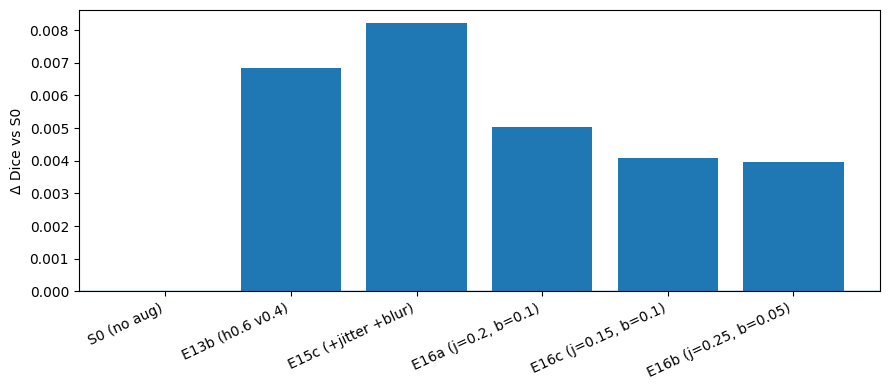

Saved: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/paper_E16_delta_vs_S0.png
Saved: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/paper_E16_delta_vs_S0.pdf


In [ ]:
# plot
import os, pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv(results_csv)

E16_specs = [
    ("E16a", 0.20, 0.10),
    ("E16b", 0.25, 0.05),
    ("E16c", 0.15, 0.10),
]


# baseline + reference + nye E16
pick = {
    "S0 (no aug)": "S0_scratch_noAug_seed42",
    "E13b (h0.6 v0.4)": "E13b_h0.6_v0.4_baselineResize",
    "E15c (+jitter +blur)": "E15c_flips_h0.6_v0.4_plusJitterMild_plusBlurMild_baselineResize",
}

# tilføj E16 automatisk
for tag, jitter_p, blur_p in E16_specs:
    pick[f"{tag} (j={jitter_p}, b={blur_p})"] = f"{tag}_flips_h0.6_v0.4_jitterP{jitter_p}_blurP{blur_p}_baselineResize"

rows = []
for label, pattern in pick.items():
    r = df[df["name"].str.contains(pattern, na=False)].sort_values("best_val_dice", ascending=False).head(1)
    if len(r)==0:
        print("MISSING:", label)
        continue
    r = r.iloc[0]
    rows.append({
        "label": label,
        "best_val_dice": float(r["best_val_dice"]),
        "best_epoch": int(r["best_epoch"]),
        "best_val_loss": float(r["best_val_loss"]),
        "name": r["name"],
    })

abl = pd.DataFrame(rows)

baseline = abl.loc[abl["label"].str.contains("S0"), "best_val_dice"].iloc[0]
abl["delta_vs_S0"] = abl["best_val_dice"] - baseline
abl["pct_vs_S0"] = 100.0 * abl["delta_vs_S0"] / baseline

# pæn sortering: først S0/E13b/E15c, derefter E16 efter dice
front = ["S0 (no aug)", "E13b (h0.6 v0.4)", "E15c (+jitter +blur)"]
abl_front = abl[abl["label"].isin(front)].copy()
abl_rest = abl[~abl["label"].isin(front)].sort_values("best_val_dice", ascending=False).copy()
abl = pd.concat([abl_front, abl_rest], ignore_index=True)

# print ren tabel
paper_table = abl[["label","best_val_dice","delta_vs_S0","pct_vs_S0","best_epoch","best_val_loss"]].copy()
paper_table["best_val_dice"] = paper_table["best_val_dice"].map(lambda x: f"{x:.6f}")
paper_table["delta_vs_S0"] = paper_table["delta_vs_S0"].map(lambda x: f"{x:+.6f}")
paper_table["pct_vs_S0"] = paper_table["pct_vs_S0"].map(lambda x: f"{x:+.2f}%")
paper_table["best_val_loss"] = paper_table["best_val_loss"].map(lambda x: f"{x:.6f}")
print(paper_table.to_string(index=False))

# plot delta vs S0
plt.figure(figsize=(9,4))
plt.bar(abl["label"], abl["delta_vs_S0"])
plt.axhline(0, linewidth=1)
plt.ylabel("Δ Dice vs S0")
plt.xticks(rotation=25, ha="right")
plt.tight_layout()

out_png = os.path.join(SAVE_ROOT, "paper_E16_delta_vs_S0.png")
out_pdf = os.path.join(SAVE_ROOT, "paper_E16_delta_vs_S0.pdf")
plt.savefig(out_png, dpi=200, bbox_inches="tight")
plt.savefig(out_pdf, bbox_inches="tight")
plt.show()

print("Saved:", out_png)
print("Saved:", out_pdf)


In [ ]:
# tables
import os, re
import pandas as pd
import numpy as np

SAVE_ROOT = "/content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1"
results_csv = os.path.join(SAVE_ROOT, "results.csv")
df = pd.read_csv(results_csv)

# --- find baseline S0 (seed42) ---
baseline_mask = df["name"].str.contains(r"S0_scratch_noAug_seed42", na=False)
if baseline_mask.sum() != 1:
    print("WARN: baseline S0 ikke fundet entydigt:", baseline_mask.sum())
S0 = df[baseline_mask].iloc[0]
S0_dice = float(S0["best_val_dice"])

# --- hold kun E-serien + baseline ---
# (til paper vil vi typisk kun vise de mest relevante)
keep_patterns = [
    r"S0_scratch_noAug_seed42",
    r"^E2_", r"^E3_", r"^E4_", r"^E5_",
    r"^E10_", r"^E11_", r"^E12_", r"^E13", r"^E14", r"^E15", r"^E16",
]
keep_re = re.compile("|".join(keep_patterns))

df_keep = df[df["name"].astype(str).apply(lambda s: bool(keep_re.search(s)))].copy()

# --- smid støj væk (tiebreak/loss_screening/sgd osv) ---
bad_terms = ["tiebreak", "loss_screening", "stage_", "_sgd_"]
df_keep = df_keep[~df_keep["name"].str.contains("|".join(bad_terms), case=False, na=False)].copy()

# --- lav "tag" kolonne til læsbar ablation ---
def nice_tag(name: str) -> str:
    # tag = før "_baselineResize" hvis findes, ellers name
    if "_baselineResize" in name:
        return name.split("_baselineResize")[0]
    return name

df_keep["tag"] = df_keep["name"].astype(str).apply(nice_tag)
df_keep["delta_vs_S0"] = df_keep["best_val_dice"].astype(float) - S0_dice

# vælg kolonner til paper
paper_cols = ["tag","best_val_dice","delta_vs_S0","best_epoch","best_val_loss","lr","weight_decay","scheduler_type","run_dir"]
df_paper = df_keep[paper_cols].sort_values(["best_val_dice"], ascending=False)

print(f"S0 baseline best_val_dice = {S0_dice:.6f}\n")
df_paper.reset_index(drop=True).head(30)


S0 baseline best_val_dice = 0.859305



,tag,best_val_dice,delta_vs_S0,best_epoch,best_val_loss,lr,weight_decay,scheduler_type,run_dir
0,E15c_flips_h0.6_v0.4_plusJitterMild_plusBlurMild,0.867512,0.008207,25,0.268325,0.0001,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...
1,E13b_h0.6_v0.4,0.866150,0.006844,24,0.276735,0.0001,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...
2,E10_flipsOnly_p0.6,0.865630,0.006324,25,0.271274,0.0001,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...
3,E13a_h0.6_v0.3,0.865603,0.006298,17,0.298425,0.0001,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...
4,E4_flips+colorJitter+blur_mild_adamw_lr1e-4_wd...,0.865295,0.005990,28,0.274804,0.0001,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...
5,E3_flips+colorJitter_mild_adamw_lr1e-4_wd1e-4_...,0.864991,0.005685,25,0.274733,0.0001,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...
6,E15b_flips_h0.6_v0.4_plusBlurMild,0.864861,0.005556,28,0.275086,0.0001,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...
7,E12_vFlipOnly_p0.6,0.864767,0.005462,25,0.275147,0.0001,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...
8,E14a_h0.6_v0.2,0.864550,0.005245,24,0.287421,0.0001,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...
9,E16a_flips_h0.6_v0.4_jitterP0.2_blurP0.1,0.864333,0.005028,28,0.276340,0.0001,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...


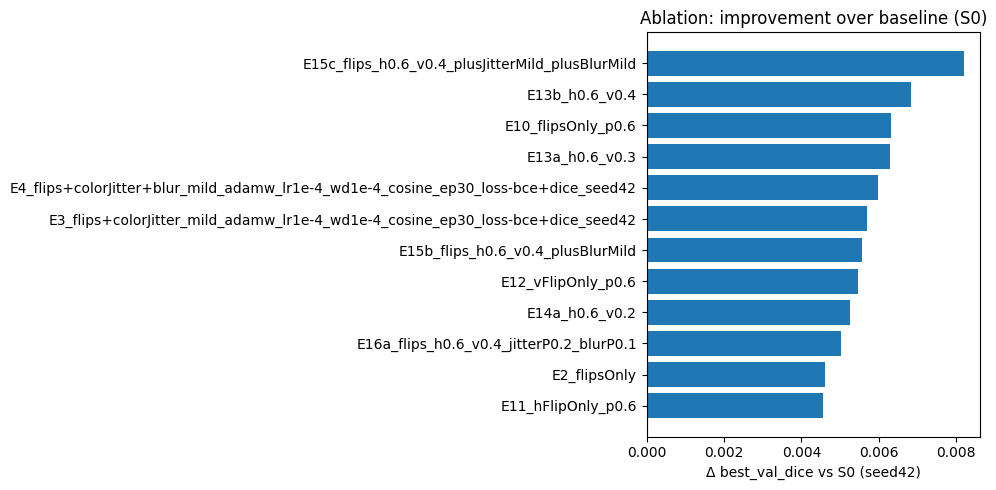

In [ ]:
# tables
import matplotlib.pyplot as plt
import numpy as np

# Brug df_paper fra cellen ovenfor
plot_df = df_paper.copy()

# behold kun top N (ellers bliver det uoverskueligt)
N = 12
plot_df = plot_df.head(N).sort_values("delta_vs_S0", ascending=True)

y = np.arange(len(plot_df))
x = plot_df["delta_vs_S0"].values

plt.figure(figsize=(10, 5))
plt.barh(y, x)
plt.yticks(y, plot_df["tag"])
plt.axvline(0.0)
plt.xlabel("Δ best_val_dice vs S0 (seed42)")
plt.title("Ablation: improvement over baseline (S0)")
plt.tight_layout()
plt.show()


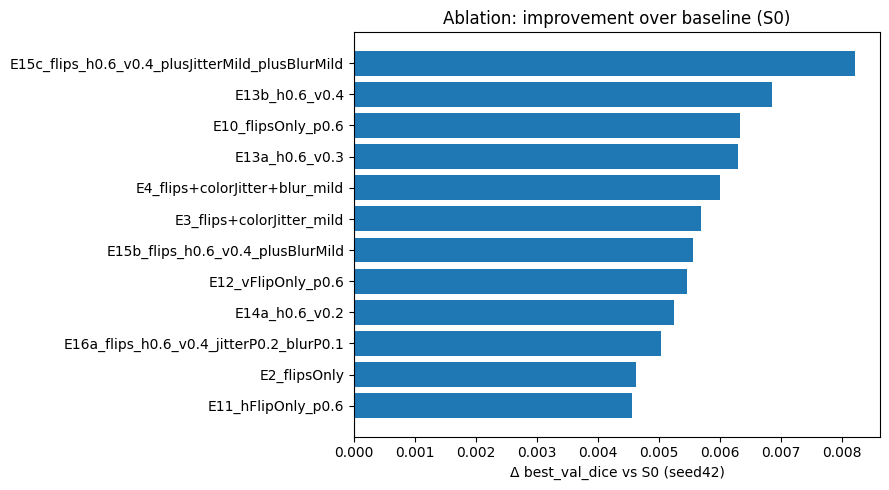

S0 best_val_dice = 0.8593053566084967


In [ ]:
# tables
import os, re
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

SAVE_ROOT = "/content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1"
results_csv = os.path.join(SAVE_ROOT, "results.csv")
df = pd.read_csv(results_csv)

# --- find S0 baseline ---
S0_row = df[df["name"].str.contains(r"S0_scratch_noAug_seed42", na=False)].iloc[0]
S0_dice = float(S0_row["best_val_dice"])

# --- robust kort label ---
def short_tag(name: str) -> str:
    # klip i prioriteret rækkefølge
    for sep in ["_baselineResize", "_adamw", "_adam", "_seed"]:
        if sep in name:
            return name.split(sep)[0]
    return name

df["tag"] = df["name"].astype(str).apply(short_tag)

# --- filter kun relevante E-runs + S0 (ingen tiebreak/loss/sgd) ---
keep_re = re.compile(r"(S0_scratch_noAug_seed42|^E2_|^E3_|^E4_|^E5_|^E10_|^E11_|^E12_|^E13|^E14|^E15|^E16)")
dfp = df[df["name"].astype(str).apply(lambda s: bool(keep_re.search(s)))].copy()

bad_terms = ["tiebreak", "loss_screening", "_sgd_", "stage_"]
dfp = dfp[~dfp["name"].str.contains("|".join(bad_terms), case=False, na=False)].copy()

dfp["best_val_dice"] = pd.to_numeric(dfp["best_val_dice"], errors="coerce")
dfp["delta_vs_S0"] = dfp["best_val_dice"] - S0_dice

# --- vælg top N efter improvement (så plottet er fokuseret) ---
N = 12
plot_df = dfp.sort_values("delta_vs_S0", ascending=False).head(N).sort_values("delta_vs_S0", ascending=True)

plt.figure(figsize=(9, 5))
plt.barh(np.arange(len(plot_df)), plot_df["delta_vs_S0"].values)
plt.yticks(np.arange(len(plot_df)), plot_df["tag"])
plt.axvline(0.0)
plt.xlabel("Δ best_val_dice vs S0 (seed42)")
plt.title("Ablation: improvement over baseline (S0)")
plt.tight_layout()

# GEM TIL PAPER (valgfrit)
# out = os.path.join(SAVE_ROOT, "paper_delta_vs_S0.pdf")
# plt.savefig(out, bbox_inches="tight")
plt.show()

print("S0 best_val_dice =", S0_dice)


In [ ]:
# ER KØRT
from torchvision.transforms import v2
import torch
import os
import pandas as pd
import numpy as np

# ---- dataset builders ----
def make_ds_E13b(p_h=0.6, p_v=0.4):
    transform_train = v2.Compose([
        v2.ToImage(),
        v2.RandomHorizontalFlip(p=float(p_h)),
        v2.RandomVerticalFlip(p=float(p_v)),
        v2.ToDtype(torch.float32, scale=True),
        v2.Normalize(mean=mean, std=std),
    ])

    trainDS = Dataset(train_images, train_masks, transforms=transform_train,
                      transforms_large=None, use_size_dependent=False, size=512)
    valDS   = Dataset(val_images, val_masks, transforms=valTransform,
                      transforms_large=None, use_size_dependent=False, size=512)
    return trainDS, valDS


def make_ds_E15c(p_h=0.6, p_v=0.4, p_jitter=0.25, p_blur=0.10):
    transform_train = v2.Compose([
        v2.ToImage(),
        v2.RandomHorizontalFlip(p=float(p_h)),
        v2.RandomVerticalFlip(p=float(p_v)),
        v2.RandomApply([v2.ColorJitter(brightness=0.10, contrast=0.10, saturation=0.05, hue=0.02)],
                       p=float(p_jitter)),
        v2.RandomApply([v2.GaussianBlur(kernel_size=5, sigma=(0.1, 1.0))],
                       p=float(p_blur)),
        v2.ToDtype(torch.float32, scale=True),
        v2.Normalize(mean=mean, std=std),
    ])

    trainDS = Dataset(train_images, train_masks, transforms=transform_train,
                      transforms_large=None, use_size_dependent=False, size=512)
    valDS   = Dataset(val_images, val_masks, transforms=valTransform,
                      transforms_large=None, use_size_dependent=False, size=512)
    return trainDS, valDS


# ---- seeds (vælg 3-5 for sanity; her 5 stk) ----
seed_list = [41, 43, 44]

# ---- build planned runs ----
planned = []

# E13b
for s in seed_list:
    trainDS, valDS = make_ds_E13b(p_h=0.6, p_v=0.4)
    planned.append({
        "name": f"E13b_seed{s}_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice",
        "dataset_tag": "E13b_h0.6_v0.4",
        "preset": "scratch",
        "optimizer": "adamw",
        "lr": 1e-4,
        "weight_decay": 1e-4,
        "scheduler_type": "cosine",
        "epochs": 30,
        "loss": "bce+dice",
        "seed": s,
        "exp_type": "seed_sanity_E13b",
        "trainDS": trainDS,
        "valDS": valDS,
    })

# E15c (winner)
for s in seed_list:
    trainDS, valDS = make_ds_E15c(p_h=0.6, p_v=0.4, p_jitter=0.25, p_blur=0.10)
    planned.append({
        "name": f"E15c_seed{s}_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice",
        "dataset_tag": "E15c_h0.6_v0.4_j0.25_b0.10",
        "preset": "scratch",
        "optimizer": "adamw",
        "lr": 1e-4,
        "weight_decay": 1e-4,
        "scheduler_type": "cosine",
        "epochs": 30,
        "loss": "bce+dice",
        "seed": s,
        "exp_type": "seed_sanity_E15c",
        "trainDS": trainDS,
        "valDS": valDS,
    })

results_csv = os.path.join(SAVE_ROOT, "results.csv")
df_results = run_experiments(planned, results_csv_path=results_csv)

# ---- collect summary table ----
names = [c["name"] for c in planned]
df_sanity = df_results[df_results["name"].isin(names)].copy()

cols = ["exp_type","seed","best_val_dice","best_epoch","best_val_loss","run_dir","name"]
df_sanity = df_sanity[cols].sort_values(["exp_type","best_val_dice"], ascending=[True, False])
display(df_sanity)

# mean±std per setup
agg = (df_sanity.groupby("exp_type")["best_val_dice"]
       .agg(["mean","std","min","max","count"])
       .reset_index())
display(agg)



RUN: E13b_seed41_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice
dataset: E13b_h0.6_v0.4
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed41_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.61it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.47it/s]


Train loss: 0.952183, Val loss: 0.738245
Train dice: 0.471, Val dice: 0.700
Train IoU : 0.384, Val IoU: 0.592
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed41_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.700)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.69it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]


Train loss: 0.687132, Val loss: 0.593663
Train dice: 0.700, Val dice: 0.733
Train IoU : 0.591, Val IoU: 0.625
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed41_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.733)
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.61it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.55it/s]

Train loss: 0.625610, Val loss: 0.638282
Train dice: 0.718, Val dice: 0.708
Train IoU : 0.607, Val IoU: 0.590
LR        : 9.89e-05
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.64it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.52it/s]


Train loss: 0.573834, Val loss: 0.494026
Train dice: 0.742, Val dice: 0.780
Train IoU : 0.632, Val IoU: 0.674
LR        : 9.76e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed41_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.780)
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.11it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.22it/s]

Train loss: 0.547000, Val loss: 0.521470
Train dice: 0.753, Val dice: 0.758
Train IoU : 0.642, Val IoU: 0.644
LR        : 9.57e-05
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.78it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]


Train loss: 0.531692, Val loss: 0.471897
Train dice: 0.763, Val dice: 0.783
Train IoU : 0.654, Val IoU: 0.677
LR        : 9.33e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed41_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.783)
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.76it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.45it/s]


Train loss: 0.493318, Val loss: 0.453671
Train dice: 0.781, Val dice: 0.789
Train IoU : 0.676, Val IoU: 0.682
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed41_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.789)
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.52it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.51it/s]

Train loss: 0.473183, Val loss: 0.482176
Train dice: 0.791, Val dice: 0.756
Train IoU : 0.688, Val IoU: 0.644
LR        : 8.72e-05
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.32it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.51it/s]

Train loss: 0.483867, Val loss: 0.474533
Train dice: 0.785, Val dice: 0.763
Train IoU : 0.682, Val IoU: 0.654
LR        : 8.35e-05
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.80it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.44it/s]


Train loss: 0.467280, Val loss: 0.432456
Train dice: 0.796, Val dice: 0.794
Train IoU : 0.693, Val IoU: 0.688
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed41_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.794)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.76it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.53it/s]


Train loss: 0.437833, Val loss: 0.404764
Train dice: 0.805, Val dice: 0.823
Train IoU : 0.704, Val IoU: 0.727
LR        : 7.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed41_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.823)
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.34it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.44it/s]


Train loss: 0.409079, Val loss: 0.381253
Train dice: 0.825, Val dice: 0.828
Train IoU : 0.729, Val IoU: 0.736
LR        : 7.03e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed41_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.828)
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.76it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]


Train loss: 0.405900, Val loss: 0.349332
Train dice: 0.823, Val dice: 0.837
Train IoU : 0.726, Val IoU: 0.744
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed41_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.837)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.32it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.51it/s]

Train loss: 0.383681, Val loss: 0.343950
Train dice: 0.830, Val dice: 0.834
Train IoU : 0.737, Val IoU: 0.741
LR        : 6.04e-05
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.49it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]


Train loss: 0.378234, Val loss: 0.337324
Train dice: 0.834, Val dice: 0.842
Train IoU : 0.740, Val IoU: 0.751
LR        : 5.52e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed41_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.842)
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.09it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]


Train loss: 0.370574, Val loss: 0.325434
Train dice: 0.838, Val dice: 0.852
Train IoU : 0.745, Val IoU: 0.764
LR        : 5.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed41_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.852)
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.31it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]

Train loss: 0.344466, Val loss: 0.343926
Train dice: 0.847, Val dice: 0.836
Train IoU : 0.757, Val IoU: 0.746
LR        : 4.48e-05
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.65it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.49it/s]

Train loss: 0.347941, Val loss: 0.324819
Train dice: 0.844, Val dice: 0.841
Train IoU : 0.754, Val IoU: 0.752
LR        : 3.96e-05
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.74it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.47it/s]


Train loss: 0.333677, Val loss: 0.307030
Train dice: 0.848, Val dice: 0.855
Train IoU : 0.760, Val IoU: 0.771
LR        : 3.45e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed41_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.855)
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.45it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.51it/s]

Train loss: 0.320524, Val loss: 0.303292
Train dice: 0.857, Val dice: 0.851
Train IoU : 0.772, Val IoU: 0.765
LR        : 2.97e-05
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.51it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.45it/s]


Train loss: 0.313408, Val loss: 0.293870
Train dice: 0.859, Val dice: 0.859
Train IoU : 0.775, Val IoU: 0.775
LR        : 2.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed41_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.859)
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.35it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.51it/s]

Train loss: 0.307721, Val loss: 0.322056
Train dice: 0.860, Val dice: 0.841
Train IoU : 0.775, Val IoU: 0.753
LR        : 2.06e-05
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.57it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.45it/s]

Train loss: 0.299333, Val loss: 0.305644
Train dice: 0.865, Val dice: 0.854
Train IoU : 0.781, Val IoU: 0.770
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.73it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]


Train loss: 0.298040, Val loss: 0.287209
Train dice: 0.863, Val dice: 0.862
Train IoU : 0.780, Val IoU: 0.780
LR        : 1.28e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed41_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.862)
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.75it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.53it/s]

Train loss: 0.289189, Val loss: 0.291988
Train dice: 0.869, Val dice: 0.856
Train IoU : 0.788, Val IoU: 0.772
LR        : 9.55e-06
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.37it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.37it/s]


Train loss: 0.286636, Val loss: 0.283218
Train dice: 0.869, Val dice: 0.864
Train IoU : 0.788, Val IoU: 0.782
LR        : 6.70e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed41_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.864)
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.52it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.47it/s]

Train loss: 0.284979, Val loss: 0.283662
Train dice: 0.870, Val dice: 0.863
Train IoU : 0.789, Val IoU: 0.781
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.55it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.44it/s]

Train loss: 0.282810, Val loss: 0.285928
Train dice: 0.872, Val dice: 0.860
Train IoU : 0.791, Val IoU: 0.778
LR        : 2.45e-06
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.78it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]

Train loss: 0.282748, Val loss: 0.284264
Train dice: 0.872, Val dice: 0.861
Train IoU : 0.792, Val IoU: 0.779
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.54it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]

Train loss: 0.277835, Val loss: 0.284382
Train dice: 0.873, Val dice: 0.861
Train IoU : 0.793, Val IoU: 0.779
LR        : 2.74e-07

RUN: E13b_seed43_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice
dataset: E13b_h0.6_v0.4
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed43_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.37it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.48it/s]


Train loss: 0.863886, Val loss: 0.660790
Train dice: 0.512, Val dice: 0.719
Train IoU : 0.427, Val IoU: 0.618
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed43_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.719)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.46it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.37it/s]


Train loss: 0.647067, Val loss: 0.618324
Train dice: 0.712, Val dice: 0.738
Train IoU : 0.602, Val IoU: 0.638
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed43_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.738)
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.26it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.29it/s]


Train loss: 0.620606, Val loss: 0.537550
Train dice: 0.722, Val dice: 0.758
Train IoU : 0.614, Val IoU: 0.650
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed43_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.758)
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.77it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.44it/s]


Train loss: 0.538803, Val loss: 0.498177
Train dice: 0.763, Val dice: 0.769
Train IoU : 0.656, Val IoU: 0.658
LR        : 9.76e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed43_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.769)
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.48it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]

Train loss: 0.523647, Val loss: 0.508349
Train dice: 0.766, Val dice: 0.765
Train IoU : 0.658, Val IoU: 0.652
LR        : 9.57e-05
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.28it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.48it/s]


Train loss: 0.505312, Val loss: 0.464968
Train dice: 0.776, Val dice: 0.796
Train IoU : 0.672, Val IoU: 0.700
LR        : 9.33e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed43_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.796)
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.49it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.51it/s]


Train loss: 0.466317, Val loss: 0.416603
Train dice: 0.801, Val dice: 0.812
Train IoU : 0.699, Val IoU: 0.708
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed43_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.812)
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.81it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.43it/s]


Train loss: 0.440464, Val loss: 0.410407
Train dice: 0.809, Val dice: 0.818
Train IoU : 0.708, Val IoU: 0.727
LR        : 8.72e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed43_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.818)
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.14it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.50it/s]


Train loss: 0.418491, Val loss: 0.362529
Train dice: 0.814, Val dice: 0.827
Train IoU : 0.717, Val IoU: 0.730
LR        : 8.35e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed43_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.827)
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.71it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.25it/s]


Train loss: 0.398408, Val loss: 0.340618
Train dice: 0.823, Val dice: 0.843
Train IoU : 0.726, Val IoU: 0.751
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed43_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.843)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.53it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]


Train loss: 0.379747, Val loss: 0.333199
Train dice: 0.829, Val dice: 0.844
Train IoU : 0.735, Val IoU: 0.752
LR        : 7.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed43_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.844)
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.66it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]

Train loss: 0.361767, Val loss: 0.438996
Train dice: 0.836, Val dice: 0.790
Train IoU : 0.743, Val IoU: 0.685
LR        : 7.03e-05
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.31it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.48it/s]


Train loss: 0.360661, Val loss: 0.320239
Train dice: 0.838, Val dice: 0.857
Train IoU : 0.746, Val IoU: 0.771
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed43_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.857)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.61it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]


Train loss: 0.347928, Val loss: 0.307142
Train dice: 0.844, Val dice: 0.858
Train IoU : 0.755, Val IoU: 0.774
LR        : 6.04e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed43_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.858)
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.51it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.29it/s]

Train loss: 0.343045, Val loss: 0.374401
Train dice: 0.846, Val dice: 0.816
Train IoU : 0.757, Val IoU: 0.720
LR        : 5.52e-05
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.69it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]

Train loss: 0.325800, Val loss: 0.299347
Train dice: 0.854, Val dice: 0.854
Train IoU : 0.767, Val IoU: 0.770
LR        : 5.00e-05
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.27it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.43it/s]

Train loss: 0.319188, Val loss: 0.292138
Train dice: 0.855, Val dice: 0.858
Train IoU : 0.768, Val IoU: 0.775
LR        : 4.48e-05
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.61it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.43it/s]


Train loss: 0.305382, Val loss: 0.290082
Train dice: 0.863, Val dice: 0.859
Train IoU : 0.779, Val IoU: 0.776
LR        : 3.96e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed43_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.859)
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.50it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]

Train loss: 0.303810, Val loss: 0.296309
Train dice: 0.861, Val dice: 0.859
Train IoU : 0.777, Val IoU: 0.776
LR        : 3.45e-05
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.68it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.37it/s]

Train loss: 0.297856, Val loss: 0.290213
Train dice: 0.864, Val dice: 0.858
Train IoU : 0.780, Val IoU: 0.775
LR        : 2.97e-05
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.60it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.24it/s]

Train loss: 0.294154, Val loss: 0.299642
Train dice: 0.867, Val dice: 0.859
Train IoU : 0.784, Val IoU: 0.776
LR        : 2.50e-05
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.41it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.43it/s]


Train loss: 0.289423, Val loss: 0.282000
Train dice: 0.868, Val dice: 0.863
Train IoU : 0.785, Val IoU: 0.782
LR        : 2.06e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed43_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.863)
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.66it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.37it/s]

Train loss: 0.280018, Val loss: 0.279899
Train dice: 0.872, Val dice: 0.861
Train IoU : 0.791, Val IoU: 0.780
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.61it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.38it/s]

Train loss: 0.276313, Val loss: 0.282933
Train dice: 0.874, Val dice: 0.856
Train IoU : 0.795, Val IoU: 0.773
LR        : 1.28e-05
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.52it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.39it/s]

Train loss: 0.269156, Val loss: 0.282508
Train dice: 0.875, Val dice: 0.857
Train IoU : 0.795, Val IoU: 0.776
LR        : 9.55e-06
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.25it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.39it/s]

Train loss: 0.268309, Val loss: 0.276278
Train dice: 0.877, Val dice: 0.862
Train IoU : 0.797, Val IoU: 0.780
LR        : 6.70e-06
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.57it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.39it/s]

Train loss: 0.266357, Val loss: 0.276712
Train dice: 0.877, Val dice: 0.862
Train IoU : 0.798, Val IoU: 0.780
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.47it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.29it/s]

Train loss: 0.266179, Val loss: 0.275981
Train dice: 0.878, Val dice: 0.862
Train IoU : 0.799, Val IoU: 0.781
LR        : 2.45e-06
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.60it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.42it/s]

Train loss: 0.262414, Val loss: 0.277056
Train dice: 0.879, Val dice: 0.861
Train IoU : 0.801, Val IoU: 0.780
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.33it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.33it/s]

Train loss: 0.263678, Val loss: 0.277191
Train dice: 0.880, Val dice: 0.861
Train IoU : 0.801, Val IoU: 0.780
LR        : 2.74e-07

RUN: E13b_seed44_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice
dataset: E13b_h0.6_v0.4
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed44_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.69it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]


Train loss: 0.899354, Val loss: 0.659533
Train dice: 0.518, Val dice: 0.718
Train IoU : 0.428, Val IoU: 0.611
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed44_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.718)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.44it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.43it/s]


Train loss: 0.697595, Val loss: 0.613394
Train dice: 0.680, Val dice: 0.723
Train IoU : 0.571, Val IoU: 0.613
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed44_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.723)
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.76it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.36it/s]


Train loss: 0.615486, Val loss: 0.568087
Train dice: 0.721, Val dice: 0.740
Train IoU : 0.611, Val IoU: 0.628
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed44_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.740)
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.62it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]


Train loss: 0.590519, Val loss: 0.507077
Train dice: 0.739, Val dice: 0.768
Train IoU : 0.626, Val IoU: 0.659
LR        : 9.76e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed44_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.768)
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.76it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.47it/s]


Train loss: 0.538975, Val loss: 0.498611
Train dice: 0.755, Val dice: 0.788
Train IoU : 0.647, Val IoU: 0.688
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed44_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.788)
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.41it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.28it/s]

Train loss: 0.520711, Val loss: 0.492583
Train dice: 0.764, Val dice: 0.769
Train IoU : 0.657, Val IoU: 0.657
LR        : 9.33e-05
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.54it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.50it/s]


Train loss: 0.492760, Val loss: 0.452054
Train dice: 0.778, Val dice: 0.799
Train IoU : 0.671, Val IoU: 0.702
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed44_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.799)
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.68it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.41it/s]

Train loss: 0.485396, Val loss: 0.457802
Train dice: 0.786, Val dice: 0.794
Train IoU : 0.682, Val IoU: 0.694
LR        : 8.72e-05
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.45it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.50it/s]


Train loss: 0.475089, Val loss: 0.442222
Train dice: 0.792, Val dice: 0.803
Train IoU : 0.689, Val IoU: 0.701
LR        : 8.35e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed44_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.803)
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:


100%|██████████| 180/180 [00:19<00:00,  9.00it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.52it/s]


Train loss: 0.467300, Val loss: 0.418359
Train dice: 0.788, Val dice: 0.809
Train IoU : 0.683, Val IoU: 0.706
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed44_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.809)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.74it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.54it/s]


Train loss: 0.442967, Val loss: 0.411623
Train dice: 0.802, Val dice: 0.814
Train IoU : 0.699, Val IoU: 0.715
LR        : 7.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed44_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.814)
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.73it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]

Train loss: 0.454833, Val loss: 0.410063
Train dice: 0.801, Val dice: 0.805
Train IoU : 0.698, Val IoU: 0.698
LR        : 7.03e-05
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.43it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.47it/s]


Train loss: 0.424842, Val loss: 0.394474
Train dice: 0.811, Val dice: 0.821
Train IoU : 0.711, Val IoU: 0.722
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed44_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.821)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.54it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.51it/s]

Train loss: 0.403712, Val loss: 0.379594
Train dice: 0.821, Val dice: 0.815
Train IoU : 0.723, Val IoU: 0.713
LR        : 6.04e-05
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.32it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.42it/s]

Train loss: 0.389081, Val loss: 0.398052
Train dice: 0.827, Val dice: 0.808
Train IoU : 0.731, Val IoU: 0.709
LR        : 5.52e-05
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.73it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.51it/s]


Train loss: 0.378857, Val loss: 0.357063
Train dice: 0.829, Val dice: 0.836
Train IoU : 0.732, Val IoU: 0.744
LR        : 5.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed44_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.836)
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.53it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.47it/s]

Train loss: 0.364774, Val loss: 0.402899
Train dice: 0.838, Val dice: 0.806
Train IoU : 0.745, Val IoU: 0.704
LR        : 4.48e-05
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.49it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]


Train loss: 0.349093, Val loss: 0.334669
Train dice: 0.842, Val dice: 0.842
Train IoU : 0.751, Val IoU: 0.753
LR        : 3.96e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed44_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.842)
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.69it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.38it/s]


Train loss: 0.336448, Val loss: 0.321626
Train dice: 0.849, Val dice: 0.857
Train IoU : 0.760, Val IoU: 0.770
LR        : 3.45e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed44_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.857)
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.57it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.50it/s]

Train loss: 0.329497, Val loss: 0.307600
Train dice: 0.851, Val dice: 0.854
Train IoU : 0.763, Val IoU: 0.769
LR        : 2.97e-05
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.76it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]

Train loss: 0.316792, Val loss: 0.302465
Train dice: 0.858, Val dice: 0.856
Train IoU : 0.772, Val IoU: 0.770
LR        : 2.50e-05
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.69it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.48it/s]


Train loss: 0.309361, Val loss: 0.287338
Train dice: 0.860, Val dice: 0.863
Train IoU : 0.775, Val IoU: 0.780
LR        : 2.06e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E13b_seed44_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.863)
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  8.15it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.52it/s]

Train loss: 0.302938, Val loss: 0.308387
Train dice: 0.863, Val dice: 0.847
Train IoU : 0.779, Val IoU: 0.761
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.42it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.50it/s]

Train loss: 0.295615, Val loss: 0.292858
Train dice: 0.865, Val dice: 0.853
Train IoU : 0.782, Val IoU: 0.770
LR        : 1.28e-05
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:



100%|██████████| 180/180 [00:19<00:00,  9.06it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.57it/s]

Train loss: 0.285875, Val loss: 0.289772
Train dice: 0.867, Val dice: 0.855
Train IoU : 0.784, Val IoU: 0.772
LR        : 9.55e-06
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.68it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.51it/s]

Train loss: 0.287302, Val loss: 0.285659
Train dice: 0.869, Val dice: 0.857
Train IoU : 0.787, Val IoU: 0.775
LR        : 6.70e-06
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.63it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.33it/s]

Train loss: 0.282368, Val loss: 0.289476
Train dice: 0.870, Val dice: 0.854
Train IoU : 0.789, Val IoU: 0.772
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.38it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.43it/s]

Train loss: 0.279798, Val loss: 0.284399
Train dice: 0.870, Val dice: 0.858
Train IoU : 0.788, Val IoU: 0.775
LR        : 2.45e-06
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.43it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.54it/s]

Train loss: 0.280169, Val loss: 0.284186
Train dice: 0.872, Val dice: 0.858
Train IoU : 0.791, Val IoU: 0.775
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.32it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.43it/s]

Train loss: 0.277984, Val loss: 0.284416
Train dice: 0.873, Val dice: 0.858
Train IoU : 0.792, Val IoU: 0.775
LR        : 2.74e-07

RUN: E15c_seed41_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice
dataset: E15c_h0.6_v0.4_j0.25_b0.10
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed41_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.47it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.48it/s]


Train loss: 0.903771, Val loss: 0.673073
Train dice: 0.490, Val dice: 0.719
Train IoU : 0.404, Val IoU: 0.614
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed41_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.719)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.46it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]


Train loss: 0.696309, Val loss: 0.595495
Train dice: 0.695, Val dice: 0.731
Train IoU : 0.589, Val IoU: 0.622
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed41_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.731)
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.47it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]

Train loss: 0.618682, Val loss: 0.648771
Train dice: 0.722, Val dice: 0.704
Train IoU : 0.612, Val IoU: 0.591
LR        : 9.89e-05
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.46it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.51it/s]


Train loss: 0.595581, Val loss: 0.524037
Train dice: 0.729, Val dice: 0.770
Train IoU : 0.620, Val IoU: 0.668
LR        : 9.76e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed41_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.770)
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.22it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.47it/s]

Train loss: 0.570378, Val loss: 0.572746
Train dice: 0.736, Val dice: 0.743
Train IoU : 0.625, Val IoU: 0.628
LR        : 9.57e-05
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.57it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.50it/s]


Train loss: 0.538246, Val loss: 0.475223
Train dice: 0.762, Val dice: 0.788
Train IoU : 0.654, Val IoU: 0.687
LR        : 9.33e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed41_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.788)
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.69it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.50it/s]

Train loss: 0.509632, Val loss: 0.471847
Train dice: 0.774, Val dice: 0.782
Train IoU : 0.669, Val IoU: 0.676
LR        : 9.05e-05
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.38it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.51it/s]

Train loss: 0.508557, Val loss: 0.494279
Train dice: 0.770, Val dice: 0.774
Train IoU : 0.666, Val IoU: 0.669
LR        : 8.72e-05
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.35it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.45it/s]

Train loss: 0.482633, Val loss: 0.453096
Train dice: 0.790, Val dice: 0.775
Train IoU : 0.687, Val IoU: 0.664
LR        : 8.35e-05
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.55it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.52it/s]


Train loss: 0.455907, Val loss: 0.392812
Train dice: 0.801, Val dice: 0.822
Train IoU : 0.699, Val IoU: 0.726
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed41_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.822)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.41it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.50it/s]

Train loss: 0.437642, Val loss: 0.403307
Train dice: 0.804, Val dice: 0.821
Train IoU : 0.704, Val IoU: 0.724
LR        : 7.50e-05
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.33it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.50it/s]


Train loss: 0.424210, Val loss: 0.386199
Train dice: 0.816, Val dice: 0.824
Train IoU : 0.718, Val IoU: 0.734
LR        : 7.03e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed41_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.824)
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.59it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.32it/s]


Train loss: 0.401353, Val loss: 0.342711
Train dice: 0.825, Val dice: 0.840
Train IoU : 0.729, Val IoU: 0.749
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed41_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.840)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:25<00:00,  7.17it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]

Train loss: 0.383242, Val loss: 0.336805
Train dice: 0.831, Val dice: 0.836
Train IoU : 0.739, Val IoU: 0.746
LR        : 6.04e-05
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.31it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.45it/s]


Train loss: 0.376275, Val loss: 0.335990
Train dice: 0.832, Val dice: 0.843
Train IoU : 0.739, Val IoU: 0.753
LR        : 5.52e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed41_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.843)
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:


100%|██████████| 180/180 [00:25<00:00,  7.09it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.48it/s]


Train loss: 0.369687, Val loss: 0.321901
Train dice: 0.837, Val dice: 0.849
Train IoU : 0.746, Val IoU: 0.763
LR        : 5.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed41_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.849)
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.22it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.44it/s]

Train loss: 0.347853, Val loss: 0.338049
Train dice: 0.846, Val dice: 0.839
Train IoU : 0.758, Val IoU: 0.750
LR        : 4.48e-05
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.50it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.47it/s]

Train loss: 0.347505, Val loss: 0.318761
Train dice: 0.845, Val dice: 0.844
Train IoU : 0.756, Val IoU: 0.756
LR        : 3.96e-05
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.66it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]


Train loss: 0.328136, Val loss: 0.302899
Train dice: 0.851, Val dice: 0.853
Train IoU : 0.764, Val IoU: 0.769
LR        : 3.45e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed41_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.853)
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.29it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.47it/s]


Train loss: 0.319766, Val loss: 0.295346
Train dice: 0.857, Val dice: 0.856
Train IoU : 0.772, Val IoU: 0.772
LR        : 2.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed41_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.856)
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.40it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.48it/s]


Train loss: 0.313283, Val loss: 0.286835
Train dice: 0.859, Val dice: 0.863
Train IoU : 0.776, Val IoU: 0.780
LR        : 2.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed41_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.863)
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.32it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.52it/s]

Train loss: 0.312120, Val loss: 0.315895
Train dice: 0.858, Val dice: 0.843
Train IoU : 0.774, Val IoU: 0.756
LR        : 2.06e-05
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.40it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.33it/s]

Train loss: 0.298329, Val loss: 0.296297
Train dice: 0.865, Val dice: 0.859
Train IoU : 0.782, Val IoU: 0.776
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.49it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.53it/s]


Train loss: 0.297798, Val loss: 0.277394
Train dice: 0.864, Val dice: 0.868
Train IoU : 0.782, Val IoU: 0.787
LR        : 1.28e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed41_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.868)
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.51it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.38it/s]

Train loss: 0.288964, Val loss: 0.282945
Train dice: 0.869, Val dice: 0.861
Train IoU : 0.788, Val IoU: 0.778
LR        : 9.55e-06
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.48it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.48it/s]


Train loss: 0.287748, Val loss: 0.276394
Train dice: 0.869, Val dice: 0.869
Train IoU : 0.789, Val IoU: 0.788
LR        : 6.70e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed41_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.869)
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.39it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.44it/s]

Train loss: 0.284588, Val loss: 0.277047
Train dice: 0.871, Val dice: 0.868
Train IoU : 0.791, Val IoU: 0.787
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.37it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.26it/s]

Train loss: 0.285634, Val loss: 0.277148
Train dice: 0.871, Val dice: 0.865
Train IoU : 0.791, Val IoU: 0.783
LR        : 2.45e-06
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.53it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]

Train loss: 0.282368, Val loss: 0.275898
Train dice: 0.871, Val dice: 0.866
Train IoU : 0.791, Val IoU: 0.785
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.41it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]

Train loss: 0.277068, Val loss: 0.275955
Train dice: 0.874, Val dice: 0.866
Train IoU : 0.795, Val IoU: 0.785
LR        : 2.74e-07

RUN: E15c_seed43_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice
dataset: E15c_h0.6_v0.4_j0.25_b0.10
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed43_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.12it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]


Train loss: 0.879676, Val loss: 0.614378
Train dice: 0.514, Val dice: 0.723
Train IoU : 0.430, Val IoU: 0.620
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed43_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.723)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.35it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.49it/s]


Train loss: 0.656604, Val loss: 0.624455
Train dice: 0.701, Val dice: 0.732
Train IoU : 0.593, Val IoU: 0.634
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed43_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.732)
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:25<00:00,  7.14it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.41it/s]


Train loss: 0.632155, Val loss: 0.558532
Train dice: 0.714, Val dice: 0.741
Train IoU : 0.605, Val IoU: 0.638
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed43_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.741)
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.51it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]


Train loss: 0.555819, Val loss: 0.511254
Train dice: 0.752, Val dice: 0.767
Train IoU : 0.645, Val IoU: 0.660
LR        : 9.76e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed43_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.767)
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.40it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.44it/s]


Train loss: 0.540037, Val loss: 0.507676
Train dice: 0.756, Val dice: 0.768
Train IoU : 0.647, Val IoU: 0.660
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed43_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.768)
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.23it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]


Train loss: 0.515925, Val loss: 0.474865
Train dice: 0.768, Val dice: 0.780
Train IoU : 0.662, Val IoU: 0.677
LR        : 9.33e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed43_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.780)
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:


100%|██████████| 180/180 [00:25<00:00,  7.18it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.42it/s]


Train loss: 0.514365, Val loss: 0.458382
Train dice: 0.774, Val dice: 0.791
Train IoU : 0.669, Val IoU: 0.690
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed43_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.791)
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  7.85it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.50it/s]

Train loss: 0.498850, Val loss: 0.520227
Train dice: 0.782, Val dice: 0.781
Train IoU : 0.677, Val IoU: 0.686
LR        : 8.72e-05
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.10it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.45it/s]

Train loss: 0.479869, Val loss: 0.453752
Train dice: 0.783, Val dice: 0.785
Train IoU : 0.680, Val IoU: 0.679
LR        : 8.35e-05
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.20it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.47it/s]


Train loss: 0.479420, Val loss: 0.434266
Train dice: 0.786, Val dice: 0.795
Train IoU : 0.684, Val IoU: 0.693
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed43_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.795)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.52it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]

Train loss: 0.469376, Val loss: 0.432676
Train dice: 0.782, Val dice: 0.789
Train IoU : 0.677, Val IoU: 0.681
LR        : 7.50e-05
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.41it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.36it/s]

Train loss: 0.443713, Val loss: 0.445749
Train dice: 0.799, Val dice: 0.788
Train IoU : 0.697, Val IoU: 0.678
LR        : 7.03e-05
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.48it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]


Train loss: 0.434168, Val loss: 0.388850
Train dice: 0.807, Val dice: 0.826
Train IoU : 0.707, Val IoU: 0.729
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed43_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.826)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.49it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]


Train loss: 0.415351, Val loss: 0.364844
Train dice: 0.809, Val dice: 0.835
Train IoU : 0.710, Val IoU: 0.741
LR        : 6.04e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed43_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.835)
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.34it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.45it/s]

Train loss: 0.396778, Val loss: 0.404344
Train dice: 0.820, Val dice: 0.802
Train IoU : 0.723, Val IoU: 0.698
LR        : 5.52e-05
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.45it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]


Train loss: 0.380575, Val loss: 0.330500
Train dice: 0.829, Val dice: 0.838
Train IoU : 0.734, Val IoU: 0.745
LR        : 5.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed43_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.838)
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.21it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.40it/s]


Train loss: 0.355421, Val loss: 0.318868
Train dice: 0.837, Val dice: 0.848
Train IoU : 0.745, Val IoU: 0.760
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed43_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.848)
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.34it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.47it/s]

Train loss: 0.343697, Val loss: 0.313097
Train dice: 0.846, Val dice: 0.847
Train IoU : 0.755, Val IoU: 0.760
LR        : 3.96e-05
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.42it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]


Train loss: 0.341936, Val loss: 0.317280
Train dice: 0.846, Val dice: 0.852
Train IoU : 0.757, Val IoU: 0.763
LR        : 3.45e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed43_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.852)
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.35it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.36it/s]


Train loss: 0.332862, Val loss: 0.300059
Train dice: 0.847, Val dice: 0.856
Train IoU : 0.758, Val IoU: 0.770
LR        : 2.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed43_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.856)
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.55it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.50it/s]

Train loss: 0.326062, Val loss: 0.315566
Train dice: 0.852, Val dice: 0.851
Train IoU : 0.764, Val IoU: 0.763
LR        : 2.50e-05
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.47it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.43it/s]


Train loss: 0.319407, Val loss: 0.294946
Train dice: 0.855, Val dice: 0.863
Train IoU : 0.768, Val IoU: 0.779
LR        : 2.06e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed43_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.863)
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.47it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.51it/s]

Train loss: 0.307632, Val loss: 0.289685
Train dice: 0.858, Val dice: 0.860
Train IoU : 0.773, Val IoU: 0.776
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.52it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.47it/s]

Train loss: 0.306278, Val loss: 0.289348
Train dice: 0.862, Val dice: 0.857
Train IoU : 0.778, Val IoU: 0.773
LR        : 1.28e-05
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.50it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]

Train loss: 0.290768, Val loss: 0.284799
Train dice: 0.866, Val dice: 0.862
Train IoU : 0.783, Val IoU: 0.778
LR        : 9.55e-06
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.20it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.53it/s]


Train loss: 0.290526, Val loss: 0.281028
Train dice: 0.866, Val dice: 0.864
Train IoU : 0.784, Val IoU: 0.780
LR        : 6.70e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed43_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.864)
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.47it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.45it/s]


Train loss: 0.291901, Val loss: 0.280767
Train dice: 0.867, Val dice: 0.865
Train IoU : 0.785, Val IoU: 0.782
LR        : 4.32e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed43_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.865)
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.36it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.37it/s]

Train loss: 0.289706, Val loss: 0.280070
Train dice: 0.867, Val dice: 0.865
Train IoU : 0.785, Val IoU: 0.782
LR        : 2.45e-06
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.50it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.34it/s]

Train loss: 0.283329, Val loss: 0.280811
Train dice: 0.870, Val dice: 0.863
Train IoU : 0.789, Val IoU: 0.780
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.20it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.34it/s]

Train loss: 0.285581, Val loss: 0.280883
Train dice: 0.869, Val dice: 0.863
Train IoU : 0.787, Val IoU: 0.780
LR        : 2.74e-07

RUN: E15c_seed44_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice
dataset: E15c_h0.6_v0.4_j0.25_b0.10
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed44_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.39it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.38it/s]


Train loss: 0.900745, Val loss: 0.655228
Train dice: 0.522, Val dice: 0.718
Train IoU : 0.431, Val IoU: 0.611
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed44_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.718)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.33it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]

Train loss: 0.694707, Val loss: 0.646372
Train dice: 0.694, Val dice: 0.704
Train IoU : 0.586, Val IoU: 0.592
LR        : 9.97e-05
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.59it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]


Train loss: 0.640105, Val loss: 0.586602
Train dice: 0.715, Val dice: 0.735
Train IoU : 0.605, Val IoU: 0.622
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed44_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.735)
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.40it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.36it/s]

Train loss: 0.588090, Val loss: 0.572319
Train dice: 0.736, Val dice: 0.730
Train IoU : 0.625, Val IoU: 0.624
LR        : 9.76e-05
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.60it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.35it/s]


Train loss: 0.555336, Val loss: 0.530726
Train dice: 0.746, Val dice: 0.771
Train IoU : 0.637, Val IoU: 0.671
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed44_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.771)
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.27it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.45it/s]

Train loss: 0.526182, Val loss: 0.518047
Train dice: 0.763, Val dice: 0.752
Train IoU : 0.655, Val IoU: 0.639
LR        : 9.33e-05
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.33it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.25it/s]


Train loss: 0.492073, Val loss: 0.452834
Train dice: 0.785, Val dice: 0.802
Train IoU : 0.680, Val IoU: 0.703
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed44_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.802)
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.57it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.50it/s]

Train loss: 0.498806, Val loss: 0.453659
Train dice: 0.775, Val dice: 0.784
Train IoU : 0.670, Val IoU: 0.683
LR        : 8.72e-05
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.34it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]


Train loss: 0.476489, Val loss: 0.410939
Train dice: 0.786, Val dice: 0.815
Train IoU : 0.682, Val IoU: 0.713
LR        : 8.35e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed44_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.815)
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.61it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.44it/s]

Train loss: 0.458824, Val loss: 0.423235
Train dice: 0.794, Val dice: 0.808
Train IoU : 0.692, Val IoU: 0.713
LR        : 7.94e-05
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.50it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.25it/s]


Train loss: 0.423339, Val loss: 0.410303
Train dice: 0.811, Val dice: 0.815
Train IoU : 0.712, Val IoU: 0.719
LR        : 7.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed44_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.815)
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.57it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]


Train loss: 0.439575, Val loss: 0.361719
Train dice: 0.807, Val dice: 0.833
Train IoU : 0.708, Val IoU: 0.736
LR        : 7.03e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed44_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.833)
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.37it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.44it/s]


Train loss: 0.389444, Val loss: 0.346538
Train dice: 0.824, Val dice: 0.841
Train IoU : 0.729, Val IoU: 0.750
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed44_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.841)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.39it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.45it/s]

Train loss: 0.366521, Val loss: 0.336729
Train dice: 0.832, Val dice: 0.835
Train IoU : 0.739, Val IoU: 0.739
LR        : 6.04e-05
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.30it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]

Train loss: 0.353915, Val loss: 0.359092
Train dice: 0.841, Val dice: 0.827
Train IoU : 0.749, Val IoU: 0.734
LR        : 5.52e-05
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.47it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]


Train loss: 0.343618, Val loss: 0.320880
Train dice: 0.845, Val dice: 0.848
Train IoU : 0.754, Val IoU: 0.761
LR        : 5.00e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed44_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.848)
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.52it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.50it/s]

Train loss: 0.341916, Val loss: 0.365615
Train dice: 0.847, Val dice: 0.819
Train IoU : 0.758, Val IoU: 0.722
LR        : 4.48e-05
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.33it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]


Train loss: 0.333773, Val loss: 0.317865
Train dice: 0.848, Val dice: 0.851
Train IoU : 0.760, Val IoU: 0.765
LR        : 3.96e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed44_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.851)
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.50it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]


Train loss: 0.317706, Val loss: 0.312942
Train dice: 0.856, Val dice: 0.863
Train IoU : 0.771, Val IoU: 0.780
LR        : 3.45e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed44_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.863)
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.40it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.44it/s]

Train loss: 0.314660, Val loss: 0.297496
Train dice: 0.857, Val dice: 0.859
Train IoU : 0.771, Val IoU: 0.776
LR        : 2.97e-05
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.47it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.28it/s]


Train loss: 0.304962, Val loss: 0.290571
Train dice: 0.862, Val dice: 0.864
Train IoU : 0.778, Val IoU: 0.781
LR        : 2.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed44_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.864)
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.41it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.44it/s]


Train loss: 0.300946, Val loss: 0.279500
Train dice: 0.863, Val dice: 0.869
Train IoU : 0.780, Val IoU: 0.788
LR        : 2.06e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed44_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice/best.pth (val dice=0.869)
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:


100%|██████████| 180/180 [00:25<00:00,  7.14it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.43it/s]

Train loss: 0.297128, Val loss: 0.288381
Train dice: 0.865, Val dice: 0.858
Train IoU : 0.783, Val IoU: 0.774
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.43it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.26it/s]

Train loss: 0.292723, Val loss: 0.284918
Train dice: 0.865, Val dice: 0.859
Train IoU : 0.782, Val IoU: 0.777
LR        : 1.28e-05
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.77it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]

Train loss: 0.281066, Val loss: 0.280923
Train dice: 0.869, Val dice: 0.862
Train IoU : 0.788, Val IoU: 0.781
LR        : 9.55e-06
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.60it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.45it/s]

Train loss: 0.284374, Val loss: 0.276419
Train dice: 0.870, Val dice: 0.864
Train IoU : 0.789, Val IoU: 0.783
LR        : 6.70e-06
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.42it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.39it/s]

Train loss: 0.278775, Val loss: 0.279062
Train dice: 0.872, Val dice: 0.862
Train IoU : 0.791, Val IoU: 0.781
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.27it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.47it/s]

Train loss: 0.279991, Val loss: 0.275747
Train dice: 0.871, Val dice: 0.865
Train IoU : 0.791, Val IoU: 0.783
LR        : 2.45e-06
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.31it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.41it/s]

Train loss: 0.278981, Val loss: 0.275138
Train dice: 0.872, Val dice: 0.865
Train IoU : 0.792, Val IoU: 0.784
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.31it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.47it/s]

Train loss: 0.273523, Val loss: 0.275290
Train dice: 0.875, Val dice: 0.865
Train IoU : 0.795, Val IoU: 0.784
LR        : 2.74e-07


,exp_type,seed,best_val_dice,best_epoch,best_val_loss,run_dir,name
63,seed_sanity_E13b,41.0,0.863744,26,0.283218,/content/drive/MyDrive/Colab Notebooks/isic201...,E13b_seed41_h0.6_v0.4_baselineResize_adamw_lr1...
64,seed_sanity_E13b,43.0,0.862887,22,0.282000,/content/drive/MyDrive/Colab Notebooks/isic201...,E13b_seed43_h0.6_v0.4_baselineResize_adamw_lr1...
65,seed_sanity_E13b,44.0,0.862752,22,0.287338,/content/drive/MyDrive/Colab Notebooks/isic201...,E13b_seed44_h0.6_v0.4_baselineResize_adamw_lr1...
66,seed_sanity_E15c,41.0,0.869215,26,0.276394,/content/drive/MyDrive/Colab Notebooks/isic201...,E15c_seed41_h0.6_v0.4_j0.25_b0.10_baselineResi...
68,seed_sanity_E15c,44.0,0.868962,22,0.279500,/content/drive/MyDrive/Colab Notebooks/isic201...,E15c_seed44_h0.6_v0.4_j0.25_b0.10_baselineResi...
67,seed_sanity_E15c,43.0,0.864793,27,0.280767,/content/drive/MyDrive/Colab Notebooks/isic201...,E15c_seed43_h0.6_v0.4_j0.25_b0.10_baselineResi...


,exp_type,mean,std,min,max,count
0,seed_sanity_E13b,0.863128,0.000538,0.862752,0.863744,3
1,seed_sanity_E15c,0.867657,0.002483,0.864793,0.869215,3


In [ ]:
# ER KØRT
from torchvision.transforms import v2
import torch
import os
import pandas as pd
import numpy as np

def make_ds_E15c(p_h=0.6, p_v=0.4, p_jitter=0.25, p_blur=0.10):
    transform_train = v2.Compose([
        v2.ToImage(),
        v2.RandomHorizontalFlip(p=float(p_h)),
        v2.RandomVerticalFlip(p=float(p_v)),
        v2.RandomApply(
            [v2.ColorJitter(brightness=0.10, contrast=0.10, saturation=0.05, hue=0.02)],
            p=float(p_jitter)
        ),
        v2.RandomApply(
            [v2.GaussianBlur(kernel_size=5, sigma=(0.1, 1.0))],
            p=float(p_blur)
        ),
        v2.ToDtype(torch.float32, scale=True),
        v2.Normalize(mean=mean, std=std),
    ])

    trainDS = Dataset(
        train_images, train_masks,
        transforms=transform_train,
        transforms_large=None,
        use_size_dependent=False,
        size=512
    )
    valDS = Dataset(
        val_images, val_masks,
        transforms=valTransform,
        transforms_large=None,
        use_size_dependent=False,
        size=512
    )
    return trainDS, valDS


# ---- seeds (2 ekstra) ----
seed_list = [1, 2]

planned = []

for s in seed_list:
    trainDS, valDS = make_ds_E15c(p_h=0.6, p_v=0.4, p_jitter=0.25, p_blur=0.10)

    planned.append({
        "name": f"E15c_seed{s}_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed{s}",
        "dataset_tag": "E15c_h0.6_v0.4_j0.25_b0.10",
        "preset": "scratch",
        "optimizer": "adamw",
        "lr": 1e-4,
        "weight_decay": 1e-4,
        "scheduler_type": "cosine",
        "epochs": 30,
        "loss": "bce+dice",
        "seed": s,
        "exp_type": "seed_sanity_E15c",
        "trainDS": trainDS,
        "valDS": valDS,
    })

results_csv = os.path.join(SAVE_ROOT, "results.csv")
df_results = run_experiments(planned, results_csv_path=results_csv)

names = [c["name"] for c in planned]
df_sanity = df_results[df_results["name"].isin(names)].copy()

cols = ["exp_type","seed","best_val_dice","best_epoch","best_val_loss","run_dir","name"]
df_sanity = df_sanity[cols].sort_values(["exp_type","best_val_dice"], ascending=[True, False])
display(df_sanity)

agg = (df_sanity.groupby("exp_type")["best_val_dice"]
       .agg(["mean","std","min","max","count"])
       .reset_index())
display(agg)



RUN: E15c_seed1_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed1
dataset: E15c_h0.6_v0.4_j0.25_b0.10
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed1_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed1

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.61it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.42it/s]


Train loss: 0.891659, Val loss: 0.678182
Train dice: 0.503, Val dice: 0.715
Train IoU : 0.416, Val IoU: 0.608
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed1_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed1/best.pth (val dice=0.715)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.55it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.51it/s]


Train loss: 0.664795, Val loss: 0.619919
Train dice: 0.707, Val dice: 0.731
Train IoU : 0.599, Val IoU: 0.623
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed1_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed1/best.pth (val dice=0.731)
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.47it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]

Train loss: 0.655327, Val loss: 0.639219
Train dice: 0.700, Val dice: 0.725
Train IoU : 0.591, Val IoU: 0.609
LR        : 9.89e-05
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.31it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.44it/s]


Train loss: 0.582466, Val loss: 0.562443
Train dice: 0.748, Val dice: 0.758
Train IoU : 0.642, Val IoU: 0.649
LR        : 9.76e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed1_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed1/best.pth (val dice=0.758)
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.37it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.47it/s]


Train loss: 0.541175, Val loss: 0.496761
Train dice: 0.759, Val dice: 0.780
Train IoU : 0.651, Val IoU: 0.678
LR        : 9.57e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed1_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed1/best.pth (val dice=0.780)
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.48it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.54it/s]


Train loss: 0.509735, Val loss: 0.470332
Train dice: 0.778, Val dice: 0.785
Train IoU : 0.673, Val IoU: 0.674
LR        : 9.33e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed1_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed1/best.pth (val dice=0.785)
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.42it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.52it/s]


Train loss: 0.474450, Val loss: 0.413165
Train dice: 0.796, Val dice: 0.810
Train IoU : 0.694, Val IoU: 0.709
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed1_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed1/best.pth (val dice=0.810)
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.69it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.53it/s]

Train loss: 0.448198, Val loss: 0.418664
Train dice: 0.802, Val dice: 0.809
Train IoU : 0.703, Val IoU: 0.711
LR        : 8.72e-05
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.43it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.43it/s]

Train loss: 0.420054, Val loss: 0.476521
Train dice: 0.814, Val dice: 0.778
Train IoU : 0.715, Val IoU: 0.675
LR        : 8.35e-05
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.21it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.44it/s]

Train loss: 0.405453, Val loss: 0.403810
Train dice: 0.818, Val dice: 0.810
Train IoU : 0.722, Val IoU: 0.716
LR        : 7.94e-05
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.38it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.43it/s]


Train loss: 0.372349, Val loss: 0.392681
Train dice: 0.833, Val dice: 0.811
Train IoU : 0.740, Val IoU: 0.716
LR        : 7.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed1_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed1/best.pth (val dice=0.811)
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.58it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]


Train loss: 0.372792, Val loss: 0.352900
Train dice: 0.831, Val dice: 0.843
Train IoU : 0.739, Val IoU: 0.756
LR        : 7.03e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed1_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed1/best.pth (val dice=0.843)
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.54it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.50it/s]


Train loss: 0.351387, Val loss: 0.314672
Train dice: 0.842, Val dice: 0.856
Train IoU : 0.752, Val IoU: 0.771
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed1_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed1/best.pth (val dice=0.856)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.60it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.56it/s]


Train loss: 0.358467, Val loss: 0.306225
Train dice: 0.841, Val dice: 0.858
Train IoU : 0.752, Val IoU: 0.773
LR        : 6.04e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed1_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed1/best.pth (val dice=0.858)
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.41it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.46it/s]

Train loss: 0.343421, Val loss: 0.334353
Train dice: 0.845, Val dice: 0.856
Train IoU : 0.756, Val IoU: 0.772
LR        : 5.52e-05
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.45it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.48it/s]

Train loss: 0.339995, Val loss: 0.354450
Train dice: 0.845, Val dice: 0.838
Train IoU : 0.755, Val IoU: 0.745
LR        : 5.00e-05
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.09it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.26it/s]

Train loss: 0.329396, Val loss: 0.296529
Train dice: 0.851, Val dice: 0.858
Train IoU : 0.765, Val IoU: 0.774
LR        : 4.48e-05
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.36it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.49it/s]

Train loss: 0.314929, Val loss: 0.306296
Train dice: 0.856, Val dice: 0.850
Train IoU : 0.772, Val IoU: 0.763
LR        : 3.96e-05
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.27it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.51it/s]


Train loss: 0.313316, Val loss: 0.299190
Train dice: 0.858, Val dice: 0.862
Train IoU : 0.773, Val IoU: 0.779
LR        : 3.45e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed1_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed1/best.pth (val dice=0.862)
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.26it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.22it/s]


Train loss: 0.302445, Val loss: 0.277920
Train dice: 0.863, Val dice: 0.863
Train IoU : 0.780, Val IoU: 0.781
LR        : 2.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed1_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed1/best.pth (val dice=0.863)
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.25it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.38it/s]

Train loss: 0.297654, Val loss: 0.281053
Train dice: 0.864, Val dice: 0.861
Train IoU : 0.781, Val IoU: 0.779
LR        : 2.50e-05
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.39it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.43it/s]


Train loss: 0.287236, Val loss: 0.275027
Train dice: 0.868, Val dice: 0.867
Train IoU : 0.786, Val IoU: 0.786
LR        : 2.06e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed1_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed1/best.pth (val dice=0.867)
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.63it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.51it/s]

Train loss: 0.284833, Val loss: 0.275409
Train dice: 0.869, Val dice: 0.864
Train IoU : 0.788, Val IoU: 0.781
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.47it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.51it/s]

Train loss: 0.280526, Val loss: 0.274543
Train dice: 0.871, Val dice: 0.862
Train IoU : 0.791, Val IoU: 0.780
LR        : 1.28e-05
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.50it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.56it/s]


Train loss: 0.277096, Val loss: 0.270534
Train dice: 0.872, Val dice: 0.867
Train IoU : 0.793, Val IoU: 0.786
LR        : 9.55e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed1_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed1/best.pth (val dice=0.867)
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.48it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.48it/s]

Train loss: 0.267489, Val loss: 0.275520
Train dice: 0.876, Val dice: 0.861
Train IoU : 0.797, Val IoU: 0.779
LR        : 6.70e-06
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.33it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.53it/s]


Train loss: 0.270338, Val loss: 0.268239
Train dice: 0.873, Val dice: 0.870
Train IoU : 0.794, Val IoU: 0.790
LR        : 4.32e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed1_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed1/best.pth (val dice=0.870)
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.32it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.43it/s]

Train loss: 0.264902, Val loss: 0.270272
Train dice: 0.877, Val dice: 0.865
Train IoU : 0.799, Val IoU: 0.785
LR        : 2.45e-06
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.54it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.45it/s]

Train loss: 0.265574, Val loss: 0.268386
Train dice: 0.877, Val dice: 0.867
Train IoU : 0.799, Val IoU: 0.787
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.55it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.54it/s]

Train loss: 0.263442, Val loss: 0.268216
Train dice: 0.878, Val dice: 0.867
Train IoU : 0.801, Val IoU: 0.787
LR        : 2.74e-07

RUN: E15c_seed2_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed2
dataset: E15c_h0.6_v0.4_j0.25_b0.10
opt: adamw |preset: scratch | lr: 0.0001 | wd: 0.0001 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed2_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed2

EPOCH: 1/30 | epoch-start LR: 1.00e-04
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.63it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.43it/s]


Train loss: 0.856760, Val loss: 0.653525
Train dice: 0.535, Val dice: 0.730
Train IoU : 0.446, Val IoU: 0.625
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed2_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed2/best.pth (val dice=0.730)
EPOCH: 2/30 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.29it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.39it/s]


Train loss: 0.674105, Val loss: 0.579683
Train dice: 0.695, Val dice: 0.751
Train IoU : 0.585, Val IoU: 0.647
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed2_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed2/best.pth (val dice=0.751)
EPOCH: 3/30 | epoch-start LR: 9.89e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.25it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.45it/s]

Train loss: 0.588502, Val loss: 0.636112
Train dice: 0.733, Val dice: 0.725
Train IoU : 0.623, Val IoU: 0.609
LR        : 9.89e-05
EPOCH: 4/30 | epoch-start LR: 9.76e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.60it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]


Train loss: 0.562960, Val loss: 0.476152
Train dice: 0.747, Val dice: 0.788
Train IoU : 0.636, Val IoU: 0.684
LR        : 9.76e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed2_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed2/best.pth (val dice=0.788)
EPOCH: 5/30 | epoch-start LR: 9.57e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.61it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.52it/s]

Train loss: 0.540280, Val loss: 0.484405
Train dice: 0.760, Val dice: 0.776
Train IoU : 0.652, Val IoU: 0.673
LR        : 9.57e-05
EPOCH: 6/30 | epoch-start LR: 9.33e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.24it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.41it/s]


Train loss: 0.528201, Val loss: 0.455863
Train dice: 0.763, Val dice: 0.792
Train IoU : 0.655, Val IoU: 0.692
LR        : 9.33e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed2_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed2/best.pth (val dice=0.792)
EPOCH: 7/30 | epoch-start LR: 9.05e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.22it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.45it/s]

Train loss: 0.494275, Val loss: 0.453850
Train dice: 0.782, Val dice: 0.784
Train IoU : 0.676, Val IoU: 0.678
LR        : 9.05e-05
EPOCH: 8/30 | epoch-start LR: 8.72e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.48it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.57it/s]


Train loss: 0.471072, Val loss: 0.459504
Train dice: 0.788, Val dice: 0.795
Train IoU : 0.685, Val IoU: 0.692
LR        : 8.72e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed2_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed2/best.pth (val dice=0.795)
EPOCH: 9/30 | epoch-start LR: 8.35e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.29it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.47it/s]

Train loss: 0.456425, Val loss: 0.447206
Train dice: 0.795, Val dice: 0.791
Train IoU : 0.691, Val IoU: 0.686
LR        : 8.35e-05
EPOCH: 10/30 | epoch-start LR: 7.94e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.38it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.42it/s]


Train loss: 0.422479, Val loss: 0.358178
Train dice: 0.811, Val dice: 0.837
Train IoU : 0.712, Val IoU: 0.741
LR        : 7.94e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed2_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed2/best.pth (val dice=0.837)
EPOCH: 11/30 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.34it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.37it/s]


Train loss: 0.397495, Val loss: 0.343962
Train dice: 0.824, Val dice: 0.844
Train IoU : 0.728, Val IoU: 0.750
LR        : 7.50e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed2_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed2/best.pth (val dice=0.844)
EPOCH: 12/30 | epoch-start LR: 7.03e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.29it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.54it/s]

Train loss: 0.381479, Val loss: 0.362482
Train dice: 0.829, Val dice: 0.825
Train IoU : 0.734, Val IoU: 0.728
LR        : 7.03e-05
EPOCH: 13/30 | epoch-start LR: 6.55e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.45it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.33it/s]


Train loss: 0.379221, Val loss: 0.325468
Train dice: 0.830, Val dice: 0.847
Train IoU : 0.736, Val IoU: 0.760
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed2_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed2/best.pth (val dice=0.847)
EPOCH: 14/30 | epoch-start LR: 6.04e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.34it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.50it/s]


Train loss: 0.358881, Val loss: 0.320211
Train dice: 0.843, Val dice: 0.849
Train IoU : 0.752, Val IoU: 0.763
LR        : 6.04e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed2_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed2/best.pth (val dice=0.849)
EPOCH: 15/30 | epoch-start LR: 5.52e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.71it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.37it/s]

Train loss: 0.355333, Val loss: 0.322058
Train dice: 0.844, Val dice: 0.842
Train IoU : 0.752, Val IoU: 0.749
LR        : 5.52e-05
EPOCH: 16/30 | epoch-start LR: 5.00e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.25it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.45it/s]

Train loss: 0.335713, Val loss: 0.306113
Train dice: 0.849, Val dice: 0.849
Train IoU : 0.761, Val IoU: 0.763
LR        : 5.00e-05
EPOCH: 17/30 | epoch-start LR: 4.48e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.45it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.48it/s]


Train loss: 0.327519, Val loss: 0.296024
Train dice: 0.854, Val dice: 0.854
Train IoU : 0.768, Val IoU: 0.770
LR        : 4.48e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed2_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed2/best.pth (val dice=0.854)
EPOCH: 18/30 | epoch-start LR: 3.96e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.70it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.49it/s]


Train loss: 0.330213, Val loss: 0.312547
Train dice: 0.853, Val dice: 0.861
Train IoU : 0.766, Val IoU: 0.777
LR        : 3.96e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed2_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed2/best.pth (val dice=0.861)
EPOCH: 19/30 | epoch-start LR: 3.45e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.49it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.29it/s]

Train loss: 0.309826, Val loss: 0.314081
Train dice: 0.857, Val dice: 0.843
Train IoU : 0.773, Val IoU: 0.755
LR        : 3.45e-05
EPOCH: 20/30 | epoch-start LR: 2.97e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.60it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.48it/s]


Train loss: 0.304993, Val loss: 0.285201
Train dice: 0.861, Val dice: 0.862
Train IoU : 0.777, Val IoU: 0.780
LR        : 2.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed2_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed2/best.pth (val dice=0.862)
EPOCH: 21/30 | epoch-start LR: 2.50e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.29it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.41it/s]

Train loss: 0.302427, Val loss: 0.287679
Train dice: 0.862, Val dice: 0.859
Train IoU : 0.779, Val IoU: 0.775
LR        : 2.50e-05
EPOCH: 22/30 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.49it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.48it/s]


Train loss: 0.297335, Val loss: 0.281226
Train dice: 0.866, Val dice: 0.864
Train IoU : 0.783, Val IoU: 0.782
LR        : 2.06e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed2_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed2/best.pth (val dice=0.864)
EPOCH: 23/30 | epoch-start LR: 1.65e-05
Train phase:


100%|██████████| 180/180 [00:25<00:00,  7.13it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]

Train loss: 0.290642, Val loss: 0.298356
Train dice: 0.868, Val dice: 0.852
Train IoU : 0.786, Val IoU: 0.768
LR        : 1.65e-05
EPOCH: 24/30 | epoch-start LR: 1.28e-05
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.16it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.52it/s]


Train loss: 0.289716, Val loss: 0.281078
Train dice: 0.868, Val dice: 0.864
Train IoU : 0.787, Val IoU: 0.782
LR        : 1.28e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed2_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed2/best.pth (val dice=0.864)
EPOCH: 25/30 | epoch-start LR: 9.55e-06
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.47it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.51it/s]

Train loss: 0.285121, Val loss: 0.280182
Train dice: 0.870, Val dice: 0.862
Train IoU : 0.789, Val IoU: 0.780
LR        : 9.55e-06
EPOCH: 26/30 | epoch-start LR: 6.70e-06
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.72it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.41it/s]


Train loss: 0.278838, Val loss: 0.275520
Train dice: 0.870, Val dice: 0.866
Train IoU : 0.790, Val IoU: 0.785
LR        : 6.70e-06
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/E15c_seed2_h0.6_v0.4_j0.25_b0.10_baselineResize_adamw_lr1e-4_wd1e-4_cosine_ep30_loss-bce+dice_seed2/best.pth (val dice=0.866)
EPOCH: 27/30 | epoch-start LR: 4.32e-06
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.47it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.44it/s]

Train loss: 0.273025, Val loss: 0.278007
Train dice: 0.874, Val dice: 0.862
Train IoU : 0.794, Val IoU: 0.780
LR        : 4.32e-06
EPOCH: 28/30 | epoch-start LR: 2.45e-06
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.15it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.43it/s]

Train loss: 0.272108, Val loss: 0.276786
Train dice: 0.875, Val dice: 0.863
Train IoU : 0.795, Val IoU: 0.781
LR        : 2.45e-06
EPOCH: 29/30 | epoch-start LR: 1.09e-06
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.06it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.41it/s]

Train loss: 0.271029, Val loss: 0.276430
Train dice: 0.876, Val dice: 0.864
Train IoU : 0.797, Val IoU: 0.782
LR        : 1.09e-06
EPOCH: 30/30 | epoch-start LR: 2.74e-07
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.30it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.50it/s]

Train loss: 0.272146, Val loss: 0.276020
Train dice: 0.876, Val dice: 0.864
Train IoU : 0.797, Val IoU: 0.783
LR        : 2.74e-07


,exp_type,seed,best_val_dice,best_epoch,best_val_loss,run_dir,name
69,seed_sanity_E15c,1.0,0.869594,27,0.268239,/content/drive/MyDrive/Colab Notebooks/isic201...,E15c_seed1_h0.6_v0.4_j0.25_b0.10_baselineResiz...
70,seed_sanity_E15c,2.0,0.866208,26,0.275520,/content/drive/MyDrive/Colab Notebooks/isic201...,E15c_seed2_h0.6_v0.4_j0.25_b0.10_baselineResiz...


,exp_type,mean,std,min,max,count
0,seed_sanity_E15c,0.867901,0.002394,0.866208,0.869594,2


In [ ]:
import os, pandas as pd

SAVE_ROOT = "/content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1"
results_csv = os.path.join(SAVE_ROOT, "results.csv")
df = pd.read_csv(results_csv)

# tag alle seed-sanity runs for E15c
df_e15c = df[df["exp_type"].astype(str).eq("seed_sanity_E15c")].copy()

# hvis nogle seeds er str, så gør dem numeric
df_e15c["seed"] = pd.to_numeric(df_e15c["seed"], errors="coerce")

cols = ["seed","best_val_dice","best_epoch","best_val_loss","run_dir","name"]
df_e15c = df_e15c[cols].sort_values("best_val_dice", ascending=False)

display(df_e15c)

agg = (df_e15c["best_val_dice"]
       .agg(["mean","std","min","max","count"])
       .to_frame().T)
display(agg)


,seed,best_val_dice,best_epoch,best_val_loss,run_dir,name
69,1.0,0.869594,27,0.268239,/content/drive/MyDrive/Colab Notebooks/isic201...,E15c_seed1_h0.6_v0.4_j0.25_b0.10_baselineResiz...
66,41.0,0.869215,26,0.276394,/content/drive/MyDrive/Colab Notebooks/isic201...,E15c_seed41_h0.6_v0.4_j0.25_b0.10_baselineResi...
68,44.0,0.868962,22,0.279500,/content/drive/MyDrive/Colab Notebooks/isic201...,E15c_seed44_h0.6_v0.4_j0.25_b0.10_baselineResi...
70,2.0,0.866208,26,0.275520,/content/drive/MyDrive/Colab Notebooks/isic201...,E15c_seed2_h0.6_v0.4_j0.25_b0.10_baselineResiz...
67,43.0,0.864793,27,0.280767,/content/drive/MyDrive/Colab Notebooks/isic201...,E15c_seed43_h0.6_v0.4_j0.25_b0.10_baselineResi...


,mean,std,min,max,count
best_val_dice,0.867754,0.002129,0.864793,0.869594,5.0


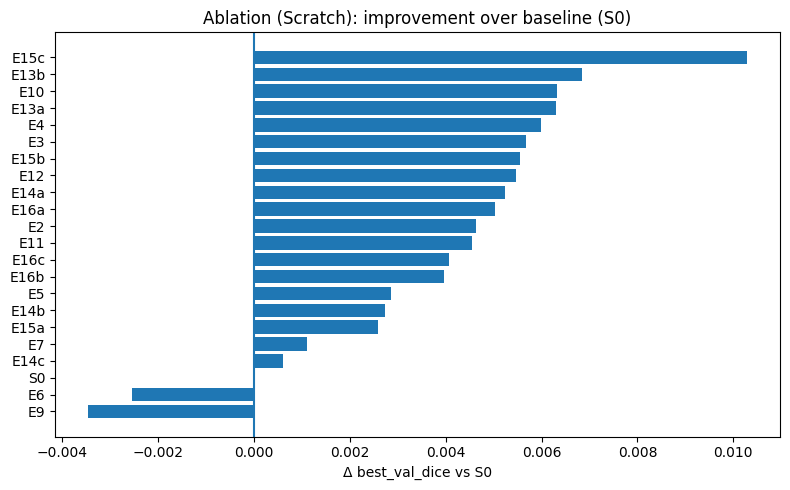

,tag,best_val_dice,delta_vs_S0,best_epoch,best_val_loss,lr,weight_decay,scheduler_type,run_dir,name
10,E15c,0.869594,0.010288,27,0.268239,0.00010,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...,E15c_seed1_h0.6_v0.4_j0.25_b0.10_baselineResiz...
4,E13b,0.866150,0.006844,24,0.276735,0.00010,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...,E13b_h0.6_v0.4_baselineResize_adamw_lr1e-4_wd1...
0,E10,0.865630,0.006324,25,0.271274,0.00010,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...,E10_flipsOnly_p0.6_baselineResize_adamw_lr1e-4...
3,E13a,0.865603,0.006298,17,0.298425,0.00010,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...,E13a_h0.6_v0.3_baselineResize_adamw_lr1e-4_wd1...
16,E4,0.865295,0.005990,28,0.274804,0.00010,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...,E4_flips+colorJitter+blur_mild_adamw_lr1e-4_wd...
15,E3,0.864991,0.005685,25,0.274733,0.00010,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...,E3_flips+colorJitter_mild_adamw_lr1e-4_wd1e-4_...
9,E15b,0.864861,0.005556,28,0.275086,0.00010,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...,E15b_flips_h0.6_v0.4_plusBlurMild_baselineResi...
2,E12,0.864767,0.005462,25,0.275147,0.00010,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...,E12_vFlipOnly_p0.6_baselineResize_adamw_lr1e-4...
5,E14a,0.864550,0.005245,24,0.287421,0.00010,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...,E14a_h0.6_v0.2_baselineResize_adamw_lr1e-4_wd1...
11,E16a,0.864333,0.005028,28,0.276340,0.00010,0.0001,cosine,/content/drive/MyDrive/Colab Notebooks/isic201...,E16a_flips_h0.6_v0.4_jitterP0.2_blurP0.1_basel...


In [ ]:
# plots
import os, re
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

SAVE_ROOT = "/content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1"
results_csv = os.path.join(SAVE_ROOT, "results.csv")
df = pd.read_csv(results_csv)

# --- Find S0 baseline (seed42) dice ---
s0 = df[df["name"].astype(str).str.contains("S0_scratch_noAug_seed42", na=False)]
S0_dice = float(s0["best_val_dice"].max())

# --- Vælg kun de runs du vil have i paper (fx E2..E16 + E15c/E13b osv) ---
keep = df[df["name"].astype(str).str.match(r"^(E\d+|S0_)", na=False)].copy()

# Fjern tydeligt irrelevante ting (tiebreak/loss screening osv)
drop_patterns = ["tiebreak", "loss_screening", "stage_a", "stage_b", "A_scratch", "B_tiebreak", "D_scratch"]
for p in drop_patterns:
    keep = keep[~keep["name"].astype(str).str.contains(p, case=False, na=False)]

# Lav en kort "tag" til y-aksen (første token før _baselineResize / eller bare E15c osv)
def short_tag(name):
    name = str(name)
    m = re.match(r"^(E\d+[a-z]?|S0)", name)
    if m:
        prefix = m.group(1)
    else:
        prefix = name.split("_")[0]
    # lidt mere læsevenligt: brug første “meningsfulde” del af navnet
    # fx E15c_flips_h0.6_v0.4_plusJitterMild_plusBlurMild -> E15c
    return prefix

keep["tag"] = keep["name"].apply(short_tag)

# Best run per tag
best = (keep.sort_values("best_val_dice", ascending=False)
            .groupby("tag", as_index=False)
            .first())

best["delta_vs_S0"] = best["best_val_dice"] - S0_dice
best = best.sort_values("delta_vs_S0", ascending=True)

# --- Plot delta (zoom automatisk) ---
plt.figure(figsize=(8, 5))
plt.barh(np.arange(len(best)), best["delta_vs_S0"].values)
plt.yticks(np.arange(len(best)), best["tag"])
plt.axvline(0.0)
plt.xlabel("Δ best_val_dice vs S0")
plt.title("Ablation (Scratch): improvement over baseline (S0)")
plt.tight_layout()
plt.show()

# Paper-table (ren)
paper_table = best[["tag","best_val_dice","delta_vs_S0","best_epoch","best_val_loss","lr","weight_decay","scheduler_type","run_dir","name"]]
display(paper_table.sort_values("best_val_dice", ascending=False))


In [19]:
# NEEDED FOR RERUNS
# Laver også ValDS og TrainDS på E15c (bedste model på scratch)
# ******************************************************************



# ******************** Bedste model ********************************

# E15c, p_h=0.6, p_v=0.4, p_jitter=0.25, p_blur=0.10
# ******************************************************************

from torchvision.transforms import v2
import torch
import os
import pandas as pd
import numpy as np

def make_ds_E15c(p_h=0.6, p_v=0.4, p_jitter=0.25, p_blur=0.10):
    transform_train = v2.Compose([
        v2.ToImage(),
        v2.RandomHorizontalFlip(p=float(p_h)),
        v2.RandomVerticalFlip(p=float(p_v)),
        v2.RandomApply(
            [v2.ColorJitter(brightness=0.10, contrast=0.10, saturation=0.05, hue=0.02)],
            p=float(p_jitter)
        ),
        v2.RandomApply(
            [v2.GaussianBlur(kernel_size=5, sigma=(0.1, 1.0))],
            p=float(p_blur)
        ),
        v2.ToDtype(torch.float32, scale=True),
        v2.Normalize(mean=mean, std=std),
    ])

    trainDS = Dataset(
        train_images, train_masks,
        transforms=transform_train,
        transforms_large=None,
        use_size_dependent=False,
        size=512
    )
    valDS = Dataset(
        val_images, val_masks,
        transforms=valTransform,
        transforms_large=None,
        use_size_dependent=False,
        size=512
    )
    return trainDS, valDS



In [20]:
# bruger ovenstående make_ds_E15c
trainDS, valDS = make_ds_E15c()
print(len(trainDS), len(valDS))

720 180


In [ ]:
x,y = trainDS[0]
print(x.shape, y.shape, x.dtype, y.unique())

torch.Size([3, 512, 512]) torch.Size([1, 512, 512]) torch.float32 tensor([0., 1.])


In [ ]:
print(trainDS.transforms)

Compose(
      ToImage()
      RandomHorizontalFlip(p=0.6)
      RandomVerticalFlip(p=0.4)
      RandomApply(    ColorJitter(brightness=(0.9, 1.1), contrast=(0.9, 1.1), saturation=(0.95, 1.05), hue=(-0.02, 0.02)))
      RandomApply(    GaussianBlur(kernel_size=(5, 5), sigma=[0.1, 1.0]))
      ToDtype(scale=True)
      Normalize(mean=[0.7230105775891656, 0.6177779170877388, 0.5672913460258063], std=[0.1657008095439599, 0.1725575604936751, 0.19304642304032354], inplace=False)
)


In [ ]:
set_seed(42)
print(SEED)
print(valDS.transforms)


42
Compose(
      ToImage()
      ToDtype(scale=True)
      Normalize(mean=[0.7230105775891656, 0.6177779170877388, 0.5672913460258063], std=[0.1657008095439599, 0.1725575604936751, 0.19304642304032354], inplace=False)
)


EPOCH: 1/60 | epoch-start LR: 1.00e-04
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.40it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.28it/s]


Train loss: 0.904088, Val loss: 0.879608
Train dice: 0.512, Val dice: 0.619
Train IoU : 0.421, Val IoU: 0.503
LR        : 1.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final/scratch_final.pth (val dice=0.619)
Early stopping warmup (1/15) — not tracking yet
EPOCH: 2/60 | epoch-start LR: 9.99e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.47it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.16it/s]


Train loss: 0.678035, Val loss: 0.597316
Train dice: 0.694, Val dice: 0.729
Train IoU : 0.586, Val IoU: 0.621
LR        : 9.99e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final/scratch_final.pth (val dice=0.729)
Early stopping warmup (2/15) — not tracking yet
EPOCH: 3/60 | epoch-start LR: 9.97e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.62it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.27it/s]


Train loss: 0.615063, Val loss: 0.541864
Train dice: 0.723, Val dice: 0.767
Train IoU : 0.618, Val IoU: 0.665
LR        : 9.97e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final/scratch_final.pth (val dice=0.767)
Early stopping warmup (3/15) — not tracking yet
EPOCH: 4/60 | epoch-start LR: 9.94e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.73it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]

Train loss: 0.574799, Val loss: 0.590181
Train dice: 0.746, Val dice: 0.719
Train IoU : 0.640, Val IoU: 0.600
LR        : 9.94e-05
Early stopping warmup (4/15) — not tracking yet
EPOCH: 5/60 | epoch-start LR: 9.89e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.48it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.48it/s]


Train loss: 0.540674, Val loss: 0.466308
Train dice: 0.765, Val dice: 0.799
Train IoU : 0.659, Val IoU: 0.703
LR        : 9.89e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final/scratch_final.pth (val dice=0.799)
Early stopping warmup (5/15) — not tracking yet
EPOCH: 6/60 | epoch-start LR: 9.83e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.26it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]


Train loss: 0.479940, Val loss: 0.422194
Train dice: 0.786, Val dice: 0.802
Train IoU : 0.682, Val IoU: 0.699
LR        : 9.83e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final/scratch_final.pth (val dice=0.802)
Early stopping warmup (6/15) — not tracking yet
EPOCH: 7/60 | epoch-start LR: 9.76e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.36it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.38it/s]


Train loss: 0.444066, Val loss: 0.399060
Train dice: 0.801, Val dice: 0.821
Train IoU : 0.699, Val IoU: 0.725
LR        : 9.76e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final/scratch_final.pth (val dice=0.821)
Early stopping warmup (7/15) — not tracking yet
EPOCH: 8/60 | epoch-start LR: 9.67e-05
Train phase:


100%|██████████| 180/180 [00:22<00:00,  7.84it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.43it/s]


Train loss: 0.435183, Val loss: 0.392476
Train dice: 0.807, Val dice: 0.821
Train IoU : 0.707, Val IoU: 0.725
LR        : 9.67e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final/scratch_final.pth (val dice=0.821)
Early stopping warmup (8/15) — not tracking yet
EPOCH: 9/60 | epoch-start LR: 9.57e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.50it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]

Train loss: 0.405251, Val loss: 0.388642
Train dice: 0.818, Val dice: 0.819
Train IoU : 0.722, Val IoU: 0.725
LR        : 9.57e-05
Early stopping warmup (9/15) — not tracking yet
EPOCH: 10/60 | epoch-start LR: 9.46e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.35it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.44it/s]


Train loss: 0.412065, Val loss: 0.365755
Train dice: 0.818, Val dice: 0.842
Train IoU : 0.722, Val IoU: 0.752
LR        : 9.46e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final/scratch_final.pth (val dice=0.842)
Early stopping warmup (10/15) — not tracking yet
min lesion pixel probability: 3.761833511362056e-09
max lesion pixel probability: 0.9991963505744934


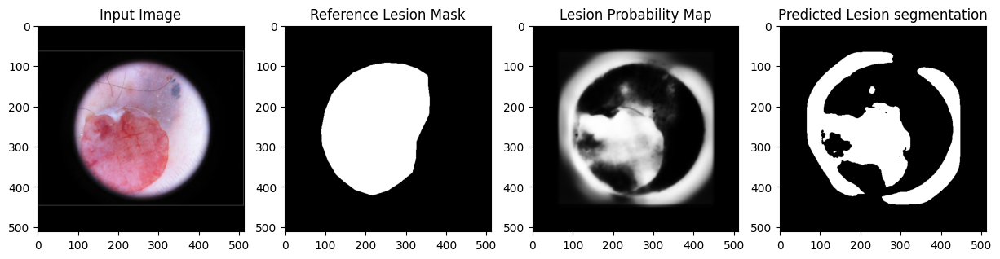

EPOCH: 11/60 | epoch-start LR: 9.33e-05
Train phase:


100%|██████████| 180/180 [00:25<00:00,  7.13it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.36it/s]

Train loss: 0.384799, Val loss: 0.379047
Train dice: 0.828, Val dice: 0.826
Train IoU : 0.733, Val IoU: 0.727
LR        : 9.33e-05
Early stopping warmup (11/15) — not tracking yet
EPOCH: 12/60 | epoch-start LR: 9.19e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.37it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]

Train loss: 0.381834, Val loss: 0.332069
Train dice: 0.827, Val dice: 0.837
Train IoU : 0.731, Val IoU: 0.746
LR        : 9.19e-05
Early stopping warmup (12/15) — not tracking yet
EPOCH: 13/60 | epoch-start LR: 9.05e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.39it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.43it/s]


Train loss: 0.365167, Val loss: 0.325502
Train dice: 0.838, Val dice: 0.851
Train IoU : 0.747, Val IoU: 0.764
LR        : 9.05e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final/scratch_final.pth (val dice=0.851)
Early stopping warmup (13/15) — not tracking yet
EPOCH: 14/60 | epoch-start LR: 8.89e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.44it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.43it/s]

Train loss: 0.365343, Val loss: 0.320167
Train dice: 0.839, Val dice: 0.848
Train IoU : 0.748, Val IoU: 0.761
LR        : 8.89e-05
Early stopping warmup (14/15) — not tracking yet
EPOCH: 15/60 | epoch-start LR: 8.72e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.39it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.45it/s]


Train loss: 0.351045, Val loss: 0.317346
Train dice: 0.846, Val dice: 0.854
Train IoU : 0.757, Val IoU: 0.767
LR        : 8.72e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final/scratch_final.pth (val dice=0.854)
Early stopping warmup (15/15) — not tracking yet
EPOCH: 16/60 | epoch-start LR: 8.54e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.32it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.25it/s]

Train loss: 0.333237, Val loss: 0.348031
Train dice: 0.848, Val dice: 0.834
Train IoU : 0.760, Val IoU: 0.745
LR        : 8.54e-05
Early stopping on val_dice | best=0.8337722778320312 | bad_epochs=0/12
EPOCH: 17/60 | epoch-start LR: 8.35e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.69it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.51it/s]

Train loss: 0.334614, Val loss: 0.317389
Train dice: 0.849, Val dice: 0.847
Train IoU : 0.761, Val IoU: 0.756
LR        : 8.35e-05
Early stopping on val_dice | best=0.8473640653822158 | bad_epochs=0/12
EPOCH: 18/60 | epoch-start LR: 8.15e-05
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.12it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.41it/s]


Train loss: 0.329147, Val loss: 0.313618
Train dice: 0.852, Val dice: 0.858
Train IoU : 0.766, Val IoU: 0.775
LR        : 8.15e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final/scratch_final.pth (val dice=0.858)
Early stopping on val_dice | best=0.8576158589786953 | bad_epochs=0/12
EPOCH: 19/60 | epoch-start LR: 7.94e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.48it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.26it/s]

Train loss: 0.330893, Val loss: 0.324373
Train dice: 0.852, Val dice: 0.850
Train IoU : 0.766, Val IoU: 0.764
LR        : 7.94e-05
Early stopping on val_dice | best=0.8576158589786953 | bad_epochs=1/12
EPOCH: 20/60 | epoch-start LR: 7.72e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.37it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.38it/s]


Train loss: 0.311393, Val loss: 0.305532
Train dice: 0.854, Val dice: 0.850
Train IoU : 0.768, Val IoU: 0.763
LR        : 7.72e-05
Early stopping on val_dice | best=0.8576158589786953 | bad_epochs=2/12
min lesion pixel probability: 2.2579605726409683e-20
max lesion pixel probability: 1.0


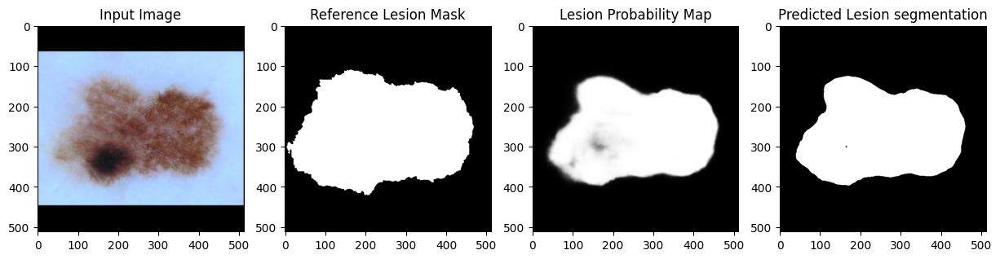

EPOCH: 21/60 | epoch-start LR: 7.50e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.30it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.19it/s]

Train loss: 0.302088, Val loss: 0.298445
Train dice: 0.859, Val dice: 0.854
Train IoU : 0.774, Val IoU: 0.768
LR        : 7.50e-05
Early stopping on val_dice | best=0.8576158589786953 | bad_epochs=3/12
EPOCH: 22/60 | epoch-start LR: 7.27e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.64it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]


Train loss: 0.311455, Val loss: 0.296599
Train dice: 0.859, Val dice: 0.859
Train IoU : 0.775, Val IoU: 0.776
LR        : 7.27e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final/scratch_final.pth (val dice=0.859)
Early stopping on val_dice | best=0.8591075446870592 | bad_epochs=0/12
EPOCH: 23/60 | epoch-start LR: 7.03e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.45it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.25it/s]

Train loss: 0.311300, Val loss: 0.286159
Train dice: 0.861, Val dice: 0.857
Train IoU : 0.778, Val IoU: 0.774
LR        : 7.03e-05
Early stopping on val_dice | best=0.8591075446870592 | bad_epochs=1/12
EPOCH: 24/60 | epoch-start LR: 6.79e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.28it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.21it/s]

Train loss: 0.299870, Val loss: 0.308601
Train dice: 0.862, Val dice: 0.853
Train IoU : 0.778, Val IoU: 0.767
LR        : 6.79e-05
Early stopping on val_dice | best=0.8591075446870592 | bad_epochs=2/12
EPOCH: 25/60 | epoch-start LR: 6.55e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.57it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.43it/s]


Train loss: 0.296292, Val loss: 0.271723
Train dice: 0.865, Val dice: 0.871
Train IoU : 0.783, Val IoU: 0.792
LR        : 6.55e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final/scratch_final.pth (val dice=0.871)
Early stopping on val_dice | best=0.871042177412245 | bad_epochs=0/12
EPOCH: 26/60 | epoch-start LR: 6.29e-05
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.62it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.45it/s]

Train loss: 0.294163, Val loss: 0.279572
Train dice: 0.867, Val dice: 0.861
Train IoU : 0.786, Val IoU: 0.780
LR        : 6.29e-05
Early stopping on val_dice | best=0.871042177412245 | bad_epochs=1/12
EPOCH: 27/60 | epoch-start LR: 6.04e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.34it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.25it/s]

Train loss: 0.289710, Val loss: 0.275336
Train dice: 0.867, Val dice: 0.864
Train IoU : 0.786, Val IoU: 0.783
LR        : 6.04e-05
Early stopping on val_dice | best=0.871042177412245 | bad_epochs=2/12
EPOCH: 28/60 | epoch-start LR: 5.78e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.35it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.25it/s]

Train loss: 0.278196, Val loss: 0.340747
Train dice: 0.870, Val dice: 0.839
Train IoU : 0.790, Val IoU: 0.750
LR        : 5.78e-05
Early stopping on val_dice | best=0.871042177412245 | bad_epochs=3/12
EPOCH: 29/60 | epoch-start LR: 5.52e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.30it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]

Train loss: 0.281360, Val loss: 0.293514
Train dice: 0.872, Val dice: 0.851
Train IoU : 0.792, Val IoU: 0.767
LR        : 5.52e-05
Early stopping on val_dice | best=0.871042177412245 | bad_epochs=4/12
EPOCH: 30/60 | epoch-start LR: 5.26e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.43it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]


Train loss: 0.280252, Val loss: 0.303460
Train dice: 0.872, Val dice: 0.847
Train IoU : 0.791, Val IoU: 0.759
LR        : 5.26e-05
Early stopping on val_dice | best=0.871042177412245 | bad_epochs=5/12
min lesion pixel probability: 1.7823307933706456e-13
max lesion pixel probability: 0.999998927116394


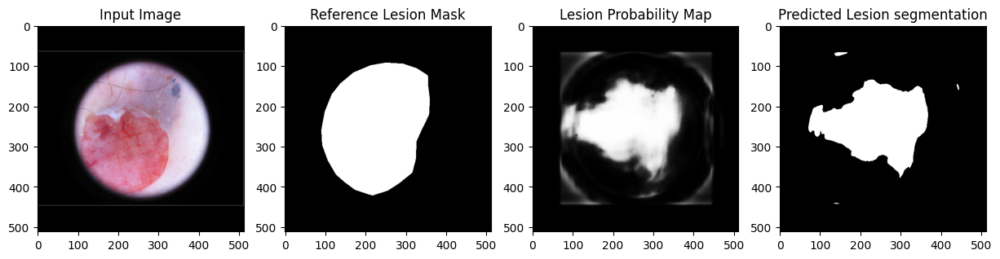

EPOCH: 31/60 | epoch-start LR: 5.00e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.43it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.25it/s]

Train loss: 0.273078, Val loss: 0.286063
Train dice: 0.874, Val dice: 0.869
Train IoU : 0.795, Val IoU: 0.788
LR        : 5.00e-05
Early stopping on val_dice | best=0.871042177412245 | bad_epochs=6/12
EPOCH: 32/60 | epoch-start LR: 4.74e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.27it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.26it/s]


Train loss: 0.270765, Val loss: 0.261630
Train dice: 0.875, Val dice: 0.875
Train IoU : 0.797, Val IoU: 0.797
LR        : 4.74e-05
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final/scratch_final.pth (val dice=0.875)
Early stopping on val_dice | best=0.875138807296753 | bad_epochs=0/12
EPOCH: 33/60 | epoch-start LR: 4.48e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.40it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.19it/s]

Train loss: 0.274383, Val loss: 0.274261
Train dice: 0.877, Val dice: 0.871
Train IoU : 0.798, Val IoU: 0.792
LR        : 4.48e-05
Early stopping on val_dice | best=0.875138807296753 | bad_epochs=1/12
EPOCH: 34/60 | epoch-start LR: 4.22e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.57it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.22it/s]

Train loss: 0.268349, Val loss: 0.317993
Train dice: 0.877, Val dice: 0.841
Train IoU : 0.800, Val IoU: 0.755
LR        : 4.22e-05
Early stopping on val_dice | best=0.875138807296753 | bad_epochs=2/12
EPOCH: 35/60 | epoch-start LR: 3.96e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.37it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.19it/s]

Train loss: 0.267639, Val loss: 0.273797
Train dice: 0.877, Val dice: 0.867
Train IoU : 0.798, Val IoU: 0.787
LR        : 3.96e-05
Early stopping on val_dice | best=0.875138807296753 | bad_epochs=3/12
EPOCH: 36/60 | epoch-start LR: 3.71e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.35it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.13it/s]

Train loss: 0.253050, Val loss: 0.268109
Train dice: 0.884, Val dice: 0.870
Train IoU : 0.808, Val IoU: 0.791
LR        : 3.71e-05
Early stopping on val_dice | best=0.875138807296753 | bad_epochs=4/12
EPOCH: 37/60 | epoch-start LR: 3.45e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.26it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.20it/s]

Train loss: 0.262953, Val loss: 0.267882
Train dice: 0.878, Val dice: 0.871
Train IoU : 0.802, Val IoU: 0.792
LR        : 3.45e-05
Early stopping on val_dice | best=0.875138807296753 | bad_epochs=5/12
EPOCH: 38/60 | epoch-start LR: 3.21e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.25it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.36it/s]

Train loss: 0.258191, Val loss: 0.263774
Train dice: 0.882, Val dice: 0.868
Train IoU : 0.805, Val IoU: 0.789
LR        : 3.21e-05
Early stopping on val_dice | best=0.875138807296753 | bad_epochs=6/12
EPOCH: 39/60 | epoch-start LR: 2.97e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.29it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.27it/s]

Train loss: 0.251236, Val loss: 0.263830
Train dice: 0.884, Val dice: 0.867
Train IoU : 0.808, Val IoU: 0.786
LR        : 2.97e-05
Early stopping on val_dice | best=0.875138807296753 | bad_epochs=7/12
EPOCH: 40/60 | epoch-start LR: 2.73e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.31it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.27it/s]


Train loss: 0.247932, Val loss: 0.257722
Train dice: 0.883, Val dice: 0.869
Train IoU : 0.807, Val IoU: 0.790
LR        : 2.73e-05
Early stopping on val_dice | best=0.875138807296753 | bad_epochs=8/12
min lesion pixel probability: 9.938993944086824e-17
max lesion pixel probability: 0.9998049139976501


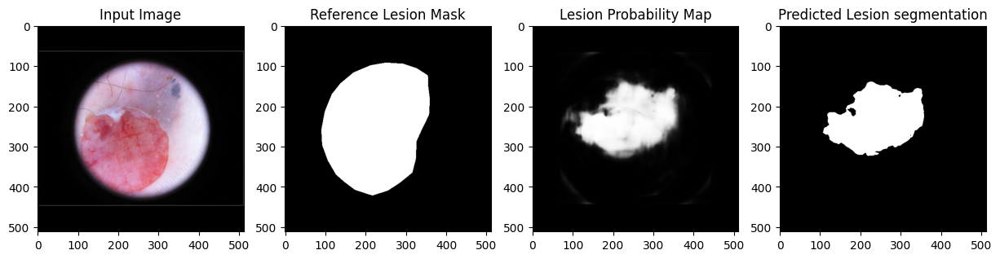

EPOCH: 41/60 | epoch-start LR: 2.50e-05
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.26it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.18it/s]

Train loss: 0.252345, Val loss: 0.263676
Train dice: 0.883, Val dice: 0.868
Train IoU : 0.808, Val IoU: 0.788
LR        : 2.50e-05
Early stopping on val_dice | best=0.875138807296753 | bad_epochs=9/12
EPOCH: 42/60 | epoch-start LR: 2.28e-05
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.12it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.24it/s]

Train loss: 0.245969, Val loss: 0.260884
Train dice: 0.885, Val dice: 0.873
Train IoU : 0.810, Val IoU: 0.793
LR        : 2.28e-05
Early stopping on val_dice | best=0.875138807296753 | bad_epochs=10/12
EPOCH: 43/60 | epoch-start LR: 2.06e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.40it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]

Train loss: 0.246309, Val loss: 0.258645
Train dice: 0.888, Val dice: 0.871
Train IoU : 0.813, Val IoU: 0.792
LR        : 2.06e-05
Early stopping on val_dice | best=0.875138807296753 | bad_epochs=11/12
EPOCH: 44/60 | epoch-start LR: 1.85e-05
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.15it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.31it/s]

Train loss: 0.242360, Val loss: 0.266715
Train dice: 0.889, Val dice: 0.867
Train IoU : 0.815, Val IoU: 0.785
LR        : 1.85e-05
Early stopping on val_dice | best=0.875138807296753 | bad_epochs=12/12
Early stopping triggered at epoch:44/60


{'train_loss': [0.9040878580676185,
  0.6780348751280043,
  0.6150627109739516,
  0.574799101634158,
  0.5406739976671007,
  0.4799396961099572,
  0.4440657302737236,
  0.43518256872064537,
  0.4052508845925331,
  0.4120645630690787,
  0.38479933792518245,
  0.38183357881175145,
  0.36516703640421233,
  0.36534318857722814,
  0.35104475075172054,
  0.3332372572686937,
  0.334614090124766,
  0.3291467308998108,
  0.3308930421455039,
  0.3113927779512273,
  0.302087606365482,
  0.31145509634580876,
  0.31129981954064634,
  0.2998695593741205,
  0.2962920836276478,
  0.29416278522047734,
  0.2897099459336864,
  0.2781956153611342,
  0.2813602985607253,
  0.28025193098518586,
  0.2730780490570598,
  0.2707648090604279,
  0.2743827481443683,
  0.2683486725307173,
  0.26763857814172903,
  0.2530498981889751,
  0.26295270940495863,
  0.25819098382360406,
  0.25123571252657306,
  0.24793179229729706,
  0.25234456517630155,
  0.24596935961809424,
  0.24630868439045217,
  0.24236029080218738],
 

In [ ]:
# Final train for scratch winner
# ER KØRT
train_function(
    UNet(in_channels=NUM_CHANNELS,n_class=NUM_CLASSES),
    trainDS,
    valDS,
    lossFunction=make_loss("bce+dice"),
    optimizer=torch.optim.AdamW,
    learningRate=1e-4,
    weight_decay=1e-4,
    epochs=60,
    batchSize=4,
    device="cuda",
    save_dir=os.path.join(SAVE_DIR_SCRATCH, "final"),
    modelSaveName="scratch_final",
    plot_every=10,
    scheduler_type="cosine",
    early_stopping_patience=12,
    early_stopping_delta=5e-4,
    early_stopping_warmup=15,
    early_stopping_metric="val_dice")

/content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final/scratch_final.pth
/content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_final_baseline_r18_lr0.0007_wd0.0_cosine_ep60_seed42/best.pth


In [ ]:
# NEEDED FOR RERUNS
# Til ekstra threshold sweep / hjælpefunktioner
import numpy as np
import torch

def dice_per_sample(pred_bin_b1hw, target_b1hw, eps=1e-7):
    pred = pred_bin_b1hw.float()
    tgt  = target_b1hw.float()
    inter = (pred * tgt).sum(dim=(1,2,3))
    union = pred.sum(dim=(1,2,3)) + tgt.sum(dim=(1,2,3))
    dice = (2*inter + eps) / (union + eps)
    return dice  # [B]

def iou_per_sample(pred_bin, target, eps=1e-7):
    # pred_bin, target: [B,1,H,W] (0/1)
    pred_bin = pred_bin.float()
    target = target.float()
    inter = (pred_bin * target).sum(dim=(1,2,3))
    union = pred_bin.sum(dim=(1,2,3)) + target.sum(dim=(1,2,3)) - inter
    return (inter + eps) / (union + eps)  # [B]


@torch.no_grad()
def threshold_sweep(model, valDS, thresholds, device="cuda"):
    model.eval().to(device)
    dices = {}

    for th in thresholds:
        all_d = []
        for i in range(len(valDS)):
            x_chw, y_chw = valDS[i]
            x = x_chw.unsqueeze(0).to(device)              # [1,C,H,W]
            y = y_chw.unsqueeze(0).to(device)              # [1,1,H,W]
            logits = model(x)                               # [1,1,H,W]
            prob = torch.sigmoid(logits)
            pred_bin = (prob > th).float()
            d = dice_per_sample(pred_bin, y).item()
            all_d.append(d)
        dices[th] = float(np.mean(all_d))
        print(f"th={th:.2f}  mean_dice={dices[th]:.6f}")

    best_th = max(dices, key=dices.get)
    print("\nBEST:", best_th, dices[best_th])
    return dices, best_th


In [ ]:
# ER KØRT: best threshold = 0.56

# Arkitektur
model = UNet(in_channels=NUM_CHANNELS, n_class=NUM_CLASSES).to(device)

# Vægte fra vores træning (bedste model - 15c)
# Checkpoint indeholder modelens state_dict: learnable parametre (weights/biases)
# og evt. buffers (fx BatchNorm running stats), så vi kan genskabe den trænede model.
ckpt_path = os.path.join(SAVE_DIR_SCRATCH, "final", "scratch_final.pth")
ckpt = torch.load(ckpt_path, map_location=device)
if isinstance(ckpt, dict) and "model_state_dict" in ckpt:
    model.load_state_dict(ckpt["model_state_dict"])
else:
    model.load_state_dict(ckpt)
# Eval-mode: slår trænings-adfærd fra (Dropout OFF, BatchNorm bruger running stats).
# Det er vigtigt ved val/test, så resultatet er deterministisk og svarer til inference.
model.eval()
print("Loaded checkpoint:", ckpt_path)

thresholds = np.round(np.arange(0.45, 0.76, 0.01), 2)
dices, best_th = threshold_sweep(model, valDS, thresholds, device="cuda")


Loaded checkpoint: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final/scratch_final.pth
th=0.45  mean_dice=0.874452
th=0.46  mean_dice=0.874634
th=0.47  mean_dice=0.874798
th=0.48  mean_dice=0.874916
th=0.49  mean_dice=0.875058
th=0.50  mean_dice=0.875139
th=0.51  mean_dice=0.875189
th=0.52  mean_dice=0.875257
th=0.53  mean_dice=0.875337
th=0.54  mean_dice=0.875372
th=0.55  mean_dice=0.875397
th=0.56  mean_dice=0.875421
th=0.57  mean_dice=0.875389
th=0.58  mean_dice=0.875339
th=0.59  mean_dice=0.875286
th=0.60  mean_dice=0.875189
th=0.61  mean_dice=0.875073
th=0.62  mean_dice=0.874936
th=0.63  mean_dice=0.874770
th=0.64  mean_dice=0.874540
th=0.65  mean_dice=0.874265
th=0.66  mean_dice=0.873965
th=0.67  mean_dice=0.873652
th=0.68  mean_dice=0.873287
th=0.69  mean_dice=0.872928
th=0.70  mean_dice=0.872427
th=0.71  mean_dice=0.871957
th=0.72  mean_dice=0.871413
th=0.73  mean_dice=0.870732
th=0.74  mean_dice=0.869970
th=0.75  mean_dice=0.869107

BEST: 0.56 0.8754

In [ ]:
print([*dices.values()])
print(best_th)

[0.8744515127605992, 0.8746337011456619, 0.8747976763381028, 0.8749157648947633, 0.8750580757856499, 0.8751385854350325, 0.8751889801687794, 0.8752567776375476, 0.8753369505206874, 0.875372173388812, 0.8753965351316794, 0.8754211895995799, 0.875388784872174, 0.8753389999270569, 0.8752863236599627, 0.8751890449060463, 0.8750734426909152, 0.8749357226822241, 0.8747698974278367, 0.8745396713415912, 0.8742646646168626, 0.8739654310875599, 0.87365150070854, 0.8732865712709027, 0.8729279581043585, 0.8724273211426334, 0.8719567706187695, 0.8714128873414593, 0.8707315084007181, 0.8699695378542076, 0.8691066683994528]
0.56


In [ ]:
# ER KØRT
# Gemmer data fra val sættet og threshold sweep
# kræver allerede-beregnede thresholds, dices, best_th
import os, json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime

OUT_DIR = os.path.join(SAVE_DIR_SCRATCH, "final_val")   # adskil fra test
os.makedirs(OUT_DIR, exist_ok=True)

# --- 1) CSV: threshold -> mean_dice ---
df = pd.DataFrame({
    "threshold": thresholds.astype(float),
    "mean_dice": np.array([float(dices[float(t)]) for t in thresholds], dtype=float),
})

sweep_csv = os.path.join(OUT_DIR, "threshold_sweep_val.csv")
df.to_csv(sweep_csv, index=False)
print("Saved:", sweep_csv)

# --- 2) JSON summary ---
best_row = df.loc[df["mean_dice"].idxmax()]
summary = {
    "timestamp": datetime.now().isoformat(timespec="seconds"),
    "split": "val",
    "ckpt_path": ckpt_path,
    "threshold_grid": {
        "start": float(thresholds.min()),
        "end": float(thresholds.max()),
        "step": float(np.round(thresholds[1] - thresholds[0], 6)) if len(thresholds) > 1 else None,
        "n": int(len(thresholds)),
    },
    "best_threshold": float(best_row["threshold"]),
    "best_mean_dice": float(best_row["mean_dice"]),
}

summary_path = os.path.join(OUT_DIR, "threshold_sweep_val_summary.json")
with open(summary_path, "w") as f:
    json.dump(summary, f, indent=2)
print("Saved:", summary_path)

# --- 3) PNG plot (paper/appendix) ---
plt.figure(figsize=(6,4))
plt.plot(df["threshold"], df["mean_dice"])
plt.axvline(float(best_row["threshold"]), linestyle="--")
plt.xlabel("Threshold")
plt.ylabel("Mean Dice (val)")
plt.title("Validation threshold sweep")
plt.tight_layout()

plot_path = os.path.join(OUT_DIR, "threshold_sweep_val.png")
plt.savefig(plot_path, dpi=200)
plt.close()
print("Saved:", plot_path)

print("BEST:", float(best_row["threshold"]), float(best_row["mean_dice"]))


Saved: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final_val/threshold_sweep_val.csv
Saved: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final_val/threshold_sweep_val_summary.json
Saved: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final_val/threshold_sweep_val.png
BEST: 0.56 0.8754211895995799


In [ ]:
print(testDS_scratch.transforms)

Compose(
      ToImage()
      ToDtype(scale=True)
      Normalize(mean=[0.7230105775891656, 0.6177779170877388, 0.5672913460258063], std=[0.1657008095439599, 0.1725575604936751, 0.19304642304032354], inplace=False)
)


In [ ]:
print(valTransform)

Compose(
      ToImage()
      ToDtype(scale=True)
      Normalize(mean=[0.7230105775891656, 0.6177779170877388, 0.5672913460258063], std=[0.1657008095439599, 0.1725575604936751, 0.19304642304032354], inplace=False)
)


In [ ]:
print(valTransform == testDS_scratch.transforms)

True


In [ ]:
# -----------------------
# Load model + checkpoint
# -----------------------
device = "cuda"
model = UNet(in_channels=NUM_CHANNELS, n_class=NUM_CLASSES).to(device)

ckpt = torch.load(ckpt_path, map_location=device)
if isinstance(ckpt, dict) and "model_state_dict" in ckpt:
    model.load_state_dict(ckpt["model_state_dict"])
else:
    # fallback hvis du engang har gemt raw state_dict direkte
    model.load_state_dict(ckpt)

model.eval()
print("Loaded checkpoint:", ckpt_path)

# -----------------------
# Score ALL val samples (Dice per image)
# -----------------------
valLoader = DataLoader(valDS, batch_size=4, shuffle=False, num_workers=2)

# treshold fundet ved sweep skal bruges i val og test
th = 0.56
all_dice = []
all_indices = []
global_idx = 0
loss_fn = make_loss("bce+dice")
total_loss = 0.0
n_batches = 0
n_samples = 0


with torch.no_grad():
    for x, y in valLoader:
        bs = x.size(0)   # faktisk batch-størrelse (sidste batch kan være mindre)
        x = x.to(device)
        y = y.to(device)
        if y.ndim == 3:
          y = y.unsqueeze(1)

        logits = model(x)
        loss = loss_fn(logits, y.float())
        total_loss += float(loss.item()) * bs
        n_samples += bs

        prob = torch.sigmoid(logits)
        pred_bin = (prob > th).float()

        d = dice_per_sample(pred_bin, y)  # [B]
        d_cpu = d.detach().cpu().numpy().tolist()

        idxs = list(range(global_idx, global_idx + bs))
        global_idx += bs

        all_indices.extend(idxs)
        all_dice.extend(d_cpu)

all_dice = np.array(all_dice, dtype=np.float32)
all_indices = np.array(all_indices)


mean_dice = float(all_dice.mean())
std_dice  = float(all_dice.std())   # <- std() !!

print("mean_dice:", mean_dice)
print("std_dice :", std_dice)
print("n:", len(all_dice))

mean_loss = total_loss / max(1, n_samples)
print("mean_loss:", mean_loss)




Loaded checkpoint: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final/scratch_final.pth
mean_dice: 0.8754214644432068
std_dice : 0.12986749410629272
n: 180
mean_loss: 0.2616304084658623


In [ ]:
# ER KØRT
# TEST AF SCRATCH FINAL
# -----------------------
# Load model + checkpoint
# -----------------------
device = "cuda"
model = UNet(in_channels=NUM_CHANNELS, n_class=NUM_CLASSES).to(device)
ckpt = torch.load(ckpt_path, map_location=device)
if isinstance(ckpt, dict) and "model_state_dict" in ckpt:
    model.load_state_dict(ckpt["model_state_dict"])
else:
    # fallback hvis du engang har gemt raw state_dict direkte
    model.load_state_dict(ckpt)

model.eval()
print("Loaded checkpoint:", ckpt_path)

# -----------------------
# Score ALL val samples (Dice per image)
# -----------------------
testLoader = DataLoader(testDS_scratch, batch_size=4, shuffle=False, num_workers=2)

# treshold fundet ved sweep skal bruges i val og test
th = 0.56
all_dice_test = []
all_indices_test = []
all_iou_test = []
global_idx = 0
loss_fn = make_loss("bce+dice")
total_loss = 0.0
n_batches = 0
n_samples = 0


with torch.no_grad():
    for x, y in testLoader:
        bs = x.size(0)   # faktisk batch-størrelse - tager højde for at sidste batch kan være mindre
        x = x.to(device)
        y = y.to(device)
        if y.ndim == 3:
          y = y.unsqueeze(1)

        logits = model(x)
        loss = loss_fn(logits, y.float())
        total_loss += float(loss.item()) * bs
        n_samples += bs

        prob = torch.sigmoid(logits)
        pred_bin = (prob > th).float()

        d = dice_per_sample(pred_bin, y)  # [B]
        d_cpu = d.detach().cpu().numpy().tolist()

        iou = iou_per_sample(pred_bin, y)        # [B]
        all_iou_test.extend(iou.detach().cpu().numpy().tolist())

        idxs = list(range(global_idx, global_idx + bs))
        global_idx += bs

        all_indices_test.extend(idxs)
        all_dice_test.extend(d_cpu)

all_dice_test = np.array(all_dice_test, dtype=np.float32)
all_iou_test = np.array(all_iou_test, dtype=np.float32)
all_indices_test = np.array(all_indices_test)



mean_dice_test = float(all_dice_test.mean())
std_dice_test  = float(all_dice_test.std())

mean_iou_test = float(all_iou_test.mean())
std_iou_test  = float(all_iou_test.std())

print("test_mean_dice:", mean_dice_test)
print("test_std_dice :", std_dice_test)

print("**************")

print("test_mean_iou:", mean_iou_test)
print("test_std_iou :", std_iou_test)

print("**************")


print("test samples:", len(all_dice_test))

mean_loss_test = total_loss / max(1, n_samples)
print("test_mean_loss:", mean_loss_test)




Loaded checkpoint: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final/scratch_final.pth
test_mean_dice: 0.8673088550567627
test_std_dice : 0.14571768045425415
**************
test_mean_iou: 0.7879528403282166
test_std_iou : 0.176322340965271
**************
test samples: 379
test_mean_loss: 0.2957068601510141


In [ ]:
# Gemmer dataen fra testen men kræven at testen er kørt i samme run
import os, json
import pandas as pd
import numpy as np
from datetime import datetime

# === vælg hvor du vil gemme ===
OUT_DIR = os.path.join(SAVE_DIR_SCRATCH, "final_test")   # eller "final_test"
os.makedirs(OUT_DIR, exist_ok=True)

# === 1) gem dice pr sample ===
df_dice = pd.DataFrame({
    "idx": all_indices_test.astype(int),
    "dice": all_dice_test.astype(float),
})
dice_csv_path = os.path.join(OUT_DIR, "dice_per_sample.csv")
df_dice.to_csv(dice_csv_path, index=False)
print("Saved:", dice_csv_path)

# === 2) gem IoU pr sample ===
df_iou = pd.DataFrame({
    "idx": all_indices_test.astype(int),
    "iou": all_iou_test.astype(float),
})
iou_csv_path = os.path.join(OUT_DIR, "iou_per_sample.csv")
df_iou.to_csv(iou_csv_path, index=False)
print("Saved:", iou_csv_path)

# === 3) gem summary (til paper/log) ===
summary = {
    "timestamp": datetime.now().isoformat(timespec="seconds"),
    "ckpt_path": ckpt_path,
    "split": "test",
    "threshold": float(th),
    "mean_dice": float(mean_dice_test),
    "std_dice": float(std_dice_test),
    "mean_iou": float(mean_iou_test),
    "std_iou": float(std_iou_test),
    "n_samples": int(len(all_dice_test)),
    "mean_loss": float(mean_loss_test),
}
summary_path = os.path.join(OUT_DIR, "summary.json")
with open(summary_path, "w") as f:
    json.dump(summary, f, indent=2)
print("Saved:", summary_path)

# === 4) gem top/bottom ===
k = 10
order_dice = np.argsort(all_dice_test)     # stigende
bot_dice = order_dice[:k]
top_dice = order_dice[-k:][::-1]

df_dice_tb = pd.concat([
    pd.DataFrame({"rank_type": "top", "idx": all_indices_test[top_dice], "dice": all_dice_test[top_dice]}),
    pd.DataFrame({"rank_type": "bottom", "idx": all_indices_test[bot_dice], "dice": all_dice_test[bot_dice]}),
], ignore_index=True)

k = 10
order_iou = np.argsort(all_iou_test)     # stigende
bot_iou = order_iou[:k]
top_iou = order_iou[-k:][::-1]

df_iou_tb = pd.concat([
    pd.DataFrame({"rank_type": "top", "idx": all_indices_test[top_iou], "iou": all_iou_test[top_iou]}),
    pd.DataFrame({"rank_type": "bottom", "idx": all_indices_test[bot_iou], "iou": all_iou_test[bot_iou]}),
], ignore_index=True)

tb_dice_path = os.path.join(OUT_DIR, "top_bottom_dice.csv")
df_dice_tb.to_csv(tb_dice_path, index=False)
print("Saved:", tb_dice_path)

tb_iou_path = os.path.join(OUT_DIR, "top_bottom_iou.csv")
df_iou_tb.to_csv(tb_iou_path, index=False)
print("Saved:", tb_iou_path)


Saved: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final_test/dice_per_sample.csv
Saved: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final_test/iou_per_sample.csv
Saved: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final_test/summary.json
Saved: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final_test/top_bottom_dice.csv
Saved: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final_test/top_bottom_iou.csv



Top 6 (idx, dice):
16 0.9869508147239685
205 0.9849216341972351
86 0.984740674495697
13 0.9819273948669434
293 0.9814749360084534
83 0.9808254241943359

Bottom 6 (idx, dice):
342 4.7551119292110755e-11
254 0.008427032269537449
154 0.127231627702713
141 0.1965550184249878
140 0.2444635033607483
178 0.2907237112522125

=== TOP 6 VIS ===


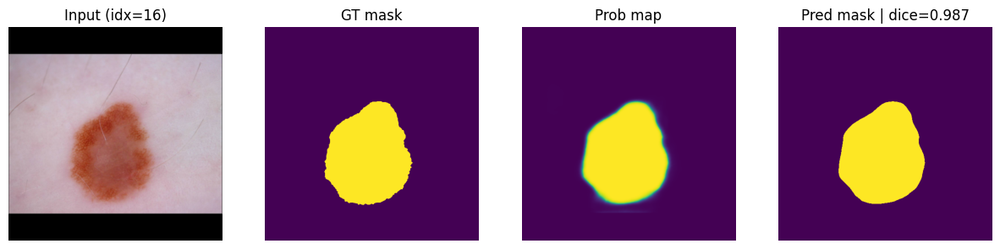

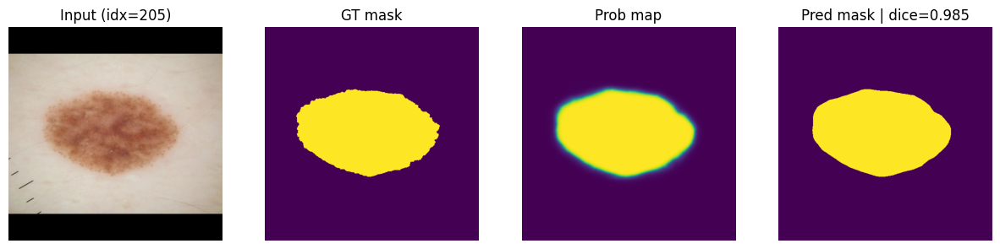

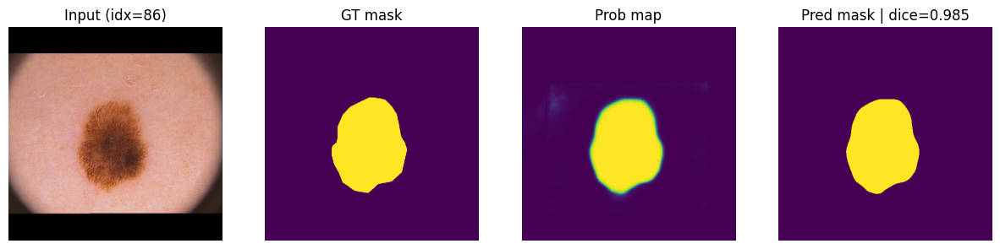

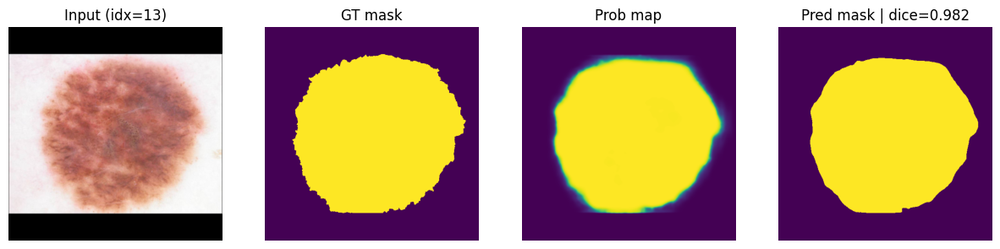

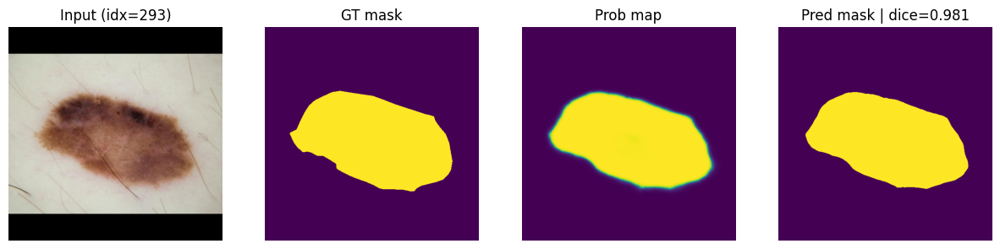

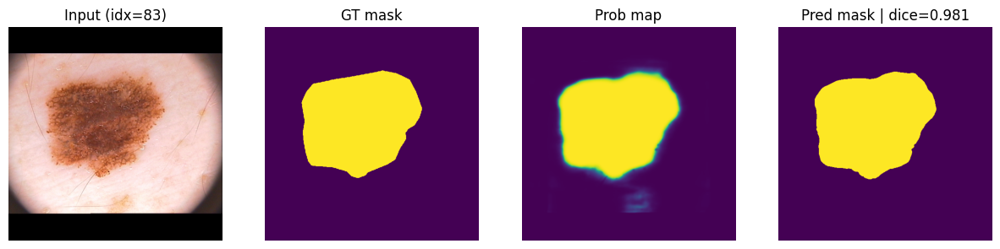


=== BOTTOM 6 VIS ===


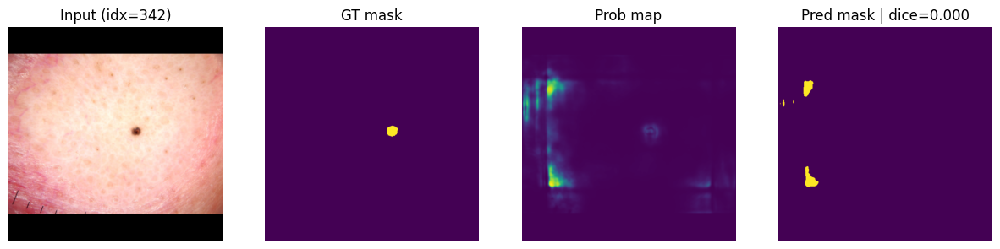

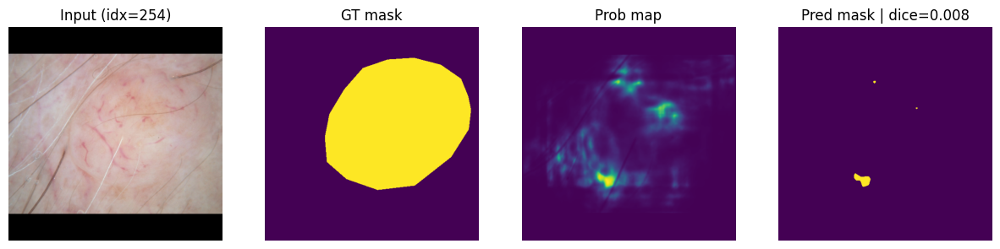

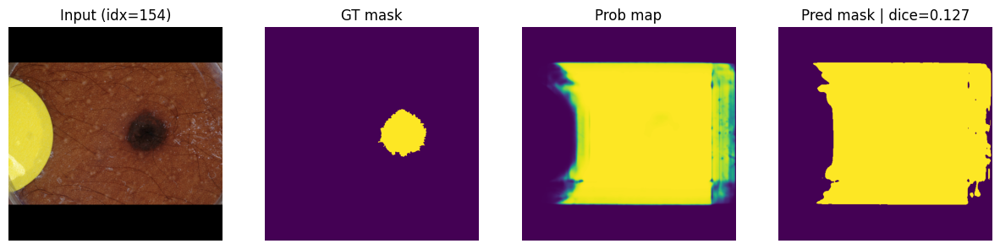

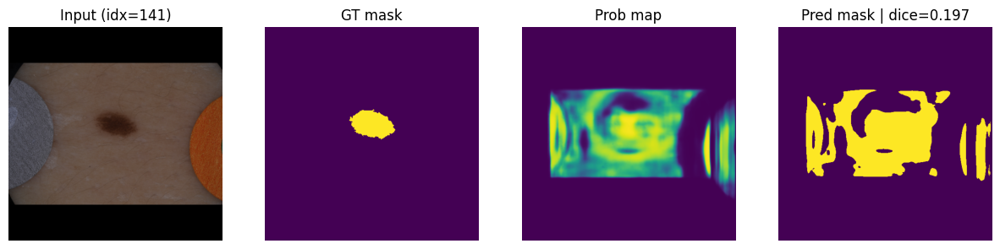

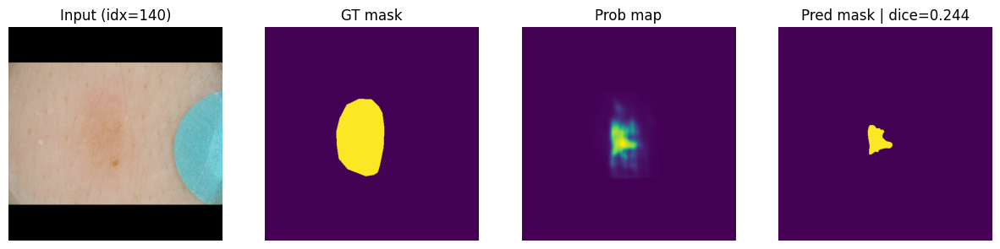

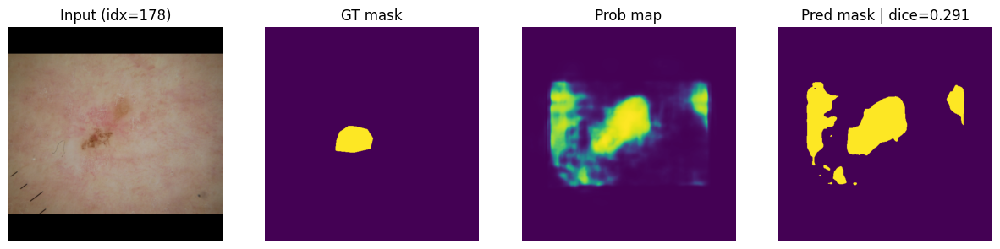

In [ ]:
# -----------------------
# Print af test images
# -----------------------



# Top / bottom
k = 6
top_idx = all_indices_test[np.argsort(-all_dice_test)[:k]]
bot_idx = all_indices_test[np.argsort(all_dice_test)[:k]]

top_iou_idx = all_indices_test[np.argsort(-all_iou_test)[:k]]
bot_iou_idx = all_indices_test[np.argsort(all_iou_test)[:k]]


print("\nTop 6 (idx, dice):")
for i in top_idx:
    print(i, float(all_dice_test[i]))

print("\nBottom 6 (idx, dice):")
for i in bot_idx:
    print(i, float(all_dice_test[i]))

# -----------------------
# Visualize top/bottom
# -----------------------
print("\n=== TOP 6 VIS ===")
for idx in top_idx:
    x_chw, y_chw = testDS_scratch[int(idx)]
    prob_hw, pred_bin_hw = predict_single(model, x_chw, th=0.56)
    # beregn dice på samme måde som evaluering
    dice_test = float(all_dice_test[int(idx)])
    plot_sample(int(idx), dice_test, x_chw, y_chw, prob_hw, pred_bin_hw)

print("\n=== BOTTOM 6 VIS ===")
for idx in bot_idx:
    x_chw, y_chw = testDS_scratch[int(idx)]
    prob_hw, pred_bin_hw = predict_single(model, x_chw, th=0.56)
    dice_test = float(all_dice_test[int(idx)])
    plot_sample(int(idx), dice_test, x_chw, y_chw, prob_hw, pred_bin_hw)

In [ ]:
# -----------------------
# Print af test images på IoU /Jacquard
# -----------------------



# Top / bottom
k = 6

top_iou_idx = all_indices_test[np.argsort(-all_iou_test)[:k]]
bot_iou_idx = all_indices_test[np.argsort(all_iou_test)[:k]]


print("\nTop 6 (idx, IoU):")
for i in top_idx:
    print(i, float(all_iou_test[i]))

print("\nBottom 6 (idx, IoU):")
for i in bot_idx:
    print(i, float(all_iou_test[i]))

# -----------------------
# Visualize top/bottom
# -----------------------
print("\n=== TOP 6 VIS ===")
for idx in top_idx:
    x_chw, y_chw = testDS_scratch[int(idx)]
    prob_hw, pred_bin_hw = predict_single(model, x_chw, th=0.56)
    # beregn dice på samme måde som evaluering
    iou_test = float(all_iou_test[int(idx)])
    plot_sample(int(idx), iou_test, x_chw, y_chw, prob_hw, pred_bin_hw)

print("\n=== BOTTOM 6 VIS ===")
for idx in bot_idx:
    x_chw, y_chw = testDS_scratch[int(idx)]
    prob_hw, pred_bin_hw = predict_single(model, x_chw, th=0.56)
    iou_test = float(all_iou_test[int(idx)])
    plot_sample(int(idx), iou_test, x_chw, y_chw, prob_hw, pred_bin_hw)

In [ ]:
# ************************
# Afslutning af pretrained
# ************************

In [ ]:
def make_ds_pretrained_E15c_like(p_h=0.6, p_v=0.4, p_jitter=0.25, p_blur=0.10):
    transform_train = v2.Compose([
        v2.ToImage(),
        v2.RandomHorizontalFlip(p=float(p_h)),
        v2.RandomVerticalFlip(p=float(p_v)),
        v2.RandomApply([v2.ColorJitter(brightness=0.10, contrast=0.10, saturation=0.05, hue=0.02)],
                       p=float(p_jitter)),
        v2.RandomApply([v2.GaussianBlur(kernel_size=5, sigma=(0.1, 1.0))],
                       p=float(p_blur)),
        v2.ToDtype(torch.float32, scale=True),
        v2.Normalize(mean=imagenet_mean, std=imagenet_std),
        ])

    train_pretrained_DS = Dataset(train_images, train_masks, transforms=transform_train,
                      transforms_large=None, use_size_dependent=False, size=512)
    val_pretrained_DS   = Dataset(val_images, val_masks, transforms=valTransform_imagenet,
                      transforms_large=None, use_size_dependent=False, size=512)
    return train_pretrained_DS, val_pretrained_DS


In [ ]:
# ==============================
# Pretrained final: 2 runs (with and without augments)
# ==============================
seed = 42
epochs = 60
bs = 4
lr = 7e-4
wd = 0.0
sched = "cosine"

# Augmented DS (E15c-like, men imagenet normalize)
train_pre_aug, val_pre_aug = make_ds_pretrained_E15c_like(
    p_h=0.6, p_v=0.4, p_jitter=0.25, p_blur=0.10
)

planned_pre_final = [
    # --- A) Baseline (ingen ekstra aug): bruger default trainDS_imagenet/valDS_imagenet inde i run_experiments
    {
        "name": f"pre_final_baseline_r18_lr{lr}_wd{wd}_{sched}_ep{epochs}_seed{seed}",
        "dataset_tag": "pre_baseline_imagenet",
        "preset": "pretrained",
        "encoder_name": "resnet18",
        "encoder_weights": "imagenet",
        "optimizer": "adamw",
        "lr": lr,
        "weight_decay": wd,
        "scheduler_type": sched,
        "epochs": epochs,
        "batchSize": bs,
        "loss": "bce+dice",
        "seed": seed,
        "exp_type": "pre_final_compare",
        # early stopping (kræver lille run_experiments tweak, se nedenfor)
        "early_stopping_patience": 12,
        "early_stopping_delta": 5e-4,
        "early_stopping_warmup": 15,
        "early_stopping_metric": "val_dice",
    },

    # --- B) E15c-like aug (på imagenet pipeline)
    {
        "name": f"pre_final_E15cLike_r18_lr{lr}_wd{wd}_{sched}_ep{epochs}_seed{seed}",
        "dataset_tag": "pre_E15cLike_h0.6_v0.4_j0.25_b0.10",
        "preset": "pretrained",
        "encoder_name": "resnet18",
        "encoder_weights": "imagenet",
        "optimizer": "adamw",
        "lr": lr,
        "weight_decay": wd,
        "scheduler_type": sched,
        "epochs": epochs,
        "batchSize": bs,
        "loss": "bce+dice",
        "seed": seed,
        "exp_type": "pre_final_compare",
        "trainDS": train_pre_aug,
        "valDS": val_pre_aug,
        # early stopping (kræver lille run_experiments tweak, se nedenfor)
        "early_stopping_patience": 12,
        "early_stopping_delta": 5e-4,
        "early_stopping_warmup": 15,
        "early_stopping_metric": "val_dice",
    },
]

results_csv = os.path.join(SAVE_DIR_PRETRAINED, "results.csv")
df_pre_final = run_experiments(planned_pre_final, results_csv_path=results_csv)

cols = ["name","best_val_dice","best_epoch","best_val_loss","lr","weight_decay","scheduler_type","run_dir"]
display(df_pre_final[df_pre_final["name"].isin([r["name"] for r in planned_pre_final])][cols].sort_values("best_val_dice", ascending=False))



RUN: pre_final_baseline_r18_lr0.0007_wd0.0_cosine_ep60_seed42
dataset: pre_baseline_imagenet
opt: adamw |preset: pretrained | lr: 0.0007 | wd: 0.0 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_final_baseline_r18_lr0.0007_wd0.0_cosine_ep60_seed42

EPOCH: 1/60 | epoch-start LR: 7.00e-04
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.44it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.05it/s]


Train loss: 0.482211, Val loss: 0.385598
Train dice: 0.799, Val dice: 0.845
Train IoU : 0.696, Val IoU: 0.751
LR        : 7.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_final_baseline_r18_lr0.0007_wd0.0_cosine_ep60_seed42/best.pth (val dice=0.845)
Early stopping warmup (1/15) — not tracking yet
EPOCH: 2/60 | epoch-start LR: 7.00e-04
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.61it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.11it/s]

Train loss: 0.358781, Val loss: 0.358664
Train dice: 0.843, Val dice: 0.837
Train IoU : 0.753, Val IoU: 0.747
LR        : 7.00e-04
Early stopping warmup (2/15) — not tracking yet
EPOCH: 3/60 | epoch-start LR: 6.98e-04
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.35it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.42it/s]


Train loss: 0.315609, Val loss: 0.277641
Train dice: 0.860, Val dice: 0.872
Train IoU : 0.774, Val IoU: 0.793
LR        : 6.98e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_final_baseline_r18_lr0.0007_wd0.0_cosine_ep60_seed42/best.pth (val dice=0.872)
Early stopping warmup (3/15) — not tracking yet
EPOCH: 4/60 | epoch-start LR: 6.96e-04
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.62it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.42it/s]


Train loss: 0.322827, Val loss: 0.271739
Train dice: 0.860, Val dice: 0.880
Train IoU : 0.775, Val IoU: 0.802
LR        : 6.96e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_final_baseline_r18_lr0.0007_wd0.0_cosine_ep60_seed42/best.pth (val dice=0.880)
Early stopping warmup (4/15) — not tracking yet
EPOCH: 5/60 | epoch-start LR: 6.92e-04
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.70it/s]




val phase:


100%|██████████| 45/45 [00:05<00:00,  8.93it/s]

Train loss: 0.267705, Val loss: 0.261627
Train dice: 0.882, Val dice: 0.876
Train IoU : 0.802, Val IoU: 0.797
LR        : 6.92e-04
Early stopping warmup (5/15) — not tracking yet
EPOCH: 6/60 | epoch-start LR: 6.88e-04
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.43it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.19it/s]

Train loss: 0.251145, Val loss: 0.276447
Train dice: 0.888, Val dice: 0.873
Train IoU : 0.810, Val IoU: 0.796
LR        : 6.88e-04
Early stopping warmup (6/15) — not tracking yet
EPOCH: 7/60 | epoch-start LR: 6.83e-04
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.46it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.34it/s]


Train loss: 0.234735, Val loss: 0.243278
Train dice: 0.894, Val dice: 0.880
Train IoU : 0.819, Val IoU: 0.806
LR        : 6.83e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_final_baseline_r18_lr0.0007_wd0.0_cosine_ep60_seed42/best.pth (val dice=0.880)
Early stopping warmup (7/15) — not tracking yet
EPOCH: 8/60 | epoch-start LR: 6.77e-04
Train phase:


100%|██████████| 180/180 [00:20<00:00,  8.85it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]

Train loss: 0.239756, Val loss: 0.259496
Train dice: 0.892, Val dice: 0.872
Train IoU : 0.819, Val IoU: 0.794
LR        : 6.77e-04
Early stopping warmup (8/15) — not tracking yet
EPOCH: 9/60 | epoch-start LR: 6.70e-04
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.36it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.16it/s]

Train loss: 0.214368, Val loss: 0.393619
Train dice: 0.901, Val dice: 0.849
Train IoU : 0.829, Val IoU: 0.775
LR        : 6.70e-04
Early stopping warmup (9/15) — not tracking yet
EPOCH: 10/60 | epoch-start LR: 6.62e-04
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.41it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.32it/s]

Train loss: 0.213236, Val loss: 0.276641
Train dice: 0.901, Val dice: 0.857
Train IoU : 0.830, Val IoU: 0.771
LR        : 6.62e-04
Early stopping warmup (10/15) — not tracking yet
EPOCH: 11/60 | epoch-start LR: 6.53e-04
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.33it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.44it/s]


Train loss: 0.209666, Val loss: 0.239006
Train dice: 0.904, Val dice: 0.892
Train IoU : 0.834, Val IoU: 0.822
LR        : 6.53e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_final_baseline_r18_lr0.0007_wd0.0_cosine_ep60_seed42/best.pth (val dice=0.892)
Early stopping warmup (11/15) — not tracking yet
EPOCH: 12/60 | epoch-start LR: 6.44e-04
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.48it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.05it/s]

Train loss: 0.177627, Val loss: 0.267576
Train dice: 0.916, Val dice: 0.879
Train IoU : 0.852, Val IoU: 0.807
LR        : 6.44e-04
Early stopping warmup (12/15) — not tracking yet
EPOCH: 13/60 | epoch-start LR: 6.33e-04
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.57it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.33it/s]

Train loss: 0.177620, Val loss: 0.242500
Train dice: 0.916, Val dice: 0.887
Train IoU : 0.851, Val IoU: 0.813
LR        : 6.33e-04
Early stopping warmup (13/15) — not tracking yet
EPOCH: 14/60 | epoch-start LR: 6.22e-04
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.66it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.26it/s]

Train loss: 0.152543, Val loss: 0.247518
Train dice: 0.925, Val dice: 0.876
Train IoU : 0.865, Val IoU: 0.796
LR        : 6.22e-04
Early stopping warmup (14/15) — not tracking yet
EPOCH: 15/60 | epoch-start LR: 6.10e-04
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.84it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.03it/s]

Train loss: 0.167670, Val loss: 0.235812
Train dice: 0.919, Val dice: 0.889
Train IoU : 0.857, Val IoU: 0.816
LR        : 6.10e-04
Early stopping warmup (15/15) — not tracking yet
EPOCH: 16/60 | epoch-start LR: 5.97e-04
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.36it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.34it/s]

Train loss: 0.154742, Val loss: 0.232953
Train dice: 0.925, Val dice: 0.887
Train IoU : 0.865, Val IoU: 0.814
LR        : 5.97e-04
Early stopping on val_dice | best=0.8866188711590237 | bad_epochs=0/12
EPOCH: 17/60 | epoch-start LR: 5.84e-04
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.20it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.20it/s]

Train loss: 0.138639, Val loss: 0.238273
Train dice: 0.930, Val dice: 0.891
Train IoU : 0.873, Val IoU: 0.819
LR        : 5.84e-04
Early stopping on val_dice | best=0.890729018052419 | bad_epochs=0/12
EPOCH: 18/60 | epoch-start LR: 5.70e-04
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.31it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.31it/s]


Train loss: 0.119663, Val loss: 0.237601
Train dice: 0.937, Val dice: 0.894
Train IoU : 0.885, Val IoU: 0.823
LR        : 5.70e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_final_baseline_r18_lr0.0007_wd0.0_cosine_ep60_seed42/best.pth (val dice=0.894)
Early stopping on val_dice | best=0.894121938281589 | bad_epochs=0/12
EPOCH: 19/60 | epoch-start LR: 5.56e-04
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.51it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]

Train loss: 0.107954, Val loss: 0.239411
Train dice: 0.943, Val dice: 0.889
Train IoU : 0.894, Val IoU: 0.815
LR        : 5.56e-04
Early stopping on val_dice | best=0.894121938281589 | bad_epochs=1/12
EPOCH: 20/60 | epoch-start LR: 5.41e-04
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.32it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.98it/s]


Train loss: 0.095957, Val loss: 0.234701
Train dice: 0.948, Val dice: 0.896
Train IoU : 0.903, Val IoU: 0.825
LR        : 5.41e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_final_baseline_r18_lr0.0007_wd0.0_cosine_ep60_seed42/best.pth (val dice=0.896)
Early stopping on val_dice | best=0.8961188634236653 | bad_epochs=0/12
EPOCH: 21/60 | epoch-start LR: 5.25e-04
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.45it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.36it/s]

Train loss: 0.086209, Val loss: 0.252294
Train dice: 0.953, Val dice: 0.890
Train IoU : 0.912, Val IoU: 0.818
LR        : 5.25e-04
Early stopping on val_dice | best=0.8961188634236653 | bad_epochs=1/12
EPOCH: 22/60 | epoch-start LR: 5.09e-04
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.60it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.38it/s]

Train loss: 0.085335, Val loss: 0.248644
Train dice: 0.952, Val dice: 0.892
Train IoU : 0.910, Val IoU: 0.819
LR        : 5.09e-04
Early stopping on val_dice | best=0.8961188634236653 | bad_epochs=2/12
EPOCH: 23/60 | epoch-start LR: 4.92e-04
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.13it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.15it/s]

Train loss: 0.077783, Val loss: 0.252298
Train dice: 0.957, Val dice: 0.891
Train IoU : 0.919, Val IoU: 0.817
LR        : 4.92e-04
Early stopping on val_dice | best=0.8961188634236653 | bad_epochs=3/12
EPOCH: 24/60 | epoch-start LR: 4.75e-04
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.59it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.24it/s]

Train loss: 0.074430, Val loss: 0.239475
Train dice: 0.959, Val dice: 0.896
Train IoU : 0.923, Val IoU: 0.823
LR        : 4.75e-04
Early stopping on val_dice | best=0.8961188634236653 | bad_epochs=4/12
EPOCH: 25/60 | epoch-start LR: 4.58e-04
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.36it/s]




val phase:


100%|██████████| 45/45 [00:04<00:00,  9.31it/s]


Train loss: 0.071241, Val loss: 0.252803
Train dice: 0.961, Val dice: 0.898
Train IoU : 0.925, Val IoU: 0.827
LR        : 4.58e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_final_baseline_r18_lr0.0007_wd0.0_cosine_ep60_seed42/best.pth (val dice=0.898)
Early stopping on val_dice | best=0.8976864788267348 | bad_epochs=0/12
EPOCH: 26/60 | epoch-start LR: 4.41e-04
Train phase:


100%|██████████| 180/180 [00:21<00:00,  8.20it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.37it/s]

Train loss: 0.074166, Val loss: 0.265692
Train dice: 0.958, Val dice: 0.881
Train IoU : 0.922, Val IoU: 0.802
LR        : 4.41e-04
Early stopping on val_dice | best=0.8976864788267348 | bad_epochs=1/12
EPOCH: 27/60 | epoch-start LR: 4.23e-04
Train phase:



100%|██████████| 180/180 [00:22<00:00,  8.14it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.13it/s]

Train loss: 0.072661, Val loss: 0.274090
Train dice: 0.960, Val dice: 0.893
Train IoU : 0.924, Val IoU: 0.819
LR        : 4.23e-04
Early stopping on val_dice | best=0.8976864788267348 | bad_epochs=2/12
EPOCH: 28/60 | epoch-start LR: 4.05e-04
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.89it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.30it/s]

Train loss: 0.056625, Val loss: 0.274572
Train dice: 0.968, Val dice: 0.896
Train IoU : 0.939, Val IoU: 0.825
LR        : 4.05e-04
Early stopping on val_dice | best=0.8976864788267348 | bad_epochs=3/12
EPOCH: 29/60 | epoch-start LR: 3.87e-04
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.50it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.35it/s]

Train loss: 0.052345, Val loss: 0.299145
Train dice: 0.971, Val dice: 0.889
Train IoU : 0.943, Val IoU: 0.815
LR        : 3.87e-04
Early stopping on val_dice | best=0.8976864788267348 | bad_epochs=4/12
EPOCH: 30/60 | epoch-start LR: 3.68e-04
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.43it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.40it/s]

Train loss: 0.049174, Val loss: 0.285786
Train dice: 0.972, Val dice: 0.897
Train IoU : 0.946, Val IoU: 0.826
LR        : 3.68e-04
Early stopping on val_dice | best=0.8976864788267348 | bad_epochs=5/12
EPOCH: 31/60 | epoch-start LR: 3.50e-04
Train phase:



100%|██████████| 180/180 [00:20<00:00,  8.73it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.39it/s]

Train loss: 0.045861, Val loss: 0.288138
Train dice: 0.974, Val dice: 0.894
Train IoU : 0.950, Val IoU: 0.822
LR        : 3.50e-04
Early stopping on val_dice | best=0.8976864788267348 | bad_epochs=6/12
EPOCH: 32/60 | epoch-start LR: 3.32e-04
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.47it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.41it/s]

Train loss: 0.043389, Val loss: 0.304731
Train dice: 0.975, Val dice: 0.893
Train IoU : 0.951, Val IoU: 0.820
LR        : 3.32e-04
Early stopping on val_dice | best=0.8976864788267348 | bad_epochs=7/12
EPOCH: 33/60 | epoch-start LR: 3.13e-04
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.47it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.25it/s]

Train loss: 0.040771, Val loss: 0.302474
Train dice: 0.977, Val dice: 0.894
Train IoU : 0.955, Val IoU: 0.821
LR        : 3.13e-04
Early stopping on val_dice | best=0.8976864788267348 | bad_epochs=8/12
EPOCH: 34/60 | epoch-start LR: 2.95e-04
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.40it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.25it/s]

Train loss: 0.041674, Val loss: 0.298455
Train dice: 0.976, Val dice: 0.893
Train IoU : 0.954, Val IoU: 0.820
LR        : 2.95e-04
Early stopping on val_dice | best=0.8976864788267348 | bad_epochs=9/12
EPOCH: 35/60 | epoch-start LR: 2.77e-04
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.42it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.10it/s]

Train loss: 0.038719, Val loss: 0.313601
Train dice: 0.978, Val dice: 0.891
Train IoU : 0.957, Val IoU: 0.819
LR        : 2.77e-04
Early stopping on val_dice | best=0.8976864788267348 | bad_epochs=10/12
EPOCH: 36/60 | epoch-start LR: 2.59e-04
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.23it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]

Train loss: 0.035649, Val loss: 0.306648
Train dice: 0.979, Val dice: 0.897
Train IoU : 0.960, Val IoU: 0.825
LR        : 2.59e-04
Early stopping on val_dice | best=0.8976864788267348 | bad_epochs=11/12
EPOCH: 37/60 | epoch-start LR: 2.42e-04
Train phase:



100%|██████████| 180/180 [00:21<00:00,  8.48it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.33it/s]


Train loss: 0.033761, Val loss: 0.309762
Train dice: 0.980, Val dice: 0.892
Train IoU : 0.962, Val IoU: 0.818
LR        : 2.42e-04
Early stopping on val_dice | best=0.8976864788267348 | bad_epochs=12/12
Early stopping triggered at epoch:37/60

RUN: pre_final_E15cLike_r18_lr0.0007_wd0.0_cosine_ep60_seed42
dataset: pre_E15cLike_h0.6_v0.4_j0.25_b0.10
opt: adamw |preset: pretrained | lr: 0.0007 | wd: 0.0 | sched: cosine
save to: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_final_E15cLike_r18_lr0.0007_wd0.0_cosine_ep60_seed42

EPOCH: 1/60 | epoch-start LR: 7.00e-04
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.47it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.07it/s]


Train loss: 0.470059, Val loss: 0.444665
Train dice: 0.803, Val dice: 0.799
Train IoU : 0.701, Val IoU: 0.696
LR        : 7.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_final_E15cLike_r18_lr0.0007_wd0.0_cosine_ep60_seed42/best.pth (val dice=0.799)
Early stopping warmup (1/15) — not tracking yet
EPOCH: 2/60 | epoch-start LR: 7.00e-04
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.35it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.03it/s]


Train loss: 0.364823, Val loss: 0.285216
Train dice: 0.836, Val dice: 0.868
Train IoU : 0.744, Val IoU: 0.788
LR        : 7.00e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_final_E15cLike_r18_lr0.0007_wd0.0_cosine_ep60_seed42/best.pth (val dice=0.868)
Early stopping warmup (2/15) — not tracking yet
EPOCH: 3/60 | epoch-start LR: 6.98e-04
Train phase:


100%|██████████| 180/180 [00:25<00:00,  7.15it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.97it/s]

Train loss: 0.314556, Val loss: 0.299766
Train dice: 0.863, Val dice: 0.863
Train IoU : 0.777, Val IoU: 0.778
LR        : 6.98e-04
Early stopping warmup (3/15) — not tracking yet
EPOCH: 4/60 | epoch-start LR: 6.96e-04
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.43it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.14it/s]


Train loss: 0.327932, Val loss: 0.270299
Train dice: 0.854, Val dice: 0.874
Train IoU : 0.768, Val IoU: 0.794
LR        : 6.96e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_final_E15cLike_r18_lr0.0007_wd0.0_cosine_ep60_seed42/best.pth (val dice=0.874)
Early stopping warmup (4/15) — not tracking yet
EPOCH: 5/60 | epoch-start LR: 6.92e-04
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.25it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.00it/s]

Train loss: 0.266923, Val loss: 0.448428
Train dice: 0.879, Val dice: 0.806
Train IoU : 0.799, Val IoU: 0.707
LR        : 6.92e-04
Early stopping warmup (5/15) — not tracking yet
EPOCH: 6/60 | epoch-start LR: 6.88e-04
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.05it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.98it/s]


Train loss: 0.276039, Val loss: 0.289633
Train dice: 0.876, Val dice: 0.878
Train IoU : 0.795, Val IoU: 0.800
LR        : 6.88e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_final_E15cLike_r18_lr0.0007_wd0.0_cosine_ep60_seed42/best.pth (val dice=0.878)
Early stopping warmup (6/15) — not tracking yet
EPOCH: 7/60 | epoch-start LR: 6.83e-04
Train phase:


100%|██████████| 180/180 [00:23<00:00,  7.50it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.02it/s]

Train loss: 0.253992, Val loss: 0.313360
Train dice: 0.885, Val dice: 0.852
Train IoU : 0.808, Val IoU: 0.766
LR        : 6.83e-04
Early stopping warmup (7/15) — not tracking yet
EPOCH: 8/60 | epoch-start LR: 6.77e-04
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.27it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.17it/s]

Train loss: 0.242463, Val loss: 0.260747
Train dice: 0.892, Val dice: 0.875
Train IoU : 0.818, Val IoU: 0.794
LR        : 6.77e-04
Early stopping warmup (8/15) — not tracking yet
EPOCH: 9/60 | epoch-start LR: 6.70e-04
Train phase:



100%|██████████| 180/180 [00:25<00:00,  6.98it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.11it/s]


Train loss: 0.245156, Val loss: 0.268480
Train dice: 0.890, Val dice: 0.884
Train IoU : 0.814, Val IoU: 0.812
LR        : 6.70e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_final_E15cLike_r18_lr0.0007_wd0.0_cosine_ep60_seed42/best.pth (val dice=0.884)
Early stopping warmup (9/15) — not tracking yet
EPOCH: 10/60 | epoch-start LR: 6.62e-04
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.24it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.10it/s]

Train loss: 0.230949, Val loss: 0.247688
Train dice: 0.897, Val dice: 0.881
Train IoU : 0.825, Val IoU: 0.804
LR        : 6.62e-04
Early stopping warmup (10/15) — not tracking yet
EPOCH: 11/60 | epoch-start LR: 6.53e-04
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.25it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.33it/s]


Train loss: 0.230421, Val loss: 0.248362
Train dice: 0.894, Val dice: 0.884
Train IoU : 0.821, Val IoU: 0.810
LR        : 6.53e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_final_E15cLike_r18_lr0.0007_wd0.0_cosine_ep60_seed42/best.pth (val dice=0.884)
Early stopping warmup (11/15) — not tracking yet
EPOCH: 12/60 | epoch-start LR: 6.44e-04
Train phase:


100%|██████████| 180/180 [00:25<00:00,  7.02it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.16it/s]


Train loss: 0.215675, Val loss: 0.237856
Train dice: 0.903, Val dice: 0.888
Train IoU : 0.832, Val IoU: 0.816
LR        : 6.44e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_final_E15cLike_r18_lr0.0007_wd0.0_cosine_ep60_seed42/best.pth (val dice=0.888)
Early stopping warmup (12/15) — not tracking yet
EPOCH: 13/60 | epoch-start LR: 6.33e-04
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.43it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.07it/s]

Train loss: 0.224078, Val loss: 0.244843
Train dice: 0.901, Val dice: 0.887
Train IoU : 0.830, Val IoU: 0.816
LR        : 6.33e-04
Early stopping warmup (13/15) — not tracking yet
EPOCH: 14/60 | epoch-start LR: 6.22e-04
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.57it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.17it/s]

Train loss: 0.203261, Val loss: 0.236702
Train dice: 0.905, Val dice: 0.885
Train IoU : 0.837, Val IoU: 0.814
LR        : 6.22e-04
Early stopping warmup (14/15) — not tracking yet
EPOCH: 15/60 | epoch-start LR: 6.10e-04
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.43it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.24it/s]

Train loss: 0.209665, Val loss: 0.279185
Train dice: 0.902, Val dice: 0.858
Train IoU : 0.832, Val IoU: 0.769
LR        : 6.10e-04
Early stopping warmup (15/15) — not tracking yet
EPOCH: 16/60 | epoch-start LR: 5.97e-04
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.08it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.16it/s]

Train loss: 0.200790, Val loss: 0.410010
Train dice: 0.904, Val dice: 0.788
Train IoU : 0.835, Val IoU: 0.694
LR        : 5.97e-04
Early stopping on val_dice | best=0.787652478615443 | bad_epochs=0/12
EPOCH: 17/60 | epoch-start LR: 5.84e-04
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.22it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.27it/s]


Train loss: 0.195907, Val loss: 0.231889
Train dice: 0.909, Val dice: 0.895
Train IoU : 0.842, Val IoU: 0.825
LR        : 5.84e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_final_E15cLike_r18_lr0.0007_wd0.0_cosine_ep60_seed42/best.pth (val dice=0.895)
Early stopping on val_dice | best=0.8947594470447964 | bad_epochs=0/12
EPOCH: 18/60 | epoch-start LR: 5.70e-04
Train phase:


100%|██████████| 180/180 [00:25<00:00,  7.16it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.14it/s]


Train loss: 0.213254, Val loss: 0.216803
Train dice: 0.903, Val dice: 0.898
Train IoU : 0.833, Val IoU: 0.830
LR        : 5.70e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_final_E15cLike_r18_lr0.0007_wd0.0_cosine_ep60_seed42/best.pth (val dice=0.898)
Early stopping on val_dice | best=0.8975801971223619 | bad_epochs=0/12
EPOCH: 19/60 | epoch-start LR: 5.56e-04
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.34it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.06it/s]

Train loss: 0.190542, Val loss: 0.240972
Train dice: 0.908, Val dice: 0.890
Train IoU : 0.841, Val IoU: 0.812
LR        : 5.56e-04
Early stopping on val_dice | best=0.8975801971223619 | bad_epochs=1/12
EPOCH: 20/60 | epoch-start LR: 5.41e-04
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.24it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.17it/s]

Train loss: 0.185622, Val loss: 0.215931
Train dice: 0.914, Val dice: 0.895
Train IoU : 0.847, Val IoU: 0.824
LR        : 5.41e-04
Early stopping on val_dice | best=0.8975801971223619 | bad_epochs=2/12
EPOCH: 21/60 | epoch-start LR: 5.25e-04
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.31it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.07it/s]

Train loss: 0.183138, Val loss: 0.228706
Train dice: 0.914, Val dice: 0.888
Train IoU : 0.849, Val IoU: 0.817
LR        : 5.25e-04
Early stopping on val_dice | best=0.8975801971223619 | bad_epochs=3/12
EPOCH: 22/60 | epoch-start LR: 5.09e-04
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.34it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]

Train loss: 0.185750, Val loss: 0.282361
Train dice: 0.912, Val dice: 0.864
Train IoU : 0.846, Val IoU: 0.781
LR        : 5.09e-04
Early stopping on val_dice | best=0.8975801971223619 | bad_epochs=4/12
EPOCH: 23/60 | epoch-start LR: 4.92e-04
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.14it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.10it/s]

Train loss: 0.175660, Val loss: 0.230382
Train dice: 0.916, Val dice: 0.888
Train IoU : 0.851, Val IoU: 0.816
LR        : 4.92e-04
Early stopping on val_dice | best=0.8975801971223619 | bad_epochs=5/12
EPOCH: 24/60 | epoch-start LR: 4.75e-04
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.19it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.20it/s]

Train loss: 0.174982, Val loss: 0.406362
Train dice: 0.917, Val dice: 0.794
Train IoU : 0.854, Val IoU: 0.698
LR        : 4.75e-04
Early stopping on val_dice | best=0.8975801971223619 | bad_epochs=6/12
EPOCH: 25/60 | epoch-start LR: 4.58e-04
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.18it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.16it/s]

Train loss: 0.175483, Val loss: 0.216270
Train dice: 0.915, Val dice: 0.892
Train IoU : 0.851, Val IoU: 0.822
LR        : 4.58e-04
Early stopping on val_dice | best=0.8975801971223619 | bad_epochs=7/12
EPOCH: 26/60 | epoch-start LR: 4.41e-04
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.15it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.03it/s]


Train loss: 0.161405, Val loss: 0.210502
Train dice: 0.921, Val dice: 0.900
Train IoU : 0.859, Val IoU: 0.832
LR        : 4.41e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_final_E15cLike_r18_lr0.0007_wd0.0_cosine_ep60_seed42/best.pth (val dice=0.900)
Early stopping on val_dice | best=0.8996164679527283 | bad_epochs=0/12
EPOCH: 27/60 | epoch-start LR: 4.23e-04
Train phase:


100%|██████████| 180/180 [00:25<00:00,  6.95it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.08it/s]

Train loss: 0.172827, Val loss: 0.221667
Train dice: 0.918, Val dice: 0.895
Train IoU : 0.856, Val IoU: 0.824
LR        : 4.23e-04
Early stopping on val_dice | best=0.8996164679527283 | bad_epochs=1/12
EPOCH: 28/60 | epoch-start LR: 4.05e-04
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.42it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]

Train loss: 0.163229, Val loss: 0.216229
Train dice: 0.922, Val dice: 0.894
Train IoU : 0.861, Val IoU: 0.824
LR        : 4.05e-04
Early stopping on val_dice | best=0.8996164679527283 | bad_epochs=2/12
EPOCH: 29/60 | epoch-start LR: 3.87e-04
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.32it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.16it/s]

Train loss: 0.167145, Val loss: 0.225618
Train dice: 0.919, Val dice: 0.893
Train IoU : 0.858, Val IoU: 0.826
LR        : 3.87e-04
Early stopping on val_dice | best=0.8996164679527283 | bad_epochs=3/12
EPOCH: 30/60 | epoch-start LR: 3.68e-04
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.32it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.26it/s]

Train loss: 0.161032, Val loss: 0.200291
Train dice: 0.921, Val dice: 0.896
Train IoU : 0.860, Val IoU: 0.826
LR        : 3.68e-04
Early stopping on val_dice | best=0.8996164679527283 | bad_epochs=4/12
EPOCH: 31/60 | epoch-start LR: 3.50e-04
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.42it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]

Train loss: 0.150034, Val loss: 0.344565
Train dice: 0.926, Val dice: 0.808
Train IoU : 0.867, Val IoU: 0.716
LR        : 3.50e-04
Early stopping on val_dice | best=0.8996164679527283 | bad_epochs=5/12
EPOCH: 32/60 | epoch-start LR: 3.32e-04
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.23it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.02it/s]

Train loss: 0.148592, Val loss: 0.201764
Train dice: 0.928, Val dice: 0.895
Train IoU : 0.869, Val IoU: 0.824
LR        : 3.32e-04
Early stopping on val_dice | best=0.8996164679527283 | bad_epochs=6/12
EPOCH: 33/60 | epoch-start LR: 3.13e-04
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.30it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.17it/s]

Train loss: 0.143318, Val loss: 0.209236
Train dice: 0.928, Val dice: 0.898
Train IoU : 0.871, Val IoU: 0.829
LR        : 3.13e-04
Early stopping on val_dice | best=0.8996164679527283 | bad_epochs=7/12
EPOCH: 34/60 | epoch-start LR: 2.95e-04
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.29it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.06it/s]


Train loss: 0.139380, Val loss: 0.196772
Train dice: 0.930, Val dice: 0.902
Train IoU : 0.874, Val IoU: 0.833
LR        : 2.95e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_final_E15cLike_r18_lr0.0007_wd0.0_cosine_ep60_seed42/best.pth (val dice=0.902)
Early stopping on val_dice | best=0.9023574988047282 | bad_epochs=0/12
EPOCH: 35/60 | epoch-start LR: 2.77e-04
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.21it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.06it/s]

Train loss: 0.134850, Val loss: 0.194480
Train dice: 0.932, Val dice: 0.901
Train IoU : 0.876, Val IoU: 0.835
LR        : 2.77e-04
Early stopping on val_dice | best=0.9023574988047282 | bad_epochs=1/12
EPOCH: 36/60 | epoch-start LR: 2.59e-04
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.35it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.25it/s]

Train loss: 0.136612, Val loss: 0.198421
Train dice: 0.932, Val dice: 0.901
Train IoU : 0.876, Val IoU: 0.831
LR        : 2.59e-04
Early stopping on val_dice | best=0.9023574988047282 | bad_epochs=2/12
EPOCH: 37/60 | epoch-start LR: 2.42e-04
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.16it/s]



val phase:



100%|██████████| 45/45 [00:05<00:00,  8.97it/s]

Train loss: 0.129214, Val loss: 0.193705
Train dice: 0.934, Val dice: 0.899
Train IoU : 0.880, Val IoU: 0.830
LR        : 2.42e-04
Early stopping on val_dice | best=0.9023574988047282 | bad_epochs=3/12
EPOCH: 38/60 | epoch-start LR: 2.25e-04
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.15it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.11it/s]

Train loss: 0.122642, Val loss: 0.193853
Train dice: 0.937, Val dice: 0.899
Train IoU : 0.885, Val IoU: 0.828
LR        : 2.25e-04
Early stopping on val_dice | best=0.9023574988047282 | bad_epochs=4/12
EPOCH: 39/60 | epoch-start LR: 2.08e-04
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.48it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.06it/s]

Train loss: 0.123370, Val loss: 0.194795
Train dice: 0.935, Val dice: 0.896
Train IoU : 0.882, Val IoU: 0.825
LR        : 2.08e-04
Early stopping on val_dice | best=0.9023574988047282 | bad_epochs=5/12
EPOCH: 40/60 | epoch-start LR: 1.91e-04
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.22it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.25it/s]

Train loss: 0.121151, Val loss: 0.194587
Train dice: 0.936, Val dice: 0.899
Train IoU : 0.882, Val IoU: 0.828
LR        : 1.91e-04
Early stopping on val_dice | best=0.9023574988047282 | bad_epochs=6/12
EPOCH: 41/60 | epoch-start LR: 1.75e-04
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.26it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.17it/s]

Train loss: 0.119730, Val loss: 0.196282
Train dice: 0.939, Val dice: 0.901
Train IoU : 0.887, Val IoU: 0.832
LR        : 1.75e-04
Early stopping on val_dice | best=0.9023574988047282 | bad_epochs=7/12
EPOCH: 42/60 | epoch-start LR: 1.59e-04
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.27it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.11it/s]


Train loss: 0.115807, Val loss: 0.192520
Train dice: 0.940, Val dice: 0.904
Train IoU : 0.889, Val IoU: 0.836
LR        : 1.59e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_final_E15cLike_r18_lr0.0007_wd0.0_cosine_ep60_seed42/best.pth (val dice=0.904)
Early stopping on val_dice | best=0.9040492203500535 | bad_epochs=0/12
EPOCH: 43/60 | epoch-start LR: 1.44e-04
Train phase:


100%|██████████| 180/180 [00:24<00:00,  7.30it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.21it/s]

Train loss: 0.115888, Val loss: 0.190075
Train dice: 0.940, Val dice: 0.903
Train IoU : 0.890, Val IoU: 0.834
LR        : 1.44e-04
Early stopping on val_dice | best=0.9040492203500535 | bad_epochs=1/12
EPOCH: 44/60 | epoch-start LR: 1.30e-04
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.12it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.17it/s]


Train loss: 0.111433, Val loss: 0.196328
Train dice: 0.943, Val dice: 0.904
Train IoU : 0.893, Val IoU: 0.837
LR        : 1.30e-04
Saved best checkpoint -> /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_final_E15cLike_r18_lr0.0007_wd0.0_cosine_ep60_seed42/best.pth (val dice=0.904)
Early stopping on val_dice | best=0.9040492203500535 | bad_epochs=2/12
EPOCH: 45/60 | epoch-start LR: 1.16e-04
Train phase:


100%|██████████| 180/180 [00:25<00:00,  7.18it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.24it/s]

Train loss: 0.108883, Val loss: 0.198586
Train dice: 0.943, Val dice: 0.902
Train IoU : 0.894, Val IoU: 0.835
LR        : 1.16e-04
Early stopping on val_dice | best=0.9040492203500535 | bad_epochs=3/12
EPOCH: 46/60 | epoch-start LR: 1.03e-04
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.33it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.33it/s]

Train loss: 0.107378, Val loss: 0.198888
Train dice: 0.943, Val dice: 0.902
Train IoU : 0.894, Val IoU: 0.835
LR        : 1.03e-04
Early stopping on val_dice | best=0.9040492203500535 | bad_epochs=4/12
EPOCH: 47/60 | epoch-start LR: 8.99e-05
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.04it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.07it/s]

Train loss: 0.105448, Val loss: 0.197972
Train dice: 0.944, Val dice: 0.898
Train IoU : 0.897, Val IoU: 0.830
LR        : 8.99e-05
Early stopping on val_dice | best=0.9040492203500535 | bad_epochs=5/12
EPOCH: 48/60 | epoch-start LR: 7.80e-05
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.19it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.12it/s]

Train loss: 0.103511, Val loss: 0.202517
Train dice: 0.945, Val dice: 0.902
Train IoU : 0.897, Val IoU: 0.836
LR        : 7.80e-05
Early stopping on val_dice | best=0.9040492203500535 | bad_epochs=6/12
EPOCH: 49/60 | epoch-start LR: 6.68e-05
Train phase:



100%|██████████| 180/180 [00:23<00:00,  7.52it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.20it/s]

Train loss: 0.101773, Val loss: 0.198541
Train dice: 0.946, Val dice: 0.903
Train IoU : 0.899, Val IoU: 0.836
LR        : 6.68e-05
Early stopping on val_dice | best=0.9040492203500535 | bad_epochs=7/12
EPOCH: 50/60 | epoch-start LR: 5.65e-05
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.11it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.14it/s]

Train loss: 0.100815, Val loss: 0.197615
Train dice: 0.947, Val dice: 0.903
Train IoU : 0.900, Val IoU: 0.836
LR        : 5.65e-05
Early stopping on val_dice | best=0.9040492203500535 | bad_epochs=8/12
EPOCH: 51/60 | epoch-start LR: 4.69e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.30it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.06it/s]

Train loss: 0.097304, Val loss: 0.195445
Train dice: 0.947, Val dice: 0.901
Train IoU : 0.901, Val IoU: 0.833
LR        : 4.69e-05
Early stopping on val_dice | best=0.9040492203500535 | bad_epochs=9/12
EPOCH: 52/60 | epoch-start LR: 3.81e-05
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.05it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.14it/s]

Train loss: 0.097157, Val loss: 0.197937
Train dice: 0.948, Val dice: 0.902
Train IoU : 0.903, Val IoU: 0.835
LR        : 3.81e-05
Early stopping on val_dice | best=0.9040492203500535 | bad_epochs=10/12
EPOCH: 53/60 | epoch-start LR: 3.03e-05
Train phase:



100%|██████████| 180/180 [00:24<00:00,  7.24it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.15it/s]

Train loss: 0.095862, Val loss: 0.197791
Train dice: 0.948, Val dice: 0.901
Train IoU : 0.903, Val IoU: 0.834
LR        : 3.03e-05
Early stopping on val_dice | best=0.9040492203500535 | bad_epochs=11/12
EPOCH: 54/60 | epoch-start LR: 2.32e-05
Train phase:



100%|██████████| 180/180 [00:25<00:00,  7.13it/s]



val phase:



100%|██████████| 45/45 [00:04<00:00,  9.16it/s]

Train loss: 0.095744, Val loss: 0.199147
Train dice: 0.948, Val dice: 0.902
Train IoU : 0.903, Val IoU: 0.835
LR        : 2.32e-05
Early stopping on val_dice | best=0.9040492203500535 | bad_epochs=12/12
Early stopping triggered at epoch:54/60


KeyError: "['dataset_tag'] not in index"

In [ ]:
import os
import pandas as pd

results_csv = os.path.join(SAVE_DIR_PRETRAINED, "results.csv")

# Læs som tekst først (undgår locale-ballade)
df = pd.read_csv(results_csv, dtype=str)

# Kolonner der skal være numeriske
num_cols = [
    "lr","weight_decay","epochs","best_epoch",
    "best_val_dice","best_val_iou","best_val_loss",
    "final_val_dice","final_val_iou","seconds","seed"
]

# Konverter til float (robust mod komma-decimal)
for c in num_cols:
    if c in df.columns:
        df[c] = (df[c]
                 .str.replace(",", ".", regex=False)
                 .astype(float))

display(df)

# Gem en clean CSV (som Excel typisk forstår)
clean_path = os.path.join(SAVE_DIR_PRETRAINED, "results_clean.csv")
df.to_csv(clean_path, index=False)
print("Saved clean:", clean_path)


,name,preset,optimizer,lr,weight_decay,scheduler_type,epochs,best_epoch,best_val_dice,best_val_iou,best_val_loss,final_val_dice,final_val_iou,seconds,run_dir,seed,exp_type
0,pre_final_baseline_r18_lr0.0007_wd0.0_cosine_e...,pretrained,adamw,0.0007,0.0,cosine,37.0,25.0,0.897686,0.827179,0.252803,0.892015,0.817725,973.664306,/content/drive/MyDrive/Colab Notebooks/isic201...,42.0,pre_final_compare
1,pre_final_E15cLike_r18_lr0.0007_wd0.0_cosine_e...,pretrained,adamw,0.0007,0.0,cosine,54.0,44.0,0.904393,0.837366,0.196328,0.902039,0.834709,1616.958418,/content/drive/MyDrive/Colab Notebooks/isic201...,42.0,pre_final_compare


Saved clean: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/results_clean.csv


In [ ]:
# DANSK KONVERTERING --- BRUG EFTER NYE RESULTS ER LAVET ---
# Konverter results.csv til dansk format til læsning i excel, kaldet results_dk.csv.
# Denne fil bliver selvfølgelig ikke opdateret i de følgende runs, så denne blok skal sikkert køres flere gange
import pandas as pd

df = pd.read_csv(results_csv)

# sikre at de centrale kolonner er numeric (ignorer fejl hvis noget er tekst)
num_cols = [
    "best_val_dice","best_val_iou","best_val_loss",
    "final_val_dice","final_val_iou","final_val_loss",
    "lr","weight_decay","seconds","epochs","best_epoch"
]
for c in num_cols:
    if c in df.columns:
        df[c] = pd.to_numeric(df[c], errors="coerce")

# Eksport med DK-format: semikolon + komma-decimal + fast float-format
out_path = os.path.join(SAVE_DIR_PRETRAINED, "results_dk.csv")
df.to_csv(out_path, sep=";", decimal=",", float_format="%.6f", index=False)
out_path

'/content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/results_dk.csv'

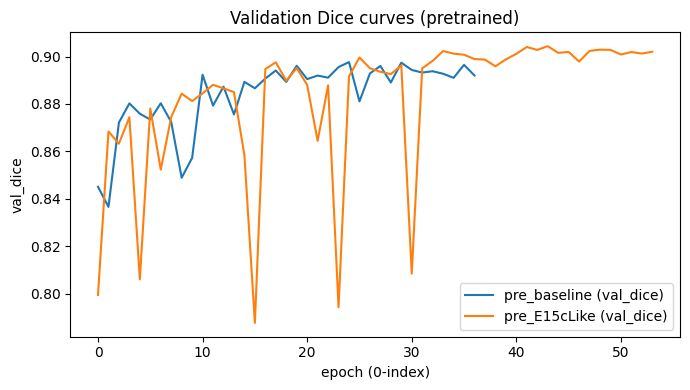

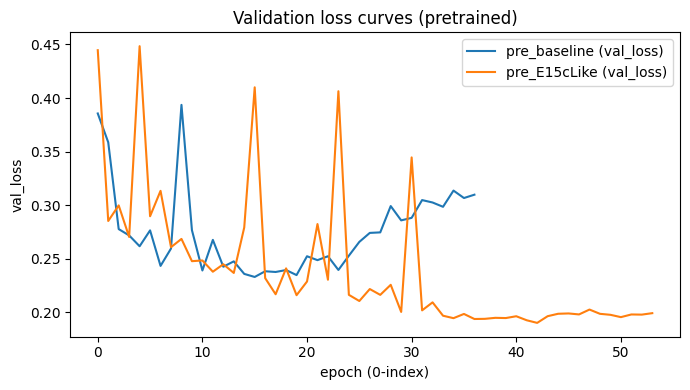

In [ ]:
import os, json
import numpy as np
import matplotlib.pyplot as plt

run_dirs = {
    "pre_baseline": "/content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_final_baseline_r18_lr0.0007_wd0.0_cosine_ep60_seed42",
    "pre_E15cLike": "/content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_final_E15cLike_r18_lr0.0007_wd0.0_cosine_ep60_seed42",
}

def load_history(run_dir):
    p = os.path.join(run_dir, "history.json")
    with open(p, "r") as f:
        return json.load(f)

H1 = load_history(run_dirs["pre_baseline"])
H2 = load_history(run_dirs["pre_E15cLike"])

# --- Plot VAL DICE ---
plt.figure(figsize=(7,4))
plt.plot(H1["val_dice"], label="pre_baseline (val_dice)")
plt.plot(H2["val_dice"], label="pre_E15cLike (val_dice)")
plt.xlabel("epoch (0-index)")
plt.ylabel("val_dice")
plt.title("Validation Dice curves (pretrained)")
plt.legend()
plt.tight_layout()
plt.show()

# --- Plot VAL LOSS ---
plt.figure(figsize=(7,4))
plt.plot(H1["val_loss"], label="pre_baseline (val_loss)")
plt.plot(H2["val_loss"], label="pre_E15cLike (val_loss)")
plt.xlabel("epoch (0-index)")
plt.ylabel("val_loss")
plt.title("Validation loss curves (pretrained)")
plt.legend()
plt.tight_layout()
plt.show()


In [ ]:
print(val_pre_aug.transforms)  # den du bruger til pretrained E15cLike


Compose(
      ToImage()
      ToDtype(scale=True)
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225], inplace=False)
)


In [ ]:
print(val_pre_aug.use_size_dependent, val_pre_aug.transforms_large)


False None


In [ ]:
print(df_pre_final.columns)

Index(['name', 'preset', 'optimizer', 'lr', 'weight_decay', 'scheduler_type',
       'epochs', 'best_epoch', 'best_val_dice', 'best_val_iou',
       'best_val_loss', 'final_val_dice', 'final_val_iou', 'seconds',
       'run_dir', 'seed', 'exp_type'],
      dtype='object')


In [ ]:
# ER KØRT: best threshold = 0.33
device = "cuda"
# Arkitektur
model = smp.Unet(
                encoder_name="resnet18",
                encoder_weights="imagenet",
                in_channels=NUM_CHANNELS,
                classes=NUM_CLASSES,
                encoder_depth=4,
                decoder_channels=(256,128,64,32),
                activation=None,
            ).to(device)


# Vægte fra vores træning (bedste model - 15c)
# Checkpoint indeholder modelens state_dict: learnable parametre (weights/biases)
# og evt. buffers (fx BatchNorm running stats), så vi kan genskabe den trænede model.
ckpt_path = os.path.join(SAVE_DIR_PRETRAINED, "pre_final_baseline_r18_lr0.0007_wd0.0_cosine_ep60_seed42", "best.pth")
ckpt = torch.load(ckpt_path, map_location=device)
if isinstance(ckpt, dict) and "model_state_dict" in ckpt:
    model.load_state_dict(ckpt["model_state_dict"])
else:
    model.load_state_dict(ckpt)
# Eval-mode: slår trænings-adfærd fra (Dropout OFF, BatchNorm bruger running stats).
# Det er vigtigt ved val/test, så resultatet er deterministisk og svarer til inference.
model.eval()
print("Loaded checkpoint:", ckpt_path)

thresholds_pretrained = np.round(np.arange(0.15, 0.55, 0.01), 2)
dices_pretrained, best_th_pretraned = threshold_sweep(model, valDS_imagenet, thresholds_pretrained, device="cuda")

print("BEST TH:", best_th_pretraned)


Loaded checkpoint: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_final_baseline_r18_lr0.0007_wd0.0_cosine_ep60_seed42/best.pth
th=0.15  mean_dice=0.896272
th=0.16  mean_dice=0.896607
th=0.17  mean_dice=0.896904
th=0.18  mean_dice=0.897168
th=0.19  mean_dice=0.897379
th=0.20  mean_dice=0.897587
th=0.21  mean_dice=0.897748
th=0.22  mean_dice=0.897876
th=0.23  mean_dice=0.897998
th=0.24  mean_dice=0.898086
th=0.25  mean_dice=0.898152
th=0.26  mean_dice=0.898205
th=0.27  mean_dice=0.898262
th=0.28  mean_dice=0.898312
th=0.29  mean_dice=0.898349
th=0.30  mean_dice=0.898369
th=0.31  mean_dice=0.898366
th=0.32  mean_dice=0.898383
th=0.33  mean_dice=0.898397
th=0.34  mean_dice=0.898385
th=0.35  mean_dice=0.898387
th=0.36  mean_dice=0.898387
th=0.37  mean_dice=0.898361
th=0.38  mean_dice=0.898312
th=0.39  mean_dice=0.898285
th=0.40  mean_dice=0.898231
th=0.41  mean_dice=0.898191
th=0.42  mean_dice=0.898146
th=0.43  mean_dice=0.898098
th=0.44  me

In [ ]:
# ER KØRT
# Gemmer data fra val sættet og threshold sweep på pretrained
# kræver allerede-beregnede thresholds_pretrained, dices_pretrained, best_th_pretrained
import os, json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime

OUT_DIR = os.path.join(SAVE_DIR_PRETRAINED, "baseline_threshold_sweep_val")
os.makedirs(OUT_DIR, exist_ok=True)

# --- 1) CSV: threshold -> mean_dice ---
df = pd.DataFrame({
    "threshold": thresholds_pretrained.astype(float),
    "mean_dice": np.array([float(dices_pretrained[float(t)]) for t in thresholds_pretrained], dtype=float),
})

sweep_csv = os.path.join(OUT_DIR, "threshold_sweep_val.csv")
df.to_csv(sweep_csv, index=False)
print("Saved:", sweep_csv)

# --- 2) JSON summary ---
best_row = df.loc[df["mean_dice"].idxmax()]
summary = {
    "timestamp": datetime.now().isoformat(timespec="seconds"),
    "split": "val",
    "ckpt_path": ckpt_path,
    "threshold_grid": {
        "start": float(thresholds_pretrained.min()),
        "end": float(thresholds_pretrained.max()),
        "step": float(np.round(thresholds_pretrained[1] - thresholds_pretrained[0], 6)) if len(thresholds_pretrained) > 1 else None,
        "n": int(len(thresholds_pretrained)),
    },
    "best_threshold": float(best_row["threshold"]),
    "best_mean_dice": float(best_row["mean_dice"]),
}

summary_path = os.path.join(OUT_DIR, "threshold_sweep_val_summary.json")
with open(summary_path, "w") as f:
    json.dump(summary, f, indent=2)
print("Saved:", summary_path)

# --- 3) PNG plot (paper/appendix) ---
plt.figure(figsize=(6,4))
plt.plot(df["threshold"], df["mean_dice"])
plt.axvline(float(best_row["threshold"]), linestyle="--")
plt.xlabel("Threshold")
plt.ylabel("Mean Dice (val)")
plt.title("Validation threshold sweep")
plt.tight_layout()

plot_path = os.path.join(OUT_DIR, "threshold_sweep_val.png")
plt.savefig(plot_path, dpi=200)
plt.close()
print("Saved:", plot_path)

print("BEST:", float(best_row["threshold"]), float(best_row["mean_dice"]))


Saved: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/baseline_threshold_sweep_val/threshold_sweep_val.csv
Saved: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/baseline_threshold_sweep_val/threshold_sweep_val_summary.json
Saved: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/baseline_threshold_sweep_val/threshold_sweep_val.png
BEST: 0.33 0.8983970545232296


In [ ]:
# ER KØRT
# TEST AF PRETRAINED FINAL
# -----------------------
# Load model + checkpoint
# -----------------------
device = "cuda"
# Arkitektur
model = smp.Unet(
                encoder_name="resnet18",
                encoder_weights="imagenet",
                in_channels=NUM_CHANNELS,
                classes=NUM_CLASSES,
                encoder_depth=4,
                decoder_channels=(256,128,64,32),
                activation=None,
            ).to(device)

# Vægte fra vores træning (pretrained)
# Checkpoint indeholder modelens state_dict: learnable parametre (weights/biases)
# og evt. buffers (fx BatchNorm running stats), så vi kan genskabe den trænede model.
ckpt_path = os.path.join(SAVE_DIR_PRETRAINED, "pre_final_baseline_r18_lr0.0007_wd0.0_cosine_ep60_seed42", "best.pth")
ckpt = torch.load(ckpt_path, map_location=device)
if isinstance(ckpt, dict) and "model_state_dict" in ckpt:
    model.load_state_dict(ckpt["model_state_dict"])
else:
    model.load_state_dict(ckpt)
# Eval-mode: slår trænings-adfærd fra (Dropout OFF, BatchNorm bruger running stats).
# Det er vigtigt ved val/test, så resultatet er deterministisk og svarer til inference.
model.eval()
print("Loaded checkpoint:", ckpt_path)

# -----------------------
# Score ALL val samples (Dice per image)
# -----------------------
testLoader = DataLoader(testDS_imagenet, batch_size=4, shuffle=False, num_workers=2)

# treshold fundet ved sweep skal bruges i val og test
th = 0.33
all_dice_pt_test = []
all_indices_pt_test = []
all_iou_pt_test = []
global_idx = 0
loss_fn = make_loss("bce+dice")
total_loss = 0.0
n_batches = 0
n_samples = 0


with torch.no_grad():
    for x, y in testLoader:
        bs = x.size(0)   # faktisk batch-størrelse (sidste batch kan være mindre)
        x = x.to(device)
        y = y.to(device)
        if y.ndim == 3:
          y = y.unsqueeze(1)

        logits = model(x)
        loss = loss_fn(logits, y.float())
        total_loss += float(loss.item()) * bs
        n_samples += bs

        prob = torch.sigmoid(logits)
        pred_bin = (prob > th).float()

        d = dice_per_sample(pred_bin, y)  # [B]
        d_cpu = d.detach().cpu().numpy().tolist()

        iou = iou_per_sample(pred_bin, y)        # [B]
        all_iou_pt_test.extend(iou.detach().cpu().numpy().tolist())

        idxs = list(range(global_idx, global_idx + bs))
        global_idx += bs

        all_indices_pt_test.extend(idxs)
        all_dice_pt_test.extend(d_cpu)

all_dice_pt_test = np.array(all_dice_pt_test, dtype=np.float32)
all_iou_pt_test = np.array(all_iou_pt_test, dtype=np.float32)
all_indices_pt_test = np.array(all_indices_pt_test)



mean_dice_pt_test = float(all_dice_pt_test.mean())
std_dice_pt_test  = float(all_dice_pt_test.std())

mean_iou_pt_test = float(all_iou_pt_test.mean())
std_iou_pt_test  = float(all_iou_pt_test.std())

print("test_mean_pt_dice:", mean_dice_pt_test)
print("test_std_pt_dice :", std_dice_pt_test)

print("**************")

print("test_mean_pt_iou:", mean_iou_pt_test)
print("test_std_pt_iou :", std_iou_pt_test)

print("**************")


print("test samples:", len(all_dice_pt_test))

mean_loss_pt_test = total_loss / max(1, n_samples)
print("test_mean_pt_loss:", mean_loss_pt_test)




Loaded checkpoint: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_final_baseline_r18_lr0.0007_wd0.0_cosine_ep60_seed42/best.pth
test_mean_pt_dice: 0.8934755325317383
test_std_pt_dice : 0.11817260086536407
**************
test_mean_pt_iou: 0.8227495551109314
test_std_pt_iou : 0.14651931822299957
**************
test samples: 379
test_mean_pt_loss: 0.27615890362961


In [ ]:
x, y = valDS_imagenet[0]
prob, _ = predict_single(model, x, th=0.5)  # th er ligegyldig her
print("prob min/max/mean:", float(prob.min()), float(prob.max()), float(prob.mean()))


prob min/max/mean: 8.182193589334474e-09 0.999593198299408 0.09877955913543701


In [ ]:
print(f"PT test: Dice={mean_dice_pt_test:.4f}±{std_dice_pt_test:.4f}, IoU={mean_iou_pt_test:.4f}±{std_iou_pt_test:.4f}, Loss={mean_loss_pt_test:.4f}, th={th}, n={len(all_dice_pt_test)}")


PT test: Dice=0.8935±0.1182, IoU=0.8227±0.1465, Loss=0.2762, th=0.33, n=379


In [ ]:
import os, json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime

def save_eval_bundle(
    out_dir: str,
    split: str,                    # "val" eller "test"
    ckpt_path: str,
    threshold: float,
    indices: np.ndarray,
    dice: np.ndarray,
    iou: np.ndarray,
    mean_loss: float | None = None,
    topk: int = 10,
    # valgfrit: threshold sweep
    sweep_thresholds: np.ndarray | None = None,
    sweep_dices: dict | list | np.ndarray | None = None,
    sweep_png_name: str = "threshold_sweep.png",
):
    os.makedirs(out_dir, exist_ok=True)

    # --- sikker dtype ---
    indices = np.asarray(indices, dtype=int)
    dice = np.asarray(dice, dtype=np.float32)
    iou  = np.asarray(iou,  dtype=np.float32)

    # --- helpers ---
    def stats_dict(arr: np.ndarray):
        n = int(len(arr))
        mean = float(arr.mean()) if n else float("nan")
        std  = float(arr.std(ddof=0)) if n else float("nan")
        mn   = float(arr.min()) if n else float("nan")
        mx   = float(arr.max()) if n else float("nan")
        p25, p50, p75 = (np.percentile(arr, [25,50,75]).astype(float).tolist() if n else [np.nan]*3)

        # 95% CI for mean (approx normal)
        if n > 1:
            se = float(arr.std(ddof=1) / np.sqrt(n))
            ci_low  = float(mean - 1.96 * se)
            ci_high = float(mean + 1.96 * se)
        else:
            se = float("nan"); ci_low = float("nan"); ci_high = float("nan")

        return {
            "n": n,
            "mean": mean,
            "std": std,
            "min": mn,
            "max": mx,
            "median": float(p50),
            "p25": float(p25),
            "p75": float(p75),
            "iqr": [float(p25), float(p75)],
            "mean_ci95": [ci_low, ci_high],
            "se_mean": se,
        }

    # --- 1) per-sample CSVs ---
    dice_csv = os.path.join(out_dir, "dice_per_sample.csv")
    pd.DataFrame({"idx": indices, "dice": dice.astype(float)}).to_csv(dice_csv, index=False)

    iou_csv = os.path.join(out_dir, "iou_per_sample.csv")
    pd.DataFrame({"idx": indices, "iou": iou.astype(float)}).to_csv(iou_csv, index=False)

    print("Saved:", dice_csv)
    print("Saved:", iou_csv)

    # --- 2) top/bottom (dice + iou) ---
    k = int(topk)
    order_d = np.argsort(dice)  # stigende
    bot_d = order_d[:k]
    top_d = order_d[-k:][::-1]

    order_i = np.argsort(iou)
    bot_i = order_i[:k]
    top_i = order_i[-k:][::-1]

    tb = pd.concat([
        pd.DataFrame({"metric":"dice", "rank_type":"top",    "idx": indices[top_d], "value": dice[top_d].astype(float)}),
        pd.DataFrame({"metric":"dice", "rank_type":"bottom", "idx": indices[bot_d], "value": dice[bot_d].astype(float)}),
        pd.DataFrame({"metric":"iou",  "rank_type":"top",    "idx": indices[top_i], "value": iou[top_i].astype(float)}),
        pd.DataFrame({"metric":"iou",  "rank_type":"bottom", "idx": indices[bot_i], "value": iou[bot_i].astype(float)}),
    ], ignore_index=True)

    tb_path = os.path.join(out_dir, "top_bottom.csv")
    tb.to_csv(tb_path, index=False)
    print("Saved:", tb_path)

    # --- 3) summary.json ---
    summary = {
        "timestamp": datetime.now().isoformat(timespec="seconds"),
        "split": split,
        "ckpt_path": ckpt_path,
        "threshold": float(threshold),
        "dice": stats_dict(dice),
        "iou":  stats_dict(iou),
        "mean_loss": (float(mean_loss) if mean_loss is not None else None),
    }

    summary_path = os.path.join(out_dir, "summary.json")
    with open(summary_path, "w") as f:
        json.dump(summary, f, indent=2)
    print("Saved:", summary_path)

    # --- 4) optional: threshold sweep save ---
    if sweep_thresholds is not None and sweep_dices is not None:
        sweep_thresholds = np.asarray(sweep_thresholds, dtype=float)

        # sweep_dices kan være dict (threshold->dice) eller list/array
        if isinstance(sweep_dices, dict):
            y = np.array([float(sweep_dices[float(t)]) for t in sweep_thresholds], dtype=float)
        else:
            y = np.asarray(sweep_dices, dtype=float)

        df_s = pd.DataFrame({"threshold": sweep_thresholds, "mean_dice": y})
        sweep_csv = os.path.join(out_dir, "threshold_sweep.csv")
        df_s.to_csv(sweep_csv, index=False)
        print("Saved:", sweep_csv)

        best_idx = int(np.argmax(y))
        best_t = float(sweep_thresholds[best_idx])
        best_d = float(y[best_idx])

        # plot
        plt.figure(figsize=(6,4))
        plt.plot(df_s["threshold"], df_s["mean_dice"])
        plt.axvline(best_t, linestyle="--")
        plt.xlabel("Threshold")
        plt.ylabel(f"Mean Dice ({split})")
        plt.title("Threshold sweep")
        plt.tight_layout()
        sweep_png = os.path.join(out_dir, sweep_png_name)
        plt.savefig(sweep_png, dpi=200)
        plt.close()
        print("Saved:", sweep_png)

        # gem i summary også
        summary["threshold_sweep"] = {
            "best_threshold": best_t,
            "best_mean_dice": best_d,
            "grid": {
                "start": float(sweep_thresholds.min()),
                "end": float(sweep_thresholds.max()),
                "step": float(np.round(sweep_thresholds[1]-sweep_thresholds[0], 6)) if len(sweep_thresholds) > 1 else None,
                "n": int(len(sweep_thresholds)),
            }
        }
        with open(summary_path, "w") as f:
            json.dump(summary, f, indent=2)
        print("Updated summary with threshold_sweep:", summary_path)


# =========================
# EKSEMPEL: brug på PRETRAINED TEST
# (tilpas OUT_DIR og variabelnavne hvis du kører scratch)
# =========================
OUT_DIR = os.path.join(SAVE_DIR_PRETRAINED, "final_test_saved")
save_eval_bundle(
    out_dir=OUT_DIR,
    split="test",
    ckpt_path=ckpt_path,
    threshold=th,
    indices=all_indices_pt_test,
    dice=all_dice_pt_test,
    iou=all_iou_pt_test,
    mean_loss=mean_loss_pt_test,
    topk=10,
)


Saved: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/final_test_saved/dice_per_sample.csv
Saved: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/final_test_saved/iou_per_sample.csv
Saved: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/final_test_saved/top_bottom.csv
Saved: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/final_test_saved/summary.json


In [ ]:
# =========================
# BRUG: SCRATCH TEST
# (forventer at du har: ckpt_path, th, all_indices_test, all_dice_test, all_iou_test, mean_loss_test)
# =========================
OUT_DIR = os.path.join(SAVE_DIR_SCRATCH, "final_test_saved")
save_eval_bundle(
    out_dir=OUT_DIR,
    split="test",
    ckpt_path=ckpt_path,
    threshold=th,
    indices=all_indices_test,
    dice=all_dice_test,
    iou=all_iou_test,
    mean_loss=mean_loss_test,
    topk=10,
)

Saved: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final_test_saved/dice_per_sample.csv
Saved: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final_test_saved/iou_per_sample.csv
Saved: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final_test_saved/top_bottom.csv
Saved: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final_test_saved/summary.json


In [57]:
# NEEDED FOR RERUNS
# Metoder til history, statestik og plots.
import os
import numpy as np
import torch
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

# -----------------------
# Config
# -----------------------
device = "cuda" if torch.cuda.is_available() else "cpu"
ckpt_path_1 = os.path.join(SAVE_DIR_SCRATCH, "final", "scratch_final.pth")  # Scratch
ckpt_path_2 = os.path.join(SAVE_DIR_PRETRAINED, "pre_final_baseline_r18_lr0.0007_wd0.0_cosine_ep60_seed42", "best.pth")  # pretrained
print(ckpt_path_1)
print(ckpt_path_2)
# -----------------------
# Helpers
# -----------------------
def dice_per_sample(pred_bin, target, eps=1e-7):
    # pred_bin, target: [B,1,H,W] (0/1)
    pred_bin = pred_bin.float()
    target = target.float()
    inter = (pred_bin * target).sum(dim=(1,2,3))
    union = pred_bin.sum(dim=(1,2,3)) + target.sum(dim=(1,2,3))
    return (2 * inter + eps) / (union + eps)  # [B]

def unnormalize_img(x_chw, mean, std):
    # x_chw: [C,H,W] -> [H,W,C] in [0,1] (clipped)
    x = x_chw.detach().cpu().float()
    mean_t = torch.tensor(mean).view(-1,1,1)
    std_t  = torch.tensor(std).view(-1,1,1)
    x = x * std_t + mean_t
    x = x.permute(1,2,0).numpy()
    return np.clip(x, 0, 1)

@torch.no_grad()
def predict_single(model, x_chw, th=THRESHOLD, device=device):
    # x_chw: [C,H,W]
    x = x_chw.unsqueeze(0).to(device)  # [1,C,H,W]
    logits = model(x)                  # [1,1,H,W]
    prob = torch.sigmoid(logits)[0,0].detach().cpu()  # [H,W]
    pred_bin = (prob > th).float()
    return prob, pred_bin

def plot_sample(idx, dice_val, x_chw, y_chw, prob_hw, pred_bin_hw):
    # y_chw: [1,H,W]
    im = unnormalize_img(x_chw, mean, std)
    gt = y_chw[0].detach().cpu().numpy()
    prob = prob_hw.numpy()
    pred = pred_bin_hw.numpy()

    fig, ax = plt.subplots(1, 4, figsize=(15,4))
    ax[0].imshow(im); ax[0].set_title(f"Input (idx={idx})"); ax[0].axis("off")
    ax[1].imshow(gt); ax[1].set_title("GT mask"); ax[1].axis("off")
    ax[2].imshow(prob); ax[2].set_title("Prob map"); ax[2].axis("off")
    ax[3].imshow(pred); ax[3].set_title(f"Pred mask | dice={dice_val:.3f}"); ax[3].axis("off")
    plt.show()
    plt.close()


def denorm_img(x_chw, mean, std):
    # x_chw: torch [3,H,W] (float)
    x = x_chw.clone().detach().cpu()
    mean_t = torch.tensor(mean)[:, None, None]
    std_t  = torch.tensor(std)[:, None, None]
    x = x * std_t + mean_t
    x = x.clamp(0, 1)
    return x.permute(1,2,0).numpy()  # HWC

def make_overlay(img_hwc, mask_hw, color=(1.0, 0.0, 0.0), alpha=0.35):
    out = img_hwc.copy()
    m = mask_hw.astype(bool)
    out[m] = (1 - alpha) * out[m] + alpha * np.array(color)
    return out

def plot_sample_with_overlay(idx, dice_val, x_chw, y_chw, prob_hw, pred_bin_hw, mean, std):
    img = denorm_img(x_chw, mean, std)

    # masks til HW
    gt = y_chw.detach().cpu().numpy()
    if gt.ndim == 3:  # [1,H,W]
        gt = gt[0]
    gt = (gt > 0.5).astype(np.uint8)

    pred = pred_bin_hw.detach().cpu().numpy()
    if pred.ndim == 3:  # [1,H,W]
        pred = pred[0]
    pred = (pred > 0.5).astype(np.uint8)

    prob = prob_hw.detach().cpu().numpy()
    if prob.ndim == 3:
        prob = prob[0]

    gt_overlay   = make_overlay(img, gt,   color=(0.0, 1.0, 0.0), alpha=0.35)  # grøn GT
    pred_overlay = make_overlay(img, pred, color=(1.0, 0.0, 0.0), alpha=0.35)  # rød Pred

    fig, ax = plt.subplots(1, 4, figsize=(12, 3))
    ax[0].imshow(img);         ax[0].set_title(f"Input (idx={idx})"); ax[0].axis("off")
    ax[1].imshow(gt_overlay);  ax[1].set_title("GT overlay");         ax[1].axis("off")
    ax[2].imshow(pred_overlay);ax[2].set_title(f"Pred overlay | dice={dice_val:.3f}"); ax[2].axis("off")
    ax[3].imshow(prob);        ax[3].set_title("Prob map");           ax[3].axis("off")
    plt.tight_layout()
    plt.show()



/content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final/scratch_final.pth
/content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_final_baseline_r18_lr0.0007_wd0.0_cosine_ep60_seed42/best.pth


Loaded checkpoint: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final/scratch_final.pth
Threshold: 0.56
Validation Dataset: Compose(
      ToImage()
      ToDtype(scale=True)
      Normalize(mean=[0.7230105775891656, 0.6177779170877388, 0.5672913460258063], std=[0.1657008095439599, 0.1725575604936751, 0.19304642304032354], inplace=False)
)

Top 6 (idx, dice):
31 0.9876982569694519
162 0.9842606782913208
155 0.98189377784729
113 0.9818629622459412
147 0.9813629388809204
157 0.9782848954200745

Bottom 6 (idx, dice):
139 2.349292852268925e-12
118 0.3699595630168915
104 0.45190444588661194
110 0.49085643887519836
17 0.5233201384544373
119 0.5326187014579773

=== TOP 6 VIS ===


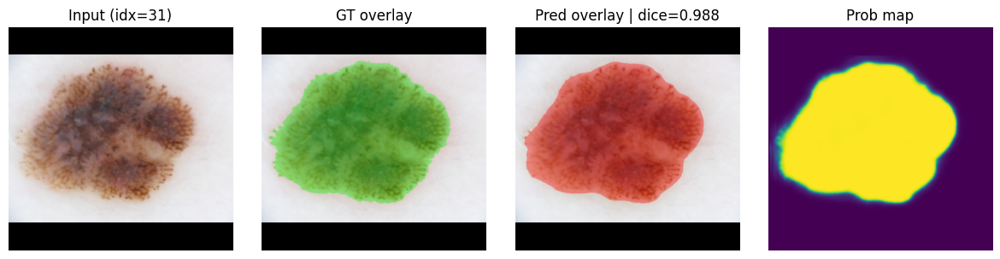

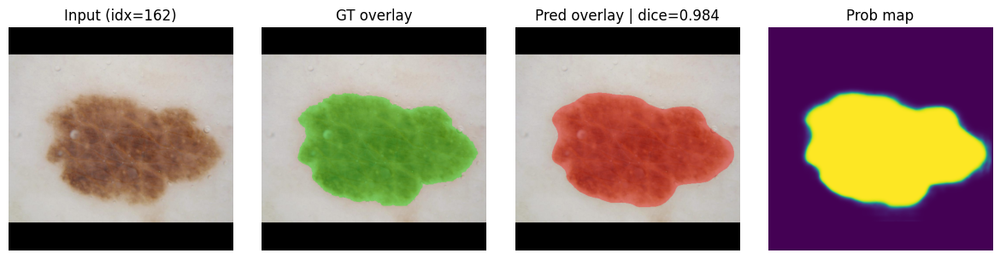

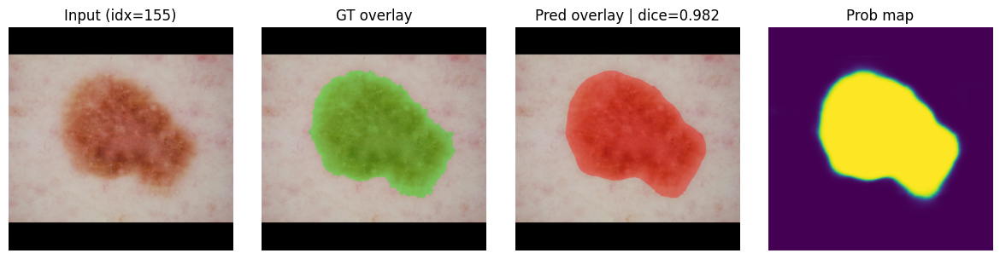

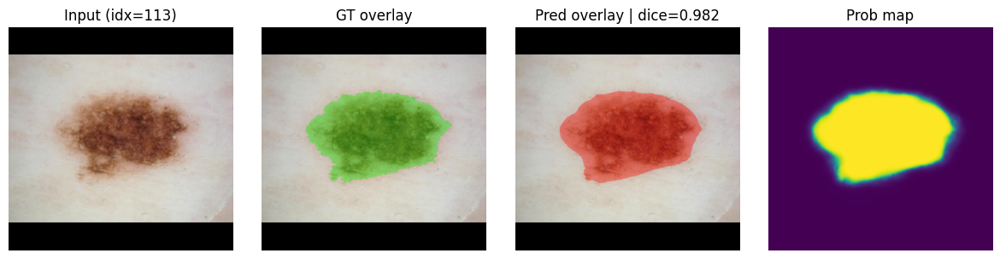

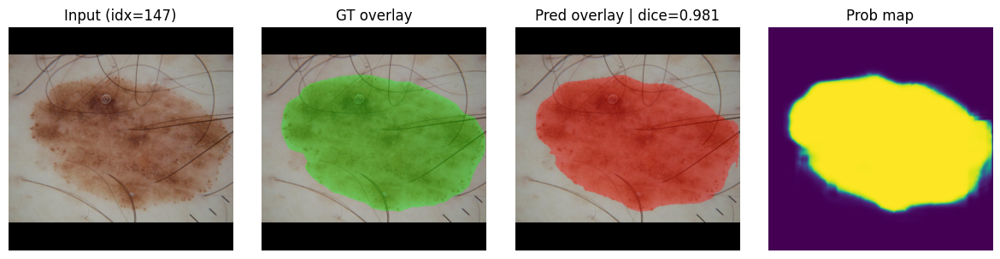

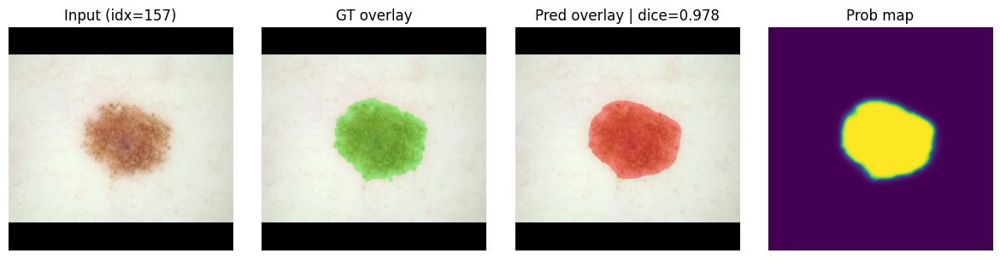


=== BOTTOM 6 VIS ===


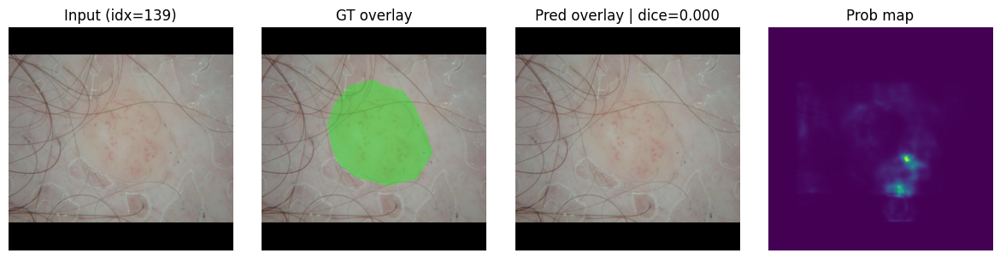

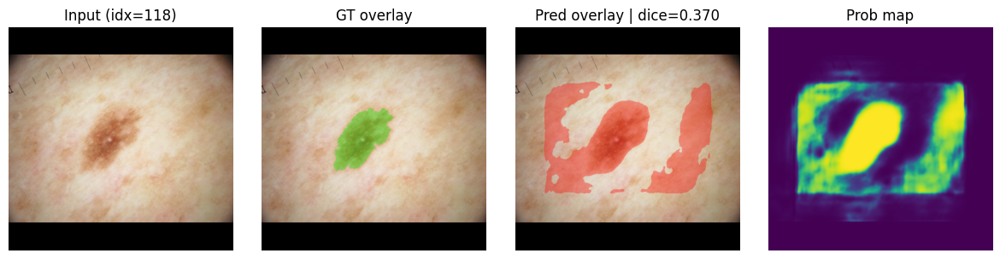

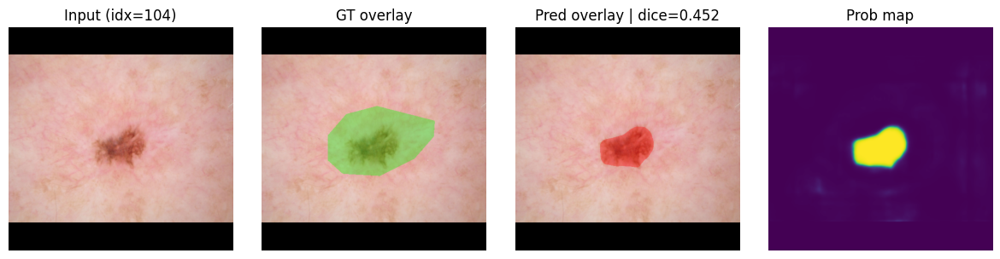

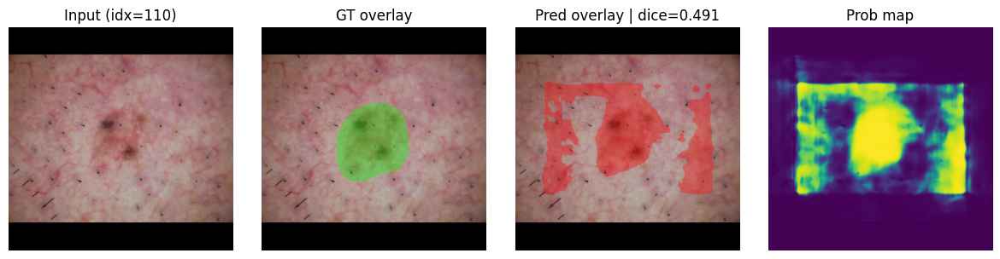

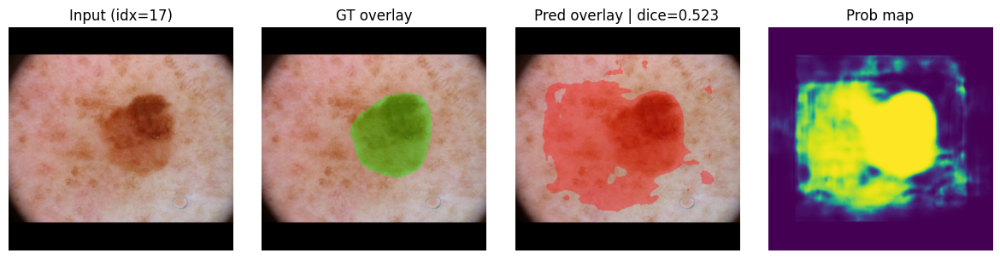

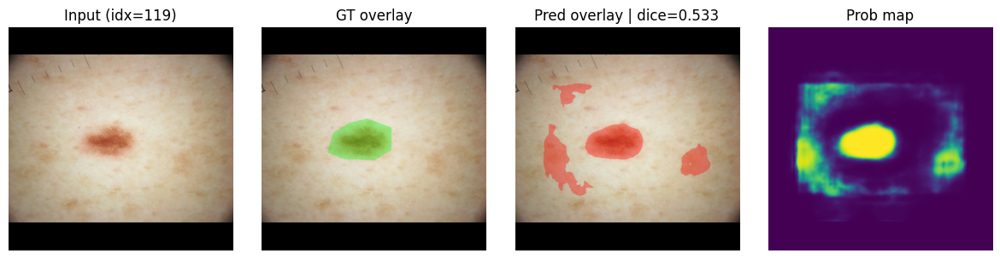

In [84]:
# Plot af billeder (top6/bot6) fra val gruppen. Bruger ovenstående metoder og sti til ckpt.
# -----------------------
# Load model + checkpoint
# -----------------------

load_path = ckpt_path_1  # ckpt_path_1 = scratch, ckpt_path_2 = pretrained

if load_path == '/content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/scratch/final/scratch_final.pth':
    th = 0.56
    valDS_use = valDS_scratch
    mean, std = scratch_mean, scratch_std
    model = UNet(in_channels=NUM_CHANNELS, n_class=NUM_CLASSES).to(device)
else:
    th = 0.33
    valDS_use = valDS_imagenet
    mean, std = imagenet_mean, imagenet_std
    model = smp.Unet(
                encoder_name="resnet18",
                encoder_weights="imagenet",
                in_channels=NUM_CHANNELS,
                classes=NUM_CLASSES,
                encoder_depth=4,
                decoder_channels=(256,128,64,32),
                activation=None,
            ).to(device)

ckpt = torch.load(load_path, map_location=device)
if isinstance(ckpt, dict) and "model_state_dict" in ckpt:
    model.load_state_dict(ckpt["model_state_dict"])
else:
    # fallback hvis du engang har gemt raw state_dict direkte
    model.load_state_dict(ckpt)

model.eval()
print("Loaded checkpoint:", load_path)
print("Threshold:", th)
print("Validation Dataset:", valDS_use.transforms)

# -----------------------
# Score ALL val samples (Dice per image)
# -----------------------
valLoader = DataLoader(valDS_use, batch_size=8, shuffle=False, num_workers=2)

all_dice = []
all_indices = []
global_idx = 0

with torch.no_grad():
    for x, y in valLoader:
        x = x.to(device)
        y = y.to(device)
        if y.ndim == 3:
            y = y.unsqueeze(1)

        logits = model(x)
        prob = torch.sigmoid(logits)
        pred_bin = (prob > th).float()

        d = dice_per_sample(pred_bin, y)  # [B]
        d_cpu = d.detach().cpu().numpy().tolist()

        bs = len(d_cpu)
        idxs = list(range(global_idx, global_idx + bs))
        global_idx += bs

        all_indices.extend(idxs)
        all_dice.extend(d_cpu)

all_dice = np.array(all_dice)
all_indices = np.array(all_indices)

# Top / bottom
k = 6
top_idx = all_indices[np.argsort(-all_dice)[:k]]
bot_idx = all_indices[np.argsort(all_dice)[:k]]

print("\nTop 6 (idx, dice):")
for i in top_idx:
    print(i, float(all_dice[i]))

print("\nBottom 6 (idx, dice):")
for i in bot_idx:
    print(i, float(all_dice[i]))

# -----------------------
# Visualize top/bottom
# -----------------------
print("\n=== TOP 6 VIS ===")
for idx in top_idx:
    x_chw, y_chw = valDS_use[int(idx)]
    prob_hw, pred_bin_hw = predict_single(model, x_chw, th)
    # beregn dice på samme måde som evaluering
    dice_val = float(all_dice[int(idx)])
    #plot_sample(int(idx), dice_val, x_chw, y_chw, prob_hw, pred_bin_hw)
    plot_sample_with_overlay(int(idx), dice_val, x_chw, y_chw, prob_hw, pred_bin_hw, mean, std)


print("\n=== BOTTOM 6 VIS ===")
for idx in bot_idx:
    x_chw, y_chw = valDS_use[int(idx)]
    prob_hw, pred_bin_hw = predict_single(model, x_chw, th)
    dice_val = float(all_dice[int(idx)])
    #plot_sample(int(idx), dice_val, x_chw, y_chw, prob_hw, pred_bin_hw)
    plot_sample_with_overlay(int(idx), dice_val, x_chw, y_chw, prob_hw, pred_bin_hw, mean, std)


Loaded checkpoint: /content/drive/MyDrive/Colab Notebooks/isic2016_experiments_v1/pretrained_resnet18_imagenet/pre_final_baseline_r18_lr0.0007_wd0.0_cosine_ep60_seed42/best.pth
Average Optimal Threshold: 0.33
Validation Dataset: Compose(
      ToImage()
      ToDtype(scale=True)
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225], inplace=False)
)


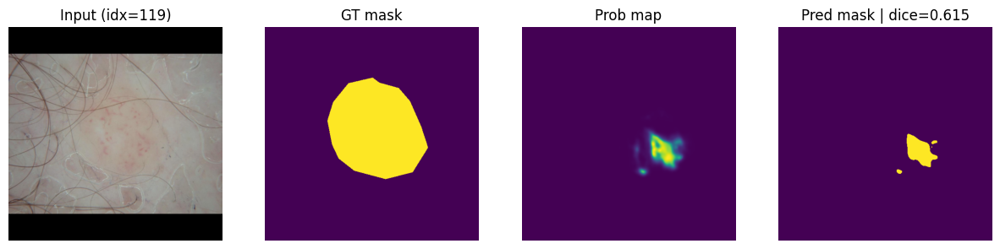

In [62]:
    # Plot enkelt billede, her bruges val gruppen
    x_chw, y_chw = valDS_use[int(139)]
    prob_hw, pred_bin_hw = predict_single(model, x_chw, th=0.33)
    dice_val = float(all_dice[int(idx)])

    print("Loaded checkpoint:", load_path)
    print("Average Optimal Threshold:", th)
    print("Validation Dataset:", valDS_use.transforms)

    plot_sample(int(119), dice_val, x_chw, y_chw, prob_hw, pred_bin_hw)

In [85]:
print("139:",valDS_use.imagePaths[139])
print("118:",valDS_use.imagePaths[118])
print("104 (malign) - 2nd worst in pretrained Dice 0.545 3rd worst on scratch Dice 0.452:",valDS_use.imagePaths[104])
print("11:",valDS_use.imagePaths[11])
print("150:",valDS_use.imagePaths[150])
print("0 (malign) - 5th worst on pretrained Dice 0.605:",valDS_use.imagePaths[0])
print("153:",valDS_use.imagePaths[153])
print("110 (malign) - 4th worst on scratch Dice 0.491:",valDS_use.imagePaths[110])
print("17:",valDS_use.imagePaths[17])
print("119:",valDS_use.imagePaths[119])

139: isic2016/val/images/ISIC_0010491.jpg
118: isic2016/val/images/ISIC_0010236.jpg
104 (malign) - 2nd worst in pretrained Dice 0.545 3rd worst on scratch Dice 0.452: isic2016/val/images/ISIC_0010024.jpg
11: isic2016/val/images/ISIC_0000096.jpg
150: isic2016/val/images/ISIC_0011085.jpg
0 (malign) - 5th worst on pretrained Dice 0.605: isic2016/val/images/ISIC_0000004.jpg
153: isic2016/val/images/ISIC_0011115.jpg
110 (malign) - 4th worst on scratch Dice 0.491: isic2016/val/images/ISIC_0010081.jpg
17: isic2016/val/images/ISIC_0000133.jpg
119: isic2016/val/images/ISIC_0010237.jpg


In [1]:
!pip -q install nbstripout

In [4]:
!nbstripout --install


fatal: --local can only be used inside a git repository
Installation failed: not a git repository!
